# Filament initialization in a sphere

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import math
from numba import jit
rng = np.random.default_rng() # initialize generator instance
from mpl_toolkits import mplot3d # for vizualization
%matplotlib notebook
from time import time

This is a filament initializer that places the center points of filaments inside a sphere. If a constant director is chosen, this can lead to a tactoid-like configuration of filaments.

Author: Saad J. Ansari (2020)

In [17]:
# Define some constants
R = 0.806349472 # radius of sphere (micron)
vol_sphere = (4./3.) * math.pi * R**3
n_fil = 25600
use_pack_frac = False
pack_frac = 0.3 # packing fraction (volume of filaments inside sphere/total volume of sphere)

D = 0.007 # diameter of filaments (micron)
director = np.array([0, 0, 1]) # director vector (CAN BE RANDOMIZED)
Lmin = 0.09 # minimum length of filaments
Lmax = 0.28 # maximum length of filaments
Lmean = 0.18 # mean length of filaments
use_exp_filament_length = True # flag to sample from an exponential distribution of lengths (cutoff with Lmin and Lmax)

#fname = './TubuleInitial_25600_poly.dat'
fname = './TacNem_R.806_Lmean.18_Lmin.09_Lmax.28_nfil51200.dat'
write_file = True
run_visualization = True
run_tests = False
system_offset = [2.52, 2.52, 2.52]

### Description:

We do this in the following way:
* Randomly sample $(x,y,z)$ where $x,y,z \in [-R,R]$ such that $x^2 + y^2 + z^2 < R^2$
* Attempt to add a filament at the sampled position:
    * Check for minimum distance to all pre-existing filaments.
    * If minimum distance is less than the filament diameter $D$, a filament instance is created and **successfully added** to a filament list.
    * If minimum distance condition is not met, the filament is **not added** to the list.
    * If a filament is added successfully, we continue. Otherwise, we sample another point and attempt a filament addition before proceeding.
* Once a filament is added, we calculate the a packing fraction for the system (if enabled).
* The steps above are repeated. The program stops when:
    * The specified number of filaments are attained, or an addition attempt fails 5000 consecutive times.
    * The specified packing fraction is attained (if enabled)

We begin by creating the machinery to achieve this.

1. **Filament( )** (class): Useful way to store information (start pt, end pt, gid, length, director) about a given filament. The choice of a class is natural when multiple instances need to be created.


2. **minDistBetweenTwoFil( )**: Calculates the minimum distance between two filaments. It parametrizes the filaments with $(s,t)$ and seeks a global minimum of $W(s,t)$, the squared distance between any two points on the two lines. If the global minimum lies outside the range of $s$ and $t$ ($s \in [0,1]$, $t \in [0,1]$), then it checks all the edges for a minimum distance. It works for both parallel and non-parallel, overlapping and skew filaments. This is adapted from http://softsurfer.com/Archive/algorithm_0106/algorithm_0106.htm#dist3D_Segment_to_Segment.


3. **minDistFilAll( )**: Calcutes the minimum distance between a single filament and a list of filaments. It loops over all filaments in the list and uses *minDistBetweenTwoFil()* to evaluate pair-pair distances. 


4. **getLengthRandomExp( )**: samples a value from an exponential distribution with min and max cutoffs for the values. We use this to sample filament lengths if enabled.


5. **sph2cart**/**cart2sph**:  transformations between cartesian and spherical coordinates.


6. **getFilamentLengthInsideSphere( )**: finds the length of a filament that lies inside a spherical region. It does that by getting points along a filament and checking their radial coordinate (in the spherical coordinate system). This gives an enclosed length of a filament which can be used to calculate an enclosed volume.

7. **getRand3PointInSphere( )**: get a random point in 3D space that is inside the sphere of some specified radius.

### Notes:

* The packing fraction calculation uses the value inside the initialization sphere. We assume that this is an accurate representation of the packing fraction throughout the system.
* The code can be easily modified to get an isotropic initial condition (randomly sample the director vector)

### Code:

In [4]:
# Define a filament class
class Filament():
    def __init__(self, center, director, leng, radius):
        self.center = center
        self.director = director/ np.linalg.norm(director)
        self.length = leng
        self.radius = radius
        self.pos_start = center - leng/2 * self.director
        self.pos_end = center + leng/2 * self.director
        self.gid = gid # defined outisde the class
    def Plot3(self,ax):
        ax.plot3D( [self.pos_start[0], self.pos_end[0]], [self.pos_start[1], self.pos_end[1]], [self.pos_start[2], self.pos_end[2]], 'red')
    def GetStringtoWrite(self):
        return 'C {0} {1} {2:0.6f} {3:0.6f} {4:0.6f} {5:0.6f} {6:0.6f} {7:0.6f}\n'.format(
        self.gid, self.radius,
        self.pos_start[0], self.pos_start[1], self.pos_start[2],
        self.pos_end[0], self.pos_end[1], self.pos_end[2])
    def __repr__(self):
        return "Filament()"
    def __str__(self):
        return 'Filament {0}:\n  pos_start: {1}\n  pos_end: {2}\n  length: {3}\n  radius: {4}'.format(self.gid, self.pos_start, self.pos_end, self.length,self.radius)

In [5]:
# Find Minimum Distance between two filaments
@jit
def minDistBetweenTwoFil(p1, p2, p3, p4):
    # Adapted from matlab
    # https://www.mathworks.com/matlabcentral/fileexchange/32487-shortest-distance-between-two-line-segments
    # which adapted this from Dan Sunday's Geometry Algorithms originally written in C++
    # http://softsurfer.com/Archive/algorithm_0106/algorithm_0106.htm#dist3D_Segment_to_Segment
    
    # p1 = f1.pos_start
    # p2 = f1.pos_end
    # p3 = f2.pos_start
    # p4 = f2.pos_end
    # Computes the minimum distance between two line segments. Code
    # is adapted for Matlab from Dan Sunday's Geometry Algorithms originally
    # written in C++
    # http://softsurfer.com/Archive/algorithm_0106/algorithm_0106.htm#dist3D_Segment_to_Segment
    # Usage: Input the start and end x,y,z coordinates for two line segments. 
    # p1, p2 are [x,y,z] coordinates of first line segment and p3,p4 are for
    # second line segment. 
    # Output: scalar minimum distance between the two segments.
    #  Example:
    #	P1 = [0 0 0];     P2 = [1 0 0];
    #   P3 = [0 1 0];     P4 = [1 1 0];
    #	dist = minDistBetweenTwoFil(P1, P2, P3, P4)
    #p1 = f1.pos_start
    #p2 = f1.pos_end
    #p3 = f2.pos_start
    #p4 = f2.pos_end
    
    u = p1 - p2
    v = p3 - p4
    w = p2 - p4
    
    a = np.dot(u,u)
    b = np.dot(u,v)
    c = np.dot(v,v)
    d = np.dot(u,w)
    e = np.dot(v,w)
    D = a*c - b*b
    sD = D
    tD = D
    
    SMALL_NUM = 0.00000001
    
    # compute the line parameters of the two closest points
    if D < SMALL_NUM: # the lines are almost parallel
        sN = 0.0     # force using point P0 on segment S1
        sD = 1.0     # to prevent possible division by 0.0 later
        tN = e
        tD = c
    else:             # get the closest points on the infinite lines
        sN = (b*e - c*d)
        tN = (a*e - b*d)
        if sN < 0.0:   # sc < 0 => the s=0 edge is visible       
            sN = 0.0
            tN = e
            tD = c
        elif sN > sD:  # sc > 1 => the s=1 edge is visible
            sN = sD
            tN = e + b
            tD = c
    
    if tN < 0.0:            # tc < 0 => the t=0 edge is visible
        tN = 0.0
        # recompute sc for this edge
        if -d < 0.0:
            sN = 0.0
        elif -d > a:
            sN = sD
        else:
            sN = -d
            sD = a
    elif tN > tD:       # tc > 1 => the t=1 edge is visible
        tN = tD
        # recompute sc for this edge
        if -d + b < 0.0:
            sN = 0
        elif -d + b > a:
            sN = sD
        else: 
            sN = -d + b
            sD = a
    
    # finally do the division to get sc and tc
    if  np.absolute(sN) < SMALL_NUM:
        sc = 0.0
    else:
        sc = sN / sD
    
    if np.absolute(tN) < SMALL_NUM:
        tc = 0.0
    else:
        tc = tN / tD
    
    # get the difference of the two closest points
    dP = w + (sc * u) - (tc * v);  # = S1(sc) - S2(tc)
    distance = np.linalg.norm(dP);
    outV = dP;
    
    # outV = outV      # vector connecting the closest points
    # cp_1 = p2+sc*u  # Closest point on object 1 
    # cp_2 = p4+tc*v  # Closest point on object 2
    
    return distance

In [6]:
# Define a Minimum Distance from one filament to all other filaments
def minDistFilAll( f1, f_list):
    dists = [ minDistBetweenTwoFil(f1,f2) for f2 in f_list]
    if not dists:
        return 1e6
    else:
        return np.min(dists)

In [7]:
def check_fil_overlap(fil, fil_list, min_dist_bound):
    min_dist = 1e6
    for fil_check in fil_list:
        check_dist = minDistBetweenTwoFil(fil.pos_start, fil.pos_end,
                                          fil_check.pos_start, fil_check.pos_end)
        min_dist = check_dist if check_dist < min_dist else min_dist
        if min_dist < min_dist_bound:
            return False
    return True

In [8]:
# Define a random length sampler
def getLengthRandomExp( rng, Lmean, Lmin=0, Lmax=1e6):
    val = -1
    while val < Lmin or val > Lmax:
        val = rng.exponential( Lmean)
    return val

In [9]:
# polar to cartesian coordinates
def sph2cart(r, phi, theta):
    return np.array([
         r * math.sin(theta) * math.cos(phi),
         r * math.sin(theta) * math.sin(phi),
         r * math.cos(theta)
    ])
# cartesian to polar coordinates
def cart2sph(x, y, z):
    XsqPlusYsq = x**2 + y**2
    r = math.sqrt(XsqPlusYsq + z**2)               # r
    elev = math.atan2(z,math.sqrt(XsqPlusYsq))     # theta
    az = math.atan2(y,x)                           # phi
    return np.array([r, az, elev])

In [10]:
# volume of filament inside sphere
def getFilamentLengthInsideSphere(f1, rad):
    
    # Find coordinates along the filament whose r coord in (r,phi, theta) lies inside the sphere.
    # Segment the filament into 100 points
    lens = np.linspace(0, f1.length, 100)
    num_in = 0
    for el in lens:
        [x,y,z] = f1.pos_start + el*f1.director
        pt = cart2sph(x,y,z)
        if pt[0] < rad:
            num_in += 1
        
    return (num_in/100)*f1.length

In [11]:
# Get random 3d cartesian point() inside sphere
def getRand3PointInSphere(rad):
    d = 2*rad
    while d > rad:
        xyz = rng.uniform(-rad, rad, 3)
        d = np.linalg.norm(xyz)
    return [xyz[0],xyz[1],xyz[2]]

#    radius = np.random.uniform(0.0,1.0)*rad 
#    theta = np.random.uniform(-1.0,1.0)*math.pi
#    phi = np.arccos(1-2*np.random.uniform(0.0,1.))
#    x = radius * np.sin( theta ) * np.cos( phi )
#    y = radius * np.sin( theta ) * np.sin( phi )
#    z = radius * np.cos( theta )
#    return [x,y,z]

We start with a sphere with radius R. We randomly pick values (r,phi, theta) that define the position of a point in 3D space. We attempt to insert a filament with that point as its center. If the minimum distance between this filament and any other filaments is greater than diameter D of the filaments (i.e filaments do not overlap), we successfully complete the insertion. If insertion fails, we try a new point.

In [12]:
def attemptAddFilament(center, L, director, D, f_list, gid):
    # Initialize a  filament of length L
    fil = Filament(center, director, L, D*.5)
    
    # find minimum distance to other filaments, and accept if distance is more than filament diameter
    #min_dist = minDistFilAll(fil, f_list)
    status = check_fil_overlap(fil, f_list, D)
    if status:
        f_list.append(fil)
        gid+=1
        print(fil)
    return f_list, gid, status

In [13]:
# There are two ways to go about this.
# 1. Attempt to achieve a specified packing fraction
# 2. Attempt to initialize a specified number of rods
t0 = time()
gid = 0
f_list = [] # list to store filaments
if use_pack_frac:
    
    v_enclosed = 0 # volume occupied by filaments inside the sphere
    cpf = 0 # current packing fraction tracker
    while cpf < pack_frac:
        center = getRand3PointInSphere(R) # Sample a random (x,y,z inside a sphere)
        
        if use_exp_filament_length:
            L = getLengthRandomExp( rng, Lmean, Lmin, Lmax)
        else:
            L = Lmean
            
        f_list,gid,status = attemptAddFilament(center,L,director, D, f_list, gid)
        if status:
            len_inside = getFilamentLengthInsideSphere( f_list[-1], R) # length of filament inside the sphere
            v_enclosed += math.pi * (D/2)**2 * len_inside # volume of filament inside the sphere
            cpf = v_enclosed / vol_sphere # current packing fraction
            print('CPF = {}'.format(cpf))

    
else:
    
    # sample n_fil length values and sort them
    if use_exp_filament_length:
        lens = sorted( [getLengthRandomExp( rng, Lmean, Lmin, Lmax) for i in range(n_fil)], reverse=True)
    else:
        lens = [Lmean for i in range(n_fil)]
        
    for idx,el in enumerate(lens):
        status = False
        failCount=0
        while not status:
            failCount+=1
            center = getRand3PointInSphere(R) # Sample a random (x,y,z inside a sphere)
            f_list,gid,status = attemptAddFilament(center, el, director, D, f_list, gid)
            if failCount > 5000:
                raise Exception('Failed to add a filament with 5000 trials.\nStopping...\n...\n...\n Total Added Filaments = {}'.format(len(f_list)))
t1 = time()
print("total time: ", (t1-t0))

Filament 0:
  pos_start: [ 0.66537028 -0.3363523   0.08384659]
  pos_end: [ 0.66537028 -0.3363523   0.36382571]
  length: 0.2799791216309899
  radius: 0.0035
Filament 1:
  pos_start: [-0.08324946 -0.27557265 -0.34076544]
  pos_end: [-0.08324946 -0.27557265 -0.06078685]
  length: 0.2799785898576051
  radius: 0.0035
Filament 2:
  pos_start: [-0.36265354 -0.52597598  0.0877614 ]
  pos_end: [-0.36265354 -0.52597598  0.36773369]
  length: 0.2799722915832698
  radius: 0.0035
Filament 3:
  pos_start: [ 0.70455857 -0.36108225 -0.120857  ]
  pos_end: [ 0.70455857 -0.36108225  0.15911206]
  length: 0.2799690525214339
  radius: 0.0035
Filament 4:
  pos_start: [-0.69199712 -0.0615306  -0.25475412]
  pos_end: [-0.69199712 -0.0615306   0.02521038]
  length: 0.27996449736186035
  radius: 0.0035
Filament 5:
  pos_start: [0.46978712 0.55105445 0.07208334]
  pos_end: [0.46978712 0.55105445 0.35204762]
  length: 0.2799642847217452
  radius: 0.0035
Filament 6:
  pos_start: [-0.32893274 -0.24437972  0.2138

Filament 326:
  pos_start: [-0.51036087  0.32666307 -0.46913039]
  pos_end: [-0.51036087  0.32666307 -0.19119279]
  length: 0.2779376082388676
  radius: 0.0035
Filament 327:
  pos_start: [-0.14032294 -0.50971181  0.3848017 ]
  pos_end: [-0.14032294 -0.50971181  0.66273211]
  length: 0.2779304137158174
  radius: 0.0035
Filament 328:
  pos_start: [-0.15620278  0.20841584 -0.51495143]
  pos_end: [-0.15620278  0.20841584 -0.23702493]
  length: 0.2779265089927106
  radius: 0.0035
Filament 329:
  pos_start: [ 0.67389046 -0.33516414  0.09876027]
  pos_end: [ 0.67389046 -0.33516414  0.37668207]
  length: 0.2779217994555908
  radius: 0.0035
Filament 330:
  pos_start: [ 0.38333304  0.59761593 -0.23352636]
  pos_end: [0.38333304 0.59761593 0.04438589]
  length: 0.277912251720704
  radius: 0.0035
Filament 331:
  pos_start: [0.09895739 0.0750312  0.20352712]
  pos_end: [0.09895739 0.0750312  0.48143105]
  length: 0.2779039272930597
  radius: 0.0035
Filament 332:
  pos_start: [-0.32337194 -0.4955403

  radius: 0.0035
Filament 579:
  pos_start: [ 0.30236339  0.08870292 -0.78418094]
  pos_end: [ 0.30236339  0.08870292 -0.50770592]
  length: 0.2764750193592483
  radius: 0.0035
Filament 580:
  pos_start: [-0.22103755  0.21537142  0.13767787]
  pos_end: [-0.22103755  0.21537142  0.41413557]
  length: 0.2764576983111704
  radius: 0.0035
Filament 581:
  pos_start: [-0.11848308 -0.35680118 -0.57534998]
  pos_end: [-0.11848308 -0.35680118 -0.29890917]
  length: 0.2764408034725166
  radius: 0.0035
Filament 582:
  pos_start: [ 0.21490762  0.19073535 -0.5789802 ]
  pos_end: [ 0.21490762  0.19073535 -0.30254375]
  length: 0.27643644124053296
  radius: 0.0035
Filament 583:
  pos_start: [ 0.46971693 -0.57750385 -0.08769291]
  pos_end: [ 0.46971693 -0.57750385  0.18873018]
  length: 0.27642308228049467
  radius: 0.0035
Filament 584:
  pos_start: [-0.50719272 -0.12448009  0.3788262 ]
  pos_end: [-0.50719272 -0.12448009  0.6552439 ]
  length: 0.2764177060602134
  radius: 0.0035
Filament 585:
  pos_s

Filament 914:
  pos_start: [ 0.25190855  0.48643731 -0.56465251]
  pos_end: [ 0.25190855  0.48643731 -0.2902572 ]
  length: 0.27439530808604606
  radius: 0.0035
Filament 915:
  pos_start: [ 0.74709011  0.10617926 -0.00499925]
  pos_end: [0.74709011 0.10617926 0.26938603]
  length: 0.2743852772713321
  radius: 0.0035
Filament 916:
  pos_start: [-0.24047511 -0.23340409 -0.01208785]
  pos_end: [-0.24047511 -0.23340409  0.26229663]
  length: 0.2743844858408793
  radius: 0.0035
Filament 917:
  pos_start: [-0.15916999  0.46793927 -0.58852252]
  pos_end: [-0.15916999  0.46793927 -0.31414991]
  length: 0.2743726084059583
  radius: 0.0035
Filament 918:
  pos_start: [ 0.07024486 -0.41697249  0.1336615 ]
  pos_end: [ 0.07024486 -0.41697249  0.40802257]
  length: 0.27436107350525585
  radius: 0.0035
Filament 919:
  pos_start: [-0.14874383  0.01335843  0.33543167]
  pos_end: [-0.14874383  0.01335843  0.60978799]
  length: 0.2743563139054642
  radius: 0.0035
Filament 920:
  pos_start: [-0.25238878  

Filament 1077:
  pos_start: [ 0.12439872 -0.17047133 -0.61189172]
  pos_end: [ 0.12439872 -0.17047133 -0.33853255]
  length: 0.2733591755531724
  radius: 0.0035
Filament 1078:
  pos_start: [ 0.1383144   0.28994077 -0.03731823]
  pos_end: [0.1383144  0.28994077 0.23603828]
  length: 0.2733565053595056
  radius: 0.0035
Filament 1079:
  pos_start: [ 0.08107784  0.15649476 -0.48550307]
  pos_end: [ 0.08107784  0.15649476 -0.2121626 ]
  length: 0.2733404684232076
  radius: 0.0035
Filament 1080:
  pos_start: [ 0.53194207 -0.25476146 -0.46906702]
  pos_end: [ 0.53194207 -0.25476146 -0.19573233]
  length: 0.27333468992683624
  radius: 0.0035
Filament 1081:
  pos_start: [ 0.39494025  0.45094555 -0.24629955]
  pos_end: [0.39494025 0.45094555 0.02702606]
  length: 0.2733256105203896
  radius: 0.0035
Filament 1082:
  pos_start: [ 0.14753459  0.71976756 -0.30754452]
  pos_end: [ 0.14753459  0.71976756 -0.0342379 ]
  length: 0.273306613144205
  radius: 0.0035
Filament 1083:
  pos_start: [0.19409504 

Filament 1249:
  pos_start: [-0.08472833  0.14625597 -0.61741481]
  pos_end: [-0.08472833  0.14625597 -0.34516447]
  length: 0.2722503379801386
  radius: 0.0035
Filament 1250:
  pos_start: [ 0.36949458  0.05595618 -0.13722747]
  pos_end: [0.36949458 0.05595618 0.13502121]
  length: 0.2722486854559337
  radius: 0.0035
Filament 1251:
  pos_start: [-0.0862618   0.2437642   0.29416263]
  pos_end: [-0.0862618   0.2437642   0.56640819]
  length: 0.27224556772365904
  radius: 0.0035
Filament 1252:
  pos_start: [-0.38041689 -0.22158935  0.46097503]
  pos_end: [-0.38041689 -0.22158935  0.73322028]
  length: 0.2722452528734097
  radius: 0.0035
Filament 1253:
  pos_start: [-0.33052872 -0.02518339 -0.34506587]
  pos_end: [-0.33052872 -0.02518339 -0.07282476]
  length: 0.27224110448303684
  radius: 0.0035
Filament 1254:
  pos_start: [-0.3346645   0.2841446   0.28665463]
  pos_end: [-0.3346645   0.2841446   0.55888503]
  length: 0.2722304009326946
  radius: 0.0035
Filament 1255:
  pos_start: [-0.028

  radius: 0.0035
Filament 1424:
  pos_start: [ 0.352216  -0.0480555  0.2798804]
  pos_end: [ 0.352216   -0.0480555   0.55105164]
  length: 0.2711712364643343
  radius: 0.0035
Filament 1425:
  pos_start: [-0.22834317 -0.4655459  -0.50481903]
  pos_end: [-0.22834317 -0.4655459  -0.23365023]
  length: 0.27116879836174934
  radius: 0.0035
Filament 1426:
  pos_start: [-0.23240797 -0.5604073  -0.51247807]
  pos_end: [-0.23240797 -0.5604073  -0.24131854]
  length: 0.27115952510213726
  radius: 0.0035
Filament 1427:
  pos_start: [ 0.50161527 -0.21982673 -0.60752049]
  pos_end: [ 0.50161527 -0.21982673 -0.33636598]
  length: 0.2711545079341445
  radius: 0.0035
Filament 1428:
  pos_start: [ 0.08494797  0.02622533 -0.77509254]
  pos_end: [ 0.08494797  0.02622533 -0.50394671]
  length: 0.2711458264097842
  radius: 0.0035
Filament 1429:
  pos_start: [0.075514   0.20289896 0.38474488]
  pos_end: [0.075514   0.20289896 0.65588802]
  length: 0.2711431435928881
  radius: 0.0035
Filament 1430:
  pos_sta

  radius: 0.0035
Filament 1678:
  pos_start: [0.70695718 0.07975748 0.13599729]
  pos_end: [0.70695718 0.07975748 0.40564709]
  length: 0.2696498008371349
  radius: 0.0035
Filament 1679:
  pos_start: [-0.19149809  0.61507799 -0.05189402]
  pos_end: [-0.19149809  0.61507799  0.2177381 ]
  length: 0.26963212367348
  radius: 0.0035
Filament 1680:
  pos_start: [-0.04128036  0.32792621 -0.06995649]
  pos_end: [-0.04128036  0.32792621  0.19965632]
  length: 0.2696128073451837
  radius: 0.0035
Filament 1681:
  pos_start: [ 0.50225039 -0.60605363  0.01139003]
  pos_end: [ 0.50225039 -0.60605363  0.28099275]
  length: 0.2696027171207397
  radius: 0.0035
Filament 1682:
  pos_start: [ 0.10210963 -0.56690025 -0.06424332]
  pos_end: [ 0.10210963 -0.56690025  0.20535428]
  length: 0.2695976018571835
  radius: 0.0035
Filament 1683:
  pos_start: [ 0.45323591  0.02357267 -0.11009343]
  pos_end: [0.45323591 0.02357267 0.15950346]
  length: 0.2695968904792602
  radius: 0.0035
Filament 1684:
  pos_start: 

  radius: 0.0035
Filament 1788:
  pos_start: [ 0.59935287 -0.43417906  0.01009351]
  pos_end: [ 0.59935287 -0.43417906  0.27895952]
  length: 0.2688660116904961
  radius: 0.0035
Filament 1789:
  pos_start: [ 0.61540956 -0.10939526 -0.00558347]
  pos_end: [ 0.61540956 -0.10939526  0.26327619]
  length: 0.268859655379573
  radius: 0.0035
Filament 1790:
  pos_start: [-0.22208955  0.26228584 -0.02327177]
  pos_end: [-0.22208955  0.26228584  0.24558737]
  length: 0.26885914158153146
  radius: 0.0035
Filament 1791:
  pos_start: [0.20970387 0.36736108 0.45947388]
  pos_end: [0.20970387 0.36736108 0.72833235]
  length: 0.26885846667848856
  radius: 0.0035
Filament 1792:
  pos_start: [-0.11880898  0.60710761  0.26584127]
  pos_end: [-0.11880898  0.60710761  0.53469694]
  length: 0.26885566809872624
  radius: 0.0035
Filament 1793:
  pos_start: [-0.26360357  0.40904751 -0.23874862]
  pos_end: [-0.26360357  0.40904751  0.03009949]
  length: 0.26884810769426737
  radius: 0.0035
Filament 1794:
  pos

Filament 1925:
  pos_start: [-0.21077106  0.19754411  0.48056947]
  pos_end: [-0.21077106  0.19754411  0.74868024]
  length: 0.2681107701649467
  radius: 0.0035
Filament 1926:
  pos_start: [-0.10046077  0.38471164  0.03960177]
  pos_end: [-0.10046077  0.38471164  0.30767897]
  length: 0.2680771988813443
  radius: 0.0035
Filament 1927:
  pos_start: [-0.05329989 -0.181886   -0.62805481]
  pos_end: [-0.05329989 -0.181886   -0.35998528]
  length: 0.268069535936892
  radius: 0.0035
Filament 1928:
  pos_start: [-0.36235813 -0.57763121 -0.18735667]
  pos_end: [-0.36235813 -0.57763121  0.08069659]
  length: 0.2680532554043904
  radius: 0.0035
Filament 1929:
  pos_start: [ 0.2094699  -0.60899205 -0.58139933]
  pos_end: [ 0.2094699  -0.60899205 -0.31335382]
  length: 0.2680455136735412
  radius: 0.0035
Filament 1930:
  pos_start: [-0.24500818  0.00213417 -0.45341941]
  pos_end: [-0.24500818  0.00213417 -0.18538131]
  length: 0.2680380932180522
  radius: 0.0035
Filament 1931:
  pos_start: [0.4287

Filament 2080:
  pos_start: [-0.13800295  0.33237673  0.33684178]
  pos_end: [-0.13800295  0.33237673  0.60402434]
  length: 0.2671825586819807
  radius: 0.0035
Filament 2081:
  pos_start: [ 0.13571981 -0.45329463 -0.3046047 ]
  pos_end: [ 0.13571981 -0.45329463 -0.03742334]
  length: 0.2671813608112343
  radius: 0.0035
Filament 2082:
  pos_start: [ 0.39417984  0.07828494 -0.71864337]
  pos_end: [ 0.39417984  0.07828494 -0.45146612]
  length: 0.2671772440591048
  radius: 0.0035
Filament 2083:
  pos_start: [ 0.44109437  0.16094146 -0.64799773]
  pos_end: [ 0.44109437  0.16094146 -0.38083164]
  length: 0.26716608905184525
  radius: 0.0035
Filament 2084:
  pos_start: [ 0.17056597  0.45730719 -0.66851497]
  pos_end: [ 0.17056597  0.45730719 -0.40135568]
  length: 0.2671592900793558
  radius: 0.0035
Filament 2085:
  pos_start: [-0.49580476 -0.33675601 -0.2405855 ]
  pos_end: [-0.49580476 -0.33675601  0.02655777]
  length: 0.26714327333678056
  radius: 0.0035
Filament 2086:
  pos_start: [0.0

  radius: 0.0035
Filament 2177:
  pos_start: [0.1282666  0.58379202 0.33872776]
  pos_end: [0.1282666  0.58379202 0.60517552]
  length: 0.266447760687399
  radius: 0.0035
Filament 2178:
  pos_start: [-0.07339995 -0.20150905 -0.01471568]
  pos_end: [-0.07339995 -0.20150905  0.25172675]
  length: 0.26644243659647554
  radius: 0.0035
Filament 2179:
  pos_start: [ 0.07787116  0.62425087 -0.29760029]
  pos_end: [ 0.07787116  0.62425087 -0.03115967]
  length: 0.2664406201031225
  radius: 0.0035
Filament 2180:
  pos_start: [ 0.29125311 -0.52243422  0.36833028]
  pos_end: [ 0.29125311 -0.52243422  0.63476825]
  length: 0.26643797079984466
  radius: 0.0035
Filament 2181:
  pos_start: [ 0.23623341  0.13375277 -0.32918159]
  pos_end: [ 0.23623341  0.13375277 -0.062756  ]
  length: 0.26642559563664403
  radius: 0.0035
Filament 2182:
  pos_start: [ 0.46861215 -0.06650881  0.12656506]
  pos_end: [ 0.46861215 -0.06650881  0.39298458]
  length: 0.2664195236568343
  radius: 0.0035
Filament 2183:
  pos_

Filament 2237:
  pos_start: [-0.04193315 -0.17313207 -0.84448958]
  pos_end: [-0.04193315 -0.17313207 -0.57841218]
  length: 0.2660773992423479
  radius: 0.0035
Filament 2238:
  pos_start: [0.04013175 0.27745851 0.08034653]
  pos_end: [0.04013175 0.27745851 0.3464219 ]
  length: 0.2660753725528681
  radius: 0.0035
Filament 2239:
  pos_start: [ 0.02894189 -0.25875285  0.54052416]
  pos_end: [ 0.02894189 -0.25875285  0.80659699]
  length: 0.2660728278709722
  radius: 0.0035
Filament 2240:
  pos_start: [ 0.14129105  0.23494693 -0.13774408]
  pos_end: [0.14129105 0.23494693 0.12831687]
  length: 0.2660609557601875
  radius: 0.0035
Filament 2241:
  pos_start: [ 0.58841698  0.25995851 -0.37822002]
  pos_end: [ 0.58841698  0.25995851 -0.11218392]
  length: 0.26603609952654717
  radius: 0.0035
Filament 2242:
  pos_start: [ 0.13665189  0.39043538 -0.45983499]
  pos_end: [ 0.13665189  0.39043538 -0.1938033 ]
  length: 0.26603169312318464
  radius: 0.0035
Filament 2243:
  pos_start: [-0.14529818 

Filament 2331:
  pos_start: [-0.09060064 -0.12543238 -0.71342898]
  pos_end: [-0.09060064 -0.12543238 -0.44798309]
  length: 0.26544588912084693
  radius: 0.0035
Filament 2332:
  pos_start: [ 0.22970236  0.34579462 -0.58293458]
  pos_end: [ 0.22970236  0.34579462 -0.31748948]
  length: 0.26544509485550166
  radius: 0.0035
Filament 2333:
  pos_start: [ 0.72853612  0.05798866 -0.22299471]
  pos_end: [0.72853612 0.05798866 0.04244676]
  length: 0.2654414630967372
  radius: 0.0035
Filament 2334:
  pos_start: [0.19895127 0.5459081  0.3561816 ]
  pos_end: [0.19895127 0.5459081  0.62161298]
  length: 0.26543138499786767
  radius: 0.0035
Filament 2335:
  pos_start: [ 0.18460793 -0.07998067  0.44710081]
  pos_end: [ 0.18460793 -0.07998067  0.71252215]
  length: 0.2654213396755386
  radius: 0.0035
Filament 2336:
  pos_start: [-0.38303341  0.43392952 -0.6356737 ]
  pos_end: [-0.38303341  0.43392952 -0.37025361]
  length: 0.2654200919704488
  radius: 0.0035
Filament 2337:
  pos_start: [-0.41092689

Filament 2394:
  pos_start: [ 0.09311947 -0.28469942  0.57916606]
  pos_end: [ 0.09311947 -0.28469942  0.84421433]
  length: 0.26504827093760924
  radius: 0.0035
Filament 2395:
  pos_start: [-0.59388391 -0.06119858 -0.29833856]
  pos_end: [-0.59388391 -0.06119858 -0.0332928 ]
  length: 0.26504576267201274
  radius: 0.0035
Filament 2396:
  pos_start: [ 0.01548013 -0.04442576 -0.59465075]
  pos_end: [ 0.01548013 -0.04442576 -0.32961658]
  length: 0.2650341661951751
  radius: 0.0035
Filament 2397:
  pos_start: [ 0.04452374  0.14647508 -0.17228593]
  pos_end: [0.04452374 0.14647508 0.09274146]
  length: 0.26502739476484083
  radius: 0.0035
Filament 2398:
  pos_start: [-0.4780818  -0.43601808 -0.36050729]
  pos_end: [-0.4780818  -0.43601808 -0.09548215]
  length: 0.2650251430356449
  radius: 0.0035
Filament 2399:
  pos_start: [0.40454714 0.3487123  0.17845001]
  pos_end: [0.40454714 0.3487123  0.44347338]
  length: 0.2650233687156768
  radius: 0.0035
Filament 2400:
  pos_start: [0.15671601 

Filament 2492:
  pos_start: [ 0.00796565  0.06793267 -0.06539736]
  pos_end: [0.00796565 0.06793267 0.19913444]
  length: 0.26453180816369276
  radius: 0.0035
Filament 2493:
  pos_start: [-0.66905526 -0.28564918  0.19038798]
  pos_end: [-0.66905526 -0.28564918  0.4549132 ]
  length: 0.26452521562096476
  radius: 0.0035
Filament 2494:
  pos_start: [-0.39900287 -0.3819595  -0.15393465]
  pos_end: [-0.39900287 -0.3819595   0.11058703]
  length: 0.2645216821100583
  radius: 0.0035
Filament 2495:
  pos_start: [-0.08084787  0.41656103  0.38979585]
  pos_end: [-0.08084787  0.41656103  0.65431177]
  length: 0.2645159136527244
  radius: 0.0035
Filament 2496:
  pos_start: [ 0.1476146  -0.43437317  0.38681565]
  pos_end: [ 0.1476146  -0.43437317  0.65132978]
  length: 0.26451413485673536
  radius: 0.0035
Filament 2497:
  pos_start: [-0.20389136 -0.23233497  0.00814834]
  pos_end: [-0.20389136 -0.23233497  0.27266172]
  length: 0.26451337498847
  radius: 0.0035
Filament 2498:
  pos_start: [ 0.3643

Filament 2550:
  pos_start: [-0.12377929 -0.34029743 -0.81890996]
  pos_end: [-0.12377929 -0.34029743 -0.55475121]
  length: 0.2641587496188145
  radius: 0.0035
Filament 2551:
  pos_start: [0.2178137  0.33779839 0.2490203 ]
  pos_end: [0.2178137  0.33779839 0.51316164]
  length: 0.2641413361530257
  radius: 0.0035
Filament 2552:
  pos_start: [ 0.63331749 -0.41871924 -0.19122694]
  pos_end: [ 0.63331749 -0.41871924  0.07291074]
  length: 0.2641376802233398
  radius: 0.0035
Filament 2553:
  pos_start: [-0.3138093  -0.01205003 -0.10752274]
  pos_end: [-0.3138093  -0.01205003  0.1566083 ]
  length: 0.26413103748598643
  radius: 0.0035
Filament 2554:
  pos_start: [ 0.17959167  0.23304614 -0.08115295]
  pos_end: [0.17959167 0.23304614 0.18297104]
  length: 0.26412399500970946
  radius: 0.0035
Filament 2555:
  pos_start: [-0.42035145 -0.02836503 -0.21213924]
  pos_end: [-0.42035145 -0.02836503  0.05197958]
  length: 0.2641188135794142
  radius: 0.0035
Filament 2556:
  pos_start: [ 0.16099405 

Filament 2606:
  pos_start: [-0.54882306 -0.10838733  0.3809202 ]
  pos_end: [-0.54882306 -0.10838733  0.64477443]
  length: 0.26385422947990317
  radius: 0.0035
Filament 2607:
  pos_start: [ 0.34538935 -0.09163953 -0.63609558]
  pos_end: [ 0.34538935 -0.09163953 -0.37224781]
  length: 0.26384776652121195
  radius: 0.0035
Filament 2608:
  pos_start: [0.27662896 0.47372789 0.34755515]
  pos_end: [0.27662896 0.47372789 0.61138888]
  length: 0.2638337281848999
  radius: 0.0035
Filament 2609:
  pos_start: [ 0.34631382 -0.35061351 -0.35991087]
  pos_end: [ 0.34631382 -0.35061351 -0.09608511]
  length: 0.26382576505545946
  radius: 0.0035
Filament 2610:
  pos_start: [-0.14552554 -0.12680341 -0.73524134]
  pos_end: [-0.14552554 -0.12680341 -0.47141652]
  length: 0.26382482628402576
  radius: 0.0035
Filament 2611:
  pos_start: [-0.61489801 -0.42965694  0.09991121]
  pos_end: [-0.61489801 -0.42965694  0.36373297]
  length: 0.2638217619429596
  radius: 0.0035
Filament 2612:
  pos_start: [ 0.4128

Filament 2692:
  pos_start: [ 0.32162516 -0.00515142 -0.14130385]
  pos_end: [ 0.32162516 -0.00515142  0.12200109]
  length: 0.26330493824111495
  radius: 0.0035
Filament 2693:
  pos_start: [-0.16301743 -0.10595425 -0.76144582]
  pos_end: [-0.16301743 -0.10595425 -0.49814192]
  length: 0.2633038993349229
  radius: 0.0035
Filament 2694:
  pos_start: [ 0.18414525  0.53831573 -0.48103859]
  pos_end: [ 0.18414525  0.53831573 -0.21773589]
  length: 0.2633027019302897
  radius: 0.0035
Filament 2695:
  pos_start: [-0.42826004 -0.49633189  0.25107531]
  pos_end: [-0.42826004 -0.49633189  0.51437281]
  length: 0.2632975005614976
  radius: 0.0035
Filament 2696:
  pos_start: [-0.06120632  0.59353259 -0.53269974]
  pos_end: [-0.06120632  0.59353259 -0.26941397]
  length: 0.26328577575939727
  radius: 0.0035
Filament 2697:
  pos_start: [ 0.12500187 -0.31428034  0.59231291]
  pos_end: [ 0.12500187 -0.31428034  0.85558496]
  length: 0.26327205575460105
  radius: 0.0035
Filament 2698:
  pos_start: [-0

Filament 2789:
  pos_start: [-0.61846991 -0.43672681 -0.40090052]
  pos_end: [-0.61846991 -0.43672681 -0.1381074 ]
  length: 0.2627931171631412
  radius: 0.0035
Filament 2790:
  pos_start: [-0.68683436  0.24609272  0.03039136]
  pos_end: [-0.68683436  0.24609272  0.29318201]
  length: 0.26279065597960904
  radius: 0.0035
Filament 2791:
  pos_start: [-0.41145824 -0.41661033 -0.30617743]
  pos_end: [-0.41145824 -0.41661033 -0.04339354]
  length: 0.2627838872079958
  radius: 0.0035
Filament 2792:
  pos_start: [0.00536262 0.35794683 0.56557306]
  pos_end: [0.00536262 0.35794683 0.8283542 ]
  length: 0.2627811422129392
  radius: 0.0035
Filament 2793:
  pos_start: [ 0.02438967 -0.05715637 -0.8147223 ]
  pos_end: [ 0.02438967 -0.05715637 -0.55194346]
  length: 0.2627788339378433
  radius: 0.0035
Filament 2794:
  pos_start: [ 0.33639598 -0.2571482  -0.27011143]
  pos_end: [ 0.33639598 -0.2571482  -0.00733852]
  length: 0.262772918264936
  radius: 0.0035
Filament 2795:
  pos_start: [ 0.46593929

Filament 2876:
  pos_start: [-0.10064052  0.30170514 -0.52048087]
  pos_end: [-0.10064052  0.30170514 -0.2582286 ]
  length: 0.2622522701820442
  radius: 0.0035
Filament 2877:
  pos_start: [ 0.04952837  0.19195962 -0.80731773]
  pos_end: [ 0.04952837  0.19195962 -0.54507489]
  length: 0.2622428363818204
  radius: 0.0035
Filament 2878:
  pos_start: [-0.52852435  0.05504267  0.38531898]
  pos_end: [-0.52852435  0.05504267  0.64755949]
  length: 0.2622405055253581
  radius: 0.0035
Filament 2879:
  pos_start: [-0.61680927  0.29495808 -0.05710017]
  pos_end: [-0.61680927  0.29495808  0.20513372]
  length: 0.2622338869376117
  radius: 0.0035
Filament 2880:
  pos_start: [ 0.42564452 -0.64595892 -0.31937921]
  pos_end: [ 0.42564452 -0.64595892 -0.05714579]
  length: 0.26223342163893065
  radius: 0.0035
Filament 2881:
  pos_start: [-4.87866973e-01 -4.83290751e-01  2.20769717e-05]
  pos_end: [-0.48786697 -0.48329075  0.26225158]
  length: 0.2622295017216748
  radius: 0.0035
Filament 2882:
  pos_

Filament 2927:
  pos_start: [-0.66199647  0.01113157 -0.58901073]
  pos_end: [-0.66199647  0.01113157 -0.3270502 ]
  length: 0.26196053538021774
  radius: 0.0035
Filament 2928:
  pos_start: [-0.40532373  0.12060501 -0.34820937]
  pos_end: [-0.40532373  0.12060501 -0.08625289]
  length: 0.2619564845994712
  radius: 0.0035
Filament 2929:
  pos_start: [-0.31068123 -0.68812621  0.00370122]
  pos_end: [-0.31068123 -0.68812621  0.26564906]
  length: 0.26194784459912335
  radius: 0.0035
Filament 2930:
  pos_start: [ 0.6420809  -0.33764878 -0.36771652]
  pos_end: [ 0.6420809  -0.33764878 -0.10576947]
  length: 0.26194705003523194
  radius: 0.0035
Filament 2931:
  pos_start: [-0.28599723  0.01961672  0.11554603]
  pos_end: [-0.28599723  0.01961672  0.37749285]
  length: 0.2619468254745827
  radius: 0.0035
Filament 2932:
  pos_start: [ 0.11739065 -0.7142766   0.13811233]
  pos_end: [ 0.11739065 -0.7142766   0.40005669]
  length: 0.261944362230863
  radius: 0.0035
Filament 2933:
  pos_start: [ 0.

Filament 2986:
  pos_start: [-0.39477323 -0.28878927 -0.30657751]
  pos_end: [-0.39477323 -0.28878927 -0.04501604]
  length: 0.26156147252384626
  radius: 0.0035
Filament 2987:
  pos_start: [-0.04106915  0.32045301 -0.72301233]
  pos_end: [-0.04106915  0.32045301 -0.46145957]
  length: 0.26155276338955036
  radius: 0.0035
Filament 2988:
  pos_start: [-0.35464405 -0.45344473  0.05065988]
  pos_end: [-0.35464405 -0.45344473  0.31220632]
  length: 0.2615464426364857
  radius: 0.0035
Filament 2989:
  pos_start: [0.2911079  0.00676308 0.01798192]
  pos_end: [0.2911079  0.00676308 0.279524  ]
  length: 0.26154208537671286
  radius: 0.0035
Filament 2990:
  pos_start: [ 0.20410493 -0.18745557  0.13775203]
  pos_end: [ 0.20410493 -0.18745557  0.39929093]
  length: 0.26153890163439103
  radius: 0.0035
Filament 2991:
  pos_start: [-0.05651163 -0.10670359  0.33411515]
  pos_end: [-0.05651163 -0.10670359  0.59565288]
  length: 0.26153773127505997
  radius: 0.0035
Filament 2992:
  pos_start: [ 0.164

Filament 3038:
  pos_start: [-0.06063625  0.32311642 -0.02023203]
  pos_end: [-0.06063625  0.32311642  0.24099993]
  length: 0.2612319608445639
  radius: 0.0035
Filament 3039:
  pos_start: [-0.07692565  0.48729874 -0.73814607]
  pos_end: [-0.07692565  0.48729874 -0.47691587]
  length: 0.2612301957305496
  radius: 0.0035
Filament 3040:
  pos_start: [-0.17532533 -0.70075916  0.19063614]
  pos_end: [-0.17532533 -0.70075916  0.4518484 ]
  length: 0.2612122612551095
  radius: 0.0035
Filament 3041:
  pos_start: [0.18069374 0.66904056 0.03507971]
  pos_end: [0.18069374 0.66904056 0.29629166]
  length: 0.26121194925003804
  radius: 0.0035
Filament 3042:
  pos_start: [-0.1012956   0.43576131 -0.71952591]
  pos_end: [-0.1012956   0.43576131 -0.45831815]
  length: 0.2612077620579254
  radius: 0.0035
Filament 3043:
  pos_start: [ 0.04410034  0.12750743 -0.27314328]
  pos_end: [ 0.04410034  0.12750743 -0.01194432]
  length: 0.2611989568633996
  radius: 0.0035
Filament 3044:
  pos_start: [-0.0236521

Filament 3134:
  pos_start: [-0.18462147  0.02352157 -0.57549843]
  pos_end: [-0.18462147  0.02352157 -0.31489202]
  length: 0.26060640976574656
  radius: 0.0035
Filament 3135:
  pos_start: [-0.4981938  -0.1577537  -0.30800979]
  pos_end: [-0.4981938  -0.1577537  -0.04743018]
  length: 0.2605796102903687
  radius: 0.0035
Filament 3136:
  pos_start: [ 0.24878083 -0.56771352 -0.35155873]
  pos_end: [ 0.24878083 -0.56771352 -0.09098663]
  length: 0.2605720985148584
  radius: 0.0035
Filament 3137:
  pos_start: [-0.3131022  -0.0794133   0.02660779]
  pos_end: [-0.3131022  -0.0794133   0.28717865]
  length: 0.2605708620512464
  radius: 0.0035
Filament 3138:
  pos_start: [-0.27850057  0.24529255 -0.63029145]
  pos_end: [-0.27850057  0.24529255 -0.36972758]
  length: 0.260563865072894
  radius: 0.0035
Filament 3139:
  pos_start: [-0.41921303  0.30653392  0.2383748 ]
  pos_end: [-0.41921303  0.30653392  0.49893735]
  length: 0.26056254728894557
  radius: 0.0035
Filament 3140:
  pos_start: [-0.1

Filament 3198:
  pos_start: [-0.6269866   0.21461588 -0.08104043]
  pos_end: [-0.6269866   0.21461588  0.17920312]
  length: 0.26024355891455947
  radius: 0.0035
Filament 3199:
  pos_start: [ 0.14533516 -0.23202331 -0.81831504]
  pos_end: [ 0.14533516 -0.23202331 -0.55807276]
  length: 0.2602422817944152
  radius: 0.0035
Filament 3200:
  pos_start: [ 0.07963342  0.25715692 -0.43863105]
  pos_end: [ 0.07963342  0.25715692 -0.17838966]
  length: 0.2602413817143222
  radius: 0.0035
Filament 3201:
  pos_start: [-0.29781439 -0.01733415 -0.38418589]
  pos_end: [-0.29781439 -0.01733415 -0.12395094]
  length: 0.2602349569315448
  radius: 0.0035
Filament 3202:
  pos_start: [-0.63618002  0.23689262  0.06104983]
  pos_end: [-0.63618002  0.23689262  0.3212847 ]
  length: 0.2602348697400703
  radius: 0.0035
Filament 3203:
  pos_start: [-0.66190774 -0.07167302 -0.46314116]
  pos_end: [-0.66190774 -0.07167302 -0.20290781]
  length: 0.26023335422754595
  radius: 0.0035
Filament 3204:
  pos_start: [-0.

Filament 3253:
  pos_start: [-0.3567993  -0.28037018  0.20606357]
  pos_end: [-0.3567993  -0.28037018  0.46599086]
  length: 0.2599272835905967
  radius: 0.0035
Filament 3254:
  pos_start: [ 0.50289396 -0.57240103  0.05491744]
  pos_end: [ 0.50289396 -0.57240103  0.31483896]
  length: 0.259921520440603
  radius: 0.0035
Filament 3255:
  pos_start: [ 0.50098588  0.35144471 -0.18318388]
  pos_end: [0.50098588 0.35144471 0.07673419]
  length: 0.25991806914065135
  radius: 0.0035
Filament 3256:
  pos_start: [-0.13789252  0.57774651  0.16326219]
  pos_end: [-0.13789252  0.57774651  0.42317883]
  length: 0.2599166392941673
  radius: 0.0035
Filament 3257:
  pos_start: [ 0.61135536 -0.21550902 -0.46348979]
  pos_end: [ 0.61135536 -0.21550902 -0.20357323]
  length: 0.259916558902039
  radius: 0.0035
Filament 3258:
  pos_start: [ 0.69487512 -0.30106202 -0.2924595 ]
  pos_end: [ 0.69487512 -0.30106202 -0.03254554]
  length: 0.25991396705289427
  radius: 0.0035
Filament 3259:
  pos_start: [-0.24628

Filament 3337:
  pos_start: [-0.24142885 -0.46832694 -0.7103659 ]
  pos_end: [-0.24142885 -0.46832694 -0.45086909]
  length: 0.2594968130884091
  radius: 0.0035
Filament 3338:
  pos_start: [ 0.41391365 -0.07805601 -0.45107358]
  pos_end: [ 0.41391365 -0.07805601 -0.19158094]
  length: 0.2594926429058409
  radius: 0.0035
Filament 3339:
  pos_start: [-0.4933129  -0.24540796  0.37708687]
  pos_end: [-0.4933129  -0.24540796  0.63657617]
  length: 0.25948929423638295
  radius: 0.0035
Filament 3340:
  pos_start: [-0.01044285  0.21789664 -0.34414967]
  pos_end: [-0.01044285  0.21789664 -0.08468179]
  length: 0.2594678729330334
  radius: 0.0035
Filament 3341:
  pos_start: [-0.69998643  0.26799263 -0.1558924 ]
  pos_end: [-0.69998643  0.26799263  0.10357027]
  length: 0.2594626697803074
  radius: 0.0035
Filament 3342:
  pos_start: [ 0.70275243  0.00329831 -0.39451418]
  pos_end: [ 0.70275243  0.00329831 -0.13505554]
  length: 0.2594586384631839
  radius: 0.0035
Filament 3343:
  pos_start: [0.39

Filament 3412:
  pos_start: [-0.13450928 -0.30421457 -0.108603  ]
  pos_end: [-0.13450928 -0.30421457  0.15051425]
  length: 0.2591172557955798
  radius: 0.0035
Filament 3413:
  pos_start: [ 0.17636922 -0.12893464 -0.61047634]
  pos_end: [ 0.17636922 -0.12893464 -0.35136441]
  length: 0.2591119283315172
  radius: 0.0035
Filament 3414:
  pos_start: [ 6.03431486e-04 -6.43578534e-01 -4.53383014e-01]
  pos_end: [ 6.03431486e-04 -6.43578534e-01 -1.94285238e-01]
  length: 0.25909777557901914
  radius: 0.0035
Filament 3415:
  pos_start: [-0.54071215  0.47008652 -0.16613066]
  pos_end: [-0.54071215  0.47008652  0.09294378]
  length: 0.25907443698039795
  radius: 0.0035
Filament 3416:
  pos_start: [ 0.60198881 -0.14727865  0.02665483]
  pos_end: [ 0.60198881 -0.14727865  0.28572499]
  length: 0.25907015651141546
  radius: 0.0035
Filament 3417:
  pos_start: [-0.51238473  0.24035135  0.10410253]
  pos_end: [-0.51238473  0.24035135  0.36317229]
  length: 0.2590697575803003
  radius: 0.0035
Filamen

Filament 3480:
  pos_start: [-0.3734484  -0.00553613  0.46008151]
  pos_end: [-0.3734484  -0.00553613  0.71879   ]
  length: 0.2587084843777263
  radius: 0.0035
Filament 3481:
  pos_start: [0.34886314 0.22716729 0.5574656 ]
  pos_end: [0.34886314 0.22716729 0.8161681 ]
  length: 0.2587025013816594
  radius: 0.0035
Filament 3482:
  pos_start: [-0.12758029 -0.53385531 -0.38958798]
  pos_end: [-0.12758029 -0.53385531 -0.13089122]
  length: 0.25869676015997234
  radius: 0.0035
Filament 3483:
  pos_start: [-0.02785795 -0.05859541 -0.8639216 ]
  pos_end: [-0.02785795 -0.05859541 -0.60522735]
  length: 0.25869424789968415
  radius: 0.0035
Filament 3484:
  pos_start: [-0.72211209 -0.288336   -0.08734843]
  pos_end: [-0.72211209 -0.288336    0.17134155]
  length: 0.25868998237109664
  radius: 0.0035
Filament 3485:
  pos_start: [-0.51110021  0.26623733 -0.11503224]
  pos_end: [-0.51110021  0.26623733  0.14365357]
  length: 0.2586858160992788
  radius: 0.0035
Filament 3486:
  pos_start: [-0.25125

Filament 3553:
  pos_start: [ 0.23875738  0.74657084 -0.18266532]
  pos_end: [0.23875738 0.74657084 0.07560093]
  length: 0.2582662438485452
  radius: 0.0035
Filament 3554:
  pos_start: [0.46853418 0.36446687 0.41320936]
  pos_end: [0.46853418 0.36446687 0.67147413]
  length: 0.2582647751702358
  radius: 0.0035
Filament 3555:
  pos_start: [-0.02798499 -0.44158889  0.37752805]
  pos_end: [-0.02798499 -0.44158889  0.63579186]
  length: 0.2582638113920869
  radius: 0.0035
Filament 3556:
  pos_start: [0.33786355 0.47762302 0.20994994]
  pos_end: [0.33786355 0.47762302 0.46821214]
  length: 0.2582621981046857
  radius: 0.0035
Filament 3557:
  pos_start: [-0.11338345 -0.39616139 -0.75039264]
  pos_end: [-0.11338345 -0.39616139 -0.49213991]
  length: 0.2582527278685155
  radius: 0.0035
Filament 3558:
  pos_start: [-0.39560797  0.49056151 -0.08552351]
  pos_end: [-0.39560797  0.49056151  0.17272877]
  length: 0.2582522732119986
  radius: 0.0035
Filament 3559:
  pos_start: [-0.20855921 -0.72475

Filament 3622:
  pos_start: [ 0.04220631 -0.2705448   0.01075325]
  pos_end: [ 0.04220631 -0.2705448   0.26858453]
  length: 0.25783127801756367
  radius: 0.0035
Filament 3623:
  pos_start: [-0.19625725 -0.11187255  0.58477471]
  pos_end: [-0.19625725 -0.11187255  0.84260466]
  length: 0.25782994478115223
  radius: 0.0035
Filament 3624:
  pos_start: [ 0.359685    0.49932748 -0.52847656]
  pos_end: [ 0.359685    0.49932748 -0.27065101]
  length: 0.2578255542366205
  radius: 0.0035
Filament 3625:
  pos_start: [0.30488296 0.12071652 0.36796671]
  pos_end: [0.30488296 0.12071652 0.62578262]
  length: 0.2578159167082389
  radius: 0.0035
Filament 3626:
  pos_start: [0.33447963 0.33212347 0.51818774]
  pos_end: [0.33447963 0.33212347 0.77599715]
  length: 0.2578094073407251
  radius: 0.0035
Filament 3627:
  pos_start: [-0.09381086 -0.46216427 -0.16578309]
  pos_end: [-0.09381086 -0.46216427  0.09201803]
  length: 0.2578011238444242
  radius: 0.0035
Filament 3628:
  pos_start: [ 0.61670955 -0.

Filament 3692:
  pos_start: [ 0.15035157 -0.05726872  0.42838688]
  pos_end: [ 0.15035157 -0.05726872  0.68574498]
  length: 0.2573580955726227
  radius: 0.0035
Filament 3693:
  pos_start: [-0.39577697  0.13831296 -0.21441593]
  pos_end: [-0.39577697  0.13831296  0.04294156]
  length: 0.25735748645183393
  radius: 0.0035
Filament 3694:
  pos_start: [ 0.37553056 -0.69010306 -0.08037916]
  pos_end: [ 0.37553056 -0.69010306  0.17697503]
  length: 0.25735418733042403
  radius: 0.0035
Filament 3695:
  pos_start: [-0.49804934 -0.10296425  0.49146522]
  pos_end: [-0.49804934 -0.10296425  0.74879506]
  length: 0.25732983532110737
  radius: 0.0035
Filament 3696:
  pos_start: [0.60377876 0.45192451 0.10568547]
  pos_end: [0.60377876 0.45192451 0.3630126 ]
  length: 0.2573271351848075
  radius: 0.0035
Filament 3697:
  pos_start: [-0.02265083  0.05442558 -0.61400232]
  pos_end: [-0.02265083  0.05442558 -0.3566885 ]
  length: 0.25731381833122247
  radius: 0.0035
Filament 3698:
  pos_start: [-0.5334

Filament 3758:
  pos_start: [ 0.35653115 -0.33694445 -0.04221229]
  pos_end: [ 0.35653115 -0.33694445  0.21471311]
  length: 0.2569254009631977
  radius: 0.0035
Filament 3759:
  pos_start: [-0.2558164   0.32742097 -0.28347096]
  pos_end: [-0.2558164   0.32742097 -0.0265477 ]
  length: 0.25692326305773144
  radius: 0.0035
Filament 3760:
  pos_start: [-0.67527414  0.38866031 -0.19762931]
  pos_end: [-0.67527414  0.38866031  0.05929379]
  length: 0.25692309399412244
  radius: 0.0035
Filament 3761:
  pos_start: [-0.23259286 -0.3515504  -0.61068985]
  pos_end: [-0.23259286 -0.3515504  -0.35376741]
  length: 0.256922440021955
  radius: 0.0035
Filament 3762:
  pos_start: [-0.21032286 -0.61085919 -0.25398168]
  pos_end: [-0.21032286 -0.61085919  0.00293289]
  length: 0.2569145706412792
  radius: 0.0035
Filament 3763:
  pos_start: [ 0.00238503  0.31187892 -0.8007992 ]
  pos_end: [ 0.00238503  0.31187892 -0.54388782]
  length: 0.25691137656012
  radius: 0.0035
Filament 3764:
  pos_start: [ 0.135

Filament 3827:
  pos_start: [-0.07239874  0.05148108 -0.28465316]
  pos_end: [-0.07239874  0.05148108 -0.02801981]
  length: 0.2566333501730615
  radius: 0.0035
Filament 3828:
  pos_start: [ 0.16054241 -0.10906143 -0.88188201]
  pos_end: [ 0.16054241 -0.10906143 -0.62525382]
  length: 0.2566281936336238
  radius: 0.0035
Filament 3829:
  pos_start: [ 0.28995164 -0.30664103  0.2653144 ]
  pos_end: [ 0.28995164 -0.30664103  0.52193843]
  length: 0.2566240317985921
  radius: 0.0035
Filament 3830:
  pos_start: [-0.29312274 -0.35742982 -0.63222031]
  pos_end: [-0.29312274 -0.35742982 -0.37560047]
  length: 0.2566198456010151
  radius: 0.0035
Filament 3831:
  pos_start: [-0.32324654 -0.43064915  0.04507349]
  pos_end: [-0.32324654 -0.43064915  0.30167332]
  length: 0.25659983000504333
  radius: 0.0035
Filament 3832:
  pos_start: [ 0.09097804  0.1608231  -0.67813824]
  pos_end: [ 0.09097804  0.1608231  -0.42154023]
  length: 0.25659801919931
  radius: 0.0035
Filament 3833:
  pos_start: [ 0.341

Filament 3892:
  pos_start: [ 0.08637658  0.24043467 -0.57479998]
  pos_end: [ 0.08637658  0.24043467 -0.31857265]
  length: 0.256227325498643
  radius: 0.0035
Filament 3893:
  pos_start: [ 0.67517611 -0.0397393   0.01546023]
  pos_end: [ 0.67517611 -0.0397393   0.27168568]
  length: 0.2562254452838001
  radius: 0.0035
Filament 3894:
  pos_start: [-0.05187059  0.4438226  -0.11641771]
  pos_end: [-0.05187059  0.4438226   0.13980689]
  length: 0.25622459565397077
  radius: 0.0035
Filament 3895:
  pos_start: [-0.36109558  0.0386499  -0.74538096]
  pos_end: [-0.36109558  0.0386499  -0.48916852]
  length: 0.2562124365921321
  radius: 0.0035
Filament 3896:
  pos_start: [ 0.38438066 -0.1229974  -0.53573963]
  pos_end: [ 0.38438066 -0.1229974  -0.27953054]
  length: 0.2562090836389761
  radius: 0.0035
Filament 3897:
  pos_start: [-0.17481676 -0.08421017 -0.53724666]
  pos_end: [-0.17481676 -0.08421017 -0.28104024]
  length: 0.2562064171421852
  radius: 0.0035
Filament 3898:
  pos_start: [-0.27

Filament 3958:
  pos_start: [-0.1006134   0.5994239  -0.35553108]
  pos_end: [-0.1006134   0.5994239  -0.09967067]
  length: 0.2558604131762428
  radius: 0.0035
Filament 3959:
  pos_start: [-0.25413764 -0.31301818 -0.41249207]
  pos_end: [-0.25413764 -0.31301818 -0.156637  ]
  length: 0.2558550711877677
  radius: 0.0035
Filament 3960:
  pos_start: [ 0.69088471 -0.08242085  0.06105735]
  pos_end: [ 0.69088471 -0.08242085  0.31689738]
  length: 0.2558400307864991
  radius: 0.0035
Filament 3961:
  pos_start: [ 0.40379461  0.00870989 -0.08567418]
  pos_end: [0.40379461 0.00870989 0.17016545]
  length: 0.2558396268549763
  radius: 0.0035
Filament 3962:
  pos_start: [-0.16624145 -0.69802507  0.09085179]
  pos_end: [-0.16624145 -0.69802507  0.34668952]
  length: 0.25583772536570265
  radius: 0.0035
Filament 3963:
  pos_start: [ 0.3567502  -0.17116335  0.46154083]
  pos_end: [ 0.3567502  -0.17116335  0.71737458]
  length: 0.2558337432831731
  radius: 0.0035
Filament 3964:
  pos_start: [ 0.0988

Filament 4020:
  pos_start: [ 0.52781158  0.01667975 -0.65463168]
  pos_end: [ 0.52781158  0.01667975 -0.39911613]
  length: 0.25551554704041674
  radius: 0.0035
Filament 4021:
  pos_start: [-0.31568838 -0.26500173  0.14213198]
  pos_end: [-0.31568838 -0.26500173  0.3976464 ]
  length: 0.25551441693091187
  radius: 0.0035
Filament 4022:
  pos_start: [-0.72847934  0.14842521  0.08805067]
  pos_end: [-0.72847934  0.14842521  0.34356032]
  length: 0.25550965150318844
  radius: 0.0035
Filament 4023:
  pos_start: [-0.25691144 -0.49835347  0.37654026]
  pos_end: [-0.25691144 -0.49835347  0.63203933]
  length: 0.25549907574999825
  radius: 0.0035
Filament 4024:
  pos_start: [ 0.03998783  0.1880377  -0.30071208]
  pos_end: [ 0.03998783  0.1880377  -0.04521529]
  length: 0.25549678989337377
  radius: 0.0035
Filament 4025:
  pos_start: [-0.05464015  0.44542351  0.44450563]
  pos_end: [-0.05464015  0.44542351  0.69999825]
  length: 0.2554926175521349
  radius: 0.0035
Filament 4026:
  pos_start: [

Filament 4082:
  pos_start: [-0.4563589   0.33687671  0.34055316]
  pos_end: [-0.4563589   0.33687671  0.59578929]
  length: 0.2552361263798997
  radius: 0.0035
Filament 4083:
  pos_start: [ 0.50094156  0.51721744 -0.13682412]
  pos_end: [0.50094156 0.51721744 0.11840193]
  length: 0.2552260547927947
  radius: 0.0035
Filament 4084:
  pos_start: [ 0.06916899  0.53216572 -0.11424193]
  pos_end: [0.06916899 0.53216572 0.14098099]
  length: 0.2552229181932458
  radius: 0.0035
Filament 4085:
  pos_start: [-0.3938778  -0.17062536 -0.7445733 ]
  pos_end: [-0.3938778  -0.17062536 -0.489351  ]
  length: 0.2552222951781523
  radius: 0.0035
Filament 4086:
  pos_start: [-0.2012257  -0.31716804 -0.54434584]
  pos_end: [-0.2012257  -0.31716804 -0.28915334]
  length: 0.2551925025638376
  radius: 0.0035
Filament 4087:
  pos_start: [ 0.51650682 -0.02540752  0.11325397]
  pos_end: [ 0.51650682 -0.02540752  0.36843819]
  length: 0.255184228044292
  radius: 0.0035
Filament 4088:
  pos_start: [-0.03247917 

Filament 4143:
  pos_start: [0.27074706 0.65398554 0.12994956]
  pos_end: [0.27074706 0.65398554 0.38486299]
  length: 0.25491342885239743
  radius: 0.0035
Filament 4144:
  pos_start: [ 0.44905355  0.35616012 -0.43025127]
  pos_end: [ 0.44905355  0.35616012 -0.17533825]
  length: 0.254913011489117
  radius: 0.0035
Filament 4145:
  pos_start: [ 0.53430184 -0.21014371  0.27660482]
  pos_end: [ 0.53430184 -0.21014371  0.53151577]
  length: 0.2549109473469267
  radius: 0.0035
Filament 4146:
  pos_start: [-0.31414162 -0.04018559  0.01165577]
  pos_end: [-0.31414162 -0.04018559  0.26656387]
  length: 0.2549080945567657
  radius: 0.0035
Filament 4147:
  pos_start: [-0.35736299 -0.60058064  0.0197907 ]
  pos_end: [-0.35736299 -0.60058064  0.27469501]
  length: 0.25490431438143457
  radius: 0.0035
Filament 4148:
  pos_start: [0.56268489 0.08525558 0.14375227]
  pos_end: [0.56268489 0.08525558 0.39864356]
  length: 0.2548912889478044
  radius: 0.0035
Filament 4149:
  pos_start: [ 0.14221879 -0.3

Filament 4200:
  pos_start: [ 0.02653    -0.15300858  0.60156044]
  pos_end: [ 0.02653    -0.15300858  0.85616235]
  length: 0.2546019176575388
  radius: 0.0035
Filament 4201:
  pos_start: [-0.14921609 -0.24873035  0.56330928]
  pos_end: [-0.14921609 -0.24873035  0.81790991]
  length: 0.25460062523424476
  radius: 0.0035
Filament 4202:
  pos_start: [-0.46969868 -0.41438526 -0.06251465]
  pos_end: [-0.46969868 -0.41438526  0.19208435]
  length: 0.2545989960394893
  radius: 0.0035
Filament 4203:
  pos_start: [-0.02990926 -0.15535943 -0.2244911 ]
  pos_end: [-0.02990926 -0.15535943  0.03010618]
  length: 0.254597273230108
  radius: 0.0035
Filament 4204:
  pos_start: [0.34042214 0.36767358 0.1658382 ]
  pos_end: [0.34042214 0.36767358 0.42042698]
  length: 0.25458877609208697
  radius: 0.0035
Filament 4205:
  pos_start: [ 0.49001092 -0.60446737  0.03851633]
  pos_end: [ 0.49001092 -0.60446737  0.29310099]
  length: 0.2545846535983146
  radius: 0.0035
Filament 4206:
  pos_start: [-0.4334158

Filament 4256:
  pos_start: [ 0.3650126   0.25793445 -0.68802728]
  pos_end: [ 0.3650126   0.25793445 -0.43374587]
  length: 0.2542814115439987
  radius: 0.0035
Filament 4257:
  pos_start: [ 0.08704263 -0.04111713  0.43542448]
  pos_end: [ 0.08704263 -0.04111713  0.68969905]
  length: 0.254274573854309
  radius: 0.0035
Filament 4258:
  pos_start: [ 0.00607386 -0.38068088 -0.59201966]
  pos_end: [ 0.00607386 -0.38068088 -0.33775009]
  length: 0.25426957363199126
  radius: 0.0035
Filament 4259:
  pos_start: [ 0.19026624  0.15257643 -0.86122973]
  pos_end: [ 0.19026624  0.15257643 -0.60696753]
  length: 0.2542621932111472
  radius: 0.0035
Filament 4260:
  pos_start: [ 0.1540212   0.50595717 -0.13527613]
  pos_end: [0.1540212  0.50595717 0.11898408]
  length: 0.2542602113513516
  radius: 0.0035
Filament 4261:
  pos_start: [-0.58417049  0.2062702  -0.3649467 ]
  pos_end: [-0.58417049  0.2062702  -0.11069086]
  length: 0.25425584411039565
  radius: 0.0035
Filament 4262:
  pos_start: [-0.1730

Filament 4310:
  pos_start: [ 0.14272014 -0.08212439 -0.72704964]
  pos_end: [ 0.14272014 -0.08212439 -0.47307761]
  length: 0.2539720229896544
  radius: 0.0035
Filament 4311:
  pos_start: [-0.25780947 -0.23371593 -0.08760045]
  pos_end: [-0.25780947 -0.23371593  0.16636979]
  length: 0.25397024395917356
  radius: 0.0035
Filament 4312:
  pos_start: [-0.66439957  0.23627511 -0.11640505]
  pos_end: [-0.66439957  0.23627511  0.13755715]
  length: 0.2539622065562656
  radius: 0.0035
Filament 4313:
  pos_start: [-0.54585119 -0.44640559 -0.22674866]
  pos_end: [-0.54585119 -0.44640559  0.02720776]
  length: 0.2539564122671577
  radius: 0.0035
Filament 4314:
  pos_start: [-0.39783072 -0.42846096  0.3721167 ]
  pos_end: [-0.39783072 -0.42846096  0.62605849]
  length: 0.25394178431776726
  radius: 0.0035
Filament 4315:
  pos_start: [0.18822579 0.61595647 0.1651929 ]
  pos_end: [0.18822579 0.61595647 0.41913453]
  length: 0.2539416317523445
  radius: 0.0035
Filament 4316:
  pos_start: [-0.309688

Filament 4369:
  pos_start: [ 0.09933364  0.68915327 -0.1507389 ]
  pos_end: [0.09933364 0.68915327 0.10293991]
  length: 0.25367880570372353
  radius: 0.0035
Filament 4370:
  pos_start: [-0.1153528   0.08990363  0.44227034]
  pos_end: [-0.1153528   0.08990363  0.69593918]
  length: 0.253668833184862
  radius: 0.0035
Filament 4371:
  pos_start: [0.33602439 0.31762369 0.3330988 ]
  pos_end: [0.33602439 0.31762369 0.58676542]
  length: 0.25366661847143923
  radius: 0.0035
Filament 4372:
  pos_start: [ 0.7193435   0.02998859 -0.27329875]
  pos_end: [ 0.7193435   0.02998859 -0.01965542]
  length: 0.2536433286075836
  radius: 0.0035
Filament 4373:
  pos_start: [0.22202189 0.002878   0.58328482]
  pos_end: [0.22202189 0.002878   0.836926  ]
  length: 0.25364118003780206
  radius: 0.0035
Filament 4374:
  pos_start: [-0.48465052 -0.18061437 -0.73417849]
  pos_end: [-0.48465052 -0.18061437 -0.48056093]
  length: 0.2536175648421822
  radius: 0.0035
Filament 4375:
  pos_start: [0.24397288 0.55467

Filament 4431:
  pos_start: [-0.34043224 -0.32339274 -0.43769959]
  pos_end: [-0.34043224 -0.32339274 -0.18433996]
  length: 0.25335962507908044
  radius: 0.0035
Filament 4432:
  pos_start: [ 0.16514687  0.51704011 -0.11668986]
  pos_end: [0.16514687 0.51704011 0.13666587]
  length: 0.2533557289301225
  radius: 0.0035
Filament 4433:
  pos_start: [-0.53148924  0.34912243  0.26900984]
  pos_end: [-0.53148924  0.34912243  0.52236339]
  length: 0.25335354969510243
  radius: 0.0035
Filament 4434:
  pos_start: [-0.43863652  0.2632471  -0.27380319]
  pos_end: [-0.43863652  0.2632471  -0.02045173]
  length: 0.25335146413046916
  radius: 0.0035
Filament 4435:
  pos_start: [-0.43087824  0.02791504 -0.55670391]
  pos_end: [-0.43087824  0.02791504 -0.30335873]
  length: 0.2533451825067437
  radius: 0.0035
Filament 4436:
  pos_start: [ 0.33449841 -0.57636755  0.19225461]
  pos_end: [ 0.33449841 -0.57636755  0.44559851]
  length: 0.25334389713897715
  radius: 0.0035
Filament 4437:
  pos_start: [-0.5

Filament 4489:
  pos_start: [ 0.37061709 -0.24217816 -0.4387395 ]
  pos_end: [ 0.37061709 -0.24217816 -0.1856913 ]
  length: 0.2530482014677048
  radius: 0.0035
Filament 4490:
  pos_start: [-0.176597   -0.09830107  0.30593595]
  pos_end: [-0.176597   -0.09830107  0.55898207]
  length: 0.25304612515534186
  radius: 0.0035
Filament 4491:
  pos_start: [ 0.28977073 -0.45134494 -0.29777749]
  pos_end: [ 0.28977073 -0.45134494 -0.04473174]
  length: 0.2530457426502498
  radius: 0.0035
Filament 4492:
  pos_start: [-0.11074397  0.62068399 -0.33052462]
  pos_end: [-0.11074397  0.62068399 -0.07748469]
  length: 0.25303992601214026
  radius: 0.0035
Filament 4493:
  pos_start: [ 0.39778732  0.47336556 -0.05069999]
  pos_end: [0.39778732 0.47336556 0.20233341]
  length: 0.2530333998321554
  radius: 0.0035
Filament 4494:
  pos_start: [ 0.17373287 -0.47335689 -0.71631842]
  pos_end: [ 0.17373287 -0.47335689 -0.46329299]
  length: 0.2530254290396989
  radius: 0.0035
Filament 4495:
  pos_start: [-0.103

Filament 4545:
  pos_start: [-0.56648651 -0.01909802 -0.16635062]
  pos_end: [-0.56648651 -0.01909802  0.08637727]
  length: 0.252727895057385
  radius: 0.0035
Filament 4546:
  pos_start: [ 0.12394656 -0.50545453 -0.5182272 ]
  pos_end: [ 0.12394656 -0.50545453 -0.2655124 ]
  length: 0.2527148034118515
  radius: 0.0035
Filament 4547:
  pos_start: [-0.19039483  0.32315408 -0.19511281]
  pos_end: [-0.19039483  0.32315408  0.05759956]
  length: 0.25271236302687516
  radius: 0.0035
Filament 4548:
  pos_start: [ 0.16198828  0.71306694 -0.26156634]
  pos_end: [ 0.16198828  0.71306694 -0.00886093]
  length: 0.2527054110586246
  radius: 0.0035
Filament 4549:
  pos_start: [-0.14108835  0.55022043 -0.28478643]
  pos_end: [-0.14108835  0.55022043 -0.03208225]
  length: 0.2527041892088111
  radius: 0.0035
Filament 4550:
  pos_start: [ 0.4968383  -0.15513133 -0.39652906]
  pos_end: [ 0.4968383  -0.15513133 -0.1438271 ]
  length: 0.2527019563307339
  radius: 0.0035
Filament 4551:
  pos_start: [ 0.12

Filament 4602:
  pos_start: [ 0.08969848 -0.24859707  0.06507175]
  pos_end: [ 0.08969848 -0.24859707  0.3174489 ]
  length: 0.25237715298073926
  radius: 0.0035
Filament 4603:
  pos_start: [ 0.03806053 -0.18742429  0.26473812]
  pos_end: [ 0.03806053 -0.18742429  0.51711116]
  length: 0.2523730327050933
  radius: 0.0035
Filament 4604:
  pos_start: [ 0.11417067  0.07263228 -0.26225914]
  pos_end: [ 0.11417067  0.07263228 -0.00988658]
  length: 0.25237255540420933
  radius: 0.0035
Filament 4605:
  pos_start: [-0.14926407  0.49893171 -0.09847283]
  pos_end: [-0.14926407  0.49893171  0.15389723]
  length: 0.25237006159557607
  radius: 0.0035
Filament 4606:
  pos_start: [-0.0639231  -0.00636528  0.55501307]
  pos_end: [-0.0639231  -0.00636528  0.80738186]
  length: 0.25236879260354217
  radius: 0.0035
Filament 4607:
  pos_start: [0.06653636 0.14739325 0.6262998 ]
  pos_end: [0.06653636 0.14739325 0.87866085]
  length: 0.25236104855831315
  radius: 0.0035
Filament 4608:
  pos_start: [-0.634

Filament 4657:
  pos_start: [ 0.63209561 -0.23353401  0.15690852]
  pos_end: [ 0.63209561 -0.23353401  0.40902158]
  length: 0.25211305626970143
  radius: 0.0035
Filament 4658:
  pos_start: [-0.73581861  0.2802869  -0.28242439]
  pos_end: [-0.73581861  0.2802869  -0.0303176 ]
  length: 0.2521067897350882
  radius: 0.0035
Filament 4659:
  pos_start: [ 0.12430259 -0.55144701 -0.36106046]
  pos_end: [ 0.12430259 -0.55144701 -0.10895591]
  length: 0.2521045496726798
  radius: 0.0035
Filament 4660:
  pos_start: [ 0.1059053  -0.20138186 -0.5967606 ]
  pos_end: [ 0.1059053  -0.20138186 -0.34465881]
  length: 0.2521017847880815
  radius: 0.0035
Filament 4661:
  pos_start: [0.61794258 0.16271166 0.14264758]
  pos_end: [0.61794258 0.16271166 0.39474581]
  length: 0.2520982372497121
  radius: 0.0035
Filament 4662:
  pos_start: [ 0.6914819  -0.14306743  0.25629917]
  pos_end: [ 0.6914819  -0.14306743  0.50837317]
  length: 0.2520740041789407
  radius: 0.0035
Filament 4663:
  pos_start: [ 0.0122409

Filament 4709:
  pos_start: [0.44673571 0.08876957 0.12643759]
  pos_end: [0.44673571 0.08876957 0.37830358]
  length: 0.25186599368815243
  radius: 0.0035
Filament 4710:
  pos_start: [-0.04676816 -0.13553405  0.54836343]
  pos_end: [-0.04676816 -0.13553405  0.80022758]
  length: 0.2518641479063636
  radius: 0.0035
Filament 4711:
  pos_start: [-0.28412462 -0.43837176  0.36091056]
  pos_end: [-0.28412462 -0.43837176  0.61277032]
  length: 0.2518597645378984
  radius: 0.0035
Filament 4712:
  pos_start: [-0.20746052 -0.0986804  -0.2759256 ]
  pos_end: [-0.20746052 -0.0986804  -0.02407015]
  length: 0.2518554515567273
  radius: 0.0035
Filament 4713:
  pos_start: [ 0.22221785  0.54446768 -0.66116586]
  pos_end: [ 0.22221785  0.54446768 -0.40931241]
  length: 0.2518534513221422
  radius: 0.0035
Filament 4714:
  pos_start: [ 0.1070226  -0.10308615 -0.25336678]
  pos_end: [ 0.1070226  -0.10308615 -0.00151367]
  length: 0.25185310457276816
  radius: 0.0035
Filament 4715:
  pos_start: [-0.010410

Filament 4764:
  pos_start: [-0.49661568 -0.44267227 -0.4312686 ]
  pos_end: [-0.49661568 -0.44267227 -0.17972193]
  length: 0.2515466686158539
  radius: 0.0035
Filament 4765:
  pos_start: [-0.47638475  0.40119634  0.17999329]
  pos_end: [-0.47638475  0.40119634  0.43153414]
  length: 0.2515408580472181
  radius: 0.0035
Filament 4766:
  pos_start: [-0.49938733  0.23272094 -0.47019378]
  pos_end: [-0.49938733  0.23272094 -0.2186574 ]
  length: 0.25153637961502956
  radius: 0.0035
Filament 4767:
  pos_start: [ 0.10258303 -0.36861382 -0.70017126]
  pos_end: [ 0.10258303 -0.36861382 -0.44863513]
  length: 0.25153612459501457
  radius: 0.0035
Filament 4768:
  pos_start: [-0.09817894  0.04068922  0.00680997]
  pos_end: [-0.09817894  0.04068922  0.25834061]
  length: 0.25153063199037534
  radius: 0.0035
Filament 4769:
  pos_start: [-0.31187896 -0.14123333 -0.65073805]
  pos_end: [-0.31187896 -0.14123333 -0.39920767]
  length: 0.25153038228688424
  radius: 0.0035
Filament 4770:
  pos_start: [ 

Filament 4820:
  pos_start: [ 0.24550782 -0.11053822  0.42843075]
  pos_end: [ 0.24550782 -0.11053822  0.6796192 ]
  length: 0.25118844803267665
  radius: 0.0035
Filament 4821:
  pos_start: [-0.27780493 -0.27891017 -0.13965052]
  pos_end: [-0.27780493 -0.27891017  0.11153239]
  length: 0.25118291231113515
  radius: 0.0035
Filament 4822:
  pos_start: [ 0.21851881  0.45377084 -0.4858552 ]
  pos_end: [ 0.21851881  0.45377084 -0.23467995]
  length: 0.25117524880369635
  radius: 0.0035
Filament 4823:
  pos_start: [-0.10186593 -0.39943952 -0.4552324 ]
  pos_end: [-0.10186593 -0.39943952 -0.20406211]
  length: 0.2511702900209099
  radius: 0.0035
Filament 4824:
  pos_start: [ 0.04824298 -0.48787645  0.3520003 ]
  pos_end: [ 0.04824298 -0.48787645  0.60316552]
  length: 0.25116521798541086
  radius: 0.0035
Filament 4825:
  pos_start: [-0.20626945 -0.25792354  0.54168678]
  pos_end: [-0.20626945 -0.25792354  0.79285102]
  length: 0.2511642424165989
  radius: 0.0035
Filament 4826:
  pos_start: [-

Filament 4872:
  pos_start: [-0.27876359 -0.29083967 -0.12465697]
  pos_end: [-0.27876359 -0.29083967  0.12623556]
  length: 0.25089252140072005
  radius: 0.0035
Filament 4873:
  pos_start: [0.02746502 0.05925317 0.48897283]
  pos_end: [0.02746502 0.05925317 0.73986333]
  length: 0.25089049857986406
  radius: 0.0035
Filament 4874:
  pos_start: [-0.02769532 -0.49411599 -0.14415681]
  pos_end: [-0.02769532 -0.49411599  0.10672967]
  length: 0.25088648089778576
  radius: 0.0035
Filament 4875:
  pos_start: [ 0.14432845 -0.49889791  0.47096327]
  pos_end: [ 0.14432845 -0.49889791  0.72184635]
  length: 0.25088308389859476
  radius: 0.0035
Filament 4876:
  pos_start: [ 0.66888709 -0.38468304  0.0460203 ]
  pos_end: [ 0.66888709 -0.38468304  0.29689443]
  length: 0.250874127801823
  radius: 0.0035
Filament 4877:
  pos_start: [ 0.40061775 -0.17612433  0.30897288]
  pos_end: [ 0.40061775 -0.17612433  0.5598458 ]
  length: 0.2508729131077135
  radius: 0.0035
Filament 4878:
  pos_start: [ 0.37783

Filament 4927:
  pos_start: [-0.44535106  0.36794566 -0.24449306]
  pos_end: [-0.44535106  0.36794566  0.00605968]
  length: 0.2505527338591813
  radius: 0.0035
Filament 4928:
  pos_start: [ 0.39943777  0.24059325 -0.47265917]
  pos_end: [ 0.39943777  0.24059325 -0.2221153 ]
  length: 0.25054386052144395
  radius: 0.0035
Filament 4929:
  pos_start: [-0.524256   -0.2600076   0.26010726]
  pos_end: [-0.524256   -0.2600076   0.51064751]
  length: 0.25054024916206097
  radius: 0.0035
Filament 4930:
  pos_start: [ 0.11721815 -0.05849716 -0.5543537 ]
  pos_end: [ 0.11721815 -0.05849716 -0.3038166 ]
  length: 0.25053710366431836
  radius: 0.0035
Filament 4931:
  pos_start: [-0.64775412 -0.33250683 -0.4280317 ]
  pos_end: [-0.64775412 -0.33250683 -0.17749653]
  length: 0.2505351695684159
  radius: 0.0035
Filament 4932:
  pos_start: [ 0.05979371  0.07398221 -0.26301609]
  pos_end: [ 0.05979371  0.07398221 -0.01248641]
  length: 0.2505296793923567
  radius: 0.0035
Filament 4933:
  pos_start: [0.

Filament 4979:
  pos_start: [ 0.53010964  0.42946349 -0.24015039]
  pos_end: [0.53010964 0.42946349 0.01012952]
  length: 0.25027991019744666
  radius: 0.0035
Filament 4980:
  pos_start: [ 0.14174928 -0.25744225  0.15519756]
  pos_end: [ 0.14174928 -0.25744225  0.40547414]
  length: 0.2502765844654331
  radius: 0.0035
Filament 4981:
  pos_start: [-0.03563697 -0.36416878  0.26363882]
  pos_end: [-0.03563697 -0.36416878  0.51390022]
  length: 0.2502613938525741
  radius: 0.0035
Filament 4982:
  pos_start: [-0.022546   0.3140493  0.3746806]
  pos_end: [-0.022546    0.3140493   0.62494173]
  length: 0.2502611328307249
  radius: 0.0035
Filament 4983:
  pos_start: [ 0.35000509 -0.03713473 -0.01058802]
  pos_end: [ 0.35000509 -0.03713473  0.2396676 ]
  length: 0.2502556185295546
  radius: 0.0035
Filament 4984:
  pos_start: [-0.113578   -0.62881886 -0.60388877]
  pos_end: [-0.113578   -0.62881886 -0.35363423]
  length: 0.25025453573777945
  radius: 0.0035
Filament 4985:
  pos_start: [ 0.651842

Filament 5030:
  pos_start: [-0.03110493 -0.46262504 -0.27726964]
  pos_end: [-0.03110493 -0.46262504 -0.02729738]
  length: 0.24997226190032126
  radius: 0.0035
Filament 5031:
  pos_start: [-0.43204991 -0.23637223 -0.40921052]
  pos_end: [-0.43204991 -0.23637223 -0.15924073]
  length: 0.24996979004929828
  radius: 0.0035
Filament 5032:
  pos_start: [-0.457458    0.15609427  0.12007295]
  pos_end: [-0.457458    0.15609427  0.37003332]
  length: 0.24996037160283222
  radius: 0.0035
Filament 5033:
  pos_start: [ 0.78214921 -0.01602643 -0.13837615]
  pos_end: [ 0.78214921 -0.01602643  0.11158416]
  length: 0.24996031212702638
  radius: 0.0035
Filament 5034:
  pos_start: [-0.20027607  0.22762015 -0.36536525]
  pos_end: [-0.20027607  0.22762015 -0.11540498]
  length: 0.24996026580737446
  radius: 0.0035
Filament 5035:
  pos_start: [ 0.24088134 -0.25571426 -0.59093361]
  pos_end: [ 0.24088134 -0.25571426 -0.34097438]
  length: 0.24995923186667876
  radius: 0.0035
Filament 5036:
  pos_start: 

Filament 5088:
  pos_start: [ 0.0445228  -0.49586622 -0.21382698]
  pos_end: [ 0.0445228  -0.49586622  0.03581097]
  length: 0.24963795638802322
  radius: 0.0035
Filament 5089:
  pos_start: [0.01232459 0.13326816 0.36567587]
  pos_end: [0.01232459 0.13326816 0.61529765]
  length: 0.2496217850519027
  radius: 0.0035
Filament 5090:
  pos_start: [-0.25214458 -0.32156748 -0.77800095]
  pos_end: [-0.25214458 -0.32156748 -0.5283851 ]
  length: 0.24961584917063126
  radius: 0.0035
Filament 5091:
  pos_start: [-0.23058515 -0.33096812  0.16154039]
  pos_end: [-0.23058515 -0.33096812  0.41115034]
  length: 0.2496099501207314
  radius: 0.0035
Filament 5092:
  pos_start: [-0.16173055  0.32576653 -0.08506622]
  pos_end: [-0.16173055  0.32576653  0.16454108]
  length: 0.24960730088667443
  radius: 0.0035
Filament 5093:
  pos_start: [-0.55459932 -0.33705394 -0.43563723]
  pos_end: [-0.55459932 -0.33705394 -0.18603531]
  length: 0.24960191893258843
  radius: 0.0035
Filament 5094:
  pos_start: [ 0.2233

Filament 5161:
  pos_start: [ 0.18287347 -0.74304625 -0.23619108]
  pos_end: [ 0.18287347 -0.74304625  0.0129702 ]
  length: 0.24916127473461105
  radius: 0.0035
Filament 5162:
  pos_start: [ 0.15880322 -0.15793021 -0.12966095]
  pos_end: [ 0.15880322 -0.15793021  0.11948819]
  length: 0.2491491362510484
  radius: 0.0035
Filament 5163:
  pos_start: [ 0.44891862  0.15640452 -0.0912102 ]
  pos_end: [0.44891862 0.15640452 0.15793153]
  length: 0.2491417250729358
  radius: 0.0035
Filament 5164:
  pos_start: [-0.47516452  0.17546089 -0.35024377]
  pos_end: [-0.47516452  0.17546089 -0.10110241]
  length: 0.2491413565405313
  radius: 0.0035
Filament 5165:
  pos_start: [-0.12135222  0.26811005 -0.40460605]
  pos_end: [-0.12135222  0.26811005 -0.15546929]
  length: 0.2491367575187113
  radius: 0.0035
Filament 5166:
  pos_start: [-0.18313806 -0.06565745  0.08494378]
  pos_end: [-0.18313806 -0.06565745  0.3340532 ]
  length: 0.2491094207087625
  radius: 0.0035
Filament 5167:
  pos_start: [-0.3008

Filament 5236:
  pos_start: [-0.40940137 -0.04150422 -0.54432074]
  pos_end: [-0.40940137 -0.04150422 -0.29564679]
  length: 0.24867395147078697
  radius: 0.0035
Filament 5237:
  pos_start: [0.12174968 0.63765212 0.04236096]
  pos_end: [0.12174968 0.63765212 0.29103345]
  length: 0.2486724874786323
  radius: 0.0035
Filament 5238:
  pos_start: [ 0.68794781 -0.24764794 -0.44195915]
  pos_end: [ 0.68794781 -0.24764794 -0.1932876 ]
  length: 0.2486715483592009
  radius: 0.0035
Filament 5239:
  pos_start: [ 0.29798136 -0.26506827 -0.38904085]
  pos_end: [ 0.29798136 -0.26506827 -0.14037695]
  length: 0.2486638925986331
  radius: 0.0035
Filament 5240:
  pos_start: [-0.11124845  0.51717606 -0.2003514 ]
  pos_end: [-0.11124845  0.51717606  0.04830458]
  length: 0.24865598463538988
  radius: 0.0035
Filament 5241:
  pos_start: [ 0.51116952 -0.03532351  0.28882102]
  pos_end: [ 0.51116952 -0.03532351  0.53747342]
  length: 0.24865240463072372
  radius: 0.0035
Filament 5242:
  pos_start: [ 0.21042

Filament 5289:
  pos_start: [ 0.53490141 -0.22154155 -0.09254849]
  pos_end: [ 0.53490141 -0.22154155  0.15581287]
  length: 0.24836136167553727
  radius: 0.0035
Filament 5290:
  pos_start: [ 0.32849524 -0.10327692  0.40151774]
  pos_end: [ 0.32849524 -0.10327692  0.64987777]
  length: 0.2483600254074873
  radius: 0.0035
Filament 5291:
  pos_start: [-0.7232785   0.07273563 -0.06650788]
  pos_end: [-0.7232785   0.07273563  0.18185094]
  length: 0.24835881935616275
  radius: 0.0035
Filament 5292:
  pos_start: [ 0.29285611  0.08914016 -0.71147893]
  pos_end: [ 0.29285611  0.08914016 -0.46312885]
  length: 0.24835007976156379
  radius: 0.0035
Filament 5293:
  pos_start: [0.0935917  0.52525812 0.23573455]
  pos_end: [0.0935917  0.52525812 0.48407718]
  length: 0.24834263437601686
  radius: 0.0035
Filament 5294:
  pos_start: [-0.57897012  0.45064047  0.19535123]
  pos_end: [-0.57897012  0.45064047  0.443684  ]
  length: 0.2483327641730393
  radius: 0.0035
Filament 5295:
  pos_start: [0.09803

Filament 5362:
  pos_start: [-0.30375819  0.49886829 -0.11735953]
  pos_end: [-0.30375819  0.49886829  0.13054149]
  length: 0.2479010231075207
  radius: 0.0035
Filament 5363:
  pos_start: [-0.18400854 -0.10777791 -0.40180856]
  pos_end: [-0.18400854 -0.10777791 -0.15390862]
  length: 0.24789994175069416
  radius: 0.0035
Filament 5364:
  pos_start: [-0.09963048  0.00983553 -0.18686087]
  pos_end: [-0.09963048  0.00983553  0.06103347]
  length: 0.24789434564622717
  radius: 0.0035
Filament 5365:
  pos_start: [ 0.34761876 -0.06360586  0.35256034]
  pos_end: [ 0.34761876 -0.06360586  0.60045172]
  length: 0.24789137186483737
  radius: 0.0035
Filament 5366:
  pos_start: [-0.69791384  0.24450491 -0.04169978]
  pos_end: [-0.69791384  0.24450491  0.20618471]
  length: 0.24788448576811953
  radius: 0.0035
Filament 5367:
  pos_start: [-0.26838049 -0.28480198 -0.44092333]
  pos_end: [-0.26838049 -0.28480198 -0.19304126]
  length: 0.24788206397968968
  radius: 0.0035
Filament 5368:
  pos_start: [

Filament 5433:
  pos_start: [ 0.52162751 -0.02281822 -0.53838027]
  pos_end: [ 0.52162751 -0.02281822 -0.29086151]
  length: 0.24751875565665069
  radius: 0.0035
Filament 5434:
  pos_start: [ 0.22205628  0.34598003 -0.50390109]
  pos_end: [ 0.22205628  0.34598003 -0.25638507]
  length: 0.24751601169521073
  radius: 0.0035
Filament 5435:
  pos_start: [-0.05481729  0.03774663  0.32579672]
  pos_end: [-0.05481729  0.03774663  0.57330343]
  length: 0.2475067007197323
  radius: 0.0035
Filament 5436:
  pos_start: [-0.41543592  0.06715569 -0.57485507]
  pos_end: [-0.41543592  0.06715569 -0.32735072]
  length: 0.24750435238234303
  radius: 0.0035
Filament 5437:
  pos_start: [-0.21746783 -0.22651663 -0.79822534]
  pos_end: [-0.21746783 -0.22651663 -0.55073141]
  length: 0.2474939313619256
  radius: 0.0035
Filament 5438:
  pos_start: [-0.36291044  0.25323978 -0.16050528]
  pos_end: [-0.36291044  0.25323978  0.08698348]
  length: 0.24748876333689113
  radius: 0.0035
Filament 5439:
  pos_start: [-

Filament 5507:
  pos_start: [ 0.45863394 -0.51615388 -0.40493922]
  pos_end: [ 0.45863394 -0.51615388 -0.15785512]
  length: 0.2470841052402926
  radius: 0.0035
Filament 5508:
  pos_start: [-0.03468711  0.64533295 -0.27251738]
  pos_end: [-0.03468711  0.64533295 -0.02543404]
  length: 0.24708333859950174
  radius: 0.0035
Filament 5509:
  pos_start: [-0.55050379  0.17711122  0.42378688]
  pos_end: [-0.55050379  0.17711122  0.67086823]
  length: 0.24708135281498286
  radius: 0.0035
Filament 5510:
  pos_start: [-0.14800955 -0.49333049 -0.52650343]
  pos_end: [-0.14800955 -0.49333049 -0.27943018]
  length: 0.2470732446476302
  radius: 0.0035
Filament 5511:
  pos_start: [0.41843304 0.44985027 0.16520814]
  pos_end: [0.41843304 0.44985027 0.41227978]
  length: 0.24707163374622512
  radius: 0.0035
Filament 5512:
  pos_start: [-0.73707682  0.14404884 -0.01711822]
  pos_end: [-0.73707682  0.14404884  0.22995118]
  length: 0.24706939690065194
  radius: 0.0035
Filament 5513:
  pos_start: [ 0.1071

Filament 5573:
  pos_start: [-0.61884888  0.06169132 -0.31039633]
  pos_end: [-0.61884888  0.06169132 -0.06359908]
  length: 0.2467972513637046
  radius: 0.0035
Filament 5574:
  pos_start: [ 0.00139614 -0.59601068 -0.20521241]
  pos_end: [ 0.00139614 -0.59601068  0.04158404]
  length: 0.24679644270516954
  radius: 0.0035
Filament 5575:
  pos_start: [ 0.0506436  -0.68964727 -0.53329167]
  pos_end: [ 0.0506436  -0.68964727 -0.28650091]
  length: 0.24679075746427256
  radius: 0.0035
Filament 5576:
  pos_start: [ 1.72309550e-01  3.58739512e-04 -8.39406913e-01]
  pos_end: [ 1.72309550e-01  3.58739512e-04 -5.92618121e-01]
  length: 0.24678879242939147
  radius: 0.0035
Filament 5577:
  pos_start: [ 0.47724868 -0.3237643  -0.12816604]
  pos_end: [ 0.47724868 -0.3237643   0.11861519]
  length: 0.2467812343515281
  radius: 0.0035
Filament 5578:
  pos_start: [-0.05774934  0.12338327  0.43901635]
  pos_end: [-0.05774934  0.12338327  0.68579466]
  length: 0.246778312252129
  radius: 0.0035
Filament

Filament 5643:
  pos_start: [-0.53343331  0.16664227 -0.70414817]
  pos_end: [-0.53343331  0.16664227 -0.45773378]
  length: 0.24641438187390033
  radius: 0.0035
Filament 5644:
  pos_start: [ 0.14154867  0.31856924 -0.14289751]
  pos_end: [0.14154867 0.31856924 0.10351452]
  length: 0.24641203183236643
  radius: 0.0035
Filament 5645:
  pos_start: [-0.39847089 -0.28208562 -0.14138549]
  pos_end: [-0.39847089 -0.28208562  0.10501961]
  length: 0.2464051018315544
  radius: 0.0035
Filament 5646:
  pos_start: [-0.32883248 -0.02448161 -0.66633257]
  pos_end: [-0.32883248 -0.02448161 -0.41992892]
  length: 0.24640365181689375
  radius: 0.0035
Filament 5647:
  pos_start: [ 0.27129102  0.55914206 -0.63165145]
  pos_end: [ 0.27129102  0.55914206 -0.38524956]
  length: 0.24640189437423776
  radius: 0.0035
Filament 5648:
  pos_start: [-0.72610493  0.06101377  0.0464459 ]
  pos_end: [-0.72610493  0.06101377  0.29283874]
  length: 0.24639284230279648
  radius: 0.0035
Filament 5649:
  pos_start: [-0.

Filament 5713:
  pos_start: [ 0.46003001  0.18956344 -0.64772578]
  pos_end: [ 0.46003001  0.18956344 -0.40163755]
  length: 0.24608822392987764
  radius: 0.0035
Filament 5714:
  pos_start: [-0.20709848  0.5494469  -0.64779424]
  pos_end: [-0.20709848  0.5494469  -0.40170723]
  length: 0.24608700854983698
  radius: 0.0035
Filament 5715:
  pos_start: [-0.36745648  0.25499715 -0.59022141]
  pos_end: [-0.36745648  0.25499715 -0.34414797]
  length: 0.24607344373558226
  radius: 0.0035
Filament 5716:
  pos_start: [ 0.56327118 -0.01916225  0.29847069]
  pos_end: [ 0.56327118 -0.01916225  0.54454282]
  length: 0.2460721237675408
  radius: 0.0035
Filament 5717:
  pos_start: [-0.17309498 -0.21314292 -0.16896575]
  pos_end: [-0.17309498 -0.21314292  0.07710594]
  length: 0.2460716881910379
  radius: 0.0035
Filament 5718:
  pos_start: [-0.64373128 -0.00999344 -0.20457658]
  pos_end: [-0.64373128 -0.00999344  0.04148058]
  length: 0.24605716498308972
  radius: 0.0035
Filament 5719:
  pos_start: [-

Filament 5777:
  pos_start: [ 0.40070633  0.39098574 -0.25892607]
  pos_end: [ 0.40070633  0.39098574 -0.01325506]
  length: 0.24567101090372645
  radius: 0.0035
Filament 5778:
  pos_start: [-0.67036793 -0.06451648 -0.28576539]
  pos_end: [-0.67036793 -0.06451648 -0.04009924]
  length: 0.24566615555715965
  radius: 0.0035
Filament 5779:
  pos_start: [-0.61599778 -0.06232026 -0.43935409]
  pos_end: [-0.61599778 -0.06232026 -0.19369118]
  length: 0.2456629117500498
  radius: 0.0035
Filament 5780:
  pos_start: [-0.20564585  0.36183175  0.24584869]
  pos_end: [-0.20564585  0.36183175  0.49150373]
  length: 0.24565503961982843
  radius: 0.0035
Filament 5781:
  pos_start: [-0.24263363  0.0670309  -0.60295501]
  pos_end: [-0.24263363  0.0670309  -0.35730176]
  length: 0.2456532509612855
  radius: 0.0035
Filament 5782:
  pos_start: [-0.08861273  0.37435737 -0.82311312]
  pos_end: [-0.08861273  0.37435737 -0.57747014]
  length: 0.2456429739057394
  radius: 0.0035
Filament 5783:
  pos_start: [-0

Filament 5841:
  pos_start: [-0.2336485   0.5555613   0.00243592]
  pos_end: [-0.2336485   0.5555613   0.24779938]
  length: 0.24536345224678144
  radius: 0.0035
Filament 5842:
  pos_start: [ 0.52625335  0.32939159 -0.55129724]
  pos_end: [ 0.52625335  0.32939159 -0.30593474]
  length: 0.24536250175181712
  radius: 0.0035
Filament 5843:
  pos_start: [-0.19866157  0.52919308  0.13979354]
  pos_end: [-0.19866157  0.52919308  0.38515398]
  length: 0.24536043884486253
  radius: 0.0035
Filament 5844:
  pos_start: [-0.52769579  0.4416529  -0.5041474 ]
  pos_end: [-0.52769579  0.4416529  -0.25878748]
  length: 0.2453599238563059
  radius: 0.0035
Filament 5845:
  pos_start: [ 0.14320624 -0.06184377  0.15531221]
  pos_end: [ 0.14320624 -0.06184377  0.40066984]
  length: 0.24535763036508526
  radius: 0.0035
Filament 5846:
  pos_start: [-0.47208413 -0.47920497  0.07791009]
  pos_end: [-0.47208413 -0.47920497  0.32326408]
  length: 0.2453539914781826
  radius: 0.0035
Filament 5847:
  pos_start: [ 

Filament 5892:
  pos_start: [-0.62412801 -0.21442159  0.14928014]
  pos_end: [-0.62412801 -0.21442159  0.39433598]
  length: 0.24505583557661414
  radius: 0.0035
Filament 5893:
  pos_start: [ 0.69536139 -0.10427824  0.2281812 ]
  pos_end: [ 0.69536139 -0.10427824  0.47322564]
  length: 0.24504443827805916
  radius: 0.0035
Filament 5894:
  pos_start: [ 0.13547539  0.58004429 -0.37956785]
  pos_end: [ 0.13547539  0.58004429 -0.13452753]
  length: 0.24504031668097018
  radius: 0.0035
Filament 5895:
  pos_start: [-0.01575618  0.26713461 -0.19042905]
  pos_end: [-0.01575618  0.26713461  0.05460256]
  length: 0.2450316085494735
  radius: 0.0035
Filament 5896:
  pos_start: [-0.17578689  0.3187918   0.10223923]
  pos_end: [-0.17578689  0.3187918   0.34726973]
  length: 0.24503050952034783
  radius: 0.0035
Filament 5897:
  pos_start: [ 0.61647533 -0.26279619 -0.25839379]
  pos_end: [ 0.61647533 -0.26279619 -0.01336665]
  length: 0.24502713102169346
  radius: 0.0035
Filament 5898:
  pos_start: [

Filament 5957:
  pos_start: [ 0.10235649  0.55162927 -0.07448092]
  pos_end: [0.10235649 0.55162927 0.17011854]
  length: 0.244599454545492
  radius: 0.0035
Filament 5958:
  pos_start: [ 0.48113109 -0.05549492 -0.48812888]
  pos_end: [ 0.48113109 -0.05549492 -0.2435297 ]
  length: 0.244599182650571
  radius: 0.0035
Filament 5959:
  pos_start: [-0.22749899 -0.31204491  0.4581114 ]
  pos_end: [-0.22749899 -0.31204491  0.70270405]
  length: 0.244592641285153
  radius: 0.0035
Filament 5960:
  pos_start: [ 0.12288948 -0.4291166  -0.1188992 ]
  pos_end: [ 0.12288948 -0.4291166   0.12567869]
  length: 0.24457789163371757
  radius: 0.0035
Filament 5961:
  pos_start: [-0.47436639  0.06419177  0.26797552]
  pos_end: [-0.47436639  0.06419177  0.51255288]
  length: 0.24457736066546631
  radius: 0.0035
Filament 5962:
  pos_start: [ 0.28673162  0.28269198 -0.7357405 ]
  pos_end: [ 0.28673162  0.28269198 -0.49116747]
  length: 0.24457303473955325
  radius: 0.0035
Filament 5963:
  pos_start: [-0.34214

Filament 6026:
  pos_start: [ 0.14757806 -0.55427975 -0.27422437]
  pos_end: [ 0.14757806 -0.55427975 -0.03001109]
  length: 0.2442132791803301
  radius: 0.0035
Filament 6027:
  pos_start: [-0.21612387 -0.12395353 -0.26856232]
  pos_end: [-0.21612387 -0.12395353 -0.02434971]
  length: 0.24421260633426983
  radius: 0.0035
Filament 6028:
  pos_start: [-0.03481742 -0.35402938 -0.82022858]
  pos_end: [-0.03481742 -0.35402938 -0.57601772]
  length: 0.2442108562495333
  radius: 0.0035
Filament 6029:
  pos_start: [-0.35970794  0.0207132  -0.74561726]
  pos_end: [-0.35970794  0.0207132  -0.50140676]
  length: 0.24421050160260963
  radius: 0.0035
Filament 6030:
  pos_start: [-0.01613346  0.58117365 -0.08878807]
  pos_end: [-0.01613346  0.58117365  0.15542154]
  length: 0.2442096112931731
  radius: 0.0035
Filament 6031:
  pos_start: [-0.07339592  0.2636523   0.21721916]
  pos_end: [-0.07339592  0.2636523   0.4614245 ]
  length: 0.24420533938077008
  radius: 0.0035
Filament 6032:
  pos_start: [-0

Filament 6088:
  pos_start: [-0.64995845 -0.20413808 -0.33497675]
  pos_end: [-0.64995845 -0.20413808 -0.09108199]
  length: 0.24389475870573465
  radius: 0.0035
Filament 6089:
  pos_start: [-0.37564532  0.10887193 -0.17684019]
  pos_end: [-0.37564532  0.10887193  0.06704624]
  length: 0.24388642632813873
  radius: 0.0035
Filament 6090:
  pos_start: [-0.07978978  0.62817907 -0.59738786]
  pos_end: [-0.07978978  0.62817907 -0.35350866]
  length: 0.2438792006348878
  radius: 0.0035
Filament 6091:
  pos_start: [-0.36621944 -0.23246175  0.45259227]
  pos_end: [-0.36621944 -0.23246175  0.69646443]
  length: 0.24387216485856997
  radius: 0.0035
Filament 6092:
  pos_start: [ 0.45237857  0.32479098 -0.28277759]
  pos_end: [ 0.45237857  0.32479098 -0.03891478]
  length: 0.24386280856543835
  radius: 0.0035
Filament 6093:
  pos_start: [-0.38603595 -0.47154809 -0.28290784]
  pos_end: [-0.38603595 -0.47154809 -0.03904611]
  length: 0.24386173295880134
  radius: 0.0035
Filament 6094:
  pos_start: [

Filament 6158:
  pos_start: [-0.16222326  0.16299216 -0.31609592]
  pos_end: [-0.16222326  0.16299216 -0.07254693]
  length: 0.24354898208779913
  radius: 0.0035
Filament 6159:
  pos_start: [-0.17448065  0.36653454 -0.09841587]
  pos_end: [-0.17448065  0.36653454  0.14512662]
  length: 0.24354249233397818
  radius: 0.0035
Filament 6160:
  pos_start: [ 0.27188596  0.17892445 -0.23299559]
  pos_end: [0.27188596 0.17892445 0.01054377]
  length: 0.24353935656413203
  radius: 0.0035
Filament 6161:
  pos_start: [-0.53251981 -0.13779927 -0.28644936]
  pos_end: [-0.53251981 -0.13779927 -0.04291688]
  length: 0.24353248629102306
  radius: 0.0035
Filament 6162:
  pos_start: [-0.30286061 -0.67894943 -0.27163026]
  pos_end: [-0.30286061 -0.67894943 -0.02810304]
  length: 0.24352721955904505
  radius: 0.0035
Filament 6163:
  pos_start: [0.47930739 0.20334965 0.38796982]
  pos_end: [0.47930739 0.20334965 0.63147825]
  length: 0.24350842702811237
  radius: 0.0035
Filament 6164:
  pos_start: [-0.04986

Filament 6221:
  pos_start: [-0.00421645 -0.42039409  0.47705989]
  pos_end: [-0.00421645 -0.42039409  0.7202963 ]
  length: 0.24323640910614683
  radius: 0.0035
Filament 6222:
  pos_start: [-0.24996918 -0.27734023 -0.21935722]
  pos_end: [-0.24996918 -0.27734023  0.02387789]
  length: 0.24323511375518958
  radius: 0.0035
Filament 6223:
  pos_start: [0.35516133 0.04121705 0.13158524]
  pos_end: [0.35516133 0.04121705 0.37481317]
  length: 0.24322792382671135
  radius: 0.0035
Filament 6224:
  pos_start: [-0.5013246   0.05179152 -0.70246119]
  pos_end: [-0.5013246   0.05179152 -0.45924663]
  length: 0.24321455723872942
  radius: 0.0035
Filament 6225:
  pos_start: [0.26608624 0.47970975 0.01937103]
  pos_end: [0.26608624 0.47970975 0.26258411]
  length: 0.24321307889043095
  radius: 0.0035
Filament 6226:
  pos_start: [ 0.77509882 -0.09207    -0.19274544]
  pos_end: [ 0.77509882 -0.09207     0.05046504]
  length: 0.24321047916183716
  radius: 0.0035
Filament 6227:
  pos_start: [-0.33892754

Filament 6285:
  pos_start: [-0.16521996  0.6681062   0.17209564]
  pos_end: [-0.16521996  0.6681062   0.41502334]
  length: 0.24292769241093815
  radius: 0.0035
Filament 6286:
  pos_start: [-0.4070521  -0.57580999  0.17888905]
  pos_end: [-0.4070521  -0.57580999  0.42181387]
  length: 0.2429248178183834
  radius: 0.0035
Filament 6287:
  pos_start: [ 0.17922116 -0.02660561 -0.14241936]
  pos_end: [ 0.17922116 -0.02660561  0.10050081]
  length: 0.24292017123796608
  radius: 0.0035
Filament 6288:
  pos_start: [-0.43813763 -0.09348903 -0.73238776]
  pos_end: [-0.43813763 -0.09348903 -0.48947989]
  length: 0.24290786652301757
  radius: 0.0035
Filament 6289:
  pos_start: [ 0.64570794 -0.25629111 -0.22983456]
  pos_end: [ 0.64570794 -0.25629111  0.01307054]
  length: 0.24290509598356855
  radius: 0.0035
Filament 6290:
  pos_start: [ 0.07146634  0.76832623 -0.3255754 ]
  pos_end: [ 0.07146634  0.76832623 -0.08268547]
  length: 0.24288992404192758
  radius: 0.0035
Filament 6291:
  pos_start: [

Filament 6355:
  pos_start: [ 0.25577408  0.4432243  -0.23095776]
  pos_end: [0.25577408 0.4432243  0.01165729]
  length: 0.24261504883703788
  radius: 0.0035
Filament 6356:
  pos_start: [ 0.01290868 -0.57727725 -0.60269574]
  pos_end: [ 0.01290868 -0.57727725 -0.36008293]
  length: 0.24261280919097827
  radius: 0.0035
Filament 6357:
  pos_start: [ 0.15905942 -0.0667647  -0.16593927]
  pos_end: [ 0.15905942 -0.0667647   0.07667041]
  length: 0.24260967619564988
  radius: 0.0035
Filament 6358:
  pos_start: [-0.4717643  -0.60337951  0.0875655 ]
  pos_end: [-0.4717643  -0.60337951  0.33017039]
  length: 0.24260488635340235
  radius: 0.0035
Filament 6359:
  pos_start: [ 0.31985468  0.13598887 -0.27163575]
  pos_end: [ 0.31985468  0.13598887 -0.02905481]
  length: 0.24258094044358866
  radius: 0.0035
Filament 6360:
  pos_start: [-0.06244259 -0.02094212  0.10048062]
  pos_end: [-0.06244259 -0.02094212  0.34306126]
  length: 0.24258063301067218
  radius: 0.0035
Filament 6361:
  pos_start: [ 0

Filament 6423:
  pos_start: [ 0.24780122  0.41656167 -0.22804727]
  pos_end: [0.24780122 0.41656167 0.01419476]
  length: 0.2422420351460654
  radius: 0.0035
Filament 6424:
  pos_start: [-0.1935332  -0.02554169  0.20957578]
  pos_end: [-0.1935332  -0.02554169  0.4518167 ]
  length: 0.24224091568507022
  radius: 0.0035
Filament 6425:
  pos_start: [ 0.41930229 -0.34101072 -0.63303672]
  pos_end: [ 0.41930229 -0.34101072 -0.39079794]
  length: 0.24223878574334765
  radius: 0.0035
Filament 6426:
  pos_start: [ 0.38929627 -0.02100944 -0.52152688]
  pos_end: [ 0.38929627 -0.02100944 -0.27928944]
  length: 0.24223744480724935
  radius: 0.0035
Filament 6427:
  pos_start: [-0.51863227 -0.09283232 -0.15487865]
  pos_end: [-0.51863227 -0.09283232  0.08735664]
  length: 0.2422352915938501
  radius: 0.0035
Filament 6428:
  pos_start: [ 0.46912335 -0.1744322   0.17345625]
  pos_end: [ 0.46912335 -0.1744322   0.41568984]
  length: 0.24223358972768136
  radius: 0.0035
Filament 6429:
  pos_start: [-0.2

Filament 6496:
  pos_start: [ 0.26316182 -0.39179939 -0.32201637]
  pos_end: [ 0.26316182 -0.39179939 -0.08020024]
  length: 0.24181613684163958
  radius: 0.0035
Filament 6497:
  pos_start: [0.50736267 0.18180914 0.42753745]
  pos_end: [0.50736267 0.18180914 0.66935136]
  length: 0.24181390727423388
  radius: 0.0035
Filament 6498:
  pos_start: [ 0.69119601 -0.17156038 -0.01113208]
  pos_end: [ 0.69119601 -0.17156038  0.23068085]
  length: 0.24181293505772683
  radius: 0.0035
Filament 6499:
  pos_start: [-0.71494391  0.32560993 -0.18060485]
  pos_end: [-0.71494391  0.32560993  0.06120801]
  length: 0.2418128582919819
  radius: 0.0035
Filament 6500:
  pos_start: [-0.3540807   0.08444672  0.3350727 ]
  pos_end: [-0.3540807   0.08444672  0.57687314]
  length: 0.24180043660439302
  radius: 0.0035
Filament 6501:
  pos_start: [ 0.03322718  0.55279379 -0.3016817 ]
  pos_end: [ 0.03322718  0.55279379 -0.05989578]
  length: 0.2417859166087872
  radius: 0.0035
Filament 6502:
  pos_start: [0.65054

Filament 6555:
  pos_start: [-0.68516588 -0.02852305 -0.523071  ]
  pos_end: [-0.68516588 -0.02852305 -0.28153605]
  length: 0.24153495016340798
  radius: 0.0035
Filament 6556:
  pos_start: [ 0.10513014 -0.52259769 -0.24305684]
  pos_end: [ 0.10513014 -0.52259769 -0.0015227 ]
  length: 0.24153414243565638
  radius: 0.0035
Filament 6557:
  pos_start: [-0.39123491  0.37948421 -0.36771022]
  pos_end: [-0.39123491  0.37948421 -0.126181  ]
  length: 0.241529226859262
  radius: 0.0035
Filament 6558:
  pos_start: [ 0.65160077 -0.18385427 -0.10188128]
  pos_end: [ 0.65160077 -0.18385427  0.13964363]
  length: 0.24152490146665737
  radius: 0.0035
Filament 6559:
  pos_start: [-0.31944179  0.07845388 -0.0705292 ]
  pos_end: [-0.31944179  0.07845388  0.17098973]
  length: 0.24151893801848992
  radius: 0.0035
Filament 6560:
  pos_start: [ 0.4241146  -0.15310283 -0.39828662]
  pos_end: [ 0.4241146  -0.15310283 -0.1567695 ]
  length: 0.2415171198750355
  radius: 0.0035
Filament 6561:
  pos_start: [-0

Filament 6614:
  pos_start: [ 0.51019482 -0.56945918  0.07778313]
  pos_end: [ 0.51019482 -0.56945918  0.31907525]
  length: 0.24129212413237922
  radius: 0.0035
Filament 6615:
  pos_start: [-0.25487976  0.70291109  0.06489637]
  pos_end: [-0.25487976  0.70291109  0.30618373]
  length: 0.24128736533394615
  radius: 0.0035
Filament 6616:
  pos_start: [-0.3377609   0.25735519 -0.1000406 ]
  pos_end: [-0.3377609   0.25735519  0.14124475]
  length: 0.24128534348408942
  radius: 0.0035
Filament 6617:
  pos_start: [-0.2553997   0.36084496 -0.31166966]
  pos_end: [-0.2553997   0.36084496 -0.07039085]
  length: 0.24127880875476476
  radius: 0.0035
Filament 6618:
  pos_start: [-0.71200042  0.02062481 -0.43434244]
  pos_end: [-0.71200042  0.02062481 -0.1930777 ]
  length: 0.2412647352516259
  radius: 0.0035
Filament 6619:
  pos_start: [ 0.10430993  0.27704044 -0.77235747]
  pos_end: [ 0.10430993  0.27704044 -0.53109664]
  length: 0.2412608299581989
  radius: 0.0035
Filament 6620:
  pos_start: [-

Filament 6677:
  pos_start: [-0.16756184 -0.29408687 -0.13376773]
  pos_end: [-0.16756184 -0.29408687  0.10724107]
  length: 0.24100880640578362
  radius: 0.0035
Filament 6678:
  pos_start: [-0.58645944 -0.18602065 -0.1950965 ]
  pos_end: [-0.58645944 -0.18602065  0.04590733]
  length: 0.2410038335724169
  radius: 0.0035
Filament 6679:
  pos_start: [ 0.19391932  0.09778997 -0.73187138]
  pos_end: [ 0.19391932  0.09778997 -0.49087062]
  length: 0.24100075587602646
  radius: 0.0035
Filament 6680:
  pos_start: [-0.3488678   0.5079315  -0.12568765]
  pos_end: [-0.3488678   0.5079315   0.11530728]
  length: 0.240994935756654
  radius: 0.0035
Filament 6681:
  pos_start: [-0.2673936   0.32894332 -0.11946346]
  pos_end: [-0.2673936   0.32894332  0.12152668]
  length: 0.24099014685972145
  radius: 0.0035
Filament 6682:
  pos_start: [-0.11308007 -0.58733554 -0.43356509]
  pos_end: [-0.11308007 -0.58733554 -0.19257858]
  length: 0.2409865142384677
  radius: 0.0035
Filament 6683:
  pos_start: [-0.

Filament 6731:
  pos_start: [-0.01236043  0.57521752  0.09961147]
  pos_end: [-0.01236043  0.57521752  0.34022678]
  length: 0.24061530947287466
  radius: 0.0035
Filament 6732:
  pos_start: [-0.58545474 -0.24434476 -0.35649267]
  pos_end: [-0.58545474 -0.24434476 -0.11587808]
  length: 0.24061458700936492
  radius: 0.0035
Filament 6733:
  pos_start: [ 0.20995907 -0.53121065  0.21461773]
  pos_end: [ 0.20995907 -0.53121065  0.45523213]
  length: 0.24061439380496644
  radius: 0.0035
Filament 6734:
  pos_start: [-0.38998011  0.43722359  0.11779771]
  pos_end: [-0.38998011  0.43722359  0.35841155]
  length: 0.24061383810348833
  radius: 0.0035
Filament 6735:
  pos_start: [ 0.5757911   0.29240702 -0.29091107]
  pos_end: [ 0.5757911   0.29240702 -0.05029897]
  length: 0.24061210398628766
  radius: 0.0035
Filament 6736:
  pos_start: [-0.54753635  0.25469062  0.38888994]
  pos_end: [-0.54753635  0.25469062  0.62950101]
  length: 0.24061107086031083
  radius: 0.0035
Filament 6737:
  pos_start: 

Filament 6795:
  pos_start: [ 0.47719742 -0.01262144 -0.34750563]
  pos_end: [ 0.47719742 -0.01262144 -0.10722813]
  length: 0.24027749859283598
  radius: 0.0035
Filament 6796:
  pos_start: [ 0.15011432  0.16239457 -0.49110621]
  pos_end: [ 0.15011432  0.16239457 -0.25083048]
  length: 0.24027572204747544
  radius: 0.0035
Filament 6797:
  pos_start: [-0.12716629  0.41086594 -0.74671317]
  pos_end: [-0.12716629  0.41086594 -0.5064428 ]
  length: 0.24027037901561965
  radius: 0.0035
Filament 6798:
  pos_start: [ 0.0206329   0.41212251 -0.46086473]
  pos_end: [ 0.0206329   0.41212251 -0.22060828]
  length: 0.2402564572275938
  radius: 0.0035
Filament 6799:
  pos_start: [-0.58055563 -0.32048021 -0.0759903 ]
  pos_end: [-0.58055563 -0.32048021  0.16425427]
  length: 0.2402445684907262
  radius: 0.0035
Filament 6800:
  pos_start: [-0.34119734 -0.17448802 -0.4494737 ]
  pos_end: [-0.34119734 -0.17448802 -0.20922933]
  length: 0.24024437461727557
  radius: 0.0035
Filament 6801:
  pos_start: [ 

Filament 6848:
  pos_start: [-0.77879236  0.15465696 -0.22241797]
  pos_end: [-0.77879236  0.15465696  0.01758285]
  length: 0.2400008281314825
  radius: 0.0035
Filament 6849:
  pos_start: [ 0.54763291 -0.46850471 -0.47647372]
  pos_end: [ 0.54763291 -0.46850471 -0.2364762 ]
  length: 0.23999752319948672
  radius: 0.0035
Filament 6850:
  pos_start: [ 0.14565247  0.02124637 -0.34297113]
  pos_end: [ 0.14565247  0.02124637 -0.10297868]
  length: 0.23999245587105536
  radius: 0.0035
Filament 6851:
  pos_start: [ 0.31242852  0.65041194 -0.11983518]
  pos_end: [0.31242852 0.65041194 0.12015093]
  length: 0.23998611207209322
  radius: 0.0035
Filament 6852:
  pos_start: [ 0.13494535  0.41583396 -0.22466773]
  pos_end: [0.13494535 0.41583396 0.0153145 ]
  length: 0.23998223552731707
  radius: 0.0035
Filament 6853:
  pos_start: [-0.42004758 -0.17677228 -0.07053382]
  pos_end: [-0.42004758 -0.17677228  0.16944214]
  length: 0.23997596524787979
  radius: 0.0035
Filament 6854:
  pos_start: [-0.111

Filament 6901:
  pos_start: [-0.10912687 -0.64149854 -0.10143395]
  pos_end: [-0.10912687 -0.64149854  0.13827827]
  length: 0.23971221935902676
  radius: 0.0035
Filament 6902:
  pos_start: [ 0.56246179 -0.04169585 -0.61325142]
  pos_end: [ 0.56246179 -0.04169585 -0.37354976]
  length: 0.2397016599358036
  radius: 0.0035
Filament 6903:
  pos_start: [ 0.4193071  -0.14374065 -0.00955016]
  pos_end: [ 0.4193071  -0.14374065  0.23014441]
  length: 0.23969456700666208
  radius: 0.0035
Filament 6904:
  pos_start: [ 0.45654504 -0.25573051  0.12793781]
  pos_end: [ 0.45654504 -0.25573051  0.36763023]
  length: 0.23969242028267898
  radius: 0.0035
Filament 6905:
  pos_start: [ 0.19154993 -0.25524214  0.28130775]
  pos_end: [ 0.19154993 -0.25524214  0.52099818]
  length: 0.2396904231438768
  radius: 0.0035
Filament 6906:
  pos_start: [0.24728128 0.25020587 0.57286421]
  pos_end: [0.24728128 0.25020587 0.81255436]
  length: 0.23969014852096282
  radius: 0.0035
Filament 6907:
  pos_start: [ 0.2070

Filament 6961:
  pos_start: [ 0.47468046 -0.226586   -0.3785222 ]
  pos_end: [ 0.47468046 -0.226586   -0.13918893]
  length: 0.23933327614926939
  radius: 0.0035
Filament 6962:
  pos_start: [-0.26947168 -0.29840739 -0.60800478]
  pos_end: [-0.26947168 -0.29840739 -0.36867217]
  length: 0.23933260808795576
  radius: 0.0035
Filament 6963:
  pos_start: [-0.18091753 -0.21972795  0.3417305 ]
  pos_end: [-0.18091753 -0.21972795  0.58106298]
  length: 0.23933248301805843
  radius: 0.0035
Filament 6964:
  pos_start: [-0.16737513 -0.45415664  0.00757216]
  pos_end: [-0.16737513 -0.45415664  0.2469007 ]
  length: 0.23932853782233957
  radius: 0.0035
Filament 6965:
  pos_start: [ 0.13936167 -0.64169119 -0.23242012]
  pos_end: [ 0.13936167 -0.64169119  0.00689121]
  length: 0.2393113337534042
  radius: 0.0035
Filament 6966:
  pos_start: [0.00217889 0.70716741 0.25536283]
  pos_end: [0.00217889 0.70716741 0.49466422]
  length: 0.23930138797891362
  radius: 0.0035
Filament 6967:
  pos_start: [-0.396

Filament 7020:
  pos_start: [-0.53708948 -0.14167285 -0.01430285]
  pos_end: [-0.53708948 -0.14167285  0.22471418]
  length: 0.23901703164145402
  radius: 0.0035
Filament 7021:
  pos_start: [ 0.20141613 -0.31257236 -0.75269581]
  pos_end: [ 0.20141613 -0.31257236 -0.51368254]
  length: 0.239013276529688
  radius: 0.0035
Filament 7022:
  pos_start: [-0.23651893  0.25241933 -0.24607803]
  pos_end: [-0.23651893  0.25241933 -0.00706545]
  length: 0.23901257185633878
  radius: 0.0035
Filament 7023:
  pos_start: [-0.30654172 -0.31811616  0.5163633 ]
  pos_end: [-0.30654172 -0.31811616  0.75537329]
  length: 0.2390099899231323
  radius: 0.0035
Filament 7024:
  pos_start: [-0.29287528  0.2269935   0.13004402]
  pos_end: [-0.29287528  0.2269935   0.36904654]
  length: 0.23900252154012128
  radius: 0.0035
Filament 7025:
  pos_start: [ 0.70508843 -0.16178984 -0.37725864]
  pos_end: [ 0.70508843 -0.16178984 -0.13825669]
  length: 0.2390019464904117
  radius: 0.0035
Filament 7026:
  pos_start: [-0.

Filament 7077:
  pos_start: [-0.39384365 -0.06402976  0.56327106]
  pos_end: [-0.39384365 -0.06402976  0.80205784]
  length: 0.238786785552883
  radius: 0.0035
Filament 7078:
  pos_start: [ 0.26397836  0.37668115 -0.3415633 ]
  pos_end: [ 0.26397836  0.37668115 -0.10278197]
  length: 0.23878132490581572
  radius: 0.0035
Filament 7079:
  pos_start: [ 0.28289689 -0.38319494  0.31783021]
  pos_end: [ 0.28289689 -0.38319494  0.5566113 ]
  length: 0.2387810930664392
  radius: 0.0035
Filament 7080:
  pos_start: [-0.25474071  0.27145852 -0.18139418]
  pos_end: [-0.25474071  0.27145852  0.05738386]
  length: 0.23877804106343653
  radius: 0.0035
Filament 7081:
  pos_start: [-0.38919221 -0.16696919  0.53181261]
  pos_end: [-0.38919221 -0.16696919  0.77059057]
  length: 0.23877796285203273
  radius: 0.0035
Filament 7082:
  pos_start: [-0.35656409 -0.02725179 -0.35383848]
  pos_end: [-0.35656409 -0.02725179 -0.1150834 ]
  length: 0.23875507530921974
  radius: 0.0035
Filament 7083:
  pos_start: [-0

Filament 7130:
  pos_start: [-0.27014691 -0.19000216 -0.20145412]
  pos_end: [-0.27014691 -0.19000216  0.0369707 ]
  length: 0.2384248237001674
  radius: 0.0035
Filament 7131:
  pos_start: [ 0.02258227  0.73787024 -0.09073495]
  pos_end: [0.02258227 0.73787024 0.1476834 ]
  length: 0.23841835245390738
  radius: 0.0035
Filament 7132:
  pos_start: [ 0.48186173 -0.26049688  0.32191449]
  pos_end: [ 0.48186173 -0.26049688  0.56033067]
  length: 0.23841617895057488
  radius: 0.0035
Filament 7133:
  pos_start: [ 0.2187858   0.4090787  -0.15308599]
  pos_end: [0.2187858  0.4090787  0.08532461]
  length: 0.23841059952884927
  radius: 0.0035
Filament 7134:
  pos_start: [ 0.35097502 -0.28424175  0.055881  ]
  pos_end: [ 0.35097502 -0.28424175  0.29428935]
  length: 0.23840834307777353
  radius: 0.0035
Filament 7135:
  pos_start: [-0.06273845  0.31516064  0.34319089]
  pos_end: [-0.06273845  0.31516064  0.58159923]
  length: 0.23840833690959687
  radius: 0.0035
Filament 7136:
  pos_start: [-0.437

Filament 7183:
  pos_start: [-0.24317427 -0.0673908   0.48555556]
  pos_end: [-0.24317427 -0.0673908   0.72372952]
  length: 0.23817396362178092
  radius: 0.0035
Filament 7184:
  pos_start: [-0.45335929  0.09129995  0.02770545]
  pos_end: [-0.45335929  0.09129995  0.26587367]
  length: 0.23816821774057215
  radius: 0.0035
Filament 7185:
  pos_start: [ 0.0458243  -0.42735953 -0.53747747]
  pos_end: [ 0.0458243  -0.42735953 -0.29931011]
  length: 0.238167358830284
  radius: 0.0035
Filament 7186:
  pos_start: [ 0.00219981 -0.69478072 -0.10714101]
  pos_end: [ 0.00219981 -0.69478072  0.13102229]
  length: 0.23816329636839512
  radius: 0.0035
Filament 7187:
  pos_start: [-0.03689491  0.15832602  0.464801  ]
  pos_end: [-0.03689491  0.15832602  0.70296371]
  length: 0.23816271432296038
  radius: 0.0035
Filament 7188:
  pos_start: [ 0.03612514  0.33978175 -0.70809688]
  pos_end: [ 0.03612514  0.33978175 -0.46993512]
  length: 0.23816176250685653
  radius: 0.0035
Filament 7189:
  pos_start: [0

Filament 7238:
  pos_start: [ 0.64802367  0.43411974 -0.1161632 ]
  pos_end: [0.64802367 0.43411974 0.12173385]
  length: 0.23789705539732844
  radius: 0.0035
Filament 7239:
  pos_start: [ 0.62009352  0.09131237 -0.58014824]
  pos_end: [ 0.62009352  0.09131237 -0.34225261]
  length: 0.23789563296509075
  radius: 0.0035
Filament 7240:
  pos_start: [-0.09393933  0.33804097  0.16424298]
  pos_end: [-0.09393933  0.33804097  0.40213692]
  length: 0.23789394783720313
  radius: 0.0035
Filament 7241:
  pos_start: [-0.43334946  0.14739606 -0.66628566]
  pos_end: [-0.43334946  0.14739606 -0.4283921 ]
  length: 0.23789356493897737
  radius: 0.0035
Filament 7242:
  pos_start: [ 0.67781666 -0.05345784 -0.32150365]
  pos_end: [ 0.67781666 -0.05345784 -0.08361103]
  length: 0.23789262069442982
  radius: 0.0035
Filament 7243:
  pos_start: [-0.26483293 -0.10637336 -0.00231272]
  pos_end: [-0.26483293 -0.10637336  0.23557068]
  length: 0.23788339889707988
  radius: 0.0035
Filament 7244:
  pos_start: [-0

Filament 7290:
  pos_start: [-0.35709199  0.23214213 -0.78794186]
  pos_end: [-0.35709199  0.23214213 -0.55031299]
  length: 0.23762887553530232
  radius: 0.0035
Filament 7291:
  pos_start: [-0.17266299  0.40938535 -0.38263104]
  pos_end: [-0.17266299  0.40938535 -0.14500623]
  length: 0.23762480965602803
  radius: 0.0035
Filament 7292:
  pos_start: [-0.29624969  0.27100279 -0.1943263 ]
  pos_end: [-0.29624969  0.27100279  0.04329491]
  length: 0.23762120546921658
  radius: 0.0035
Filament 7293:
  pos_start: [ 0.34495362  0.08099071 -0.65667653]
  pos_end: [ 0.34495362  0.08099071 -0.41906264]
  length: 0.23761388674663306
  radius: 0.0035
Filament 7294:
  pos_start: [-0.14846286 -0.61023833 -0.40288916]
  pos_end: [-0.14846286 -0.61023833 -0.1652774 ]
  length: 0.23761176276788157
  radius: 0.0035
Filament 7295:
  pos_start: [ 0.62277836 -0.04656894 -0.13333009]
  pos_end: [ 0.62277836 -0.04656894  0.10426842]
  length: 0.2375985050019315
  radius: 0.0035
Filament 7296:
  pos_start: [

Filament 7345:
  pos_start: [ 0.2556439  -0.15188624 -0.48546075]
  pos_end: [ 0.2556439  -0.15188624 -0.24810373]
  length: 0.23735702165327865
  radius: 0.0035
Filament 7346:
  pos_start: [ 0.24604486 -0.08557026 -0.86260207]
  pos_end: [ 0.24604486 -0.08557026 -0.6252461 ]
  length: 0.23735596885819388
  radius: 0.0035
Filament 7347:
  pos_start: [ 0.2428556  -0.74095059 -0.10804511]
  pos_end: [ 0.2428556  -0.74095059  0.12930854]
  length: 0.23735364886471422
  radius: 0.0035
Filament 7348:
  pos_start: [-0.36675005 -0.00711147  0.04090435]
  pos_end: [-0.36675005 -0.00711147  0.27825794]
  length: 0.23735359020490165
  radius: 0.0035
Filament 7349:
  pos_start: [ 0.08593212  0.42005109 -0.77957885]
  pos_end: [ 0.08593212  0.42005109 -0.54224205]
  length: 0.23733679967977
  radius: 0.0035
Filament 7350:
  pos_start: [ 0.26613974 -0.54489794 -0.34668375]
  pos_end: [ 0.26613974 -0.54489794 -0.10935363]
  length: 0.23733011510966243
  radius: 0.0035
Filament 7351:
  pos_start: [ 0

Filament 7400:
  pos_start: [0.0788692  0.5071638  0.24202092]
  pos_end: [0.0788692  0.5071638  0.47909474]
  length: 0.23707382675552607
  radius: 0.0035
Filament 7401:
  pos_start: [-0.42050318 -0.24857056  0.00893102]
  pos_end: [-0.42050318 -0.24857056  0.24600105]
  length: 0.23707003907521526
  radius: 0.0035
Filament 7402:
  pos_start: [-0.41619399  0.19070551 -0.6598112 ]
  pos_end: [-0.41619399  0.19070551 -0.42275141]
  length: 0.2370597972560999
  radius: 0.0035
Filament 7403:
  pos_start: [ 0.04316229 -0.41351159 -0.52773805]
  pos_end: [ 0.04316229 -0.41351159 -0.29068301]
  length: 0.23705503457785418
  radius: 0.0035
Filament 7404:
  pos_start: [ 0.76671061  0.01631988 -0.27195585]
  pos_end: [ 0.76671061  0.01631988 -0.03490329]
  length: 0.23705256266118574
  radius: 0.0035
Filament 7405:
  pos_start: [-0.66091443 -0.3861762  -0.08324408]
  pos_end: [-0.66091443 -0.3861762   0.15380424]
  length: 0.2370483213703764
  radius: 0.0035
Filament 7406:
  pos_start: [-0.0986

Filament 7455:
  pos_start: [0.04254164 0.335757   0.50830539]
  pos_end: [0.04254164 0.335757   0.74507374]
  length: 0.2367683478175062
  radius: 0.0035
Filament 7456:
  pos_start: [ 0.32289089 -0.53510025  0.26851856]
  pos_end: [ 0.32289089 -0.53510025  0.50528275]
  length: 0.23676418419572648
  radius: 0.0035
Filament 7457:
  pos_start: [-0.57483945  0.29385786 -0.11382409]
  pos_end: [-0.57483945  0.29385786  0.12293604]
  length: 0.23676013227074066
  radius: 0.0035
Filament 7458:
  pos_start: [-0.41899813  0.44981989  0.28966024]
  pos_end: [-0.41899813  0.44981989  0.52641761]
  length: 0.2367573732346176
  radius: 0.0035
Filament 7459:
  pos_start: [ 0.06205177 -0.02731052 -0.6367219 ]
  pos_end: [ 0.06205177 -0.02731052 -0.39996808]
  length: 0.2367538181427216
  radius: 0.0035
Filament 7460:
  pos_start: [ 0.20270378  0.18426718 -0.53219945]
  pos_end: [ 0.20270378  0.18426718 -0.29544655]
  length: 0.23675290572113017
  radius: 0.0035
Filament 7461:
  pos_start: [-0.54251

Filament 7511:
  pos_start: [ 0.56467401  0.37048874 -0.4797604 ]
  pos_end: [ 0.56467401  0.37048874 -0.24328202]
  length: 0.2364783803375269
  radius: 0.0035
Filament 7512:
  pos_start: [ 0.41458139  0.55420504 -0.42127484]
  pos_end: [ 0.41458139  0.55420504 -0.18480377]
  length: 0.2364710638639214
  radius: 0.0035
Filament 7513:
  pos_start: [-0.00885843 -0.06751902 -0.42377445]
  pos_end: [-0.00885843 -0.06751902 -0.1873057 ]
  length: 0.23646874784350438
  radius: 0.0035
Filament 7514:
  pos_start: [ 0.36904401 -0.4265604   0.15355051]
  pos_end: [ 0.36904401 -0.4265604   0.3900099 ]
  length: 0.23645938891347623
  radius: 0.0035
Filament 7515:
  pos_start: [-0.45820422  0.44972699 -0.52987241]
  pos_end: [-0.45820422  0.44972699 -0.29341692]
  length: 0.23645548913773626
  radius: 0.0035
Filament 7516:
  pos_start: [-0.52073597 -0.59735818 -0.08469141]
  pos_end: [-0.52073597 -0.59735818  0.15175912]
  length: 0.23645052636943145
  radius: 0.0035
Filament 7517:
  pos_start: [ 

Filament 7567:
  pos_start: [ 0.37825984  0.35160545 -0.58532273]
  pos_end: [ 0.37825984  0.35160545 -0.34913707]
  length: 0.23618566519061723
  radius: 0.0035
Filament 7568:
  pos_start: [ 0.65760969  0.30073671 -0.03741   ]
  pos_end: [0.65760969 0.30073671 0.19876965]
  length: 0.23617965601905372
  radius: 0.0035
Filament 7569:
  pos_start: [ 0.11039103 -0.59379971 -0.59985884]
  pos_end: [ 0.11039103 -0.59379971 -0.36367974]
  length: 0.23617909991747021
  radius: 0.0035
Filament 7570:
  pos_start: [-0.14402305 -0.62190799  0.1700425 ]
  pos_end: [-0.14402305 -0.62190799  0.4062151 ]
  length: 0.2361725953199052
  radius: 0.0035
Filament 7571:
  pos_start: [0.44059336 0.54842175 0.20974491]
  pos_end: [0.44059336 0.54842175 0.44591589]
  length: 0.2361709829377281
  radius: 0.0035
Filament 7572:
  pos_start: [-0.40023087 -0.35228343 -0.60028946]
  pos_end: [-0.40023087 -0.35228343 -0.36412437]
  length: 0.2361650847961268
  radius: 0.0035
Filament 7573:
  pos_start: [ 0.48042954

Filament 7618:
  pos_start: [-0.15408839 -0.14763694  0.48270072]
  pos_end: [-0.15408839 -0.14763694  0.7186695 ]
  length: 0.23596877631488503
  radius: 0.0035
Filament 7619:
  pos_start: [-0.05270815  0.72661366 -0.23236834]
  pos_end: [-0.05270815  0.72661366  0.00359778]
  length: 0.23596611595081576
  radius: 0.0035
Filament 7620:
  pos_start: [-0.31408213 -0.04745331 -0.67068157]
  pos_end: [-0.31408213 -0.04745331 -0.43472187]
  length: 0.23595969683283724
  radius: 0.0035
Filament 7621:
  pos_start: [ 0.09228707 -0.01694978  0.14425839]
  pos_end: [ 0.09228707 -0.01694978  0.38021575]
  length: 0.2359573554661491
  radius: 0.0035
Filament 7622:
  pos_start: [ 0.35915657 -0.29597522 -0.59441838]
  pos_end: [ 0.35915657 -0.29597522 -0.35846513]
  length: 0.23595324948443117
  radius: 0.0035
Filament 7623:
  pos_start: [ 0.28589587 -0.14417293  0.4899765 ]
  pos_end: [ 0.28589587 -0.14417293  0.72591479]
  length: 0.23593828891911822
  radius: 0.0035
Filament 7624:
  pos_start: [

Filament 7673:
  pos_start: [-0.02073077  0.72398889 -0.38392082]
  pos_end: [-0.02073077  0.72398889 -0.14833305]
  length: 0.2355877677935808
  radius: 0.0035
Filament 7674:
  pos_start: [0.11379369 0.41581173 0.10191314]
  pos_end: [0.11379369 0.41581173 0.33749771]
  length: 0.23558456658230537
  radius: 0.0035
Filament 7675:
  pos_start: [-0.11994562 -0.6676942  -0.05487414]
  pos_end: [-0.11994562 -0.6676942   0.18069872]
  length: 0.23557285615786108
  radius: 0.0035
Filament 7676:
  pos_start: [-0.41144059  0.10253796 -0.23460335]
  pos_end: [-0.41144059  0.10253796  0.00096716]
  length: 0.23557051698036846
  radius: 0.0035
Filament 7677:
  pos_start: [ 0.10856154 -0.71534196  0.13202569]
  pos_end: [ 0.10856154 -0.71534196  0.36758934]
  length: 0.2355636443108701
  radius: 0.0035
Filament 7678:
  pos_start: [-0.58985864  0.43863715  0.04133782]
  pos_end: [-0.58985864  0.43863715  0.27690038]
  length: 0.23556256109994902
  radius: 0.0035
Filament 7679:
  pos_start: [-0.0870

Filament 7739:
  pos_start: [-0.20070561 -0.25756718  0.14464378]
  pos_end: [-0.20070561 -0.25756718  0.37987065]
  length: 0.23522686945434457
  radius: 0.0035
Filament 7740:
  pos_start: [-0.44657861 -0.01058057  0.20768514]
  pos_end: [-0.44657861 -0.01058057  0.44290336]
  length: 0.2352182242756761
  radius: 0.0035
Filament 7741:
  pos_start: [-0.711246   -0.19342566 -0.33528172]
  pos_end: [-0.711246   -0.19342566 -0.10006402]
  length: 0.23521769603704226
  radius: 0.0035
Filament 7742:
  pos_start: [-0.23226978 -0.10985891  0.58392522]
  pos_end: [-0.23226978 -0.10985891  0.81913786]
  length: 0.23521264207736794
  radius: 0.0035
Filament 7743:
  pos_start: [-0.55387762  0.06849943 -0.47288428]
  pos_end: [-0.55387762  0.06849943 -0.23767437]
  length: 0.23520990697308483
  radius: 0.0035
Filament 7744:
  pos_start: [ 0.02103981  0.38272861 -0.39251103]
  pos_end: [ 0.02103981  0.38272861 -0.15730216]
  length: 0.23520887261400125
  radius: 0.0035
Filament 7745:
  pos_start: [

Filament 7792:
  pos_start: [ 0.0680901 -0.2415125  0.5604382]
  pos_end: [ 0.0680901  -0.2415125   0.79542678]
  length: 0.23498857683277066
  radius: 0.0035
Filament 7793:
  pos_start: [ 0.26905975 -0.64733958  0.11314552]
  pos_end: [ 0.26905975 -0.64733958  0.34813276]
  length: 0.23498723938240418
  radius: 0.0035
Filament 7794:
  pos_start: [-0.17880019  0.26653104 -0.21765741]
  pos_end: [-0.17880019  0.26653104  0.01732668]
  length: 0.23498409440729648
  radius: 0.0035
Filament 7795:
  pos_start: [ 0.37414868  0.2397835  -0.27876451]
  pos_end: [ 0.37414868  0.2397835  -0.04379039]
  length: 0.2349741209482082
  radius: 0.0035
Filament 7796:
  pos_start: [ 0.72631034 -0.33537173 -0.10088743]
  pos_end: [ 0.72631034 -0.33537173  0.13408485]
  length: 0.23497228355933578
  radius: 0.0035
Filament 7797:
  pos_start: [-0.1656389  -0.03966479 -0.43611944]
  pos_end: [-0.1656389  -0.03966479 -0.20115247]
  length: 0.23496697305428363
  radius: 0.0035
Filament 7798:
  pos_start: [-0.

Filament 7844:
  pos_start: [-0.53952795 -0.14726676 -0.47203487]
  pos_end: [-0.53952795 -0.14726676 -0.23730945]
  length: 0.2347254144200132
  radius: 0.0035
Filament 7845:
  pos_start: [ 0.29229334 -0.29964557  0.28674076]
  pos_end: [ 0.29229334 -0.29964557  0.52146599]
  length: 0.23472522723707404
  radius: 0.0035
Filament 7846:
  pos_start: [ 0.08054639  0.61283294 -0.52900255]
  pos_end: [ 0.08054639  0.61283294 -0.29428043]
  length: 0.23472212529530298
  radius: 0.0035
Filament 7847:
  pos_start: [-0.21264521  0.28458025 -0.20810558]
  pos_end: [-0.21264521  0.28458025  0.02661441]
  length: 0.23471998803211108
  radius: 0.0035
Filament 7848:
  pos_start: [-0.26236012  0.4975126   0.11893035]
  pos_end: [-0.26236012  0.4975126   0.35365025]
  length: 0.2347199029050482
  radius: 0.0035
Filament 7849:
  pos_start: [-0.09798376  0.436587   -0.33681596]
  pos_end: [-0.09798376  0.436587   -0.10210139]
  length: 0.23471456791201922
  radius: 0.0035
Filament 7850:
  pos_start: [-

Filament 7911:
  pos_start: [-0.26470656 -0.16334434  0.50822182]
  pos_end: [-0.26470656 -0.16334434  0.74267265]
  length: 0.23445083136454456
  radius: 0.0035
Filament 7912:
  pos_start: [ 0.39213436  0.51152611 -0.28664511]
  pos_end: [ 0.39213436  0.51152611 -0.05219657]
  length: 0.2344485402283262
  radius: 0.0035
Filament 7913:
  pos_start: [ 0.34720514 -0.60972462 -0.13606262]
  pos_end: [ 0.34720514 -0.60972462  0.09838091]
  length: 0.2344435231090282
  radius: 0.0035
Filament 7914:
  pos_start: [0.39064046 0.64423257 0.14754054]
  pos_end: [0.39064046 0.64423257 0.38197374]
  length: 0.2344332079904836
  radius: 0.0035
Filament 7915:
  pos_start: [ 0.01876395  0.0837804  -0.46098504]
  pos_end: [ 0.01876395  0.0837804  -0.22655925]
  length: 0.2344257900586126
  radius: 0.0035
Filament 7916:
  pos_start: [ 0.36914416  0.31565621 -0.32457537]
  pos_end: [ 0.36914416  0.31565621 -0.09015681]
  length: 0.23441855907139345
  radius: 0.0035
Filament 7917:
  pos_start: [ 0.693261

Filament 7974:
  pos_start: [-0.35835908  0.34541235 -0.09592441]
  pos_end: [-0.35835908  0.34541235  0.13822214]
  length: 0.23414654713092625
  radius: 0.0035
Filament 7975:
  pos_start: [-0.53793489  0.12707209  0.20120433]
  pos_end: [-0.53793489  0.12707209  0.43534907]
  length: 0.23414473547945536
  radius: 0.0035
Filament 7976:
  pos_start: [-0.28553968 -0.09126906 -0.57116396]
  pos_end: [-0.28553968 -0.09126906 -0.33702797]
  length: 0.2341359882130891
  radius: 0.0035
Filament 7977:
  pos_start: [-0.35003339 -0.03130719 -0.51884826]
  pos_end: [-0.35003339 -0.03130719 -0.28472092]
  length: 0.23412734541295618
  radius: 0.0035
Filament 7978:
  pos_start: [ 0.04058182 -0.7850465  -0.14931937]
  pos_end: [ 0.04058182 -0.7850465   0.08480706]
  length: 0.23412643161526914
  radius: 0.0035
Filament 7979:
  pos_start: [ 0.630774   -0.05100619  0.27643776]
  pos_end: [ 0.630774   -0.05100619  0.5105603 ]
  length: 0.23412253497224506
  radius: 0.0035
Filament 7980:
  pos_start: [

Filament 8029:
  pos_start: [ 0.58396235 -0.27448674 -0.26817454]
  pos_end: [ 0.58396235 -0.27448674 -0.03435759]
  length: 0.23381694443586545
  radius: 0.0035
Filament 8030:
  pos_start: [-0.19067207  0.47203359  0.480211  ]
  pos_end: [-0.19067207  0.47203359  0.71402765]
  length: 0.23381665219418538
  radius: 0.0035
Filament 8031:
  pos_start: [-0.00103157  0.14209579 -0.80239641]
  pos_end: [-0.00103157  0.14209579 -0.56858075]
  length: 0.23381566188970831
  radius: 0.0035
Filament 8032:
  pos_start: [-0.39103173 -0.3492492  -0.4765549 ]
  pos_end: [-0.39103173 -0.3492492  -0.24274163]
  length: 0.23381326763112875
  radius: 0.0035
Filament 8033:
  pos_start: [ 0.08154791 -0.17947599 -0.24843874]
  pos_end: [ 0.08154791 -0.17947599 -0.01462717]
  length: 0.23381156726908597
  radius: 0.0035
Filament 8034:
  pos_start: [-0.2745869   0.22638098 -0.68488095]
  pos_end: [-0.2745869   0.22638098 -0.45107263]
  length: 0.23380831854233705
  radius: 0.0035
Filament 8035:
  pos_start: 

Filament 8091:
  pos_start: [-0.31576029  0.62051899 -0.16104082]
  pos_end: [-0.31576029  0.62051899  0.07248971]
  length: 0.23353052572961988
  radius: 0.0035
Filament 8092:
  pos_start: [-0.47912113 -0.15142284 -0.20037123]
  pos_end: [-0.47912113 -0.15142284  0.03315487]
  length: 0.2335261036606419
  radius: 0.0035
Filament 8093:
  pos_start: [ 0.45805657  0.22928538 -0.21031347]
  pos_end: [0.45805657 0.22928538 0.02321216]
  length: 0.23352562651094522
  radius: 0.0035
Filament 8094:
  pos_start: [0.12010056 0.28862077 0.30665853]
  pos_end: [0.12010056 0.28862077 0.5401835 ]
  length: 0.23352497651682
  radius: 0.0035
Filament 8095:
  pos_start: [-0.14358743 -0.09383428 -0.19465307]
  pos_end: [-0.14358743 -0.09383428  0.03885348]
  length: 0.23350655253385966
  radius: 0.0035
Filament 8096:
  pos_start: [-0.17159537  0.19622437  0.12083698]
  pos_end: [-0.17159537  0.19622437  0.3543416 ]
  length: 0.23350461964098587
  radius: 0.0035
Filament 8097:
  pos_start: [0.61330195 0

Filament 8145:
  pos_start: [-0.38822341 -0.65127116 -0.26510403]
  pos_end: [-0.38822341 -0.65127116 -0.03185657]
  length: 0.2332474550143996
  radius: 0.0035
Filament 8146:
  pos_start: [-0.33365503 -0.49292914 -0.36323065]
  pos_end: [-0.33365503 -0.49292914 -0.13000424]
  length: 0.23322641355875873
  radius: 0.0035
Filament 8147:
  pos_start: [-0.05640958 -0.4333827   0.16911555]
  pos_end: [-0.05640958 -0.4333827   0.40233869]
  length: 0.2332231346561208
  radius: 0.0035
Filament 8148:
  pos_start: [ 0.39594359 -0.16488084 -0.45762119]
  pos_end: [ 0.39594359 -0.16488084 -0.22440207]
  length: 0.23321911976935
  radius: 0.0035
Filament 8149:
  pos_start: [ 0.12071568 -0.06498445  0.61118085]
  pos_end: [ 0.12071568 -0.06498445  0.84439055]
  length: 0.23320970455224463
  radius: 0.0035
Filament 8150:
  pos_start: [-0.26157201  0.52545625 -0.38232472]
  pos_end: [-0.26157201  0.52545625 -0.14911967]
  length: 0.2332050502893804
  radius: 0.0035
Filament 8151:
  pos_start: [-0.38

Filament 8212:
  pos_start: [ 0.39430321 -0.01699883  0.10533593]
  pos_end: [ 0.39430321 -0.01699883  0.33820503]
  length: 0.23286910868910649
  radius: 0.0035
Filament 8213:
  pos_start: [-0.34691862  0.38545826 -0.32467796]
  pos_end: [-0.34691862  0.38545826 -0.09182387]
  length: 0.232854094991581
  radius: 0.0035
Filament 8214:
  pos_start: [ 0.11911827  0.44742138 -0.50500825]
  pos_end: [ 0.11911827  0.44742138 -0.27215427]
  length: 0.23285398081792325
  radius: 0.0035
Filament 8215:
  pos_start: [-0.71208913  0.03075843  0.06662041]
  pos_end: [-0.71208913  0.03075843  0.29946953]
  length: 0.2328491180923128
  radius: 0.0035
Filament 8216:
  pos_start: [-0.17254512 -0.4095263   0.3957381 ]
  pos_end: [-0.17254512 -0.4095263   0.62856572]
  length: 0.23282761672486704
  radius: 0.0035
Filament 8217:
  pos_start: [ 0.0064476  -0.09248565  0.13702103]
  pos_end: [ 0.0064476  -0.09248565  0.36984783]
  length: 0.23282679986659766
  radius: 0.0035
Filament 8218:
  pos_start: [-0

Filament 8276:
  pos_start: [0.41127067 0.38700691 0.00914485]
  pos_end: [0.41127067 0.38700691 0.24173198]
  length: 0.23258712360155165
  radius: 0.0035
Filament 8277:
  pos_start: [-0.39935211  0.07393885  0.31717751]
  pos_end: [-0.39935211  0.07393885  0.54975448]
  length: 0.23257696732542216
  radius: 0.0035
Filament 8278:
  pos_start: [-0.27249919 -0.51408395 -0.61602699]
  pos_end: [-0.27249919 -0.51408395 -0.38345058]
  length: 0.2325764111231395
  radius: 0.0035
Filament 8279:
  pos_start: [-0.24014868  0.10296518  0.34499258]
  pos_end: [-0.24014868  0.10296518  0.57755958]
  length: 0.23256699572985168
  radius: 0.0035
Filament 8280:
  pos_start: [0.13801592 0.57721021 0.41755569]
  pos_end: [0.13801592 0.57721021 0.65010542]
  length: 0.23254973087684097
  radius: 0.0035
Filament 8281:
  pos_start: [-0.03932763  0.06344905  0.5715051 ]
  pos_end: [-0.03932763  0.06344905  0.80405107]
  length: 0.23254596671352812
  radius: 0.0035
Filament 8282:
  pos_start: [-0.03377862 

Filament 8330:
  pos_start: [-0.44182088 -0.10048163  0.53706776]
  pos_end: [-0.44182088 -0.10048163  0.7693482 ]
  length: 0.23228043465344608
  radius: 0.0035
Filament 8331:
  pos_start: [ 0.43565461 -0.33519481 -0.08254911]
  pos_end: [ 0.43565461 -0.33519481  0.14972713]
  length: 0.23227623992962806
  radius: 0.0035
Filament 8332:
  pos_start: [-0.70661302  0.23379212 -0.39623306]
  pos_end: [-0.70661302  0.23379212 -0.16396041]
  length: 0.23227265185592416
  radius: 0.0035
Filament 8333:
  pos_start: [ 0.0936931   0.06639143 -0.59763508]
  pos_end: [ 0.0936931   0.06639143 -0.3653695 ]
  length: 0.2322655792238525
  radius: 0.0035
Filament 8334:
  pos_start: [ 0.3057058  -0.38254685 -0.58884771]
  pos_end: [ 0.3057058  -0.38254685 -0.35658606]
  length: 0.23226164866253732
  radius: 0.0035
Filament 8335:
  pos_start: [ 0.40047146 -0.1565611  -0.66062545]
  pos_end: [ 0.40047146 -0.1565611  -0.42837828]
  length: 0.23224716555155125
  radius: 0.0035
Filament 8336:
  pos_start: [

Filament 8391:
  pos_start: [ 0.27007726 -0.04584261 -0.41580903]
  pos_end: [ 0.27007726 -0.04584261 -0.18379531]
  length: 0.2320137142732694
  radius: 0.0035
Filament 8392:
  pos_start: [-0.18512335 -0.15499629 -0.15363532]
  pos_end: [-0.18512335 -0.15499629  0.0783752 ]
  length: 0.23201052431778993
  radius: 0.0035
Filament 8393:
  pos_start: [-0.28928139  0.20834867  0.4711484 ]
  pos_end: [-0.28928139  0.20834867  0.70315685]
  length: 0.23200845344022747
  radius: 0.0035
Filament 8394:
  pos_start: [-0.54632385  0.15811763 -0.24398473]
  pos_end: [-0.54632385  0.15811763 -0.01198048]
  length: 0.232004253634505
  radius: 0.0035
Filament 8395:
  pos_start: [0.57578274 0.48027751 0.05056319]
  pos_end: [0.57578274 0.48027751 0.28256322]
  length: 0.2320000255643699
  radius: 0.0035
Filament 8396:
  pos_start: [0.13752868 0.09448121 0.52538642]
  pos_end: [0.13752868 0.09448121 0.75737522]
  length: 0.23198880689928203
  radius: 0.0035
Filament 8397:
  pos_start: [ 0.2924038   0.

Filament 8449:
  pos_start: [ 0.20769001 -0.25829637 -0.11646529]
  pos_end: [ 0.20769001 -0.25829637  0.11523785]
  length: 0.2317031387987717
  radius: 0.0035
Filament 8450:
  pos_start: [-0.64118019  0.31545395  0.1257327 ]
  pos_end: [-0.64118019  0.31545395  0.35742846]
  length: 0.23169576188039007
  radius: 0.0035
Filament 8451:
  pos_start: [-0.09144798  0.17283688  0.59545237]
  pos_end: [-0.09144798  0.17283688  0.82714396]
  length: 0.23169159276208715
  radius: 0.0035
Filament 8452:
  pos_start: [0.15802979 0.57316161 0.39616595]
  pos_end: [0.15802979 0.57316161 0.62785699]
  length: 0.23169103821194326
  radius: 0.0035
Filament 8453:
  pos_start: [ 0.00282993  0.66244427 -0.05054575]
  pos_end: [0.00282993 0.66244427 0.18113456]
  length: 0.23168030863050415
  radius: 0.0035
Filament 8454:
  pos_start: [-0.14313047 -0.03118501  0.50671043]
  pos_end: [-0.14313047 -0.03118501  0.73838598]
  length: 0.23167555044219998
  radius: 0.0035
Filament 8455:
  pos_start: [-0.219988

Filament 8513:
  pos_start: [ 0.43953055 -0.14636833  0.48605182]
  pos_end: [ 0.43953055 -0.14636833  0.71741431]
  length: 0.2313624876256977
  radius: 0.0035
Filament 8514:
  pos_start: [-0.14778504  0.77130873 -0.06376627]
  pos_end: [-0.14778504  0.77130873  0.16759577]
  length: 0.23136203801120953
  radius: 0.0035
Filament 8515:
  pos_start: [ 0.29078458  0.23077898 -0.16332546]
  pos_end: [0.29078458 0.23077898 0.06803647]
  length: 0.23136192882855935
  radius: 0.0035
Filament 8516:
  pos_start: [ 0.23031312  0.70534574 -0.0346027 ]
  pos_end: [0.23031312 0.70534574 0.19675336]
  length: 0.23135606042963752
  radius: 0.0035
Filament 8517:
  pos_start: [-0.52947611 -0.46487054 -0.09700462]
  pos_end: [-0.52947611 -0.46487054  0.13434866]
  length: 0.23135327884241988
  radius: 0.0035
Filament 8518:
  pos_start: [ 0.50088953 -0.25342661 -0.07888498]
  pos_end: [ 0.50088953 -0.25342661  0.1524473 ]
  length: 0.2313322797977782
  radius: 0.0035
Filament 8519:
  pos_start: [0.37034

Filament 8570:
  pos_start: [ 0.67544475 -0.24460413 -0.02586808]
  pos_end: [ 0.67544475 -0.24460413  0.20525326]
  length: 0.2311213340349346
  radius: 0.0035
Filament 8571:
  pos_start: [-0.27589741  0.17206285 -0.46467056]
  pos_end: [-0.27589741  0.17206285 -0.23355801]
  length: 0.23111255253827803
  radius: 0.0035
Filament 8572:
  pos_start: [-0.15893569 -0.25992462 -0.02783054]
  pos_end: [-0.15893569 -0.25992462  0.20328107]
  length: 0.2311116141460865
  radius: 0.0035
Filament 8573:
  pos_start: [-0.19971949 -0.23172156 -0.72680167]
  pos_end: [-0.19971949 -0.23172156 -0.49570056]
  length: 0.23110111181495158
  radius: 0.0035
Filament 8574:
  pos_start: [ 0.14359092  0.3407762  -0.82057921]
  pos_end: [ 0.14359092  0.3407762  -0.5894786 ]
  length: 0.231100617763738
  radius: 0.0035
Filament 8575:
  pos_start: [0.20788629 0.00999983 0.439683  ]
  pos_end: [0.20788629 0.00999983 0.67078115]
  length: 0.2310981483476636
  radius: 0.0035
Filament 8576:
  pos_start: [-0.0562589

Filament 8630:
  pos_start: [-0.23090003 -0.60418176 -0.54498418]
  pos_end: [-0.23090003 -0.60418176 -0.31416377]
  length: 0.23082041420646568
  radius: 0.0035
Filament 8631:
  pos_start: [ 0.14783546  0.59856015 -0.39880846]
  pos_end: [ 0.14783546  0.59856015 -0.1679885 ]
  length: 0.23081996384723857
  radius: 0.0035
Filament 8632:
  pos_start: [ 0.06825197 -0.15290892 -0.26594105]
  pos_end: [ 0.06825197 -0.15290892 -0.03512384]
  length: 0.23081721252896067
  radius: 0.0035
Filament 8633:
  pos_start: [-0.75833251 -0.0172164  -0.1203209 ]
  pos_end: [-0.75833251 -0.0172164   0.11049214]
  length: 0.23081304371294398
  radius: 0.0035
Filament 8634:
  pos_start: [-0.04900383 -0.37694476 -0.73584793]
  pos_end: [-0.04900383 -0.37694476 -0.50504256]
  length: 0.23080537233920423
  radius: 0.0035
Filament 8635:
  pos_start: [-0.40900618  0.03358268  0.15796279]
  pos_end: [-0.40900618  0.03358268  0.38876474]
  length: 0.23080194536539603
  radius: 0.0035
Filament 8636:
  pos_start: 

Filament 8692:
  pos_start: [-0.14047936  0.06836788 -0.17639174]
  pos_end: [-0.14047936  0.06836788  0.05414982]
  length: 0.2305415631766899
  radius: 0.0035
Filament 8693:
  pos_start: [-0.5075239  -0.35674778 -0.01416302]
  pos_end: [-0.5075239  -0.35674778  0.21637737]
  length: 0.23054038890109613
  radius: 0.0035
Filament 8694:
  pos_start: [ 0.26763085 -0.0761301  -0.7572893 ]
  pos_end: [ 0.26763085 -0.0761301  -0.52675163]
  length: 0.2305376716800633
  radius: 0.0035
Filament 8695:
  pos_start: [-0.31697926  0.06225438 -0.84402527]
  pos_end: [-0.31697926  0.06225438 -0.61350955]
  length: 0.23051572169940887
  radius: 0.0035
Filament 8696:
  pos_start: [0.24975763 0.53798911 0.25723298]
  pos_end: [0.24975763 0.53798911 0.48774761]
  length: 0.2305146283861665
  radius: 0.0035
Filament 8697:
  pos_start: [-0.1827229  -0.53362085 -0.11493633]
  pos_end: [-0.1827229  -0.53362085  0.11557506]
  length: 0.23051138364507695
  radius: 0.0035
Filament 8698:
  pos_start: [-0.20173

Filament 8750:
  pos_start: [-0.00757018  0.07415824 -0.36633668]
  pos_end: [-0.00757018  0.07415824 -0.1360685 ]
  length: 0.23026818565619586
  radius: 0.0035
Filament 8751:
  pos_start: [ 0.23005541  0.15542671 -0.05638825]
  pos_end: [0.23005541 0.15542671 0.17387512]
  length: 0.23026336401593273
  radius: 0.0035
Filament 8752:
  pos_start: [-0.39319519  0.46046995 -0.2132742 ]
  pos_end: [-0.39319519  0.46046995  0.01698258]
  length: 0.2302567737370275
  radius: 0.0035
Filament 8753:
  pos_start: [ 0.04882438 -0.34633192 -0.59246029]
  pos_end: [ 0.04882438 -0.34633192 -0.36220702]
  length: 0.2302532784479365
  radius: 0.0035
Filament 8754:
  pos_start: [ 0.30710929 -0.21285573 -0.50282397]
  pos_end: [ 0.30710929 -0.21285573 -0.27257332]
  length: 0.23025065260180386
  radius: 0.0035
Filament 8755:
  pos_start: [0.04810266 0.1365138  0.19291324]
  pos_end: [0.04810266 0.1365138  0.42316277]
  length: 0.2302495261995604
  radius: 0.0035
Filament 8756:
  pos_start: [-0.3581516 

Filament 8801:
  pos_start: [ 0.22140812  0.42714786 -0.47719735]
  pos_end: [ 0.22140812  0.42714786 -0.2472118 ]
  length: 0.22998555343043814
  radius: 0.0035
Filament 8802:
  pos_start: [-0.71804693 -0.34525624 -0.00218498]
  pos_end: [-0.71804693 -0.34525624  0.22779262]
  length: 0.2299775950468101
  radius: 0.0035
Filament 8803:
  pos_start: [ 0.31699648 -0.55634053 -0.42249792]
  pos_end: [ 0.31699648 -0.55634053 -0.19252411]
  length: 0.22997381058360053
  radius: 0.0035
Filament 8804:
  pos_start: [ 0.54408647 -0.0474202  -0.66128749]
  pos_end: [ 0.54408647 -0.0474202  -0.43131393]
  length: 0.22997356286007078
  radius: 0.0035
Filament 8805:
  pos_start: [ 0.25537418  0.24270456 -0.12800627]
  pos_end: [0.25537418 0.24270456 0.10195706]
  length: 0.22996333165483082
  radius: 0.0035
Filament 8806:
  pos_start: [-0.16273953  0.29140941 -0.5414233 ]
  pos_end: [-0.16273953  0.29140941 -0.31146358]
  length: 0.22995971908456858
  radius: 0.0035
Filament 8807:
  pos_start: [-0.

Filament 8860:
  pos_start: [ 0.71225912  0.14404513 -0.10738674]
  pos_end: [0.71225912 0.14404513 0.12223426]
  length: 0.2296209939981237
  radius: 0.0035
Filament 8861:
  pos_start: [ 0.36039192 -0.43346937 -0.27545883]
  pos_end: [ 0.36039192 -0.43346937 -0.04583944]
  length: 0.22961938627337872
  radius: 0.0035
Filament 8862:
  pos_start: [ 0.661492   -0.1650589   0.03283034]
  pos_end: [ 0.661492   -0.1650589   0.26244295]
  length: 0.22961261230575478
  radius: 0.0035
Filament 8863:
  pos_start: [-0.32444963  0.64424613 -0.33095927]
  pos_end: [-0.32444963  0.64424613 -0.10135524]
  length: 0.229604036443162
  radius: 0.0035
Filament 8864:
  pos_start: [ 0.66130347  0.11311534 -0.40676306]
  pos_end: [ 0.66130347  0.11311534 -0.17716153]
  length: 0.22960153091073832
  radius: 0.0035
Filament 8865:
  pos_start: [-0.13901476 -0.52653461 -0.39922936]
  pos_end: [-0.13901476 -0.52653461 -0.16963143]
  length: 0.22959792891946468
  radius: 0.0035
Filament 8866:
  pos_start: [ 0.38

Filament 8917:
  pos_start: [0.14186567 0.63313565 0.31838373]
  pos_end: [0.14186567 0.63313565 0.54774994]
  length: 0.22936620938576602
  radius: 0.0035
Filament 8918:
  pos_start: [-0.06518151  0.0306843   0.05454606]
  pos_end: [-0.06518151  0.0306843   0.28390983]
  length: 0.22936376582070664
  radius: 0.0035
Filament 8919:
  pos_start: [ 0.47919866  0.02653875 -0.47442329]
  pos_end: [ 0.47919866  0.02653875 -0.24507505]
  length: 0.229348242200821
  radius: 0.0035
Filament 8920:
  pos_start: [-0.52462521  0.35424367 -0.1635979 ]
  pos_end: [-0.52462521  0.35424367  0.06574801]
  length: 0.22934590661598556
  radius: 0.0035
Filament 8921:
  pos_start: [-0.33643978  0.48348179  0.06693268]
  pos_end: [-0.33643978  0.48348179  0.29627703]
  length: 0.22934434164690004
  radius: 0.0035
Filament 8922:
  pos_start: [0.18253793 0.71744694 0.14695339]
  pos_end: [0.18253793 0.71744694 0.3762882 ]
  length: 0.22933480676152124
  radius: 0.0035
Filament 8923:
  pos_start: [ 0.09047791 -

Filament 8977:
  pos_start: [-0.06442133  0.34843977 -0.36809307]
  pos_end: [-0.06442133  0.34843977 -0.13899622]
  length: 0.22909685038208033
  radius: 0.0035
Filament 8978:
  pos_start: [ 0.03351549 -0.32725703  0.38214826]
  pos_end: [ 0.03351549 -0.32725703  0.61124406]
  length: 0.229095804045829
  radius: 0.0035
Filament 8979:
  pos_start: [ 0.0487306   0.61671537 -0.62392673]
  pos_end: [ 0.0487306   0.61671537 -0.39483293]
  length: 0.2290937987959323
  radius: 0.0035
Filament 8980:
  pos_start: [ 0.20116458 -0.66849925 -0.13562535]
  pos_end: [ 0.20116458 -0.66849925  0.09346633]
  length: 0.22909167724838322
  radius: 0.0035
Filament 8981:
  pos_start: [ 0.14400524 -0.26919362 -0.59616068]
  pos_end: [ 0.14400524 -0.26919362 -0.36706951]
  length: 0.22909117018963865
  radius: 0.0035
Filament 8982:
  pos_start: [0.07440079 0.14746767 0.59031586]
  pos_end: [0.07440079 0.14746767 0.81940306]
  length: 0.22908720201523963
  radius: 0.0035
Filament 8983:
  pos_start: [ 0.21323

Filament 9043:
  pos_start: [-0.61452784 -0.23099308  0.26879691]
  pos_end: [-0.61452784 -0.23099308  0.49758249]
  length: 0.2287855850024886
  radius: 0.0035
Filament 9044:
  pos_start: [-0.07876235  0.78254457  0.04948691]
  pos_end: [-0.07876235  0.78254457  0.27826865]
  length: 0.22878173680140276
  radius: 0.0035
Filament 9045:
  pos_start: [ 0.01991223  0.7006774  -0.17481194]
  pos_end: [0.01991223 0.7006774  0.05396934]
  length: 0.22878128059464362
  radius: 0.0035
Filament 9046:
  pos_start: [ 0.02795595 -0.13326243 -0.22561026]
  pos_end: [ 0.02795595 -0.13326243  0.00317057]
  length: 0.22878083163538357
  radius: 0.0035
Filament 9047:
  pos_start: [-0.38605131 -0.02225161 -0.04145486]
  pos_end: [-0.38605131 -0.02225161  0.18731462]
  length: 0.22876947973037537
  radius: 0.0035
Filament 9048:
  pos_start: [-0.4626446  -0.33074204 -0.60392767]
  pos_end: [-0.4626446  -0.33074204 -0.37515825]
  length: 0.22876941451070898
  radius: 0.0035
Filament 9049:
  pos_start: [0.0

Filament 9106:
  pos_start: [ 0.06488751 -0.36849906 -0.5070074 ]
  pos_end: [ 0.06488751 -0.36849906 -0.27850149]
  length: 0.22850591045870491
  radius: 0.0035
Filament 9107:
  pos_start: [-0.12484743 -0.44228989 -0.15650974]
  pos_end: [-0.12484743 -0.44228989  0.07199358]
  length: 0.22850331759600573
  radius: 0.0035
Filament 9108:
  pos_start: [ 0.48796299 -0.46775421 -0.26201181]
  pos_end: [ 0.48796299 -0.46775421 -0.03352002]
  length: 0.22849179717797055
  radius: 0.0035
Filament 9109:
  pos_start: [-0.62202763  0.37543305 -0.09241009]
  pos_end: [-0.62202763  0.37543305  0.1360785 ]
  length: 0.228488584674866
  radius: 0.0035
Filament 9110:
  pos_start: [ 0.06048842 -0.39010905  0.00414541]
  pos_end: [ 0.06048842 -0.39010905  0.23263384]
  length: 0.22848842453734924
  radius: 0.0035
Filament 9111:
  pos_start: [ 0.53508778 -0.3842454  -0.06981233]
  pos_end: [ 0.53508778 -0.3842454   0.15866332]
  length: 0.2284756510935034
  radius: 0.0035
Filament 9112:
  pos_start: [0.

Filament 9163:
  pos_start: [ 0.02437649 -0.48166135 -0.41760448]
  pos_end: [ 0.02437649 -0.48166135 -0.18937447]
  length: 0.22823001047811403
  radius: 0.0035
Filament 9164:
  pos_start: [-0.19887892 -0.47785039  0.31489498]
  pos_end: [-0.19887892 -0.47785039  0.54312155]
  length: 0.2282265678959164
  radius: 0.0035
Filament 9165:
  pos_start: [ 0.21475908  0.12083362 -0.03935692]
  pos_end: [0.21475908 0.12083362 0.18886958]
  length: 0.22822649380931742
  radius: 0.0035
Filament 9166:
  pos_start: [ 0.36224915  0.01797824 -0.36696852]
  pos_end: [ 0.36224915  0.01797824 -0.13875739]
  length: 0.22821113459532194
  radius: 0.0035
Filament 9167:
  pos_start: [0.14294342 0.03365041 0.55659201]
  pos_end: [0.14294342 0.03365041 0.78480278]
  length: 0.2282107679537557
  radius: 0.0035
Filament 9168:
  pos_start: [ 0.31783102  0.12483043 -0.70121991]
  pos_end: [ 0.31783102  0.12483043 -0.47300985]
  length: 0.22821005414715592
  radius: 0.0035
Filament 9169:
  pos_start: [-0.0883597

Filament 9215:
  pos_start: [-0.16255126 -0.06433484  0.47638435]
  pos_end: [-0.16255126 -0.06433484  0.70435824]
  length: 0.22797389075127394
  radius: 0.0035
Filament 9216:
  pos_start: [0.33031462 0.11538649 0.26648953]
  pos_end: [0.33031462 0.11538649 0.49446283]
  length: 0.22797330280015332
  radius: 0.0035
Filament 9217:
  pos_start: [-0.47573675 -0.30872875 -0.3662325 ]
  pos_end: [-0.47573675 -0.30872875 -0.1382654 ]
  length: 0.22796709338092982
  radius: 0.0035
Filament 9218:
  pos_start: [-0.1939437  -0.07385914 -0.60694561]
  pos_end: [-0.1939437  -0.07385914 -0.37898054]
  length: 0.2279650770862931
  radius: 0.0035
Filament 9219:
  pos_start: [-0.77238953 -0.08325384 -0.00963772]
  pos_end: [-0.77238953 -0.08325384  0.21832351]
  length: 0.2279612297916176
  radius: 0.0035
Filament 9220:
  pos_start: [-0.31807422  0.02807282  0.60869257]
  pos_end: [-0.31807422  0.02807282  0.83664974]
  length: 0.22795716461936236
  radius: 0.0035
Filament 9221:
  pos_start: [ 0.2253

Filament 9274:
  pos_start: [-0.0241727   0.30471461 -0.54567658]
  pos_end: [-0.0241727   0.30471461 -0.31796137]
  length: 0.22771520435108342
  radius: 0.0035
Filament 9275:
  pos_start: [-0.39904898 -0.49831549  0.37500578]
  pos_end: [-0.39904898 -0.49831549  0.60272057]
  length: 0.22771479095270353
  radius: 0.0035
Filament 9276:
  pos_start: [-0.1466492  -0.45905989  0.33429585]
  pos_end: [-0.1466492  -0.45905989  0.56200929]
  length: 0.22771343806268596
  radius: 0.0035
Filament 9277:
  pos_start: [-0.34810962 -0.20752074  0.1387625 ]
  pos_end: [-0.34810962 -0.20752074  0.3664714 ]
  length: 0.22770889712808495
  radius: 0.0035
Filament 9278:
  pos_start: [ 0.01553049 -0.15177612 -0.44092635]
  pos_end: [ 0.01553049 -0.15177612 -0.21322526]
  length: 0.2277010923705791
  radius: 0.0035
Filament 9279:
  pos_start: [-0.05139951  0.09773708  0.47682158]
  pos_end: [-0.05139951  0.09773708  0.70451545]
  length: 0.2276938763281732
  radius: 0.0035
Filament 9280:
  pos_start: [ 

Filament 9331:
  pos_start: [0.15995664 0.69359913 0.12432251]
  pos_end: [0.15995664 0.69359913 0.3518308 ]
  length: 0.22750829408358375
  radius: 0.0035
Filament 9332:
  pos_start: [ 0.26045845 -0.2025206  -0.14324231]
  pos_end: [ 0.26045845 -0.2025206   0.08425737]
  length: 0.22749967774242005
  radius: 0.0035
Filament 9333:
  pos_start: [ 0.06359189 -0.25260529  0.56626784]
  pos_end: [ 0.06359189 -0.25260529  0.79375994]
  length: 0.22749209083406985
  radius: 0.0035
Filament 9334:
  pos_start: [ 0.47370721 -0.40384309 -0.4360739 ]
  pos_end: [ 0.47370721 -0.40384309 -0.20858468]
  length: 0.2274892221406766
  radius: 0.0035
Filament 9335:
  pos_start: [-0.42364688 -0.58555623  0.07725666]
  pos_end: [-0.42364688 -0.58555623  0.30473642]
  length: 0.22747976077873813
  radius: 0.0035
Filament 9336:
  pos_start: [-0.31077671 -0.48381315 -0.30578293]
  pos_end: [-0.31077671 -0.48381315 -0.07830786]
  length: 0.2274750776187079
  radius: 0.0035
Filament 9337:
  pos_start: [-0.6071

Filament 9392:
  pos_start: [-0.49436723  0.42892396 -0.20088389]
  pos_end: [-0.49436723  0.42892396  0.02630206]
  length: 0.22718594380916754
  radius: 0.0035
Filament 9393:
  pos_start: [-0.04917142  0.21281467  0.15634867]
  pos_end: [-0.04917142  0.21281467  0.38353365]
  length: 0.22718497910175325
  radius: 0.0035
Filament 9394:
  pos_start: [0.50571147 0.41318927 0.11989538]
  pos_end: [0.50571147 0.41318927 0.34707893]
  length: 0.22718355365174636
  radius: 0.0035
Filament 9395:
  pos_start: [-0.55144462  0.23128236 -0.60793833]
  pos_end: [-0.55144462  0.23128236 -0.38076464]
  length: 0.22717369116697525
  radius: 0.0035
Filament 9396:
  pos_start: [ 0.71230415 -0.35391196 -0.08636201]
  pos_end: [ 0.71230415 -0.35391196  0.14081069]
  length: 0.22717270624808297
  radius: 0.0035
Filament 9397:
  pos_start: [ 0.36815204 -0.56341046 -0.18160052]
  pos_end: [ 0.36815204 -0.56341046  0.04557085]
  length: 0.22717136991372192
  radius: 0.0035
Filament 9398:
  pos_start: [-0.11

Filament 9448:
  pos_start: [ 0.24089604 -0.11023267  0.17976903]
  pos_end: [ 0.24089604 -0.11023267  0.4067005 ]
  length: 0.2269314684536052
  radius: 0.0035
Filament 9449:
  pos_start: [-0.59791204  0.49741961 -0.22059246]
  pos_end: [-0.59791204  0.49741961  0.00633671]
  length: 0.2269291705676191
  radius: 0.0035
Filament 9450:
  pos_start: [-0.35805262  0.12976208 -0.46562213]
  pos_end: [-0.35805262  0.12976208 -0.23869514]
  length: 0.22692699107079117
  radius: 0.0035
Filament 9451:
  pos_start: [-0.02921198 -0.6556599  -0.31517718]
  pos_end: [-0.02921198 -0.6556599  -0.08825117]
  length: 0.22692601204815077
  radius: 0.0035
Filament 9452:
  pos_start: [-0.02083306  0.4724402   0.27077773]
  pos_end: [-0.02083306  0.4724402   0.49770053]
  length: 0.22692279658383974
  radius: 0.0035
Filament 9453:
  pos_start: [-0.55051749 -0.09658359  0.02762171]
  pos_end: [-0.55051749 -0.09658359  0.25454213]
  length: 0.2269204239869442
  radius: 0.0035
Filament 9454:
  pos_start: [ 0

Filament 9503:
  pos_start: [ 0.05918385  0.42263166 -0.32929913]
  pos_end: [ 0.05918385  0.42263166 -0.10260683]
  length: 0.22669230320464823
  radius: 0.0035
Filament 9504:
  pos_start: [-0.02781426 -0.14198336 -0.83062448]
  pos_end: [-0.02781426 -0.14198336 -0.60393605]
  length: 0.2266884260499302
  radius: 0.0035
Filament 9505:
  pos_start: [-0.20275491 -0.48961937 -0.14032625]
  pos_end: [-0.20275491 -0.48961937  0.0863543 ]
  length: 0.22668055140590201
  radius: 0.0035
Filament 9506:
  pos_start: [0.03913069 0.43080852 0.53190541]
  pos_end: [0.03913069 0.43080852 0.75857592]
  length: 0.22667050480625597
  radius: 0.0035
Filament 9507:
  pos_start: [-0.41921699 -0.49722846 -0.5191452 ]
  pos_end: [-0.41921699 -0.49722846 -0.29248127]
  length: 0.22666392999995305
  radius: 0.0035
Filament 9508:
  pos_start: [ 0.27006571 -0.02516136 -0.07055787]
  pos_end: [ 0.27006571 -0.02516136  0.15610304]
  length: 0.22666090988779558
  radius: 0.0035
Filament 9509:
  pos_start: [ 0.265

Filament 9560:
  pos_start: [ 0.16254618 -0.0353569   0.29017307]
  pos_end: [ 0.16254618 -0.0353569   0.51656407]
  length: 0.2263909964328248
  radius: 0.0035
Filament 9561:
  pos_start: [-0.13330561  0.43458913  0.21976639]
  pos_end: [-0.13330561  0.43458913  0.44614828]
  length: 0.22638188310614446
  radius: 0.0035
Filament 9562:
  pos_start: [-0.00572327  0.41088034 -0.71425398]
  pos_end: [-0.00572327  0.41088034 -0.48788711]
  length: 0.22636686371280423
  radius: 0.0035
Filament 9563:
  pos_start: [-0.15072438 -0.37206201  0.40123325]
  pos_end: [-0.15072438 -0.37206201  0.62759862]
  length: 0.22636537142395988
  radius: 0.0035
Filament 9564:
  pos_start: [0.2453671  0.04295534 0.15326685]
  pos_end: [0.2453671  0.04295534 0.37962561]
  length: 0.22635875745129533
  radius: 0.0035
Filament 9565:
  pos_start: [-0.67483622 -0.17459134  0.28420279]
  pos_end: [-0.67483622 -0.17459134  0.51055878]
  length: 0.22635598598394813
  radius: 0.0035
Filament 9566:
  pos_start: [ 0.097

Filament 9620:
  pos_start: [-0.35389746  0.29267611  0.50736766]
  pos_end: [-0.35389746  0.29267611  0.73347548]
  length: 0.22610781631519333
  radius: 0.0035
Filament 9621:
  pos_start: [-0.03991446 -0.59813674 -0.0081608 ]
  pos_end: [-0.03991446 -0.59813674  0.21794634]
  length: 0.22610714378025706
  radius: 0.0035
Filament 9622:
  pos_start: [0.09386887 0.22517729 0.01078728]
  pos_end: [0.09386887 0.22517729 0.23688621]
  length: 0.22609893601296294
  radius: 0.0035
Filament 9623:
  pos_start: [-0.58719609 -0.37832375 -0.23382348]
  pos_end: [-0.58719609 -0.37832375 -0.00772583]
  length: 0.22609764712081665
  radius: 0.0035
Filament 9624:
  pos_start: [-0.20835882  0.72716958 -0.16884322]
  pos_end: [-0.20835882  0.72716958  0.05725241]
  length: 0.22609563273799058
  radius: 0.0035
Filament 9625:
  pos_start: [ 0.03284805 -0.49020699  0.42980037]
  pos_end: [ 0.03284805 -0.49020699  0.65589459]
  length: 0.22609422599537843
  radius: 0.0035
Filament 9626:
  pos_start: [ 0.35

Filament 9676:
  pos_start: [-0.14856203 -0.30989537  0.37504896]
  pos_end: [-0.14856203 -0.30989537  0.6009549 ]
  length: 0.22590593740738163
  radius: 0.0035
Filament 9677:
  pos_start: [-0.47374749  0.50055409 -0.51627987]
  pos_end: [-0.47374749  0.50055409 -0.29038675]
  length: 0.22589312202348885
  radius: 0.0035
Filament 9678:
  pos_start: [-0.17707486  0.33560844  0.26058823]
  pos_end: [-0.17707486  0.33560844  0.48647753]
  length: 0.22588930060120194
  radius: 0.0035
Filament 9679:
  pos_start: [-0.24510687  0.4395003  -0.26737991]
  pos_end: [-0.24510687  0.4395003  -0.04149611]
  length: 0.22588379913908369
  radius: 0.0035
Filament 9680:
  pos_start: [ 0.00786599 -0.68157594 -0.53472482]
  pos_end: [ 0.00786599 -0.68157594 -0.30886383]
  length: 0.22586099188796652
  radius: 0.0035
Filament 9681:
  pos_start: [-0.12223386 -0.50384836 -0.008434  ]
  pos_end: [-0.12223386 -0.50384836  0.21742036]
  length: 0.22585435856254496
  radius: 0.0035
Filament 9682:
  pos_start: 

Filament 9738:
  pos_start: [ 0.20693537 -0.0800527  -0.7630365 ]
  pos_end: [ 0.20693537 -0.0800527  -0.53745981]
  length: 0.2255766849620964
  radius: 0.0035
Filament 9739:
  pos_start: [ 0.35057102 -0.64468758 -0.09691705]
  pos_end: [ 0.35057102 -0.64468758  0.12865447]
  length: 0.22557151112053675
  radius: 0.0035
Filament 9740:
  pos_start: [ 0.27162554 -0.20625824 -0.82777301]
  pos_end: [ 0.27162554 -0.20625824 -0.60220395]
  length: 0.22556905352182757
  radius: 0.0035
Filament 9741:
  pos_start: [-0.09168219  0.51181689  0.00077309]
  pos_end: [-0.09168219  0.51181689  0.22632822]
  length: 0.2255551275012398
  radius: 0.0035
Filament 9742:
  pos_start: [ 0.18761155  0.41943722 -0.49617063]
  pos_end: [ 0.18761155  0.41943722 -0.27061734]
  length: 0.2255532868864424
  radius: 0.0035
Filament 9743:
  pos_start: [ 0.28767533 -0.26951691  0.08514767]
  pos_end: [ 0.28767533 -0.26951691  0.31069827]
  length: 0.2255506008857452
  radius: 0.0035
Filament 9744:
  pos_start: [-0.

Filament 9796:
  pos_start: [-0.75512786 -0.1773791  -0.16454396]
  pos_end: [-0.75512786 -0.1773791   0.0607663 ]
  length: 0.22531026265627568
  radius: 0.0035
Filament 9797:
  pos_start: [-0.72687    -0.08157326 -0.156123  ]
  pos_end: [-0.72687    -0.08157326  0.06918098]
  length: 0.22530397606663546
  radius: 0.0035
Filament 9798:
  pos_start: [-0.72821509 -0.19336423 -0.18130746]
  pos_end: [-0.72821509 -0.19336423  0.04398527]
  length: 0.2252927243064319
  radius: 0.0035
Filament 9799:
  pos_start: [-0.26189988  0.39204882  0.31205723]
  pos_end: [-0.26189988  0.39204882  0.53734882]
  length: 0.2252915933474552
  radius: 0.0035
Filament 9800:
  pos_start: [-0.0431423  -0.09241623 -0.43171503]
  pos_end: [-0.0431423  -0.09241623 -0.20642567]
  length: 0.2252893630967956
  radius: 0.0035
Filament 9801:
  pos_start: [ 0.57950247  0.00975663 -0.58592336]
  pos_end: [ 0.57950247  0.00975663 -0.36063447]
  length: 0.22528888356786786
  radius: 0.0035
Filament 9802:
  pos_start: [ 0

Filament 9852:
  pos_start: [ 0.08869923 -0.28353614 -0.38557331]
  pos_end: [ 0.08869923 -0.28353614 -0.16052267]
  length: 0.22505064704598063
  radius: 0.0035
Filament 9853:
  pos_start: [-0.38000081 -0.33815598  0.49209256]
  pos_end: [-0.38000081 -0.33815598  0.71713433]
  length: 0.22504177134285905
  radius: 0.0035
Filament 9854:
  pos_start: [0.29009317 0.43513696 0.38821466]
  pos_end: [0.29009317 0.43513696 0.61324971]
  length: 0.22503504853575135
  radius: 0.0035
Filament 9855:
  pos_start: [-0.44376944 -0.19668098  0.10081521]
  pos_end: [-0.44376944 -0.19668098  0.32584834]
  length: 0.2250331325647997
  radius: 0.0035
Filament 9856:
  pos_start: [0.76785236 0.16511648 0.05146313]
  pos_end: [0.76785236 0.16511648 0.27648655]
  length: 0.22502342158907876
  radius: 0.0035
Filament 9857:
  pos_start: [-0.43496167  0.37885824 -0.61935925]
  pos_end: [-0.43496167  0.37885824 -0.39433609]
  length: 0.2250231626996449
  radius: 0.0035
Filament 9858:
  pos_start: [-0.32662136  

Filament 9906:
  pos_start: [ 0.56412173  0.03187336 -0.25132107]
  pos_end: [ 0.56412173  0.03187336 -0.02664504]
  length: 0.2246760267540882
  radius: 0.0035
Filament 9907:
  pos_start: [-0.44947869  0.47670909  0.29557093]
  pos_end: [-0.44947869  0.47670909  0.52024674]
  length: 0.2246758085526738
  radius: 0.0035
Filament 9908:
  pos_start: [-0.2023296   0.62691197  0.18960725]
  pos_end: [-0.2023296   0.62691197  0.41427817]
  length: 0.22467092498090357
  radius: 0.0035
Filament 9909:
  pos_start: [-0.20472906  0.38443068 -0.67897809]
  pos_end: [-0.20472906  0.38443068 -0.45430794]
  length: 0.224670141230932
  radius: 0.0035
Filament 9910:
  pos_start: [0.64568893 0.00990156 0.22789054]
  pos_end: [0.64568893 0.00990156 0.45255539]
  length: 0.22466484396551015
  radius: 0.0035
Filament 9911:
  pos_start: [0.20884108 0.20659266 0.62366742]
  pos_end: [0.20884108 0.20659266 0.84832719]
  length: 0.2246597684738792
  radius: 0.0035
Filament 9912:
  pos_start: [ 0.66268397 -0.0

Filament 9958:
  pos_start: [-0.15335487  0.0285116   0.04443816]
  pos_end: [-0.15335487  0.0285116   0.26884423]
  length: 0.22440607015284408
  radius: 0.0035
Filament 9959:
  pos_start: [-0.52961543 -0.17023559 -0.65161488]
  pos_end: [-0.52961543 -0.17023559 -0.42720937]
  length: 0.2244055123725112
  radius: 0.0035
Filament 9960:
  pos_start: [-0.28829704  0.60442476  0.32839369]
  pos_end: [-0.28829704  0.60442476  0.55278941]
  length: 0.22439572725468693
  radius: 0.0035
Filament 9961:
  pos_start: [-0.02042029  0.20776762 -0.3463233 ]
  pos_end: [-0.02042029  0.20776762 -0.1219344 ]
  length: 0.2243889000921444
  radius: 0.0035
Filament 9962:
  pos_start: [ 0.47305818 -0.62986049 -0.26176744]
  pos_end: [ 0.47305818 -0.62986049 -0.03738442]
  length: 0.22438302624784184
  radius: 0.0035
Filament 9963:
  pos_start: [ 0.02588147  0.52526293 -0.39618651]
  pos_end: [ 0.02588147  0.52526293 -0.17180537]
  length: 0.2243811342999525
  radius: 0.0035
Filament 9964:
  pos_start: [ 0

Filament 10014:
  pos_start: [-0.67023172  0.38268869 -0.01998755]
  pos_end: [-0.67023172  0.38268869  0.20413601]
  length: 0.22412355899908024
  radius: 0.0035
Filament 10015:
  pos_start: [ 0.24539196 -0.24176218  0.15684341]
  pos_end: [ 0.24539196 -0.24176218  0.38095713]
  length: 0.22411372412895372
  radius: 0.0035
Filament 10016:
  pos_start: [-0.42397601 -0.63646974 -0.0450624 ]
  pos_end: [-0.42397601 -0.63646974  0.1790473 ]
  length: 0.22410970213238662
  radius: 0.0035
Filament 10017:
  pos_start: [ 0.13869706 -0.19037955 -0.37564287]
  pos_end: [ 0.13869706 -0.19037955 -0.15153598]
  length: 0.22410689026754801
  radius: 0.0035
Filament 10018:
  pos_start: [-0.38511905 -0.56841923 -0.32792778]
  pos_end: [-0.38511905 -0.56841923 -0.10383756]
  length: 0.22409021442164434
  radius: 0.0035
Filament 10019:
  pos_start: [-0.67047899 -0.18780778 -0.37511859]
  pos_end: [-0.67047899 -0.18780778 -0.15103037]
  length: 0.22408821509993368
  radius: 0.0035
Filament 10020:
  pos_

Filament 10066:
  pos_start: [-0.53885667  0.17699194 -0.18488806]
  pos_end: [-0.53885667  0.17699194  0.03898353]
  length: 0.22387159574686064
  radius: 0.0035
Filament 10067:
  pos_start: [-0.01574951 -0.00671172  0.11987811]
  pos_end: [-0.01574951 -0.00671172  0.34373739]
  length: 0.2238592828036158
  radius: 0.0035
Filament 10068:
  pos_start: [0.20686961 0.44906629 0.38999631]
  pos_end: [0.20686961 0.44906629 0.61385425]
  length: 0.22385794062237988
  radius: 0.0035
Filament 10069:
  pos_start: [-0.10644373 -0.56734633 -0.34344712]
  pos_end: [-0.10644373 -0.56734633 -0.11958992]
  length: 0.22385719469012025
  radius: 0.0035
Filament 10070:
  pos_start: [-0.39680025  0.22641862 -0.2491376 ]
  pos_end: [-0.39680025  0.22641862 -0.0252813 ]
  length: 0.223856294524194
  radius: 0.0035
Filament 10071:
  pos_start: [-0.19148171 -0.05487437  0.44794726]
  pos_end: [-0.19148171 -0.05487437  0.67179809]
  length: 0.22385082742764562
  radius: 0.0035
Filament 10072:
  pos_start: [-

Filament 10120:
  pos_start: [-0.3217388  -0.68604078 -0.09102746]
  pos_end: [-0.3217388  -0.68604078  0.13259675]
  length: 0.22362421160193854
  radius: 0.0035
Filament 10121:
  pos_start: [ 0.32752972 -0.40344904  0.13677412]
  pos_end: [ 0.32752972 -0.40344904  0.36039533]
  length: 0.22362121321973602
  radius: 0.0035
Filament 10122:
  pos_start: [ 0.08486666 -0.618437   -0.16373758]
  pos_end: [ 0.08486666 -0.618437    0.0598803 ]
  length: 0.22361787210884795
  radius: 0.0035
Filament 10123:
  pos_start: [ 0.02733248 -0.27607606 -0.17413374]
  pos_end: [ 0.02733248 -0.27607606  0.04946447]
  length: 0.2235982121745517
  radius: 0.0035
Filament 10124:
  pos_start: [-0.30304324  0.72453683 -0.00178359]
  pos_end: [-0.30304324  0.72453683  0.2218038 ]
  length: 0.2235873940378467
  radius: 0.0035
Filament 10125:
  pos_start: [0.27066141 0.14681135 0.23726675]
  pos_end: [0.27066141 0.14681135 0.46084861]
  length: 0.22358185680512999
  radius: 0.0035
Filament 10126:
  pos_start: [

Filament 10172:
  pos_start: [-0.16609509  0.74357544 -0.33736004]
  pos_end: [-0.16609509  0.74357544 -0.11400718]
  length: 0.2233528576248069
  radius: 0.0035
Filament 10173:
  pos_start: [0.11651122 0.30106424 0.37757435]
  pos_end: [0.11651122 0.30106424 0.60092617]
  length: 0.22335181931345155
  radius: 0.0035
Filament 10174:
  pos_start: [ 0.20807839  0.59366409 -0.57453407]
  pos_end: [ 0.20807839  0.59366409 -0.3511845 ]
  length: 0.22334957128953764
  radius: 0.0035
Filament 10175:
  pos_start: [-0.67677717  0.39017759  0.06869437]
  pos_end: [-0.67677717  0.39017759  0.29204311]
  length: 0.22334874221104842
  radius: 0.0035
Filament 10176:
  pos_start: [ 0.43964108  0.64411133 -0.02592825]
  pos_end: [0.43964108 0.64411133 0.19741824]
  length: 0.22334649544245416
  radius: 0.0035
Filament 10177:
  pos_start: [-0.04179184  0.78509703 -0.1871543 ]
  pos_end: [-0.04179184  0.78509703  0.03618905]
  length: 0.22334334599582656
  radius: 0.0035
Filament 10178:
  pos_start: [ 0

Filament 10223:
  pos_start: [ 0.36113869  0.3187772  -0.72654047]
  pos_end: [ 0.36113869  0.3187772  -0.50342634]
  length: 0.22311412709820092
  radius: 0.0035
Filament 10224:
  pos_start: [-0.05473331  0.23233498 -0.15280612]
  pos_end: [-0.05473331  0.23233498  0.07030735]
  length: 0.2231134643804249
  radius: 0.0035
Filament 10225:
  pos_start: [-0.26902886  0.51584884 -0.61026946]
  pos_end: [-0.26902886  0.51584884 -0.38716239]
  length: 0.22310707645241423
  radius: 0.0035
Filament 10226:
  pos_start: [-0.01230504 -0.26397598 -0.73760845]
  pos_end: [-0.01230504 -0.26397598 -0.51450268]
  length: 0.22310577058327447
  radius: 0.0035
Filament 10227:
  pos_start: [-0.18270787 -0.38803492  0.55881126]
  pos_end: [-0.18270787 -0.38803492  0.78191529]
  length: 0.22310402673987276
  radius: 0.0035
Filament 10228:
  pos_start: [-0.51429545  0.04611119  0.27222434]
  pos_end: [-0.51429545  0.04611119  0.49532765]
  length: 0.22310330837520073
  radius: 0.0035
Filament 10229:
  pos_s

Filament 10277:
  pos_start: [-0.18100791 -0.13787656  0.63079438]
  pos_end: [-0.18100791 -0.13787656  0.85369351]
  length: 0.2228991211001303
  radius: 0.0035
Filament 10278:
  pos_start: [-0.25264371  0.37607495 -0.72558863]
  pos_end: [-0.25264371  0.37607495 -0.50269504]
  length: 0.22289358546737065
  radius: 0.0035
Filament 10279:
  pos_start: [0.37992702 0.22658305 0.10462119]
  pos_end: [0.37992702 0.22658305 0.32750325]
  length: 0.22288206029521324
  radius: 0.0035
Filament 10280:
  pos_start: [0.01763455 0.11057029 0.06276986]
  pos_end: [0.01763455 0.11057029 0.28563779]
  length: 0.22286792829938032
  radius: 0.0035
Filament 10281:
  pos_start: [-0.35556729  0.38379139  0.05558914]
  pos_end: [-0.35556729  0.38379139  0.27844481]
  length: 0.22285567035093345
  radius: 0.0035
Filament 10282:
  pos_start: [ 0.06025754  0.64514176 -0.47996914]
  pos_end: [ 0.06025754  0.64514176 -0.25711533]
  length: 0.2228538126733873
  radius: 0.0035
Filament 10283:
  pos_start: [ 0.680

Filament 10329:
  pos_start: [ 0.13764645 -0.10815039 -0.29833618]
  pos_end: [ 0.13764645 -0.10815039 -0.07567789]
  length: 0.22265829084331243
  radius: 0.0035
Filament 10330:
  pos_start: [-0.36459118 -0.52214411 -0.31209048]
  pos_end: [-0.36459118 -0.52214411 -0.08943538]
  length: 0.22265509277406126
  radius: 0.0035
Filament 10331:
  pos_start: [ 0.74040054  0.15833112 -0.12418104]
  pos_end: [0.74040054 0.15833112 0.09846903]
  length: 0.2226500727781076
  radius: 0.0035
Filament 10332:
  pos_start: [-0.15051135  0.4770441   0.52056491]
  pos_end: [-0.15051135  0.4770441   0.7432139 ]
  length: 0.22264898789525453
  radius: 0.0035
Filament 10333:
  pos_start: [ 0.38830048 -0.65795329 -0.04207006]
  pos_end: [ 0.38830048 -0.65795329  0.18057163]
  length: 0.2226416893646312
  radius: 0.0035
Filament 10334:
  pos_start: [0.00621492 0.73473194 0.07604204]
  pos_end: [0.00621492 0.73473194 0.29867318]
  length: 0.2226311391182831
  radius: 0.0035
Filament 10335:
  pos_start: [ 0.0

Filament 10383:
  pos_start: [-0.42486105  0.27184872 -0.35423796]
  pos_end: [-0.42486105  0.27184872 -0.1318303 ]
  length: 0.22240766279367719
  radius: 0.0035
Filament 10384:
  pos_start: [-0.33636671  0.57788062  0.19461244]
  pos_end: [-0.33636671  0.57788062  0.41701843]
  length: 0.22240598806155576
  radius: 0.0035
Filament 10385:
  pos_start: [-0.67672103  0.04284156  0.06670285]
  pos_end: [-0.67672103  0.04284156  0.28910671]
  length: 0.2224038684345677
  radius: 0.0035
Filament 10386:
  pos_start: [-0.19922629  0.12835577  0.56422594]
  pos_end: [-0.19922629  0.12835577  0.78662725]
  length: 0.22240131221863071
  radius: 0.0035
Filament 10387:
  pos_start: [ 0.03632063 -0.65024308  0.34756658]
  pos_end: [ 0.03632063 -0.65024308  0.56996718]
  length: 0.22240060766694292
  radius: 0.0035
Filament 10388:
  pos_start: [ 0.04695204  0.24724375 -0.3044244 ]
  pos_end: [ 0.04695204  0.24724375 -0.08202698]
  length: 0.22239741837267746
  radius: 0.0035
Filament 10389:
  pos_s

Filament 10448:
  pos_start: [-0.5801886  -0.35072767 -0.00842481]
  pos_end: [-0.5801886  -0.35072767  0.21366994]
  length: 0.22209474620376668
  radius: 0.0035
Filament 10449:
  pos_start: [ 0.00518357 -0.20425463 -0.5952073 ]
  pos_end: [ 0.00518357 -0.20425463 -0.37311405]
  length: 0.22209324851615328
  radius: 0.0035
Filament 10450:
  pos_start: [-0.52721677  0.31721539 -0.14518654]
  pos_end: [-0.52721677  0.31721539  0.07690303]
  length: 0.22208957033608331
  radius: 0.0035
Filament 10451:
  pos_start: [-0.06850546 -0.38116243 -0.76801951]
  pos_end: [-0.06850546 -0.38116243 -0.54593462]
  length: 0.2220848866493927
  radius: 0.0035
Filament 10452:
  pos_start: [-0.08159982  0.27763071 -0.4596744 ]
  pos_end: [-0.08159982  0.27763071 -0.23759045]
  length: 0.22208394194865383
  radius: 0.0035
Filament 10453:
  pos_start: [ 0.16172576  0.15101352 -0.27108457]
  pos_end: [ 0.16172576  0.15101352 -0.04900253]
  length: 0.2220820391886981
  radius: 0.0035
Filament 10454:
  pos_st

Filament 10500:
  pos_start: [-0.39979589  0.19294873 -0.23721921]
  pos_end: [-0.39979589  0.19294873 -0.01533066]
  length: 0.2218885500706229
  radius: 0.0035
Filament 10501:
  pos_start: [-0.32995127 -0.51634614  0.06656884]
  pos_end: [-0.32995127 -0.51634614  0.28845661]
  length: 0.2218877697587406
  radius: 0.0035
Filament 10502:
  pos_start: [ 0.43488125 -0.1699241  -0.16258828]
  pos_end: [ 0.43488125 -0.1699241   0.0592989 ]
  length: 0.22188717411844414
  radius: 0.0035
Filament 10503:
  pos_start: [ 0.36954817 -0.60760254 -0.29392705]
  pos_end: [ 0.36954817 -0.60760254 -0.07204338]
  length: 0.2218836705362485
  radius: 0.0035
Filament 10504:
  pos_start: [ 0.03487601  0.7470854  -0.10467822]
  pos_end: [0.03487601 0.7470854  0.11720197]
  length: 0.22188019554294214
  radius: 0.0035
Filament 10505:
  pos_start: [ 0.25830189 -0.3659075   0.39284432]
  pos_end: [ 0.25830189 -0.3659075   0.61472388]
  length: 0.22187955723756358
  radius: 0.0035
Filament 10506:
  pos_start:

Filament 10563:
  pos_start: [-0.25743102  0.2462932   0.14361311]
  pos_end: [-0.25743102  0.2462932   0.36519189]
  length: 0.22157878125939648
  radius: 0.0035
Filament 10564:
  pos_start: [ 0.55131815 -0.04295125 -0.12039581]
  pos_end: [ 0.55131815 -0.04295125  0.10117936]
  length: 0.221575173554243
  radius: 0.0035
Filament 10565:
  pos_start: [-0.37181784 -0.39865208 -0.67152678]
  pos_end: [-0.37181784 -0.39865208 -0.4499549 ]
  length: 0.2215718874726102
  radius: 0.0035
Filament 10566:
  pos_start: [-0.20286366 -0.6815838   0.12413134]
  pos_end: [-0.20286366 -0.6815838   0.34570281]
  length: 0.2215714741237672
  radius: 0.0035
Filament 10567:
  pos_start: [-0.12618919 -0.37321377  0.37369372]
  pos_end: [-0.12618919 -0.37321377  0.5952622 ]
  length: 0.22156847714544792
  radius: 0.0035
Filament 10568:
  pos_start: [-0.27658338  0.00571132 -0.61778532]
  pos_end: [-0.27658338  0.00571132 -0.39621772]
  length: 0.22156759703094736
  radius: 0.0035
Filament 10569:
  pos_star

Filament 10614:
  pos_start: [-0.08981255  0.42210047 -0.07668781]
  pos_end: [-0.08981255  0.42210047  0.14460915]
  length: 0.22129696393192747
  radius: 0.0035
Filament 10615:
  pos_start: [ 0.11711095 -0.39197741 -0.7471264 ]
  pos_end: [ 0.11711095 -0.39197741 -0.52583084]
  length: 0.22129555897013117
  radius: 0.0035
Filament 10616:
  pos_start: [ 0.1772507  -0.30214116 -0.80106142]
  pos_end: [ 0.1772507  -0.30214116 -0.57977694]
  length: 0.22128447991046427
  radius: 0.0035
Filament 10617:
  pos_start: [-0.46951051 -0.55078946 -0.03024891]
  pos_end: [-0.46951051 -0.55078946  0.19102948]
  length: 0.22127838935605781
  radius: 0.0035
Filament 10618:
  pos_start: [0.26284479 0.35514023 0.44999176]
  pos_end: [0.26284479 0.35514023 0.67126985]
  length: 0.2212780892379867
  radius: 0.0035
Filament 10619:
  pos_start: [ 0.36167912 -0.04126341  0.20004594]
  pos_end: [ 0.36167912 -0.04126341  0.42131863]
  length: 0.22127269361321872
  radius: 0.0035
Filament 10620:
  pos_start: 

Filament 10668:
  pos_start: [ 0.37342409  0.25146269 -0.17220775]
  pos_end: [0.37342409 0.25146269 0.0487278 ]
  length: 0.2209355476967507
  radius: 0.0035
Filament 10669:
  pos_start: [-0.41471974 -0.06538588  0.22096569]
  pos_end: [-0.41471974 -0.06538588  0.44189247]
  length: 0.22092677692112053
  radius: 0.0035
Filament 10670:
  pos_start: [ 0.38400776  0.19216606 -0.61947045]
  pos_end: [ 0.38400776  0.19216606 -0.39854679]
  length: 0.22092366437520228
  radius: 0.0035
Filament 10671:
  pos_start: [ 0.29257578 -0.14830834 -0.62341146]
  pos_end: [ 0.29257578 -0.14830834 -0.40248947]
  length: 0.2209219933752178
  radius: 0.0035
Filament 10672:
  pos_start: [ 0.25710803 -0.19145111 -0.23229552]
  pos_end: [ 0.25710803 -0.19145111 -0.01137363]
  length: 0.22092189359536119
  radius: 0.0035
Filament 10673:
  pos_start: [-0.20760546 -0.14905443  0.16534459]
  pos_end: [-0.20760546 -0.14905443  0.3862615 ]
  length: 0.22091690846773848
  radius: 0.0035
Filament 10674:
  pos_start

Filament 10726:
  pos_start: [-0.00601678 -0.34463184  0.11330866]
  pos_end: [-0.00601678 -0.34463184  0.33398883]
  length: 0.22068017210418153
  radius: 0.0035
Filament 10727:
  pos_start: [ 0.42127372  0.11416336 -0.7340694 ]
  pos_end: [ 0.42127372  0.11416336 -0.51339148]
  length: 0.22067791268586714
  radius: 0.0035
Filament 10728:
  pos_start: [ 0.17105063 -0.23189328 -0.76650166]
  pos_end: [ 0.17105063 -0.23189328 -0.54582887]
  length: 0.2206727937414532
  radius: 0.0035
Filament 10729:
  pos_start: [-0.46103148 -0.12087838  0.37904175]
  pos_end: [-0.46103148 -0.12087838  0.5997132 ]
  length: 0.22067144771771233
  radius: 0.0035
Filament 10730:
  pos_start: [ 0.28145227 -0.66662115  0.23909796]
  pos_end: [ 0.28145227 -0.66662115  0.459767  ]
  length: 0.2206690354101676
  radius: 0.0035
Filament 10731:
  pos_start: [0.26536912 0.20860339 0.07434813]
  pos_end: [0.26536912 0.20860339 0.29500514]
  length: 0.2206570091710864
  radius: 0.0035
Filament 10732:
  pos_start: [-

Filament 10788:
  pos_start: [-0.20783063 -0.32626214 -0.48286687]
  pos_end: [-0.20783063 -0.32626214 -0.26248572]
  length: 0.220381149118979
  radius: 0.0035
Filament 10789:
  pos_start: [-0.51526537 -0.1412859  -0.62439724]
  pos_end: [-0.51526537 -0.1412859  -0.40401706]
  length: 0.22038017991974512
  radius: 0.0035
Filament 10790:
  pos_start: [ 0.41003806  0.23524266 -0.69283187]
  pos_end: [ 0.41003806  0.23524266 -0.47245668]
  length: 0.2203751817716134
  radius: 0.0035
Filament 10791:
  pos_start: [-0.34958014  0.28979748 -0.71336415]
  pos_end: [-0.34958014  0.28979748 -0.49299781]
  length: 0.2203663422381828
  radius: 0.0035
Filament 10792:
  pos_start: [0.07070968 0.00816732 0.20442289]
  pos_end: [0.07070968 0.00816732 0.42478478]
  length: 0.22036189133344128
  radius: 0.0035
Filament 10793:
  pos_start: [-0.72644251 -0.33830957 -0.12633118]
  pos_end: [-0.72644251 -0.33830957  0.09401942]
  length: 0.22035060392580946
  radius: 0.0035
Filament 10794:
  pos_start: [-0

Filament 10851:
  pos_start: [ 0.2764419  -0.30843432 -0.2796237 ]
  pos_end: [ 0.2764419  -0.30843432 -0.05958364]
  length: 0.2200400563233991
  radius: 0.0035
Filament 10852:
  pos_start: [-0.39785067  0.42053195 -0.34222933]
  pos_end: [-0.39785067  0.42053195 -0.12219735]
  length: 0.22003198123201587
  radius: 0.0035
Filament 10853:
  pos_start: [ 0.13525929  0.34492036 -0.75177341]
  pos_end: [ 0.13525929  0.34492036 -0.53174675]
  length: 0.2200266588177571
  radius: 0.0035
Filament 10854:
  pos_start: [-0.43592224 -0.46450517  0.11193024]
  pos_end: [-0.43592224 -0.46450517  0.33195606]
  length: 0.2200258211427977
  radius: 0.0035
Filament 10855:
  pos_start: [-0.61441601  0.22349351 -0.48979382]
  pos_end: [-0.61441601  0.22349351 -0.2697688 ]
  length: 0.22002501589817763
  radius: 0.0035
Filament 10856:
  pos_start: [-0.05788494 -0.08295638 -0.72195683]
  pos_end: [-0.05788494 -0.08295638 -0.501933  ]
  length: 0.22002382948674049
  radius: 0.0035
Filament 10857:
  pos_sta

Filament 10912:
  pos_start: [-0.28008514 -0.41270856 -0.12410853]
  pos_end: [-0.28008514 -0.41270856  0.09564349]
  length: 0.2197520197484095
  radius: 0.0035
Filament 10913:
  pos_start: [-0.52185308  0.44085498 -0.1795504 ]
  pos_end: [-0.52185308  0.44085498  0.0402001 ]
  length: 0.2197504971072915
  radius: 0.0035
Filament 10914:
  pos_start: [ 0.00286587 -0.0622818   0.42851702]
  pos_end: [ 0.00286587 -0.0622818   0.64826691]
  length: 0.21974989027742778
  radius: 0.0035
Filament 10915:
  pos_start: [ 0.0194426   0.51329903 -0.68632749]
  pos_end: [ 0.0194426   0.51329903 -0.46657885]
  length: 0.21974864414541345
  radius: 0.0035
Filament 10916:
  pos_start: [-0.37012941 -0.18017737  0.56484784]
  pos_end: [-0.37012941 -0.18017737  0.7845863 ]
  length: 0.21973846477782835
  radius: 0.0035
Filament 10917:
  pos_start: [ 0.33374578  0.41491452 -0.27636341]
  pos_end: [ 0.33374578  0.41491452 -0.05663536]
  length: 0.21972804951297742
  radius: 0.0035
Filament 10918:
  pos_st

Filament 10968:
  pos_start: [-0.02992032 -0.20603296  0.07876348]
  pos_end: [-0.02992032 -0.20603296  0.29826018]
  length: 0.21949669498423482
  radius: 0.0035
Filament 10969:
  pos_start: [0.41222802 0.48213401 0.17809708]
  pos_end: [0.41222802 0.48213401 0.39759057]
  length: 0.2194934864536543
  radius: 0.0035
Filament 10970:
  pos_start: [-0.03983146 -0.03137312  0.25449086]
  pos_end: [-0.03983146 -0.03137312  0.47397943]
  length: 0.21948856637013464
  radius: 0.0035
Filament 10971:
  pos_start: [-0.54864203 -0.14210701  0.06916972]
  pos_end: [-0.54864203 -0.14210701  0.28864836]
  length: 0.21947864575737935
  radius: 0.0035
Filament 10972:
  pos_start: [ 0.35142996  0.33698667 -0.06122524]
  pos_end: [0.35142996 0.33698667 0.15824569]
  length: 0.2194709254845967
  radius: 0.0035
Filament 10973:
  pos_start: [-0.21659041 -0.06504431 -0.07866983]
  pos_end: [-0.21659041 -0.06504431  0.14079453]
  length: 0.2194643625851761
  radius: 0.0035
Filament 10974:
  pos_start: [-0.1

Filament 11026:
  pos_start: [ 0.32252934  0.01544328 -0.36788643]
  pos_end: [ 0.32252934  0.01544328 -0.1486237 ]
  length: 0.21926273368527854
  radius: 0.0035
Filament 11027:
  pos_start: [ 0.28724912 -0.42302273 -0.18686523]
  pos_end: [ 0.28724912 -0.42302273  0.03239661]
  length: 0.21926183292355686
  radius: 0.0035
Filament 11028:
  pos_start: [-0.6675405  -0.42169228 -0.24407358]
  pos_end: [-0.6675405  -0.42169228 -0.02481374]
  length: 0.21925983832711635
  radius: 0.0035
Filament 11029:
  pos_start: [ 0.39817251 -0.41411118  0.04327875]
  pos_end: [ 0.39817251 -0.41411118  0.26252945]
  length: 0.21925069510544126
  radius: 0.0035
Filament 11030:
  pos_start: [0.36423437 0.27075127 0.35700645]
  pos_end: [0.36423437 0.27075127 0.57625439]
  length: 0.21924793526299233
  radius: 0.0035
Filament 11031:
  pos_start: [ 0.12201398 -0.68724734  0.00621896]
  pos_end: [ 0.12201398 -0.68724734  0.22546415]
  length: 0.21924518614703428
  radius: 0.0035
Filament 11032:
  pos_start:

Filament 11077:
  pos_start: [ 0.33322944 -0.03077523  0.09269822]
  pos_end: [ 0.33322944 -0.03077523  0.31175925]
  length: 0.2190610275112521
  radius: 0.0035
Filament 11078:
  pos_start: [-0.11970152 -0.17914538 -0.29378004]
  pos_end: [-0.11970152 -0.17914538 -0.07471932]
  length: 0.21906071826430212
  radius: 0.0035
Filament 11079:
  pos_start: [-0.52638304 -0.52029973  0.17819112]
  pos_end: [-0.52638304 -0.52029973  0.39725037]
  length: 0.21905925392207654
  radius: 0.0035
Filament 11080:
  pos_start: [ 0.43388016  0.17260447 -0.14045383]
  pos_end: [0.43388016 0.17260447 0.07860449]
  length: 0.21905831337195106
  radius: 0.0035
Filament 11081:
  pos_start: [-0.424624    0.27968225  0.06415943]
  pos_end: [-0.424624    0.27968225  0.28321694]
  length: 0.219057516158965
  radius: 0.0035
Filament 11082:
  pos_start: [ 0.57470541 -0.27299555 -0.19357493]
  pos_end: [ 0.57470541 -0.27299555  0.02547746]
  length: 0.2190523903781035
  radius: 0.0035
Filament 11083:
  pos_start: 

Filament 11135:
  pos_start: [0.05371249 0.04853269 0.49495273]
  pos_end: [0.05371249 0.04853269 0.71375607]
  length: 0.21880333616749262
  radius: 0.0035
Filament 11136:
  pos_start: [-0.0600867   0.20593983 -0.81616104]
  pos_end: [-0.0600867   0.20593983 -0.59736083]
  length: 0.21880020589541366
  radius: 0.0035
Filament 11137:
  pos_start: [0.60398731 0.1359524  0.08428415]
  pos_end: [0.60398731 0.1359524  0.30308181]
  length: 0.21879765580005878
  radius: 0.0035
Filament 11138:
  pos_start: [ 0.26744544 -0.52356849 -0.22335478]
  pos_end: [ 0.26744544 -0.52356849 -0.00455937]
  length: 0.21879540943654055
  radius: 0.0035
Filament 11139:
  pos_start: [-0.40845165  0.09537064  0.29138233]
  pos_end: [-0.40845165  0.09537064  0.51017537]
  length: 0.21879304134129704
  radius: 0.0035
Filament 11140:
  pos_start: [ 0.0903422  -0.60555446 -0.456875  ]
  pos_end: [ 0.0903422  -0.60555446 -0.23808535]
  length: 0.2187896495647337
  radius: 0.0035
Filament 11141:
  pos_start: [-0.17

Filament 11193:
  pos_start: [ 0.29289234 -0.5590094  -0.49684873]
  pos_end: [ 0.29289234 -0.5590094  -0.27833862]
  length: 0.21851010769654247
  radius: 0.0035
Filament 11194:
  pos_start: [ 0.27928588  0.63438252 -0.06638669]
  pos_end: [0.27928588 0.63438252 0.15212324]
  length: 0.21850993097840624
  radius: 0.0035
Filament 11195:
  pos_start: [ 0.3011753   0.3525162  -0.20854683]
  pos_end: [0.3011753  0.3525162  0.00996304]
  length: 0.21850987040268033
  radius: 0.0035
Filament 11196:
  pos_start: [-0.06991275  0.6033436   0.33197792]
  pos_end: [-0.06991275  0.6033436   0.55048144]
  length: 0.21850351885292957
  radius: 0.0035
Filament 11197:
  pos_start: [-0.20962037 -0.251392    0.02760573]
  pos_end: [-0.20962037 -0.251392    0.24610846]
  length: 0.21850273662734945
  radius: 0.0035
Filament 11198:
  pos_start: [-0.45986893 -0.04097988  0.5111339 ]
  pos_end: [-0.45986893 -0.04097988  0.72962945]
  length: 0.2184955465298147
  radius: 0.0035
Filament 11199:
  pos_start: 

Filament 11248:
  pos_start: [ 0.47582997 -0.04923578  0.06938898]
  pos_end: [ 0.47582997 -0.04923578  0.2876681 ]
  length: 0.21827911765654232
  radius: 0.0035
Filament 11249:
  pos_start: [-0.31567863  0.14152798  0.18235454]
  pos_end: [-0.31567863  0.14152798  0.40063336]
  length: 0.2182788204166892
  radius: 0.0035
Filament 11250:
  pos_start: [-0.00386859 -0.14579755  0.5066987 ]
  pos_end: [-0.00386859 -0.14579755  0.72497685]
  length: 0.21827815118824048
  radius: 0.0035
Filament 11251:
  pos_start: [ 0.55204181  0.16351986 -0.07931719]
  pos_end: [0.55204181 0.16351986 0.13896064]
  length: 0.21827782802124585
  radius: 0.0035
Filament 11252:
  pos_start: [ 0.69317089  0.21608676 -0.30636668]
  pos_end: [ 0.69317089  0.21608676 -0.08809826]
  length: 0.21826842333223054
  radius: 0.0035
Filament 11253:
  pos_start: [-0.17160789  0.21324091 -0.31447166]
  pos_end: [-0.17160789  0.21324091 -0.09620695]
  length: 0.21826470422360175
  radius: 0.0035
Filament 11254:
  pos_star

Filament 11309:
  pos_start: [ 0.5034866   0.13282916 -0.27805409]
  pos_end: [ 0.5034866   0.13282916 -0.06004623]
  length: 0.218007864237521
  radius: 0.0035
Filament 11310:
  pos_start: [-0.30628174 -0.52746784 -0.00445477]
  pos_end: [-0.30628174 -0.52746784  0.21355278]
  length: 0.2180075553002885
  radius: 0.0035
Filament 11311:
  pos_start: [-0.59737826 -0.41515739 -0.28088568]
  pos_end: [-0.59737826 -0.41515739 -0.06288161]
  length: 0.21800406993552493
  radius: 0.0035
Filament 11312:
  pos_start: [ 0.12486136 -0.38595872  0.44935814]
  pos_end: [ 0.12486136 -0.38595872  0.66735508]
  length: 0.21799693295337372
  radius: 0.0035
Filament 11313:
  pos_start: [ 0.12512186 -0.45586949  0.17447681]
  pos_end: [ 0.12512186 -0.45586949  0.3924734 ]
  length: 0.21799659616947653
  radius: 0.0035
Filament 11314:
  pos_start: [0.27578475 0.03545459 0.06334585]
  pos_end: [0.27578475 0.03545459 0.28133948]
  length: 0.21799363411456932
  radius: 0.0035
Filament 11315:
  pos_start: [ 

Filament 11369:
  pos_start: [ 0.41438119  0.10843838 -0.0242871 ]
  pos_end: [0.41438119 0.10843838 0.19346061]
  length: 0.21774771216067548
  radius: 0.0035
Filament 11370:
  pos_start: [-0.4305954   0.34293719 -0.09068977]
  pos_end: [-0.4305954   0.34293719  0.12704202]
  length: 0.21773178842993932
  radius: 0.0035
Filament 11371:
  pos_start: [ 0.25576646 -0.37084372 -0.05966662]
  pos_end: [ 0.25576646 -0.37084372  0.15806431]
  length: 0.21773092956150494
  radius: 0.0035
Filament 11372:
  pos_start: [ 0.2573659   0.30111783 -0.53861474]
  pos_end: [ 0.2573659   0.30111783 -0.32088587]
  length: 0.21772886558064208
  radius: 0.0035
Filament 11373:
  pos_start: [-0.09613722  0.63734989 -0.16595487]
  pos_end: [-0.09613722  0.63734989  0.05176617]
  length: 0.21772104352691726
  radius: 0.0035
Filament 11374:
  pos_start: [ 0.49246445 -0.24566158 -0.14602117]
  pos_end: [ 0.49246445 -0.24566158  0.07169657]
  length: 0.21771774289706483
  radius: 0.0035
Filament 11375:
  pos_sta

Filament 11426:
  pos_start: [-0.03782717  0.65392539 -0.50738423]
  pos_end: [-0.03782717  0.65392539 -0.28992712]
  length: 0.2174571117394077
  radius: 0.0035
Filament 11427:
  pos_start: [-0.68321655 -0.00816603 -0.43090439]
  pos_end: [-0.68321655 -0.00816603 -0.21344915]
  length: 0.21745523371807612
  radius: 0.0035
Filament 11428:
  pos_start: [-0.07016874 -0.52782504 -0.56125588]
  pos_end: [-0.07016874 -0.52782504 -0.34380232]
  length: 0.21745355704123656
  radius: 0.0035
Filament 11429:
  pos_start: [-0.10419956  0.08999018 -0.73446873]
  pos_end: [-0.10419956  0.08999018 -0.51701725]
  length: 0.21745147737869275
  radius: 0.0035
Filament 11430:
  pos_start: [-0.13180871 -0.34589437 -0.62956651]
  pos_end: [-0.13180871 -0.34589437 -0.41211839]
  length: 0.21744811907303255
  radius: 0.0035
Filament 11431:
  pos_start: [-0.14500614 -0.07485847 -0.53747839]
  pos_end: [-0.14500614 -0.07485847 -0.32003304]
  length: 0.21744535527598333
  radius: 0.0035
Filament 11432:
  pos_s

Filament 11480:
  pos_start: [-0.12998519  0.32515533  0.3985115 ]
  pos_end: [-0.12998519  0.32515533  0.61577246]
  length: 0.21726096626974062
  radius: 0.0035
Filament 11481:
  pos_start: [ 0.15363237  0.63024137 -0.45695672]
  pos_end: [ 0.15363237  0.63024137 -0.23969764]
  length: 0.21725907533213357
  radius: 0.0035
Filament 11482:
  pos_start: [-0.20753766 -0.099809    0.34455225]
  pos_end: [-0.20753766 -0.099809    0.56181116]
  length: 0.21725890933565037
  radius: 0.0035
Filament 11483:
  pos_start: [-0.13369435  0.44071789 -0.7105915 ]
  pos_end: [-0.13369435  0.44071789 -0.49333995]
  length: 0.21725155077575492
  radius: 0.0035
Filament 11484:
  pos_start: [0.22667336 0.55005748 0.38681996]
  pos_end: [0.22667336 0.55005748 0.6040649 ]
  length: 0.2172449463233192
  radius: 0.0035
Filament 11485:
  pos_start: [-0.17451382  0.31254239 -0.61411909]
  pos_end: [-0.17451382  0.31254239 -0.39688226]
  length: 0.21723683621985418
  radius: 0.0035
Filament 11486:
  pos_start: 

Filament 11537:
  pos_start: [ 0.5599206  -0.41613876  0.07502554]
  pos_end: [ 0.5599206  -0.41613876  0.29205741]
  length: 0.2170318696596679
  radius: 0.0035
Filament 11538:
  pos_start: [-0.0342401  -0.0427711   0.07183859]
  pos_end: [-0.0342401  -0.0427711   0.28886862]
  length: 0.21703003029153298
  radius: 0.0035
Filament 11539:
  pos_start: [ 0.21840445 -0.22064458 -0.44960291]
  pos_end: [ 0.21840445 -0.22064458 -0.23257689]
  length: 0.21702602576076963
  radius: 0.0035
Filament 11540:
  pos_start: [ 0.10495181 -0.09483541 -0.38995001]
  pos_end: [ 0.10495181 -0.09483541 -0.17294342]
  length: 0.217006588680056
  radius: 0.0035
Filament 11541:
  pos_start: [ 0.39338849  0.28450176 -0.2608261 ]
  pos_end: [ 0.39338849  0.28450176 -0.04383474]
  length: 0.21699136459328677
  radius: 0.0035
Filament 11542:
  pos_start: [ 0.17082163  0.41789279 -0.39206394]
  pos_end: [ 0.17082163  0.41789279 -0.17507352]
  length: 0.21699041870355362
  radius: 0.0035
Filament 11543:
  pos_sta

Filament 11592:
  pos_start: [ 0.05445329 -0.21123775  0.04754532]
  pos_end: [ 0.05445329 -0.21123775  0.26430853]
  length: 0.21676320898507043
  radius: 0.0035
Filament 11593:
  pos_start: [ 0.06102325  0.09389836 -0.41987384]
  pos_end: [ 0.06102325  0.09389836 -0.20312359]
  length: 0.21675024561400405
  radius: 0.0035
Filament 11594:
  pos_start: [-0.17512769 -0.6598327  -0.24988406]
  pos_end: [-0.17512769 -0.6598327  -0.033135  ]
  length: 0.21674905998160834
  radius: 0.0035
Filament 11595:
  pos_start: [-0.22918239 -0.06559416 -0.63082335]
  pos_end: [-0.22918239 -0.06559416 -0.4140878 ]
  length: 0.21673555552318477
  radius: 0.0035
Filament 11596:
  pos_start: [-0.01638444  0.0697299   0.36838084]
  pos_end: [-0.01638444  0.0697299   0.58510774]
  length: 0.21672690056265514
  radius: 0.0035
Filament 11597:
  pos_start: [ 0.2989349  -0.38486063 -0.62702576]
  pos_end: [ 0.2989349  -0.38486063 -0.41030371]
  length: 0.2167220559748216
  radius: 0.0035
Filament 11598:
  pos_s

Filament 11647:
  pos_start: [-0.39874056 -0.55316985  0.28391515]
  pos_end: [-0.39874056 -0.55316985  0.50039753]
  length: 0.21648238265816103
  radius: 0.0035
Filament 11648:
  pos_start: [-0.2638259   0.5430298  -0.60245127]
  pos_end: [-0.2638259   0.5430298  -0.38597095]
  length: 0.2164803181317663
  radius: 0.0035
Filament 11649:
  pos_start: [ 0.09500901  0.34422054 -0.8271621 ]
  pos_end: [ 0.09500901  0.34422054 -0.61068879]
  length: 0.21647330541965248
  radius: 0.0035
Filament 11650:
  pos_start: [ 0.02039864  0.48017167 -0.19043219]
  pos_end: [0.02039864 0.48017167 0.0260395 ]
  length: 0.21647169196198618
  radius: 0.0035
Filament 11651:
  pos_start: [ 0.43540941  0.06899418 -0.51494256]
  pos_end: [ 0.43540941  0.06899418 -0.2984805 ]
  length: 0.2164620687593167
  radius: 0.0035
Filament 11652:
  pos_start: [ 0.16813746  0.28814243 -0.59915699]
  pos_end: [ 0.16813746  0.28814243 -0.38269621]
  length: 0.21646078446707745
  radius: 0.0035
Filament 11653:
  pos_start

Filament 11705:
  pos_start: [0.32632954 0.47253227 0.32676209]
  pos_end: [0.32632954 0.47253227 0.54299329]
  length: 0.21623120195558349
  radius: 0.0035
Filament 11706:
  pos_start: [ 0.12712542  0.18944187 -0.08301699]
  pos_end: [0.12712542 0.18944187 0.13321239]
  length: 0.21622937628465289
  radius: 0.0035
Filament 11707:
  pos_start: [-0.25640322 -0.19814298  0.48374417]
  pos_end: [-0.25640322 -0.19814298  0.69997119]
  length: 0.21622702970333302
  radius: 0.0035
Filament 11708:
  pos_start: [-0.02662544  0.37008534 -0.39038884]
  pos_end: [-0.02662544  0.37008534 -0.17416225]
  length: 0.21622659141835548
  radius: 0.0035
Filament 11709:
  pos_start: [-0.459907   -0.04898986 -0.18669356]
  pos_end: [-0.459907   -0.04898986  0.02953171]
  length: 0.21622527098009314
  radius: 0.0035
Filament 11710:
  pos_start: [-0.12716244 -0.46768048 -0.02984017]
  pos_end: [-0.12716244 -0.46768048  0.1863851 ]
  length: 0.21622526894036095
  radius: 0.0035
Filament 11711:
  pos_start: [-

Filament 11760:
  pos_start: [ 0.082385    0.55876692 -0.46359317]
  pos_end: [ 0.082385    0.55876692 -0.24761736]
  length: 0.21597581085905457
  radius: 0.0035
Filament 11761:
  pos_start: [ 0.27642556 -0.73173435 -0.17441578]
  pos_end: [ 0.27642556 -0.73173435  0.04155385]
  length: 0.21596962990700475
  radius: 0.0035
Filament 11762:
  pos_start: [ 0.07781183 -0.60980301 -0.40589453]
  pos_end: [ 0.07781183 -0.60980301 -0.18993591]
  length: 0.2159586257483805
  radius: 0.0035
Filament 11763:
  pos_start: [-0.46306402 -0.05097177 -0.56965827]
  pos_end: [-0.46306402 -0.05097177 -0.35370425]
  length: 0.21595402246413148
  radius: 0.0035
Filament 11764:
  pos_start: [-0.08182721 -0.34608853  0.39831348]
  pos_end: [-0.08182721 -0.34608853  0.614267  ]
  length: 0.21595351975769536
  radius: 0.0035
Filament 11765:
  pos_start: [0.06101864 0.40312989 0.58657532]
  pos_end: [0.06101864 0.40312989 0.80252524]
  length: 0.21594992250038872
  radius: 0.0035
Filament 11766:
  pos_start: 

Filament 11817:
  pos_start: [-0.04722871  0.20502089 -0.24280332]
  pos_end: [-0.04722871  0.20502089 -0.02715995]
  length: 0.21564336179098317
  radius: 0.0035
Filament 11818:
  pos_start: [ 0.29636128  0.1200295  -0.52421472]
  pos_end: [ 0.29636128  0.1200295  -0.30858649]
  length: 0.21562823401778017
  radius: 0.0035
Filament 11819:
  pos_start: [-0.16624018  0.64583301  0.33213001]
  pos_end: [-0.16624018  0.64583301  0.54775649]
  length: 0.21562648133091777
  radius: 0.0035
Filament 11820:
  pos_start: [-0.47744167  0.22690111 -0.20293003]
  pos_end: [-0.47744167  0.22690111  0.01269619]
  length: 0.21562622718763616
  radius: 0.0035
Filament 11821:
  pos_start: [-0.08122479  0.23663481 -0.22884063]
  pos_end: [-0.08122479  0.23663481 -0.01322464]
  length: 0.21561598578928715
  radius: 0.0035
Filament 11822:
  pos_start: [ 0.18703725 -0.09053342  0.38823566]
  pos_end: [ 0.18703725 -0.09053342  0.60384867]
  length: 0.21561300636027803
  radius: 0.0035
Filament 11823:
  pos_

Filament 11874:
  pos_start: [-0.01497802  0.14617508 -0.79547741]
  pos_end: [-0.01497802  0.14617508 -0.58012625]
  length: 0.21535115317731132
  radius: 0.0035
Filament 11875:
  pos_start: [ 0.11743956  0.40746207 -0.12092841]
  pos_end: [0.11743956 0.40746207 0.09441936]
  length: 0.21534776955260854
  radius: 0.0035
Filament 11876:
  pos_start: [ 0.51691872 -0.04994182 -0.26175171]
  pos_end: [ 0.51691872 -0.04994182 -0.04640413]
  length: 0.21534757640128932
  radius: 0.0035
Filament 11877:
  pos_start: [ 0.20474062 -0.06382093 -0.75241953]
  pos_end: [ 0.20474062 -0.06382093 -0.53708128]
  length: 0.21533825025624798
  radius: 0.0035
Filament 11878:
  pos_start: [ 0.0161133  -0.28652419  0.41497518]
  pos_end: [ 0.0161133  -0.28652419  0.63031287]
  length: 0.21533769668515976
  radius: 0.0035
Filament 11879:
  pos_start: [-0.2591895  -0.27627584  0.41828051]
  pos_end: [-0.2591895  -0.27627584  0.63361757]
  length: 0.2153370558661269
  radius: 0.0035
Filament 11880:
  pos_star

Filament 11934:
  pos_start: [-0.46995518 -0.35105876 -0.05154957]
  pos_end: [-0.46995518 -0.35105876  0.16354305]
  length: 0.21509261861691908
  radius: 0.0035
Filament 11935:
  pos_start: [ 0.56808675 -0.35652053 -0.12650032]
  pos_end: [ 0.56808675 -0.35652053  0.08858822]
  length: 0.21508854747723966
  radius: 0.0035
Filament 11936:
  pos_start: [-0.43252373  0.10978134 -0.14824276]
  pos_end: [-0.43252373  0.10978134  0.06683187]
  length: 0.21507462913279937
  radius: 0.0035
Filament 11937:
  pos_start: [0.1267801  0.47312633 0.24739124]
  pos_end: [0.1267801  0.47312633 0.4624606 ]
  length: 0.21506935347422185
  radius: 0.0035
Filament 11938:
  pos_start: [0.5589541  0.01759179 0.10324083]
  pos_end: [0.5589541  0.01759179 0.31830908]
  length: 0.21506825431256912
  radius: 0.0035
Filament 11939:
  pos_start: [-0.41960027 -0.33115223 -0.19020673]
  pos_end: [-0.41960027 -0.33115223  0.02485791]
  length: 0.2150646384923133
  radius: 0.0035
Filament 11940:
  pos_start: [-0.00

Filament 11990:
  pos_start: [-0.30836135 -0.60766071  0.11562018]
  pos_end: [-0.30836135 -0.60766071  0.33045916]
  length: 0.2148389810666193
  radius: 0.0035
Filament 11991:
  pos_start: [ 0.59518733  0.12960879 -0.11001217]
  pos_end: [0.59518733 0.12960879 0.10482222]
  length: 0.21483438575032135
  radius: 0.0035
Filament 11992:
  pos_start: [0.29875668 0.2607482  0.01351282]
  pos_end: [0.29875668 0.2607482  0.22834005]
  length: 0.21482723553982594
  radius: 0.0035
Filament 11993:
  pos_start: [0.13337557 0.01686496 0.63278761]
  pos_end: [0.13337557 0.01686496 0.84761045]
  length: 0.21482284006172905
  radius: 0.0035
Filament 11994:
  pos_start: [-0.09020003  0.3991108   0.58420982]
  pos_end: [-0.09020003  0.3991108   0.79901832]
  length: 0.21480849719690306
  radius: 0.0035
Filament 11995:
  pos_start: [ 0.1859355  -0.58930346  0.0070625 ]
  pos_end: [ 0.1859355  -0.58930346  0.22187035]
  length: 0.21480785322759754
  radius: 0.0035
Filament 11996:
  pos_start: [0.063772

Filament 12044:
  pos_start: [ 0.26913998 -0.38284743 -0.20833663]
  pos_end: [ 0.26913998 -0.38284743  0.00628177]
  length: 0.21461839772844518
  radius: 0.0035
Filament 12045:
  pos_start: [ 0.08453836  0.06618724 -0.12769116]
  pos_end: [0.08453836 0.06618724 0.08692174]
  length: 0.21461289991854482
  radius: 0.0035
Filament 12046:
  pos_start: [-0.19400952 -0.55937374  0.22080294]
  pos_end: [-0.19400952 -0.55937374  0.43541518]
  length: 0.21461224460056358
  radius: 0.0035
Filament 12047:
  pos_start: [-0.74065768 -0.12930598 -0.34647034]
  pos_end: [-0.74065768 -0.12930598 -0.13186195]
  length: 0.21460839095496026
  radius: 0.0035
Filament 12048:
  pos_start: [ 0.38113143 -0.63831683 -0.36340855]
  pos_end: [ 0.38113143 -0.63831683 -0.14880176]
  length: 0.2146067991019001
  radius: 0.0035
Filament 12049:
  pos_start: [-0.18771281  0.16271073  0.13047147]
  pos_end: [-0.18771281  0.16271073  0.34507711]
  length: 0.21460564329269816
  radius: 0.0035
Filament 12050:
  pos_star

Filament 12096:
  pos_start: [ 0.66846019 -0.22075389 -0.34672742]
  pos_end: [ 0.66846019 -0.22075389 -0.1323547 ]
  length: 0.21437271488750503
  radius: 0.0035
Filament 12097:
  pos_start: [-0.05813258  0.08755107 -0.87456631]
  pos_end: [-0.05813258  0.08755107 -0.66019563]
  length: 0.2143706795085622
  radius: 0.0035
Filament 12098:
  pos_start: [-0.35876224 -0.06697946 -0.70342145]
  pos_end: [-0.35876224 -0.06697946 -0.48905233]
  length: 0.2143691268594311
  radius: 0.0035
Filament 12099:
  pos_start: [-0.44797664 -0.39470978 -0.09493833]
  pos_end: [-0.44797664 -0.39470978  0.11942995]
  length: 0.2143682759749505
  radius: 0.0035
Filament 12100:
  pos_start: [ 0.12276856 -0.30253958  0.46540449]
  pos_end: [ 0.12276856 -0.30253958  0.67977181]
  length: 0.2143673211679192
  radius: 0.0035
Filament 12101:
  pos_start: [-0.11984961 -0.64535268 -0.42541766]
  pos_end: [-0.11984961 -0.64535268 -0.2110575 ]
  length: 0.21436016238197814
  radius: 0.0035
Filament 12102:
  pos_star

Filament 12151:
  pos_start: [0.10749979 0.42125572 0.32119635]
  pos_end: [0.10749979 0.42125572 0.5352894 ]
  length: 0.21409305294762965
  radius: 0.0035
Filament 12152:
  pos_start: [0.31032314 0.35984947 0.23959804]
  pos_end: [0.31032314 0.35984947 0.45368273]
  length: 0.21408469105402206
  radius: 0.0035
Filament 12153:
  pos_start: [ 0.14320776  0.15284404 -0.11154649]
  pos_end: [0.14320776 0.15284404 0.10253216]
  length: 0.21407865232890944
  radius: 0.0035
Filament 12154:
  pos_start: [ 0.24519381 -0.25135959  0.56795063]
  pos_end: [ 0.24519381 -0.25135959  0.78202028]
  length: 0.21406964550117372
  radius: 0.0035
Filament 12155:
  pos_start: [ 0.33170193  0.38671827 -0.24437328]
  pos_end: [ 0.33170193  0.38671827 -0.03030515]
  length: 0.21406813119510015
  radius: 0.0035
Filament 12156:
  pos_start: [-0.22564336 -0.32187056  0.49433325]
  pos_end: [-0.22564336 -0.32187056  0.70839978]
  length: 0.2140665267128877
  radius: 0.0035
Filament 12157:
  pos_start: [-0.11625

Filament 12206:
  pos_start: [-0.4056596  -0.50217161 -0.38325297]
  pos_end: [-0.4056596  -0.50217161 -0.16939857]
  length: 0.21385440269684378
  radius: 0.0035
Filament 12207:
  pos_start: [ 0.04913362 -0.0513178   0.63671246]
  pos_end: [ 0.04913362 -0.0513178   0.85056273]
  length: 0.21385026957529069
  radius: 0.0035
Filament 12208:
  pos_start: [ 0.24273169 -0.08261531 -0.45911934]
  pos_end: [ 0.24273169 -0.08261531 -0.24527125]
  length: 0.21384808705222286
  radius: 0.0035
Filament 12209:
  pos_start: [-0.05004726 -0.30191503 -0.72787142]
  pos_end: [-0.05004726 -0.30191503 -0.51403439]
  length: 0.2138370315552469
  radius: 0.0035
Filament 12210:
  pos_start: [ 0.18739104 -0.19050521 -0.12616664]
  pos_end: [ 0.18739104 -0.19050521  0.0876643 ]
  length: 0.21383093511508508
  radius: 0.0035
Filament 12211:
  pos_start: [ 0.63622678  0.19625149 -0.18374848]
  pos_end: [0.63622678 0.19625149 0.03007606]
  length: 0.21382453504821824
  radius: 0.0035
Filament 12212:
  pos_star

Filament 12263:
  pos_start: [ 0.14359575 -0.2835602  -0.04540041]
  pos_end: [ 0.14359575 -0.2835602   0.16817291]
  length: 0.21357331587788134
  radius: 0.0035
Filament 12264:
  pos_start: [ 0.32414719 -0.22113206 -0.45994001]
  pos_end: [ 0.32414719 -0.22113206 -0.2463694 ]
  length: 0.21357061232273958
  radius: 0.0035
Filament 12265:
  pos_start: [-0.47368348  0.51481376  0.10066818]
  pos_end: [-0.47368348  0.51481376  0.31423807]
  length: 0.2135698954076703
  radius: 0.0035
Filament 12266:
  pos_start: [-0.35868098 -0.19722472  0.23037989]
  pos_end: [-0.35868098 -0.19722472  0.44394596]
  length: 0.21356606912173937
  radius: 0.0035
Filament 12267:
  pos_start: [ 0.23814666 -0.0421135   0.5095228 ]
  pos_end: [ 0.23814666 -0.0421135   0.72308624]
  length: 0.2135634417085006
  radius: 0.0035
Filament 12268:
  pos_start: [-0.02188096  0.49984682 -0.25004474]
  pos_end: [-0.02188096  0.49984682 -0.03648567]
  length: 0.21355906677202321
  radius: 0.0035
Filament 12269:
  pos_st

Filament 12318:
  pos_start: [ 0.03310176  0.62453516 -0.57069188]
  pos_end: [ 0.03310176  0.62453516 -0.35734295]
  length: 0.21334892775531134
  radius: 0.0035
Filament 12319:
  pos_start: [ 0.43589209 -0.20073179 -0.15404351]
  pos_end: [ 0.43589209 -0.20073179  0.05930367]
  length: 0.21334718031075087
  radius: 0.0035
Filament 12320:
  pos_start: [ 0.72638777 -0.07189019 -0.15682873]
  pos_end: [ 0.72638777 -0.07189019  0.05651299]
  length: 0.213341718665077
  radius: 0.0035
Filament 12321:
  pos_start: [ 0.41951942  0.4409103  -0.33297866]
  pos_end: [ 0.41951942  0.4409103  -0.11963957]
  length: 0.21333909767785758
  radius: 0.0035
Filament 12322:
  pos_start: [0.12399876 0.04101633 0.4490899 ]
  pos_end: [0.12399876 0.04101633 0.66242857]
  length: 0.21333866905118978
  radius: 0.0035
Filament 12323:
  pos_start: [-0.31204275  0.31293321 -0.32097662]
  pos_end: [-0.31204275  0.31293321 -0.10763843]
  length: 0.2133381912719652
  radius: 0.0035
Filament 12324:
  pos_start: [-

Filament 12376:
  pos_start: [ 0.24941138  0.74415112 -0.23435771]
  pos_end: [ 0.24941138  0.74415112 -0.02127961]
  length: 0.21307809277523806
  radius: 0.0035
Filament 12377:
  pos_start: [-0.09577905  0.56443126  0.44259305]
  pos_end: [-0.09577905  0.56443126  0.65565356]
  length: 0.21306050397545004
  radius: 0.0035
Filament 12378:
  pos_start: [-0.3608842  -0.25978137  0.27826733]
  pos_end: [-0.3608842  -0.25978137  0.49132575]
  length: 0.21305842484733475
  radius: 0.0035
Filament 12379:
  pos_start: [-0.58383691 -0.33457283 -0.22481737]
  pos_end: [-0.58383691 -0.33457283 -0.01176261]
  length: 0.21305475962628004
  radius: 0.0035
Filament 12380:
  pos_start: [0.45422818 0.41081374 0.3943683 ]
  pos_end: [0.45422818 0.41081374 0.6074223 ]
  length: 0.2130540001045038
  radius: 0.0035
Filament 12381:
  pos_start: [ 0.647666   -0.14417263  0.29805226]
  pos_end: [ 0.647666   -0.14417263  0.51110562]
  length: 0.21305335592577804
  radius: 0.0035
Filament 12382:
  pos_start: 

Filament 12432:
  pos_start: [ 0.60865343 -0.03164992  0.23640948]
  pos_end: [ 0.60865343 -0.03164992  0.44924095]
  length: 0.21283146713844164
  radius: 0.0035
Filament 12433:
  pos_start: [ 0.45143874 -0.04936195 -0.6003362 ]
  pos_end: [ 0.45143874 -0.04936195 -0.38750499]
  length: 0.21283120829541333
  radius: 0.0035
Filament 12434:
  pos_start: [ 0.49388665  0.0914242  -0.15888093]
  pos_end: [0.49388665 0.0914242  0.05395013]
  length: 0.21283106349986025
  radius: 0.0035
Filament 12435:
  pos_start: [-0.40821148  0.47514707  0.13387024]
  pos_end: [-0.40821148  0.47514707  0.34670108]
  length: 0.21283084013759293
  radius: 0.0035
Filament 12436:
  pos_start: [-0.19583065 -0.06969263  0.51965262]
  pos_end: [-0.19583065 -0.06969263  0.73247572]
  length: 0.2128230952877197
  radius: 0.0035
Filament 12437:
  pos_start: [-0.60717928  0.04774109 -0.01805886]
  pos_end: [-0.60717928  0.04774109  0.19475676]
  length: 0.21281561850297315
  radius: 0.0035
Filament 12438:
  pos_star

Filament 12487:
  pos_start: [-0.00266234  0.03294539 -0.87328212]
  pos_end: [-0.00266234  0.03294539 -0.66068614]
  length: 0.21259598209592626
  radius: 0.0035
Filament 12488:
  pos_start: [-0.60063711 -0.11381816  0.05426225]
  pos_end: [-0.60063711 -0.11381816  0.26685768]
  length: 0.21259542965170708
  radius: 0.0035
Filament 12489:
  pos_start: [ 0.16126574 -0.16952695 -0.86939406]
  pos_end: [ 0.16126574 -0.16952695 -0.65680278]
  length: 0.212591279394362
  radius: 0.0035
Filament 12490:
  pos_start: [-0.05988546 -0.03212861 -0.17292241]
  pos_end: [-0.05988546 -0.03212861  0.03966864]
  length: 0.21259104992191383
  radius: 0.0035
Filament 12491:
  pos_start: [-0.19841813  0.4842908   0.44071543]
  pos_end: [-0.19841813  0.4842908   0.65330384]
  length: 0.21258841029222886
  radius: 0.0035
Filament 12492:
  pos_start: [ 0.24868608 -0.47195648 -0.25054506]
  pos_end: [ 0.24868608 -0.47195648 -0.03795803]
  length: 0.21258702587716877
  radius: 0.0035
Filament 12493:
  pos_st

Filament 12541:
  pos_start: [-0.24820612 -0.51640658 -0.53953247]
  pos_end: [-0.24820612 -0.51640658 -0.32717077]
  length: 0.21236169143141945
  radius: 0.0035
Filament 12542:
  pos_start: [ 0.20490627 -0.36066255  0.39681107]
  pos_end: [ 0.20490627 -0.36066255  0.60917226]
  length: 0.21236119274156243
  radius: 0.0035
Filament 12543:
  pos_start: [-0.27896526 -0.34011398 -0.25410425]
  pos_end: [-0.27896526 -0.34011398 -0.04174859]
  length: 0.21235565995104186
  radius: 0.0035
Filament 12544:
  pos_start: [ 0.37221158 -0.2317865   0.0831147 ]
  pos_end: [ 0.37221158 -0.2317865   0.29546421]
  length: 0.21234950455948087
  radius: 0.0035
Filament 12545:
  pos_start: [-0.06155187  0.64083798 -0.4848858 ]
  pos_end: [-0.06155187  0.64083798 -0.27253641]
  length: 0.21234939352046367
  radius: 0.0035
Filament 12546:
  pos_start: [-0.17942193  0.27186482 -0.7015149 ]
  pos_end: [-0.17942193  0.27186482 -0.48916868]
  length: 0.21234621765937983
  radius: 0.0035
Filament 12547:
  pos_

Filament 12593:
  pos_start: [-0.24103943 -0.19622343  0.10948296]
  pos_end: [-0.24103943 -0.19622343  0.32162482]
  length: 0.21214185757922088
  radius: 0.0035
Filament 12594:
  pos_start: [ 0.01111767 -0.33220165  0.24973143]
  pos_end: [ 0.01111767 -0.33220165  0.46186669]
  length: 0.21213525973985414
  radius: 0.0035
Filament 12595:
  pos_start: [0.37283758 0.51190597 0.27177097]
  pos_end: [0.37283758 0.51190597 0.48390532]
  length: 0.21213435140264875
  radius: 0.0035
Filament 12596:
  pos_start: [-0.33999438  0.22453174 -0.10154647]
  pos_end: [-0.33999438  0.22453174  0.11058045]
  length: 0.21212692186387758
  radius: 0.0035
Filament 12597:
  pos_start: [0.190513   0.400253   0.46314171]
  pos_end: [0.190513   0.400253   0.67525861]
  length: 0.2121169040763178
  radius: 0.0035
Filament 12598:
  pos_start: [ 0.23423963 -0.4846577   0.07975206]
  pos_end: [ 0.23423963 -0.4846577   0.29186886]
  length: 0.21211680007214687
  radius: 0.0035
Filament 12599:
  pos_start: [-0.03

Filament 12652:
  pos_start: [-0.20694622 -0.35668781  0.30396287]
  pos_end: [-0.20694622 -0.35668781  0.5157968 ]
  length: 0.21183392814330676
  radius: 0.0035
Filament 12653:
  pos_start: [ 0.25538552 -0.52441084  0.22027516]
  pos_end: [ 0.25538552 -0.52441084  0.43210811]
  length: 0.21183294813331527
  radius: 0.0035
Filament 12654:
  pos_start: [ 0.31647234  0.15256171 -0.40906659]
  pos_end: [ 0.31647234  0.15256171 -0.19723709]
  length: 0.21182949292866204
  radius: 0.0035
Filament 12655:
  pos_start: [0.74209108 0.08652336 0.10071903]
  pos_end: [0.74209108 0.08652336 0.31253338]
  length: 0.21181435494437612
  radius: 0.0035
Filament 12656:
  pos_start: [ 0.40665416  0.16199324 -0.63142854]
  pos_end: [ 0.40665416  0.16199324 -0.41963814]
  length: 0.2117903987841962
  radius: 0.0035
Filament 12657:
  pos_start: [ 0.3188485   0.12388592 -0.2866368 ]
  pos_end: [ 0.3188485   0.12388592 -0.07484999]
  length: 0.2117868034882144
  radius: 0.0035
Filament 12658:
  pos_start: [

Filament 12710:
  pos_start: [-0.67974598  0.26465416  0.09077995]
  pos_end: [-0.67974598  0.26465416  0.30230161]
  length: 0.2115216589264672
  radius: 0.0035
Filament 12711:
  pos_start: [0.30462214 0.34816055 0.39185988]
  pos_end: [0.30462214 0.34816055 0.60338124]
  length: 0.21152135553099338
  radius: 0.0035
Filament 12712:
  pos_start: [-0.14473766  0.14031339  0.32940136]
  pos_end: [-0.14473766  0.14031339  0.54092249]
  length: 0.21152113837640835
  radius: 0.0035
Filament 12713:
  pos_start: [-0.17787798 -0.37334073 -0.38773996]
  pos_end: [-0.17787798 -0.37334073 -0.17621898]
  length: 0.21152098648340542
  radius: 0.0035
Filament 12714:
  pos_start: [-0.24318372 -0.45899364 -0.70780271]
  pos_end: [-0.24318372 -0.45899364 -0.49628329]
  length: 0.2115194218722421
  radius: 0.0035
Filament 12715:
  pos_start: [0.24462466 0.52837469 0.36926411]
  pos_end: [0.24462466 0.52837469 0.58078325]
  length: 0.21151913671295036
  radius: 0.0035
Filament 12716:
  pos_start: [ 0.407

Filament 12767:
  pos_start: [-0.24745567 -0.11737037  0.43457776]
  pos_end: [-0.24745567 -0.11737037  0.64586335]
  length: 0.21128558820849638
  radius: 0.0035
Filament 12768:
  pos_start: [-0.09019443  0.25775331  0.28292387]
  pos_end: [-0.09019443  0.25775331  0.49420331]
  length: 0.21127944219322298
  radius: 0.0035
Filament 12769:
  pos_start: [ 0.4239424  -0.00707083  0.2480922 ]
  pos_end: [ 0.4239424  -0.00707083  0.45936945]
  length: 0.2112772484229794
  radius: 0.0035
Filament 12770:
  pos_start: [ 0.08780388 -0.45701247  0.02503483]
  pos_end: [ 0.08780388 -0.45701247  0.23630793]
  length: 0.2112730977763215
  radius: 0.0035
Filament 12771:
  pos_start: [ 0.33446535  0.65858775 -0.23031327]
  pos_end: [ 0.33446535  0.65858775 -0.01904285]
  length: 0.21127042636498822
  radius: 0.0035
Filament 12772:
  pos_start: [ 0.75143408  0.28438348 -0.04815666]
  pos_end: [0.75143408 0.28438348 0.16311328]
  length: 0.21126993785546602
  radius: 0.0035
Filament 12773:
  pos_start

Filament 12826:
  pos_start: [ 0.09636539 -0.27023391 -0.0102374 ]
  pos_end: [ 0.09636539 -0.27023391  0.20081463]
  length: 0.21105203339935502
  radius: 0.0035
Filament 12827:
  pos_start: [ 0.35966454  0.10515928 -0.80304276]
  pos_end: [ 0.35966454  0.10515928 -0.59199219]
  length: 0.21105057479576203
  radius: 0.0035
Filament 12828:
  pos_start: [ 0.21620961 -0.65742138 -0.19496023]
  pos_end: [ 0.21620961 -0.65742138  0.01609032]
  length: 0.21105054689170788
  radius: 0.0035
Filament 12829:
  pos_start: [ 0.13640035 -0.20878623  0.24595329]
  pos_end: [ 0.13640035 -0.20878623  0.4570018 ]
  length: 0.21104850833438915
  radius: 0.0035
Filament 12830:
  pos_start: [ 0.33069782  0.06065782 -0.35124428]
  pos_end: [ 0.33069782  0.06065782 -0.14020489]
  length: 0.21103939015887166
  radius: 0.0035
Filament 12831:
  pos_start: [ 0.44970223 -0.28260466 -0.39816152]
  pos_end: [ 0.44970223 -0.28260466 -0.18713338]
  length: 0.2110281443885395
  radius: 0.0035
Filament 12832:
  pos_s

Filament 12884:
  pos_start: [ 0.04303184 -0.44547284  0.10342225]
  pos_end: [ 0.04303184 -0.44547284  0.31423672]
  length: 0.21081446741221369
  radius: 0.0035
Filament 12885:
  pos_start: [-0.28604738  0.13357878  0.16529896]
  pos_end: [-0.28604738  0.13357878  0.37611202]
  length: 0.2108130554721406
  radius: 0.0035
Filament 12886:
  pos_start: [ 0.28577612 -0.14419512 -0.1298417 ]
  pos_end: [ 0.28577612 -0.14419512  0.08096922]
  length: 0.21081092007235655
  radius: 0.0035
Filament 12887:
  pos_start: [-0.11534723 -0.40941434  0.09394501]
  pos_end: [-0.11534723 -0.40941434  0.30474694]
  length: 0.21080193291924912
  radius: 0.0035
Filament 12888:
  pos_start: [-0.22251901 -0.62636929 -0.02688734]
  pos_end: [-0.22251901 -0.62636929  0.18390741]
  length: 0.2107947478447467
  radius: 0.0035
Filament 12889:
  pos_start: [0.60893018 0.26485461 0.23443051]
  pos_end: [0.60893018 0.26485461 0.44521521]
  length: 0.21078469835763286
  radius: 0.0035
Filament 12890:
  pos_start: [

Filament 12942:
  pos_start: [ 0.25435801 -0.22593675  0.38999377]
  pos_end: [ 0.25435801 -0.22593675  0.60052624]
  length: 0.21053247156992788
  radius: 0.0035
Filament 12943:
  pos_start: [0.11596639 0.11594051 0.0678672 ]
  pos_end: [0.11596639 0.11594051 0.27838915]
  length: 0.21052195256562492
  radius: 0.0035
Filament 12944:
  pos_start: [ 0.34466005 -0.4759294   0.1843722 ]
  pos_end: [ 0.34466005 -0.4759294   0.39489299]
  length: 0.21052078947196987
  radius: 0.0035
Filament 12945:
  pos_start: [ 0.21652161 -0.22818074 -0.06342948]
  pos_end: [ 0.21652161 -0.22818074  0.14708943]
  length: 0.2105189173256214
  radius: 0.0035
Filament 12946:
  pos_start: [-0.11776463 -0.37417495  0.5578692 ]
  pos_end: [-0.11776463 -0.37417495  0.76838298]
  length: 0.2105137890413204
  radius: 0.0035
Filament 12947:
  pos_start: [ 0.0589515  -0.74432943 -0.22844122]
  pos_end: [ 0.0589515  -0.74432943 -0.01792844]
  length: 0.21051277903380075
  radius: 0.0035
Filament 12948:
  pos_start: [

Filament 13002:
  pos_start: [ 0.50697728 -0.16510479  0.37039976]
  pos_end: [ 0.50697728 -0.16510479  0.58066967]
  length: 0.21026991186808788
  radius: 0.0035
Filament 13003:
  pos_start: [-0.03223992 -0.24329588 -0.66136435]
  pos_end: [-0.03223992 -0.24329588 -0.45109874]
  length: 0.21026561634033686
  radius: 0.0035
Filament 13004:
  pos_start: [ 0.27211869 -0.18014426 -0.27688869]
  pos_end: [ 0.27211869 -0.18014426 -0.06664521]
  length: 0.21024348564316284
  radius: 0.0035
Filament 13005:
  pos_start: [ 0.31347453 -0.09531234 -0.55666136]
  pos_end: [ 0.31347453 -0.09531234 -0.3464284 ]
  length: 0.21023295767432282
  radius: 0.0035
Filament 13006:
  pos_start: [-0.04891396 -0.29970365  0.20129714]
  pos_end: [-0.04891396 -0.29970365  0.4115257 ]
  length: 0.21022856363165357
  radius: 0.0035
Filament 13007:
  pos_start: [-0.02343351 -0.14679011  0.32085731]
  pos_end: [-0.02343351 -0.14679011  0.53108438]
  length: 0.21022707058659743
  radius: 0.0035
Filament 13008:
  pos_

Filament 13064:
  pos_start: [-0.32117559 -0.0075469  -0.82313846]
  pos_end: [-0.32117559 -0.0075469  -0.61313892]
  length: 0.20999953995659756
  radius: 0.0035
Filament 13065:
  pos_start: [0.08094854 0.69486772 0.27692508]
  pos_end: [0.08094854 0.69486772 0.48691072]
  length: 0.2099856356911547
  radius: 0.0035
Filament 13066:
  pos_start: [-0.08328972 -0.52711141  0.00949078]
  pos_end: [-0.08328972 -0.52711141  0.21947623]
  length: 0.2099854517185675
  radius: 0.0035
Filament 13067:
  pos_start: [-0.1671541   0.47965351 -0.70539433]
  pos_end: [-0.1671541   0.47965351 -0.49540998]
  length: 0.20998434540915745
  radius: 0.0035
Filament 13068:
  pos_start: [-0.00961736  0.71350919 -0.24755545]
  pos_end: [-0.00961736  0.71350919 -0.03757399]
  length: 0.20998145874237906
  radius: 0.0035
Filament 13069:
  pos_start: [ 0.06562459 -0.17899117 -0.65122655]
  pos_end: [ 0.06562459 -0.17899117 -0.44124606]
  length: 0.20998049458372953
  radius: 0.0035
Filament 13070:
  pos_start: [

Filament 13121:
  pos_start: [-0.27551439  0.2954078  -0.28385996]
  pos_end: [-0.27551439  0.2954078  -0.07407896]
  length: 0.20978100013111717
  radius: 0.0035
Filament 13122:
  pos_start: [ 0.51401943  0.35398358 -0.51995524]
  pos_end: [ 0.51401943  0.35398358 -0.31017562]
  length: 0.20977961794977404
  radius: 0.0035
Filament 13123:
  pos_start: [0.04144104 0.76854818 0.06694421]
  pos_end: [0.04144104 0.76854818 0.27672366]
  length: 0.20977944399293566
  radius: 0.0035
Filament 13124:
  pos_start: [ 0.62208129  0.26921887 -0.4128785 ]
  pos_end: [ 0.62208129  0.26921887 -0.20310063]
  length: 0.20977786643275875
  radius: 0.0035
Filament 13125:
  pos_start: [-0.17473189 -0.20268942 -0.73436475]
  pos_end: [-0.17473189 -0.20268942 -0.52458992]
  length: 0.2097748333695602
  radius: 0.0035
Filament 13126:
  pos_start: [ 0.3334715  -0.4585896   0.09334152]
  pos_end: [ 0.3334715  -0.4585896   0.30311389]
  length: 0.2097723624808147
  radius: 0.0035
Filament 13127:
  pos_start: [

Filament 13178:
  pos_start: [-0.03484677 -0.16985585 -0.81416878]
  pos_end: [-0.03484677 -0.16985585 -0.60464712]
  length: 0.20952166757299598
  radius: 0.0035
Filament 13179:
  pos_start: [-0.26994057 -0.17696825 -0.43169895]
  pos_end: [-0.26994057 -0.17696825 -0.22217905]
  length: 0.2095199052934576
  radius: 0.0035
Filament 13180:
  pos_start: [-0.0449431  -0.18246661  0.05899441]
  pos_end: [-0.0449431  -0.18246661  0.26850729]
  length: 0.2095128845063544
  radius: 0.0035
Filament 13181:
  pos_start: [0.18352482 0.07570618 0.16563349]
  pos_end: [0.18352482 0.07570618 0.3751333 ]
  length: 0.20949981352375036
  radius: 0.0035
Filament 13182:
  pos_start: [-0.26732342  0.58858642 -0.24446325]
  pos_end: [-0.26732342  0.58858642 -0.03496898]
  length: 0.2094942680935571
  radius: 0.0035
Filament 13183:
  pos_start: [0.3716142  0.01742534 0.52214112]
  pos_end: [0.3716142  0.01742534 0.73163112]
  length: 0.20949000014369004
  radius: 0.0035
Filament 13184:
  pos_start: [-0.0031

Filament 13238:
  pos_start: [ 0.44957392 -0.1125057   0.3675045 ]
  pos_end: [ 0.44957392 -0.1125057   0.57675038]
  length: 0.20924588067390437
  radius: 0.0035
Filament 13239:
  pos_start: [ 0.18290691 -0.41927362 -0.0708452 ]
  pos_end: [ 0.18290691 -0.41927362  0.1383971 ]
  length: 0.20924230555075993
  radius: 0.0035
Filament 13240:
  pos_start: [-0.26136478  0.28198398 -0.45023521]
  pos_end: [-0.26136478  0.28198398 -0.24099592]
  length: 0.20923929147287718
  radius: 0.0035
Filament 13241:
  pos_start: [-0.1622385  -0.42456632  0.01782146]
  pos_end: [-0.1622385  -0.42456632  0.22705975]
  length: 0.20923829464233315
  radius: 0.0035
Filament 13242:
  pos_start: [-0.44194147  0.00906661 -0.45390171]
  pos_end: [-0.44194147  0.00906661 -0.24466367]
  length: 0.20923804482239028
  radius: 0.0035
Filament 13243:
  pos_start: [-0.57696655 -0.0504669  -0.03342383]
  pos_end: [-0.57696655 -0.0504669   0.17581162]
  length: 0.20923544561367588
  radius: 0.0035
Filament 13244:
  pos_

Filament 13291:
  pos_start: [ 0.007611   -0.29115544  0.35232043]
  pos_end: [ 0.007611   -0.29115544  0.5613568 ]
  length: 0.20903637561392902
  radius: 0.0035
Filament 13292:
  pos_start: [-0.52637444  0.31789663  0.36961064]
  pos_end: [-0.52637444  0.31789663  0.57864671]
  length: 0.20903607228761723
  radius: 0.0035
Filament 13293:
  pos_start: [-0.00343563  0.23545213  0.35813297]
  pos_end: [-0.00343563  0.23545213  0.56716684]
  length: 0.20903386397822907
  radius: 0.0035
Filament 13294:
  pos_start: [ 0.01504927 -0.07223743  0.39332024]
  pos_end: [ 0.01504927 -0.07223743  0.60235359]
  length: 0.209033355058394
  radius: 0.0035
Filament 13295:
  pos_start: [ 0.27188721 -0.67821312  0.00948915]
  pos_end: [ 0.27188721 -0.67821312  0.21852224]
  length: 0.2090330958028037
  radius: 0.0035
Filament 13296:
  pos_start: [ 0.39548248  0.19791203 -0.0481571 ]
  pos_end: [0.39548248 0.19791203 0.16087143]
  length: 0.20902852440851322
  radius: 0.0035
Filament 13297:
  pos_start:

Filament 13352:
  pos_start: [-0.26243224  0.27423903 -0.52665179]
  pos_end: [-0.26243224  0.27423903 -0.31791065]
  length: 0.20874114261687585
  radius: 0.0035
Filament 13353:
  pos_start: [ 0.0690726  -0.40731232 -0.23067967]
  pos_end: [ 0.0690726  -0.40731232 -0.02193916]
  length: 0.20874050911845582
  radius: 0.0035
Filament 13354:
  pos_start: [-0.10352429  0.55621478 -0.39242267]
  pos_end: [-0.10352429  0.55621478 -0.18368902]
  length: 0.20873364349048942
  radius: 0.0035
Filament 13355:
  pos_start: [-0.41457417  0.49616978  0.18846712]
  pos_end: [-0.41457417  0.49616978  0.39719817]
  length: 0.20873104634093462
  radius: 0.0035
Filament 13356:
  pos_start: [-0.1499659  -0.50823155 -0.30001205]
  pos_end: [-0.1499659  -0.50823155 -0.09128122]
  length: 0.2087308318548374
  radius: 0.0035
Filament 13357:
  pos_start: [0.37850439 0.27742532 0.24713049]
  pos_end: [0.37850439 0.27742532 0.45586096]
  length: 0.20873046323698444
  radius: 0.0035
Filament 13358:
  pos_start: 

Filament 13406:
  pos_start: [-0.05472015  0.30868355  0.47907579]
  pos_end: [-0.05472015  0.30868355  0.68762288]
  length: 0.20854709021218396
  radius: 0.0035
Filament 13407:
  pos_start: [ 0.30358049 -0.23543379  0.52887875]
  pos_end: [ 0.30358049 -0.23543379  0.7374226 ]
  length: 0.20854385648780374
  radius: 0.0035
Filament 13408:
  pos_start: [-0.16178918 -0.55438568  0.18949443]
  pos_end: [-0.16178918 -0.55438568  0.39803753]
  length: 0.20854309715272423
  radius: 0.0035
Filament 13409:
  pos_start: [ 0.51213675 -0.02145365 -0.47067007]
  pos_end: [ 0.51213675 -0.02145365 -0.26212813]
  length: 0.20854193715050828
  radius: 0.0035
Filament 13410:
  pos_start: [-0.02079827  0.40867301 -0.23687574]
  pos_end: [-0.02079827  0.40867301 -0.02834196]
  length: 0.20853378142244705
  radius: 0.0035
Filament 13411:
  pos_start: [ 0.29769433  0.10912517 -0.70994265]
  pos_end: [ 0.29769433  0.10912517 -0.50140996]
  length: 0.2085326883172745
  radius: 0.0035
Filament 13412:
  pos_s

Filament 13460:
  pos_start: [0.39593299 0.52964371 0.00095306]
  pos_end: [0.39593299 0.52964371 0.20929277]
  length: 0.20833970237501034
  radius: 0.0035
Filament 13461:
  pos_start: [0.13814107 0.04231609 0.39077476]
  pos_end: [0.13814107 0.04231609 0.59911193]
  length: 0.20833716189723436
  radius: 0.0035
Filament 13462:
  pos_start: [-0.31089833  0.37014554  0.37908748]
  pos_end: [-0.31089833  0.37014554  0.58741947]
  length: 0.20833198801529557
  radius: 0.0035
Filament 13463:
  pos_start: [-0.10139835 -0.33239989 -0.78328606]
  pos_end: [-0.10139835 -0.33239989 -0.5749618 ]
  length: 0.20832426110559524
  radius: 0.0035
Filament 13464:
  pos_start: [0.17421822 0.0129911  0.39129004]
  pos_end: [0.17421822 0.0129911  0.59960798]
  length: 0.20831794012160162
  radius: 0.0035
Filament 13465:
  pos_start: [-0.26572049 -0.12755655  0.55130461]
  pos_end: [-0.26572049 -0.12755655  0.7596178 ]
  length: 0.20831318317302122
  radius: 0.0035
Filament 13466:
  pos_start: [-0.4352380

Filament 13521:
  pos_start: [-0.21302254 -0.29149897 -0.73229078]
  pos_end: [-0.21302254 -0.29149897 -0.52420151]
  length: 0.20808926791996793
  radius: 0.0035
Filament 13522:
  pos_start: [-0.04246151 -0.65707355 -0.27158354]
  pos_end: [-0.04246151 -0.65707355 -0.06349745]
  length: 0.20808609375370155
  radius: 0.0035
Filament 13523:
  pos_start: [-0.21109981 -0.219844    0.13586943]
  pos_end: [-0.21109981 -0.219844    0.34394659]
  length: 0.20807716130659742
  radius: 0.0035
Filament 13524:
  pos_start: [ 0.41403107  0.5654219  -0.12923338]
  pos_end: [0.41403107 0.5654219  0.07884214]
  length: 0.2080755135632577
  radius: 0.0035
Filament 13525:
  pos_start: [-0.25829953 -0.18646808 -0.81664743]
  pos_end: [-0.25829953 -0.18646808 -0.60857964]
  length: 0.20806779097520176
  radius: 0.0035
Filament 13526:
  pos_start: [ 0.06383358  0.32332886 -0.09303911]
  pos_end: [0.06383358 0.32332886 0.11502724]
  length: 0.20806635170722404
  radius: 0.0035
Filament 13527:
  pos_start: 

Filament 13577:
  pos_start: [-0.60746837  0.1862817  -0.39421096]
  pos_end: [-0.60746837  0.1862817  -0.18639154]
  length: 0.2078194151988886
  radius: 0.0035
Filament 13578:
  pos_start: [-0.11317473 -0.12390584 -0.65689432]
  pos_end: [-0.11317473 -0.12390584 -0.44907643]
  length: 0.20781788890182176
  radius: 0.0035
Filament 13579:
  pos_start: [-0.15065278  0.49821304  0.29463164]
  pos_end: [-0.15065278  0.49821304  0.50243824]
  length: 0.20780659641510804
  radius: 0.0035
Filament 13580:
  pos_start: [-0.07323201 -0.03465524  0.17809605]
  pos_end: [-0.07323201 -0.03465524  0.38590118]
  length: 0.20780513391127248
  radius: 0.0035
Filament 13581:
  pos_start: [0.28637017 0.03928233 0.37903227]
  pos_end: [0.28637017 0.03928233 0.58683293]
  length: 0.20780066346908477
  radius: 0.0035
Filament 13582:
  pos_start: [-0.04546579  0.22381842 -0.19150313]
  pos_end: [-0.04546579  0.22381842  0.01628182]
  length: 0.20778495000899608
  radius: 0.0035
Filament 13583:
  pos_start: 

Filament 13631:
  pos_start: [ 0.22723554 -0.21066417 -0.41709394]
  pos_end: [ 0.22723554 -0.21066417 -0.20951314]
  length: 0.20758079943627838
  radius: 0.0035
Filament 13632:
  pos_start: [0.33311124 0.25454119 0.20853026]
  pos_end: [0.33311124 0.25454119 0.41610724]
  length: 0.20757697890530444
  radius: 0.0035
Filament 13633:
  pos_start: [ 0.02383838  0.61513337 -0.26744942]
  pos_end: [ 0.02383838  0.61513337 -0.0598729 ]
  length: 0.20757652408098273
  radius: 0.0035
Filament 13634:
  pos_start: [0.37929364 0.4124572  0.26497516]
  pos_end: [0.37929364 0.4124572  0.47254768]
  length: 0.20757251862381992
  radius: 0.0035
Filament 13635:
  pos_start: [-0.04864027  0.50581675 -0.45976728]
  pos_end: [-0.04864027  0.50581675 -0.25220258]
  length: 0.2075646993646285
  radius: 0.0035
Filament 13636:
  pos_start: [0.03943437 0.51476483 0.3622363 ]
  pos_end: [0.03943437 0.51476483 0.56979091]
  length: 0.20755460171660323
  radius: 0.0035
Filament 13637:
  pos_start: [0.42479046 

Filament 13691:
  pos_start: [ 0.39718794  0.58867637 -0.01716317]
  pos_end: [0.39718794 0.58867637 0.19017017]
  length: 0.20733334229677283
  radius: 0.0035
Filament 13692:
  pos_start: [ 0.10519362 -0.34748426  0.32450924]
  pos_end: [ 0.10519362 -0.34748426  0.53183479]
  length: 0.20732555615210463
  radius: 0.0035
Filament 13693:
  pos_start: [ 0.257927    0.36119715 -0.32887608]
  pos_end: [ 0.257927    0.36119715 -0.12155213]
  length: 0.20732394273367263
  radius: 0.0035
Filament 13694:
  pos_start: [ 0.28703837 -0.27291212 -0.31555863]
  pos_end: [ 0.28703837 -0.27291212 -0.10824049]
  length: 0.2073181413469781
  radius: 0.0035
Filament 13695:
  pos_start: [ 0.385652   -0.17223525  0.17839416]
  pos_end: [ 0.385652   -0.17223525  0.38571111]
  length: 0.20731694926289537
  radius: 0.0035
Filament 13696:
  pos_start: [ 0.7552769  -0.08966724  0.1074563 ]
  pos_end: [ 0.7552769  -0.08966724  0.31477165]
  length: 0.20731535098478213
  radius: 0.0035
Filament 13697:
  pos_star

Filament 13746:
  pos_start: [ 0.22084996  0.18351216 -0.61601115]
  pos_end: [ 0.22084996  0.18351216 -0.4089727 ]
  length: 0.20703845003560356
  radius: 0.0035
Filament 13747:
  pos_start: [-0.66518251  0.13261884 -0.39698246]
  pos_end: [-0.66518251  0.13261884 -0.18994733]
  length: 0.20703512974796542
  radius: 0.0035
Filament 13748:
  pos_start: [0.32825272 0.00712438 0.35456691]
  pos_end: [0.32825272 0.00712438 0.56159564]
  length: 0.20702872588302096
  radius: 0.0035
Filament 13749:
  pos_start: [-0.12015348  0.12431534 -0.01311019]
  pos_end: [-0.12015348  0.12431534  0.19391827]
  length: 0.2070284545601426
  radius: 0.0035
Filament 13750:
  pos_start: [ 0.25240181 -0.62583879 -0.11450797]
  pos_end: [ 0.25240181 -0.62583879  0.09251874]
  length: 0.20702671784219376
  radius: 0.0035
Filament 13751:
  pos_start: [ 0.28588644 -0.42644347  0.31695629]
  pos_end: [ 0.28588644 -0.42644347  0.52397874]
  length: 0.20702244970027034
  radius: 0.0035
Filament 13752:
  pos_start: 

Filament 13801:
  pos_start: [ 0.68337266 -0.05546637 -0.01688409]
  pos_end: [ 0.68337266 -0.05546637  0.18995312]
  length: 0.20683721294287588
  radius: 0.0035
Filament 13802:
  pos_start: [ 0.41792694  0.46886225 -0.10499274]
  pos_end: [0.41792694 0.46886225 0.10184301]
  length: 0.20683575669369172
  radius: 0.0035
Filament 13803:
  pos_start: [-0.23660057 -0.2551223  -0.09175841]
  pos_end: [-0.23660057 -0.2551223   0.11507726]
  length: 0.206835676408941
  radius: 0.0035
Filament 13804:
  pos_start: [-0.45596357  0.25481744 -0.70798723]
  pos_end: [-0.45596357  0.25481744 -0.50115299]
  length: 0.20683423990324243
  radius: 0.0035
Filament 13805:
  pos_start: [-0.02325892  0.7582297   0.09789433]
  pos_end: [-0.02325892  0.7582297   0.30472744]
  length: 0.20683310646712608
  radius: 0.0035
Filament 13806:
  pos_start: [-0.30551702  0.3887862  -0.05528753]
  pos_end: [-0.30551702  0.3887862   0.15154426]
  length: 0.20683178460050436
  radius: 0.0035
Filament 13807:
  pos_start

Filament 13859:
  pos_start: [ 0.1767367  -0.49445931  0.09855831]
  pos_end: [ 0.1767367  -0.49445931  0.30516253]
  length: 0.20660421876104915
  radius: 0.0035
Filament 13860:
  pos_start: [ 0.44211129 -0.12247852 -0.18705911]
  pos_end: [ 0.44211129 -0.12247852  0.01953728]
  length: 0.20659639464546178
  radius: 0.0035
Filament 13861:
  pos_start: [ 0.15537225 -0.03687636 -0.24997825]
  pos_end: [ 0.15537225 -0.03687636 -0.04339246]
  length: 0.20658578978646472
  radius: 0.0035
Filament 13862:
  pos_start: [-0.40695165 -0.21579491  0.41673303]
  pos_end: [-0.40695165 -0.21579491  0.62331528]
  length: 0.20658225109523515
  radius: 0.0035
Filament 13863:
  pos_start: [ 0.20308259  0.04663125 -0.45808336]
  pos_end: [ 0.20308259  0.04663125 -0.25150219]
  length: 0.20658117033887827
  radius: 0.0035
Filament 13864:
  pos_start: [ 0.26813798 -0.1399616   0.05654947]
  pos_end: [ 0.26813798 -0.1399616   0.26312827]
  length: 0.20657880518585453
  radius: 0.0035
Filament 13865:
  pos_

Filament 13915:
  pos_start: [ 0.36582141  0.47050101 -0.02790434]
  pos_end: [0.36582141 0.47050101 0.17841918]
  length: 0.20632351793996187
  radius: 0.0035
Filament 13916:
  pos_start: [-0.57256524 -0.07421598 -0.0468277 ]
  pos_end: [-0.57256524 -0.07421598  0.15949532]
  length: 0.20632302220433427
  radius: 0.0035
Filament 13917:
  pos_start: [-0.01068043 -0.14568541 -0.70606165]
  pos_end: [-0.01068043 -0.14568541 -0.49973933]
  length: 0.20632231785159952
  radius: 0.0035
Filament 13918:
  pos_start: [ 0.01925123  0.7310766  -0.09888951]
  pos_end: [0.01925123 0.7310766  0.10742905]
  length: 0.20631856058407472
  radius: 0.0035
Filament 13919:
  pos_start: [-0.59186913  0.24431173  0.36292411]
  pos_end: [-0.59186913  0.24431173  0.56924138]
  length: 0.20631727817119425
  radius: 0.0035
Filament 13920:
  pos_start: [-0.51856831 -0.23204248 -0.38035897]
  pos_end: [-0.51856831 -0.23204248 -0.17404367]
  length: 0.20631530562957717
  radius: 0.0035
Filament 13921:
  pos_start:

Filament 13975:
  pos_start: [ 0.2025078  -0.36769579 -0.726599  ]
  pos_end: [ 0.2025078  -0.36769579 -0.52053081]
  length: 0.20606818621307865
  radius: 0.0035
Filament 13976:
  pos_start: [-0.55433698  0.16299835 -0.47801776]
  pos_end: [-0.55433698  0.16299835 -0.27195732]
  length: 0.20606044033802615
  radius: 0.0035
Filament 13977:
  pos_start: [ 0.5951727  -0.40957604 -0.01318773]
  pos_end: [ 0.5951727  -0.40957604  0.19287245]
  length: 0.20606018181921001
  radius: 0.0035
Filament 13978:
  pos_start: [0.41588294 0.07844631 0.16677022]
  pos_end: [0.41588294 0.07844631 0.37282931]
  length: 0.206059095757321
  radius: 0.0035
Filament 13979:
  pos_start: [0.09301107 0.29858358 0.14985378]
  pos_end: [0.09301107 0.29858358 0.35590523]
  length: 0.20605144993199698
  radius: 0.0035
Filament 13980:
  pos_start: [-0.3058362  -0.32355428 -0.21298877]
  pos_end: [-0.3058362  -0.32355428 -0.00693763]
  length: 0.2060511400502479
  radius: 0.0035
Filament 13981:
  pos_start: [-0.3358

Filament 14028:
  pos_start: [ 0.54655321 -0.18604935 -0.28515966]
  pos_end: [ 0.54655321 -0.18604935 -0.07930722]
  length: 0.20585243937356415
  radius: 0.0035
Filament 14029:
  pos_start: [-0.47983164 -0.29837899 -0.1234777 ]
  pos_end: [-0.47983164 -0.29837899  0.08237191]
  length: 0.20584960726646767
  radius: 0.0035
Filament 14030:
  pos_start: [-0.75779139  0.18994785 -0.21616659]
  pos_end: [-0.75779139  0.18994785 -0.01031762]
  length: 0.20584897156569437
  radius: 0.0035
Filament 14031:
  pos_start: [ 0.13838687 -0.10853605 -0.73224317]
  pos_end: [ 0.13838687 -0.10853605 -0.52639822]
  length: 0.20584495027269636
  radius: 0.0035
Filament 14032:
  pos_start: [-0.193207    0.40629378  0.17030671]
  pos_end: [-0.193207    0.40629378  0.37614452]
  length: 0.20583780887046868
  radius: 0.0035
Filament 14033:
  pos_start: [-0.42791295  0.57054208  0.19367022]
  pos_end: [-0.42791295  0.57054208  0.3995053 ]
  length: 0.20583507779674298
  radius: 0.0035
Filament 14034:
  pos_

Filament 14081:
  pos_start: [0.38755863 0.14037346 0.16157889]
  pos_end: [0.38755863 0.14037346 0.36725686]
  length: 0.20567796829690885
  radius: 0.0035
Filament 14082:
  pos_start: [ 0.15932229 -0.16564161  0.37396813]
  pos_end: [ 0.15932229 -0.16564161  0.57964441]
  length: 0.20567628454319012
  radius: 0.0035
Filament 14083:
  pos_start: [-0.17723641 -0.24706043 -0.58186114]
  pos_end: [-0.17723641 -0.24706043 -0.37618859]
  length: 0.20567254208863714
  radius: 0.0035
Filament 14084:
  pos_start: [ 0.14655719 -0.30678998  0.01367874]
  pos_end: [ 0.14655719 -0.30678998  0.21934321]
  length: 0.2056644766418372
  radius: 0.0035
Filament 14085:
  pos_start: [-0.50058733 -0.30506335 -0.65622188]
  pos_end: [-0.50058733 -0.30506335 -0.45055966]
  length: 0.20566222295547618
  radius: 0.0035
Filament 14086:
  pos_start: [-0.06760822  0.39772409  0.36208919]
  pos_end: [-0.06760822  0.39772409  0.56774957]
  length: 0.20566038081187266
  radius: 0.0035
Filament 14087:
  pos_start: 

Filament 14137:
  pos_start: [0.43527509 0.16083326 0.21667721]
  pos_end: [0.43527509 0.16083326 0.42210491]
  length: 0.20542769738988814
  radius: 0.0035
Filament 14138:
  pos_start: [ 0.36502899  0.09881601 -0.01279795]
  pos_end: [0.36502899 0.09881601 0.19261922]
  length: 0.20541717012729888
  radius: 0.0035
Filament 14139:
  pos_start: [ 0.53100355 -0.45008785  0.28924783]
  pos_end: [ 0.53100355 -0.45008785  0.49466157]
  length: 0.20541373592033732
  radius: 0.0035
Filament 14140:
  pos_start: [ 0.02338228 -0.10279712  0.15632817]
  pos_end: [ 0.02338228 -0.10279712  0.36173066]
  length: 0.20540249371195426
  radius: 0.0035
Filament 14141:
  pos_start: [0.07920893 0.50112392 0.5020734 ]
  pos_end: [0.07920893 0.50112392 0.70747405]
  length: 0.20540065053138648
  radius: 0.0035
Filament 14142:
  pos_start: [-0.37962628 -0.47775162 -0.51959178]
  pos_end: [-0.37962628 -0.47775162 -0.3141987 ]
  length: 0.20539308083875493
  radius: 0.0035
Filament 14143:
  pos_start: [ 0.0249

Filament 14198:
  pos_start: [-0.02731872  0.54895102 -0.56400085]
  pos_end: [-0.02731872  0.54895102 -0.35888498]
  length: 0.2051158648800259
  radius: 0.0035
Filament 14199:
  pos_start: [-0.3432294  -0.26635824 -0.39391177]
  pos_end: [-0.3432294  -0.26635824 -0.18880066]
  length: 0.2051111073025875
  radius: 0.0035
Filament 14200:
  pos_start: [ 0.5073306   0.17357135 -0.02465951]
  pos_end: [0.5073306  0.17357135 0.18045149]
  length: 0.2051109975858063
  radius: 0.0035
Filament 14201:
  pos_start: [ 0.3302418   0.26503049 -0.4868941 ]
  pos_end: [ 0.3302418   0.26503049 -0.28178608]
  length: 0.20510802305275672
  radius: 0.0035
Filament 14202:
  pos_start: [-0.25280481  0.74354748 -0.10194659]
  pos_end: [-0.25280481  0.74354748  0.10315762]
  length: 0.20510421276358315
  radius: 0.0035
Filament 14203:
  pos_start: [ 0.0286507  -0.70796618 -0.33403777]
  pos_end: [ 0.0286507  -0.70796618 -0.12893533]
  length: 0.20510243444900458
  radius: 0.0035
Filament 14204:
  pos_start:

Filament 14249:
  pos_start: [ 0.10647968  0.65330617 -0.2165078 ]
  pos_end: [ 0.10647968  0.65330617 -0.01159684]
  length: 0.204910953591639
  radius: 0.0035
Filament 14250:
  pos_start: [0.41512524 0.3494707  0.40561898]
  pos_end: [0.41512524 0.3494707  0.61052982]
  length: 0.20491084148215466
  radius: 0.0035
Filament 14251:
  pos_start: [ 0.10172958 -0.02209331 -0.84752243]
  pos_end: [ 0.10172958 -0.02209331 -0.64261286]
  length: 0.20490956385066886
  radius: 0.0035
Filament 14252:
  pos_start: [ 0.00074588  0.34603909 -0.16743688]
  pos_end: [0.00074588 0.34603909 0.03747081]
  length: 0.20490769053877642
  radius: 0.0035
Filament 14253:
  pos_start: [ 0.31422564  0.45508597 -0.22450228]
  pos_end: [ 0.31422564  0.45508597 -0.01959976]
  length: 0.20490252574052162
  radius: 0.0035
Filament 14254:
  pos_start: [-0.29264441 -0.1224981  -0.79987095]
  pos_end: [-0.29264441 -0.1224981  -0.59497807]
  length: 0.20489288532710034
  radius: 0.0035
Filament 14255:
  pos_start: [ 0.

Filament 14303:
  pos_start: [ 0.11389375 -0.65570271  0.3103956 ]
  pos_end: [ 0.11389375 -0.65570271  0.51507739]
  length: 0.20468179666258254
  radius: 0.0035
Filament 14304:
  pos_start: [ 0.77052828  0.0651004  -0.052437  ]
  pos_end: [0.77052828 0.0651004  0.15223494]
  length: 0.20467194409421383
  radius: 0.0035
Filament 14305:
  pos_start: [ 0.09177554 -0.0796294  -0.22127512]
  pos_end: [ 0.09177554 -0.0796294  -0.01661403]
  length: 0.20466109027965843
  radius: 0.0035
Filament 14306:
  pos_start: [ 0.11346187 -0.20600701 -0.2135071 ]
  pos_end: [ 0.11346187 -0.20600701 -0.00885155]
  length: 0.20465555192856416
  radius: 0.0035
Filament 14307:
  pos_start: [0.1737287  0.03333862 0.04284896]
  pos_end: [0.1737287  0.03333862 0.24750397]
  length: 0.2046550074490176
  radius: 0.0035
Filament 14308:
  pos_start: [-0.54131095 -0.0037229  -0.16361268]
  pos_end: [-0.54131095 -0.0037229   0.04103401]
  length: 0.2046466997008481
  radius: 0.0035
Filament 14309:
  pos_start: [ 0.

Filament 14364:
  pos_start: [-0.26486025  0.1217403   0.55830882]
  pos_end: [-0.26486025  0.1217403   0.76266474]
  length: 0.2043559216715116
  radius: 0.0035
Filament 14365:
  pos_start: [-0.28720599 -0.72157619  0.01917883]
  pos_end: [-0.28720599 -0.72157619  0.22353302]
  length: 0.20435418494523036
  radius: 0.0035
Filament 14366:
  pos_start: [-0.47836402  0.13385006 -0.10809939]
  pos_end: [-0.47836402  0.13385006  0.09624842]
  length: 0.2043478094410805
  radius: 0.0035
Filament 14367:
  pos_start: [-0.29406682 -0.40574139 -0.70341976]
  pos_end: [-0.29406682 -0.40574139 -0.49907833]
  length: 0.2043414268051467
  radius: 0.0035
Filament 14368:
  pos_start: [0.07526582 0.35482877 0.33356193]
  pos_end: [0.07526582 0.35482877 0.53790225]
  length: 0.20434031942449554
  radius: 0.0035
Filament 14369:
  pos_start: [-0.60435937 -0.13996683  0.35839866]
  pos_end: [-0.60435937 -0.13996683  0.5627387 ]
  length: 0.20434004414371543
  radius: 0.0035
Filament 14370:
  pos_start: [-

Filament 14420:
  pos_start: [-0.06005953  0.3827475   0.45596332]
  pos_end: [-0.06005953  0.3827475   0.6600679 ]
  length: 0.20410457561415174
  radius: 0.0035
Filament 14421:
  pos_start: [-0.20435133  0.3562075  -0.31852706]
  pos_end: [-0.20435133  0.3562075  -0.11442276]
  length: 0.2041043029704759
  radius: 0.0035
Filament 14422:
  pos_start: [ 0.64423002 -0.22883223 -0.42594911]
  pos_end: [ 0.64423002 -0.22883223 -0.22184566]
  length: 0.20410345515615216
  radius: 0.0035
Filament 14423:
  pos_start: [-0.54502299  0.08820336 -0.24737011]
  pos_end: [-0.54502299  0.08820336 -0.04327484]
  length: 0.204095268281795
  radius: 0.0035
Filament 14424:
  pos_start: [-0.34842504 -0.15448614  0.50134391]
  pos_end: [-0.34842504 -0.15448614  0.70543092]
  length: 0.20408701715364805
  radius: 0.0035
Filament 14425:
  pos_start: [ 0.38497636 -0.13668331 -0.54845943]
  pos_end: [ 0.38497636 -0.13668331 -0.34437383]
  length: 0.20408560216860736
  radius: 0.0035
Filament 14426:
  pos_sta

Filament 14473:
  pos_start: [ 0.39030029 -0.01170507 -0.7635531 ]
  pos_end: [ 0.39030029 -0.01170507 -0.55966425]
  length: 0.20388885055891062
  radius: 0.0035
Filament 14474:
  pos_start: [-0.37081275 -0.61015881  0.24029257]
  pos_end: [-0.37081275 -0.61015881  0.44417897]
  length: 0.20388639867459657
  radius: 0.0035
Filament 14475:
  pos_start: [-0.03431899 -0.26122652  0.48706403]
  pos_end: [-0.03431899 -0.26122652  0.69095018]
  length: 0.2038861457040137
  radius: 0.0035
Filament 14476:
  pos_start: [ 0.48943637 -0.39258456  0.07405849]
  pos_end: [ 0.48943637 -0.39258456  0.27794207]
  length: 0.20388357837348156
  radius: 0.0035
Filament 14477:
  pos_start: [-0.04169935 -0.61497078  0.13422257]
  pos_end: [-0.04169935 -0.61497078  0.33810561]
  length: 0.20388304530096227
  radius: 0.0035
Filament 14478:
  pos_start: [-0.38539346  0.35770887 -0.30313244]
  pos_end: [-0.38539346  0.35770887 -0.09925979]
  length: 0.20387264912049463
  radius: 0.0035
Filament 14479:
  pos_s

Filament 14528:
  pos_start: [-0.0947723   0.76828821 -0.22848061]
  pos_end: [-0.0947723   0.76828821 -0.0248097 ]
  length: 0.2036709129607235
  radius: 0.0035
Filament 14529:
  pos_start: [-0.38268661  0.57425299 -0.14978862]
  pos_end: [-0.38268661  0.57425299  0.0538731 ]
  length: 0.2036617170931464
  radius: 0.0035
Filament 14530:
  pos_start: [-0.02734186  0.32304452  0.58628992]
  pos_end: [-0.02734186  0.32304452  0.7899376 ]
  length: 0.20364767066742312
  radius: 0.0035
Filament 14531:
  pos_start: [0.15460504 0.71870042 0.02425379]
  pos_end: [0.15460504 0.71870042 0.22789468]
  length: 0.20364089296392668
  radius: 0.0035
Filament 14532:
  pos_start: [0.70129936 0.06764971 0.14108967]
  pos_end: [0.70129936 0.06764971 0.34472631]
  length: 0.20363663859121664
  radius: 0.0035
Filament 14533:
  pos_start: [-0.19479239 -0.31537632 -0.26172894]
  pos_end: [-0.19479239 -0.31537632 -0.05809364]
  length: 0.20363529523285828
  radius: 0.0035
Filament 14534:
  pos_start: [ 0.015

Filament 14583:
  pos_start: [-0.27887773 -0.13713636 -0.64891209]
  pos_end: [-0.27887773 -0.13713636 -0.44547762]
  length: 0.2034344719005861
  radius: 0.0035
Filament 14584:
  pos_start: [-0.31058295 -0.67623157  0.1906871 ]
  pos_end: [-0.31058295 -0.67623157  0.39411211]
  length: 0.20342500982812314
  radius: 0.0035
Filament 14585:
  pos_start: [0.46011108 0.01913549 0.32260982]
  pos_end: [0.46011108 0.01913549 0.52603475]
  length: 0.20342493355995947
  radius: 0.0035
Filament 14586:
  pos_start: [ 0.58547313 -0.23901365  0.27995664]
  pos_end: [ 0.58547313 -0.23901365  0.48338096]
  length: 0.20342432380366285
  radius: 0.0035
Filament 14587:
  pos_start: [-0.70974336  0.06742227  0.02591654]
  pos_end: [-0.70974336  0.06742227  0.22934077]
  length: 0.20342422759591144
  radius: 0.0035
Filament 14588:
  pos_start: [-0.62313585  0.25677821  0.09287337]
  pos_end: [-0.62313585  0.25677821  0.29629634]
  length: 0.20342297157248992
  radius: 0.0035
Filament 14589:
  pos_start: 

Filament 14635:
  pos_start: [-0.32858422  0.34089058  0.5247083 ]
  pos_end: [-0.32858422  0.34089058  0.72791226]
  length: 0.20320396677622843
  radius: 0.0035
Filament 14636:
  pos_start: [ 0.43791822 -0.40737631 -0.00950293]
  pos_end: [ 0.43791822 -0.40737631  0.19369846]
  length: 0.20320139093933456
  radius: 0.0035
Filament 14637:
  pos_start: [-0.22681371 -0.01876574  0.056678  ]
  pos_end: [-0.22681371 -0.01876574  0.25987466]
  length: 0.20319666461286823
  radius: 0.0035
Filament 14638:
  pos_start: [0.43005275 0.49278217 0.21172405]
  pos_end: [0.43005275 0.49278217 0.41491813]
  length: 0.2031940854957095
  radius: 0.0035
Filament 14639:
  pos_start: [-0.25312116  0.13516126  0.11634851]
  pos_end: [-0.25312116  0.13516126  0.31954064]
  length: 0.20319213145843926
  radius: 0.0035
Filament 14640:
  pos_start: [-0.0227511   0.40931058  0.35137821]
  pos_end: [-0.0227511   0.40931058  0.55456917]
  length: 0.20319096250015617
  radius: 0.0035
Filament 14641:
  pos_start: 

Filament 14690:
  pos_start: [0.22875206 0.4580559  0.28331095]
  pos_end: [0.22875206 0.4580559  0.48626792]
  length: 0.2029569782735404
  radius: 0.0035
Filament 14691:
  pos_start: [ 0.10594701 -0.39861895  0.39139027]
  pos_end: [ 0.10594701 -0.39861895  0.59434522]
  length: 0.2029549507354391
  radius: 0.0035
Filament 14692:
  pos_start: [-0.39987564  0.049634   -0.47382289]
  pos_end: [-0.39987564  0.049634   -0.2708704 ]
  length: 0.20295249413632677
  radius: 0.0035
Filament 14693:
  pos_start: [ 0.71110052  0.36069384 -0.22028782]
  pos_end: [ 0.71110052  0.36069384 -0.01733596]
  length: 0.20295186836437693
  radius: 0.0035
Filament 14694:
  pos_start: [-0.21440504 -0.35253884  0.49632409]
  pos_end: [-0.21440504 -0.35253884  0.69927503]
  length: 0.2029509391718866
  radius: 0.0035
Filament 14695:
  pos_start: [ 0.1928261  -0.53783945 -0.53166914]
  pos_end: [ 0.1928261  -0.53783945 -0.32871958]
  length: 0.2029495650743889
  radius: 0.0035
Filament 14696:
  pos_start: [ 0

Filament 14744:
  pos_start: [-0.35784588  0.06747461 -0.4003277 ]
  pos_end: [-0.35784588  0.06747461 -0.19758525]
  length: 0.20274245266633822
  radius: 0.0035
Filament 14745:
  pos_start: [-0.01459868 -0.12602486 -0.84654457]
  pos_end: [-0.01459868 -0.12602486 -0.64380349]
  length: 0.2027410756479427
  radius: 0.0035
Filament 14746:
  pos_start: [ 0.19794461 -0.44522199 -0.67702722]
  pos_end: [ 0.19794461 -0.44522199 -0.47429002]
  length: 0.20273719377116162
  radius: 0.0035
Filament 14747:
  pos_start: [-0.28843919  0.2698023  -0.72316181]
  pos_end: [-0.28843919  0.2698023  -0.5204276 ]
  length: 0.20273420933408762
  radius: 0.0035
Filament 14748:
  pos_start: [-0.05919023  0.33325755  0.16322468]
  pos_end: [-0.05919023  0.33325755  0.36595336]
  length: 0.2027286857539173
  radius: 0.0035
Filament 14749:
  pos_start: [-0.01206762  0.46942325  0.53037101]
  pos_end: [-0.01206762  0.46942325  0.73309899]
  length: 0.20272798214136295
  radius: 0.0035
Filament 14750:
  pos_st

Filament 14799:
  pos_start: [-0.34184046  0.53835335  0.12005538]
  pos_end: [-0.34184046  0.53835335  0.32256395]
  length: 0.20250857774877978
  radius: 0.0035
Filament 14800:
  pos_start: [-0.10425963 -0.2574569   0.61065392]
  pos_end: [-0.10425963 -0.2574569   0.81315821]
  length: 0.202504291069943
  radius: 0.0035
Filament 14801:
  pos_start: [-0.15137738 -0.58004901 -0.09764974]
  pos_end: [-0.15137738 -0.58004901  0.10484557]
  length: 0.20249531701629467
  radius: 0.0035
Filament 14802:
  pos_start: [ 0.02719213  0.45737611 -0.17020554]
  pos_end: [0.02719213 0.45737611 0.03228402]
  length: 0.20248955776310273
  radius: 0.0035
Filament 14803:
  pos_start: [-0.64712614 -0.05368436 -0.53137368]
  pos_end: [-0.64712614 -0.05368436 -0.32888743]
  length: 0.2024862512097912
  radius: 0.0035
Filament 14804:
  pos_start: [-0.39235929 -0.29491281 -0.00705877]
  pos_end: [-0.39235929 -0.29491281  0.19542726]
  length: 0.20248602314034414
  radius: 0.0035
Filament 14805:
  pos_start:

Filament 14856:
  pos_start: [-0.74589982  0.28091647 -0.07236514]
  pos_end: [-0.74589982  0.28091647  0.129893  ]
  length: 0.20225814533379963
  radius: 0.0035
Filament 14857:
  pos_start: [0.20977353 0.2314324  0.39932017]
  pos_end: [0.20977353 0.2314324  0.60157711]
  length: 0.20225693519985552
  radius: 0.0035
Filament 14858:
  pos_start: [ 0.33364383  0.0799287  -0.80325626]
  pos_end: [ 0.33364383  0.0799287  -0.60100186]
  length: 0.20225439609447987
  radius: 0.0035
Filament 14859:
  pos_start: [ 0.35721824 -0.00616387 -0.55694626]
  pos_end: [ 0.35721824 -0.00616387 -0.35470059]
  length: 0.2022456671698486
  radius: 0.0035
Filament 14860:
  pos_start: [ 0.2495555   0.27153931 -0.02387695]
  pos_end: [0.2495555  0.27153931 0.17836686]
  length: 0.20224381177650114
  radius: 0.0035
Filament 14861:
  pos_start: [ 0.56587192 -0.00092889 -0.26496394]
  pos_end: [ 0.56587192 -0.00092889 -0.06272141]
  length: 0.2022425304927715
  radius: 0.0035
Filament 14862:
  pos_start: [ 0.

Filament 14912:
  pos_start: [ 0.00700567  0.73979282 -0.23887502]
  pos_end: [ 0.00700567  0.73979282 -0.03687599]
  length: 0.20199902766272707
  radius: 0.0035
Filament 14913:
  pos_start: [ 0.22802497 -0.0537778   0.21631149]
  pos_end: [ 0.22802497 -0.0537778   0.4182979 ]
  length: 0.20198640604856133
  radius: 0.0035
Filament 14914:
  pos_start: [ 0.16167129 -0.52389379  0.21239071]
  pos_end: [ 0.16167129 -0.52389379  0.41437287]
  length: 0.2019821594119173
  radius: 0.0035
Filament 14915:
  pos_start: [-0.30206655  0.0344622  -0.58803508]
  pos_end: [-0.30206655  0.0344622  -0.38605538]
  length: 0.20197970219868738
  radius: 0.0035
Filament 14916:
  pos_start: [-0.60552753 -0.10812758  0.41428488]
  pos_end: [-0.60552753 -0.10812758  0.61625803]
  length: 0.20197314902482438
  radius: 0.0035
Filament 14917:
  pos_start: [-0.10317258 -0.25889316 -0.40732005]
  pos_end: [-0.10317258 -0.25889316 -0.2053474 ]
  length: 0.201972649023085
  radius: 0.0035
Filament 14918:
  pos_sta

Filament 14965:
  pos_start: [0.38438445 0.42892007 0.3385215 ]
  pos_end: [0.38438445 0.42892007 0.54020609]
  length: 0.20168459479243658
  radius: 0.0035
Filament 14966:
  pos_start: [-0.59805067 -0.09243887 -0.27671676]
  pos_end: [-0.59805067 -0.09243887 -0.07503903]
  length: 0.20167772681165383
  radius: 0.0035
Filament 14967:
  pos_start: [-0.62171989 -0.15114839 -0.53983949]
  pos_end: [-0.62171989 -0.15114839 -0.33817306]
  length: 0.201666426114378
  radius: 0.0035
Filament 14968:
  pos_start: [-0.30246661  0.51069346 -0.2345057 ]
  pos_end: [-0.30246661  0.51069346 -0.03284352]
  length: 0.20166218353571316
  radius: 0.0035
Filament 14969:
  pos_start: [-0.15702169 -0.62036378  0.01470707]
  pos_end: [-0.15702169 -0.62036378  0.21636757]
  length: 0.20166050481499825
  radius: 0.0035
Filament 14970:
  pos_start: [-0.11032245  0.74343722  0.12281665]
  pos_end: [-0.11032245  0.74343722  0.32446514]
  length: 0.20164849230990464
  radius: 0.0035
Filament 14971:
  pos_start: [

Filament 15024:
  pos_start: [-0.10899388  0.04554745  0.08831515]
  pos_end: [-0.10899388  0.04554745  0.28972649]
  length: 0.20141134059865543
  radius: 0.0035
Filament 15025:
  pos_start: [-0.28452677 -0.65202805 -0.05203451]
  pos_end: [-0.28452677 -0.65202805  0.14937656]
  length: 0.20141106877173792
  radius: 0.0035
Filament 15026:
  pos_start: [-0.49031174 -0.43977141  0.32795197]
  pos_end: [-0.49031174 -0.43977141  0.52936281]
  length: 0.20141083609939348
  radius: 0.0035
Filament 15027:
  pos_start: [ 0.15885103  0.33389166 -0.12581442]
  pos_end: [0.15885103 0.33389166 0.07557647]
  length: 0.20139088375255199
  radius: 0.0035
Filament 15028:
  pos_start: [-0.09412232  0.07494962 -0.2149724 ]
  pos_end: [-0.09412232  0.07494962 -0.01358423]
  length: 0.20138816920851313
  radius: 0.0035
Filament 15029:
  pos_start: [-0.03272495  0.4156238   0.42948005]
  pos_end: [-0.03272495  0.4156238   0.6308635 ]
  length: 0.20138344963005045
  radius: 0.0035
Filament 15030:
  pos_sta

Filament 15078:
  pos_start: [ 0.43524867 -0.47642999 -0.24750155]
  pos_end: [ 0.43524867 -0.47642999 -0.04630702]
  length: 0.2011945327294521
  radius: 0.0035
Filament 15079:
  pos_start: [ 0.0851909   0.55228347 -0.02115685]
  pos_end: [0.0851909  0.55228347 0.18002556]
  length: 0.2011824061051426
  radius: 0.0035
Filament 15080:
  pos_start: [-0.15828167  0.3383658  -0.25010096]
  pos_end: [-0.15828167  0.3383658  -0.04892641]
  length: 0.2011745443087776
  radius: 0.0035
Filament 15081:
  pos_start: [ 0.13362511 -0.6226953   0.29880422]
  pos_end: [ 0.13362511 -0.6226953   0.49996768]
  length: 0.20116345592917745
  radius: 0.0035
Filament 15082:
  pos_start: [-0.20780456  0.03718498 -0.57080021]
  pos_end: [-0.20780456  0.03718498 -0.36963867]
  length: 0.20116154050743998
  radius: 0.0035
Filament 15083:
  pos_start: [ 0.0435492  -0.31302432  0.47244043]
  pos_end: [ 0.0435492  -0.31302432  0.67359415]
  length: 0.20115372875323637
  radius: 0.0035
Filament 15084:
  pos_start:

Filament 15132:
  pos_start: [ 0.22282098 -0.54316944 -0.02184999]
  pos_end: [ 0.22282098 -0.54316944  0.17906112]
  length: 0.20091111596851804
  radius: 0.0035
Filament 15133:
  pos_start: [ 0.51761231 -0.07395081 -0.63571868]
  pos_end: [ 0.51761231 -0.07395081 -0.43480819]
  length: 0.20091049662180493
  radius: 0.0035
Filament 15134:
  pos_start: [ 0.39514101 -0.35505196 -0.51687196]
  pos_end: [ 0.39514101 -0.35505196 -0.3159623 ]
  length: 0.20090965882526018
  radius: 0.0035
Filament 15135:
  pos_start: [ 0.49440515  0.33816234 -0.47149103]
  pos_end: [ 0.49440515  0.33816234 -0.27058143]
  length: 0.200909601245785
  radius: 0.0035
Filament 15136:
  pos_start: [-0.64111489 -0.18699602 -0.35852722]
  pos_end: [-0.64111489 -0.18699602 -0.157621  ]
  length: 0.2009062291342421
  radius: 0.0035
Filament 15137:
  pos_start: [-0.17961628  0.15114342  0.48323508]
  pos_end: [-0.17961628  0.15114342  0.6841408 ]
  length: 0.200905725877153
  radius: 0.0035
Filament 15138:
  pos_start

Filament 15188:
  pos_start: [-0.32643711 -0.63926733  0.14071367]
  pos_end: [-0.32643711 -0.63926733  0.34143425]
  length: 0.20072057419990955
  radius: 0.0035
Filament 15189:
  pos_start: [-0.21232735  0.20617036  0.2538271 ]
  pos_end: [-0.21232735  0.20617036  0.45454742]
  length: 0.2007203214458256
  radius: 0.0035
Filament 15190:
  pos_start: [ 0.42181478 -0.50898346 -0.22143299]
  pos_end: [ 0.42181478 -0.50898346 -0.02071674]
  length: 0.2007162525941315
  radius: 0.0035
Filament 15191:
  pos_start: [-0.37351211  0.07490124 -0.67316826]
  pos_end: [-0.37351211  0.07490124 -0.47245855]
  length: 0.20070970746714473
  radius: 0.0035
Filament 15192:
  pos_start: [ 0.45822559 -0.43271706  0.3009936 ]
  pos_end: [ 0.45822559 -0.43271706  0.50169035]
  length: 0.20069674977941424
  radius: 0.0035
Filament 15193:
  pos_start: [-0.2854962   0.29866797 -0.28219867]
  pos_end: [-0.2854962   0.29866797 -0.08150199]
  length: 0.20069667584252243
  radius: 0.0035
Filament 15194:
  pos_st

Filament 15241:
  pos_start: [ 0.2116456  -0.32451713  0.56774332]
  pos_end: [ 0.2116456  -0.32451713  0.76822975]
  length: 0.2004864240463635
  radius: 0.0035
Filament 15242:
  pos_start: [ 0.26100988  0.07578222 -0.39196199]
  pos_end: [ 0.26100988  0.07578222 -0.19148689]
  length: 0.2004750989773874
  radius: 0.0035
Filament 15243:
  pos_start: [-0.21117702  0.41493007  0.30608923]
  pos_end: [-0.21117702  0.41493007  0.50655802]
  length: 0.20046878624116077
  radius: 0.0035
Filament 15244:
  pos_start: [ 0.19089069  0.68504301 -0.03612422]
  pos_end: [0.19089069 0.68504301 0.16433669]
  length: 0.20046090901080277
  radius: 0.0035
Filament 15245:
  pos_start: [ 0.46625028  0.05781251 -0.55754587]
  pos_end: [ 0.46625028  0.05781251 -0.3570865 ]
  length: 0.20045936915648416
  radius: 0.0035
Filament 15246:
  pos_start: [-0.60742018 -0.21767748  0.15350233]
  pos_end: [-0.60742018 -0.21767748  0.35396143]
  length: 0.200459094719272
  radius: 0.0035
Filament 15247:
  pos_start: 

Filament 15297:
  pos_start: [ 0.15564929 -0.36299628  0.12992622]
  pos_end: [ 0.15564929 -0.36299628  0.3301434 ]
  length: 0.20021718223804946
  radius: 0.0035
Filament 15298:
  pos_start: [ 0.01278933 -0.65877548 -0.38077495]
  pos_end: [ 0.01278933 -0.65877548 -0.18056693]
  length: 0.20020802456017175
  radius: 0.0035
Filament 15299:
  pos_start: [-0.2211576   0.43918731 -0.0307867 ]
  pos_end: [-0.2211576   0.43918731  0.16941793]
  length: 0.20020463118779708
  radius: 0.0035
Filament 15300:
  pos_start: [-0.06040553  0.75630108 -0.19000765]
  pos_end: [-0.06040553  0.75630108  0.01019472]
  length: 0.20020237791868356
  radius: 0.0035
Filament 15301:
  pos_start: [-0.07012136 -0.07400755 -0.11175014]
  pos_end: [-0.07012136 -0.07400755  0.08844818]
  length: 0.20019831913911543
  radius: 0.0035
Filament 15302:
  pos_start: [-0.30181689 -0.30040411  0.5265652 ]
  pos_end: [-0.30181689 -0.30040411  0.726763  ]
  length: 0.20019779721591405
  radius: 0.0035
Filament 15303:
  pos_

Filament 15354:
  pos_start: [ 0.4712259  -0.41973666 -0.43411088]
  pos_end: [ 0.4712259  -0.41973666 -0.23418973]
  length: 0.19992114908648556
  radius: 0.0035
Filament 15355:
  pos_start: [ 0.42752188 -0.09523972 -0.33467462]
  pos_end: [ 0.42752188 -0.09523972 -0.13475742]
  length: 0.1999172025408322
  radius: 0.0035
Filament 15356:
  pos_start: [-0.02344656 -0.16442756  0.28659511]
  pos_end: [-0.02344656 -0.16442756  0.48650675]
  length: 0.19991163199107478
  radius: 0.0035
Filament 15357:
  pos_start: [0.3307876  0.05189943 0.5659532 ]
  pos_end: [0.3307876  0.05189943 0.76586462]
  length: 0.19991142247724908
  radius: 0.0035
Filament 15358:
  pos_start: [ 0.4438134  -0.44523445 -0.10366106]
  pos_end: [ 0.4438134  -0.44523445  0.09624864]
  length: 0.19990969881011403
  radius: 0.0035
Filament 15359:
  pos_start: [-0.11061743  0.21072824 -0.18304371]
  pos_end: [-0.11061743  0.21072824  0.0168601 ]
  length: 0.19990381362291093
  radius: 0.0035
Filament 15360:
  pos_start: 

Filament 15409:
  pos_start: [0.19349696 0.2252678  0.24832012]
  pos_end: [0.19349696 0.2252678  0.4480364 ]
  length: 0.19971628209818143
  radius: 0.0035
Filament 15410:
  pos_start: [ 0.34422313 -0.58583673 -0.51749501]
  pos_end: [ 0.34422313 -0.58583673 -0.31778157]
  length: 0.199713440733769
  radius: 0.0035
Filament 15411:
  pos_start: [ 0.10603125  0.29114023 -0.3758514 ]
  pos_end: [ 0.10603125  0.29114023 -0.17614068]
  length: 0.1997107247128148
  radius: 0.0035
Filament 15412:
  pos_start: [ 0.43627777 -0.21896996 -0.60396521]
  pos_end: [ 0.43627777 -0.21896996 -0.40425843]
  length: 0.1997067817545423
  radius: 0.0035
Filament 15413:
  pos_start: [0.31331521 0.53801891 0.30200651]
  pos_end: [0.31331521 0.53801891 0.50171053]
  length: 0.19970401957073888
  radius: 0.0035
Filament 15414:
  pos_start: [-0.19715941 -0.20342889  0.25276866]
  pos_end: [-0.19715941 -0.20342889  0.45246936]
  length: 0.19970069329510304
  radius: 0.0035
Filament 15415:
  pos_start: [ 0.54832

Filament 15460:
  pos_start: [-0.39811267  0.30061599  0.35505029]
  pos_end: [-0.39811267  0.30061599  0.55457298]
  length: 0.1995226877650885
  radius: 0.0035
Filament 15461:
  pos_start: [0.2585508  0.22026249 0.00901116]
  pos_end: [0.2585508  0.22026249 0.20853339]
  length: 0.1995222293037365
  radius: 0.0035
Filament 15462:
  pos_start: [ 0.17077248 -0.02575964 -0.53516287]
  pos_end: [ 0.17077248 -0.02575964 -0.33564116]
  length: 0.1995217056598461
  radius: 0.0035
Filament 15463:
  pos_start: [-0.12980583  0.71200236  0.08953651]
  pos_end: [-0.12980583  0.71200236  0.28905283]
  length: 0.1995163266419213
  radius: 0.0035
Filament 15464:
  pos_start: [ 0.18338523  0.28288745 -0.68794286]
  pos_end: [ 0.18338523  0.28288745 -0.48842899]
  length: 0.19951387071262935
  radius: 0.0035
Filament 15465:
  pos_start: [0.18686797 0.68042041 0.22452166]
  pos_end: [0.18686797 0.68042041 0.42402995]
  length: 0.19950828704202012
  radius: 0.0035
Filament 15466:
  pos_start: [ 0.17729

Filament 15512:
  pos_start: [ 0.09085186  0.63807404 -0.01614215]
  pos_end: [0.09085186 0.63807404 0.18318404]
  length: 0.19932618572974917
  radius: 0.0035
Filament 15513:
  pos_start: [-0.72087443  0.16180849 -0.10549602]
  pos_end: [-0.72087443  0.16180849  0.09382813]
  length: 0.19932414831415873
  radius: 0.0035
Filament 15514:
  pos_start: [ 0.34213181 -0.36935403 -0.69321809]
  pos_end: [ 0.34213181 -0.36935403 -0.49389507]
  length: 0.19932301572553726
  radius: 0.0035
Filament 15515:
  pos_start: [-0.00065231 -0.14051897  0.1570301 ]
  pos_end: [-0.00065231 -0.14051897  0.35634996]
  length: 0.19931985986187536
  radius: 0.0035
Filament 15516:
  pos_start: [-0.09811416 -0.11052905 -0.39237498]
  pos_end: [-0.09811416 -0.11052905 -0.19305547]
  length: 0.1993195124790211
  radius: 0.0035
Filament 15517:
  pos_start: [ 0.19511307 -0.33263199  0.22688028]
  pos_end: [ 0.19511307 -0.33263199  0.42619777]
  length: 0.19931749141920618
  radius: 0.0035
Filament 15518:
  pos_star

Filament 15568:
  pos_start: [-0.13954222 -0.36166379 -0.44082098]
  pos_end: [-0.13954222 -0.36166379 -0.24177542]
  length: 0.19904555302307944
  radius: 0.0035
Filament 15569:
  pos_start: [-0.01325862  0.14702404 -0.37888876]
  pos_end: [-0.01325862  0.14702404 -0.17984447]
  length: 0.1990442944534
  radius: 0.0035
Filament 15570:
  pos_start: [-0.11402896 -0.3425933   0.0746113 ]
  pos_end: [-0.11402896 -0.3425933   0.27364824]
  length: 0.1990369398924741
  radius: 0.0035
Filament 15571:
  pos_start: [-0.70193806 -0.30138592 -0.31821386]
  pos_end: [-0.70193806 -0.30138592 -0.11918007]
  length: 0.1990337968160885
  radius: 0.0035
Filament 15572:
  pos_start: [ 0.07418135 -0.0286301  -0.64229701]
  pos_end: [ 0.07418135 -0.0286301  -0.44327093]
  length: 0.19902608008030212
  radius: 0.0035
Filament 15573:
  pos_start: [ 0.08480676  0.6721346  -0.01072781]
  pos_end: [0.08480676 0.6721346  0.18829729]
  length: 0.19902509448393133
  radius: 0.0035
Filament 15574:
  pos_start: [-

Filament 15621:
  pos_start: [-0.38995354 -0.33197745 -0.05732669]
  pos_end: [-0.38995354 -0.33197745  0.14153087]
  length: 0.19885755755517856
  radius: 0.0035
Filament 15622:
  pos_start: [0.60757026 0.18285742 0.28546018]
  pos_end: [0.60757026 0.18285742 0.48431724]
  length: 0.19885706041620838
  radius: 0.0035
Filament 15623:
  pos_start: [ 0.43617008  0.00488279 -0.18178994]
  pos_end: [0.43617008 0.00488279 0.01706021]
  length: 0.19885014748782653
  radius: 0.0035
Filament 15624:
  pos_start: [ 0.0641502   0.36163747 -0.25381622]
  pos_end: [ 0.0641502   0.36163747 -0.05496662]
  length: 0.19884960399563095
  radius: 0.0035
Filament 15625:
  pos_start: [ 0.07474645 -0.3104376   0.34622018]
  pos_end: [ 0.07474645 -0.3104376   0.54506958]
  length: 0.19884939822424738
  radius: 0.0035
Filament 15626:
  pos_start: [ 0.24854864  0.33486341 -0.48461227]
  pos_end: [ 0.24854864  0.33486341 -0.2857644 ]
  length: 0.1988478689912106
  radius: 0.0035
Filament 15627:
  pos_start: [-0

Filament 15672:
  pos_start: [-0.17670957  0.18065668  0.38785946]
  pos_end: [-0.17670957  0.18065668  0.58656584]
  length: 0.19870638529446008
  radius: 0.0035
Filament 15673:
  pos_start: [-0.04682987 -0.40649309 -0.07124211]
  pos_end: [-0.04682987 -0.40649309  0.12746368]
  length: 0.19870578954301027
  radius: 0.0035
Filament 15674:
  pos_start: [-0.23366556  0.17643213  0.34746137]
  pos_end: [-0.23366556  0.17643213  0.54616428]
  length: 0.19870290514249037
  radius: 0.0035
Filament 15675:
  pos_start: [ 0.41746597  0.0075727  -0.0897926 ]
  pos_end: [0.41746597 0.0075727  0.10890575]
  length: 0.19869834603423445
  radius: 0.0035
Filament 15676:
  pos_start: [-0.1152269  -0.13177693 -0.54258224]
  pos_end: [-0.1152269  -0.13177693 -0.34388633]
  length: 0.1986959041254836
  radius: 0.0035
Filament 15677:
  pos_start: [0.16594543 0.56215672 0.20155801]
  pos_end: [0.16594543 0.56215672 0.40025131]
  length: 0.1986932949423286
  radius: 0.0035
Filament 15678:
  pos_start: [0.1

Filament 15731:
  pos_start: [ 0.35112721 -0.31789655  0.3184943 ]
  pos_end: [ 0.35112721 -0.31789655  0.51687608]
  length: 0.19838177758337316
  radius: 0.0035
Filament 15732:
  pos_start: [ 0.13416004  0.2468805  -0.18770116]
  pos_end: [0.13416004 0.2468805  0.01067885]
  length: 0.19838000933235586
  radius: 0.0035
Filament 15733:
  pos_start: [-0.26994769 -0.48782108 -0.45345783]
  pos_end: [-0.26994769 -0.48782108 -0.25508433]
  length: 0.19837349160066056
  radius: 0.0035
Filament 15734:
  pos_start: [0.0076141  0.19826291 0.37233513]
  pos_end: [0.0076141  0.19826291 0.57070044]
  length: 0.1983653131012797
  radius: 0.0035
Filament 15735:
  pos_start: [-0.00338886  0.09709624  0.47436217]
  pos_end: [-0.00338886  0.09709624  0.67272611]
  length: 0.1983639348431942
  radius: 0.0035
Filament 15736:
  pos_start: [ 0.18199203 -0.3168799  -0.80057668]
  pos_end: [ 0.18199203 -0.3168799  -0.60221419]
  length: 0.19836248825531036
  radius: 0.0035
Filament 15737:
  pos_start: [-0.

Filament 15783:
  pos_start: [0.11229303 0.50578214 0.36695763]
  pos_end: [0.11229303 0.50578214 0.56511859]
  length: 0.19816096313560896
  radius: 0.0035
Filament 15784:
  pos_start: [-0.22941531 -0.19349499 -0.3328265 ]
  pos_end: [-0.22941531 -0.19349499 -0.13466574]
  length: 0.19816075795367213
  radius: 0.0035
Filament 15785:
  pos_start: [-0.31746892  0.40780941 -0.44416129]
  pos_end: [-0.31746892  0.40780941 -0.24600184]
  length: 0.19815944837532873
  radius: 0.0035
Filament 15786:
  pos_start: [-0.06919919  0.02915124 -0.16714109]
  pos_end: [-0.06919919  0.02915124  0.03101807]
  length: 0.19815915755719435
  radius: 0.0035
Filament 15787:
  pos_start: [ 0.27606864 -0.24025957 -0.44443473]
  pos_end: [ 0.27606864 -0.24025957 -0.24627918]
  length: 0.19815554040953617
  radius: 0.0035
Filament 15788:
  pos_start: [-0.15872977  0.41417847 -0.10327879]
  pos_end: [-0.15872977  0.41417847  0.0948718 ]
  length: 0.19815058582643064
  radius: 0.0035
Filament 15789:
  pos_start:

Filament 15834:
  pos_start: [ 0.07176572 -0.17452906  0.17435716]
  pos_end: [ 0.07176572 -0.17452906  0.37232322]
  length: 0.19796606085859436
  radius: 0.0035
Filament 15835:
  pos_start: [ 0.29552327 -0.17820143  0.36339092]
  pos_end: [ 0.29552327 -0.17820143  0.56135617]
  length: 0.19796525189584024
  radius: 0.0035
Filament 15836:
  pos_start: [ 0.15596829 -0.32444789 -0.24591042]
  pos_end: [ 0.15596829 -0.32444789 -0.04794885]
  length: 0.19796156673238768
  radius: 0.0035
Filament 15837:
  pos_start: [-0.13785823  0.04394229 -0.63763562]
  pos_end: [-0.13785823  0.04394229 -0.43967502]
  length: 0.19796059292286655
  radius: 0.0035
Filament 15838:
  pos_start: [-0.30358627 -0.48866574 -0.56259237]
  pos_end: [-0.30358627 -0.48866574 -0.36463687]
  length: 0.19795549240549926
  radius: 0.0035
Filament 15839:
  pos_start: [-0.06401619 -0.26540705  0.56982477]
  pos_end: [-0.06401619 -0.26540705  0.76776952]
  length: 0.1979447459289381
  radius: 0.0035
Filament 15840:
  pos_s

Filament 15886:
  pos_start: [-0.00702645 -0.45975719 -0.36210743]
  pos_end: [-0.00702645 -0.45975719 -0.16432233]
  length: 0.19778509794959634
  radius: 0.0035
Filament 15887:
  pos_start: [ 0.009812   -0.65809219 -0.14171331]
  pos_end: [ 0.009812   -0.65809219  0.05607106]
  length: 0.1977843637829266
  radius: 0.0035
Filament 15888:
  pos_start: [-0.21743904 -0.26004062  0.17002353]
  pos_end: [-0.21743904 -0.26004062  0.36780526]
  length: 0.19778172550132495
  radius: 0.0035
Filament 15889:
  pos_start: [-0.09524377  0.01568726  0.62746398]
  pos_end: [-0.09524377  0.01568726  0.82524288]
  length: 0.19777890795699027
  radius: 0.0035
Filament 15890:
  pos_start: [ 0.36490635 -0.13587346  0.42280746]
  pos_end: [ 0.36490635 -0.13587346  0.62057542]
  length: 0.19776795358339386
  radius: 0.0035
Filament 15891:
  pos_start: [-0.41949114 -0.1003256  -0.13297668]
  pos_end: [-0.41949114 -0.1003256   0.06479112]
  length: 0.19776780080413317
  radius: 0.0035
Filament 15892:
  pos_s

Filament 15937:
  pos_start: [-0.3225148   0.18205024 -0.47318677]
  pos_end: [-0.3225148   0.18205024 -0.27557142]
  length: 0.19761535246269307
  radius: 0.0035
Filament 15938:
  pos_start: [-0.37063204  0.21000645  0.2875541 ]
  pos_end: [-0.37063204  0.21000645  0.48516911]
  length: 0.19761501240769
  radius: 0.0035
Filament 15939:
  pos_start: [-0.00201774  0.48002806  0.08460731]
  pos_end: [-0.00201774  0.48002806  0.28222171]
  length: 0.19761439481625082
  radius: 0.0035
Filament 15940:
  pos_start: [ 0.0456353   0.03781914 -0.20055201]
  pos_end: [ 0.0456353   0.03781914 -0.00294216]
  length: 0.19760984148796426
  radius: 0.0035
Filament 15941:
  pos_start: [-0.0808386  -0.74713736  0.10355763]
  pos_end: [-0.0808386  -0.74713736  0.30115448]
  length: 0.1975968443034543
  radius: 0.0035
Filament 15942:
  pos_start: [ 0.3733004  -0.28019271  0.22671463]
  pos_end: [ 0.3733004  -0.28019271  0.42430954]
  length: 0.19759491715890912
  radius: 0.0035
Filament 15943:
  pos_star

Filament 15993:
  pos_start: [ 0.39577902  0.54508159 -0.49480508]
  pos_end: [ 0.39577902  0.54508159 -0.29750054]
  length: 0.197304540069961
  radius: 0.0035
Filament 15994:
  pos_start: [-0.1875253   0.59002339  0.09197383]
  pos_end: [-0.1875253   0.59002339  0.28927563]
  length: 0.1973017992226928
  radius: 0.0035
Filament 15995:
  pos_start: [ 0.32149376 -0.10993121  0.30546432]
  pos_end: [ 0.32149376 -0.10993121  0.50276522]
  length: 0.1973008929120808
  radius: 0.0035
Filament 15996:
  pos_start: [ 0.57087063  0.06223978 -0.14884857]
  pos_end: [0.57087063 0.06223978 0.04844784]
  length: 0.19729640709704718
  radius: 0.0035
Filament 15997:
  pos_start: [-0.74820877 -0.11581801 -0.23729694]
  pos_end: [-0.74820877 -0.11581801 -0.04000529]
  length: 0.19729165080716105
  radius: 0.0035
Filament 15998:
  pos_start: [-0.02246482  0.58358663 -0.4228419 ]
  pos_end: [-0.02246482  0.58358663 -0.22555036]
  length: 0.19729153629319848
  radius: 0.0035
Filament 15999:
  pos_start: 

Filament 16050:
  pos_start: [-0.42716994  0.00247311 -0.15778079]
  pos_end: [-0.42716994  0.00247311  0.03919282]
  length: 0.19697361199639354
  radius: 0.0035
Filament 16051:
  pos_start: [-0.36972181 -0.24944587 -0.71555539]
  pos_end: [-0.36972181 -0.24944587 -0.51858807]
  length: 0.19696731624305389
  radius: 0.0035
Filament 16052:
  pos_start: [ 0.31397704 -0.2587707  -0.27802668]
  pos_end: [ 0.31397704 -0.2587707  -0.08106187]
  length: 0.19696481571725705
  radius: 0.0035
Filament 16053:
  pos_start: [-0.46309017 -0.1306335   0.11788062]
  pos_end: [-0.46309017 -0.1306335   0.31484189]
  length: 0.196961278371155
  radius: 0.0035
Filament 16054:
  pos_start: [-0.52659718 -0.20875838 -0.31321877]
  pos_end: [-0.52659718 -0.20875838 -0.11627666]
  length: 0.1969421123737822
  radius: 0.0035
Filament 16055:
  pos_start: [0.16154188 0.13686016 0.01973565]
  pos_end: [0.16154188 0.13686016 0.21667294]
  length: 0.196937287903758
  radius: 0.0035
Filament 16056:
  pos_start: [-0.

Filament 16103:
  pos_start: [ 0.00702982  0.46522648 -0.36075469]
  pos_end: [ 0.00702982  0.46522648 -0.16400646]
  length: 0.19674823045375464
  radius: 0.0035
Filament 16104:
  pos_start: [-0.22700449 -0.74447716 -0.26629684]
  pos_end: [-0.22700449 -0.74447716 -0.06955616]
  length: 0.1967406838654017
  radius: 0.0035
Filament 16105:
  pos_start: [ 0.53590545 -0.17965161  0.40313766]
  pos_end: [ 0.53590545 -0.17965161  0.59987769]
  length: 0.19674003181295918
  radius: 0.0035
Filament 16106:
  pos_start: [ 0.26001923 -0.0868125   0.61383515]
  pos_end: [ 0.26001923 -0.0868125   0.81057168]
  length: 0.19673652427723104
  radius: 0.0035
Filament 16107:
  pos_start: [ 0.07837954  0.68576297 -0.00669222]
  pos_end: [0.07837954 0.68576297 0.19003762]
  length: 0.1967298426214189
  radius: 0.0035
Filament 16108:
  pos_start: [-0.15585827 -0.03177683 -0.13586388]
  pos_end: [-0.15585827 -0.03177683  0.0608618 ]
  length: 0.19672568556586953
  radius: 0.0035
Filament 16109:
  pos_start

Filament 16156:
  pos_start: [ 0.41444438  0.16418485 -0.02099128]
  pos_end: [0.41444438 0.16418485 0.17558638]
  length: 0.196577660110423
  radius: 0.0035
Filament 16157:
  pos_start: [-0.70684505 -0.25529199 -0.21417936]
  pos_end: [-0.70684505 -0.25529199 -0.017605  ]
  length: 0.19657435874123358
  radius: 0.0035
Filament 16158:
  pos_start: [ 0.49029352 -0.06558875  0.38502528]
  pos_end: [ 0.49029352 -0.06558875  0.58159732]
  length: 0.1965720393027502
  radius: 0.0035
Filament 16159:
  pos_start: [-0.33730938  0.54016466 -0.14290528]
  pos_end: [-0.33730938  0.54016466  0.05366439]
  length: 0.19656966996838568
  radius: 0.0035
Filament 16160:
  pos_start: [ 0.47571922  0.47017798 -0.51275745]
  pos_end: [ 0.47571922  0.47017798 -0.31618895]
  length: 0.1965684955484048
  radius: 0.0035
Filament 16161:
  pos_start: [ 0.60547618  0.12286724 -0.0756819 ]
  pos_end: [0.60547618 0.12286724 0.12088296]
  length: 0.1965648534574059
  radius: 0.0035
Filament 16162:
  pos_start: [ 0.

Filament 16214:
  pos_start: [-0.33035809  0.07164576 -0.65123429]
  pos_end: [-0.33035809  0.07164576 -0.45486742]
  length: 0.1963668650232185
  radius: 0.0035
Filament 16215:
  pos_start: [ 0.06974795 -0.02244465 -0.59355548]
  pos_end: [ 0.06974795 -0.02244465 -0.39719062]
  length: 0.19636486016642113
  radius: 0.0035
Filament 16216:
  pos_start: [ 0.66117975  0.13496212 -0.35447137]
  pos_end: [ 0.66117975  0.13496212 -0.15810853]
  length: 0.1963628404442805
  radius: 0.0035
Filament 16217:
  pos_start: [-0.37577691  0.28178687  0.13596324]
  pos_end: [-0.37577691  0.28178687  0.33232142]
  length: 0.19635818587949527
  radius: 0.0035
Filament 16218:
  pos_start: [-0.52080039  0.01021709  0.0124985 ]
  pos_end: [-0.52080039  0.01021709  0.20885443]
  length: 0.19635592698129448
  radius: 0.0035
Filament 16219:
  pos_start: [-0.30309262 -0.33170551 -0.48811628]
  pos_end: [-0.30309262 -0.33170551 -0.29176707]
  length: 0.19634921020144125
  radius: 0.0035
Filament 16220:
  pos_st

Filament 16266:
  pos_start: [0.48465715 0.39144732 0.20584049]
  pos_end: [0.48465715 0.39144732 0.40203835]
  length: 0.19619785452196287
  radius: 0.0035
Filament 16267:
  pos_start: [ 0.39042836 -0.09407494  0.12217608]
  pos_end: [ 0.39042836 -0.09407494  0.31837383]
  length: 0.19619775016738936
  radius: 0.0035
Filament 16268:
  pos_start: [-0.50035514  0.32879961 -0.61920977]
  pos_end: [-0.50035514  0.32879961 -0.42301297]
  length: 0.19619680022530828
  radius: 0.0035
Filament 16269:
  pos_start: [0.45720054 0.46248517 0.18935845]
  pos_end: [0.45720054 0.46248517 0.38555254]
  length: 0.19619409630978824
  radius: 0.0035
Filament 16270:
  pos_start: [ 0.22354551 -0.1229779  -0.02443875]
  pos_end: [ 0.22354551 -0.1229779   0.17175299]
  length: 0.19619174623194816
  radius: 0.0035
Filament 16271:
  pos_start: [0.3061046  0.00152227 0.53419106]
  pos_end: [0.3061046  0.00152227 0.7303733 ]
  length: 0.19618223958735784
  radius: 0.0035
Filament 16272:
  pos_start: [ 0.5010986

Filament 16320:
  pos_start: [ 0.44388541  0.34739756 -0.34758559]
  pos_end: [ 0.44388541  0.34739756 -0.15161834]
  length: 0.1959672495381299
  radius: 0.0035
Filament 16321:
  pos_start: [ 0.10630025 -0.2216279  -0.03157002]
  pos_end: [ 0.10630025 -0.2216279   0.16439122]
  length: 0.19596123992264664
  radius: 0.0035
Filament 16322:
  pos_start: [0.39352141 0.08666196 0.16339428]
  pos_end: [0.39352141 0.08666196 0.35935428]
  length: 0.19595999753288001
  radius: 0.0035
Filament 16323:
  pos_start: [-0.03805184 -0.4004416   0.4381193 ]
  pos_end: [-0.03805184 -0.4004416   0.63407368]
  length: 0.19595438522812403
  radius: 0.0035
Filament 16324:
  pos_start: [-0.6829378   0.05621928 -0.030979  ]
  pos_end: [-0.6829378   0.05621928  0.16497029]
  length: 0.195949292199152
  radius: 0.0035
Filament 16325:
  pos_start: [ 0.05350242 -0.0744151   0.16798379]
  pos_end: [ 0.05350242 -0.0744151   0.36393092]
  length: 0.19594713562088792
  radius: 0.0035
Filament 16326:
  pos_start: [-

Filament 16374:
  pos_start: [ 0.57833928 -0.24342367  0.05515688]
  pos_end: [ 0.57833928 -0.24342367  0.25089759]
  length: 0.19574071437415846
  radius: 0.0035
Filament 16375:
  pos_start: [-0.12362686 -0.43350451 -0.63923112]
  pos_end: [-0.12362686 -0.43350451 -0.44349218]
  length: 0.19573894195337554
  radius: 0.0035
Filament 16376:
  pos_start: [ 0.58202469 -0.01326244  0.02432757]
  pos_end: [ 0.58202469 -0.01326244  0.2200612 ]
  length: 0.1957336298325383
  radius: 0.0035
Filament 16377:
  pos_start: [ 0.17401899  0.01711509 -0.8098133 ]
  pos_end: [ 0.17401899  0.01711509 -0.61408118]
  length: 0.1957321191339016
  radius: 0.0035
Filament 16378:
  pos_start: [ 0.01437575 -0.59855937  0.30667174]
  pos_end: [ 0.01437575 -0.59855937  0.50238831]
  length: 0.19571656366403228
  radius: 0.0035
Filament 16379:
  pos_start: [ 0.39565895  0.43658437 -0.54787443]
  pos_end: [ 0.39565895  0.43658437 -0.35216087]
  length: 0.19571356344221894
  radius: 0.0035
Filament 16380:
  pos_st

Filament 16431:
  pos_start: [0.00449964 0.08172053 0.22524549]
  pos_end: [0.00449964 0.08172053 0.42070901]
  length: 0.19546352242391934
  radius: 0.0035
Filament 16432:
  pos_start: [ 0.60932372  0.09566443 -0.25646532]
  pos_end: [ 0.60932372  0.09566443 -0.06100255]
  length: 0.1954627740342027
  radius: 0.0035
Filament 16433:
  pos_start: [-0.32400084 -0.52868542 -0.03844239]
  pos_end: [-0.32400084 -0.52868542  0.15701982]
  length: 0.19546220774742867
  radius: 0.0035
Filament 16434:
  pos_start: [ 0.49747879  0.25554007 -0.50294852]
  pos_end: [ 0.49747879  0.25554007 -0.30749008]
  length: 0.19545844098541232
  radius: 0.0035
Filament 16435:
  pos_start: [-0.10305056 -0.69126875 -0.12057622]
  pos_end: [-0.10305056 -0.69126875  0.07488033]
  length: 0.1954565542217739
  radius: 0.0035
Filament 16436:
  pos_start: [-0.27174814  0.39268361 -0.58213175]
  pos_end: [-0.27174814  0.39268361 -0.38669176]
  length: 0.1954399845165029
  radius: 0.0035
Filament 16437:
  pos_start: [0

Filament 16486:
  pos_start: [-0.21570002  0.59078526  0.27516153]
  pos_end: [-0.21570002  0.59078526  0.47041169]
  length: 0.19525016124218106
  radius: 0.0035
Filament 16487:
  pos_start: [-0.22317742  0.36102821  0.42149636]
  pos_end: [-0.22317742  0.36102821  0.61673839]
  length: 0.19524203138334417
  radius: 0.0035
Filament 16488:
  pos_start: [-0.08596265 -0.16468044  0.03611367]
  pos_end: [-0.08596265 -0.16468044  0.23135257]
  length: 0.19523890713833086
  radius: 0.0035
Filament 16489:
  pos_start: [ 0.36777859 -0.25967571 -0.32262415]
  pos_end: [ 0.36777859 -0.25967571 -0.12738994]
  length: 0.19523421077349973
  radius: 0.0035
Filament 16490:
  pos_start: [ 0.47165969  0.33714994 -0.21000253]
  pos_end: [ 0.47165969  0.33714994 -0.01476879]
  length: 0.19523373751909837
  radius: 0.0035
Filament 16491:
  pos_start: [ 0.49092296 -0.55125708 -0.12705454]
  pos_end: [ 0.49092296 -0.55125708  0.06817618]
  length: 0.19523072019734733
  radius: 0.0035
Filament 16492:
  pos_

Filament 16540:
  pos_start: [0.37220395 0.2869019  0.08899555]
  pos_end: [0.37220395 0.2869019  0.28401986]
  length: 0.19502431390092895
  radius: 0.0035
Filament 16541:
  pos_start: [-0.12380252  0.15808056  0.4543195 ]
  pos_end: [-0.12380252  0.15808056  0.64933934]
  length: 0.1950198400646429
  radius: 0.0035
Filament 16542:
  pos_start: [ 0.16685273 -0.64941315  0.34822842]
  pos_end: [ 0.16685273 -0.64941315  0.54324496]
  length: 0.19501653769601934
  radius: 0.0035
Filament 16543:
  pos_start: [0.15406553 0.09412838 0.12830814]
  pos_end: [0.15406553 0.09412838 0.323322  ]
  length: 0.19501386425628925
  radius: 0.0035
Filament 16544:
  pos_start: [-0.41919197  0.48695479  0.25021793]
  pos_end: [-0.41919197  0.48695479  0.44522739]
  length: 0.19500945377630094
  radius: 0.0035
Filament 16545:
  pos_start: [-0.58895367  0.04637484 -0.17951068]
  pos_end: [-0.58895367  0.04637484  0.01549813]
  length: 0.1950088116407278
  radius: 0.0035
Filament 16546:
  pos_start: [0.3922

Filament 16591:
  pos_start: [-0.37391464 -0.0785524  -0.59783025]
  pos_end: [-0.37391464 -0.0785524  -0.40300749]
  length: 0.19482275847777775
  radius: 0.0035
Filament 16592:
  pos_start: [-0.28027643  0.11239124 -0.05654565]
  pos_end: [-0.28027643  0.11239124  0.13826389]
  length: 0.19480953330116796
  radius: 0.0035
Filament 16593:
  pos_start: [ 0.17375102  0.41819793 -0.71321547]
  pos_end: [ 0.17375102  0.41819793 -0.51841429]
  length: 0.1948011868148178
  radius: 0.0035
Filament 16594:
  pos_start: [ 0.28699939 -0.18753665 -0.69921674]
  pos_end: [ 0.28699939 -0.18753665 -0.50442048]
  length: 0.19479625773105239
  radius: 0.0035
Filament 16595:
  pos_start: [-0.40763994 -0.29354053  0.47140805]
  pos_end: [-0.40763994 -0.29354053  0.66620275]
  length: 0.19479469574677705
  radius: 0.0035
Filament 16596:
  pos_start: [ 0.42445659 -0.02073843  0.12102739]
  pos_end: [ 0.42445659 -0.02073843  0.3158193 ]
  length: 0.1947919109427815
  radius: 0.0035
Filament 16597:
  pos_st

Filament 16642:
  pos_start: [-0.54057081 -0.01280189  0.27208573]
  pos_end: [-0.54057081 -0.01280189  0.46665751]
  length: 0.19457178735113095
  radius: 0.0035
Filament 16643:
  pos_start: [ 0.4259189   0.43353665 -0.28960291]
  pos_end: [ 0.4259189   0.43353665 -0.09503205]
  length: 0.1945708593118424
  radius: 0.0035
Filament 16644:
  pos_start: [ 0.1698691   0.38228054 -0.39809486]
  pos_end: [ 0.1698691   0.38228054 -0.20353002]
  length: 0.19456483641166536
  radius: 0.0035
Filament 16645:
  pos_start: [-0.70988836  0.29845292  0.05843688]
  pos_end: [-0.70988836  0.29845292  0.25299736]
  length: 0.19456047761156778
  radius: 0.0035
Filament 16646:
  pos_start: [ 0.34138355  0.4828774  -0.34996167]
  pos_end: [ 0.34138355  0.4828774  -0.15540364]
  length: 0.19455802520963777
  radius: 0.0035
Filament 16647:
  pos_start: [ 0.02145499 -0.77264489 -0.02340421]
  pos_end: [ 0.02145499 -0.77264489  0.17115011]
  length: 0.19455431570347387
  radius: 0.0035
Filament 16648:
  pos_s

Filament 16695:
  pos_start: [ 0.08850358 -0.15598515 -0.50331585]
  pos_end: [ 0.08850358 -0.15598515 -0.30896173]
  length: 0.19435411994982726
  radius: 0.0035
Filament 16696:
  pos_start: [ 0.27989474 -0.2461659  -0.46789247]
  pos_end: [ 0.27989474 -0.2461659  -0.27354983]
  length: 0.19434264013462957
  radius: 0.0035
Filament 16697:
  pos_start: [ 0.59217223 -0.37326718 -0.09713761]
  pos_end: [ 0.59217223 -0.37326718  0.0972029 ]
  length: 0.19434051189371024
  radius: 0.0035
Filament 16698:
  pos_start: [-0.0616815   0.2178386  -0.24956113]
  pos_end: [-0.0616815   0.2178386  -0.05522696]
  length: 0.1943341744750494
  radius: 0.0035
Filament 16699:
  pos_start: [ 0.1820825  -0.51027221  0.37428129]
  pos_end: [ 0.1820825  -0.51027221  0.56860821]
  length: 0.19432692196807688
  radius: 0.0035
Filament 16700:
  pos_start: [ 0.44630498  0.16826519 -0.35603995]
  pos_end: [ 0.44630498  0.16826519 -0.16171304]
  length: 0.19432690983903136
  radius: 0.0035
Filament 16701:
  pos_s

Filament 16752:
  pos_start: [4.91733524e-04 1.84672544e-01 6.55711568e-01]
  pos_end: [4.91733524e-04 1.84672544e-01 8.49841775e-01]
  length: 0.19413020692699337
  radius: 0.0035
Filament 16753:
  pos_start: [ 0.56771555  0.07373692 -0.37794399]
  pos_end: [ 0.56771555  0.07373692 -0.18381592]
  length: 0.1941280752236256
  radius: 0.0035
Filament 16754:
  pos_start: [ 0.12053428 -0.00522448  0.12417303]
  pos_end: [ 0.12053428 -0.00522448  0.3182904 ]
  length: 0.19411737490028844
  radius: 0.0035
Filament 16755:
  pos_start: [ 0.04741601 -0.33811894 -0.69743077]
  pos_end: [ 0.04741601 -0.33811894 -0.5033137 ]
  length: 0.19411706839289947
  radius: 0.0035
Filament 16756:
  pos_start: [ 0.57454371  0.02674426 -0.44619871]
  pos_end: [ 0.57454371  0.02674426 -0.25208469]
  length: 0.1941140224975713
  radius: 0.0035
Filament 16757:
  pos_start: [-0.2862751   0.51760693 -0.55368303]
  pos_end: [-0.2862751   0.51760693 -0.35957049]
  length: 0.19411254247438953
  radius: 0.0035
Filame

Filament 16806:
  pos_start: [-0.57720527 -0.22377539  0.35598211]
  pos_end: [-0.57720527 -0.22377539  0.54994214]
  length: 0.19396003054529692
  radius: 0.0035
Filament 16807:
  pos_start: [ 0.09327861 -0.05463432 -0.35196764]
  pos_end: [ 0.09327861 -0.05463432 -0.15800841]
  length: 0.19395923384684224
  radius: 0.0035
Filament 16808:
  pos_start: [-0.35173588 -0.66781123 -0.17671657]
  pos_end: [-0.35173588 -0.66781123  0.01723242]
  length: 0.1939489967249092
  radius: 0.0035
Filament 16809:
  pos_start: [-0.17094648  0.46647517  0.47979279]
  pos_end: [-0.17094648  0.46647517  0.67374176]
  length: 0.1939489765174186
  radius: 0.0035
Filament 16810:
  pos_start: [ 0.7842185  -0.13283702 -0.12158019]
  pos_end: [ 0.7842185  -0.13283702  0.07236315]
  length: 0.19394334365451277
  radius: 0.0035
Filament 16811:
  pos_start: [-0.13325488  0.56427198 -0.01296118]
  pos_end: [-0.13325488  0.56427198  0.18098022]
  length: 0.19394139689947773
  radius: 0.0035
Filament 16812:
  pos_st

Filament 16857:
  pos_start: [ 0.44581858 -0.56501892 -0.12558482]
  pos_end: [ 0.44581858 -0.56501892  0.06818309]
  length: 0.1937679093206606
  radius: 0.0035
Filament 16858:
  pos_start: [-0.44968281 -0.13584927 -0.69129218]
  pos_end: [-0.44968281 -0.13584927 -0.49752599]
  length: 0.1937661910812555
  radius: 0.0035
Filament 16859:
  pos_start: [ 0.49379049 -0.26268938 -0.28930663]
  pos_end: [ 0.49379049 -0.26268938 -0.09554363]
  length: 0.19376300180111533
  radius: 0.0035
Filament 16860:
  pos_start: [ 0.55809055 -0.43793033  0.16654795]
  pos_end: [ 0.55809055 -0.43793033  0.36030386]
  length: 0.1937559091551047
  radius: 0.0035
Filament 16861:
  pos_start: [ 0.64125142  0.07629064 -0.35847769]
  pos_end: [ 0.64125142  0.07629064 -0.16472653]
  length: 0.1937511531180444
  radius: 0.0035
Filament 16862:
  pos_start: [ 0.04520317  0.39575838 -0.10120771]
  pos_end: [0.04520317 0.39575838 0.0925368 ]
  length: 0.193744508849329
  radius: 0.0035
Filament 16863:
  pos_start: [ 

Filament 16910:
  pos_start: [-0.3662835   0.66889387 -0.13516682]
  pos_end: [-0.3662835   0.66889387  0.0583788 ]
  length: 0.19354562176187215
  radius: 0.0035
Filament 16911:
  pos_start: [ 0.44342715 -0.54518895 -0.3569947 ]
  pos_end: [ 0.44342715 -0.54518895 -0.16344994]
  length: 0.19354475072788382
  radius: 0.0035
Filament 16912:
  pos_start: [-0.05531481  0.10251464  0.2708095 ]
  pos_end: [-0.05531481  0.10251464  0.4643426 ]
  length: 0.1935330981670209
  radius: 0.0035
Filament 16913:
  pos_start: [-0.3246404   0.20108621  0.31945102]
  pos_end: [-0.3246404   0.20108621  0.51298192]
  length: 0.1935309040682146
  radius: 0.0035
Filament 16914:
  pos_start: [-0.26224522 -0.36029877  0.33454444]
  pos_end: [-0.26224522 -0.36029877  0.5280738 ]
  length: 0.19352935550622755
  radius: 0.0035
Filament 16915:
  pos_start: [-0.17376645  0.29266399 -0.51231511]
  pos_end: [-0.17376645  0.29266399 -0.31879491]
  length: 0.19352020630788694
  radius: 0.0035
Filament 16916:
  pos_st

Filament 16968:
  pos_start: [-0.43551697 -0.15060092 -0.12148546]
  pos_end: [-0.43551697 -0.15060092  0.0717884 ]
  length: 0.19327385208818906
  radius: 0.0035
Filament 16969:
  pos_start: [ 0.48987306  0.38713088 -0.1535546 ]
  pos_end: [0.48987306 0.38713088 0.0397051 ]
  length: 0.1932596932097379
  radius: 0.0035
Filament 16970:
  pos_start: [ 0.06320024 -0.66273938 -0.11543634]
  pos_end: [ 0.06320024 -0.66273938  0.07781949]
  length: 0.19325583448530323
  radius: 0.0035
Filament 16971:
  pos_start: [ 0.63686623 -0.0200571   0.09823821]
  pos_end: [ 0.63686623 -0.0200571   0.29148992]
  length: 0.1932517103680403
  radius: 0.0035
Filament 16972:
  pos_start: [ 0.08066713 -0.40372324 -0.07957414]
  pos_end: [ 0.08066713 -0.40372324  0.11367359]
  length: 0.19324772194323883
  radius: 0.0035
Filament 16973:
  pos_start: [0.05051312 0.12680602 0.55318622]
  pos_end: [0.05051312 0.12680602 0.7464317 ]
  length: 0.19324547606576228
  radius: 0.0035
Filament 16974:
  pos_start: [ 0.

Filament 17021:
  pos_start: [-0.15297091  0.67150812 -0.44501849]
  pos_end: [-0.15297091  0.67150812 -0.25199507]
  length: 0.19302341666888256
  radius: 0.0035
Filament 17022:
  pos_start: [-0.08794435  0.15103961  0.31427199]
  pos_end: [-0.08794435  0.15103961  0.50729519]
  length: 0.1930231962762111
  radius: 0.0035
Filament 17023:
  pos_start: [ 0.38479305  0.07318391 -0.47391635]
  pos_end: [ 0.38479305  0.07318391 -0.28089472]
  length: 0.19302163078711962
  radius: 0.0035
Filament 17024:
  pos_start: [-0.26565745 -0.28099337  0.35385759]
  pos_end: [-0.26565745 -0.28099337  0.54686806]
  length: 0.1930104740268428
  radius: 0.0035
Filament 17025:
  pos_start: [ 0.24524408 -0.72894964 -0.16636515]
  pos_end: [ 0.24524408 -0.72894964  0.02664098]
  length: 0.19300612681484544
  radius: 0.0035
Filament 17026:
  pos_start: [0.10788552 0.76773272 0.03918684]
  pos_end: [0.10788552 0.76773272 0.23219192]
  length: 0.19300507921413113
  radius: 0.0035
Filament 17027:
  pos_start: [

Filament 17076:
  pos_start: [-0.02362469  0.27347575  0.12692499]
  pos_end: [-0.02362469  0.27347575  0.31971902]
  length: 0.19279402285481473
  radius: 0.0035
Filament 17077:
  pos_start: [-0.6030778  -0.02494424  0.05711091]
  pos_end: [-0.6030778  -0.02494424  0.2499031 ]
  length: 0.19279218797500763
  radius: 0.0035
Filament 17078:
  pos_start: [-0.36881797  0.36077355  0.43602413]
  pos_end: [-0.36881797  0.36077355  0.6288127 ]
  length: 0.19278857434934493
  radius: 0.0035
Filament 17079:
  pos_start: [-0.53125392  0.19984495  0.34776867]
  pos_end: [-0.53125392  0.19984495  0.54055665]
  length: 0.192787977873684
  radius: 0.0035
Filament 17080:
  pos_start: [ 0.14423875  0.58365515 -0.1918896 ]
  pos_end: [0.14423875 0.58365515 0.00089822]
  length: 0.19278782075589185
  radius: 0.0035
Filament 17081:
  pos_start: [-0.26404768 -0.17020904 -0.20685585]
  pos_end: [-0.26404768 -0.17020904 -0.01407799]
  length: 0.19277786210184475
  radius: 0.0035
Filament 17082:
  pos_start

Filament 17130:
  pos_start: [-0.60856245  0.29882777 -0.37877148]
  pos_end: [-0.60856245  0.29882777 -0.18613012]
  length: 0.19264135213994396
  radius: 0.0035
Filament 17131:
  pos_start: [ 0.03657238 -0.65767382  0.12763746]
  pos_end: [ 0.03657238 -0.65767382  0.32026985]
  length: 0.19263239438639798
  radius: 0.0035
Filament 17132:
  pos_start: [-0.67236153  0.19831733 -0.109217  ]
  pos_end: [-0.67236153  0.19831733  0.08341456]
  length: 0.1926315559408711
  radius: 0.0035
Filament 17133:
  pos_start: [ 0.20442295  0.00404187 -0.12484237]
  pos_end: [0.20442295 0.00404187 0.06776942]
  length: 0.19261178843937163
  radius: 0.0035
Filament 17134:
  pos_start: [-0.1146332  -0.4974156   0.16598465]
  pos_end: [-0.1146332  -0.4974156   0.35859017]
  length: 0.19260551450127883
  radius: 0.0035
Filament 17135:
  pos_start: [ 0.18587189  0.77357364 -0.1125545 ]
  pos_end: [0.18587189 0.77357364 0.08004285]
  length: 0.19259735029468655
  radius: 0.0035
Filament 17136:
  pos_start: 

Filament 17188:
  pos_start: [-0.04646705 -0.3233101   0.63205172]
  pos_end: [-0.04646705 -0.3233101   0.82443556]
  length: 0.19238384274825504
  radius: 0.0035
Filament 17189:
  pos_start: [ 0.43613997 -0.47373396  0.26503508]
  pos_end: [ 0.43613997 -0.47373396  0.45741742]
  length: 0.1923823421348621
  radius: 0.0035
Filament 17190:
  pos_start: [-0.44104973 -0.41627316  0.18197307]
  pos_end: [-0.44104973 -0.41627316  0.37435389]
  length: 0.19238081715747324
  radius: 0.0035
Filament 17191:
  pos_start: [-0.2372983   0.21692933 -0.22985665]
  pos_end: [-0.2372983   0.21692933 -0.03747614]
  length: 0.19238051122199656
  radius: 0.0035
Filament 17192:
  pos_start: [ 0.76739809  0.12421633 -0.03911787]
  pos_end: [0.76739809 0.12421633 0.15325804]
  length: 0.19237590654986284
  radius: 0.0035
Filament 17193:
  pos_start: [ 0.36477359  0.26241731 -0.10328295]
  pos_end: [0.36477359 0.26241731 0.08908993]
  length: 0.1923728763151615
  radius: 0.0035
Filament 17194:
  pos_start: [

Filament 17239:
  pos_start: [ 0.23616033  0.15845432 -0.52635392]
  pos_end: [ 0.23616033  0.15845432 -0.33417373]
  length: 0.19218018341935444
  radius: 0.0035
Filament 17240:
  pos_start: [0.06460526 0.1653261  0.59693479]
  pos_end: [0.06460526 0.1653261  0.7891113 ]
  length: 0.19217650506087636
  radius: 0.0035
Filament 17241:
  pos_start: [ 0.38080197 -0.42826514  0.2102942 ]
  pos_end: [ 0.38080197 -0.42826514  0.40246665]
  length: 0.1921724420739976
  radius: 0.0035
Filament 17242:
  pos_start: [-0.35933354 -0.4985943   0.26738515]
  pos_end: [-0.35933354 -0.4985943   0.4595549 ]
  length: 0.1921697434465611
  radius: 0.0035
Filament 17243:
  pos_start: [ 0.74991713 -0.04831361  0.17595579]
  pos_end: [ 0.74991713 -0.04831361  0.36810887]
  length: 0.192153085183453
  radius: 0.0035
Filament 17244:
  pos_start: [-0.02926184  0.62630334  0.20816767]
  pos_end: [-0.02926184  0.62630334  0.40031338]
  length: 0.19214570512128598
  radius: 0.0035
Filament 17245:
  pos_start: [ 0

Filament 17290:
  pos_start: [-0.12657834 -0.54380363  0.24797579]
  pos_end: [-0.12657834 -0.54380363  0.43997613]
  length: 0.19200034718340803
  radius: 0.0035
Filament 17291:
  pos_start: [ 0.48925637 -0.33506118 -0.31874849]
  pos_end: [ 0.48925637 -0.33506118 -0.12674899]
  length: 0.1919994962120644
  radius: 0.0035
Filament 17292:
  pos_start: [0.23010282 0.17063684 0.02583809]
  pos_end: [0.23010282 0.17063684 0.21783735]
  length: 0.19199926580262439
  radius: 0.0035
Filament 17293:
  pos_start: [ 0.30161639  0.08382738 -0.20564126]
  pos_end: [ 0.30161639  0.08382738 -0.01364992]
  length: 0.19199133357278414
  radius: 0.0035
Filament 17294:
  pos_start: [-0.0488637  -0.61769759 -0.27848166]
  pos_end: [-0.0488637  -0.61769759 -0.08649815]
  length: 0.19198350580122187
  radius: 0.0035
Filament 17295:
  pos_start: [-0.68712512 -0.23673968  0.20284782]
  pos_end: [-0.68712512 -0.23673968  0.39483122]
  length: 0.19198340512557666
  radius: 0.0035
Filament 17296:
  pos_start: 

Filament 17343:
  pos_start: [-0.20723872 -0.6401876  -0.30655609]
  pos_end: [-0.20723872 -0.6401876  -0.11473875]
  length: 0.19181734176175053
  radius: 0.0035
Filament 17344:
  pos_start: [-0.36503976  0.01523056 -0.37689888]
  pos_end: [-0.36503976  0.01523056 -0.1850825 ]
  length: 0.19181638465845235
  radius: 0.0035
Filament 17345:
  pos_start: [-0.20384899 -0.62019515 -0.03960578]
  pos_end: [-0.20384899 -0.62019515  0.15220906]
  length: 0.1918148445437571
  radius: 0.0035
Filament 17346:
  pos_start: [ 0.2739415  -0.14495584 -0.75506211]
  pos_end: [ 0.2739415  -0.14495584 -0.5632503 ]
  length: 0.19181180762711278
  radius: 0.0035
Filament 17347:
  pos_start: [-0.32687796  0.08687241  0.48207875]
  pos_end: [-0.32687796  0.08687241  0.67388913]
  length: 0.19181038496170127
  radius: 0.0035
Filament 17348:
  pos_start: [ 0.39238042 -0.13142664  0.57394659]
  pos_end: [ 0.39238042 -0.13142664  0.76575459]
  length: 0.19180800076321597
  radius: 0.0035
Filament 17349:
  pos_s

Filament 17395:
  pos_start: [-0.10650689 -0.09462648  0.17125587]
  pos_end: [-0.10650689 -0.09462648  0.36286628]
  length: 0.1916104032107268
  radius: 0.0035
Filament 17396:
  pos_start: [-0.27064709  0.69172521  0.06049261]
  pos_end: [-0.27064709  0.69172521  0.25210232]
  length: 0.19160971782450015
  radius: 0.0035
Filament 17397:
  pos_start: [ 0.19446408 -0.19799454 -0.73851007]
  pos_end: [ 0.19446408 -0.19799454 -0.54690192]
  length: 0.19160814842964444
  radius: 0.0035
Filament 17398:
  pos_start: [ 0.21630139 -0.37031733 -0.43113431]
  pos_end: [ 0.21630139 -0.37031733 -0.23953165]
  length: 0.19160266627538916
  radius: 0.0035
Filament 17399:
  pos_start: [ 0.27782965 -0.12969536  0.15393617]
  pos_end: [ 0.27782965 -0.12969536  0.34552674]
  length: 0.19159056688539922
  radius: 0.0035
Filament 17400:
  pos_start: [ 0.23573111 -0.63527191 -0.1061289 ]
  pos_end: [ 0.23573111 -0.63527191  0.08544965]
  length: 0.19157855744047728
  radius: 0.0035
Filament 17401:
  pos_s

Filament 17447:
  pos_start: [0.21607706 0.44269114 0.48758002]
  pos_end: [0.21607706 0.44269114 0.67897856]
  length: 0.19139854070921172
  radius: 0.0035
Filament 17448:
  pos_start: [-0.60758986  0.26667888  0.27056694]
  pos_end: [-0.60758986  0.26667888  0.46195102]
  length: 0.19138408577676272
  radius: 0.0035
Filament 17449:
  pos_start: [-0.23851843  0.52771494 -0.56310934]
  pos_end: [-0.23851843  0.52771494 -0.3717289 ]
  length: 0.19138044154790268
  radius: 0.0035
Filament 17450:
  pos_start: [-0.03400734  0.50330064 -0.03760774]
  pos_end: [-0.03400734  0.50330064  0.15377134]
  length: 0.19137908015789223
  radius: 0.0035
Filament 17451:
  pos_start: [-0.14130153  0.43446144 -0.31611388]
  pos_end: [-0.14130153  0.43446144 -0.12473889]
  length: 0.1913749845173832
  radius: 0.0035
Filament 17452:
  pos_start: [ 0.23349479  0.47347438 -0.61181197]
  pos_end: [ 0.23349479  0.47347438 -0.42044598]
  length: 0.1913659888374588
  radius: 0.0035
Filament 17453:
  pos_start: [

Filament 17503:
  pos_start: [-0.24478402 -0.34342418 -0.50464597]
  pos_end: [-0.24478402 -0.34342418 -0.313526  ]
  length: 0.19111997232331668
  radius: 0.0035
Filament 17504:
  pos_start: [-0.2443387   0.07140045 -0.8606035 ]
  pos_end: [-0.2443387   0.07140045 -0.66948681]
  length: 0.19111669039160392
  radius: 0.0035
Filament 17505:
  pos_start: [-0.32211803 -0.35335674 -0.09711401]
  pos_end: [-0.32211803 -0.35335674  0.09399509]
  length: 0.1911090925616835
  radius: 0.0035
Filament 17506:
  pos_start: [0.03856142 0.46974417 0.23085003]
  pos_end: [0.03856142 0.46974417 0.42195409]
  length: 0.1911040585257582
  radius: 0.0035
Filament 17507:
  pos_start: [ 0.53330932  0.43615624 -0.11194062]
  pos_end: [0.53330932 0.43615624 0.07916063]
  length: 0.19110125068808553
  radius: 0.0035
Filament 17508:
  pos_start: [ 0.1416394  -0.29306607 -0.7076218 ]
  pos_end: [ 0.1416394  -0.29306607 -0.51652541]
  length: 0.1910963897949803
  radius: 0.0035
Filament 17509:
  pos_start: [-0.0

Filament 17559:
  pos_start: [-0.02130884  0.56437002 -0.02564645]
  pos_end: [-0.02130884  0.56437002  0.16526733]
  length: 0.1909137787194635
  radius: 0.0035
Filament 17560:
  pos_start: [-0.47236062 -0.15046023  0.33637886]
  pos_end: [-0.47236062 -0.15046023  0.52729189]
  length: 0.19091302420179534
  radius: 0.0035
Filament 17561:
  pos_start: [-0.43057183 -0.27195065  0.43023657]
  pos_end: [-0.43057183 -0.27195065  0.62114586]
  length: 0.1909092918310527
  radius: 0.0035
Filament 17562:
  pos_start: [ 0.56087493  0.01750395 -0.18513533]
  pos_end: [0.56087493 0.01750395 0.00576764]
  length: 0.19090297947346344
  radius: 0.0035
Filament 17563:
  pos_start: [ 0.6891097  -0.16825073 -0.37039899]
  pos_end: [ 0.6891097  -0.16825073 -0.17949737]
  length: 0.19090162674507627
  radius: 0.0035
Filament 17564:
  pos_start: [-0.11832169 -0.24700177  0.59184627]
  pos_end: [-0.11832169 -0.24700177  0.78274278]
  length: 0.19089651853159764
  radius: 0.0035
Filament 17565:
  pos_start

Filament 17616:
  pos_start: [ 0.26466509 -0.36137739 -0.53689553]
  pos_end: [ 0.26466509 -0.36137739 -0.3461718 ]
  length: 0.19072373336650914
  radius: 0.0035
Filament 17617:
  pos_start: [-0.05195764  0.32402786 -0.2134615 ]
  pos_end: [-0.05195764  0.32402786 -0.02273822]
  length: 0.19072328912762035
  radius: 0.0035
Filament 17618:
  pos_start: [-0.50639845  0.30561535  0.41118338]
  pos_end: [-0.50639845  0.30561535  0.60190303]
  length: 0.19071965135606275
  radius: 0.0035
Filament 17619:
  pos_start: [-0.00419043 -0.58805203  0.11507043]
  pos_end: [-0.00419043 -0.58805203  0.30578611]
  length: 0.19071567686083138
  radius: 0.0035
Filament 17620:
  pos_start: [-0.16967784  0.06914659 -0.14434781]
  pos_end: [-0.16967784  0.06914659  0.04634178]
  length: 0.19068958932412022
  radius: 0.0035
Filament 17621:
  pos_start: [-0.65443783 -0.11260672  0.30977626]
  pos_end: [-0.65443783 -0.11260672  0.50046311]
  length: 0.19068684246936612
  radius: 0.0035
Filament 17622:
  pos_

Filament 17667:
  pos_start: [-0.32703985  0.66022386 -0.12369006]
  pos_end: [-0.32703985  0.66022386  0.06682495]
  length: 0.19051500985878544
  radius: 0.0035
Filament 17668:
  pos_start: [-0.39066065  0.10227233 -0.76697678]
  pos_end: [-0.39066065  0.10227233 -0.57646633]
  length: 0.1905104424188152
  radius: 0.0035
Filament 17669:
  pos_start: [ 0.153707   -0.26931297  0.53500393]
  pos_end: [ 0.153707   -0.26931297  0.72548802]
  length: 0.19048408919297882
  radius: 0.0035
Filament 17670:
  pos_start: [ 0.35993119  0.3045355  -0.14961865]
  pos_end: [0.35993119 0.3045355  0.04086273]
  length: 0.19048138264714948
  radius: 0.0035
Filament 17671:
  pos_start: [-0.44837095 -0.01097126 -0.50075765]
  pos_end: [-0.44837095 -0.01097126 -0.31027658]
  length: 0.19048107089026337
  radius: 0.0035
Filament 17672:
  pos_start: [-0.28958801 -0.13567184  0.5489254 ]
  pos_end: [-0.28958801 -0.13567184  0.73940429]
  length: 0.19047888790739426
  radius: 0.0035
Filament 17673:
  pos_star

Filament 17725:
  pos_start: [-0.7603803  -0.09482281 -0.28041796]
  pos_end: [-0.7603803  -0.09482281 -0.09013999]
  length: 0.1902779694372101
  radius: 0.0035
Filament 17726:
  pos_start: [-0.32077119 -0.1629948   0.40643623]
  pos_end: [-0.32077119 -0.1629948   0.59671306]
  length: 0.19027682258325215
  radius: 0.0035
Filament 17727:
  pos_start: [-0.45706233 -0.18954136 -0.2669326 ]
  pos_end: [-0.45706233 -0.18954136 -0.07665586]
  length: 0.19027674415687532
  radius: 0.0035
Filament 17728:
  pos_start: [-0.57852375 -0.46910701 -0.16721744]
  pos_end: [-0.57852375 -0.46910701  0.02305706]
  length: 0.19027449700182225
  radius: 0.0035
Filament 17729:
  pos_start: [ 0.49850094  0.29990758 -0.2565957 ]
  pos_end: [ 0.49850094  0.29990758 -0.06632457]
  length: 0.19027112814522038
  radius: 0.0035
Filament 17730:
  pos_start: [-0.10452756 -0.15113406 -0.45990472]
  pos_end: [-0.10452756 -0.15113406 -0.26964691]
  length: 0.19025780495676053
  radius: 0.0035
Filament 17731:
  pos_s

Filament 17778:
  pos_start: [ 0.38233344  0.04129266 -0.56842803]
  pos_end: [ 0.38233344  0.04129266 -0.37832531]
  length: 0.19010271197112424
  radius: 0.0035
Filament 17779:
  pos_start: [ 0.46066052 -0.14470313 -0.5019331 ]
  pos_end: [ 0.46066052 -0.14470313 -0.31183487]
  length: 0.19009822675650617
  radius: 0.0035
Filament 17780:
  pos_start: [ 0.37279116 -0.10025275 -0.78674398]
  pos_end: [ 0.37279116 -0.10025275 -0.59664633]
  length: 0.19009764793515233
  radius: 0.0035
Filament 17781:
  pos_start: [ 0.54179178 -0.41462378 -0.07349084]
  pos_end: [ 0.54179178 -0.41462378  0.116606  ]
  length: 0.19009683502488411
  radius: 0.0035
Filament 17782:
  pos_start: [ 0.57772545 -0.01469999 -0.45430875]
  pos_end: [ 0.57772545 -0.01469999 -0.26421829]
  length: 0.19009045834953464
  radius: 0.0035
Filament 17783:
  pos_start: [-0.0800465  -0.15280062  0.09215871]
  pos_end: [-0.0800465  -0.15280062  0.2822483 ]
  length: 0.19008959563255706
  radius: 0.0035
Filament 17784:
  pos_

Filament 17834:
  pos_start: [-0.18063017  0.17213153 -0.82737209]
  pos_end: [-0.18063017  0.17213153 -0.63747848]
  length: 0.18989360460141638
  radius: 0.0035
Filament 17835:
  pos_start: [ 0.6263016  -0.05652066 -0.25228414]
  pos_end: [ 0.6263016  -0.05652066 -0.06239283]
  length: 0.18989131595256967
  radius: 0.0035
Filament 17836:
  pos_start: [-0.72048452  0.33873518 -0.14066765]
  pos_end: [-0.72048452  0.33873518  0.04921774]
  length: 0.1898853938041965
  radius: 0.0035
Filament 17837:
  pos_start: [-0.57456253 -0.16069735  0.02967541]
  pos_end: [-0.57456253 -0.16069735  0.21956023]
  length: 0.18988482155265665
  radius: 0.0035
Filament 17838:
  pos_start: [-0.44221603  0.08218097 -0.2605703 ]
  pos_end: [-0.44221603  0.08218097 -0.07068979]
  length: 0.18988050858962882
  radius: 0.0035
Filament 17839:
  pos_start: [-0.44754154  0.19445575  0.48996004]
  pos_end: [-0.44754154  0.19445575  0.67983858]
  length: 0.1898785445012695
  radius: 0.0035
Filament 17840:
  pos_st

Filament 17887:
  pos_start: [-0.09846298  0.22984913  0.16735539]
  pos_end: [-0.09846298  0.22984913  0.35707531]
  length: 0.18971991940689098
  radius: 0.0035
Filament 17888:
  pos_start: [-0.54937018  0.33611117 -0.19913555]
  pos_end: [-0.54937018  0.33611117 -0.00942042]
  length: 0.18971512704809157
  radius: 0.0035
Filament 17889:
  pos_start: [ 0.05929027  0.41539692 -0.41229702]
  pos_end: [ 0.05929027  0.41539692 -0.22258391]
  length: 0.18971310780307157
  radius: 0.0035
Filament 17890:
  pos_start: [-0.160186    0.46100797 -0.51302523]
  pos_end: [-0.160186    0.46100797 -0.32331299]
  length: 0.18971223317697544
  radius: 0.0035
Filament 17891:
  pos_start: [-0.24029744  0.04924289 -0.39097741]
  pos_end: [-0.24029744  0.04924289 -0.20126673]
  length: 0.18971068882671424
  radius: 0.0035
Filament 17892:
  pos_start: [-0.35150969 -0.58631088  0.02485681]
  pos_end: [-0.35150969 -0.58631088  0.21456616]
  length: 0.18970935171274866
  radius: 0.0035
Filament 17893:
  pos_

Filament 17941:
  pos_start: [-0.56817322  0.03657972 -0.61201343]
  pos_end: [-0.56817322  0.03657972 -0.42247954]
  length: 0.18953388800478607
  radius: 0.0035
Filament 17942:
  pos_start: [ 0.38412623 -0.50091533  0.35976143]
  pos_end: [ 0.38412623 -0.50091533  0.54929012]
  length: 0.1895286948826411
  radius: 0.0035
Filament 17943:
  pos_start: [ 0.13715805  0.16587735 -0.82130999]
  pos_end: [ 0.13715805  0.16587735 -0.63178352]
  length: 0.18952646979198473
  radius: 0.0035
Filament 17944:
  pos_start: [ 0.5089368  -0.19690723 -0.32654796]
  pos_end: [ 0.5089368  -0.19690723 -0.13702426]
  length: 0.1895236961044073
  radius: 0.0035
Filament 17945:
  pos_start: [ 0.59749698 -0.12275351  0.20890376]
  pos_end: [ 0.59749698 -0.12275351  0.39842556]
  length: 0.18952180101489588
  radius: 0.0035
Filament 17946:
  pos_start: [-0.25445073 -0.34965812  0.5146016 ]
  pos_end: [-0.25445073 -0.34965812  0.70412197]
  length: 0.18952036531179484
  radius: 0.0035
Filament 17947:
  pos_st

Filament 17998:
  pos_start: [ 0.40316432 -0.49650323  0.02858006]
  pos_end: [ 0.40316432 -0.49650323  0.21788595]
  length: 0.1893058947367337
  radius: 0.0035
Filament 17999:
  pos_start: [ 0.39885121  0.32245552 -0.36497427]
  pos_end: [ 0.39885121  0.32245552 -0.17567218]
  length: 0.1893020886120321
  radius: 0.0035
Filament 18000:
  pos_start: [-0.41413455 -0.14271115 -0.61109452]
  pos_end: [-0.41413455 -0.14271115 -0.42179595]
  length: 0.18929856259248776
  radius: 0.0035
Filament 18001:
  pos_start: [-0.39348509 -0.18679826  0.07269453]
  pos_end: [-0.39348509 -0.18679826  0.26198995]
  length: 0.18929542606379166
  radius: 0.0035
Filament 18002:
  pos_start: [0.31840634 0.42270173 0.3773314 ]
  pos_end: [0.31840634 0.42270173 0.56661971]
  length: 0.18928831823657158
  radius: 0.0035
Filament 18003:
  pos_start: [-0.08308694 -0.16402847  0.27002318]
  pos_end: [-0.08308694 -0.16402847  0.45930596]
  length: 0.1892827855069381
  radius: 0.0035
Filament 18004:
  pos_start: [-

Filament 18052:
  pos_start: [-0.40716623  0.27307882  0.40689814]
  pos_end: [-0.40716623  0.27307882  0.59601333]
  length: 0.18911518979531605
  radius: 0.0035
Filament 18053:
  pos_start: [ 0.21123964 -0.17277316  0.06952591]
  pos_end: [ 0.21123964 -0.17277316  0.25863384]
  length: 0.1891079332294235
  radius: 0.0035
Filament 18054:
  pos_start: [0.23685502 0.21743631 0.17024255]
  pos_end: [0.23685502 0.21743631 0.35934627]
  length: 0.18910371805528886
  radius: 0.0035
Filament 18055:
  pos_start: [-0.3726093  -0.28319577 -0.63701835]
  pos_end: [-0.3726093  -0.28319577 -0.4479165 ]
  length: 0.18910185112554095
  radius: 0.0035
Filament 18056:
  pos_start: [-0.1485575  -0.43062558 -0.56697167]
  pos_end: [-0.1485575  -0.43062558 -0.37786993]
  length: 0.1891017313355018
  radius: 0.0035
Filament 18057:
  pos_start: [-0.44991402 -0.05388078 -0.76129686]
  pos_end: [-0.44991402 -0.05388078 -0.57219575]
  length: 0.18910111554476366
  radius: 0.0035
Filament 18058:
  pos_start: [

Filament 18107:
  pos_start: [-0.0886481   0.66634501 -0.5286645 ]
  pos_end: [-0.0886481   0.66634501 -0.33977205]
  length: 0.18889244706232652
  radius: 0.0035
Filament 18108:
  pos_start: [-0.153746    0.0545603  -0.07053524]
  pos_end: [-0.153746    0.0545603   0.11835361]
  length: 0.18888885396972205
  radius: 0.0035
Filament 18109:
  pos_start: [-0.43395061 -0.44775852  0.06812141]
  pos_end: [-0.43395061 -0.44775852  0.25700805]
  length: 0.18888663862689986
  radius: 0.0035
Filament 18110:
  pos_start: [-0.00471928  0.19787748 -0.83005617]
  pos_end: [-0.00471928  0.19787748 -0.64117182]
  length: 0.18888435149360594
  radius: 0.0035
Filament 18111:
  pos_start: [ 0.38391571  0.10274954 -0.35732954]
  pos_end: [ 0.38391571  0.10274954 -0.16844621]
  length: 0.18888333431224352
  radius: 0.0035
Filament 18112:
  pos_start: [-0.14445363 -0.3560344   0.61228876]
  pos_end: [-0.14445363 -0.3560344   0.80116864]
  length: 0.1888798751696783
  radius: 0.0035
Filament 18113:
  pos_s

Filament 18162:
  pos_start: [0.15841014 0.04599026 0.56930685]
  pos_end: [0.15841014 0.04599026 0.75797622]
  length: 0.18866936640227652
  radius: 0.0035
Filament 18163:
  pos_start: [-0.42214069 -0.4071914   0.40942256]
  pos_end: [-0.42214069 -0.4071914   0.5980887 ]
  length: 0.1886661400949123
  radius: 0.0035
Filament 18164:
  pos_start: [-0.24370372  0.39394107 -0.65456358]
  pos_end: [-0.24370372  0.39394107 -0.46590033]
  length: 0.18866324740836135
  radius: 0.0035
Filament 18165:
  pos_start: [-0.45503271  0.04793894 -0.32553602]
  pos_end: [-0.45503271  0.04793894 -0.13687526]
  length: 0.18866076268236667
  radius: 0.0035
Filament 18166:
  pos_start: [-0.25248496 -0.63478087 -0.20902804]
  pos_end: [-0.25248496 -0.63478087 -0.02036817]
  length: 0.18865986757007647
  radius: 0.0035
Filament 18167:
  pos_start: [-0.2424964   0.53030484 -0.12660525]
  pos_end: [-0.2424964   0.53030484  0.06204763]
  length: 0.1886528778548487
  radius: 0.0035
Filament 18168:
  pos_start: [

Filament 18216:
  pos_start: [ 0.66691683  0.21269954 -0.38685501]
  pos_end: [ 0.66691683  0.21269954 -0.19838347]
  length: 0.1884715406925497
  radius: 0.0035
Filament 18217:
  pos_start: [ 0.35911146  0.02676069 -0.30202767]
  pos_end: [ 0.35911146  0.02676069 -0.11355722]
  length: 0.18847045804932047
  radius: 0.0035
Filament 18218:
  pos_start: [ 0.09596664 -0.78893416  0.01350961]
  pos_end: [ 0.09596664 -0.78893416  0.20197918]
  length: 0.1884695721257515
  radius: 0.0035
Filament 18219:
  pos_start: [-0.38183196  0.61000628 -0.30928643]
  pos_end: [-0.38183196  0.61000628 -0.12081857]
  length: 0.18846785869324145
  radius: 0.0035
Filament 18220:
  pos_start: [-0.6221813  -0.47917526 -0.15514499]
  pos_end: [-0.6221813  -0.47917526  0.033317  ]
  length: 0.18846199008194517
  radius: 0.0035
Filament 18221:
  pos_start: [ 0.06323624 -0.7184857   0.1323363 ]
  pos_end: [ 0.06323624 -0.7184857   0.32079247]
  length: 0.18845617358493022
  radius: 0.0035
Filament 18222:
  pos_st

Filament 18271:
  pos_start: [ 0.44985293  0.01057941 -0.26011854]
  pos_end: [ 0.44985293  0.01057941 -0.07184339]
  length: 0.18827514928381545
  radius: 0.0035
Filament 18272:
  pos_start: [ 0.0858476  -0.7071694   0.01012662]
  pos_end: [ 0.0858476  -0.7071694   0.19839983]
  length: 0.1882732135660154
  radius: 0.0035
Filament 18273:
  pos_start: [-0.40805744  0.14409703 -0.36613134]
  pos_end: [-0.40805744  0.14409703 -0.17786237]
  length: 0.18826897026750133
  radius: 0.0035
Filament 18274:
  pos_start: [0.02227941 0.26917755 0.48210351]
  pos_end: [0.02227941 0.26917755 0.67037078]
  length: 0.18826726904808544
  radius: 0.0035
Filament 18275:
  pos_start: [-0.14768988 -0.04465112  0.28552127]
  pos_end: [-0.14768988 -0.04465112  0.47378826]
  length: 0.18826699419872678
  radius: 0.0035
Filament 18276:
  pos_start: [-0.44174615 -0.59538385 -0.26805841]
  pos_end: [-0.44174615 -0.59538385 -0.07979287]
  length: 0.18826553947304334
  radius: 0.0035
Filament 18277:
  pos_start: 

Filament 18327:
  pos_start: [-0.28753282 -0.07543654 -0.40599157]
  pos_end: [-0.28753282 -0.07543654 -0.21791363]
  length: 0.18807793140930243
  radius: 0.0035
Filament 18328:
  pos_start: [-0.36789705  0.25034232  0.37857138]
  pos_end: [-0.36789705  0.25034232  0.56664757]
  length: 0.18807619430191255
  radius: 0.0035
Filament 18329:
  pos_start: [-0.09375871  0.52562593  0.18018503]
  pos_end: [-0.09375871  0.52562593  0.36825939]
  length: 0.18807435987310683
  radius: 0.0035
Filament 18330:
  pos_start: [ 0.15773117 -0.72521497  0.15891373]
  pos_end: [ 0.15773117 -0.72521497  0.34698471]
  length: 0.18807097368358705
  radius: 0.0035
Filament 18331:
  pos_start: [ 0.66197876  0.20719534 -0.307534  ]
  pos_end: [ 0.66197876  0.20719534 -0.11947537]
  length: 0.1880586291470994
  radius: 0.0035
Filament 18332:
  pos_start: [0.34080579 0.3108619  0.16323542]
  pos_end: [0.34080579 0.3108619  0.35129371]
  length: 0.18805829563520043
  radius: 0.0035
Filament 18333:
  pos_start: 

Filament 18382:
  pos_start: [ 0.58214534 -0.36061444 -0.41298594]
  pos_end: [ 0.58214534 -0.36061444 -0.22514044]
  length: 0.18784549843955806
  radius: 0.0035
Filament 18383:
  pos_start: [ 0.18059739 -0.51969178 -0.40608584]
  pos_end: [ 0.18059739 -0.51969178 -0.21824121]
  length: 0.18784463106030247
  radius: 0.0035
Filament 18384:
  pos_start: [ 0.68711423 -0.07274004  0.15048961]
  pos_end: [ 0.68711423 -0.07274004  0.33832989]
  length: 0.18784027586994145
  radius: 0.0035
Filament 18385:
  pos_start: [ 0.44917017  0.31961533 -0.01982123]
  pos_end: [0.44917017 0.31961533 0.16800228]
  length: 0.18782351893424365
  radius: 0.0035
Filament 18386:
  pos_start: [ 0.70470368  0.05203101 -0.36410211]
  pos_end: [ 0.70470368  0.05203101 -0.17628062]
  length: 0.18782149113831798
  radius: 0.0035
Filament 18387:
  pos_start: [-0.12579184 -0.56136751 -0.01296019]
  pos_end: [-0.12579184 -0.56136751  0.17485876]
  length: 0.18781895388670125
  radius: 0.0035
Filament 18388:
  pos_sta

Filament 18438:
  pos_start: [-0.11620058  0.4631564  -0.11766713]
  pos_end: [-0.11620058  0.4631564   0.06993932]
  length: 0.1876064557697249
  radius: 0.0035
Filament 18439:
  pos_start: [-0.12840913  0.70402933 -0.4231598 ]
  pos_end: [-0.12840913  0.70402933 -0.23555422]
  length: 0.1876055853471753
  radius: 0.0035
Filament 18440:
  pos_start: [ 0.4512122  -0.09520211  0.34367941]
  pos_end: [ 0.4512122  -0.09520211  0.53128379]
  length: 0.1876043820464749
  radius: 0.0035
Filament 18441:
  pos_start: [0.2204786  0.30916692 0.42032557]
  pos_end: [0.2204786  0.30916692 0.60792556]
  length: 0.18759998715104237
  radius: 0.0035
Filament 18442:
  pos_start: [ 0.68986829 -0.06221858  0.07838123]
  pos_end: [ 0.68986829 -0.06221858  0.26597953]
  length: 0.18759830194749638
  radius: 0.0035
Filament 18443:
  pos_start: [-0.67767651  0.11843153  0.02408515]
  pos_end: [-0.67767651  0.11843153  0.21167873]
  length: 0.18759358751500607
  radius: 0.0035
Filament 18444:
  pos_start: [0

Filament 18494:
  pos_start: [-0.59301416  0.00067764  0.10436206]
  pos_end: [-0.59301416  0.00067764  0.29171099]
  length: 0.18734893153139062
  radius: 0.0035
Filament 18495:
  pos_start: [0.52752288 0.24724312 0.33660816]
  pos_end: [0.52752288 0.24724312 0.52395617]
  length: 0.18734801396405823
  radius: 0.0035
Filament 18496:
  pos_start: [-0.69742566 -0.19463905 -0.3058276 ]
  pos_end: [-0.69742566 -0.19463905 -0.11848285]
  length: 0.18734474903640527
  radius: 0.0035
Filament 18497:
  pos_start: [ 0.11786014 -0.23111118  0.18059161]
  pos_end: [ 0.11786014 -0.23111118  0.36793618]
  length: 0.18734457105828797
  radius: 0.0035
Filament 18498:
  pos_start: [-0.03760863 -0.16753368 -0.39004793]
  pos_end: [-0.03760863 -0.16753368 -0.20270364]
  length: 0.187344290823719
  radius: 0.0035
Filament 18499:
  pos_start: [ 0.58708435 -0.25585381 -0.5140249 ]
  pos_end: [ 0.58708435 -0.25585381 -0.32668637]
  length: 0.1873385368113746
  radius: 0.0035
Filament 18500:
  pos_start: [ 

Filament 18547:
  pos_start: [ 0.14560191 -0.54460845 -0.08194989]
  pos_end: [ 0.14560191 -0.54460845  0.10519872]
  length: 0.18714860893856763
  radius: 0.0035
Filament 18548:
  pos_start: [-0.22777905  0.57558657  0.09694908]
  pos_end: [-0.22777905  0.57558657  0.28409762]
  length: 0.18714854145629914
  radius: 0.0035
Filament 18549:
  pos_start: [-0.3288034   0.10645654  0.18329424]
  pos_end: [-0.3288034   0.10645654  0.37042861]
  length: 0.18713436894176302
  radius: 0.0035
Filament 18550:
  pos_start: [-0.10671312 -0.2499904   0.62947322]
  pos_end: [-0.10671312 -0.2499904   0.81660443]
  length: 0.1871312075657127
  radius: 0.0035
Filament 18551:
  pos_start: [ 0.29284504  0.06548381 -0.79653342]
  pos_end: [ 0.29284504  0.06548381 -0.60940752]
  length: 0.1871258984262008
  radius: 0.0035
Filament 18552:
  pos_start: [-0.36703019 -0.4295573   0.36784068]
  pos_end: [-0.36703019 -0.4295573   0.55496474]
  length: 0.18712406312275448
  radius: 0.0035
Filament 18553:
  pos_st

Filament 18599:
  pos_start: [-0.32484286 -0.17316547 -0.49137826]
  pos_end: [-0.32484286 -0.17316547 -0.30443138]
  length: 0.18694688576017235
  radius: 0.0035
Filament 18600:
  pos_start: [ 0.52044607 -0.35426961 -0.28951993]
  pos_end: [ 0.52044607 -0.35426961 -0.10258361]
  length: 0.18693632152984185
  radius: 0.0035
Filament 18601:
  pos_start: [-0.22240669  0.08926558 -0.50173232]
  pos_end: [-0.22240669  0.08926558 -0.3147973 ]
  length: 0.18693502735108225
  radius: 0.0035
Filament 18602:
  pos_start: [-0.34588427 -0.4365992  -0.52278358]
  pos_end: [-0.34588427 -0.4365992  -0.3358525 ]
  length: 0.18693107665854208
  radius: 0.0035
Filament 18603:
  pos_start: [-0.07809134  0.40438734  0.55326655]
  pos_end: [-0.07809134  0.40438734  0.74019726]
  length: 0.18693071243393844
  radius: 0.0035
Filament 18604:
  pos_start: [-0.29517895 -0.0176374   0.19661435]
  pos_end: [-0.29517895 -0.0176374   0.38354257]
  length: 0.186928226318499
  radius: 0.0035
Filament 18605:
  pos_st

Filament 18656:
  pos_start: [-0.05702538 -0.13710397 -0.67501622]
  pos_end: [-0.05702538 -0.13710397 -0.4882431 ]
  length: 0.18677311869696323
  radius: 0.0035
Filament 18657:
  pos_start: [ 0.01620035  0.17048799 -0.32542812]
  pos_end: [ 0.01620035  0.17048799 -0.13865987]
  length: 0.18676824938374206
  radius: 0.0035
Filament 18658:
  pos_start: [ 0.14766791  0.50720961 -0.4736058 ]
  pos_end: [ 0.14766791  0.50720961 -0.28684577]
  length: 0.18676002514877948
  radius: 0.0035
Filament 18659:
  pos_start: [-0.20766266  0.57623066  0.14726126]
  pos_end: [-0.20766266  0.57623066  0.33402122]
  length: 0.18675996491744598
  radius: 0.0035
Filament 18660:
  pos_start: [-0.13338925 -0.47169604 -0.01058638]
  pos_end: [-0.13338925 -0.47169604  0.17617182]
  length: 0.186758191853367
  radius: 0.0035
Filament 18661:
  pos_start: [-0.62940954  0.11503612  0.29247353]
  pos_end: [-0.62940954  0.11503612  0.47922731]
  length: 0.18675378224746586
  radius: 0.0035
Filament 18662:
  pos_st

Filament 18707:
  pos_start: [-0.47707991 -0.20440127 -0.67170602]
  pos_end: [-0.47707991 -0.20440127 -0.48515767]
  length: 0.18654835228630354
  radius: 0.0035
Filament 18708:
  pos_start: [ 0.26325301  0.4090866  -0.00714249]
  pos_end: [0.26325301 0.4090866  0.17940206]
  length: 0.18654454329160236
  radius: 0.0035
Filament 18709:
  pos_start: [ 0.04741423 -0.15921039  0.40463339]
  pos_end: [ 0.04741423 -0.15921039  0.59116839]
  length: 0.18653500245936747
  radius: 0.0035
Filament 18710:
  pos_start: [-0.3164574   0.60484633 -0.25406567]
  pos_end: [-0.3164574   0.60484633 -0.06753282]
  length: 0.1865328490067311
  radius: 0.0035
Filament 18711:
  pos_start: [ 0.0597583  -0.26854396  0.49574813]
  pos_end: [ 0.0597583  -0.26854396  0.68228093]
  length: 0.18653279885810273
  radius: 0.0035
Filament 18712:
  pos_start: [-0.12753297  0.54877569 -0.51798817]
  pos_end: [-0.12753297  0.54877569 -0.3314561 ]
  length: 0.1865320786358014
  radius: 0.0035
Filament 18713:
  pos_start

Filament 18760:
  pos_start: [-0.24456975 -0.08369392  0.53804207]
  pos_end: [-0.24456975 -0.08369392  0.72438206]
  length: 0.18633999043516591
  radius: 0.0035
Filament 18761:
  pos_start: [ 0.47150989 -0.37507258 -0.0336211 ]
  pos_end: [ 0.47150989 -0.37507258  0.15271721]
  length: 0.18633830909123522
  radius: 0.0035
Filament 18762:
  pos_start: [-0.49208136 -0.09229244 -0.26843943]
  pos_end: [-0.49208136 -0.09229244 -0.0821098 ]
  length: 0.1863296324033915
  radius: 0.0035
Filament 18763:
  pos_start: [-0.38566242  0.44353164  0.16185247]
  pos_end: [-0.38566242  0.44353164  0.3481821 ]
  length: 0.18632962896378538
  radius: 0.0035
Filament 18764:
  pos_start: [ 0.23091218 -0.00746093  0.30653897]
  pos_end: [ 0.23091218 -0.00746093  0.49286706]
  length: 0.18632808780076074
  radius: 0.0035
Filament 18765:
  pos_start: [ 0.14400174  0.45465612 -0.73916365]
  pos_end: [ 0.14400174  0.45465612 -0.55284482]
  length: 0.18631882891061904
  radius: 0.0035
Filament 18766:
  pos_s

Filament 18815:
  pos_start: [-0.10334175  0.47515906  0.46741663]
  pos_end: [-0.10334175  0.47515906  0.6535052 ]
  length: 0.18608857920044394
  radius: 0.0035
Filament 18816:
  pos_start: [-0.61272736 -0.13179445  0.02894081]
  pos_end: [-0.61272736 -0.13179445  0.21502669]
  length: 0.1860858722208412
  radius: 0.0035
Filament 18817:
  pos_start: [ 0.00477235  0.61723682 -0.52295515]
  pos_end: [ 0.00477235  0.61723682 -0.33688388]
  length: 0.18607127031497744
  radius: 0.0035
Filament 18818:
  pos_start: [ 0.39983133  0.56503767 -0.42177339]
  pos_end: [ 0.39983133  0.56503767 -0.23570232]
  length: 0.18607106489829436
  radius: 0.0035
Filament 18819:
  pos_start: [-0.35983405 -0.24976732  0.46315573]
  pos_end: [-0.35983405 -0.24976732  0.6492222 ]
  length: 0.18606647193603007
  radius: 0.0035
Filament 18820:
  pos_start: [-0.26738508  0.67251368 -0.34330962]
  pos_end: [-0.26738508  0.67251368 -0.1572481 ]
  length: 0.18606151974040153
  radius: 0.0035
Filament 18821:
  pos_s

Filament 18866:
  pos_start: [-0.3400269  -0.24412542  0.58875499]
  pos_end: [-0.3400269  -0.24412542  0.77460814]
  length: 0.18585315738936264
  radius: 0.0035
Filament 18867:
  pos_start: [ 0.04636283  0.07159956 -0.14418215]
  pos_end: [0.04636283 0.07159956 0.04167015]
  length: 0.18585230103142183
  radius: 0.0035
Filament 18868:
  pos_start: [-0.12546336  0.38528717 -0.27044877]
  pos_end: [-0.12546336  0.38528717 -0.08459716]
  length: 0.18585160775841428
  radius: 0.0035
Filament 18869:
  pos_start: [ 0.14672171 -0.48971919  0.32360843]
  pos_end: [ 0.14672171 -0.48971919  0.50945152]
  length: 0.18584309763528473
  radius: 0.0035
Filament 18870:
  pos_start: [-0.64271819 -0.03787453  0.19205004]
  pos_end: [-0.64271819 -0.03787453  0.37789062]
  length: 0.18584057862249287
  radius: 0.0035
Filament 18871:
  pos_start: [ 0.23752508  0.39639533 -0.71094407]
  pos_end: [ 0.23752508  0.39639533 -0.5251056 ]
  length: 0.18583847877020296
  radius: 0.0035
Filament 18872:
  pos_sta

Filament 18918:
  pos_start: [ 0.31208754  0.35940705 -0.13226124]
  pos_end: [0.31208754 0.35940705 0.05343251]
  length: 0.18569374775190578
  radius: 0.0035
Filament 18919:
  pos_start: [ 0.37404263 -0.50554703 -0.28150533]
  pos_end: [ 0.37404263 -0.50554703 -0.09581389]
  length: 0.18569144032032087
  radius: 0.0035
Filament 18920:
  pos_start: [ 0.70623203 -0.18583774 -0.41410373]
  pos_end: [ 0.70623203 -0.18583774 -0.2284145 ]
  length: 0.18568923293210543
  radius: 0.0035
Filament 18921:
  pos_start: [-0.17296288 -0.30200697  0.17894827]
  pos_end: [-0.17296288 -0.30200697  0.3646374 ]
  length: 0.18568913011209592
  radius: 0.0035
Filament 18922:
  pos_start: [ 0.46158938  0.29317399 -0.59525968]
  pos_end: [ 0.46158938  0.29317399 -0.40957428]
  length: 0.18568539849394464
  radius: 0.0035
Filament 18923:
  pos_start: [ 0.00510912  0.52972528 -0.66444857]
  pos_end: [ 0.00510912  0.52972528 -0.47876603]
  length: 0.1856825365008436
  radius: 0.0035
Filament 18924:
  pos_star

Filament 18972:
  pos_start: [ 0.71006489 -0.13903513  0.00794859]
  pos_end: [ 0.71006489 -0.13903513  0.19344716]
  length: 0.18549856564449732
  radius: 0.0035
Filament 18973:
  pos_start: [ 0.48009219 -0.2695452   0.45372348]
  pos_end: [ 0.48009219 -0.2695452   0.63921593]
  length: 0.18549244404269366
  radius: 0.0035
Filament 18974:
  pos_start: [-0.37415848  0.64200222  0.17139152]
  pos_end: [-0.37415848  0.64200222  0.35688207]
  length: 0.18549054195616904
  radius: 0.0035
Filament 18975:
  pos_start: [-0.10192448 -0.62981263  0.1746898 ]
  pos_end: [-0.10192448 -0.62981263  0.36018031]
  length: 0.18549050129079014
  radius: 0.0035
Filament 18976:
  pos_start: [-0.31802401  0.44482074  0.03080498]
  pos_end: [-0.31802401  0.44482074  0.21629416]
  length: 0.18548917190310257
  radius: 0.0035
Filament 18977:
  pos_start: [ 0.1267098   0.06416691 -0.74162761]
  pos_end: [ 0.1267098   0.06416691 -0.55614089]
  length: 0.1854867216719261
  radius: 0.0035
Filament 18978:
  pos_s

Filament 19028:
  pos_start: [ 0.66568448 -0.08903367 -0.48839217]
  pos_end: [ 0.66568448 -0.08903367 -0.30307622]
  length: 0.18531595065676376
  radius: 0.0035
Filament 19029:
  pos_start: [ 0.23690145 -0.74996486 -0.23760832]
  pos_end: [ 0.23690145 -0.74996486 -0.05229278]
  length: 0.18531554059699448
  radius: 0.0035
Filament 19030:
  pos_start: [-0.12795485  0.21435986 -0.27734253]
  pos_end: [-0.12795485  0.21435986 -0.09203154]
  length: 0.1853109959193105
  radius: 0.0035
Filament 19031:
  pos_start: [0.22985859 0.71730173 0.08497205]
  pos_end: [0.22985859 0.71730173 0.27026487]
  length: 0.18529282314972664
  radius: 0.0035
Filament 19032:
  pos_start: [-0.28956042  0.48524203  0.29054396]
  pos_end: [-0.28956042  0.48524203  0.47583072]
  length: 0.18528676501475888
  radius: 0.0035
Filament 19033:
  pos_start: [-0.31280226 -0.10408608  0.04498368]
  pos_end: [-0.31280226 -0.10408608  0.23027036]
  length: 0.18528668546878638
  radius: 0.0035
Filament 19034:
  pos_start: 

Filament 19084:
  pos_start: [-0.20694612 -0.53802466 -0.45655518]
  pos_end: [-0.20694612 -0.53802466 -0.27146654]
  length: 0.18508863367038553
  radius: 0.0035
Filament 19085:
  pos_start: [-0.56611682 -0.00425165 -0.12044654]
  pos_end: [-0.56611682 -0.00425165  0.06464189]
  length: 0.18508843075498632
  radius: 0.0035
Filament 19086:
  pos_start: [ 0.46825493 -0.44197765  0.16238396]
  pos_end: [ 0.46825493 -0.44197765  0.34746892]
  length: 0.18508496338113864
  radius: 0.0035
Filament 19087:
  pos_start: [ 0.58165076  0.02507282 -0.34119902]
  pos_end: [ 0.58165076  0.02507282 -0.15611861]
  length: 0.18508041215695883
  radius: 0.0035
Filament 19088:
  pos_start: [-0.58819872 -0.39995171 -0.05310518]
  pos_end: [-0.58819872 -0.39995171  0.13196191]
  length: 0.1850670897961923
  radius: 0.0035
Filament 19089:
  pos_start: [-0.2538825  -0.53858376 -0.6274136 ]
  pos_end: [-0.2538825  -0.53858376 -0.44234743]
  length: 0.18506616837213327
  radius: 0.0035
Filament 19090:
  pos_s

Filament 19137:
  pos_start: [ 0.15606659  0.24059648 -0.12431673]
  pos_end: [0.15606659 0.24059648 0.06053999]
  length: 0.1848567223164523
  radius: 0.0035
Filament 19138:
  pos_start: [ 0.71880477 -0.24010864  0.176159  ]
  pos_end: [ 0.71880477 -0.24010864  0.36101432]
  length: 0.18485531862951626
  radius: 0.0035
Filament 19139:
  pos_start: [-0.3055239   0.47284896 -0.30846003]
  pos_end: [-0.3055239   0.47284896 -0.12360712]
  length: 0.1848529142930407
  radius: 0.0035
Filament 19140:
  pos_start: [0.58506337 0.52565605 0.03743706]
  pos_end: [0.58506337 0.52565605 0.22228722]
  length: 0.18485016538605048
  radius: 0.0035
Filament 19141:
  pos_start: [-0.35198217  0.48725097 -0.62108312]
  pos_end: [-0.35198217  0.48725097 -0.43623538]
  length: 0.18484774743286733
  radius: 0.0035
Filament 19142:
  pos_start: [ 0.14619419 -0.1913561  -0.09625311]
  pos_end: [ 0.14619419 -0.1913561   0.08859112]
  length: 0.18484423163809274
  radius: 0.0035
Filament 19143:
  pos_start: [-0.

Filament 19192:
  pos_start: [-0.0792938  -0.3657068   0.42009398]
  pos_end: [-0.0792938  -0.3657068   0.60475424]
  length: 0.18466025391498622
  radius: 0.0035
Filament 19193:
  pos_start: [-0.23966456  0.21102101 -0.58574716]
  pos_end: [-0.23966456  0.21102101 -0.40108878]
  length: 0.18465838033885537
  radius: 0.0035
Filament 19194:
  pos_start: [ 0.20257116 -0.16877263  0.39538332]
  pos_end: [ 0.20257116 -0.16877263  0.58003721]
  length: 0.18465389032124607
  radius: 0.0035
Filament 19195:
  pos_start: [ 0.33907568  0.0487564  -0.75564852]
  pos_end: [ 0.33907568  0.0487564  -0.57099471]
  length: 0.1846538075353585
  radius: 0.0035
Filament 19196:
  pos_start: [-0.04332139  0.04223123 -0.1733075 ]
  pos_end: [-0.04332139  0.04223123  0.01134544]
  length: 0.18465294515403685
  radius: 0.0035
Filament 19197:
  pos_start: [-0.53077311 -0.06170982 -0.5612931 ]
  pos_end: [-0.53077311 -0.06170982 -0.37664111]
  length: 0.1846519847498941
  radius: 0.0035
Filament 19198:
  pos_st

Filament 19243:
  pos_start: [-0.44518237  0.61292197  0.1764086 ]
  pos_end: [-0.44518237  0.61292197  0.36090036]
  length: 0.1844917541086576
  radius: 0.0035
Filament 19244:
  pos_start: [-0.54495129  0.27243519 -0.42446747]
  pos_end: [-0.54495129  0.27243519 -0.23997728]
  length: 0.18449018879341045
  radius: 0.0035
Filament 19245:
  pos_start: [-0.42861059 -0.42826318 -0.26717479]
  pos_end: [-0.42861059 -0.42826318 -0.08268576]
  length: 0.1844890372820479
  radius: 0.0035
Filament 19246:
  pos_start: [-0.45367441 -0.15901837 -0.12986151]
  pos_end: [-0.45367441 -0.15901837  0.05462657]
  length: 0.18448808584308538
  radius: 0.0035
Filament 19247:
  pos_start: [ 0.30217757 -0.11363316 -0.66103029]
  pos_end: [ 0.30217757 -0.11363316 -0.4765443 ]
  length: 0.18448598306027386
  radius: 0.0035
Filament 19248:
  pos_start: [-0.37113668  0.14948567  0.13740481]
  pos_end: [-0.37113668  0.14948567  0.32188747]
  length: 0.18448266401714816
  radius: 0.0035
Filament 19249:
  pos_st

Filament 19297:
  pos_start: [-0.27441645  0.04077644 -0.54321728]
  pos_end: [-0.27441645  0.04077644 -0.35892999]
  length: 0.18428729076301317
  radius: 0.0035
Filament 19298:
  pos_start: [ 0.53094738 -0.26260006 -0.36670757]
  pos_end: [ 0.53094738 -0.26260006 -0.18242427]
  length: 0.184283303612615
  radius: 0.0035
Filament 19299:
  pos_start: [ 0.1186528  -0.42601544  0.13073045]
  pos_end: [ 0.1186528  -0.42601544  0.31500832]
  length: 0.18427786514989447
  radius: 0.0035
Filament 19300:
  pos_start: [0.44554624 0.31725007 0.22365127]
  pos_end: [0.44554624 0.31725007 0.40792857]
  length: 0.18427729645891822
  radius: 0.0035
Filament 19301:
  pos_start: [ 0.56716475 -0.18035016  0.2939772 ]
  pos_end: [ 0.56716475 -0.18035016  0.4782518 ]
  length: 0.1842745946505163
  radius: 0.0035
Filament 19302:
  pos_start: [0.1647365  0.02849562 0.28908177]
  pos_end: [0.1647365  0.02849562 0.47334638]
  length: 0.1842646118830128
  radius: 0.0035
Filament 19303:
  pos_start: [-0.33339

Filament 19352:
  pos_start: [0.31744195 0.2779378  0.50367054]
  pos_end: [0.31744195 0.2779378  0.68777577]
  length: 0.1841052221668592
  radius: 0.0035
Filament 19353:
  pos_start: [-0.10936808 -0.62882873 -0.22327595]
  pos_end: [-0.10936808 -0.62882873 -0.03917586]
  length: 0.18410009605921102
  radius: 0.0035
Filament 19354:
  pos_start: [ 0.44770493  0.26673279 -0.46900793]
  pos_end: [ 0.44770493  0.26673279 -0.28490911]
  length: 0.18409881501830838
  radius: 0.0035
Filament 19355:
  pos_start: [ 0.01219912 -0.43889703  0.15030051]
  pos_end: [ 0.01219912 -0.43889703  0.33439881]
  length: 0.18409830372178473
  radius: 0.0035
Filament 19356:
  pos_start: [ 0.36011629  0.24343129 -0.15568242]
  pos_end: [0.36011629 0.24343129 0.02840909]
  length: 0.18409150237973024
  radius: 0.0035
Filament 19357:
  pos_start: [ 0.52446416  0.47602957 -0.42851221]
  pos_end: [ 0.52446416  0.47602957 -0.24442083]
  length: 0.18409138918935863
  radius: 0.0035
Filament 19358:
  pos_start: [ 0

Filament 19409:
  pos_start: [-0.28400508 -0.14084704  0.34723643]
  pos_end: [-0.28400508 -0.14084704  0.53104519]
  length: 0.18380875637951913
  radius: 0.0035
Filament 19410:
  pos_start: [-0.28844433 -0.36315088 -0.23173027]
  pos_end: [-0.28844433 -0.36315088 -0.04792383]
  length: 0.18380644921595302
  radius: 0.0035
Filament 19411:
  pos_start: [-0.09806084  0.36429931  0.51184008]
  pos_end: [-0.09806084  0.36429931  0.69564525]
  length: 0.1838051765392436
  radius: 0.0035
Filament 19412:
  pos_start: [-0.25661313 -0.01819019 -0.09503878]
  pos_end: [-0.25661313 -0.01819019  0.08876024]
  length: 0.1837990172038815
  radius: 0.0035
Filament 19413:
  pos_start: [-0.11185858 -0.32991605 -0.51092727]
  pos_end: [-0.11185858 -0.32991605 -0.32712856]
  length: 0.1837987147758199
  radius: 0.0035
Filament 19414:
  pos_start: [-0.22462052  0.19555301 -0.08108239]
  pos_end: [-0.22462052  0.19555301  0.10271595]
  length: 0.1837983394207931
  radius: 0.0035
Filament 19415:
  pos_star

Filament 19464:
  pos_start: [0.63739519 0.11443154 0.04840603]
  pos_end: [0.63739519 0.11443154 0.23200485]
  length: 0.18359882161437005
  radius: 0.0035
Filament 19465:
  pos_start: [-0.44262122 -0.6063021   0.00279055]
  pos_end: [-0.44262122 -0.6063021   0.18638377]
  length: 0.1835932175227223
  radius: 0.0035
Filament 19466:
  pos_start: [ 0.05929922 -0.31797856  0.57998955]
  pos_end: [ 0.05929922 -0.31797856  0.76358114]
  length: 0.1835915916917385
  radius: 0.0035
Filament 19467:
  pos_start: [ 0.4472308   0.50725445 -0.01383165]
  pos_end: [0.4472308  0.50725445 0.16975912]
  length: 0.1835907737324761
  radius: 0.0035
Filament 19468:
  pos_start: [-0.30036333  0.64622869  0.04266867]
  pos_end: [-0.30036333  0.64622869  0.22625701]
  length: 0.18358834165362767
  radius: 0.0035
Filament 19469:
  pos_start: [-0.60459819  0.00747746 -0.33860851]
  pos_end: [-0.60459819  0.00747746 -0.15502271]
  length: 0.18358579777416514
  radius: 0.0035
Filament 19470:
  pos_start: [ 0.6

Filament 19515:
  pos_start: [0.29778919 0.34184071 0.208919  ]
  pos_end: [0.29778919 0.34184071 0.39234558]
  length: 0.1834265791530979
  radius: 0.0035
Filament 19516:
  pos_start: [-0.36989276 -0.07777022 -0.29477493]
  pos_end: [-0.36989276 -0.07777022 -0.1113486 ]
  length: 0.18342633772236736
  radius: 0.0035
Filament 19517:
  pos_start: [0.57912702 0.10360315 0.13470936]
  pos_end: [0.57912702 0.10360315 0.3181312 ]
  length: 0.1834218411428744
  radius: 0.0035
Filament 19518:
  pos_start: [ 0.21921775  0.21381554 -0.0849481 ]
  pos_end: [0.21921775 0.21381554 0.09846851]
  length: 0.18341661291433387
  radius: 0.0035
Filament 19519:
  pos_start: [-0.03622865 -0.51676688  0.32712914]
  pos_end: [-0.03622865 -0.51676688  0.51054451]
  length: 0.1834153726818367
  radius: 0.0035
Filament 19520:
  pos_start: [-0.68462847 -0.25558739 -0.01097055]
  pos_end: [-0.68462847 -0.25558739  0.17244078]
  length: 0.1834113262321362
  radius: 0.0035
Filament 19521:
  pos_start: [-0.66109105

Filament 19568:
  pos_start: [-0.6734807   0.30959992  0.12568256]
  pos_end: [-0.6734807   0.30959992  0.30894182]
  length: 0.18325926348475477
  radius: 0.0035
Filament 19569:
  pos_start: [-0.2185934   0.33704497 -0.52958081]
  pos_end: [-0.2185934   0.33704497 -0.34632233]
  length: 0.18325847663966752
  radius: 0.0035
Filament 19570:
  pos_start: [-0.09343282 -0.42483495 -0.08343307]
  pos_end: [-0.09343282 -0.42483495  0.09980389]
  length: 0.18323696747335727
  radius: 0.0035
Filament 19571:
  pos_start: [ 0.22381282 -0.08146351 -0.19218203]
  pos_end: [ 0.22381282 -0.08146351 -0.00894544]
  length: 0.18323658998556866
  radius: 0.0035
Filament 19572:
  pos_start: [-0.1717257   0.34038346 -0.44850749]
  pos_end: [-0.1717257   0.34038346 -0.26527299]
  length: 0.18323449542967177
  radius: 0.0035
Filament 19573:
  pos_start: [ 0.58428763 -0.51600952 -0.08717037]
  pos_end: [ 0.58428763 -0.51600952  0.09606397]
  length: 0.1832343456368779
  radius: 0.0035
Filament 19574:
  pos_s

Filament 19619:
  pos_start: [-0.31119555 -0.41093183 -0.66022084]
  pos_end: [-0.31119555 -0.41093183 -0.47720845]
  length: 0.1830123817334131
  radius: 0.0035
Filament 19620:
  pos_start: [ 0.19760129  0.72780023 -0.14167738]
  pos_end: [0.19760129 0.72780023 0.04132975]
  length: 0.18300712070594738
  radius: 0.0035
Filament 19621:
  pos_start: [-0.35103653  0.66569528 -0.30827093]
  pos_end: [-0.35103653  0.66569528 -0.12526532]
  length: 0.18300560545113925
  radius: 0.0035
Filament 19622:
  pos_start: [-0.66463157  0.03325731  0.00356237]
  pos_end: [-0.66463157  0.03325731  0.18656533]
  length: 0.18300295390647772
  radius: 0.0035
Filament 19623:
  pos_start: [ 0.26662475 -0.0593149   0.34841626]
  pos_end: [ 0.26662475 -0.0593149   0.53141845]
  length: 0.1830021855108906
  radius: 0.0035
Filament 19624:
  pos_start: [ 0.01087954  0.20707557 -0.83953216]
  pos_end: [ 0.01087954  0.20707557 -0.65653772]
  length: 0.18299444791900596
  radius: 0.0035
Filament 19625:
  pos_start

Filament 19672:
  pos_start: [-0.12744947 -0.52783498  0.36498748]
  pos_end: [-0.12744947 -0.52783498  0.54785148]
  length: 0.18286400511967993
  radius: 0.0035
Filament 19673:
  pos_start: [ 0.35100146 -0.59156238  0.17619894]
  pos_end: [ 0.35100146 -0.59156238  0.35905559]
  length: 0.18285665205777626
  radius: 0.0035
Filament 19674:
  pos_start: [-0.35932764 -0.10889765  0.59585264]
  pos_end: [-0.35932764 -0.10889765  0.77870803]
  length: 0.18285538699812734
  radius: 0.0035
Filament 19675:
  pos_start: [-0.30984633  0.13940885 -0.61350394]
  pos_end: [-0.30984633  0.13940885 -0.43066257]
  length: 0.182841371924449
  radius: 0.0035
Filament 19676:
  pos_start: [0.49558976 0.09020648 0.12594583]
  pos_end: [0.49558976 0.09020648 0.30878635]
  length: 0.18284052798327619
  radius: 0.0035
Filament 19677:
  pos_start: [-0.54040757  0.55697882  0.0236673 ]
  pos_end: [-0.54040757  0.55697882  0.20650689]
  length: 0.18283959405295283
  radius: 0.0035
Filament 19678:
  pos_start: [

Filament 19724:
  pos_start: [-0.69192088 -0.39445993 -0.08799936]
  pos_end: [-0.69192088 -0.39445993  0.09468344]
  length: 0.18268280206546755
  radius: 0.0035
Filament 19725:
  pos_start: [ 0.10094222 -0.07869766 -0.17499207]
  pos_end: [ 0.10094222 -0.07869766  0.00768831]
  length: 0.18268037939125914
  radius: 0.0035
Filament 19726:
  pos_start: [0.2189815  0.13194764 0.11352954]
  pos_end: [0.2189815  0.13194764 0.29620953]
  length: 0.18267999564820525
  radius: 0.0035
Filament 19727:
  pos_start: [ 0.49441722 -0.36256421 -0.40089174]
  pos_end: [ 0.49441722 -0.36256421 -0.21821459]
  length: 0.18267714375331257
  radius: 0.0035
Filament 19728:
  pos_start: [ 0.1607228  -0.23546805 -0.09459192]
  pos_end: [ 0.1607228  -0.23546805  0.08808321]
  length: 0.18267512718193815
  radius: 0.0035
Filament 19729:
  pos_start: [ 0.39106395  0.38095982 -0.00685913]
  pos_end: [0.39106395 0.38095982 0.17581181]
  length: 0.18267094288739705
  radius: 0.0035
Filament 19730:
  pos_start: [-

Filament 19779:
  pos_start: [ 0.15248864 -0.7291439  -0.15167954]
  pos_end: [ 0.15248864 -0.7291439   0.03077715]
  length: 0.1824566933103517
  radius: 0.0035
Filament 19780:
  pos_start: [-0.15815523 -0.6473394   0.34873955]
  pos_end: [-0.15815523 -0.6473394   0.53119531]
  length: 0.18245576547166595
  radius: 0.0035
Filament 19781:
  pos_start: [-0.31766403  0.06026001  0.5352919 ]
  pos_end: [-0.31766403  0.06026001  0.71774509]
  length: 0.18245318214074013
  radius: 0.0035
Filament 19782:
  pos_start: [-0.20101921 -0.03656531  0.46309009]
  pos_end: [-0.20101921 -0.03656531  0.64554306]
  length: 0.18245297310568553
  radius: 0.0035
Filament 19783:
  pos_start: [ 0.70930255  0.18664402 -0.32238186]
  pos_end: [ 0.70930255  0.18664402 -0.13992891]
  length: 0.18245295104091494
  radius: 0.0035
Filament 19784:
  pos_start: [-0.19385497  0.07771905 -0.42356521]
  pos_end: [-0.19385497  0.07771905 -0.24111455]
  length: 0.18245066300250987
  radius: 0.0035
Filament 19785:
  pos_s

Filament 19830:
  pos_start: [ 0.1542148   0.24456404 -0.79429503]
  pos_end: [ 0.1542148   0.24456404 -0.61204948]
  length: 0.18224555384049937
  radius: 0.0035
Filament 19831:
  pos_start: [ 0.17624835 -0.43685018 -0.36680375]
  pos_end: [ 0.17624835 -0.43685018 -0.18455981]
  length: 0.18224394138068514
  radius: 0.0035
Filament 19832:
  pos_start: [ 0.26596561  0.31007473 -0.72991526]
  pos_end: [ 0.26596561  0.31007473 -0.54767864]
  length: 0.18223661775974828
  radius: 0.0035
Filament 19833:
  pos_start: [ 0.20338618  0.19649844 -0.54503953]
  pos_end: [ 0.20338618  0.19649844 -0.36280559]
  length: 0.18223394369816467
  radius: 0.0035
Filament 19834:
  pos_start: [0.09755643 0.75989417 0.0235161 ]
  pos_end: [0.09755643 0.75989417 0.20574595]
  length: 0.18222984986009358
  radius: 0.0035
Filament 19835:
  pos_start: [ 0.29644266  0.01729562 -0.64086943]
  pos_end: [ 0.29644266  0.01729562 -0.4586471 ]
  length: 0.18222233338615113
  radius: 0.0035
Filament 19836:
  pos_start:

Filament 19883:
  pos_start: [-0.77814448  0.00459733 -0.00397349]
  pos_end: [-0.77814448  0.00459733  0.17805743]
  length: 0.1820309200014031
  radius: 0.0035
Filament 19884:
  pos_start: [ 0.48108257  0.02622248 -0.10601189]
  pos_end: [0.48108257 0.02622248 0.07601756]
  length: 0.18202945031404355
  radius: 0.0035
Filament 19885:
  pos_start: [-0.19654138  0.02272232  0.29122451]
  pos_end: [-0.19654138  0.02272232  0.47325196]
  length: 0.18202744499616708
  radius: 0.0035
Filament 19886:
  pos_start: [-0.04962955  0.23017937 -0.55073798]
  pos_end: [-0.04962955  0.23017937 -0.36872433]
  length: 0.18201365087411972
  radius: 0.0035
Filament 19887:
  pos_start: [ 0.33828025  0.62985455 -0.00907517]
  pos_end: [0.33828025 0.62985455 0.17293554]
  length: 0.18201070674488723
  radius: 0.0035
Filament 19888:
  pos_start: [0.20929365 0.58463018 0.33259221]
  pos_end: [0.20929365 0.58463018 0.51459761]
  length: 0.1820054038164099
  radius: 0.0035
Filament 19889:
  pos_start: [-0.291

Filament 19938:
  pos_start: [-0.38268249  0.52509292 -0.39893186]
  pos_end: [-0.38268249  0.52509292 -0.21712367]
  length: 0.18180819313154825
  radius: 0.0035
Filament 19939:
  pos_start: [0.0637767  0.62610607 0.26857793]
  pos_end: [0.0637767  0.62610607 0.45037996]
  length: 0.18180203006381712
  radius: 0.0035
Filament 19940:
  pos_start: [-0.37164891 -0.55843817 -0.14714316]
  pos_end: [-0.37164891 -0.55843817  0.03465441]
  length: 0.18179757301505112
  radius: 0.0035
Filament 19941:
  pos_start: [ 0.02122544 -0.08017201  0.46544367]
  pos_end: [ 0.02122544 -0.08017201  0.64723637]
  length: 0.1817926980743236
  radius: 0.0035
Filament 19942:
  pos_start: [ 0.4807762   0.23850476 -0.5331167 ]
  pos_end: [ 0.4807762   0.23850476 -0.35132447]
  length: 0.1817922313964416
  radius: 0.0035
Filament 19943:
  pos_start: [0.28709886 0.02416108 0.5234749 ]
  pos_end: [0.28709886 0.02416108 0.70525905]
  length: 0.18178415099135597
  radius: 0.0035
Filament 19944:
  pos_start: [ 0.174

Filament 19992:
  pos_start: [-0.4366714   0.22034614  0.45559465]
  pos_end: [-0.4366714   0.22034614  0.63721991]
  length: 0.18162526900656503
  radius: 0.0035
Filament 19993:
  pos_start: [ 0.23751763 -0.31642563  0.07650683]
  pos_end: [ 0.23751763 -0.31642563  0.25813129]
  length: 0.18162445722781034
  radius: 0.0035
Filament 19994:
  pos_start: [-0.45776299  0.38121041 -0.44985309]
  pos_end: [-0.45776299  0.38121041 -0.26823114]
  length: 0.18162195118205518
  radius: 0.0035
Filament 19995:
  pos_start: [-0.29190495 -0.24286407 -0.73652644]
  pos_end: [-0.29190495 -0.24286407 -0.55490829]
  length: 0.18161814858457972
  radius: 0.0035
Filament 19996:
  pos_start: [ 0.44177866 -0.13808248  0.04270389]
  pos_end: [ 0.44177866 -0.13808248  0.22431903]
  length: 0.18161514090961947
  radius: 0.0035
Filament 19997:
  pos_start: [-0.0730646  -0.67892892 -0.27229314]
  pos_end: [-0.0730646  -0.67892892 -0.09068376]
  length: 0.181609384394707
  radius: 0.0035
Filament 19998:
  pos_st

Filament 20048:
  pos_start: [ 0.34080659 -0.20966246  0.49144488]
  pos_end: [ 0.34080659 -0.20966246  0.67284578]
  length: 0.1814008959021361
  radius: 0.0035
Filament 20049:
  pos_start: [0.33682461 0.08240629 0.44251476]
  pos_end: [0.33682461 0.08240629 0.62391279]
  length: 0.18139803075278485
  radius: 0.0035
Filament 20050:
  pos_start: [ 0.09400018 -0.57805642 -0.48738692]
  pos_end: [ 0.09400018 -0.57805642 -0.305989  ]
  length: 0.18139791257282697
  radius: 0.0035
Filament 20051:
  pos_start: [ 0.06578614  0.52595521 -0.22386371]
  pos_end: [ 0.06578614  0.52595521 -0.04246812]
  length: 0.18139559055051435
  radius: 0.0035
Filament 20052:
  pos_start: [ 0.29063544 -0.69511436  0.03944792]
  pos_end: [ 0.29063544 -0.69511436  0.22083762]
  length: 0.18138969380123296
  radius: 0.0035
Filament 20053:
  pos_start: [-0.74408573  0.10182036 -0.31578628]
  pos_end: [-0.74408573  0.10182036 -0.13439962]
  length: 0.18138666907393966
  radius: 0.0035
Filament 20054:
  pos_start: 

Filament 20099:
  pos_start: [0.57572919 0.20868538 0.41613973]
  pos_end: [0.57572919 0.20868538 0.59740192]
  length: 0.18126219305462843
  radius: 0.0035
Filament 20100:
  pos_start: [ 0.54585957 -0.31099193 -0.07549577]
  pos_end: [ 0.54585957 -0.31099193  0.10576292]
  length: 0.18125869444258141
  radius: 0.0035
Filament 20101:
  pos_start: [ 0.38127863 -0.30662465  0.50146705]
  pos_end: [ 0.38127863 -0.30662465  0.68272201]
  length: 0.18125495492465524
  radius: 0.0035
Filament 20102:
  pos_start: [ 0.25855097  0.05690768 -0.34855908]
  pos_end: [ 0.25855097  0.05690768 -0.16730802]
  length: 0.181251055898685
  radius: 0.0035
Filament 20103:
  pos_start: [-0.31828597  0.5188647   0.03987312]
  pos_end: [-0.31828597  0.5188647   0.22111159]
  length: 0.1812384640424923
  radius: 0.0035
Filament 20104:
  pos_start: [-0.22459828  0.30144657  0.35361628]
  pos_end: [-0.22459828  0.30144657  0.53485405]
  length: 0.18123776840590372
  radius: 0.0035
Filament 20105:
  pos_start: [-

Filament 20150:
  pos_start: [ 0.34665142  0.40489049 -0.51304143]
  pos_end: [ 0.34665142  0.40489049 -0.3319756 ]
  length: 0.1810658270653924
  radius: 0.0035
Filament 20151:
  pos_start: [ 0.04536071  0.56983975 -0.23646724]
  pos_end: [ 0.04536071  0.56983975 -0.05540209]
  length: 0.18106514968754134
  radius: 0.0035
Filament 20152:
  pos_start: [ 0.03364478  0.44178011 -0.23357857]
  pos_end: [ 0.03364478  0.44178011 -0.05251428]
  length: 0.1810642890761945
  radius: 0.0035
Filament 20153:
  pos_start: [ 0.01505767 -0.58261401 -0.24284456]
  pos_end: [ 0.01505767 -0.58261401 -0.06178136]
  length: 0.1810632035979045
  radius: 0.0035
Filament 20154:
  pos_start: [ 0.27163535  0.63220729 -0.21586659]
  pos_end: [ 0.27163535  0.63220729 -0.0348073 ]
  length: 0.18105928371427657
  radius: 0.0035
Filament 20155:
  pos_start: [ 0.50205153 -0.61797425  0.02747483]
  pos_end: [ 0.50205153 -0.61797425  0.20853348]
  length: 0.18105864687416848
  radius: 0.0035
Filament 20156:
  pos_sta

Filament 20201:
  pos_start: [-0.52575037  0.16064211  0.36916697]
  pos_end: [-0.52575037  0.16064211  0.55006438]
  length: 0.1808974114528845
  radius: 0.0035
Filament 20202:
  pos_start: [ 0.4755949  -0.49974192 -0.09819598]
  pos_end: [ 0.4755949  -0.49974192  0.08270081]
  length: 0.18089679193384198
  radius: 0.0035
Filament 20203:
  pos_start: [-0.28244025  0.47324837  0.18137011]
  pos_end: [-0.28244025  0.47324837  0.36226492]
  length: 0.18089480692742146
  radius: 0.0035
Filament 20204:
  pos_start: [-0.15925653  0.22178656  0.16779612]
  pos_end: [-0.15925653  0.22178656  0.34868695]
  length: 0.18089082555610878
  radius: 0.0035
Filament 20205:
  pos_start: [-0.60603341  0.41320497  0.16785907]
  pos_end: [-0.60603341  0.41320497  0.34874828]
  length: 0.18088921286702347
  radius: 0.0035
Filament 20206:
  pos_start: [-0.57193501  0.44751796 -0.0317671 ]
  pos_end: [-0.57193501  0.44751796  0.14912192]
  length: 0.18088901637250998
  radius: 0.0035
Filament 20207:
  pos_s

Filament 20255:
  pos_start: [-0.05752385  0.63260335 -0.28677022]
  pos_end: [-0.05752385  0.63260335 -0.10609944]
  length: 0.18067077814633759
  radius: 0.0035
Filament 20256:
  pos_start: [ 0.71400807  0.23814555 -0.03737001]
  pos_end: [0.71400807 0.23814555 0.14329132]
  length: 0.18066133115586194
  radius: 0.0035
Filament 20257:
  pos_start: [-0.50619733 -0.31481933  0.28147766]
  pos_end: [-0.50619733 -0.31481933  0.46213847]
  length: 0.18066081669028938
  radius: 0.0035
Filament 20258:
  pos_start: [-0.01189921  0.19178692 -0.13295004]
  pos_end: [-0.01189921  0.19178692  0.04771066]
  length: 0.18066070326596134
  radius: 0.0035
Filament 20259:
  pos_start: [ 0.32821491 -0.08786467  0.62411845]
  pos_end: [ 0.32821491 -0.08786467  0.80477709]
  length: 0.18065863218010178
  radius: 0.0035
Filament 20260:
  pos_start: [-0.22268628  0.01128039  0.55822908]
  pos_end: [-0.22268628  0.01128039  0.73888078]
  length: 0.18065169686878893
  radius: 0.0035
Filament 20261:
  pos_sta

Filament 20306:
  pos_start: [0.20056556 0.15754237 0.05439067]
  pos_end: [0.20056556 0.15754237 0.23479939]
  length: 0.18040872052044002
  radius: 0.0035
Filament 20307:
  pos_start: [-0.06720067 -0.1085425  -0.88236803]
  pos_end: [-0.06720067 -0.1085425  -0.70196468]
  length: 0.18040335639909494
  radius: 0.0035
Filament 20308:
  pos_start: [-0.0150765  -0.54828604  0.10830309]
  pos_end: [-0.0150765  -0.54828604  0.28870639]
  length: 0.18040329664234817
  radius: 0.0035
Filament 20309:
  pos_start: [-0.76234536 -0.07381145  0.02052938]
  pos_end: [-0.76234536 -0.07381145  0.20092494]
  length: 0.1803955637957111
  radius: 0.0035
Filament 20310:
  pos_start: [-0.07268588 -0.35213207 -0.7435856 ]
  pos_end: [-0.07268588 -0.35213207 -0.56319158]
  length: 0.18039401166836394
  radius: 0.0035
Filament 20311:
  pos_start: [ 0.36799453 -0.6878704   0.10638263]
  pos_end: [ 0.36799453 -0.6878704   0.28677586]
  length: 0.18039323361786963
  radius: 0.0035
Filament 20312:
  pos_start: 

Filament 20358:
  pos_start: [ 0.41922213 -0.20474221 -0.48142879]
  pos_end: [ 0.41922213 -0.20474221 -0.3012245 ]
  length: 0.18020428456045026
  radius: 0.0035
Filament 20359:
  pos_start: [-0.41529567 -0.28410212 -0.17621652]
  pos_end: [-0.41529567 -0.28410212  0.00398168]
  length: 0.18019819696874773
  radius: 0.0035
Filament 20360:
  pos_start: [ 0.05655769  0.50441351 -0.38064448]
  pos_end: [ 0.05655769  0.50441351 -0.20044798]
  length: 0.18019650265001985
  radius: 0.0035
Filament 20361:
  pos_start: [-0.37994072  0.44971961  0.36122079]
  pos_end: [-0.37994072  0.44971961  0.54141635]
  length: 0.1801955615732636
  radius: 0.0035
Filament 20362:
  pos_start: [-0.65667085 -0.00229916 -0.4472552 ]
  pos_end: [-0.65667085 -0.00229916 -0.26707784]
  length: 0.18017735539503826
  radius: 0.0035
Filament 20363:
  pos_start: [ 0.47004159  0.19866391 -0.69440307]
  pos_end: [ 0.47004159  0.19866391 -0.51423188]
  length: 0.1801711865624841
  radius: 0.0035
Filament 20364:
  pos_st

Filament 20414:
  pos_start: [-0.03318016 -0.0892423  -0.66102285]
  pos_end: [-0.03318016 -0.0892423  -0.48101039]
  length: 0.1800124660664242
  radius: 0.0035
Filament 20415:
  pos_start: [ 0.26336866 -0.67947814 -0.23666302]
  pos_end: [ 0.26336866 -0.67947814 -0.05665746]
  length: 0.18000555347632746
  radius: 0.0035
Filament 20416:
  pos_start: [ 0.17459651  0.18349077 -0.84439504]
  pos_end: [ 0.17459651  0.18349077 -0.66439193]
  length: 0.18000310670616593
  radius: 0.0035
Filament 20417:
  pos_start: [-0.29543361  0.39533024  0.54637508]
  pos_end: [-0.29543361  0.39533024  0.72637779]
  length: 0.1800027017465781
  radius: 0.0035
Filament 20418:
  pos_start: [-0.17779474  0.06220413 -0.6725038 ]
  pos_end: [-0.17779474  0.06220413 -0.49250149]
  length: 0.1800023135140435
  radius: 0.0035
Filament 20419:
  pos_start: [-0.1298272  -0.42403904  0.42333902]
  pos_end: [-0.1298272  -0.42403904  0.60333694]
  length: 0.17999791982847424
  radius: 0.0035
Filament 20420:
  pos_sta

Filament 20467:
  pos_start: [ 0.4847188  -0.07807405  0.47820415]
  pos_end: [ 0.4847188  -0.07807405  0.65803143]
  length: 0.17982727431908874
  radius: 0.0035
Filament 20468:
  pos_start: [-0.68187639  0.17186487 -0.03483134]
  pos_end: [-0.68187639  0.17186487  0.14499264]
  length: 0.17982397782351925
  radius: 0.0035
Filament 20469:
  pos_start: [0.22079678 0.16094307 0.19729132]
  pos_end: [0.22079678 0.16094307 0.37711028]
  length: 0.1798189580303578
  radius: 0.0035
Filament 20470:
  pos_start: [-0.36597981 -0.24924778 -0.27290479]
  pos_end: [-0.36597981 -0.24924778 -0.09309082]
  length: 0.17981396853913645
  radius: 0.0035
Filament 20471:
  pos_start: [-0.16051335  0.34221404 -0.67303685]
  pos_end: [-0.16051335  0.34221404 -0.49322442]
  length: 0.17981242723845708
  radius: 0.0035
Filament 20472:
  pos_start: [-0.56859091  0.21169882 -0.23431087]
  pos_end: [-0.56859091  0.21169882 -0.0544985 ]
  length: 0.17981236265442646
  radius: 0.0035
Filament 20473:
  pos_start: 

Filament 20518:
  pos_start: [ 0.19097752  0.44242277 -0.04032261]
  pos_end: [0.19097752 0.44242277 0.1393122 ]
  length: 0.17963480657285955
  radius: 0.0035
Filament 20519:
  pos_start: [-0.32358826 -0.36141138  0.22821848]
  pos_end: [-0.32358826 -0.36141138  0.40784966]
  length: 0.17963118294239958
  radius: 0.0035
Filament 20520:
  pos_start: [-0.39534528  0.16611228 -0.24407637]
  pos_end: [-0.39534528  0.16611228 -0.06444555]
  length: 0.17963082604623606
  radius: 0.0035
Filament 20521:
  pos_start: [ 0.09693506 -0.09311518 -0.61017859]
  pos_end: [ 0.09693506 -0.09311518 -0.43055578]
  length: 0.17962280396635066
  radius: 0.0035
Filament 20522:
  pos_start: [0.33374065 0.48938646 0.06257151]
  pos_end: [0.33374065 0.48938646 0.24218499]
  length: 0.17961347268157873
  radius: 0.0035
Filament 20523:
  pos_start: [ 0.34013727 -0.68572326 -0.16721302]
  pos_end: [ 0.34013727 -0.68572326  0.01239542]
  length: 0.17960844260746986
  radius: 0.0035
Filament 20524:
  pos_start: [ 

Filament 20571:
  pos_start: [ 0.60963143  0.10550437 -0.3730345 ]
  pos_end: [ 0.60963143  0.10550437 -0.19361586]
  length: 0.17941863491549553
  radius: 0.0035
Filament 20572:
  pos_start: [ 0.04936333  0.31770454 -0.55159234]
  pos_end: [ 0.04936333  0.31770454 -0.37217387]
  length: 0.17941846706485146
  radius: 0.0035
Filament 20573:
  pos_start: [-0.53490383 -0.44578941  0.28717835]
  pos_end: [-0.53490383 -0.44578941  0.4665948 ]
  length: 0.17941644804629892
  radius: 0.0035
Filament 20574:
  pos_start: [-0.14970552  0.39727145 -0.26601293]
  pos_end: [-0.14970552  0.39727145 -0.08659912]
  length: 0.17941381593896094
  radius: 0.0035
Filament 20575:
  pos_start: [-0.44996821 -0.02100423  0.04404912]
  pos_end: [-0.44996821 -0.02100423  0.2234546 ]
  length: 0.1794054783032094
  radius: 0.0035
Filament 20576:
  pos_start: [-0.4714447  -0.29254984  0.16160443]
  pos_end: [-0.4714447  -0.29254984  0.3410078 ]
  length: 0.17940336656827532
  radius: 0.0035
Filament 20577:
  pos_s

Filament 20624:
  pos_start: [-0.6458439  -0.34250851 -0.10136747]
  pos_end: [-0.6458439  -0.34250851  0.07788596]
  length: 0.17925343280690995
  radius: 0.0035
Filament 20625:
  pos_start: [-0.61119766 -0.36813109 -0.23921582]
  pos_end: [-0.61119766 -0.36813109 -0.05996371]
  length: 0.17925211477425076
  radius: 0.0035
Filament 20626:
  pos_start: [ 0.27230337 -0.09517165  0.26411906]
  pos_end: [ 0.27230337 -0.09517165  0.44336044]
  length: 0.17924138906443943
  radius: 0.0035
Filament 20627:
  pos_start: [ 0.2334576  -0.59702931 -0.16677919]
  pos_end: [ 0.2334576  -0.59702931  0.01246055]
  length: 0.1792397394755322
  radius: 0.0035
Filament 20628:
  pos_start: [ 0.04975332 -0.3519607   0.37005225]
  pos_end: [ 0.04975332 -0.3519607   0.54928083]
  length: 0.17922858343558834
  radius: 0.0035
Filament 20629:
  pos_start: [-0.29393797 -0.28658577  0.03450291]
  pos_end: [-0.29393797 -0.28658577  0.21372484]
  length: 0.17922193229781871
  radius: 0.0035
Filament 20630:
  pos_s

Filament 20677:
  pos_start: [ 0.26248967 -0.26028331  0.04791175]
  pos_end: [ 0.26248967 -0.26028331  0.22695278]
  length: 0.1790410289901104
  radius: 0.0035
Filament 20678:
  pos_start: [ 0.13685143 -0.30622394 -0.43058484]
  pos_end: [ 0.13685143 -0.30622394 -0.25155199]
  length: 0.17903285154054047
  radius: 0.0035
Filament 20679:
  pos_start: [-0.02809602 -0.21048294  0.5601341 ]
  pos_end: [-0.02809602 -0.21048294  0.7391623 ]
  length: 0.17902820489080806
  radius: 0.0035
Filament 20680:
  pos_start: [-0.42205344  0.35181297  0.15948823]
  pos_end: [-0.42205344  0.35181297  0.33851562]
  length: 0.17902739197702094
  radius: 0.0035
Filament 20681:
  pos_start: [ 0.11331931 -0.64550899 -0.37466844]
  pos_end: [ 0.11331931 -0.64550899 -0.19564891]
  length: 0.17901952755291878
  radius: 0.0035
Filament 20682:
  pos_start: [-0.41321298 -0.02389233 -0.12042638]
  pos_end: [-0.41321298 -0.02389233  0.05858999]
  length: 0.1790163794288025
  radius: 0.0035
Filament 20683:
  pos_st

Filament 20730:
  pos_start: [0.00461565 0.02440689 0.11144762]
  pos_end: [0.00461565 0.02440689 0.29029456]
  length: 0.17884694660225173
  radius: 0.0035
Filament 20731:
  pos_start: [-0.35037924  0.4291191  -0.35255564]
  pos_end: [-0.35037924  0.4291191  -0.17371352]
  length: 0.17884211827315452
  radius: 0.0035
Filament 20732:
  pos_start: [ 0.31104125 -0.19921485 -0.36816222]
  pos_end: [ 0.31104125 -0.19921485 -0.18932019]
  length: 0.17884202982518085
  radius: 0.0035
Filament 20733:
  pos_start: [-0.29790891  0.47609263  0.33567404]
  pos_end: [-0.29790891  0.47609263  0.51451524]
  length: 0.17884119394976405
  radius: 0.0035
Filament 20734:
  pos_start: [-0.25497352  0.45781667  0.00684749]
  pos_end: [-0.25497352  0.45781667  0.18568614]
  length: 0.1788386513975898
  radius: 0.0035
Filament 20735:
  pos_start: [-0.01933179  0.54143433 -0.40389627]
  pos_end: [-0.01933179  0.54143433 -0.2250722 ]
  length: 0.17882406962192238
  radius: 0.0035
Filament 20736:
  pos_start: 

Filament 20781:
  pos_start: [ 0.21889385 -0.17879971 -0.72907024]
  pos_end: [ 0.21889385 -0.17879971 -0.55044955]
  length: 0.17862068709539583
  radius: 0.0035
Filament 20782:
  pos_start: [0.2239263  0.20654984 0.36051001]
  pos_end: [0.2239263  0.20654984 0.53912948]
  length: 0.17861946317625016
  radius: 0.0035
Filament 20783:
  pos_start: [-0.14396561 -0.14721117  0.64191125]
  pos_end: [-0.14396561 -0.14721117  0.8205247 ]
  length: 0.17861345802495474
  radius: 0.0035
Filament 20784:
  pos_start: [0.27280564 0.28100954 0.30975339]
  pos_end: [0.27280564 0.28100954 0.48836357]
  length: 0.17861018018732128
  radius: 0.0035
Filament 20785:
  pos_start: [ 0.05543328  0.30307631 -0.30886777]
  pos_end: [ 0.05543328  0.30307631 -0.1302702 ]
  length: 0.17859756550697348
  radius: 0.0035
Filament 20786:
  pos_start: [ 0.10096781 -0.66418973  0.00840852]
  pos_end: [ 0.10096781 -0.66418973  0.18700069]
  length: 0.17859217115331805
  radius: 0.0035
Filament 20787:
  pos_start: [ 0.4

Filament 20832:
  pos_start: [-0.32044335  0.52310956 -0.45018065]
  pos_end: [-0.32044335  0.52310956 -0.27173218]
  length: 0.17844846733599315
  radius: 0.0035
Filament 20833:
  pos_start: [ 0.23255554  0.61865138 -0.5177371 ]
  pos_end: [ 0.23255554  0.61865138 -0.33929144]
  length: 0.1784456591018181
  radius: 0.0035
Filament 20834:
  pos_start: [-0.35083321 -0.19952458  0.24347969]
  pos_end: [-0.35083321 -0.19952458  0.42192423]
  length: 0.1784445429843375
  radius: 0.0035
Filament 20835:
  pos_start: [ 0.3521152  -0.02108721  0.51790915]
  pos_end: [ 0.3521152  -0.02108721  0.69635258]
  length: 0.1784434269989207
  radius: 0.0035
Filament 20836:
  pos_start: [0.16764012 0.70444864 0.23201062]
  pos_end: [0.16764012 0.70444864 0.41045276]
  length: 0.17844214338322278
  radius: 0.0035
Filament 20837:
  pos_start: [-0.06632323  0.33658565  0.1071594 ]
  pos_end: [-0.06632323  0.33658565  0.28559957]
  length: 0.17844017891443945
  radius: 0.0035
Filament 20838:
  pos_start: [-

Filament 20883:
  pos_start: [-0.56989871 -0.10077897  0.46727746]
  pos_end: [-0.56989871 -0.10077897  0.64555577]
  length: 0.17827830851849483
  radius: 0.0035
Filament 20884:
  pos_start: [0.23642359 0.07019835 0.64466532]
  pos_end: [0.23642359 0.07019835 0.82294061]
  length: 0.17827529074028967
  radius: 0.0035
Filament 20885:
  pos_start: [-0.37926613 -0.61922094 -0.02106951]
  pos_end: [-0.37926613 -0.61922094  0.15719486]
  length: 0.17826437018889066
  radius: 0.0035
Filament 20886:
  pos_start: [-0.30484732  0.70963226 -0.17170925]
  pos_end: [-0.30484732  0.70963226  0.00655469]
  length: 0.17826393689670525
  radius: 0.0035
Filament 20887:
  pos_start: [-0.31578397  0.11212141  0.45624529]
  pos_end: [-0.31578397  0.11212141  0.63450729]
  length: 0.1782619944603108
  radius: 0.0035
Filament 20888:
  pos_start: [ 0.56155452 -0.32058097  0.27012059]
  pos_end: [ 0.56155452 -0.32058097  0.44838197]
  length: 0.17826138415422935
  radius: 0.0035
Filament 20889:
  pos_start: 

Filament 20934:
  pos_start: [ 0.49631121  0.53374959 -0.18362663]
  pos_end: [ 0.49631121  0.53374959 -0.00550345]
  length: 0.1781231820533288
  radius: 0.0035
Filament 20935:
  pos_start: [-0.14015051 -0.31698873 -0.0105296 ]
  pos_end: [-0.14015051 -0.31698873  0.167589  ]
  length: 0.17811860214590772
  radius: 0.0035
Filament 20936:
  pos_start: [-0.09163471 -0.41608483  0.57083103]
  pos_end: [-0.09163471 -0.41608483  0.74894875]
  length: 0.17811771517417352
  radius: 0.0035
Filament 20937:
  pos_start: [ 0.30291218  0.57878818 -0.21582572]
  pos_end: [ 0.30291218  0.57878818 -0.03771336]
  length: 0.17811236230714528
  radius: 0.0035
Filament 20938:
  pos_start: [-0.11156993 -0.64343625 -0.52871916]
  pos_end: [-0.11156993 -0.64343625 -0.35060766]
  length: 0.17811150137239304
  radius: 0.0035
Filament 20939:
  pos_start: [-0.3216044  -0.06415709  0.1528475 ]
  pos_end: [-0.3216044  -0.06415709  0.33094891]
  length: 0.17810140772945268
  radius: 0.0035
Filament 20940:
  pos_s

Filament 20985:
  pos_start: [ 0.4689784   0.24545579 -0.19373176]
  pos_end: [ 0.4689784   0.24545579 -0.01584178]
  length: 0.17788998313002402
  radius: 0.0035
Filament 20986:
  pos_start: [-0.18296403  0.09374964 -0.19973483]
  pos_end: [-0.18296403  0.09374964 -0.021847  ]
  length: 0.17788782696017572
  radius: 0.0035
Filament 20987:
  pos_start: [0.32528369 0.09115484 0.14326992]
  pos_end: [0.32528369 0.09115484 0.32114845]
  length: 0.1778785263441851
  radius: 0.0035
Filament 20988:
  pos_start: [ 0.11750902  0.33550852 -0.78204334]
  pos_end: [ 0.11750902  0.33550852 -0.60417006]
  length: 0.17787327373717948
  radius: 0.0035
Filament 20989:
  pos_start: [ 0.39910392  0.10216918 -0.50987061]
  pos_end: [ 0.39910392  0.10216918 -0.33200534]
  length: 0.17786526624666943
  radius: 0.0035
Filament 20990:
  pos_start: [ 0.44639518 -0.48224941 -0.48891199]
  pos_end: [ 0.44639518 -0.48224941 -0.31104752]
  length: 0.17786446320538415
  radius: 0.0035
Filament 20991:
  pos_start: 

Filament 21041:
  pos_start: [-0.28303397  0.12418851 -0.2288557 ]
  pos_end: [-0.28303397  0.12418851 -0.05114907]
  length: 0.17770663144014234
  radius: 0.0035
Filament 21042:
  pos_start: [-0.20703009  0.04094739  0.52131734]
  pos_end: [-0.20703009  0.04094739  0.69902385]
  length: 0.17770650969748056
  radius: 0.0035
Filament 21043:
  pos_start: [-0.33243928  0.0205688   0.27291401]
  pos_end: [-0.33243928  0.0205688   0.45062051]
  length: 0.17770650483274428
  radius: 0.0035
Filament 21044:
  pos_start: [ 0.52883855 -0.19842846  0.3119503 ]
  pos_end: [ 0.52883855 -0.19842846  0.489656  ]
  length: 0.17770570013942902
  radius: 0.0035
Filament 21045:
  pos_start: [ 0.59600562  0.08760211 -0.54065076]
  pos_end: [ 0.59600562  0.08760211 -0.36294721]
  length: 0.17770354911486316
  radius: 0.0035
Filament 21046:
  pos_start: [-0.2808282   0.02739481  0.5921278 ]
  pos_end: [-0.2808282   0.02739481  0.76982637]
  length: 0.17769856412131949
  radius: 0.0035
Filament 21047:
  pos_

Filament 21092:
  pos_start: [-0.39749084 -0.14681972 -0.49620527]
  pos_end: [-0.39749084 -0.14681972 -0.31870915]
  length: 0.17749611851386501
  radius: 0.0035
Filament 21093:
  pos_start: [-0.00447654  0.40054055 -0.49952822]
  pos_end: [-0.00447654  0.40054055 -0.32203721]
  length: 0.17749100654389746
  radius: 0.0035
Filament 21094:
  pos_start: [-0.49819213  0.02142664 -0.03533721]
  pos_end: [-0.49819213  0.02142664  0.14215282]
  length: 0.17749003107041744
  radius: 0.0035
Filament 21095:
  pos_start: [ 0.29945047 -0.15936536 -0.40678751]
  pos_end: [ 0.29945047 -0.15936536 -0.22930278]
  length: 0.1774847338325805
  radius: 0.0035
Filament 21096:
  pos_start: [0.27157767 0.31966836 0.45148629]
  pos_end: [0.27157767 0.31966836 0.62897041]
  length: 0.17748411811498532
  radius: 0.0035
Filament 21097:
  pos_start: [0.15419751 0.55083302 0.44751555]
  pos_end: [0.15419751 0.55083302 0.624999  ]
  length: 0.1774834598005318
  radius: 0.0035
Filament 21098:
  pos_start: [-0.457

Filament 21149:
  pos_start: [-0.24655901  0.36249639 -0.63916173]
  pos_end: [-0.24655901  0.36249639 -0.46189583]
  length: 0.1772659083969791
  radius: 0.0035
Filament 21150:
  pos_start: [0.43271222 0.39503809 0.45834865]
  pos_end: [0.43271222 0.39503809 0.63561056]
  length: 0.17726190615213935
  radius: 0.0035
Filament 21151:
  pos_start: [-0.01439071  0.08542217  0.593755  ]
  pos_end: [-0.01439071  0.08542217  0.77101462]
  length: 0.17725961903273335
  radius: 0.0035
Filament 21152:
  pos_start: [-0.25284195 -0.36534998  0.40020804]
  pos_end: [-0.25284195 -0.36534998  0.57746706]
  length: 0.17725901991342025
  radius: 0.0035
Filament 21153:
  pos_start: [-0.58186569 -0.22757931  0.05596753]
  pos_end: [-0.58186569 -0.22757931  0.23322571]
  length: 0.17725817963174337
  radius: 0.0035
Filament 21154:
  pos_start: [ 0.5185503  -0.09603506  0.30609696]
  pos_end: [ 0.5185503  -0.09603506  0.48335446]
  length: 0.17725749668798357
  radius: 0.0035
Filament 21155:
  pos_start: 

Filament 21206:
  pos_start: [ 0.46300838 -0.23662786  0.21390361]
  pos_end: [ 0.46300838 -0.23662786  0.39097479]
  length: 0.17707117949143106
  radius: 0.0035
Filament 21207:
  pos_start: [-0.2353158  -0.43626917  0.25682111]
  pos_end: [-0.2353158  -0.43626917  0.43389226]
  length: 0.17707114959815884
  radius: 0.0035
Filament 21208:
  pos_start: [-0.07399479 -0.01961126 -0.62432499]
  pos_end: [-0.07399479 -0.01961126 -0.44725605]
  length: 0.17706894400545423
  radius: 0.0035
Filament 21209:
  pos_start: [ 0.04896267 -0.75084351  0.17331854]
  pos_end: [ 0.04896267 -0.75084351  0.35038228]
  length: 0.17706373544699217
  radius: 0.0035
Filament 21210:
  pos_start: [ 0.51441611 -0.14106654  0.10327089]
  pos_end: [ 0.51441611 -0.14106654  0.28033385]
  length: 0.17706296210966843
  radius: 0.0035
Filament 21211:
  pos_start: [-0.37293724  0.60152701 -0.47086547]
  pos_end: [-0.37293724  0.60152701 -0.29380458]
  length: 0.17706089116399742
  radius: 0.0035
Filament 21212:
  pos_

Filament 21259:
  pos_start: [-0.2698546  -0.42847147 -0.50159392]
  pos_end: [-0.2698546  -0.42847147 -0.32470668]
  length: 0.1768872350053818
  radius: 0.0035
Filament 21260:
  pos_start: [-0.21017526  0.12127197 -0.00249045]
  pos_end: [-0.21017526  0.12127197  0.17437617]
  length: 0.17686661623731853
  radius: 0.0035
Filament 21261:
  pos_start: [ 0.58567363 -0.22127624  0.33547923]
  pos_end: [ 0.58567363 -0.22127624  0.5123439 ]
  length: 0.17686466614849503
  radius: 0.0035
Filament 21262:
  pos_start: [ 0.01638579 -0.2795183  -0.7185266 ]
  pos_end: [ 0.01638579 -0.2795183  -0.54166504]
  length: 0.17686155554158448
  radius: 0.0035
Filament 21263:
  pos_start: [ 0.32480395  0.12893952 -0.27252442]
  pos_end: [ 0.32480395  0.12893952 -0.09566576]
  length: 0.17685866168556347
  radius: 0.0035
Filament 21264:
  pos_start: [ 0.03036943  0.54831113 -0.64101162]
  pos_end: [ 0.03036943  0.54831113 -0.46415326]
  length: 0.17685835627612242
  radius: 0.0035
Filament 21265:
  pos_s

Filament 21312:
  pos_start: [-0.41646879 -0.0630905   0.5591157 ]
  pos_end: [-0.41646879 -0.0630905   0.73581703]
  length: 0.17670133180937772
  radius: 0.0035
Filament 21313:
  pos_start: [-0.5799539   0.14328638 -0.18245835]
  pos_end: [-0.5799539   0.14328638 -0.00576053]
  length: 0.17669782601531292
  radius: 0.0035
Filament 21314:
  pos_start: [-0.12075131  0.72854753  0.02710979]
  pos_end: [-0.12075131  0.72854753  0.20380515]
  length: 0.17669535979396392
  radius: 0.0035
Filament 21315:
  pos_start: [ 0.37622054 -0.60237662  0.11214418]
  pos_end: [ 0.37622054 -0.60237662  0.2888361 ]
  length: 0.17669191162447873
  radius: 0.0035
Filament 21316:
  pos_start: [-0.21971537 -0.16558661 -0.24506713]
  pos_end: [-0.21971537 -0.16558661 -0.06837539]
  length: 0.17669174499674828
  radius: 0.0035
Filament 21317:
  pos_start: [ 0.03170036  0.41399283 -0.64656726]
  pos_end: [ 0.03170036  0.41399283 -0.46987574]
  length: 0.17669152377772968
  radius: 0.0035
Filament 21318:
  pos_

Filament 21365:
  pos_start: [-0.5403481  -0.33545343  0.01163508]
  pos_end: [-0.5403481  -0.33545343  0.18815353]
  length: 0.1765184537924018
  radius: 0.0035
Filament 21366:
  pos_start: [ 0.11419626 -0.72292573 -0.0107938 ]
  pos_end: [ 0.11419626 -0.72292573  0.16571993]
  length: 0.17651372954629857
  radius: 0.0035
Filament 21367:
  pos_start: [-0.2669699   0.02658117 -0.65911608]
  pos_end: [-0.2669699   0.02658117 -0.48260363]
  length: 0.1765124553573657
  radius: 0.0035
Filament 21368:
  pos_start: [-0.01190714  0.01412382 -0.17072635]
  pos_end: [-0.01190714  0.01412382  0.00577846]
  length: 0.1765048098527856
  radius: 0.0035
Filament 21369:
  pos_start: [ 0.71087817  0.17067861 -0.28318561]
  pos_end: [ 0.71087817  0.17067861 -0.10668231]
  length: 0.17650329720336802
  radius: 0.0035
Filament 21370:
  pos_start: [-0.20345965 -0.08717931  0.44669301]
  pos_end: [-0.20345965 -0.08717931  0.62319133]
  length: 0.17649831524588325
  radius: 0.0035
Filament 21371:
  pos_sta

Filament 21421:
  pos_start: [-0.42162169 -0.02020108 -0.1695638 ]
  pos_end: [-0.42162169 -0.02020108  0.00677744]
  length: 0.17634124179077118
  radius: 0.0035
Filament 21422:
  pos_start: [0.28265869 0.26892351 0.05391351]
  pos_end: [0.28265869 0.26892351 0.23024389]
  length: 0.1763303762965469
  radius: 0.0035
Filament 21423:
  pos_start: [ 0.07573371 -0.22206592  0.21334044]
  pos_end: [ 0.07573371 -0.22206592  0.38966834]
  length: 0.1763278976096353
  radius: 0.0035
Filament 21424:
  pos_start: [-0.15958014 -0.29424612  0.38622812]
  pos_end: [-0.15958014 -0.29424612  0.56255522]
  length: 0.17632709710287922
  radius: 0.0035
Filament 21425:
  pos_start: [ 0.07779325 -0.56207221  0.13845242]
  pos_end: [ 0.07779325 -0.56207221  0.31476511]
  length: 0.17631268875662817
  radius: 0.0035
Filament 21426:
  pos_start: [ 0.33688971  0.21860208 -0.43282596]
  pos_end: [ 0.33688971  0.21860208 -0.25651848]
  length: 0.17630747344147366
  radius: 0.0035
Filament 21427:
  pos_start: [

Filament 21475:
  pos_start: [ 0.22681728 -0.55448027 -0.51872876]
  pos_end: [ 0.22681728 -0.55448027 -0.34262541]
  length: 0.17610335836401822
  radius: 0.0035
Filament 21476:
  pos_start: [-0.30703102 -0.24881858 -0.50995357]
  pos_end: [-0.30703102 -0.24881858 -0.33385307]
  length: 0.17610050350585377
  radius: 0.0035
Filament 21477:
  pos_start: [-0.49709564  0.01988663  0.21426391]
  pos_end: [-0.49709564  0.01988663  0.39035378]
  length: 0.17608987317318192
  radius: 0.0035
Filament 21478:
  pos_start: [ 0.1362661  -0.55778928  0.35970675]
  pos_end: [ 0.1362661  -0.55778928  0.53578761]
  length: 0.17608086309484203
  radius: 0.0035
Filament 21479:
  pos_start: [-0.34387252 -0.30734297 -0.03031176]
  pos_end: [-0.34387252 -0.30734297  0.14576413]
  length: 0.1760758955681351
  radius: 0.0035
Filament 21480:
  pos_start: [ 0.40095406 -0.47926375 -0.34107941]
  pos_end: [ 0.40095406 -0.47926375 -0.16500449]
  length: 0.17607492412975834
  radius: 0.0035
Filament 21481:
  pos_s

Filament 21530:
  pos_start: [ 0.4982222  -0.39520854  0.36673442]
  pos_end: [ 0.4982222  -0.39520854  0.54265794]
  length: 0.17592351693874314
  radius: 0.0035
Filament 21531:
  pos_start: [ 0.35942105  0.45859534 -0.31671767]
  pos_end: [ 0.35942105  0.45859534 -0.14079587]
  length: 0.17592179756261744
  radius: 0.0035
Filament 21532:
  pos_start: [ 0.02414869  0.40154058 -0.76557131]
  pos_end: [ 0.02414869  0.40154058 -0.58965039]
  length: 0.17592091480686142
  radius: 0.0035
Filament 21533:
  pos_start: [ 0.2610993   0.36923079 -0.57379894]
  pos_end: [ 0.2610993   0.36923079 -0.39788025]
  length: 0.17591868929577387
  radius: 0.0035
Filament 21534:
  pos_start: [-0.28750443  0.10867067 -0.08165586]
  pos_end: [-0.28750443  0.10867067  0.09425435]
  length: 0.17591020476371189
  radius: 0.0035
Filament 21535:
  pos_start: [-0.21969644  0.66594002 -0.4800967 ]
  pos_end: [-0.21969644  0.66594002 -0.30418667]
  length: 0.17591002241787637
  radius: 0.0035
Filament 21536:
  pos_

Filament 21583:
  pos_start: [-0.25315785  0.34779327  0.47921643]
  pos_end: [-0.25315785  0.34779327  0.65498799]
  length: 0.17577155552762058
  radius: 0.0035
Filament 21584:
  pos_start: [0.50694716 0.24215957 0.44383296]
  pos_end: [0.50694716 0.24215957 0.61960034]
  length: 0.17576737999515085
  radius: 0.0035
Filament 21585:
  pos_start: [0.37078272 0.28689432 0.35973994]
  pos_end: [0.37078272 0.28689432 0.5355033 ]
  length: 0.17576336015463986
  radius: 0.0035
Filament 21586:
  pos_start: [-0.09133409 -0.44370318  0.45658732]
  pos_end: [-0.09133409 -0.44370318  0.63234926]
  length: 0.17576194347882695
  radius: 0.0035
Filament 21587:
  pos_start: [-0.16760063  0.0944163  -0.51431826]
  pos_end: [-0.16760063  0.0944163  -0.33855856]
  length: 0.17575969316578954
  radius: 0.0035
Filament 21588:
  pos_start: [-0.59218     0.02012138  0.33738162]
  pos_end: [-0.59218     0.02012138  0.51313918]
  length: 0.17575755245697072
  radius: 0.0035
Filament 21589:
  pos_start: [-0.3

Filament 21635:
  pos_start: [ 0.49061533 -0.34955367 -0.45657995]
  pos_end: [ 0.49061533 -0.34955367 -0.28100158]
  length: 0.1755783687334051
  radius: 0.0035
Filament 21636:
  pos_start: [ 0.20941184 -0.61847599 -0.06996908]
  pos_end: [ 0.20941184 -0.61847599  0.10560807]
  length: 0.175577142411248
  radius: 0.0035
Filament 21637:
  pos_start: [-0.23557942 -0.73612473  0.06315219]
  pos_end: [-0.23557942 -0.73612473  0.23872144]
  length: 0.1755692544767121
  radius: 0.0035
Filament 21638:
  pos_start: [-0.45278239 -0.1940358  -0.67004045]
  pos_end: [-0.45278239 -0.1940358  -0.49447477]
  length: 0.175565680061527
  radius: 0.0035
Filament 21639:
  pos_start: [ 0.39827831  0.00900591 -0.59911459]
  pos_end: [ 0.39827831  0.00900591 -0.42355056]
  length: 0.17556402816776698
  radius: 0.0035
Filament 21640:
  pos_start: [-0.36448893  0.32410986 -0.27401818]
  pos_end: [-0.36448893  0.32410986 -0.09845617]
  length: 0.17556200429512409
  radius: 0.0035
Filament 21641:
  pos_start:

Filament 21686:
  pos_start: [0.55517662 0.45117771 0.10328946]
  pos_end: [0.55517662 0.45117771 0.278653  ]
  length: 0.17536353489322276
  radius: 0.0035
Filament 21687:
  pos_start: [ 0.58234897 -0.27579837  0.05680168]
  pos_end: [ 0.58234897 -0.27579837  0.23216269]
  length: 0.17536101302169244
  radius: 0.0035
Filament 21688:
  pos_start: [ 0.28092263  0.53050662 -0.15617665]
  pos_end: [0.28092263 0.53050662 0.01918198]
  length: 0.1753586314554822
  radius: 0.0035
Filament 21689:
  pos_start: [-0.0295715   0.06223607 -0.34341384]
  pos_end: [-0.0295715   0.06223607 -0.16805719]
  length: 0.17535664865064116
  radius: 0.0035
Filament 21690:
  pos_start: [-0.30985291  0.68475144  0.02394245]
  pos_end: [-0.30985291  0.68475144  0.19929177]
  length: 0.1753493130501895
  radius: 0.0035
Filament 21691:
  pos_start: [-0.02614027  0.39173878  0.59926776]
  pos_end: [-0.02614027  0.39173878  0.77461197]
  length: 0.175344208326294
  radius: 0.0035
Filament 21692:
  pos_start: [ 0.13

Filament 21741:
  pos_start: [ 0.19867579  0.77933722 -0.05189176]
  pos_end: [0.19867579 0.77933722 0.12330768]
  length: 0.17519944428265485
  radius: 0.0035
Filament 21742:
  pos_start: [-0.59527716 -0.50771112 -0.07934698]
  pos_end: [-0.59527716 -0.50771112  0.09584819]
  length: 0.17519516892595444
  radius: 0.0035
Filament 21743:
  pos_start: [-0.24354161  0.00193664  0.59452201]
  pos_end: [-0.24354161  0.00193664  0.76971365]
  length: 0.1751916473703129
  radius: 0.0035
Filament 21744:
  pos_start: [ 0.54932358  0.0333637  -0.1320748 ]
  pos_end: [0.54932358 0.0333637  0.04311019]
  length: 0.17518499098753576
  radius: 0.0035
Filament 21745:
  pos_start: [-0.66727646  0.08649308 -0.151388  ]
  pos_end: [-0.66727646  0.08649308  0.02379481]
  length: 0.17518280803609207
  radius: 0.0035
Filament 21746:
  pos_start: [-0.21686078  0.37147879 -0.35787662]
  pos_end: [-0.21686078  0.37147879 -0.18269436]
  length: 0.17518225884522937
  radius: 0.0035
Filament 21747:
  pos_start: 

Filament 21793:
  pos_start: [-0.37361937  0.23950006 -0.70370823]
  pos_end: [-0.37361937  0.23950006 -0.52865764]
  length: 0.1750505844751714
  radius: 0.0035
Filament 21794:
  pos_start: [-0.39180933  0.50717595 -0.20840369]
  pos_end: [-0.39180933  0.50717595 -0.03336056]
  length: 0.17504313122902515
  radius: 0.0035
Filament 21795:
  pos_start: [0.52309382 0.34962606 0.01210782]
  pos_end: [0.52309382 0.34962606 0.18715072]
  length: 0.17504289657128239
  radius: 0.0035
Filament 21796:
  pos_start: [-0.00804233 -0.31293011 -0.28455088]
  pos_end: [-0.00804233 -0.31293011 -0.10950824]
  length: 0.17504263906276302
  radius: 0.0035
Filament 21797:
  pos_start: [-0.10037378 -0.22467859 -0.28726242]
  pos_end: [-0.10037378 -0.22467859 -0.11222042]
  length: 0.17504200086606564
  radius: 0.0035
Filament 21798:
  pos_start: [-0.61795221 -0.20428178 -0.22417894]
  pos_end: [-0.61795221 -0.20428178 -0.0491385 ]
  length: 0.17504044164341895
  radius: 0.0035
Filament 21799:
  pos_start: 

Filament 21844:
  pos_start: [ 0.54853243  0.1454227  -0.25580849]
  pos_end: [ 0.54853243  0.1454227  -0.08093012]
  length: 0.17487836175886434
  radius: 0.0035
Filament 21845:
  pos_start: [ 0.00750239 -0.07199846 -0.38475479]
  pos_end: [ 0.00750239 -0.07199846 -0.20987808]
  length: 0.17487670878158754
  radius: 0.0035
Filament 21846:
  pos_start: [ 0.0714173   0.43214417 -0.6129308 ]
  pos_end: [ 0.0714173   0.43214417 -0.43805693]
  length: 0.1748738674336757
  radius: 0.0035
Filament 21847:
  pos_start: [-0.50482943  0.35928154 -0.00785219]
  pos_end: [-0.50482943  0.35928154  0.16701837]
  length: 0.17487056829080086
  radius: 0.0035
Filament 21848:
  pos_start: [-0.2668534  -0.59069361  0.0109909 ]
  pos_end: [-0.2668534  -0.59069361  0.18586093]
  length: 0.17487002640051538
  radius: 0.0035
Filament 21849:
  pos_start: [ 0.12505396  0.37730595 -0.11458881]
  pos_end: [0.12505396 0.37730595 0.06027501]
  length: 0.17486382177089624
  radius: 0.0035
Filament 21850:
  pos_star

Filament 21896:
  pos_start: [-0.14268983 -0.5714022   0.12024967]
  pos_end: [-0.14268983 -0.5714022   0.29491942]
  length: 0.1746697430937713
  radius: 0.0035
Filament 21897:
  pos_start: [-0.08002684  0.33732502 -0.41431493]
  pos_end: [-0.08002684  0.33732502 -0.23964913]
  length: 0.17466579278149058
  radius: 0.0035
Filament 21898:
  pos_start: [ 0.23477667 -0.38332521 -0.41791256]
  pos_end: [ 0.23477667 -0.38332521 -0.24325379]
  length: 0.1746587693259704
  radius: 0.0035
Filament 21899:
  pos_start: [-0.05854648 -0.0914604  -0.4842295 ]
  pos_end: [-0.05854648 -0.0914604  -0.30957247]
  length: 0.17465702640810937
  radius: 0.0035
Filament 21900:
  pos_start: [ 0.57496003  0.5253096  -0.01977221]
  pos_end: [0.57496003 0.5253096  0.15488292]
  length: 0.1746551377056859
  radius: 0.0035
Filament 21901:
  pos_start: [-0.13430337 -0.28972806 -0.27298699]
  pos_end: [-0.13430337 -0.28972806 -0.0983376 ]
  length: 0.17464939326130716
  radius: 0.0035
Filament 21902:
  pos_start:

Filament 21947:
  pos_start: [ 0.24939261 -0.36533793 -0.24673597]
  pos_end: [ 0.24939261 -0.36533793 -0.07224162]
  length: 0.17449434754149298
  radius: 0.0035
Filament 21948:
  pos_start: [-0.23428274  0.12664887 -0.73052045]
  pos_end: [-0.23428274  0.12664887 -0.5560279 ]
  length: 0.17449254612567666
  radius: 0.0035
Filament 21949:
  pos_start: [-0.22622177  0.71492251 -0.38058153]
  pos_end: [-0.22622177  0.71492251 -0.20608916]
  length: 0.17449236963214262
  radius: 0.0035
Filament 21950:
  pos_start: [ 0.38509404  0.1362632  -0.50803307]
  pos_end: [ 0.38509404  0.1362632  -0.33354397]
  length: 0.174489100679636
  radius: 0.0035
Filament 21951:
  pos_start: [-0.65458333 -0.31185168  0.13218799]
  pos_end: [-0.65458333 -0.31185168  0.30667303]
  length: 0.17448503973285698
  radius: 0.0035
Filament 21952:
  pos_start: [-0.33616224 -0.23033051  0.05728832]
  pos_end: [-0.33616224 -0.23033051  0.23177315]
  length: 0.17448482768711931
  radius: 0.0035
Filament 21953:
  pos_st

Filament 21999:
  pos_start: [-0.39161238 -0.13443651 -0.58443188]
  pos_end: [-0.39161238 -0.13443651 -0.410118  ]
  length: 0.17431387819929953
  radius: 0.0035
Filament 22000:
  pos_start: [ 0.18148894 -0.10479526 -0.12509137]
  pos_end: [ 0.18148894 -0.10479526  0.04920633]
  length: 0.17429770085816332
  radius: 0.0035
Filament 22001:
  pos_start: [-0.05936822 -0.39448311 -0.59193914]
  pos_end: [-0.05936822 -0.39448311 -0.41765157]
  length: 0.1742875644882968
  radius: 0.0035
Filament 22002:
  pos_start: [ 0.49618325  0.38806904 -0.5670404 ]
  pos_end: [ 0.49618325  0.38806904 -0.3927592 ]
  length: 0.17428119949228618
  radius: 0.0035
Filament 22003:
  pos_start: [-0.05909277 -0.59588193 -0.34407871]
  pos_end: [-0.05909277 -0.59588193 -0.16980681]
  length: 0.1742719017296353
  radius: 0.0035
Filament 22004:
  pos_start: [0.74408344 0.14726602 0.08197004]
  pos_end: [0.74408344 0.14726602 0.25624176]
  length: 0.17427172689212925
  radius: 0.0035
Filament 22005:
  pos_start: [

Filament 22051:
  pos_start: [-0.58632148  0.42172448 -0.4200166 ]
  pos_end: [-0.58632148  0.42172448 -0.24591813]
  length: 0.17409846480680163
  radius: 0.0035
Filament 22052:
  pos_start: [ 0.27347437 -0.27882919  0.41791766]
  pos_end: [ 0.27347437 -0.27882919  0.59200693]
  length: 0.1740892732385676
  radius: 0.0035
Filament 22053:
  pos_start: [-0.16129833  0.32487213  0.46815033]
  pos_end: [-0.16129833  0.32487213  0.64223595]
  length: 0.17408562623164187
  radius: 0.0035
Filament 22054:
  pos_start: [ 0.36058941 -0.19071857 -0.00298421]
  pos_end: [ 0.36058941 -0.19071857  0.17109874]
  length: 0.17408295615262492
  radius: 0.0035
Filament 22055:
  pos_start: [ 0.29111573 -0.35016795 -0.7268936 ]
  pos_end: [ 0.29111573 -0.35016795 -0.55282009]
  length: 0.17407350910503006
  radius: 0.0035
Filament 22056:
  pos_start: [ 0.03086734  0.25476743 -0.21747397]
  pos_end: [ 0.03086734  0.25476743 -0.04340105]
  length: 0.17407292744106842
  radius: 0.0035
Filament 22057:
  pos_s

Filament 22103:
  pos_start: [0.12723692 0.40559476 0.43120592]
  pos_end: [0.12723692 0.40559476 0.60508559]
  length: 0.1738796636609585
  radius: 0.0035
Filament 22104:
  pos_start: [-0.62472628 -0.12069199 -0.29190516]
  pos_end: [-0.62472628 -0.12069199 -0.1180275 ]
  length: 0.17387765939939817
  radius: 0.0035
Filament 22105:
  pos_start: [ 0.03540495 -0.38365567  0.13040261]
  pos_end: [ 0.03540495 -0.38365567  0.30427892]
  length: 0.17387631018037242
  radius: 0.0035
Filament 22106:
  pos_start: [-0.30633447  0.11876585  0.62138497]
  pos_end: [-0.30633447  0.11876585  0.79526081]
  length: 0.17387584580628368
  radius: 0.0035
Filament 22107:
  pos_start: [-0.5665655  -0.00878167  0.37185983]
  pos_end: [-0.5665655  -0.00878167  0.54573547]
  length: 0.17387563673868833
  radius: 0.0035
Filament 22108:
  pos_start: [ 0.4503346   0.07087393 -0.59454159]
  pos_end: [ 0.4503346   0.07087393 -0.42067427]
  length: 0.17386731851900974
  radius: 0.0035
Filament 22109:
  pos_start: 

Filament 22157:
  pos_start: [-0.08373994  0.26256536  0.36526332]
  pos_end: [-0.08373994  0.26256536  0.53893627]
  length: 0.17367294195098165
  radius: 0.0035
Filament 22158:
  pos_start: [-0.53082667  0.27529159  0.18493007]
  pos_end: [-0.53082667  0.27529159  0.35860297]
  length: 0.17367289717133003
  radius: 0.0035
Filament 22159:
  pos_start: [-0.39117344 -0.1297759  -0.20576162]
  pos_end: [-0.39117344 -0.1297759  -0.03209703]
  length: 0.173664587369608
  radius: 0.0035
Filament 22160:
  pos_start: [ 0.18828771 -0.45039895 -0.34359417]
  pos_end: [ 0.18828771 -0.45039895 -0.1699325 ]
  length: 0.17366166967221666
  radius: 0.0035
Filament 22161:
  pos_start: [ 0.11971652  0.52108161 -0.3991569 ]
  pos_end: [ 0.11971652  0.52108161 -0.2254989 ]
  length: 0.17365800209634732
  radius: 0.0035
Filament 22162:
  pos_start: [ 0.09209625  0.38612558 -0.11217875]
  pos_end: [0.09209625 0.38612558 0.06147136]
  length: 0.17365011167771024
  radius: 0.0035
Filament 22163:
  pos_start

Filament 22208:
  pos_start: [ 0.714904   -0.06729862 -0.28978996]
  pos_end: [ 0.714904   -0.06729862 -0.11632842]
  length: 0.1734615376820527
  radius: 0.0035
Filament 22209:
  pos_start: [ 0.12095885  0.29099265 -0.22354052]
  pos_end: [ 0.12095885  0.29099265 -0.05008136]
  length: 0.1734591594912878
  radius: 0.0035
Filament 22210:
  pos_start: [-0.04648751  0.09906194  0.02456811]
  pos_end: [-0.04648751  0.09906194  0.19801566]
  length: 0.17344754766773615
  radius: 0.0035
Filament 22211:
  pos_start: [-0.40036378  0.04132706 -0.27174999]
  pos_end: [-0.40036378  0.04132706 -0.09830345]
  length: 0.1734465341521009
  radius: 0.0035
Filament 22212:
  pos_start: [-0.45541036  0.20534654 -0.59834586]
  pos_end: [-0.45541036  0.20534654 -0.42490795]
  length: 0.17343791028089553
  radius: 0.0035
Filament 22213:
  pos_start: [-0.41014512 -0.37964836 -0.49230703]
  pos_end: [-0.41014512 -0.37964836 -0.3188714 ]
  length: 0.17343563185999653
  radius: 0.0035
Filament 22214:
  pos_sta

Filament 22260:
  pos_start: [0.06070475 0.14513947 0.31722496]
  pos_end: [0.06070475 0.14513947 0.49045185]
  length: 0.1732268881105967
  radius: 0.0035
Filament 22261:
  pos_start: [-0.30993315 -0.17919833  0.54309807]
  pos_end: [-0.30993315 -0.17919833  0.71632458]
  length: 0.17322650982697502
  radius: 0.0035
Filament 22262:
  pos_start: [-0.04860855 -0.53809685 -0.59611479]
  pos_end: [-0.04860855 -0.53809685 -0.42290267]
  length: 0.1732121225359443
  radius: 0.0035
Filament 22263:
  pos_start: [-0.16229523  0.23250847 -0.36522391]
  pos_end: [-0.16229523  0.23250847 -0.19201239]
  length: 0.17321152394906286
  radius: 0.0035
Filament 22264:
  pos_start: [0.16383289 0.21641466 0.38862369]
  pos_end: [0.16383289 0.21641466 0.5618261 ]
  length: 0.17320241336338102
  radius: 0.0035
Filament 22265:
  pos_start: [ 0.06549239 -0.10980053 -0.30938386]
  pos_end: [ 0.06549239 -0.10980053 -0.1361839 ]
  length: 0.17319995687298842
  radius: 0.0035
Filament 22266:
  pos_start: [-0.501

Filament 22314:
  pos_start: [ 0.00580166 -0.31318199 -0.424866  ]
  pos_end: [ 0.00580166 -0.31318199 -0.25181913]
  length: 0.1730468655576281
  radius: 0.0035
Filament 22315:
  pos_start: [ 0.33818103 -0.09574156  0.05481614]
  pos_end: [ 0.33818103 -0.09574156  0.22786187]
  length: 0.17304572524667328
  radius: 0.0035
Filament 22316:
  pos_start: [0.24989043 0.05511518 0.65209139]
  pos_end: [0.24989043 0.05511518 0.82513678]
  length: 0.17304538788730014
  radius: 0.0035
Filament 22317:
  pos_start: [ 0.04386671  0.4311634  -0.67640993]
  pos_end: [ 0.04386671  0.4311634  -0.5033659 ]
  length: 0.17304402679926514
  radius: 0.0035
Filament 22318:
  pos_start: [ 0.47744259 -0.47562975 -0.51224761]
  pos_end: [ 0.47744259 -0.47562975 -0.3392038 ]
  length: 0.17304381094816979
  radius: 0.0035
Filament 22319:
  pos_start: [-0.30253138 -0.35841518  0.21730167]
  pos_end: [-0.30253138 -0.35841518  0.39034286]
  length: 0.17304119233966184
  radius: 0.0035
Filament 22320:
  pos_start: 

Filament 22370:
  pos_start: [0.42221089 0.09143076 0.14514393]
  pos_end: [0.42221089 0.09143076 0.31800691]
  length: 0.17286298132063754
  radius: 0.0035
Filament 22371:
  pos_start: [-0.51928231 -0.40797974 -0.07020224]
  pos_end: [-0.51928231 -0.40797974  0.10265991]
  length: 0.17286214719217158
  radius: 0.0035
Filament 22372:
  pos_start: [-0.2037786  -0.55153415  0.41845735]
  pos_end: [-0.2037786  -0.55153415  0.59131734]
  length: 0.17285998694841562
  radius: 0.0035
Filament 22373:
  pos_start: [-0.07676554 -0.28482348 -0.67146989]
  pos_end: [-0.07676554 -0.28482348 -0.49861976]
  length: 0.17285012441872433
  radius: 0.0035
Filament 22374:
  pos_start: [ 0.49544194 -0.57107654  0.07628834]
  pos_end: [ 0.49544194 -0.57107654  0.24913749]
  length: 0.17284915273967685
  radius: 0.0035
Filament 22375:
  pos_start: [ 0.57189551  0.34866715 -0.44914506]
  pos_end: [ 0.57189551  0.34866715 -0.27630726]
  length: 0.17283780473212754
  radius: 0.0035
Filament 22376:
  pos_start:

Filament 22425:
  pos_start: [-0.12146136 -0.03940922 -0.70945853]
  pos_end: [-0.12146136 -0.03940922 -0.53684573]
  length: 0.17261279778329697
  radius: 0.0035
Filament 22426:
  pos_start: [-0.11510639  0.35468491  0.62756317]
  pos_end: [-0.11510639  0.35468491  0.80016478]
  length: 0.17260161333049825
  radius: 0.0035
Filament 22427:
  pos_start: [ 0.03897449 -0.49181416 -0.696596  ]
  pos_end: [ 0.03897449 -0.49181416 -0.52399966]
  length: 0.17259634848372363
  radius: 0.0035
Filament 22428:
  pos_start: [-0.08382472 -0.50781806  0.49998183]
  pos_end: [-0.08382472 -0.50781806  0.67257195]
  length: 0.17259011778809605
  radius: 0.0035
Filament 22429:
  pos_start: [-0.52687891 -0.16189487  0.37822478]
  pos_end: [-0.52687891 -0.16189487  0.55081385]
  length: 0.17258906281235456
  radius: 0.0035
Filament 22430:
  pos_start: [-0.42657605 -0.42859231 -0.56490255]
  pos_end: [-0.42657605 -0.42859231 -0.39231362]
  length: 0.17258893119514818
  radius: 0.0035
Filament 22431:
  pos_

Filament 22477:
  pos_start: [-0.13078181 -0.04011685 -0.85016021]
  pos_end: [-0.13078181 -0.04011685 -0.67774841]
  length: 0.1724117994145719
  radius: 0.0035
Filament 22478:
  pos_start: [0.2872153  0.13938276 0.34962519]
  pos_end: [0.2872153  0.13938276 0.52203565]
  length: 0.17241045395671198
  radius: 0.0035
Filament 22479:
  pos_start: [-0.29693019  0.50233308 -0.11196072]
  pos_end: [-0.29693019  0.50233308  0.0604411 ]
  length: 0.1724018249525116
  radius: 0.0035
Filament 22480:
  pos_start: [-0.53257903  0.25503377  0.19723308]
  pos_end: [-0.53257903  0.25503377  0.36963205]
  length: 0.17239896842698899
  radius: 0.0035
Filament 22481:
  pos_start: [ 0.49022566 -0.19967814 -0.44357151]
  pos_end: [ 0.49022566 -0.19967814 -0.27117372]
  length: 0.17239778597140573
  radius: 0.0035
Filament 22482:
  pos_start: [-0.04517584  0.44775348  0.13835642]
  pos_end: [-0.04517584  0.44775348  0.31074873]
  length: 0.17239231330652574
  radius: 0.0035
Filament 22483:
  pos_start: [

Filament 22530:
  pos_start: [-0.35958523  0.39658073  0.02531843]
  pos_end: [-0.35958523  0.39658073  0.19756359]
  length: 0.17224515565275808
  radius: 0.0035
Filament 22531:
  pos_start: [-0.56468248  0.46885352  0.06015056]
  pos_end: [-0.56468248  0.46885352  0.23239329]
  length: 0.1722427278225397
  radius: 0.0035
Filament 22532:
  pos_start: [0.54454832 0.45047955 0.28578232]
  pos_end: [0.54454832 0.45047955 0.45802354]
  length: 0.1722412185638751
  radius: 0.0035
Filament 22533:
  pos_start: [-0.25387975 -0.04905563  0.13415581]
  pos_end: [-0.25387975 -0.04905563  0.30639518]
  length: 0.17223936531340522
  radius: 0.0035
Filament 22534:
  pos_start: [ 0.01160169 -0.35575805 -0.00995066]
  pos_end: [ 0.01160169 -0.35575805  0.16228433]
  length: 0.17223498326257117
  radius: 0.0035
Filament 22535:
  pos_start: [-0.26262424  0.60981027 -0.21620913]
  pos_end: [-0.26262424  0.60981027 -0.04397777]
  length: 0.17223135619351893
  radius: 0.0035
Filament 22536:
  pos_start: [

Filament 22585:
  pos_start: [-0.49038101  0.13609963 -0.24684272]
  pos_end: [-0.49038101  0.13609963 -0.07478242]
  length: 0.17206029846262016
  radius: 0.0035
Filament 22586:
  pos_start: [-0.20531345 -0.46825313  0.44433014]
  pos_end: [-0.20531345 -0.46825313  0.61638022]
  length: 0.17205007505453285
  radius: 0.0035
Filament 22587:
  pos_start: [0.41398239 0.0803171  0.45196592]
  pos_end: [0.41398239 0.0803171  0.62401551]
  length: 0.17204958702537199
  radius: 0.0035
Filament 22588:
  pos_start: [-0.04680858  0.28510659 -0.34155913]
  pos_end: [-0.04680858  0.28510659 -0.169511  ]
  length: 0.17204813179289108
  radius: 0.0035
Filament 22589:
  pos_start: [-0.19992244 -0.40619379 -0.60095541]
  pos_end: [-0.19992244 -0.40619379 -0.42891097]
  length: 0.17204443628855534
  radius: 0.0035
Filament 22590:
  pos_start: [-0.59357217 -0.53246026 -0.12824128]
  pos_end: [-0.59357217 -0.53246026  0.04379637]
  length: 0.17203764975390234
  radius: 0.0035
Filament 22591:
  pos_start:

Filament 22639:
  pos_start: [-0.14031251 -0.09328739  0.13106184]
  pos_end: [-0.14031251 -0.09328739  0.30292613]
  length: 0.1718642937686899
  radius: 0.0035
Filament 22640:
  pos_start: [ 0.25949479  0.27751176 -0.36259962]
  pos_end: [ 0.25949479  0.27751176 -0.19073791]
  length: 0.1718617139586832
  radius: 0.0035
Filament 22641:
  pos_start: [-0.1273861  -0.24858227  0.54087498]
  pos_end: [-0.1273861  -0.24858227  0.71273341]
  length: 0.17185842382167757
  radius: 0.0035
Filament 22642:
  pos_start: [-0.38560042 -0.2986483   0.02463695]
  pos_end: [-0.38560042 -0.2986483   0.19649196]
  length: 0.17185501056416666
  radius: 0.0035
Filament 22643:
  pos_start: [ 0.30350729  0.10448446 -0.16181156]
  pos_end: [0.30350729 0.10448446 0.01004177]
  length: 0.17185333622447688
  radius: 0.0035
Filament 22644:
  pos_start: [ 0.56867083 -0.25375958  0.36667279]
  pos_end: [ 0.56867083 -0.25375958  0.53852451]
  length: 0.17185171975572155
  radius: 0.0035
Filament 22645:
  pos_start

Filament 22694:
  pos_start: [ 0.1829843  -0.16059462 -0.47416411]
  pos_end: [ 0.1829843  -0.16059462 -0.30247635]
  length: 0.17168776183911863
  radius: 0.0035
Filament 22695:
  pos_start: [-0.74292473 -0.12067076 -0.13385148]
  pos_end: [-0.74292473 -0.12067076  0.03783542]
  length: 0.1716869043405592
  radius: 0.0035
Filament 22696:
  pos_start: [-0.25211948  0.33483678  0.46101653]
  pos_end: [-0.25211948  0.33483678  0.63270152]
  length: 0.17168498844988875
  radius: 0.0035
Filament 22697:
  pos_start: [-0.60783138 -0.00650376  0.03207693]
  pos_end: [-0.60783138 -0.00650376  0.20376016]
  length: 0.17168322182963475
  radius: 0.0035
Filament 22698:
  pos_start: [-0.20204383 -0.39694928  0.18608277]
  pos_end: [-0.20204383 -0.39694928  0.35774971]
  length: 0.17166694305651434
  radius: 0.0035
Filament 22699:
  pos_start: [-0.57300472 -0.11048433  0.07185391]
  pos_end: [-0.57300472 -0.11048433  0.24351886]
  length: 0.1716649548820608
  radius: 0.0035
Filament 22700:
  pos_st

Filament 22750:
  pos_start: [ 0.29783255 -0.27790223 -0.25342232]
  pos_end: [ 0.29783255 -0.27790223 -0.08195208]
  length: 0.17147024343263628
  radius: 0.0035
Filament 22751:
  pos_start: [-0.15686046 -0.31409416 -0.57133458]
  pos_end: [-0.15686046 -0.31409416 -0.39986474]
  length: 0.17146983310299782
  radius: 0.0035
Filament 22752:
  pos_start: [0.47784838 0.19461862 0.49235979]
  pos_end: [0.47784838 0.19461862 0.66382499]
  length: 0.17146520382937422
  radius: 0.0035
Filament 22753:
  pos_start: [ 0.00579932  0.37509174 -0.58713181]
  pos_end: [ 0.00579932  0.37509174 -0.41566776]
  length: 0.1714640503660784
  radius: 0.0035
Filament 22754:
  pos_start: [-0.52657983  0.49354938 -0.15157234]
  pos_end: [-0.52657983  0.49354938  0.01989035]
  length: 0.1714626877460071
  radius: 0.0035
Filament 22755:
  pos_start: [ 0.68256806  0.19757762 -0.01171913]
  pos_end: [0.68256806 0.19757762 0.15974308]
  length: 0.17146221451327343
  radius: 0.0035
Filament 22756:
  pos_start: [0.3

Filament 22802:
  pos_start: [ 0.7801842   0.10430648 -0.04562928]
  pos_end: [0.7801842  0.10430648 0.12565606]
  length: 0.17128533765808687
  radius: 0.0035
Filament 22803:
  pos_start: [-0.57353282  0.35924529  0.26367606]
  pos_end: [-0.57353282  0.35924529  0.43496138]
  length: 0.17128532238582014
  radius: 0.0035
Filament 22804:
  pos_start: [0.02969013 0.28795136 0.108331  ]
  pos_end: [0.02969013 0.28795136 0.27961544]
  length: 0.17128443990970826
  radius: 0.0035
Filament 22805:
  pos_start: [0.60115991 0.18879359 0.14138098]
  pos_end: [0.60115991 0.18879359 0.31266164]
  length: 0.17128065783791047
  radius: 0.0035
Filament 22806:
  pos_start: [-0.00999996  0.65725057 -0.10583874]
  pos_end: [-0.00999996  0.65725057  0.06544028]
  length: 0.17127902240920878
  radius: 0.0035
Filament 22807:
  pos_start: [-0.38037678  0.38725538 -0.53794969]
  pos_end: [-0.38037678  0.38725538 -0.36668225]
  length: 0.17126744372385452
  radius: 0.0035
Filament 22808:
  pos_start: [ 0.2661

Filament 22854:
  pos_start: [-0.34936359  0.03189537  0.61232542]
  pos_end: [-0.34936359  0.03189537  0.7834744 ]
  length: 0.17114898447663832
  radius: 0.0035
Filament 22855:
  pos_start: [-0.52243678  0.02191097 -0.24941511]
  pos_end: [-0.52243678  0.02191097 -0.07826871]
  length: 0.1711464095532303
  radius: 0.0035
Filament 22856:
  pos_start: [-0.214458    0.06736844 -0.56571001]
  pos_end: [-0.214458    0.06736844 -0.39456521]
  length: 0.17114479705917895
  radius: 0.0035
Filament 22857:
  pos_start: [-0.39371322  0.33870573 -0.55124366]
  pos_end: [-0.39371322  0.33870573 -0.38010124]
  length: 0.17114241878903108
  radius: 0.0035
Filament 22858:
  pos_start: [-0.38152184 -0.41555736  0.37800597]
  pos_end: [-0.38152184 -0.41555736  0.54913941]
  length: 0.1711334362518647
  radius: 0.0035
Filament 22859:
  pos_start: [-0.26794425 -0.04134171  0.00604086]
  pos_end: [-0.26794425 -0.04134171  0.17717363]
  length: 0.17113276593618176
  radius: 0.0035
Filament 22860:
  pos_st

Filament 22906:
  pos_start: [-0.21153619  0.43137186  0.23402135]
  pos_end: [-0.21153619  0.43137186  0.40494676]
  length: 0.1709254096856974
  radius: 0.0035
Filament 22907:
  pos_start: [ 0.41866006 -0.35414425  0.43948559]
  pos_end: [ 0.41866006 -0.35414425  0.61041041]
  length: 0.1709248218008376
  radius: 0.0035
Filament 22908:
  pos_start: [0.28224496 0.17631436 0.63956352]
  pos_end: [0.28224496 0.17631436 0.81048702]
  length: 0.17092350000236856
  radius: 0.0035
Filament 22909:
  pos_start: [-0.11260467 -0.29950299  0.60029549]
  pos_end: [-0.11260467 -0.29950299  0.7712106 ]
  length: 0.17091510393583792
  radius: 0.0035
Filament 22910:
  pos_start: [-0.4612491   0.03346898  0.45982734]
  pos_end: [-0.4612491   0.03346898  0.63074036]
  length: 0.17091302089596516
  radius: 0.0035
Filament 22911:
  pos_start: [-0.27012437  0.61393782  0.14157251]
  pos_end: [-0.27012437  0.61393782  0.31247397]
  length: 0.1709014618355983
  radius: 0.0035
Filament 22912:
  pos_start: [ 

Filament 22957:
  pos_start: [-0.57729632  0.18475406 -0.16137314]
  pos_end: [-0.57729632  0.18475406  0.00935953]
  length: 0.1707326626134681
  radius: 0.0035
Filament 22958:
  pos_start: [ 0.44647851 -0.29756086 -0.13913991]
  pos_end: [ 0.44647851 -0.29756086  0.03159135]
  length: 0.1707312571461455
  radius: 0.0035
Filament 22959:
  pos_start: [-0.61933941 -0.28033491  0.09610114]
  pos_end: [-0.61933941 -0.28033491  0.26683116]
  length: 0.17073002176048452
  radius: 0.0035
Filament 22960:
  pos_start: [ 0.29385807 -0.33669154 -0.11545692]
  pos_end: [ 0.29385807 -0.33669154  0.05526947]
  length: 0.17072638763016293
  radius: 0.0035
Filament 22961:
  pos_start: [-0.1158685  -0.66630536  0.30148534]
  pos_end: [-0.1158685  -0.66630536  0.47220623]
  length: 0.17072088642372424
  radius: 0.0035
Filament 22962:
  pos_start: [ 0.04092985  0.64083066 -0.02501728]
  pos_end: [0.04092985 0.64083066 0.14570337]
  length: 0.170720649810967
  radius: 0.0035
Filament 22963:
  pos_start: 

Filament 23011:
  pos_start: [-0.06920832 -0.32715908  0.28331847]
  pos_end: [-0.06920832 -0.32715908  0.45385471]
  length: 0.17053623434340587
  radius: 0.0035
Filament 23012:
  pos_start: [-0.50361526 -0.47600721  0.16951643]
  pos_end: [-0.50361526 -0.47600721  0.34004772]
  length: 0.17053129220620827
  radius: 0.0035
Filament 23013:
  pos_start: [ 0.51556247 -0.0650204   0.02205705]
  pos_end: [ 0.51556247 -0.0650204   0.1925855 ]
  length: 0.1705284559881105
  radius: 0.0035
Filament 23014:
  pos_start: [-0.15843092  0.38667047 -0.22611892]
  pos_end: [-0.15843092  0.38667047 -0.05559174]
  length: 0.17052718748049425
  radius: 0.0035
Filament 23015:
  pos_start: [ 0.27222135  0.47121632 -0.04034207]
  pos_end: [0.27222135 0.47121632 0.13017789]
  length: 0.17051995540053894
  radius: 0.0035
Filament 23016:
  pos_start: [ 0.12201343  0.48135166 -0.07923986]
  pos_end: [0.12201343 0.48135166 0.09127391]
  length: 0.17051377145828964
  radius: 0.0035
Filament 23017:
  pos_start: 

Filament 23064:
  pos_start: [ 0.64859443 -0.2872706   0.20179441]
  pos_end: [ 0.64859443 -0.2872706   0.37213187]
  length: 0.17033746198519173
  radius: 0.0035
Filament 23065:
  pos_start: [ 0.1457823  -0.28055665 -0.49730986]
  pos_end: [ 0.1457823  -0.28055665 -0.32697471]
  length: 0.17033514320661222
  radius: 0.0035
Filament 23066:
  pos_start: [-0.30667703 -0.62828114  0.27383111]
  pos_end: [-0.30667703 -0.62828114  0.44416135]
  length: 0.17033023865995506
  radius: 0.0035
Filament 23067:
  pos_start: [-0.02744547 -0.44694183 -0.30227412]
  pos_end: [-0.02744547 -0.44694183 -0.1319458 ]
  length: 0.17032831576257373
  radius: 0.0035
Filament 23068:
  pos_start: [-0.12271918 -0.24190388  0.13788111]
  pos_end: [-0.12271918 -0.24190388  0.30820762]
  length: 0.17032650911946828
  radius: 0.0035
Filament 23069:
  pos_start: [-0.54314448  0.23064906 -0.60802211]
  pos_end: [-0.54314448  0.23064906 -0.43770098]
  length: 0.17032112549886916
  radius: 0.0035
Filament 23070:
  pos_

Filament 23117:
  pos_start: [ 0.463485    0.54527945 -0.02171953]
  pos_end: [0.463485   0.54527945 0.14840378]
  length: 0.1701233178883513
  radius: 0.0035
Filament 23118:
  pos_start: [-0.13245118 -0.39131662 -0.32542349]
  pos_end: [-0.13245118 -0.39131662 -0.15530251]
  length: 0.17012098521709404
  radius: 0.0035
Filament 23119:
  pos_start: [ 0.569824   -0.12484074  0.18221542]
  pos_end: [ 0.569824   -0.12484074  0.35233092]
  length: 0.1701155011639905
  radius: 0.0035
Filament 23120:
  pos_start: [-0.35097152  0.12725285  0.13005265]
  pos_end: [-0.35097152  0.12725285  0.30016557]
  length: 0.1701129154351997
  radius: 0.0035
Filament 23121:
  pos_start: [-0.16060387  0.68130312 -0.29439158]
  pos_end: [-0.16060387  0.68130312 -0.12428304]
  length: 0.17010854025350064
  radius: 0.0035
Filament 23122:
  pos_start: [-0.36072136 -0.36562043 -0.18625569]
  pos_end: [-0.36072136 -0.36562043 -0.01614756]
  length: 0.1701081263421528
  radius: 0.0035
Filament 23123:
  pos_start: 

Filament 23169:
  pos_start: [-0.26661815  0.48936185 -0.10623053]
  pos_end: [-0.26661815  0.48936185  0.06371599]
  length: 0.16994652238700123
  radius: 0.0035
Filament 23170:
  pos_start: [-0.01874369 -0.32837397 -0.19212308]
  pos_end: [-0.01874369 -0.32837397 -0.02217704]
  length: 0.16994603616196685
  radius: 0.0035
Filament 23171:
  pos_start: [ 0.19853758  0.20533807 -0.66756746]
  pos_end: [ 0.19853758  0.20533807 -0.49763347]
  length: 0.16993399414334273
  radius: 0.0035
Filament 23172:
  pos_start: [ 0.00686711  0.13330464 -0.65998301]
  pos_end: [ 0.00686711  0.13330464 -0.49006377]
  length: 0.1699192402773326
  radius: 0.0035
Filament 23173:
  pos_start: [-0.47348399  0.43394472 -0.27966242]
  pos_end: [-0.47348399  0.43394472 -0.10974441]
  length: 0.16991800439031857
  radius: 0.0035
Filament 23174:
  pos_start: [0.47987182 0.32167082 0.39676463]
  pos_end: [0.47987182 0.32167082 0.56667883]
  length: 0.1699141948924301
  radius: 0.0035
Filament 23175:
  pos_start: [

Filament 23224:
  pos_start: [-0.26041117  0.39999556  0.48747   ]
  pos_end: [-0.26041117  0.39999556  0.65714683]
  length: 0.16967683274411166
  radius: 0.0035
Filament 23225:
  pos_start: [ 0.21024533  0.56058328 -0.31295686]
  pos_end: [ 0.21024533  0.56058328 -0.14328077]
  length: 0.16967609203678347
  radius: 0.0035
Filament 23226:
  pos_start: [-0.59310139  0.43925045 -0.16537545]
  pos_end: [-0.59310139  0.43925045  0.00429604]
  length: 0.16967148576703736
  radius: 0.0035
Filament 23227:
  pos_start: [-0.00788756 -0.70825815 -0.12806087]
  pos_end: [-0.00788756 -0.70825815  0.04160672]
  length: 0.16966759672892434
  radius: 0.0035
Filament 23228:
  pos_start: [ 0.37717596  0.49268897 -0.2065957 ]
  pos_end: [ 0.37717596  0.49268897 -0.03693391]
  length: 0.16966178888057798
  radius: 0.0035
Filament 23229:
  pos_start: [ 0.62698747 -0.09734228 -0.14393755]
  pos_end: [ 0.62698747 -0.09734228  0.02572389]
  length: 0.16966144120257845
  radius: 0.0035
Filament 23230:
  pos_

Filament 23277:
  pos_start: [ 0.1513007  -0.09226716 -0.73235351]
  pos_end: [ 0.1513007  -0.09226716 -0.56287476]
  length: 0.16947874164528678
  radius: 0.0035
Filament 23278:
  pos_start: [ 0.41753333 -0.27715512 -0.39494032]
  pos_end: [ 0.41753333 -0.27715512 -0.22546171]
  length: 0.16947861300291533
  radius: 0.0035
Filament 23279:
  pos_start: [-0.12561109 -0.35839009 -0.22181707]
  pos_end: [-0.12561109 -0.35839009 -0.05234322]
  length: 0.16947384909641558
  radius: 0.0035
Filament 23280:
  pos_start: [-0.22036565  0.19433652 -0.36197728]
  pos_end: [-0.22036565  0.19433652 -0.19250819]
  length: 0.16946909615412956
  radius: 0.0035
Filament 23281:
  pos_start: [ 0.0845422  -0.16191744 -0.21183575]
  pos_end: [ 0.0845422  -0.16191744 -0.04237035]
  length: 0.16946539534704164
  radius: 0.0035
Filament 23282:
  pos_start: [0.20829545 0.6901778  0.16592528]
  pos_end: [0.20829545 0.6901778  0.33538856]
  length: 0.16946328810446776
  radius: 0.0035
Filament 23283:
  pos_start:

Filament 23334:
  pos_start: [-0.23974961  0.59196116  0.29540478]
  pos_end: [-0.23974961  0.59196116  0.46466166]
  length: 0.1692568809634388
  radius: 0.0035
Filament 23335:
  pos_start: [ 0.2456513  -0.27438107  0.41627478]
  pos_end: [ 0.2456513  -0.27438107  0.58553011]
  length: 0.16925533194812736
  radius: 0.0035
Filament 23336:
  pos_start: [0.48724766 0.11153232 0.17832915]
  pos_end: [0.48724766 0.11153232 0.34758438]
  length: 0.169255226851443
  radius: 0.0035
Filament 23337:
  pos_start: [ 0.22565768 -0.63179246 -0.43438559]
  pos_end: [ 0.22565768 -0.63179246 -0.2651333 ]
  length: 0.16925229013852336
  radius: 0.0035
Filament 23338:
  pos_start: [-0.11283061 -0.02939747  0.09404102]
  pos_end: [-0.11283061 -0.02939747  0.26329136]
  length: 0.1692503478565496
  radius: 0.0035
Filament 23339:
  pos_start: [ 0.12396634  0.06184362 -0.25994863]
  pos_end: [ 0.12396634  0.06184362 -0.09069994]
  length: 0.16924869305199958
  radius: 0.0035
Filament 23340:
  pos_start: [ 0

Filament 23389:
  pos_start: [-0.55541111  0.30670346 -0.14178674]
  pos_end: [-0.55541111  0.30670346  0.02725595]
  length: 0.16904269025897856
  radius: 0.0035
Filament 23390:
  pos_start: [ 0.01846467  0.34680038 -0.68232735]
  pos_end: [ 0.01846467  0.34680038 -0.51328642]
  length: 0.16904092846058888
  radius: 0.0035
Filament 23391:
  pos_start: [-0.48649112 -0.23929019 -0.32622829]
  pos_end: [-0.48649112 -0.23929019 -0.15719008]
  length: 0.16903821360912868
  radius: 0.0035
Filament 23392:
  pos_start: [0.39575036 0.1047282  0.52028629]
  pos_end: [0.39575036 0.1047282  0.68931743]
  length: 0.16903113744201215
  radius: 0.0035
Filament 23393:
  pos_start: [-0.35756884  0.6032193   0.04880112]
  pos_end: [-0.35756884  0.6032193   0.2178315 ]
  length: 0.16903037505438423
  radius: 0.0035
Filament 23394:
  pos_start: [0.21116693 0.11274514 0.19138495]
  pos_end: [0.21116693 0.11274514 0.36041518]
  length: 0.16903023125202626
  radius: 0.0035
Filament 23395:
  pos_start: [ 0.2

Filament 23440:
  pos_start: [ 0.14166322 -0.31767262  0.00765615]
  pos_end: [ 0.14166322 -0.31767262  0.17654158]
  length: 0.16888543090826316
  radius: 0.0035
Filament 23441:
  pos_start: [ 0.08365998 -0.21790252  0.17125697]
  pos_end: [ 0.08365998 -0.21790252  0.34014231]
  length: 0.1688853435902041
  radius: 0.0035
Filament 23442:
  pos_start: [-0.08475828  0.23971841  0.65453128]
  pos_end: [-0.08475828  0.23971841  0.82341598]
  length: 0.16888470200505037
  radius: 0.0035
Filament 23443:
  pos_start: [-0.16664759  0.19062192  0.6024591 ]
  pos_end: [-0.16664759  0.19062192  0.77134219]
  length: 0.1688830906655627
  radius: 0.0035
Filament 23444:
  pos_start: [ 0.20684962  0.19584617 -0.34685662]
  pos_end: [ 0.20684962  0.19584617 -0.17797577]
  length: 0.16888084965651895
  radius: 0.0035
Filament 23445:
  pos_start: [ 0.03777664 -0.50087285  0.39819867]
  pos_end: [ 0.03777664 -0.50087285  0.56707151]
  length: 0.16887283856045276
  radius: 0.0035
Filament 23446:
  pos_st

Filament 23493:
  pos_start: [ 0.16444129  0.63156427 -0.33993197]
  pos_end: [ 0.16444129  0.63156427 -0.17121202]
  length: 0.16871995853730093
  radius: 0.0035
Filament 23494:
  pos_start: [ 0.19355519 -0.59561418  0.11124165]
  pos_end: [ 0.19355519 -0.59561418  0.27995848]
  length: 0.1687168263812127
  radius: 0.0035
Filament 23495:
  pos_start: [ 0.45334129 -0.61601247 -0.03278299]
  pos_end: [ 0.45334129 -0.61601247  0.13593345]
  length: 0.16871643835711397
  radius: 0.0035
Filament 23496:
  pos_start: [-0.08665911 -0.73535091  0.14548551]
  pos_end: [-0.08665911 -0.73535091  0.31419482]
  length: 0.16870931096438677
  radius: 0.0035
Filament 23497:
  pos_start: [ 0.34639452 -0.01906358  0.19147879]
  pos_end: [ 0.34639452 -0.01906358  0.36017896]
  length: 0.1687001729276606
  radius: 0.0035
Filament 23498:
  pos_start: [ 0.3649451  -0.14824449  0.04609509]
  pos_end: [ 0.3649451  -0.14824449  0.21478677]
  length: 0.16869168662632997
  radius: 0.0035
Filament 23499:
  pos_st

Filament 23545:
  pos_start: [-0.39097727  0.56254257 -0.2505573 ]
  pos_end: [-0.39097727  0.56254257 -0.0819969 ]
  length: 0.1685604037140201
  radius: 0.0035
Filament 23546:
  pos_start: [ 0.19720099  0.64053963 -0.05517553]
  pos_end: [0.19720099 0.64053963 0.11338405]
  length: 0.16855957888400394
  radius: 0.0035
Filament 23547:
  pos_start: [-0.29819328 -0.47878819 -0.21839409]
  pos_end: [-0.29819328 -0.47878819 -0.04984416]
  length: 0.16854992935003058
  radius: 0.0035
Filament 23548:
  pos_start: [-0.45515334  0.16029224 -0.26901979]
  pos_end: [-0.45515334  0.16029224 -0.10046992]
  length: 0.16854986823069965
  radius: 0.0035
Filament 23549:
  pos_start: [ 0.25326974 -0.73032155  0.13362634]
  pos_end: [ 0.25326974 -0.73032155  0.30217555]
  length: 0.16854921551177837
  radius: 0.0035
Filament 23550:
  pos_start: [0.52008694 0.24994475 0.11173244]
  pos_end: [0.52008694 0.24994475 0.28026901]
  length: 0.16853657307470504
  radius: 0.0035
Filament 23551:
  pos_start: [ 0

Filament 23599:
  pos_start: [0.18774869 0.39079821 0.34372309]
  pos_end: [0.18774869 0.39079821 0.51209684]
  length: 0.16837375110942743
  radius: 0.0035
Filament 23600:
  pos_start: [ 0.18184935 -0.39691889 -0.00621315]
  pos_end: [ 0.18184935 -0.39691889  0.1621559 ]
  length: 0.16836904899107272
  radius: 0.0035
Filament 23601:
  pos_start: [-0.28827251 -0.24526289  0.06327261]
  pos_end: [-0.28827251 -0.24526289  0.23163718]
  length: 0.168364570527241
  radius: 0.0035
Filament 23602:
  pos_start: [-0.41782971  0.17729273 -0.71540457]
  pos_end: [-0.41782971  0.17729273 -0.5470435 ]
  length: 0.16836107519529894
  radius: 0.0035
Filament 23603:
  pos_start: [ 0.01460228  0.25310496 -0.34710677]
  pos_end: [ 0.01460228  0.25310496 -0.17874686]
  length: 0.16835991011389662
  radius: 0.0035
Filament 23604:
  pos_start: [0.08474464 0.19272965 0.01153028]
  pos_end: [0.08474464 0.19272965 0.17988587]
  length: 0.16835558647040758
  radius: 0.0035
Filament 23605:
  pos_start: [ 0.429

Filament 23653:
  pos_start: [0.48909038 0.31182169 0.21933544]
  pos_end: [0.48909038 0.31182169 0.38748632]
  length: 0.1681508791574568
  radius: 0.0035
Filament 23654:
  pos_start: [-0.47061937  0.36223126 -0.06506705]
  pos_end: [-0.47061937  0.36223126  0.10307255]
  length: 0.16813959991980343
  radius: 0.0035
Filament 23655:
  pos_start: [-0.21151403 -0.18112257 -0.7437761 ]
  pos_end: [-0.21151403 -0.18112257 -0.57564391]
  length: 0.16813218680486192
  radius: 0.0035
Filament 23656:
  pos_start: [-0.24556995 -0.25706559 -0.80193826]
  pos_end: [-0.24556995 -0.25706559 -0.63380772]
  length: 0.16813053814046075
  radius: 0.0035
Filament 23657:
  pos_start: [0.04004323 0.60236619 0.15540858]
  pos_end: [0.04004323 0.60236619 0.32353104]
  length: 0.16812246378014098
  radius: 0.0035
Filament 23658:
  pos_start: [-0.35974989  0.34829698 -0.48873932]
  pos_end: [-0.35974989  0.34829698 -0.32061759]
  length: 0.1681217352660426
  radius: 0.0035
Filament 23659:
  pos_start: [0.3965

Filament 23707:
  pos_start: [-0.15692821  0.05337657 -0.3184718 ]
  pos_end: [-0.15692821  0.05337657 -0.1505013 ]
  length: 0.1679705021062494
  radius: 0.0035
Filament 23708:
  pos_start: [-0.71859779  0.00686744 -0.24046521]
  pos_end: [-0.71859779  0.00686744 -0.07249854]
  length: 0.16796666989525808
  radius: 0.0035
Filament 23709:
  pos_start: [ 0.47298042 -0.55916019 -0.34841233]
  pos_end: [ 0.47298042 -0.55916019 -0.18044777]
  length: 0.167964563743884
  radius: 0.0035
Filament 23710:
  pos_start: [ 0.40487816  0.13757622 -0.66162831]
  pos_end: [ 0.40487816  0.13757622 -0.4936697 ]
  length: 0.1679586053432177
  radius: 0.0035
Filament 23711:
  pos_start: [-0.46602656 -0.33244315 -0.25776604]
  pos_end: [-0.46602656 -0.33244315 -0.08981011]
  length: 0.16795592550641233
  radius: 0.0035
Filament 23712:
  pos_start: [-0.02251222 -0.29981841 -0.25516521]
  pos_end: [-0.02251222 -0.29981841 -0.08722064]
  length: 0.16794456251749607
  radius: 0.0035
Filament 23713:
  pos_star

Filament 23763:
  pos_start: [ 0.02803705 -0.57617961 -0.44460119]
  pos_end: [ 0.02803705 -0.57617961 -0.27688601]
  length: 0.16771518634700341
  radius: 0.0035
Filament 23764:
  pos_start: [-0.73952375  0.07718414 -0.37595602]
  pos_end: [-0.73952375  0.07718414 -0.20824246]
  length: 0.1677135594232974
  radius: 0.0035
Filament 23765:
  pos_start: [-0.46913073  0.54970498  0.04142217]
  pos_end: [-0.46913073  0.54970498  0.20913538]
  length: 0.16771320576685622
  radius: 0.0035
Filament 23766:
  pos_start: [0.12013074 0.23117446 0.30546855]
  pos_end: [0.12013074 0.23117446 0.4731802 ]
  length: 0.16771165082675296
  radius: 0.0035
Filament 23767:
  pos_start: [-0.66832908 -0.18036429 -0.25659784]
  pos_end: [-0.66832908 -0.18036429 -0.08889218]
  length: 0.1677056607668967
  radius: 0.0035
Filament 23768:
  pos_start: [-0.23268051 -0.71511996 -0.14717788]
  pos_end: [-0.23268051 -0.71511996  0.02052721]
  length: 0.16770509869270836
  radius: 0.0035
Filament 23769:
  pos_start: [

Filament 23814:
  pos_start: [-0.20249272  0.08319669  0.40409138]
  pos_end: [-0.20249272  0.08319669  0.57166232]
  length: 0.16757093416799393
  radius: 0.0035
Filament 23815:
  pos_start: [ 0.05182595  0.07893642 -0.85356241]
  pos_end: [ 0.05182595  0.07893642 -0.68599205]
  length: 0.16757035469068632
  radius: 0.0035
Filament 23816:
  pos_start: [-0.16305701 -0.76658721 -0.11442923]
  pos_end: [-0.16305701 -0.76658721  0.05313796]
  length: 0.16756719363627426
  radius: 0.0035
Filament 23817:
  pos_start: [-0.09362283 -0.26361023 -0.42153374]
  pos_end: [-0.09362283 -0.26361023 -0.25397001]
  length: 0.16756373218220177
  radius: 0.0035
Filament 23818:
  pos_start: [ 0.05762109 -0.33136611 -0.70284163]
  pos_end: [ 0.05762109 -0.33136611 -0.53527837]
  length: 0.16756325174403586
  radius: 0.0035
Filament 23819:
  pos_start: [-0.08066734  0.28901081 -0.25671468]
  pos_end: [-0.08066734  0.28901081 -0.08915385]
  length: 0.16756082977708256
  radius: 0.0035
Filament 23820:
  pos_

Filament 23866:
  pos_start: [-0.34378384 -0.63300744 -0.26473398]
  pos_end: [-0.34378384 -0.63300744 -0.0973316 ]
  length: 0.167402388108836
  radius: 0.0035
Filament 23867:
  pos_start: [-0.04427833 -0.48476581 -0.11275428]
  pos_end: [-0.04427833 -0.48476581  0.05464375]
  length: 0.16739803348501558
  radius: 0.0035
Filament 23868:
  pos_start: [-0.67726528  0.27060595 -0.28345396]
  pos_end: [-0.67726528  0.27060595 -0.11606326]
  length: 0.16739070730926772
  radius: 0.0035
Filament 23869:
  pos_start: [ 0.39185859 -0.45382335 -0.54976111]
  pos_end: [ 0.39185859 -0.45382335 -0.382373  ]
  length: 0.16738811489440622
  radius: 0.0035
Filament 23870:
  pos_start: [-0.08761734 -0.33731378 -0.38344142]
  pos_end: [-0.08761734 -0.33731378 -0.21605735]
  length: 0.1673840693124282
  radius: 0.0035
Filament 23871:
  pos_start: [-0.42746434 -0.36738325 -0.54355681]
  pos_end: [-0.42746434 -0.36738325 -0.37617499]
  length: 0.16738181831293153
  radius: 0.0035
Filament 23872:
  pos_sta

Filament 23920:
  pos_start: [ 0.0127569  -0.09858116  0.03931131]
  pos_end: [ 0.0127569  -0.09858116  0.20655471]
  length: 0.16724340748082717
  radius: 0.0035
Filament 23921:
  pos_start: [-0.64757585  0.30128539  0.03818239]
  pos_end: [-0.64757585  0.30128539  0.2054236 ]
  length: 0.16724121223632313
  radius: 0.0035
Filament 23922:
  pos_start: [ 0.08407172 -0.06665456 -0.67374151]
  pos_end: [ 0.08407172 -0.06665456 -0.5065093 ]
  length: 0.1672322074230122
  radius: 0.0035
Filament 23923:
  pos_start: [-0.00079268 -0.00436357 -0.49984889]
  pos_end: [-0.00079268 -0.00436357 -0.33262287]
  length: 0.16722602228425898
  radius: 0.0035
Filament 23924:
  pos_start: [-0.56830535 -0.52875209 -0.18428093]
  pos_end: [-0.56830535 -0.52875209 -0.0170554 ]
  length: 0.16722552379313113
  radius: 0.0035
Filament 23925:
  pos_start: [-0.251516   -0.15361846  0.34773616]
  pos_end: [-0.251516   -0.15361846  0.51496122]
  length: 0.16722505668644633
  radius: 0.0035
Filament 23926:
  pos_s

Filament 23976:
  pos_start: [ 0.3267719   0.43818654 -0.17176686]
  pos_end: [ 0.3267719   0.43818654 -0.00468551]
  length: 0.1670813553526745
  radius: 0.0035
Filament 23977:
  pos_start: [ 0.64212509  0.27607501 -0.13702714]
  pos_end: [0.64212509 0.27607501 0.03004416]
  length: 0.16707129957026629
  radius: 0.0035
Filament 23978:
  pos_start: [-0.04234449 -0.38141218 -0.28744416]
  pos_end: [-0.04234449 -0.38141218 -0.12037293]
  length: 0.16707123144329608
  radius: 0.0035
Filament 23979:
  pos_start: [ 0.35689062 -0.06359303 -0.51926011]
  pos_end: [ 0.35689062 -0.06359303 -0.35219064]
  length: 0.16706947324275592
  radius: 0.0035
Filament 23980:
  pos_start: [-0.12548707  0.44040131 -0.10063451]
  pos_end: [-0.12548707  0.44040131  0.06643271]
  length: 0.16706721473216368
  radius: 0.0035
Filament 23981:
  pos_start: [0.31696099 0.56925462 0.00168882]
  pos_end: [0.31696099 0.56925462 0.16874343]
  length: 0.16705461833822904
  radius: 0.0035
Filament 23982:
  pos_start: [-0

Filament 24030:
  pos_start: [-0.25346825 -0.03923956 -0.37458987]
  pos_end: [-0.25346825 -0.03923956 -0.20773935]
  length: 0.1668505152224082
  radius: 0.0035
Filament 24031:
  pos_start: [0.10519345 0.11080622 0.04620325]
  pos_end: [0.10519345 0.11080622 0.21304801]
  length: 0.16684476136336066
  radius: 0.0035
Filament 24032:
  pos_start: [0.03842969 0.32029032 0.17626661]
  pos_end: [0.03842969 0.32029032 0.34310941]
  length: 0.16684280255138445
  radius: 0.0035
Filament 24033:
  pos_start: [-0.5808436  -0.20594162  0.4232438 ]
  pos_end: [-0.5808436  -0.20594162  0.59008637]
  length: 0.16684257799516597
  radius: 0.0035
Filament 24034:
  pos_start: [ 0.16146384 -0.25920048  0.57445268]
  pos_end: [ 0.16146384 -0.25920048  0.74129316]
  length: 0.166840482304127
  radius: 0.0035
Filament 24035:
  pos_start: [-0.2391937  -0.3556401  -0.17283366]
  pos_end: [-0.2391937 -0.3556401 -0.0059966]
  length: 0.16683705945577487
  radius: 0.0035
Filament 24036:
  pos_start: [0.02780406

Filament 24084:
  pos_start: [-0.38315203 -0.43677447 -0.41719915]
  pos_end: [-0.38315203 -0.43677447 -0.25058859]
  length: 0.16661055554064358
  radius: 0.0035
Filament 24085:
  pos_start: [ 0.21894508 -0.55730876  0.24079256]
  pos_end: [ 0.21894508 -0.55730876  0.40740189]
  length: 0.16660932621346944
  radius: 0.0035
Filament 24086:
  pos_start: [-0.04357022  0.58910722  0.45011109]
  pos_end: [-0.04357022  0.58910722  0.61670837]
  length: 0.166597280935463
  radius: 0.0035
Filament 24087:
  pos_start: [-0.03597207 -0.39533048 -0.41447328]
  pos_end: [-0.03597207 -0.39533048 -0.24788037]
  length: 0.1665929116040099
  radius: 0.0035
Filament 24088:
  pos_start: [ 0.16910039  0.13873002 -0.50666892]
  pos_end: [ 0.16910039  0.13873002 -0.34007669]
  length: 0.1665922304796391
  radius: 0.0035
Filament 24089:
  pos_start: [ 0.6411761  -0.48079768 -0.10115414]
  pos_end: [ 0.6411761  -0.48079768  0.06543154]
  length: 0.1665856750628039
  radius: 0.0035
Filament 24090:
  pos_start

Filament 24139:
  pos_start: [-0.12220357  0.1723017  -0.4460591 ]
  pos_end: [-0.12220357  0.1723017  -0.27966318]
  length: 0.16639591287894598
  radius: 0.0035
Filament 24140:
  pos_start: [ 0.34658111  0.13104983 -0.65833125]
  pos_end: [ 0.34658111  0.13104983 -0.49194025]
  length: 0.16639099430378723
  radius: 0.0035
Filament 24141:
  pos_start: [ 0.31217449 -0.19201157  0.60752789]
  pos_end: [ 0.31217449 -0.19201157  0.77391273]
  length: 0.16638484551008634
  radius: 0.0035
Filament 24142:
  pos_start: [ 0.4437093   0.34897938 -0.52792735]
  pos_end: [ 0.4437093   0.34897938 -0.36154468]
  length: 0.16638267452926025
  radius: 0.0035
Filament 24143:
  pos_start: [ 0.48160566 -0.02793637 -0.68530101]
  pos_end: [ 0.48160566 -0.02793637 -0.51892026]
  length: 0.1663807514893063
  radius: 0.0035
Filament 24144:
  pos_start: [ 0.6683189   0.36277332 -0.2999807 ]
  pos_end: [ 0.6683189   0.36277332 -0.13360244]
  length: 0.16637826666420472
  radius: 0.0035
Filament 24145:
  pos_s

Filament 24193:
  pos_start: [ 0.14932574  0.7552509  -0.27243925]
  pos_end: [ 0.14932574  0.7552509  -0.10627578]
  length: 0.16616347091726882
  radius: 0.0035
Filament 24194:
  pos_start: [ 0.42416572  0.21514662 -0.27715545]
  pos_end: [ 0.42416572  0.21514662 -0.11100089]
  length: 0.1661545626737277
  radius: 0.0035
Filament 24195:
  pos_start: [ 0.36602089 -0.52274796 -0.46158534]
  pos_end: [ 0.36602089 -0.52274796 -0.29543121]
  length: 0.16615413689604153
  radius: 0.0035
Filament 24196:
  pos_start: [ 0.4830796 -0.1889146 -0.0808603]
  pos_end: [ 0.4830796  -0.1889146   0.08529289]
  length: 0.16615318839177862
  radius: 0.0035
Filament 24197:
  pos_start: [-0.19243591  0.49683627 -0.01244899]
  pos_end: [-0.19243591  0.49683627  0.15369976]
  length: 0.1661487517736689
  radius: 0.0035
Filament 24198:
  pos_start: [ 0.79040727  0.09761216 -0.07207169]
  pos_end: [0.79040727 0.09761216 0.09407583]
  length: 0.1661475144161681
  radius: 0.0035
Filament 24199:
  pos_start: [-

Filament 24245:
  pos_start: [0.08565909 0.24836667 0.03002294]
  pos_end: [0.08565909 0.24836667 0.19603066]
  length: 0.16600772340278006
  radius: 0.0035
Filament 24246:
  pos_start: [ 0.3288244  -0.1049505  -0.52235105]
  pos_end: [ 0.3288244  -0.1049505  -0.35634507]
  length: 0.1660059773998895
  radius: 0.0035
Filament 24247:
  pos_start: [ 0.51946502  0.28069993 -0.47267577]
  pos_end: [ 0.51946502  0.28069993 -0.30667086]
  length: 0.16600490623327202
  radius: 0.0035
Filament 24248:
  pos_start: [-0.51826225 -0.06631225  0.44687104]
  pos_end: [-0.51826225 -0.06631225  0.6128759 ]
  length: 0.16600485813594965
  radius: 0.0035
Filament 24249:
  pos_start: [ 0.06929167 -0.43421323  0.34032701]
  pos_end: [ 0.06929167 -0.43421323  0.50632956]
  length: 0.1660025490314239
  radius: 0.0035
Filament 24250:
  pos_start: [ 0.08588824 -0.5414722  -0.41799123]
  pos_end: [ 0.08588824 -0.5414722  -0.25199364]
  length: 0.16599758541404452
  radius: 0.0035
Filament 24251:
  pos_start: [

Filament 24300:
  pos_start: [ 0.10891737  0.33932898 -0.50939456]
  pos_end: [ 0.10891737  0.33932898 -0.343564  ]
  length: 0.1658305600567118
  radius: 0.0035
Filament 24301:
  pos_start: [-0.22810952 -0.13923929 -0.05447702]
  pos_end: [-0.22810952 -0.13923929  0.11135256]
  length: 0.16582958627692404
  radius: 0.0035
Filament 24302:
  pos_start: [-0.0998454  -0.22370808  0.47186295]
  pos_end: [-0.0998454  -0.22370808  0.63768371]
  length: 0.16582076143556515
  radius: 0.0035
Filament 24303:
  pos_start: [ 0.37572656 -0.10545997  0.39484215]
  pos_end: [ 0.37572656 -0.10545997  0.56066128]
  length: 0.16581912538850627
  radius: 0.0035
Filament 24304:
  pos_start: [-0.72371399  0.13836544 -0.17969334]
  pos_end: [-0.72371399  0.13836544 -0.01388478]
  length: 0.16580856597934157
  radius: 0.0035
Filament 24305:
  pos_start: [ 0.48610406 -0.41967921  0.15028459]
  pos_end: [ 0.48610406 -0.41967921  0.31606934]
  length: 0.16578475234187348
  radius: 0.0035
Filament 24306:
  pos_s

Filament 24351:
  pos_start: [-0.02086953 -0.66546006  0.21529613]
  pos_end: [-0.02086953 -0.66546006  0.38091057]
  length: 0.16561444354880203
  radius: 0.0035
Filament 24352:
  pos_start: [-0.05523978  0.39786928 -0.53163589]
  pos_end: [-0.05523978  0.39786928 -0.36603235]
  length: 0.1656035393077568
  radius: 0.0035
Filament 24353:
  pos_start: [-0.44179804  0.47291748 -0.55386875]
  pos_end: [-0.44179804  0.47291748 -0.38826553]
  length: 0.16560322292069157
  radius: 0.0035
Filament 24354:
  pos_start: [0.31052509 0.26153411 0.07835932]
  pos_end: [0.31052509 0.26153411 0.24395786]
  length: 0.16559853675082262
  radius: 0.0035
Filament 24355:
  pos_start: [-0.06753157  0.45522328 -0.49485412]
  pos_end: [-0.06753157  0.45522328 -0.32925583]
  length: 0.16559829064678172
  radius: 0.0035
Filament 24356:
  pos_start: [-0.589482    0.05636004  0.39793557]
  pos_end: [-0.589482    0.05636004  0.56352946]
  length: 0.16559389215321882
  radius: 0.0035
Filament 24357:
  pos_start: 

Filament 24404:
  pos_start: [-0.13295343  0.30520164  0.51623477]
  pos_end: [-0.13295343  0.30520164  0.68163319]
  length: 0.16539841600218685
  radius: 0.0035
Filament 24405:
  pos_start: [-0.48118286 -0.47910009 -0.33439285]
  pos_end: [-0.48118286 -0.47910009 -0.16899549]
  length: 0.16539735302667857
  radius: 0.0035
Filament 24406:
  pos_start: [-0.69096226  0.10975532  0.19374788]
  pos_end: [-0.69096226  0.10975532  0.35914458]
  length: 0.16539669389260075
  radius: 0.0035
Filament 24407:
  pos_start: [ 0.07128479 -0.31024564 -0.71131385]
  pos_end: [ 0.07128479 -0.31024564 -0.54592002]
  length: 0.16539383241157274
  radius: 0.0035
Filament 24408:
  pos_start: [ 0.09906624 -0.00196174 -0.75017413]
  pos_end: [ 0.09906624 -0.00196174 -0.58478167]
  length: 0.1653924614422888
  radius: 0.0035
Filament 24409:
  pos_start: [ 0.10296061  0.42598281 -0.30466167]
  pos_end: [ 0.10296061  0.42598281 -0.13927265]
  length: 0.16538902365459535
  radius: 0.0035
Filament 24410:
  pos_s

Filament 24458:
  pos_start: [-0.15709169 -0.72667878  0.20150445]
  pos_end: [-0.15709169 -0.72667878  0.36667764]
  length: 0.16517318072428522
  radius: 0.0035
Filament 24459:
  pos_start: [ 0.2612358  -0.41863432  0.26415839]
  pos_end: [ 0.2612358  -0.41863432  0.42932103]
  length: 0.16516263339661433
  radius: 0.0035
Filament 24460:
  pos_start: [ 0.22247506 -0.38238241 -0.06708747]
  pos_end: [ 0.22247506 -0.38238241  0.09807135]
  length: 0.16515881040773916
  radius: 0.0035
Filament 24461:
  pos_start: [ 0.37005891  0.67401505 -0.00397239]
  pos_end: [0.37005891 0.67401505 0.16118553]
  length: 0.1651579185838099
  radius: 0.0035
Filament 24462:
  pos_start: [0.12915172 0.74289572 0.07334073]
  pos_end: [0.12915172 0.74289572 0.23849245]
  length: 0.1651517191278702
  radius: 0.0035
Filament 24463:
  pos_start: [ 0.2857574  -0.40058973 -0.52107111]
  pos_end: [ 0.2857574  -0.40058973 -0.35591981]
  length: 0.16515130088227115
  radius: 0.0035
Filament 24464:
  pos_start: [-0.

Filament 24512:
  pos_start: [ 0.39224333 -0.26597585 -0.35505067]
  pos_end: [ 0.39224333 -0.26597585 -0.19008569]
  length: 0.16496497785112535
  radius: 0.0035
Filament 24513:
  pos_start: [ 0.2309141   0.69230835 -0.14806196]
  pos_end: [0.2309141  0.69230835 0.01690121]
  length: 0.16496317774578537
  radius: 0.0035
Filament 24514:
  pos_start: [-0.17176001  0.75221739 -0.16014546]
  pos_end: [-0.17176001  0.75221739  0.00481458]
  length: 0.16496004278853674
  radius: 0.0035
Filament 24515:
  pos_start: [ 0.1650766   0.14361131 -0.16281685]
  pos_end: [0.1650766  0.14361131 0.00213698]
  length: 0.16495382995638314
  radius: 0.0035
Filament 24516:
  pos_start: [-0.44178971 -0.51970864 -0.45717016]
  pos_end: [-0.44178971 -0.51970864 -0.2922238 ]
  length: 0.16494635923361184
  radius: 0.0035
Filament 24517:
  pos_start: [-0.47540113  0.3609107   0.19618775]
  pos_end: [-0.47540113  0.3609107   0.36113403]
  length: 0.16494628026357444
  radius: 0.0035
Filament 24518:
  pos_start:

Filament 24565:
  pos_start: [ 0.22414613 -0.10167275  0.11994883]
  pos_end: [ 0.22414613 -0.10167275  0.28471005]
  length: 0.16476122076801228
  radius: 0.0035
Filament 24566:
  pos_start: [ 0.49260793 -0.1001932  -0.24614506]
  pos_end: [ 0.49260793 -0.1001932  -0.08139317]
  length: 0.16475188883135683
  radius: 0.0035
Filament 24567:
  pos_start: [-0.29116769 -0.49925655  0.28317744]
  pos_end: [-0.29116769 -0.49925655  0.44792595]
  length: 0.16474850288704432
  radius: 0.0035
Filament 24568:
  pos_start: [ 0.25925154 -0.61569059  0.06043078]
  pos_end: [ 0.25925154 -0.61569059  0.22517311]
  length: 0.16474233234703767
  radius: 0.0035
Filament 24569:
  pos_start: [-0.04451645 -0.42605936 -0.14940985]
  pos_end: [-0.04451645 -0.42605936  0.01532346]
  length: 0.16473330508761766
  radius: 0.0035
Filament 24570:
  pos_start: [-0.43451672 -0.56296178 -0.02866282]
  pos_end: [-0.43451672 -0.56296178  0.1360704 ]
  length: 0.1647332185160351
  radius: 0.0035
Filament 24571:
  pos_s

Filament 24617:
  pos_start: [0.40562467 0.13907858 0.36680136]
  pos_end: [0.40562467 0.13907858 0.53137399]
  length: 0.16457262078427204
  radius: 0.0035
Filament 24618:
  pos_start: [ 0.02877256 -0.56647756 -0.08342247]
  pos_end: [ 0.02877256 -0.56647756  0.08114902]
  length: 0.16457149241907473
  radius: 0.0035
Filament 24619:
  pos_start: [-0.47529453 -0.23747872  0.30079133]
  pos_end: [-0.47529453 -0.23747872  0.46535669]
  length: 0.16456535137518313
  radius: 0.0035
Filament 24620:
  pos_start: [-0.13203853  0.09336838 -0.79404406]
  pos_end: [-0.13203853  0.09336838 -0.6294795 ]
  length: 0.16456455950144566
  radius: 0.0035
Filament 24621:
  pos_start: [ 0.08687813  0.75436044 -0.02796634]
  pos_end: [0.08687813 0.75436044 0.13659259]
  length: 0.164558929501096
  radius: 0.0035
Filament 24622:
  pos_start: [ 0.06655049  0.18714918 -0.04516076]
  pos_end: [0.06655049 0.18714918 0.11939558]
  length: 0.1645563411705334
  radius: 0.0035
Filament 24623:
  pos_start: [-0.3166

Filament 24671:
  pos_start: [ 0.29695077 -0.22689479 -0.04126558]
  pos_end: [ 0.29695077 -0.22689479  0.1230911 ]
  length: 0.16435668607928547
  radius: 0.0035
Filament 24672:
  pos_start: [ 0.20917345  0.34127403 -0.48641641]
  pos_end: [ 0.20917345  0.34127403 -0.32206004]
  length: 0.16435637062995193
  radius: 0.0035
Filament 24673:
  pos_start: [ 0.26912963 -0.15458312 -0.57759302]
  pos_end: [ 0.26912963 -0.15458312 -0.4132408 ]
  length: 0.16435222755743734
  radius: 0.0035
Filament 24674:
  pos_start: [ 0.24898695  0.35393874 -0.58855096]
  pos_end: [ 0.24898695  0.35393874 -0.42420507]
  length: 0.16434588544910592
  radius: 0.0035
Filament 24675:
  pos_start: [0.04951584 0.33381465 0.59479989]
  pos_end: [0.04951584 0.33381465 0.75914556]
  length: 0.16434566843954496
  radius: 0.0035
Filament 24676:
  pos_start: [ 0.35632984 -0.35204949  0.06435441]
  pos_end: [ 0.35632984 -0.35204949  0.22869921]
  length: 0.16434479769817675
  radius: 0.0035
Filament 24677:
  pos_start:

Filament 24723:
  pos_start: [ 0.22226475  0.7478882  -0.24756032]
  pos_end: [ 0.22226475  0.7478882  -0.0833923 ]
  length: 0.1641680287613138
  radius: 0.0035
Filament 24724:
  pos_start: [-0.47106681  0.28846747 -0.61411917]
  pos_end: [-0.47106681  0.28846747 -0.4499522 ]
  length: 0.16416696935458766
  radius: 0.0035
Filament 24725:
  pos_start: [-0.07393631  0.0635514  -0.22126379]
  pos_end: [-0.07393631  0.0635514  -0.05709765]
  length: 0.16416614082365188
  radius: 0.0035
Filament 24726:
  pos_start: [ 0.56531903  0.14598095 -0.1377842 ]
  pos_end: [0.56531903 0.14598095 0.02637795]
  length: 0.16416214367470064
  radius: 0.0035
Filament 24727:
  pos_start: [0.12720109 0.10191542 0.19558537]
  pos_end: [0.12720109 0.10191542 0.35974527]
  length: 0.1641598983823055
  radius: 0.0035
Filament 24728:
  pos_start: [ 0.09110414  0.61092253 -0.12045628]
  pos_end: [0.09110414 0.61092253 0.04370166]
  length: 0.1641579372856519
  radius: 0.0035
Filament 24729:
  pos_start: [-0.1329

Filament 24777:
  pos_start: [-0.64760246 -0.1561698  -0.21400789]
  pos_end: [-0.64760246 -0.1561698  -0.0500332 ]
  length: 0.16397469392699432
  radius: 0.0035
Filament 24778:
  pos_start: [0.41932908 0.57853777 0.15675399]
  pos_end: [0.41932908 0.57853777 0.32072673]
  length: 0.16397274061814257
  radius: 0.0035
Filament 24779:
  pos_start: [ 0.38634042  0.26097318 -0.33321512]
  pos_end: [ 0.38634042  0.26097318 -0.16924253]
  length: 0.16397258965155018
  radius: 0.0035
Filament 24780:
  pos_start: [-0.16834903  0.57566088 -0.41042623]
  pos_end: [-0.16834903  0.57566088 -0.2464554 ]
  length: 0.16397082473087923
  radius: 0.0035
Filament 24781:
  pos_start: [ 0.52163272 -0.22283804  0.30541899]
  pos_end: [ 0.52163272 -0.22283804  0.4693886 ]
  length: 0.1639696156452329
  radius: 0.0035
Filament 24782:
  pos_start: [-0.46276392 -0.64002254  0.02114919]
  pos_end: [-0.46276392 -0.64002254  0.18509293]
  length: 0.163943739209154
  radius: 0.0035
Filament 24783:
  pos_start: [ 

Filament 24830:
  pos_start: [-0.29668922  0.20105858 -0.55907761]
  pos_end: [-0.29668922  0.20105858 -0.39532615]
  length: 0.16375145572031422
  radius: 0.0035
Filament 24831:
  pos_start: [ 0.45035934 -0.22789475 -0.69829429]
  pos_end: [ 0.45035934 -0.22789475 -0.53454293]
  length: 0.1637513579234298
  radius: 0.0035
Filament 24832:
  pos_start: [ 0.20044986 -0.18803607 -0.11311913]
  pos_end: [ 0.20044986 -0.18803607  0.05063217]
  length: 0.16375130167389274
  radius: 0.0035
Filament 24833:
  pos_start: [-0.34251904  0.41698877 -0.67203648]
  pos_end: [-0.34251904  0.41698877 -0.50828742]
  length: 0.16374906092408661
  radius: 0.0035
Filament 24834:
  pos_start: [-0.31119683  0.37868491 -0.60019803]
  pos_end: [-0.31119683  0.37868491 -0.43645325]
  length: 0.16374477269352394
  radius: 0.0035
Filament 24835:
  pos_start: [ 0.08715555 -0.50936941  0.06338662]
  pos_end: [ 0.08715555 -0.50936941  0.22712584]
  length: 0.1637392176121816
  radius: 0.0035
Filament 24836:
  pos_st

Filament 24881:
  pos_start: [ 0.41690114  0.10098591 -0.44517292]
  pos_end: [ 0.41690114  0.10098591 -0.28155981]
  length: 0.1636131077980907
  radius: 0.0035
Filament 24882:
  pos_start: [ 0.00785538 -0.59279908  0.06348214]
  pos_end: [ 0.00785538 -0.59279908  0.22709135]
  length: 0.163609211666674
  radius: 0.0035
Filament 24883:
  pos_start: [ 0.20013401  0.36180231 -0.40370237]
  pos_end: [ 0.20013401  0.36180231 -0.24009484]
  length: 0.16360753124885635
  radius: 0.0035
Filament 24884:
  pos_start: [ 0.18486825 -0.02092268  0.60476562]
  pos_end: [ 0.18486825 -0.02092268  0.76837275]
  length: 0.1636071273986902
  radius: 0.0035
Filament 24885:
  pos_start: [ 0.39906394 -0.02835852 -0.00589579]
  pos_end: [ 0.39906394 -0.02835852  0.1577093 ]
  length: 0.1636050940847802
  radius: 0.0035
Filament 24886:
  pos_start: [ 0.44696023 -0.3970193  -0.0329673 ]
  pos_end: [ 0.44696023 -0.3970193   0.1306345 ]
  length: 0.16360180026488452
  radius: 0.0035
Filament 24887:
  pos_start

Filament 24936:
  pos_start: [ 0.37177086 -0.18825598 -0.72293711]
  pos_end: [ 0.37177086 -0.18825598 -0.55946864]
  length: 0.16346846781435412
  radius: 0.0035
Filament 24937:
  pos_start: [-0.0880958   0.29713877 -0.4004222 ]
  pos_end: [-0.0880958   0.29713877 -0.23695491]
  length: 0.1634672892816977
  radius: 0.0035
Filament 24938:
  pos_start: [ 0.69124811  0.11507383 -0.36013014]
  pos_end: [ 0.69124811  0.11507383 -0.1966644 ]
  length: 0.1634657402254936
  radius: 0.0035
Filament 24939:
  pos_start: [-0.19105006 -0.19527005 -0.78497619]
  pos_end: [-0.19105006 -0.19527005 -0.62151162]
  length: 0.16346457205260495
  radius: 0.0035
Filament 24940:
  pos_start: [ 0.39225767  0.09108076 -0.1392115 ]
  pos_end: [0.39225767 0.09108076 0.02424996]
  length: 0.16346145446575341
  radius: 0.0035
Filament 24941:
  pos_start: [ 0.50671928  0.17263778 -0.61359822]
  pos_end: [ 0.50671928  0.17263778 -0.45014005]
  length: 0.16345816324491486
  radius: 0.0035
Filament 24942:
  pos_start

Filament 24988:
  pos_start: [-0.32013627 -0.02313591 -0.30549958]
  pos_end: [-0.32013627 -0.02313591 -0.14222828]
  length: 0.16327130491782058
  radius: 0.0035
Filament 24989:
  pos_start: [-0.08687897  0.67572628 -0.39619   ]
  pos_end: [-0.08687897  0.67572628 -0.23292283]
  length: 0.16326717263748172
  radius: 0.0035
Filament 24990:
  pos_start: [ 0.43435948  0.38995103 -0.48791366]
  pos_end: [ 0.43435948  0.38995103 -0.3246466 ]
  length: 0.16326705775191896
  radius: 0.0035
Filament 24991:
  pos_start: [-0.41666242 -0.37241825  0.24351522]
  pos_end: [-0.41666242 -0.37241825  0.40677985]
  length: 0.1632646348627287
  radius: 0.0035
Filament 24992:
  pos_start: [0.53527896 0.14196021 0.25725582]
  pos_end: [0.53527896 0.14196021 0.42050947]
  length: 0.16325364911680293
  radius: 0.0035
Filament 24993:
  pos_start: [-0.1478783  -0.2780408  -0.63178659]
  pos_end: [-0.1478783  -0.2780408  -0.46853355]
  length: 0.1632530389952749
  radius: 0.0035
Filament 24994:
  pos_start: [

Filament 25044:
  pos_start: [ 0.59670698  0.12135335 -0.58915634]
  pos_end: [ 0.59670698  0.12135335 -0.4260951 ]
  length: 0.16306123662690133
  radius: 0.0035
Filament 25045:
  pos_start: [-0.47253249 -0.09301495 -0.23905734]
  pos_end: [-0.47253249 -0.09301495 -0.07599949]
  length: 0.16305785617466556
  radius: 0.0035
Filament 25046:
  pos_start: [0.15987209 0.47861878 0.08372778]
  pos_end: [0.15987209 0.47861878 0.24677701]
  length: 0.1630492281365476
  radius: 0.0035
Filament 25047:
  pos_start: [-0.39970922  0.34935004 -0.61818147]
  pos_end: [-0.39970922  0.34935004 -0.45513237]
  length: 0.16304910394889052
  radius: 0.0035
Filament 25048:
  pos_start: [-0.49780882  0.11159975 -0.17433138]
  pos_end: [-0.49780882  0.11159975 -0.0112883 ]
  length: 0.16304308185013508
  radius: 0.0035
Filament 25049:
  pos_start: [0.44447891 0.35435701 0.39705048]
  pos_end: [0.44447891 0.35435701 0.56009068]
  length: 0.1630402054645944
  radius: 0.0035
Filament 25050:
  pos_start: [-0.140

Filament 25100:
  pos_start: [-0.66078847  0.07733347  0.19163484]
  pos_end: [-0.66078847  0.07733347  0.35447463]
  length: 0.16283978996480222
  radius: 0.0035
Filament 25101:
  pos_start: [ 0.38370821  0.26803293 -0.44155517]
  pos_end: [ 0.38370821  0.26803293 -0.27871592]
  length: 0.16283925643551303
  radius: 0.0035
Filament 25102:
  pos_start: [0.53305942 0.50900184 0.1505354 ]
  pos_end: [0.53305942 0.50900184 0.31337314]
  length: 0.16283773766442086
  radius: 0.0035
Filament 25103:
  pos_start: [ 0.15314406  0.20412661 -0.79836246]
  pos_end: [ 0.15314406  0.20412661 -0.63553922]
  length: 0.16282324193118483
  radius: 0.0035
Filament 25104:
  pos_start: [ 0.44507008 -0.40865433  0.28316985]
  pos_end: [ 0.44507008 -0.40865433  0.44599269]
  length: 0.1628228370345202
  radius: 0.0035
Filament 25105:
  pos_start: [ 0.0501623  -0.46705647  0.53815776]
  pos_end: [ 0.0501623  -0.46705647  0.70097867]
  length: 0.1628209124521459
  radius: 0.0035
Filament 25106:
  pos_start: [

Filament 25153:
  pos_start: [-0.14595738  0.22641481 -0.34013241]
  pos_end: [-0.14595738  0.22641481 -0.17749494]
  length: 0.16263746883963182
  radius: 0.0035
Filament 25154:
  pos_start: [-0.32302518  0.36572193 -0.35191121]
  pos_end: [-0.32302518  0.36572193 -0.1892748 ]
  length: 0.16263641131646503
  radius: 0.0035
Filament 25155:
  pos_start: [ 0.05623018 -0.52502214 -0.43322876]
  pos_end: [ 0.05623018 -0.52502214 -0.27059486]
  length: 0.16263389883502957
  radius: 0.0035
Filament 25156:
  pos_start: [0.64055393 0.2096199  0.05979168]
  pos_end: [0.64055393 0.2096199  0.22240189]
  length: 0.16261020144773433
  radius: 0.0035
Filament 25157:
  pos_start: [-0.68710059 -0.14101743  0.13030244]
  pos_end: [-0.68710059 -0.14101743  0.29290967]
  length: 0.16260723366162816
  radius: 0.0035
Filament 25158:
  pos_start: [ 0.16948494 -0.26345533 -0.24458157]
  pos_end: [ 0.16948494 -0.26345533 -0.08197864]
  length: 0.16260293470959142
  radius: 0.0035
Filament 25159:
  pos_start:

Filament 25204:
  pos_start: [ 0.22774151  0.33197605 -0.27417651]
  pos_end: [ 0.22774151  0.33197605 -0.11169787]
  length: 0.1624786387187424
  radius: 0.0035
Filament 25205:
  pos_start: [0.28316651 0.62268988 0.27200051]
  pos_end: [0.28316651 0.62268988 0.43447752]
  length: 0.16247700972271403
  radius: 0.0035
Filament 25206:
  pos_start: [0.31410983 0.35358389 0.18784096]
  pos_end: [0.31410983 0.35358389 0.3503153 ]
  length: 0.1624743382373484
  radius: 0.0035
Filament 25207:
  pos_start: [-0.28473122  0.23347857  0.5893856 ]
  pos_end: [-0.28473122  0.23347857  0.75185604]
  length: 0.16247043780521925
  radius: 0.0035
Filament 25208:
  pos_start: [0.5326245  0.08060874 0.37875268]
  pos_end: [0.5326245  0.08060874 0.54122277]
  length: 0.16247009248057373
  radius: 0.0035
Filament 25209:
  pos_start: [-0.74329668 -0.07329323  0.09781179]
  pos_end: [-0.74329668 -0.07329323  0.26027844]
  length: 0.16246665400936197
  radius: 0.0035
Filament 25210:
  pos_start: [ 0.77386963 

Filament 25257:
  pos_start: [-0.29427829 -0.49058447 -0.62732021]
  pos_end: [-0.29427829 -0.49058447 -0.4650094 ]
  length: 0.16231080941033874
  radius: 0.0035
Filament 25258:
  pos_start: [0.35172965 0.25567787 0.07056561]
  pos_end: [0.35172965 0.25567787 0.23287136]
  length: 0.16230574999705927
  radius: 0.0035
Filament 25259:
  pos_start: [-0.21841657 -0.15608458  0.55358576]
  pos_end: [-0.21841657 -0.15608458  0.71589034]
  length: 0.16230458117945704
  radius: 0.0035
Filament 25260:
  pos_start: [-0.42676518  0.55580554 -0.27851071]
  pos_end: [-0.42676518  0.55580554 -0.11620853]
  length: 0.1623021721250212
  radius: 0.0035
Filament 25261:
  pos_start: [0.39384237 0.25969916 0.27826348]
  pos_end: [0.39384237 0.25969916 0.440562  ]
  length: 0.1622985189937198
  radius: 0.0035
Filament 25262:
  pos_start: [-0.17223639  0.40740898  0.47623648]
  pos_end: [-0.17223639  0.40740898  0.63853108]
  length: 0.1622945964929074
  radius: 0.0035
Filament 25263:
  pos_start: [ 0.3422

Filament 25308:
  pos_start: [-0.07252452  0.11667287  0.5237163 ]
  pos_end: [-0.07252452  0.11667287  0.68585238]
  length: 0.16213607357471324
  radius: 0.0035
Filament 25309:
  pos_start: [0.34919103 0.27197152 0.54332083]
  pos_end: [0.34919103 0.27197152 0.70545307]
  length: 0.16213223902854593
  radius: 0.0035
Filament 25310:
  pos_start: [ 0.5703493   0.03291304 -0.00368211]
  pos_end: [0.5703493  0.03291304 0.15844997]
  length: 0.1621320769011171
  radius: 0.0035
Filament 25311:
  pos_start: [ 0.07408113 -0.02454824 -0.82171422]
  pos_end: [ 0.07408113 -0.02454824 -0.65958455]
  length: 0.1621296677269003
  radius: 0.0035
Filament 25312:
  pos_start: [0.05881536 0.14592342 0.64265582]
  pos_end: [0.05881536 0.14592342 0.8047854 ]
  length: 0.16212957959517166
  radius: 0.0035
Filament 25313:
  pos_start: [-0.53928814  0.03891953  0.36170127]
  pos_end: [-0.53928814  0.03891953  0.52382919]
  length: 0.16212792344766191
  radius: 0.0035
Filament 25314:
  pos_start: [-0.259441

Filament 25362:
  pos_start: [-0.62133138 -0.25750512 -0.16351846]
  pos_end: [-0.62133138 -0.25750512 -0.00154865]
  length: 0.16196980681407722
  radius: 0.0035
Filament 25363:
  pos_start: [ 0.33280917 -0.37086734 -0.30104885]
  pos_end: [ 0.33280917 -0.37086734 -0.1390792 ]
  length: 0.16196965845313718
  radius: 0.0035
Filament 25364:
  pos_start: [-0.5000571   0.12809127  0.36680142]
  pos_end: [-0.5000571   0.12809127  0.52876746]
  length: 0.16196603813779395
  radius: 0.0035
Filament 25365:
  pos_start: [-0.33173918  0.57095981 -0.29484614]
  pos_end: [-0.33173918  0.57095981 -0.13288014]
  length: 0.16196599667536282
  radius: 0.0035
Filament 25366:
  pos_start: [-0.40872922  0.1213142   0.01788136]
  pos_end: [-0.40872922  0.1213142   0.17984283]
  length: 0.161961463530951
  radius: 0.0035
Filament 25367:
  pos_start: [ 0.25468296 -0.43119669 -0.06222522]
  pos_end: [ 0.25468296 -0.43119669  0.099736  ]
  length: 0.16196122520827438
  radius: 0.0035
Filament 25368:
  pos_st

Filament 25416:
  pos_start: [ 0.54760704 -0.34326082 -0.46949917]
  pos_end: [ 0.54760704 -0.34326082 -0.30770161]
  length: 0.16179755789106898
  radius: 0.0035
Filament 25417:
  pos_start: [ 0.52731064 -0.05562921 -0.24414248]
  pos_end: [ 0.52731064 -0.05562921 -0.08234541]
  length: 0.1617970684124012
  radius: 0.0035
Filament 25418:
  pos_start: [ 0.26894481 -0.07412981 -0.19291568]
  pos_end: [ 0.26894481 -0.07412981 -0.03111923]
  length: 0.16179645713544605
  radius: 0.0035
Filament 25419:
  pos_start: [-0.25688496 -0.33370594  0.21867041]
  pos_end: [-0.25688496 -0.33370594  0.38046631]
  length: 0.1617958935444963
  radius: 0.0035
Filament 25420:
  pos_start: [-0.59241853  0.27212509 -0.14795579]
  pos_end: [-0.59241853  0.27212509  0.01383789]
  length: 0.16179368219716653
  radius: 0.0035
Filament 25421:
  pos_start: [0.61052181 0.38549789 0.03111945]
  pos_end: [0.61052181 0.38549789 0.19291079]
  length: 0.16179133968794143
  radius: 0.0035
Filament 25422:
  pos_start: [

Filament 25470:
  pos_start: [-0.49092983  0.27398876 -0.15969198]
  pos_end: [-0.49092983  0.27398876  0.00192011]
  length: 0.16161208952566825
  radius: 0.0035
Filament 25471:
  pos_start: [ 0.74209023 -0.07492552 -0.10219699]
  pos_end: [ 0.74209023 -0.07492552  0.05940413]
  length: 0.16160112395408413
  radius: 0.0035
Filament 25472:
  pos_start: [-0.46463201  0.64056176 -0.15003472]
  pos_end: [-0.46463201  0.64056176  0.01155236]
  length: 0.16158707382232831
  radius: 0.0035
Filament 25473:
  pos_start: [-0.21206905  0.59248999 -0.54139161]
  pos_end: [-0.21206905  0.59248999 -0.37980748]
  length: 0.1615841251444608
  radius: 0.0035
Filament 25474:
  pos_start: [-0.05483218 -0.48185759  0.51331553]
  pos_end: [-0.05483218 -0.48185759  0.67489822]
  length: 0.16158268582477037
  radius: 0.0035
Filament 25475:
  pos_start: [-0.39471146 -0.03414137  0.51824853]
  pos_end: [-0.39471146 -0.03414137  0.67982845]
  length: 0.1615799142225666
  radius: 0.0035
Filament 25476:
  pos_st

Filament 25526:
  pos_start: [-0.40473807  0.2520075   0.32761208]
  pos_end: [-0.40473807  0.2520075   0.48902698]
  length: 0.16141489572078782
  radius: 0.0035
Filament 25527:
  pos_start: [-0.09609009 -0.01564026 -0.32647249]
  pos_end: [-0.09609009 -0.01564026 -0.16506276]
  length: 0.16140973022246585
  radius: 0.0035
Filament 25528:
  pos_start: [ 0.17781455 -0.40036669 -0.31761332]
  pos_end: [ 0.17781455 -0.40036669 -0.15621308]
  length: 0.161400243361149
  radius: 0.0035
Filament 25529:
  pos_start: [ 0.45722959  0.06317526 -0.43103424]
  pos_end: [ 0.45722959  0.06317526 -0.26964447]
  length: 0.16138977162880425
  radius: 0.0035
Filament 25530:
  pos_start: [-0.64330232  0.26084491 -0.46480166]
  pos_end: [-0.64330232  0.26084491 -0.30341704]
  length: 0.16138462330096862
  radius: 0.0035
Filament 25531:
  pos_start: [-0.25484839 -0.71084036  0.13566414]
  pos_end: [-0.25484839 -0.71084036  0.29704803]
  length: 0.16138388913796198
  radius: 0.0035
Filament 25532:
  pos_st

Filament 25580:
  pos_start: [-0.11199606 -0.42056276  0.31710725]
  pos_end: [-0.11199606 -0.42056276  0.47835694]
  length: 0.16124969236584022
  radius: 0.0035
Filament 25581:
  pos_start: [ 0.42442061  0.26482143 -0.38104799]
  pos_end: [ 0.42442061  0.26482143 -0.2198026 ]
  length: 0.16124539213397204
  radius: 0.0035
Filament 25582:
  pos_start: [0.39190036 0.02824047 0.09773037]
  pos_end: [0.39190036 0.02824047 0.25896921]
  length: 0.16123884000399097
  radius: 0.0035
Filament 25583:
  pos_start: [-0.42907699 -0.22874476  0.49634471]
  pos_end: [-0.42907699 -0.22874476  0.65758352]
  length: 0.1612388112883827
  radius: 0.0035
Filament 25584:
  pos_start: [ 0.31136133  0.20099519 -0.69367314]
  pos_end: [ 0.31136133  0.20099519 -0.53243591]
  length: 0.1612372274761414
  radius: 0.0035
Filament 25585:
  pos_start: [-0.33213019  0.1561153   0.25802377]
  pos_end: [-0.33213019  0.1561153   0.41925941]
  length: 0.16123564388155656
  radius: 0.0035
Filament 25586:
  pos_start: [

Filament 25635:
  pos_start: [-0.07943241 -0.14265021  0.58382282]
  pos_end: [-0.07943241 -0.14265021  0.74482624]
  length: 0.1610034243917227
  radius: 0.0035
Filament 25636:
  pos_start: [0.00802544 0.29851068 0.37471747]
  pos_end: [0.00802544 0.29851068 0.5357196 ]
  length: 0.16100212362471317
  radius: 0.0035
Filament 25637:
  pos_start: [ 0.42886987  0.2173228  -0.57329879]
  pos_end: [ 0.42886987  0.2173228  -0.41229678]
  length: 0.1610020137450928
  radius: 0.0035
Filament 25638:
  pos_start: [-0.21153821 -0.24364995 -0.2305467 ]
  pos_end: [-0.21153821 -0.24364995 -0.06955201]
  length: 0.16099469167061356
  radius: 0.0035
Filament 25639:
  pos_start: [-0.29440929 -0.32633067  0.40910495]
  pos_end: [-0.29440929 -0.32633067  0.57009833]
  length: 0.16099338271088287
  radius: 0.0035
Filament 25640:
  pos_start: [0.21560034 0.20695943 0.36096619]
  pos_end: [0.21560034 0.20695943 0.52195921]
  length: 0.16099302102636953
  radius: 0.0035
Filament 25641:
  pos_start: [0.3392

Filament 25687:
  pos_start: [-0.47430237 -0.55845899 -0.0706339 ]
  pos_end: [-0.47430237 -0.55845899  0.09023398]
  length: 0.16086787772050745
  radius: 0.0035
Filament 25688:
  pos_start: [0.32145155 0.54089718 0.05278367]
  pos_end: [0.32145155 0.54089718 0.21364943]
  length: 0.16086576270568514
  radius: 0.0035
Filament 25689:
  pos_start: [ 0.00767552 -0.47420248  0.15108733]
  pos_end: [ 0.00767552 -0.47420248  0.31194562]
  length: 0.1608582838061257
  radius: 0.0035
Filament 25690:
  pos_start: [ 0.61867966 -0.42865887 -0.33249106]
  pos_end: [ 0.61867966 -0.42865887 -0.17163588]
  length: 0.16085517861406812
  radius: 0.0035
Filament 25691:
  pos_start: [-0.52690953  0.39370749  0.15407181]
  pos_end: [-0.52690953  0.39370749  0.31492698]
  length: 0.16085516368082128
  radius: 0.0035
Filament 25692:
  pos_start: [-0.46578789  0.53748262 -0.04843591]
  pos_end: [-0.46578789  0.53748262  0.11241528]
  length: 0.16085118177070043
  radius: 0.0035
Filament 25693:
  pos_start: 

Filament 25739:
  pos_start: [-0.07577482 -0.02143307  0.70352885]
  pos_end: [-0.07577482 -0.02143307  0.86418986]
  length: 0.16066100685306647
  radius: 0.0035
Filament 25740:
  pos_start: [ 0.67131568  0.05900741 -0.15570201]
  pos_end: [0.67131568 0.05900741 0.00495601]
  length: 0.16065801748091915
  radius: 0.0035
Filament 25741:
  pos_start: [ 0.50081838  0.42485477 -0.33518656]
  pos_end: [ 0.50081838  0.42485477 -0.17453778]
  length: 0.16064878580618389
  radius: 0.0035
Filament 25742:
  pos_start: [-0.32600873 -0.35666439 -0.71355754]
  pos_end: [-0.32600873 -0.35666439 -0.55290937]
  length: 0.1606481694017522
  radius: 0.0035
Filament 25743:
  pos_start: [ 0.1296963  -0.02235183  0.37066678]
  pos_end: [ 0.1296963  -0.02235183  0.53131417]
  length: 0.16064739100861003
  radius: 0.0035
Filament 25744:
  pos_start: [ 0.0809175  -0.4780895  -0.35064122]
  pos_end: [ 0.0809175  -0.4780895  -0.18999796]
  length: 0.1606432587747118
  radius: 0.0035
Filament 25745:
  pos_start

Filament 25793:
  pos_start: [-0.69257572 -0.04093676  0.16954998]
  pos_end: [-0.69257572 -0.04093676  0.32998973]
  length: 0.16043975001851593
  radius: 0.0035
Filament 25794:
  pos_start: [-0.38957862  0.0664723  -0.68742472]
  pos_end: [-0.38957862  0.0664723  -0.52698906]
  length: 0.1604356597426392
  radius: 0.0035
Filament 25795:
  pos_start: [ 0.52338125 -0.45448242  0.22857611]
  pos_end: [ 0.52338125 -0.45448242  0.38901075]
  length: 0.16043463843375125
  radius: 0.0035
Filament 25796:
  pos_start: [ 0.64610426  0.30324438 -0.32561639]
  pos_end: [ 0.64610426  0.30324438 -0.16518842]
  length: 0.16042797414812365
  radius: 0.0035
Filament 25797:
  pos_start: [-0.49344618 -0.30350109  0.25638465]
  pos_end: [-0.49344618 -0.30350109  0.41680915]
  length: 0.16042449280325002
  radius: 0.0035
Filament 25798:
  pos_start: [-0.67270511  0.07372104 -0.36974758]
  pos_end: [-0.67270511  0.07372104 -0.20932647]
  length: 0.16042110795372463
  radius: 0.0035
Filament 25799:
  pos_s

Filament 25845:
  pos_start: [-0.17335172  0.61979252 -0.25262437]
  pos_end: [-0.17335172  0.61979252 -0.09239022]
  length: 0.160234148932856
  radius: 0.0035
Filament 25846:
  pos_start: [-0.33960512  0.31850085  0.32008562]
  pos_end: [-0.33960512  0.31850085  0.48031888]
  length: 0.160233260512996
  radius: 0.0035
Filament 25847:
  pos_start: [0.45995448 0.09782431 0.56493635]
  pos_end: [0.45995448 0.09782431 0.72516562]
  length: 0.1602292702429172
  radius: 0.0035
Filament 25848:
  pos_start: [ 0.76069077  0.02260695 -0.13602737]
  pos_end: [0.76069077 0.02260695 0.0241954 ]
  length: 0.16022276874343644
  radius: 0.0035
Filament 25849:
  pos_start: [0.0438857  0.21997271 0.44870622]
  pos_end: [0.0438857  0.21997271 0.60892767]
  length: 0.16022145231776883
  radius: 0.0035
Filament 25850:
  pos_start: [-0.2501762  -0.18469973  0.52063661]
  pos_end: [-0.2501762  -0.18469973  0.68085218]
  length: 0.16021556869906908
  radius: 0.0035
Filament 25851:
  pos_start: [-0.17155481 

Filament 25900:
  pos_start: [-0.05140213  0.1523981   0.66770377]
  pos_end: [-0.05140213  0.1523981   0.82773862]
  length: 0.16003485139331738
  radius: 0.0035
Filament 25901:
  pos_start: [-0.43505194 -0.06780545 -0.62374137]
  pos_end: [-0.43505194 -0.06780545 -0.46370699]
  length: 0.16003437755861236
  radius: 0.0035
Filament 25902:
  pos_start: [ 0.5770756   0.53827386 -0.19595128]
  pos_end: [ 0.5770756   0.53827386 -0.0359174 ]
  length: 0.1600338755837304
  radius: 0.0035
Filament 25903:
  pos_start: [ 0.37305701 -0.63604376 -0.29702277]
  pos_end: [ 0.37305701 -0.63604376 -0.1369931 ]
  length: 0.16002966570230157
  radius: 0.0035
Filament 25904:
  pos_start: [ 0.58479808  0.2166227  -0.41029973]
  pos_end: [ 0.58479808  0.2166227  -0.25027046]
  length: 0.16002926379511992
  radius: 0.0035
Filament 25905:
  pos_start: [ 0.39520939 -0.13674869  0.17414835]
  pos_end: [ 0.39520939 -0.13674869  0.33417649]
  length: 0.16002813581716557
  radius: 0.0035
Filament 25906:
  pos_s

Filament 25954:
  pos_start: [-0.50329443 -0.18248813 -0.19273827]
  pos_end: [-0.50329443 -0.18248813 -0.03289886]
  length: 0.15983940683493
  radius: 0.0035
Filament 25955:
  pos_start: [ 0.18877131 -0.57082291 -0.40751924]
  pos_end: [ 0.18877131 -0.57082291 -0.24768326]
  length: 0.15983597525179857
  radius: 0.0035
Filament 25956:
  pos_start: [-0.3779464   0.18043163  0.57786627]
  pos_end: [-0.3779464   0.18043163  0.73769873]
  length: 0.1598324585895287
  radius: 0.0035
Filament 25957:
  pos_start: [ 0.21937    -0.31804063 -0.31417696]
  pos_end: [ 0.21937    -0.31804063 -0.15434946]
  length: 0.15982749830014922
  radius: 0.0035
Filament 25958:
  pos_start: [0.27928609 0.45244494 0.27785264]
  pos_end: [0.27928609 0.45244494 0.43767769]
  length: 0.1598250507899181
  radius: 0.0035
Filament 25959:
  pos_start: [-0.58523946 -0.26582596  0.01872571]
  pos_end: [-0.58523946 -0.26582596  0.17855074]
  length: 0.15982503913496193
  radius: 0.0035
Filament 25960:
  pos_start: [ 0.

Filament 26009:
  pos_start: [ 0.29656343 -0.17424733 -0.41326869]
  pos_end: [ 0.29656343 -0.17424733 -0.25359839]
  length: 0.1596702917922674
  radius: 0.0035
Filament 26010:
  pos_start: [ 0.31950995 -0.54368023 -0.49389566]
  pos_end: [ 0.31950995 -0.54368023 -0.33422755]
  length: 0.15966811727501665
  radius: 0.0035
Filament 26011:
  pos_start: [-0.44771899 -0.23912336  0.22717845]
  pos_end: [-0.44771899 -0.23912336  0.38684447]
  length: 0.15966602428530258
  radius: 0.0035
Filament 26012:
  pos_start: [-0.01790349 -0.68511087  0.31709171]
  pos_end: [-0.01790349 -0.68511087  0.47675344]
  length: 0.15966172741199422
  radius: 0.0035
Filament 26013:
  pos_start: [-0.52878467 -0.43777458  0.2344744 ]
  pos_end: [-0.52878467 -0.43777458  0.39413221]
  length: 0.15965780975285035
  radius: 0.0035
Filament 26014:
  pos_start: [-0.00577076  0.33458316  0.56478075]
  pos_end: [-0.00577076  0.33458316  0.72443828]
  length: 0.1596575324776944
  radius: 0.0035
Filament 26015:
  pos_st

Filament 26060:
  pos_start: [-0.22019469 -0.52296764  0.02821371]
  pos_end: [-0.22019469 -0.52296764  0.18771452]
  length: 0.15950081554763454
  radius: 0.0035
Filament 26061:
  pos_start: [-0.60533131 -0.21147774 -0.19155738]
  pos_end: [-0.60533131 -0.21147774 -0.03205673]
  length: 0.15950064738486783
  radius: 0.0035
Filament 26062:
  pos_start: [ 0.45680839  0.49834133 -0.44094642]
  pos_end: [ 0.45680839  0.49834133 -0.28144714]
  length: 0.15949928710775177
  radius: 0.0035
Filament 26063:
  pos_start: [-0.53463114 -0.22136385  0.36782772]
  pos_end: [-0.53463114 -0.22136385  0.52732598]
  length: 0.15949826157374403
  radius: 0.0035
Filament 26064:
  pos_start: [ 0.17679931  0.13834535 -0.81382108]
  pos_end: [ 0.17679931  0.13834535 -0.65432564]
  length: 0.1594954490242469
  radius: 0.0035
Filament 26065:
  pos_start: [-0.67241775  0.32761976 -0.34924299]
  pos_end: [-0.67241775  0.32761976 -0.18975115]
  length: 0.15949184028456653
  radius: 0.0035
Filament 26066:
  pos_s

Filament 26112:
  pos_start: [ 0.38927828 -0.36715886 -0.07879289]
  pos_end: [ 0.38927828 -0.36715886  0.08056263]
  length: 0.15935552233882697
  radius: 0.0035
Filament 26113:
  pos_start: [-0.07617977  0.0273866  -0.26073613]
  pos_end: [-0.07617977  0.0273866  -0.10138094]
  length: 0.15935518933475576
  radius: 0.0035
Filament 26114:
  pos_start: [-0.01351079 -0.07483713 -0.33854215]
  pos_end: [-0.01351079 -0.07483713 -0.1791904 ]
  length: 0.15935175005067725
  radius: 0.0035
Filament 26115:
  pos_start: [-0.20833483  0.54762577  0.07358135]
  pos_end: [-0.20833483  0.54762577  0.23291764]
  length: 0.15933629196118768
  radius: 0.0035
Filament 26116:
  pos_start: [0.14208898 0.20382728 0.04824095]
  pos_end: [0.14208898 0.20382728 0.2075764 ]
  length: 0.15933544769154973
  radius: 0.0035
Filament 26117:
  pos_start: [-0.36795059  0.25919136  0.39206115]
  pos_end: [-0.36795059  0.25919136  0.55139169]
  length: 0.15933053242784867
  radius: 0.0035
Filament 26118:
  pos_start:

Filament 26163:
  pos_start: [-0.5496086  -0.56183024 -0.11332933]
  pos_end: [-0.5496086  -0.56183024  0.04581241]
  length: 0.15914174250734744
  radius: 0.0035
Filament 26164:
  pos_start: [-0.33617156  0.36169868 -0.17303054]
  pos_end: [-0.33617156  0.36169868 -0.01389108]
  length: 0.15913946186517974
  radius: 0.0035
Filament 26165:
  pos_start: [ 0.12778575 -0.30961142 -0.39955776]
  pos_end: [ 0.12778575 -0.30961142 -0.24041893]
  length: 0.15913882893532572
  radius: 0.0035
Filament 26166:
  pos_start: [ 0.76176212 -0.01019741 -0.20995694]
  pos_end: [ 0.76176212 -0.01019741 -0.05081851]
  length: 0.15913843598798558
  radius: 0.0035
Filament 26167:
  pos_start: [-0.15909899  0.22718448  0.57477171]
  pos_end: [-0.15909899  0.22718448  0.73390693]
  length: 0.15913522066770563
  radius: 0.0035
Filament 26168:
  pos_start: [-0.65106751 -0.23261989 -0.14887959]
  pos_end: [-0.65106751 -0.23261989  0.01025402]
  length: 0.1591336101082762
  radius: 0.0035
Filament 26169:
  pos_s

Filament 26217:
  pos_start: [-0.10637917 -0.15259824  0.61401773]
  pos_end: [-0.10637917 -0.15259824  0.77302186]
  length: 0.15900412475141706
  radius: 0.0035
Filament 26218:
  pos_start: [ 0.24315708 -0.64180521 -0.40767723]
  pos_end: [ 0.24315708 -0.64180521 -0.2486742 ]
  length: 0.15900302791620685
  radius: 0.0035
Filament 26219:
  pos_start: [0.08073056 0.26420654 0.66605425]
  pos_end: [0.08073056 0.26420654 0.82505505]
  length: 0.15900080268184982
  radius: 0.0035
Filament 26220:
  pos_start: [-0.40742818  0.40391858 -0.26820915]
  pos_end: [-0.40742818  0.40391858 -0.10921548]
  length: 0.15899367875682102
  radius: 0.0035
Filament 26221:
  pos_start: [ 0.1818083   0.45329977 -0.59836398]
  pos_end: [ 0.1818083   0.45329977 -0.43937379]
  length: 0.15899019820595806
  radius: 0.0035
Filament 26222:
  pos_start: [ 0.12958678 -0.47852574  0.4746847 ]
  pos_end: [ 0.12958678 -0.47852574  0.63367228]
  length: 0.15898757625713775
  radius: 0.0035
Filament 26223:
  pos_start:

Filament 26270:
  pos_start: [ 0.46891516  0.36371202 -0.60829413]
  pos_end: [ 0.46891516  0.36371202 -0.44947325]
  length: 0.15882088026070504
  radius: 0.0035
Filament 26271:
  pos_start: [-0.04962193  0.31722536 -0.43243878]
  pos_end: [-0.04962193  0.31722536 -0.27361841]
  length: 0.15882037140637412
  radius: 0.0035
Filament 26272:
  pos_start: [-0.01844466 -0.17695256 -0.2276061 ]
  pos_end: [-0.01844466 -0.17695256 -0.06878765]
  length: 0.15881845010284001
  radius: 0.0035
Filament 26273:
  pos_start: [0.24069586 0.66503026 0.22291569]
  pos_end: [0.24069586 0.66503026 0.38173134]
  length: 0.15881564733243414
  radius: 0.0035
Filament 26274:
  pos_start: [ 0.37943383  0.11522064 -0.74373781]
  pos_end: [ 0.37943383  0.11522064 -0.58492509]
  length: 0.1588127255196748
  radius: 0.0035
Filament 26275:
  pos_start: [-0.35817561 -0.37945303  0.47692791]
  pos_end: [-0.35817561 -0.37945303  0.63574061]
  length: 0.1588126980768599
  radius: 0.0035
Filament 26276:
  pos_start: [

Filament 26322:
  pos_start: [ 0.25046387 -0.28398709  0.46777315]
  pos_end: [ 0.25046387 -0.28398709  0.62645372]
  length: 0.15868056872593514
  radius: 0.0035
Filament 26323:
  pos_start: [-0.07501018  0.09071645 -0.69385662]
  pos_end: [-0.07501018  0.09071645 -0.53518   ]
  length: 0.15867662830662946
  radius: 0.0035
Filament 26324:
  pos_start: [ 0.24080516 -0.64979252  0.25146639]
  pos_end: [ 0.24080516 -0.64979252  0.41014261]
  length: 0.15867621675084687
  radius: 0.0035
Filament 26325:
  pos_start: [0.33791569 0.59249987 0.32933783]
  pos_end: [0.33791569 0.59249987 0.48800775]
  length: 0.15866992356699935
  radius: 0.0035
Filament 26326:
  pos_start: [-0.7224117   0.16516367 -0.3860766 ]
  pos_end: [-0.7224117   0.16516367 -0.2274074 ]
  length: 0.15866919666060902
  radius: 0.0035
Filament 26327:
  pos_start: [ 0.03970045  0.78177571 -0.21262896]
  pos_end: [ 0.03970045  0.78177571 -0.05396104]
  length: 0.15866791905010547
  radius: 0.0035
Filament 26328:
  pos_start:

Filament 26376:
  pos_start: [-0.20473639 -0.51909582  0.22904037]
  pos_end: [-0.20473639 -0.51909582  0.38756659]
  length: 0.15852621262633387
  radius: 0.0035
Filament 26377:
  pos_start: [-0.08029231 -0.383347    0.13479308]
  pos_end: [-0.08029231 -0.383347    0.29331872]
  length: 0.15852563635796846
  radius: 0.0035
Filament 26378:
  pos_start: [ 0.36126554 -0.39380413  0.37845502]
  pos_end: [ 0.36126554 -0.39380413  0.5369804 ]
  length: 0.15852538089934734
  radius: 0.0035
Filament 26379:
  pos_start: [-0.2342841   0.56313852  0.02626347]
  pos_end: [-0.2342841   0.56313852  0.18478299]
  length: 0.15851951914750034
  radius: 0.0035
Filament 26380:
  pos_start: [-0.15321805 -0.27006778 -0.43539734]
  pos_end: [-0.15321805 -0.27006778 -0.27689347]
  length: 0.1585038647091724
  radius: 0.0035
Filament 26381:
  pos_start: [ 0.22993863  0.24857758 -0.77929292]
  pos_end: [ 0.22993863  0.24857758 -0.62078939]
  length: 0.15850353394117336
  radius: 0.0035
Filament 26382:
  pos_s

Filament 26428:
  pos_start: [ 0.26511044 -0.20786475 -0.05314754]
  pos_end: [ 0.26511044 -0.20786475  0.10521552]
  length: 0.15836305808107082
  radius: 0.0035
Filament 26429:
  pos_start: [ 0.58260711 -0.41272625  0.18605942]
  pos_end: [ 0.58260711 -0.41272625  0.34439417]
  length: 0.15833474959694624
  radius: 0.0035
Filament 26430:
  pos_start: [-0.35096191  0.20933601 -0.62285267]
  pos_end: [-0.35096191  0.20933601 -0.46451798]
  length: 0.15833469127447883
  radius: 0.0035
Filament 26431:
  pos_start: [-0.55247579 -0.04549625 -0.47534727]
  pos_end: [-0.55247579 -0.04549625 -0.31701669]
  length: 0.15833057740087597
  radius: 0.0035
Filament 26432:
  pos_start: [-0.11721453 -0.11015507 -0.33199917]
  pos_end: [-0.11721453 -0.11015507 -0.1736717 ]
  length: 0.15832746962072006
  radius: 0.0035
Filament 26433:
  pos_start: [ 0.0078215   0.3176715  -0.35647597]
  pos_end: [ 0.0078215   0.3176715  -0.19815359]
  length: 0.15832237427736412
  radius: 0.0035
Filament 26434:
  pos_

Filament 26481:
  pos_start: [0.13185574 0.60441768 0.22570795]
  pos_end: [0.13185574 0.60441768 0.38389115]
  length: 0.15818320368906938
  radius: 0.0035
Filament 26482:
  pos_start: [-0.25025921  0.02621326 -0.651201  ]
  pos_end: [-0.25025921  0.02621326 -0.4930209 ]
  length: 0.1581801026422636
  radius: 0.0035
Filament 26483:
  pos_start: [ 0.08173519 -0.30420303 -0.02086379]
  pos_end: [ 0.08173519 -0.30420303  0.13731588]
  length: 0.15817966878715375
  radius: 0.0035
Filament 26484:
  pos_start: [ 0.03780615 -0.22007244  0.2356911 ]
  pos_end: [ 0.03780615 -0.22007244  0.39386841]
  length: 0.1581773083012577
  radius: 0.0035
Filament 26485:
  pos_start: [-0.2382865  -0.19412434 -0.33224642]
  pos_end: [-0.2382865  -0.19412434 -0.17406921]
  length: 0.15817721026242662
  radius: 0.0035
Filament 26486:
  pos_start: [-0.56537186  0.21708932 -0.44369729]
  pos_end: [-0.56537186  0.21708932 -0.2855202 ]
  length: 0.1581770879528581
  radius: 0.0035
Filament 26487:
  pos_start: [ 

Filament 26534:
  pos_start: [0.58987662 0.01826473 0.30801469]
  pos_end: [0.58987662 0.01826473 0.46600696]
  length: 0.15799227160757312
  radius: 0.0035
Filament 26535:
  pos_start: [-0.42925937  0.38883038  0.45846788]
  pos_end: [-0.42925937  0.38883038  0.61645907]
  length: 0.15799118596802572
  radius: 0.0035
Filament 26536:
  pos_start: [ 0.42853955 -0.5822147   0.21698438]
  pos_end: [ 0.42853955 -0.5822147   0.3749725 ]
  length: 0.15798811588886424
  radius: 0.0035
Filament 26537:
  pos_start: [ 0.32025255  0.02977051 -0.43438987]
  pos_end: [ 0.32025255  0.02977051 -0.27640601]
  length: 0.15798386705844972
  radius: 0.0035
Filament 26538:
  pos_start: [ 0.2848527  -0.41411038  0.31269041]
  pos_end: [ 0.2848527  -0.41411038  0.47067405]
  length: 0.1579836367525998
  radius: 0.0035
Filament 26539:
  pos_start: [-0.19642075  0.4227362   0.20350362]
  pos_end: [-0.19642075  0.4227362   0.36148554]
  length: 0.1579819231309616
  radius: 0.0035
Filament 26540:
  pos_start: [

Filament 26588:
  pos_start: [-0.36839944 -0.38425592 -0.32412244]
  pos_end: [-0.36839944 -0.38425592 -0.16630671]
  length: 0.157815731880211
  radius: 0.0035
Filament 26589:
  pos_start: [ 0.38154108  0.37559458 -0.59500248]
  pos_end: [ 0.38154108  0.37559458 -0.43719577]
  length: 0.15780671379112712
  radius: 0.0035
Filament 26590:
  pos_start: [ 0.02638345 -0.22126222  0.55861816]
  pos_end: [ 0.02638345 -0.22126222  0.7164198 ]
  length: 0.15780164439603497
  radius: 0.0035
Filament 26591:
  pos_start: [-0.14769949 -0.34923422  0.23330345]
  pos_end: [-0.14769949 -0.34923422  0.39110371]
  length: 0.15780026464062447
  radius: 0.0035
Filament 26592:
  pos_start: [ 0.03175706 -0.00506034  0.72157848]
  pos_end: [ 0.03175706 -0.00506034  0.87937508]
  length: 0.1577966015477275
  radius: 0.0035
Filament 26593:
  pos_start: [ 0.05579067 -0.11200926 -0.0326194 ]
  pos_end: [ 0.05579067 -0.11200926  0.12516769]
  length: 0.15778709322591214
  radius: 0.0035
Filament 26594:
  pos_sta

Filament 26640:
  pos_start: [ 0.69287763  0.38625185 -0.07618027]
  pos_end: [0.69287763 0.38625185 0.08148226]
  length: 0.15766252759323193
  radius: 0.0035
Filament 26641:
  pos_start: [ 0.04870608 -0.4550812  -0.02779726]
  pos_end: [ 0.04870608 -0.4550812   0.12986252]
  length: 0.15765977030160552
  radius: 0.0035
Filament 26642:
  pos_start: [-0.37114843 -0.00464679 -0.63099048]
  pos_end: [-0.37114843 -0.00464679 -0.47333878]
  length: 0.15765169965299433
  radius: 0.0035
Filament 26643:
  pos_start: [-0.04543587  0.27497456  0.2165914 ]
  pos_end: [-0.04543587  0.27497456  0.37424082]
  length: 0.15764941994435766
  radius: 0.0035
Filament 26644:
  pos_start: [ 0.62811956 -0.31507478 -0.32053463]
  pos_end: [ 0.62811956 -0.31507478 -0.16288573]
  length: 0.15764890239894472
  radius: 0.0035
Filament 26645:
  pos_start: [-0.17476039 -0.51450164 -0.5002024 ]
  pos_end: [-0.17476039 -0.51450164 -0.34256024]
  length: 0.15764215661832678
  radius: 0.0035
Filament 26646:
  pos_sta

Filament 26694:
  pos_start: [-0.15668727 -0.02430377  0.60890934]
  pos_end: [-0.15668727 -0.02430377  0.76637649]
  length: 0.15746714688057617
  radius: 0.0035
Filament 26695:
  pos_start: [ 0.03025423  0.00717986 -0.1897863 ]
  pos_end: [ 0.03025423  0.00717986 -0.03231927]
  length: 0.15746703379123791
  radius: 0.0035
Filament 26696:
  pos_start: [ 0.30541398 -0.53985005  0.15994833]
  pos_end: [ 0.30541398 -0.53985005  0.31741315]
  length: 0.15746482137868098
  radius: 0.0035
Filament 26697:
  pos_start: [ 0.59205228  0.50801139 -0.08743416]
  pos_end: [0.59205228 0.50801139 0.07002752]
  length: 0.15746167864206947
  radius: 0.0035
Filament 26698:
  pos_start: [ 0.04596818  0.64723499 -0.20964092]
  pos_end: [ 0.04596818  0.64723499 -0.05217968]
  length: 0.15746124642198667
  radius: 0.0035
Filament 26699:
  pos_start: [-0.07700619  0.00031729 -0.14127147]
  pos_end: [-0.07700619  0.00031729  0.01618239]
  length: 0.15745385617710986
  radius: 0.0035
Filament 26700:
  pos_sta

Filament 26749:
  pos_start: [ 0.32163964  0.38033772 -0.42744744]
  pos_end: [ 0.32163964  0.38033772 -0.2701672 ]
  length: 0.15728024311734676
  radius: 0.0035
Filament 26750:
  pos_start: [-0.17902596  0.46339661  0.51332228]
  pos_end: [-0.17902596  0.46339661  0.67060041]
  length: 0.1572781279641929
  radius: 0.0035
Filament 26751:
  pos_start: [ 0.02833378  0.0404867  -0.31590716]
  pos_end: [ 0.02833378  0.0404867  -0.15862934]
  length: 0.15727782329863557
  radius: 0.0035
Filament 26752:
  pos_start: [0.21924964 0.41060397 0.18287803]
  pos_end: [0.21924964 0.41060397 0.34015252]
  length: 0.157274485072268
  radius: 0.0035
Filament 26753:
  pos_start: [-0.58434547 -0.3718379  -0.13409306]
  pos_end: [-0.58434547 -0.3718379   0.02318087]
  length: 0.15727392791466419
  radius: 0.0035
Filament 26754:
  pos_start: [-0.09552678 -0.6140332   0.04055967]
  pos_end: [-0.09552678 -0.6140332   0.19783215]
  length: 0.15727248011901232
  radius: 0.0035
Filament 26755:
  pos_start: [-

Filament 26803:
  pos_start: [0.14304419 0.19000883 0.68151182]
  pos_end: [0.14304419 0.19000883 0.83857851]
  length: 0.15706669332362397
  radius: 0.0035
Filament 26804:
  pos_start: [ 0.39046292  0.44314184 -0.00496313]
  pos_end: [0.39046292 0.44314184 0.15210345]
  length: 0.15706657931380963
  radius: 0.0035
Filament 26805:
  pos_start: [ 0.2973867  -0.31641233 -0.36461026]
  pos_end: [ 0.2973867  -0.31641233 -0.20755057]
  length: 0.15705969417388732
  radius: 0.0035
Filament 26806:
  pos_start: [-0.28224768 -0.10945274  0.27977713]
  pos_end: [-0.28224768 -0.10945274  0.43683625]
  length: 0.15705911730257144
  radius: 0.0035
Filament 26807:
  pos_start: [-0.14183594 -0.26891528  0.25635789]
  pos_end: [-0.14183594 -0.26891528  0.41341519]
  length: 0.15705729693730452
  radius: 0.0035
Filament 26808:
  pos_start: [0.68363205 0.24084478 0.26103222]
  pos_end: [0.68363205 0.24084478 0.41808618]
  length: 0.15705396412904424
  radius: 0.0035
Filament 26809:
  pos_start: [-0.3666

Filament 26856:
  pos_start: [-0.45536095  0.26230971 -0.33164877]
  pos_end: [-0.45536095  0.26230971 -0.17475221]
  length: 0.15689656585482378
  radius: 0.0035
Filament 26857:
  pos_start: [ 0.47224529 -0.45811975 -0.42810146]
  pos_end: [ 0.47224529 -0.45811975 -0.27121044]
  length: 0.15689102072937175
  radius: 0.0035
Filament 26858:
  pos_start: [ 0.06906721  0.71518732 -0.43964742]
  pos_end: [ 0.06906721  0.71518732 -0.28276295]
  length: 0.1568844756934386
  radius: 0.0035
Filament 26859:
  pos_start: [-0.02155322  0.48085742 -0.64758596]
  pos_end: [-0.02155322  0.48085742 -0.49070315]
  length: 0.15688280301740143
  radius: 0.0035
Filament 26860:
  pos_start: [ 0.32213298 -0.01538268  0.00902065]
  pos_end: [ 0.32213298 -0.01538268  0.16590107]
  length: 0.1568804236887501
  radius: 0.0035
Filament 26861:
  pos_start: [-0.52098424 -0.40308321 -0.50712706]
  pos_end: [-0.52098424 -0.40308321 -0.35024841]
  length: 0.15687864771609733
  radius: 0.0035
Filament 26862:
  pos_st

Filament 26912:
  pos_start: [-0.13540101  0.15797963  0.56558912]
  pos_end: [-0.13540101  0.15797963  0.72226414]
  length: 0.1566750156565682
  radius: 0.0035
Filament 26913:
  pos_start: [-0.32507153  0.54679772  0.07089699]
  pos_end: [-0.32507153  0.54679772  0.22757108]
  length: 0.1566740931783043
  radius: 0.0035
Filament 26914:
  pos_start: [ 0.27171278  0.48566422 -0.63964379]
  pos_end: [ 0.27171278  0.48566422 -0.48297263]
  length: 0.1566711600931425
  radius: 0.0035
Filament 26915:
  pos_start: [ 0.18376801  0.50413115 -0.36849011]
  pos_end: [ 0.18376801  0.50413115 -0.21182206]
  length: 0.15666805151315527
  radius: 0.0035
Filament 26916:
  pos_start: [ 0.30439571  0.36678236 -0.55707562]
  pos_end: [ 0.30439571  0.36678236 -0.40041372]
  length: 0.15666189914808445
  radius: 0.0035
Filament 26917:
  pos_start: [-0.36490886  0.27812996  0.07450974]
  pos_end: [-0.36490886  0.27812996  0.23116936]
  length: 0.15665961571324455
  radius: 0.0035
Filament 26918:
  pos_sta

Filament 26966:
  pos_start: [-0.26601994  0.15948328 -0.18230002]
  pos_end: [-0.26601994  0.15948328 -0.02579877]
  length: 0.15650124601389354
  radius: 0.0035
Filament 26967:
  pos_start: [ 0.73337127  0.21780807 -0.28203918]
  pos_end: [ 0.73337127  0.21780807 -0.12553913]
  length: 0.1565000459284011
  radius: 0.0035
Filament 26968:
  pos_start: [ 0.05157668 -0.00191854 -0.12919201]
  pos_end: [ 0.05157668 -0.00191854  0.0273077 ]
  length: 0.15649970345963615
  radius: 0.0035
Filament 26969:
  pos_start: [ 0.72414752  0.13700069 -0.06018226]
  pos_end: [0.72414752 0.13700069 0.09630575]
  length: 0.15648801460395126
  radius: 0.0035
Filament 26970:
  pos_start: [0.70425788 0.31204895 0.13949448]
  pos_end: [0.70425788 0.31204895 0.29598106]
  length: 0.15648657834569574
  radius: 0.0035
Filament 26971:
  pos_start: [ 0.73716331  0.32203468 -0.06186624]
  pos_end: [0.73716331 0.32203468 0.09462024]
  length: 0.15648647912452154
  radius: 0.0035
Filament 26972:
  pos_start: [-0.09

Filament 27019:
  pos_start: [-0.58787665  0.1547526  -0.24071756]
  pos_end: [-0.58787665  0.1547526  -0.08445902]
  length: 0.15625854069399428
  radius: 0.0035
Filament 27020:
  pos_start: [0.17681466 0.09745301 0.41070275]
  pos_end: [0.17681466 0.09745301 0.56696054]
  length: 0.1562577887561937
  radius: 0.0035
Filament 27021:
  pos_start: [-0.48804145  0.27182234 -0.47926125]
  pos_end: [-0.48804145  0.27182234 -0.32300501]
  length: 0.15625624762066043
  radius: 0.0035
Filament 27022:
  pos_start: [-0.58627539  0.1314645  -0.21059207]
  pos_end: [-0.58627539  0.1314645  -0.05434351]
  length: 0.15624855882776012
  radius: 0.0035
Filament 27023:
  pos_start: [0.19966057 0.01831708 0.36003817]
  pos_end: [0.19966057 0.01831708 0.51628549]
  length: 0.15624732187133794
  radius: 0.0035
Filament 27024:
  pos_start: [ 0.20408618 -0.03537176 -0.51147716]
  pos_end: [ 0.20408618 -0.03537176 -0.35523606]
  length: 0.15624110370683192
  radius: 0.0035
Filament 27025:
  pos_start: [-0.30

Filament 27072:
  pos_start: [0.17698495 0.46508508 0.4892258 ]
  pos_end: [0.17698495 0.46508508 0.64531244]
  length: 0.1560866452006237
  radius: 0.0035
Filament 27073:
  pos_start: [-0.18099606 -0.69997319 -0.21600434]
  pos_end: [-0.18099606 -0.69997319 -0.05992229]
  length: 0.15608204265453227
  radius: 0.0035
Filament 27074:
  pos_start: [ 0.15686693 -0.52583385 -0.44673651]
  pos_end: [ 0.15686693 -0.52583385 -0.29065984]
  length: 0.1560766630082649
  radius: 0.0035
Filament 27075:
  pos_start: [-0.2863605   0.11606515  0.2301553 ]
  pos_end: [-0.2863605   0.11606515  0.38622766]
  length: 0.15607236578027434
  radius: 0.0035
Filament 27076:
  pos_start: [ 0.09837487 -0.06800109 -0.87099634]
  pos_end: [ 0.09837487 -0.06800109 -0.7149261 ]
  length: 0.15607023580746898
  radius: 0.0035
Filament 27077:
  pos_start: [ 0.25169398  0.04706191 -0.74168054]
  pos_end: [ 0.25169398  0.04706191 -0.58561165]
  length: 0.156068884494923
  radius: 0.0035
Filament 27078:
  pos_start: [ 0

Filament 27124:
  pos_start: [ 0.2132247  -0.51233356  0.49124267]
  pos_end: [ 0.2132247  -0.51233356  0.64716669]
  length: 0.1559240263057307
  radius: 0.0035
Filament 27125:
  pos_start: [-0.24951548  0.14365063  0.12820951]
  pos_end: [-0.24951548  0.14365063  0.28412992]
  length: 0.15592040987844313
  radius: 0.0035
Filament 27126:
  pos_start: [-0.70935649 -0.03154442 -0.37267248]
  pos_end: [-0.70935649 -0.03154442 -0.21676116]
  length: 0.15591132321711576
  radius: 0.0035
Filament 27127:
  pos_start: [-0.26580626  0.33866231 -0.23290716]
  pos_end: [-0.26580626  0.33866231 -0.07699899]
  length: 0.15590816724470558
  radius: 0.0035
Filament 27128:
  pos_start: [0.34053866 0.21758769 0.27437984]
  pos_end: [0.34053866 0.21758769 0.43028191]
  length: 0.15590206548429428
  radius: 0.0035
Filament 27129:
  pos_start: [-0.33589165 -0.44878496 -0.04025191]
  pos_end: [-0.33589165 -0.44878496  0.1156442 ]
  length: 0.15589611031928094
  radius: 0.0035
Filament 27130:
  pos_start: 

Filament 27176:
  pos_start: [-0.52018328 -0.40941292  0.16293604]
  pos_end: [-0.52018328 -0.40941292  0.31868361]
  length: 0.15574756965035652
  radius: 0.0035
Filament 27177:
  pos_start: [-0.16676025  0.01614678  0.16048869]
  pos_end: [-0.16676025  0.01614678  0.31623323]
  length: 0.15574454234998042
  radius: 0.0035
Filament 27178:
  pos_start: [-0.07782649  0.50651953  0.47316624]
  pos_end: [-0.07782649  0.50651953  0.62890969]
  length: 0.15574345731992228
  radius: 0.0035
Filament 27179:
  pos_start: [ 0.15653815 -0.19948259  0.67609567]
  pos_end: [ 0.15653815 -0.19948259  0.83183882]
  length: 0.1557431491586603
  radius: 0.0035
Filament 27180:
  pos_start: [-0.5655865  -0.47014392  0.1087977 ]
  pos_end: [-0.5655865  -0.47014392  0.26453711]
  length: 0.15573941230104116
  radius: 0.0035
Filament 27181:
  pos_start: [ 0.47486641  0.08580784 -0.12048565]
  pos_end: [0.47486641 0.08580784 0.03525375]
  length: 0.15573939668122547
  radius: 0.0035
Filament 27182:
  pos_star

Filament 27228:
  pos_start: [ 0.34120542  0.42682494 -0.51804479]
  pos_end: [ 0.34120542  0.42682494 -0.36242144]
  length: 0.1556233426025864
  radius: 0.0035
Filament 27229:
  pos_start: [-0.73371706  0.06239339 -0.38428278]
  pos_end: [-0.73371706  0.06239339 -0.22866012]
  length: 0.1556226573751728
  radius: 0.0035
Filament 27230:
  pos_start: [ 0.08461945 -0.47067334  0.48786236]
  pos_end: [ 0.08461945 -0.47067334  0.64348151]
  length: 0.1556191429543238
  radius: 0.0035
Filament 27231:
  pos_start: [0.18549472 0.06241513 0.1626265 ]
  pos_end: [0.18549472 0.06241513 0.31824078]
  length: 0.15561427641165848
  radius: 0.0035
Filament 27232:
  pos_start: [-0.5930789  -0.28396961 -0.08964295]
  pos_end: [-0.5930789  -0.28396961  0.06597   ]
  length: 0.1556129465519617
  radius: 0.0035
Filament 27233:
  pos_start: [-0.16907408 -0.43305382 -0.53860972]
  pos_end: [-0.16907408 -0.43305382 -0.38300204]
  length: 0.15560767655524668
  radius: 0.0035
Filament 27234:
  pos_start: [ 0

Filament 27281:
  pos_start: [-0.44019661  0.10533729 -0.02322844]
  pos_end: [-0.44019661  0.10533729  0.13225318]
  length: 0.1554816195625229
  radius: 0.0035
Filament 27282:
  pos_start: [-0.4542113   0.17049335  0.24323321]
  pos_end: [-0.4542113   0.17049335  0.39871264]
  length: 0.1554794315947691
  radius: 0.0035
Filament 27283:
  pos_start: [-0.03242214 -0.6746036   0.02904835]
  pos_end: [-0.03242214 -0.6746036   0.18451871]
  length: 0.1554703604284296
  radius: 0.0035
Filament 27284:
  pos_start: [-0.21469051 -0.0017331   0.23459276]
  pos_end: [-0.21469051 -0.0017331   0.39006189]
  length: 0.1554691281310471
  radius: 0.0035
Filament 27285:
  pos_start: [-0.14425772  0.43377773  0.46696595]
  pos_end: [-0.14425772  0.43377773  0.62243354]
  length: 0.15546759501789242
  radius: 0.0035
Filament 27286:
  pos_start: [-0.51979952  0.19704029 -0.46287813]
  pos_end: [-0.51979952  0.19704029 -0.30741096]
  length: 0.155467169861007
  radius: 0.0035
Filament 27287:
  pos_start:

Filament 27334:
  pos_start: [-0.13643452  0.00181202  0.63161111]
  pos_end: [-0.13643452  0.00181202  0.78688658]
  length: 0.1552754719424269
  radius: 0.0035
Filament 27335:
  pos_start: [-0.34496223  0.67830097  0.02011469]
  pos_end: [-0.34496223  0.67830097  0.17538657]
  length: 0.15527188092730151
  radius: 0.0035
Filament 27336:
  pos_start: [-0.46318332 -0.02920864  0.40042957]
  pos_end: [-0.46318332 -0.02920864  0.55569734]
  length: 0.15526777503214242
  radius: 0.0035
Filament 27337:
  pos_start: [ 0.10215782 -0.42257536 -0.68710529]
  pos_end: [ 0.10215782 -0.42257536 -0.53184161]
  length: 0.15526367954715245
  radius: 0.0035
Filament 27338:
  pos_start: [-0.33623885  0.19121188 -0.48961107]
  pos_end: [-0.33623885  0.19121188 -0.33434808]
  length: 0.1552629931014429
  radius: 0.0035
Filament 27339:
  pos_start: [ 0.30005696 -0.49575009 -0.5225559 ]
  pos_end: [ 0.30005696 -0.49575009 -0.36729319]
  length: 0.15526270579945742
  radius: 0.0035
Filament 27340:
  pos_st

Filament 27386:
  pos_start: [ 0.22208688  0.21051136 -0.58752582]
  pos_end: [ 0.22208688  0.21051136 -0.4324319 ]
  length: 0.15509392156725163
  radius: 0.0035
Filament 27387:
  pos_start: [-0.11937128  0.50863614  0.37443706]
  pos_end: [-0.11937128  0.50863614  0.52952689]
  length: 0.15508983071474405
  radius: 0.0035
Filament 27388:
  pos_start: [-0.00561885  0.57205336  0.47457382]
  pos_end: [-0.00561885  0.57205336  0.62966185]
  length: 0.15508802877454939
  radius: 0.0035
Filament 27389:
  pos_start: [-0.17905746 -0.56833226  0.05293439]
  pos_end: [-0.17905746 -0.56833226  0.2080219 ]
  length: 0.15508751507839144
  radius: 0.0035
Filament 27390:
  pos_start: [-0.55989388 -0.2038879  -0.4592934 ]
  pos_end: [-0.55989388 -0.2038879  -0.30420697]
  length: 0.15508642190125463
  radius: 0.0035
Filament 27391:
  pos_start: [-0.6471847   0.2345377   0.17150385]
  pos_end: [-0.6471847   0.2345377   0.32658837]
  length: 0.15508452497892794
  radius: 0.0035
Filament 27392:
  pos_

Filament 27440:
  pos_start: [0.05611386 0.03567124 0.43861323]
  pos_end: [0.05611386 0.03567124 0.59353743]
  length: 0.1549241972682881
  radius: 0.0035
Filament 27441:
  pos_start: [-0.53229378 -0.31416791 -0.30470686]
  pos_end: [-0.53229378 -0.31416791 -0.14978487]
  length: 0.1549219982607062
  radius: 0.0035
Filament 27442:
  pos_start: [-0.59901686  0.46746302 -0.19689362]
  pos_end: [-0.59901686  0.46746302 -0.04197874]
  length: 0.15491488195440792
  radius: 0.0035
Filament 27443:
  pos_start: [0.35792553 0.34532563 0.26114184]
  pos_end: [0.35792553 0.34532563 0.41605043]
  length: 0.15490859441115173
  radius: 0.0035
Filament 27444:
  pos_start: [-0.4476715   0.00474323  0.0438386 ]
  pos_end: [-0.4476715   0.00474323  0.1987439 ]
  length: 0.15490529305855522
  radius: 0.0035
Filament 27445:
  pos_start: [0.53367513 0.02911014 0.40736844]
  pos_end: [0.53367513 0.02911014 0.56226953]
  length: 0.15490109035376617
  radius: 0.0035
Filament 27446:
  pos_start: [ 0.41076369 

Filament 27492:
  pos_start: [ 0.51119614 -0.05102794 -0.62931626]
  pos_end: [ 0.51119614 -0.05102794 -0.4745769 ]
  length: 0.1547393684947322
  radius: 0.0035
Filament 27493:
  pos_start: [-0.39413661 -0.00402547  0.37465846]
  pos_end: [-0.39413661 -0.00402547  0.52939723]
  length: 0.1547387693990094
  radius: 0.0035
Filament 27494:
  pos_start: [ 0.24018995  0.03904787 -0.35115223]
  pos_end: [ 0.24018995  0.03904787 -0.19641433]
  length: 0.1547379077027282
  radius: 0.0035
Filament 27495:
  pos_start: [-0.23189873  0.61972867 -0.28916211]
  pos_end: [-0.23189873  0.61972867 -0.13443118]
  length: 0.15473093029069038
  radius: 0.0035
Filament 27496:
  pos_start: [-0.32347777 -0.19724096 -0.44256267]
  pos_end: [-0.32347777 -0.19724096 -0.28783209]
  length: 0.1547305835262451
  radius: 0.0035
Filament 27497:
  pos_start: [-0.04009308  0.6357626  -0.02718409]
  pos_end: [-0.04009308  0.6357626   0.12754134]
  length: 0.1547254271803487
  radius: 0.0035
Filament 27498:
  pos_start

Filament 27544:
  pos_start: [ 0.33060206  0.03202155 -0.63271461]
  pos_end: [ 0.33060206  0.03202155 -0.4781521 ]
  length: 0.15456251227982074
  radius: 0.0035
Filament 27545:
  pos_start: [-0.1189441   0.13781952 -0.24861878]
  pos_end: [-0.1189441   0.13781952 -0.09406153]
  length: 0.15455724856902137
  radius: 0.0035
Filament 27546:
  pos_start: [ 0.16965612 -0.4197812  -0.33226908]
  pos_end: [ 0.16965612 -0.4197812  -0.17771519]
  length: 0.15455389174025777
  radius: 0.0035
Filament 27547:
  pos_start: [-0.3937406  -0.09943636 -0.76621672]
  pos_end: [-0.3937406  -0.09943636 -0.61166868]
  length: 0.15454803691610666
  radius: 0.0035
Filament 27548:
  pos_start: [ 0.06494353  0.65893177 -0.11611157]
  pos_end: [0.06494353 0.65893177 0.03843504]
  length: 0.15454660863136394
  radius: 0.0035
Filament 27549:
  pos_start: [ 0.19663794 -0.52195918 -0.05635703]
  pos_end: [ 0.19663794 -0.52195918  0.09818528]
  length: 0.15454230540318373
  radius: 0.0035
Filament 27550:
  pos_sta

Filament 27595:
  pos_start: [ 0.20799001 -0.57582473  0.31248617]
  pos_end: [ 0.20799001 -0.57582473  0.46685103]
  length: 0.1543648577190576
  radius: 0.0035
Filament 27596:
  pos_start: [-0.42202967 -0.18516261  0.48994571]
  pos_end: [-0.42202967 -0.18516261  0.64430387]
  length: 0.1543581564430801
  radius: 0.0035
Filament 27597:
  pos_start: [ 0.37768858  0.00452407 -0.18161377]
  pos_end: [ 0.37768858  0.00452407 -0.02725677]
  length: 0.15435700390476945
  radius: 0.0035
Filament 27598:
  pos_start: [0.67390614 0.2113604  0.26951293]
  pos_end: [0.67390614 0.2113604  0.42386375]
  length: 0.1543508180547958
  radius: 0.0035
Filament 27599:
  pos_start: [ 0.13630246 -0.54243482 -0.37772375]
  pos_end: [ 0.13630246 -0.54243482 -0.22337311]
  length: 0.15435063681916508
  radius: 0.0035
Filament 27600:
  pos_start: [-0.06555875  0.33485241 -0.36440152]
  pos_end: [-0.06555875  0.33485241 -0.21005713]
  length: 0.15434438758775654
  radius: 0.0035
Filament 27601:
  pos_start: [ 

Filament 27646:
  pos_start: [ 0.04257266 -0.49367335 -0.44316715]
  pos_end: [ 0.04257266 -0.49367335 -0.28901776]
  length: 0.1541493926381832
  radius: 0.0035
Filament 27647:
  pos_start: [ 0.47434307 -0.47305316  0.3188195 ]
  pos_end: [ 0.47434307 -0.47305316  0.47296525]
  length: 0.15414574488658786
  radius: 0.0035
Filament 27648:
  pos_start: [-0.45904452 -0.57780817 -0.27813547]
  pos_end: [-0.45904452 -0.57780817 -0.12399429]
  length: 0.15414117091970161
  radius: 0.0035
Filament 27649:
  pos_start: [-0.06912686 -0.32361868 -0.31140114]
  pos_end: [-0.06912686 -0.32361868 -0.15726044]
  length: 0.15414070408852729
  radius: 0.0035
Filament 27650:
  pos_start: [ 0.60615865 -0.442628   -0.02614479]
  pos_end: [ 0.60615865 -0.442628    0.127994  ]
  length: 0.15413878122851862
  radius: 0.0035
Filament 27651:
  pos_start: [-0.21188333 -0.15828474  0.00852152]
  pos_end: [-0.21188333 -0.15828474  0.16265284]
  length: 0.15413131567874438
  radius: 0.0035
Filament 27652:
  pos_s

Filament 27697:
  pos_start: [-0.61915939  0.19516685 -0.35259916]
  pos_end: [-0.61915939  0.19516685 -0.19862944]
  length: 0.15396971881354718
  radius: 0.0035
Filament 27698:
  pos_start: [-0.11117557 -0.08121    -0.31983615]
  pos_end: [-0.11117557 -0.08121    -0.16586658]
  length: 0.15396957547144058
  radius: 0.0035
Filament 27699:
  pos_start: [-0.08763828  0.53250031 -0.46635659]
  pos_end: [-0.08763828  0.53250031 -0.31238947]
  length: 0.1539671160926706
  radius: 0.0035
Filament 27700:
  pos_start: [-0.38680072  0.19609889 -0.1471612 ]
  pos_end: [-0.38680072  0.19609889  0.00679615]
  length: 0.1539573446310759
  radius: 0.0035
Filament 27701:
  pos_start: [0.62667939 0.15595692 0.3145368 ]
  pos_end: [0.62667939 0.15595692 0.46848603]
  length: 0.15394923052104922
  radius: 0.0035
Filament 27702:
  pos_start: [ 0.43141507  0.12030418 -0.73666808]
  pos_end: [ 0.43141507  0.12030418 -0.58273755]
  length: 0.15393052567181625
  radius: 0.0035
Filament 27703:
  pos_start: [

Filament 27751:
  pos_start: [-0.54690427  0.17548295 -0.43293906]
  pos_end: [-0.54690427  0.17548295 -0.27916981]
  length: 0.15376925618085657
  radius: 0.0035
Filament 27752:
  pos_start: [-0.07027059  0.57361143  0.3162511 ]
  pos_end: [-0.07027059  0.57361143  0.47002028]
  length: 0.15376917225513975
  radius: 0.0035
Filament 27753:
  pos_start: [-0.17169649  0.59104279  0.31334038]
  pos_end: [-0.17169649  0.59104279  0.46710532]
  length: 0.1537649448374779
  radius: 0.0035
Filament 27754:
  pos_start: [-0.04671221 -0.13392403  0.3292192 ]
  pos_end: [-0.04671221 -0.13392403  0.48298231]
  length: 0.15376311161841857
  radius: 0.0035
Filament 27755:
  pos_start: [-0.44623196  0.28447828  0.29929991]
  pos_end: [-0.44623196  0.28447828  0.45304892]
  length: 0.1537490042185697
  radius: 0.0035
Filament 27756:
  pos_start: [-0.29891635  0.19036811  0.52533931]
  pos_end: [-0.29891635  0.19036811  0.67908569]
  length: 0.1537463750451187
  radius: 0.0035
Filament 27757:
  pos_sta

Filament 27806:
  pos_start: [ 0.12377571  0.61445318 -0.10087646]
  pos_end: [0.12377571 0.61445318 0.05269964]
  length: 0.15357610046556586
  radius: 0.0035
Filament 27807:
  pos_start: [ 0.43865631  0.28357535 -0.5154446 ]
  pos_end: [ 0.43865631  0.28357535 -0.36187142]
  length: 0.1535731778944781
  radius: 0.0035
Filament 27808:
  pos_start: [-0.6565463   0.32279896 -0.37495348]
  pos_end: [-0.6565463   0.32279896 -0.22138055]
  length: 0.15357293099007518
  radius: 0.0035
Filament 27809:
  pos_start: [ 0.53023518  0.55363345 -0.12728802]
  pos_end: [0.53023518 0.55363345 0.02628464]
  length: 0.15357266014283905
  radius: 0.0035
Filament 27810:
  pos_start: [ 0.3256685   0.22016493 -0.4110301 ]
  pos_end: [ 0.3256685   0.22016493 -0.25745981]
  length: 0.15357029663118416
  radius: 0.0035
Filament 27811:
  pos_start: [0.34821751 0.03694632 0.01243192]
  pos_end: [0.34821751 0.03694632 0.16600198]
  length: 0.1535700602988029
  radius: 0.0035
Filament 27812:
  pos_start: [0.5565

Filament 27857:
  pos_start: [-0.27487221 -0.55204635  0.3200442 ]
  pos_end: [-0.27487221 -0.55204635  0.47347113]
  length: 0.15342692605327793
  radius: 0.0035
Filament 27858:
  pos_start: [-0.65374785 -0.23267575  0.10257276]
  pos_end: [-0.65374785 -0.23267575  0.25599706]
  length: 0.153424306905418
  radius: 0.0035
Filament 27859:
  pos_start: [ 0.20889895  0.7425369  -0.17032083]
  pos_end: [ 0.20889895  0.7425369  -0.0169079 ]
  length: 0.1534129278827493
  radius: 0.0035
Filament 27860:
  pos_start: [-0.2246654   0.25807558 -0.76733463]
  pos_end: [-0.2246654   0.25807558 -0.61392231]
  length: 0.1534123223301777
  radius: 0.0035
Filament 27861:
  pos_start: [ 0.43188352  0.59285585 -0.30866652]
  pos_end: [ 0.43188352  0.59285585 -0.15525848]
  length: 0.15340804123539883
  radius: 0.0035
Filament 27862:
  pos_start: [ 0.26733794  0.51326226 -0.23750992]
  pos_end: [ 0.26733794  0.51326226 -0.08410235]
  length: 0.15340757282313536
  radius: 0.0035
Filament 27863:
  pos_star

Filament 27912:
  pos_start: [-0.08844215 -0.40274808  0.45541575]
  pos_end: [-0.08844215 -0.40274808  0.60865232]
  length: 0.15323656161620747
  radius: 0.0035
Filament 27913:
  pos_start: [ 0.28262164  0.13858927 -0.67024252]
  pos_end: [ 0.28262164  0.13858927 -0.51701078]
  length: 0.15323173689040268
  radius: 0.0035
Filament 27914:
  pos_start: [-0.1878265   0.36661255  0.49231659]
  pos_end: [-0.1878265   0.36661255  0.64554659]
  length: 0.15323000403672443
  radius: 0.0035
Filament 27915:
  pos_start: [-0.31892806  0.41647004 -0.2206989 ]
  pos_end: [-0.31892806  0.41647004 -0.06747226]
  length: 0.15322663258610952
  radius: 0.0035
Filament 27916:
  pos_start: [-0.24011599  0.14737696 -0.20336293]
  pos_end: [-0.24011599  0.14737696 -0.05014073]
  length: 0.15322220261279543
  radius: 0.0035
Filament 27917:
  pos_start: [0.47045059 0.26280429 0.43470777]
  pos_end: [0.47045059 0.26280429 0.58792859]
  length: 0.1532208158486635
  radius: 0.0035
Filament 27918:
  pos_start: 

Filament 27964:
  pos_start: [-0.16134645 -0.42936374 -0.63434897]
  pos_end: [-0.16134645 -0.42936374 -0.48130719]
  length: 0.15304177699293542
  radius: 0.0035
Filament 27965:
  pos_start: [0.17854142 0.69156407 0.29482255]
  pos_end: [0.17854142 0.69156407 0.44786399]
  length: 0.1530414408703546
  radius: 0.0035
Filament 27966:
  pos_start: [-0.26542493  0.14111015 -0.33997987]
  pos_end: [-0.26542493  0.14111015 -0.18694309]
  length: 0.15303677974732352
  radius: 0.0035
Filament 27967:
  pos_start: [ 0.27014405 -0.0588794   0.08522702]
  pos_end: [ 0.27014405 -0.0588794   0.23825052]
  length: 0.1530234935765853
  radius: 0.0035
Filament 27968:
  pos_start: [-0.53467766  0.10600263 -0.34804672]
  pos_end: [-0.53467766  0.10600263 -0.19502624]
  length: 0.15302047398452112
  radius: 0.0035
Filament 27969:
  pos_start: [-0.04987372 -0.31621547  0.28359573]
  pos_end: [-0.04987372 -0.31621547  0.43661411]
  length: 0.15301838551746896
  radius: 0.0035
Filament 27970:
  pos_start: [

Filament 28020:
  pos_start: [ 0.09656496 -0.25769019 -0.27841246]
  pos_end: [ 0.09656496 -0.25769019 -0.12555011]
  length: 0.15286234619803749
  radius: 0.0035
Filament 28021:
  pos_start: [-0.05254796 -0.20831195  0.61534144]
  pos_end: [-0.05254796 -0.20831195  0.76820213]
  length: 0.1528606876703712
  radius: 0.0035
Filament 28022:
  pos_start: [ 0.20731658 -0.41582121  0.43153138]
  pos_end: [ 0.20731658 -0.41582121  0.58439178]
  length: 0.1528603966491683
  radius: 0.0035
Filament 28023:
  pos_start: [-0.29714926 -0.11075196 -0.4618526 ]
  pos_end: [-0.29714926 -0.11075196 -0.30899266]
  length: 0.15285993609752646
  radius: 0.0035
Filament 28024:
  pos_start: [-0.22657034  0.19161282 -0.55987414]
  pos_end: [-0.22657034  0.19161282 -0.40701543]
  length: 0.15285870620916356
  radius: 0.0035
Filament 28025:
  pos_start: [-0.28767885  0.00812196 -0.80374996]
  pos_end: [-0.28767885  0.00812196 -0.65089291]
  length: 0.15285704869398298
  radius: 0.0035
Filament 28026:
  pos_st

Filament 28072:
  pos_start: [-0.07022741  0.15982165 -0.70274886]
  pos_end: [-0.07022741  0.15982165 -0.55002226]
  length: 0.15272660939205526
  radius: 0.0035
Filament 28073:
  pos_start: [ 0.23149883 -0.2487605  -0.41626369]
  pos_end: [ 0.23149883 -0.2487605  -0.26353854]
  length: 0.15272515354611013
  radius: 0.0035
Filament 28074:
  pos_start: [-0.68530256  0.12278043 -0.20286992]
  pos_end: [-0.68530256  0.12278043 -0.05014524]
  length: 0.15272467455611843
  radius: 0.0035
Filament 28075:
  pos_start: [ 0.32029203 -0.68824193  0.03441015]
  pos_end: [ 0.32029203 -0.68824193  0.18712908]
  length: 0.15271893542079287
  radius: 0.0035
Filament 28076:
  pos_start: [0.0400565  0.1861639  0.37791248]
  pos_end: [0.0400565  0.1861639  0.53062817]
  length: 0.1527156943506728
  radius: 0.0035
Filament 28077:
  pos_start: [-0.28025806 -0.33558465  0.16578766]
  pos_end: [-0.28025806 -0.33558465  0.31849954]
  length: 0.15271188462683402
  radius: 0.0035
Filament 28078:
  pos_start: 

Filament 28126:
  pos_start: [-0.4863034   0.24637316 -0.45976386]
  pos_end: [-0.4863034   0.24637316 -0.30718939]
  length: 0.1525744660596442
  radius: 0.0035
Filament 28127:
  pos_start: [ 0.19649567 -0.30975464  0.47807123]
  pos_end: [ 0.19649567 -0.30975464  0.63064565]
  length: 0.15257441088343457
  radius: 0.0035
Filament 28128:
  pos_start: [ 0.10230676  0.25959944 -0.21164844]
  pos_end: [ 0.10230676  0.25959944 -0.05908209]
  length: 0.15256634615018508
  radius: 0.0035
Filament 28129:
  pos_start: [-0.28223878 -0.2469673   0.34237027]
  pos_end: [-0.28223878 -0.2469673   0.49493457]
  length: 0.15256429946052896
  radius: 0.0035
Filament 28130:
  pos_start: [-0.06884649 -0.03612749 -0.56234116]
  pos_end: [-0.06884649 -0.03612749 -0.40977891]
  length: 0.15256224663213294
  radius: 0.0035
Filament 28131:
  pos_start: [-0.01429936  0.54426043 -0.61929021]
  pos_end: [-0.01429936  0.54426043 -0.46672835]
  length: 0.15256186208123168
  radius: 0.0035
Filament 28132:
  pos_s

Filament 28179:
  pos_start: [-0.2327826  -0.62099942  0.06654938]
  pos_end: [-0.2327826  -0.62099942  0.2189568 ]
  length: 0.15240742225003706
  radius: 0.0035
Filament 28180:
  pos_start: [-0.37552626 -0.16999068  0.02018235]
  pos_end: [-0.37552626 -0.16999068  0.1725897 ]
  length: 0.15240734311831008
  radius: 0.0035
Filament 28181:
  pos_start: [ 0.01386257 -0.5506763  -0.17988273]
  pos_end: [ 0.01386257 -0.5506763  -0.02747959]
  length: 0.15240313673980224
  radius: 0.0035
Filament 28182:
  pos_start: [ 0.37391012 -0.12520776  0.53937943]
  pos_end: [ 0.37391012 -0.12520776  0.69177993]
  length: 0.15240049466942096
  radius: 0.0035
Filament 28183:
  pos_start: [-0.36280175  0.61766302 -0.13212886]
  pos_end: [-0.36280175  0.61766302  0.02026518]
  length: 0.15239404499683962
  radius: 0.0035
Filament 28184:
  pos_start: [-0.16474533 -0.00683948  0.3621824 ]
  pos_end: [-0.16474533 -0.00683948  0.51457068]
  length: 0.15238828603333873
  radius: 0.0035
Filament 28185:
  pos_

Filament 28234:
  pos_start: [0.27106145 0.39401459 0.36991977]
  pos_end: [0.27106145 0.39401459 0.52217451]
  length: 0.15225473612271356
  radius: 0.0035
Filament 28235:
  pos_start: [-0.12526975 -0.08455853 -0.82358748]
  pos_end: [-0.12526975 -0.08455853 -0.67133277]
  length: 0.15225470624180965
  radius: 0.0035
Filament 28236:
  pos_start: [-0.05084132  0.70952319 -0.42374349]
  pos_end: [-0.05084132  0.70952319 -0.27149032]
  length: 0.15225317302383637
  radius: 0.0035
Filament 28237:
  pos_start: [ 0.57724723 -0.12224286 -0.13698206]
  pos_end: [ 0.57724723 -0.12224286  0.01527097]
  length: 0.15225302852224
  radius: 0.0035
Filament 28238:
  pos_start: [-0.21454384 -0.1102221   0.21095464]
  pos_end: [-0.21454384 -0.1102221   0.36320425]
  length: 0.15224960419892658
  radius: 0.0035
Filament 28239:
  pos_start: [ 0.24557903  0.53146637 -0.2394366 ]
  pos_end: [ 0.24557903  0.53146637 -0.08718889]
  length: 0.15224770365365287
  radius: 0.0035
Filament 28240:
  pos_start: [ 

Filament 28286:
  pos_start: [ 0.01292137 -0.13189198 -0.04259655]
  pos_end: [ 0.01292137 -0.13189198  0.10948994]
  length: 0.15208649130963386
  radius: 0.0035
Filament 28287:
  pos_start: [-0.22683712 -0.65504955  0.15794128]
  pos_end: [-0.22683712 -0.65504955  0.31002543]
  length: 0.1520841562195544
  radius: 0.0035
Filament 28288:
  pos_start: [-0.15702147 -0.03241286  0.61855628]
  pos_end: [-0.15702147 -0.03241286  0.77063963]
  length: 0.15208334872882717
  radius: 0.0035
Filament 28289:
  pos_start: [-0.1914844  -0.43560148  0.27843297]
  pos_end: [-0.1914844  -0.43560148  0.4305151 ]
  length: 0.15208213031418757
  radius: 0.0035
Filament 28290:
  pos_start: [-0.18235519  0.23158214  0.33657787]
  pos_end: [-0.18235519  0.23158214  0.48865868]
  length: 0.15208080902553575
  radius: 0.0035
Filament 28291:
  pos_start: [-0.0648805  -0.02841297 -0.33845295]
  pos_end: [-0.0648805  -0.02841297 -0.1863775 ]
  length: 0.15207545023900512
  radius: 0.0035
Filament 28292:
  pos_s

Filament 28338:
  pos_start: [ 0.12339079  0.01471881 -0.35424944]
  pos_end: [ 0.12339079  0.01471881 -0.20230936]
  length: 0.1519400820831026
  radius: 0.0035
Filament 28339:
  pos_start: [-0.1707475  -0.00623062 -0.12675144]
  pos_end: [-0.1707475  -0.00623062  0.02518539]
  length: 0.15193682753728951
  radius: 0.0035
Filament 28340:
  pos_start: [-0.00537911 -0.69876487  0.22218404]
  pos_end: [-0.00537911 -0.69876487  0.37411879]
  length: 0.15193475490126906
  radius: 0.0035
Filament 28341:
  pos_start: [ 0.05180484  0.32184146 -0.11283805]
  pos_end: [0.05180484 0.32184146 0.03908413]
  length: 0.15192217480520454
  radius: 0.0035
Filament 28342:
  pos_start: [-0.29746926 -0.36190293 -0.02066846]
  pos_end: [-0.29746926 -0.36190293  0.13125217]
  length: 0.1519206298812262
  radius: 0.0035
Filament 28343:
  pos_start: [ 0.65752201 -0.424653   -0.12316066]
  pos_end: [ 0.65752201 -0.424653    0.0287589 ]
  length: 0.15191955648223107
  radius: 0.0035
Filament 28344:
  pos_start

Filament 28391:
  pos_start: [-0.33678238  0.51404303 -0.05797849]
  pos_end: [-0.33678238  0.51404303  0.09376744]
  length: 0.15174592814321555
  radius: 0.0035
Filament 28392:
  pos_start: [ 0.25419136 -0.45410712  0.15551292]
  pos_end: [ 0.25419136 -0.45410712  0.30725434]
  length: 0.15174141826304102
  radius: 0.0035
Filament 28393:
  pos_start: [-0.23857938  0.21015636 -0.79620832]
  pos_end: [-0.23857938  0.21015636 -0.64447461]
  length: 0.15173370412206996
  radius: 0.0035
Filament 28394:
  pos_start: [ 0.26654154 -0.62643062  0.21493635]
  pos_end: [ 0.26654154 -0.62643062  0.36666617]
  length: 0.15172981910235617
  radius: 0.0035
Filament 28395:
  pos_start: [-0.03837674  0.25866735  0.38879636]
  pos_end: [-0.03837674  0.25866735  0.54051735]
  length: 0.1517209858810021
  radius: 0.0035
Filament 28396:
  pos_start: [ 0.31686774 -0.27903942  0.10391462]
  pos_end: [ 0.31686774 -0.27903942  0.25563526]
  length: 0.15172064502571375
  radius: 0.0035
Filament 28397:
  pos_s

Filament 28444:
  pos_start: [ 0.44077714 -0.36939116 -0.41764245]
  pos_end: [ 0.44077714 -0.36939116 -0.26606458]
  length: 0.15157786729236877
  radius: 0.0035
Filament 28445:
  pos_start: [ 0.22102712  0.28550168 -0.29097628]
  pos_end: [ 0.22102712  0.28550168 -0.13939945]
  length: 0.15157682932211355
  radius: 0.0035
Filament 28446:
  pos_start: [ 0.31559164 -0.03254745 -0.59126085]
  pos_end: [ 0.31559164 -0.03254745 -0.43969116]
  length: 0.1515696890086567
  radius: 0.0035
Filament 28447:
  pos_start: [-0.44653429 -0.09880496  0.26441592]
  pos_end: [-0.44653429 -0.09880496  0.41598524]
  length: 0.1515693247678732
  radius: 0.0035
Filament 28448:
  pos_start: [-0.1760706   0.63695069 -0.24338613]
  pos_end: [-0.1760706   0.63695069 -0.09181802]
  length: 0.15156810733986423
  radius: 0.0035
Filament 28449:
  pos_start: [-0.07775396  0.68974608 -0.33903134]
  pos_end: [-0.07775396  0.68974608 -0.18746544]
  length: 0.1515658993383187
  radius: 0.0035
Filament 28450:
  pos_sta

Filament 28496:
  pos_start: [-0.04212736 -0.27522892 -0.03087848]
  pos_end: [-0.04212736 -0.27522892  0.12054357]
  length: 0.15142204414667024
  radius: 0.0035
Filament 28497:
  pos_start: [-0.60674591 -0.13821045  0.04817519]
  pos_end: [-0.60674591 -0.13821045  0.19959657]
  length: 0.151421374470434
  radius: 0.0035
Filament 28498:
  pos_start: [-0.31140201  0.20968163 -0.04150928]
  pos_end: [-0.31140201  0.20968163  0.10991195]
  length: 0.15142123188423726
  radius: 0.0035
Filament 28499:
  pos_start: [-0.40634139  0.57753686 -0.31688118]
  pos_end: [-0.40634139  0.57753686 -0.16546709]
  length: 0.1514140867509121
  radius: 0.0035
Filament 28500:
  pos_start: [-0.2139546  -0.51860928  0.41299328]
  pos_end: [-0.2139546  -0.51860928  0.56440299]
  length: 0.15140971836510028
  radius: 0.0035
Filament 28501:
  pos_start: [ 0.55525015 -0.35793696  0.20982578]
  pos_end: [ 0.55525015 -0.35793696  0.36123445]
  length: 0.15140867160747637
  radius: 0.0035
Filament 28502:
  pos_sta

Filament 28548:
  pos_start: [-0.16886675  0.11745856  0.37073026]
  pos_end: [-0.16886675  0.11745856  0.52194962]
  length: 0.15121935629220926
  radius: 0.0035
Filament 28549:
  pos_start: [-0.39618921 -0.22906701 -0.46470648]
  pos_end: [-0.39618921 -0.22906701 -0.3134888 ]
  length: 0.15121768172402641
  radius: 0.0035
Filament 28550:
  pos_start: [ 0.36178377 -0.49926954  0.3550713 ]
  pos_end: [ 0.36178377 -0.49926954  0.50628646]
  length: 0.15121516078675395
  radius: 0.0035
Filament 28551:
  pos_start: [-0.54713416 -0.13718298 -0.40491817]
  pos_end: [-0.54713416 -0.13718298 -0.25370734]
  length: 0.1512108301963837
  radius: 0.0035
Filament 28552:
  pos_start: [ 0.02023133 -0.11908763  0.13620674]
  pos_end: [ 0.02023133 -0.11908763  0.28741701]
  length: 0.15121027299524553
  radius: 0.0035
Filament 28553:
  pos_start: [0.030869   0.24734606 0.11040206]
  pos_end: [0.030869   0.24734606 0.26160553]
  length: 0.15120346976596963
  radius: 0.0035
Filament 28554:
  pos_start: 

Filament 28600:
  pos_start: [-0.29343064 -0.39669288  0.42897935]
  pos_end: [-0.29343064 -0.39669288  0.58003213]
  length: 0.15105278221801202
  radius: 0.0035
Filament 28601:
  pos_start: [ 0.46871513 -0.20661963 -0.42165651]
  pos_end: [ 0.46871513 -0.20661963 -0.27060603]
  length: 0.15105047563933885
  radius: 0.0035
Filament 28602:
  pos_start: [ 0.36449701  0.21062679 -0.63237293]
  pos_end: [ 0.36449701  0.21062679 -0.48132379]
  length: 0.15104913330171255
  radius: 0.0035
Filament 28603:
  pos_start: [ 0.47645502 -0.39611889  0.08994927]
  pos_end: [ 0.47645502 -0.39611889  0.24099633]
  length: 0.1510470594710003
  radius: 0.0035
Filament 28604:
  pos_start: [-0.60282606  0.38996436 -0.37327954]
  pos_end: [-0.60282606  0.38996436 -0.22223292]
  length: 0.15104662155877266
  radius: 0.0035
Filament 28605:
  pos_start: [-0.56707272  0.34185858 -0.48336235]
  pos_end: [-0.56707272  0.34185858 -0.33231578]
  length: 0.15104656626062488
  radius: 0.0035
Filament 28606:
  pos_s

Filament 28654:
  pos_start: [ 0.2109387   0.34400182 -0.68357986]
  pos_end: [ 0.2109387   0.34400182 -0.53265997]
  length: 0.15091989301761208
  radius: 0.0035
Filament 28655:
  pos_start: [ 0.09757794  0.76570879 -0.22396087]
  pos_end: [ 0.09757794  0.76570879 -0.07304327]
  length: 0.1509176016779681
  radius: 0.0035
Filament 28656:
  pos_start: [ 0.25864324  0.2572108  -0.77670904]
  pos_end: [ 0.25864324  0.2572108  -0.62579389]
  length: 0.15091515038524245
  radius: 0.0035
Filament 28657:
  pos_start: [-0.32706001 -0.29991784 -0.59266756]
  pos_end: [-0.32706001 -0.29991784 -0.44176211]
  length: 0.15090545203392364
  radius: 0.0035
Filament 28658:
  pos_start: [-0.59075328 -0.23399367  0.34481157]
  pos_end: [-0.59075328 -0.23399367  0.49571502]
  length: 0.15090344916034462
  radius: 0.0035
Filament 28659:
  pos_start: [ 0.13540931 -0.18829605  0.01621623]
  pos_end: [ 0.13540931 -0.18829605  0.16711667]
  length: 0.15090043793332308
  radius: 0.0035
Filament 28660:
  pos_s

Filament 28705:
  pos_start: [ 0.34389878  0.09181174 -0.76153335]
  pos_end: [ 0.34389878  0.09181174 -0.61078202]
  length: 0.1507513259510859
  radius: 0.0035
Filament 28706:
  pos_start: [-0.4608655   0.37211205 -0.59110976]
  pos_end: [-0.4608655   0.37211205 -0.44036009]
  length: 0.15074966947743243
  radius: 0.0035
Filament 28707:
  pos_start: [-0.26163366 -0.37371326  0.47528067]
  pos_end: [-0.26163366 -0.37371326  0.6260283 ]
  length: 0.15074763006072092
  radius: 0.0035
Filament 28708:
  pos_start: [-0.49224723  0.18008845 -0.1086645 ]
  pos_end: [-0.49224723  0.18008845  0.0420827 ]
  length: 0.150747192959502
  radius: 0.0035
Filament 28709:
  pos_start: [-0.47691869 -0.2747579   0.17276681]
  pos_end: [-0.47691869 -0.2747579   0.32351284]
  length: 0.15074603841637932
  radius: 0.0035
Filament 28710:
  pos_start: [ 0.06047672 -0.35136334 -0.35815036]
  pos_end: [ 0.06047672 -0.35136334 -0.20740544]
  length: 0.1507449227931441
  radius: 0.0035
Filament 28711:
  pos_star

Filament 28759:
  pos_start: [ 0.14203883 -0.00448758 -0.78225288]
  pos_end: [ 0.14203883 -0.00448758 -0.63162204]
  length: 0.15063084421533543
  radius: 0.0035
Filament 28760:
  pos_start: [-0.19118652 -0.12464051 -0.22700348]
  pos_end: [-0.19118652 -0.12464051 -0.07637264]
  length: 0.15063083806863642
  radius: 0.0035
Filament 28761:
  pos_start: [ 0.0717607  -0.6140594   0.16839056]
  pos_end: [ 0.0717607  -0.6140594   0.31902137]
  length: 0.15063080891715805
  radius: 0.0035
Filament 28762:
  pos_start: [ 0.09135961  0.67684198 -0.46482559]
  pos_end: [ 0.09135961  0.67684198 -0.31419874]
  length: 0.15062684646303914
  radius: 0.0035
Filament 28763:
  pos_start: [-0.29354067 -0.52855521  0.44728978]
  pos_end: [-0.29354067 -0.52855521  0.5979164 ]
  length: 0.15062662750096503
  radius: 0.0035
Filament 28764:
  pos_start: [-0.07873471  0.14090753 -0.19314065]
  pos_end: [-0.07873471  0.14090753 -0.04251556]
  length: 0.15062509592806952
  radius: 0.0035
Filament 28765:
  pos_

Filament 28810:
  pos_start: [-0.05052134  0.02173999 -0.58944188]
  pos_end: [-0.05052134  0.02173999 -0.43895806]
  length: 0.15048382005752173
  radius: 0.0035
Filament 28811:
  pos_start: [ 0.10509604  0.63661046 -0.36006308]
  pos_end: [ 0.10509604  0.63661046 -0.20958573]
  length: 0.15047734536478005
  radius: 0.0035
Filament 28812:
  pos_start: [ 0.08189124 -0.29676209  0.46118564]
  pos_end: [ 0.08189124 -0.29676209  0.61165976]
  length: 0.15047412468077656
  radius: 0.0035
Filament 28813:
  pos_start: [-0.25819307 -0.45063252 -0.16627011]
  pos_end: [-0.25819307 -0.45063252 -0.01579788]
  length: 0.15047223017011194
  radius: 0.0035
Filament 28814:
  pos_start: [-0.61966149 -0.03572618 -0.49170928]
  pos_end: [-0.61966149 -0.03572618 -0.34124192]
  length: 0.1504673598566713
  radius: 0.0035
Filament 28815:
  pos_start: [ 0.08170512  0.70477329 -0.24574045]
  pos_end: [ 0.08170512  0.70477329 -0.09527403]
  length: 0.150466418053044
  radius: 0.0035
Filament 28816:
  pos_sta

Filament 28862:
  pos_start: [ 0.06425312 -0.52159135  0.53354209]
  pos_end: [ 0.06425312 -0.52159135  0.68385311]
  length: 0.15031101547653988
  radius: 0.0035
Filament 28863:
  pos_start: [-0.11447657  0.60763103  0.10725848]
  pos_end: [-0.11447657  0.60763103  0.25756628]
  length: 0.15030780082250336
  radius: 0.0035
Filament 28864:
  pos_start: [ 0.27966364  0.40461957 -0.05228743]
  pos_end: [0.27966364 0.40461957 0.09801639]
  length: 0.1503038208166749
  radius: 0.0035
Filament 28865:
  pos_start: [-0.0571144   0.48093957  0.56727754]
  pos_end: [-0.0571144   0.48093957  0.71758072]
  length: 0.15030317995614334
  radius: 0.0035
Filament 28866:
  pos_start: [-0.64331689  0.40457247 -0.16242666]
  pos_end: [-0.64331689  0.40457247 -0.01212707]
  length: 0.15029959370709656
  radius: 0.0035
Filament 28867:
  pos_start: [-0.51655413 -0.14919223 -0.67060737]
  pos_end: [-0.51655413 -0.14919223 -0.52030924]
  length: 0.15029813183302096
  radius: 0.0035
Filament 28868:
  pos_star

Filament 28914:
  pos_start: [ 0.40393301  0.00195942 -0.52099521]
  pos_end: [ 0.40393301  0.00195942 -0.37087064]
  length: 0.1501245794907454
  radius: 0.0035
Filament 28915:
  pos_start: [0.50609843 0.29715149 0.03853442]
  pos_end: [0.50609843 0.29715149 0.18865733]
  length: 0.15012291356024227
  radius: 0.0035
Filament 28916:
  pos_start: [ 0.11622507  0.10182295 -0.01450264]
  pos_end: [0.11622507 0.10182295 0.13561655]
  length: 0.15011918263577512
  radius: 0.0035
Filament 28917:
  pos_start: [0.41760917 0.59178556 0.23168223]
  pos_end: [0.41760917 0.59178556 0.38179636]
  length: 0.15011413618531017
  radius: 0.0035
Filament 28918:
  pos_start: [-0.34344216  0.49788591 -0.2003166 ]
  pos_end: [-0.34344216  0.49788591 -0.05020832]
  length: 0.15010827518562775
  radius: 0.0035
Filament 28919:
  pos_start: [-0.57171329  0.52716853 -0.1073938 ]
  pos_end: [-0.57171329  0.52716853  0.04270939]
  length: 0.15010318600040248
  radius: 0.0035
Filament 28920:
  pos_start: [-0.13816

Filament 28965:
  pos_start: [0.13370399 0.09042416 0.14251392]
  pos_end: [0.13370399 0.09042416 0.29247684]
  length: 0.1499629210899187
  radius: 0.0035
Filament 28966:
  pos_start: [ 0.49927223 -0.03570475  0.46602052]
  pos_end: [ 0.49927223 -0.03570475  0.61597766]
  length: 0.14995714366228352
  radius: 0.0035
Filament 28967:
  pos_start: [-0.02078426  0.22956728 -0.24856429]
  pos_end: [-0.02078426  0.22956728 -0.09860878]
  length: 0.14995551041686148
  radius: 0.0035
Filament 28968:
  pos_start: [-0.05407027  0.18741504 -0.07838912]
  pos_end: [-0.05407027  0.18741504  0.07156226]
  length: 0.14995137954129598
  radius: 0.0035
Filament 28969:
  pos_start: [-0.1455651 -0.5526252  0.1847155]
  pos_end: [-0.1455651  -0.5526252   0.33466504]
  length: 0.14994954046874054
  radius: 0.0035
Filament 28970:
  pos_start: [ 0.05696908 -0.28672056 -0.67830958]
  pos_end: [ 0.05696908 -0.28672056 -0.52836408]
  length: 0.14994549843362293
  radius: 0.0035
Filament 28971:
  pos_start: [ 0

Filament 29020:
  pos_start: [-0.47117113  0.02604425 -0.58357984]
  pos_end: [-0.47117113  0.02604425 -0.43382991]
  length: 0.14974993842381285
  radius: 0.0035
Filament 29021:
  pos_start: [-0.44379067  0.03152937 -0.19089608]
  pos_end: [-0.44379067  0.03152937 -0.04114945]
  length: 0.14974663084310766
  radius: 0.0035
Filament 29022:
  pos_start: [ 0.07854189 -0.23241641 -0.02193688]
  pos_end: [ 0.07854189 -0.23241641  0.12780895]
  length: 0.14974582804930567
  radius: 0.0035
Filament 29023:
  pos_start: [ 0.13774558  0.48057884 -0.0425543 ]
  pos_end: [0.13774558 0.48057884 0.10718663]
  length: 0.1497409249706738
  radius: 0.0035
Filament 29024:
  pos_start: [0.15114164 0.23818904 0.20669629]
  pos_end: [0.15114164 0.23818904 0.35642754]
  length: 0.14973124894242648
  radius: 0.0035
Filament 29025:
  pos_start: [ 0.53533128 -0.0800718  -0.43206728]
  pos_end: [ 0.53533128 -0.0800718  -0.2823388 ]
  length: 0.1497284872862074
  radius: 0.0035
Filament 29026:
  pos_start: [ 0.

Filament 29074:
  pos_start: [ 0.26325471  0.64547057 -0.08090761]
  pos_end: [0.26325471 0.64547057 0.06870471]
  length: 0.14961232347335118
  radius: 0.0035
Filament 29075:
  pos_start: [ 0.22777607  0.32337472 -0.15127314]
  pos_end: [ 0.22777607  0.32337472 -0.00166304]
  length: 0.14961009269582898
  radius: 0.0035
Filament 29076:
  pos_start: [-0.31111366 -0.161137    0.36070678]
  pos_end: [-0.31111366 -0.161137    0.51031537]
  length: 0.14960859075572647
  radius: 0.0035
Filament 29077:
  pos_start: [-0.02189689 -0.57695211  0.14499086]
  pos_end: [-0.02189689 -0.57695211  0.29459666]
  length: 0.14960580062963127
  radius: 0.0035
Filament 29078:
  pos_start: [ 0.63071503 -0.21332916 -0.11114188]
  pos_end: [ 0.63071503 -0.21332916  0.03846224]
  length: 0.14960412710723517
  radius: 0.0035
Filament 29079:
  pos_start: [-0.30837698 -0.15462942 -0.60997623]
  pos_end: [-0.30837698 -0.15462942 -0.46037244]
  length: 0.1496037909593954
  radius: 0.0035
Filament 29080:
  pos_star

Filament 29125:
  pos_start: [ 0.12384633 -0.16630583  0.60286114]
  pos_end: [ 0.12384633 -0.16630583  0.75231681]
  length: 0.14945566754794926
  radius: 0.0035
Filament 29126:
  pos_start: [ 0.19906092 -0.26559814  0.36120634]
  pos_end: [ 0.19906092 -0.26559814  0.51065214]
  length: 0.14944579712827566
  radius: 0.0035
Filament 29127:
  pos_start: [ 0.2424862  -0.16828157 -0.16221733]
  pos_end: [ 0.2424862  -0.16828157 -0.01277169]
  length: 0.14944564037298402
  radius: 0.0035
Filament 29128:
  pos_start: [-0.06801238  0.15544848 -0.36335181]
  pos_end: [-0.06801238  0.15544848 -0.21391392]
  length: 0.14943789333871113
  radius: 0.0035
Filament 29129:
  pos_start: [ 0.17304674  0.3393059  -0.16379583]
  pos_end: [ 0.17304674  0.3393059  -0.01436369]
  length: 0.1494321328038434
  radius: 0.0035
Filament 29130:
  pos_start: [ 0.03990829  0.08727268 -0.05355157]
  pos_end: [0.03990829 0.08727268 0.09587995]
  length: 0.14943152390316705
  radius: 0.0035
Filament 29131:
  pos_star

Filament 29177:
  pos_start: [ 0.54163894  0.02524744 -0.10129199]
  pos_end: [0.54163894 0.02524744 0.04799238]
  length: 0.14928437758519142
  radius: 0.0035
Filament 29178:
  pos_start: [ 0.36197449 -0.38309297  0.28641805]
  pos_end: [ 0.36197449 -0.38309297  0.43569581]
  length: 0.1492777546231569
  radius: 0.0035
Filament 29179:
  pos_start: [-0.47767099 -0.30328929 -0.62020565]
  pos_end: [-0.47767099 -0.30328929 -0.47092914]
  length: 0.14927651838757455
  radius: 0.0035
Filament 29180:
  pos_start: [ 0.48887499 -0.62310943 -0.1757308 ]
  pos_end: [ 0.48887499 -0.62310943 -0.02645525]
  length: 0.1492755494529005
  radius: 0.0035
Filament 29181:
  pos_start: [-0.09035023 -0.57698409  0.20193761]
  pos_end: [-0.09035023 -0.57698409  0.35121282]
  length: 0.1492752134625721
  radius: 0.0035
Filament 29182:
  pos_start: [-0.12526402 -0.01781569 -0.68727648]
  pos_end: [-0.12526402 -0.01781569 -0.53800411]
  length: 0.14927237338468582
  radius: 0.0035
Filament 29183:
  pos_start:

Filament 29231:
  pos_start: [-0.35249229 -0.31840193 -0.42928099]
  pos_end: [-0.35249229 -0.31840193 -0.28017269]
  length: 0.1491082944135862
  radius: 0.0035
Filament 29232:
  pos_start: [-0.70253362 -0.12816115 -0.2290814 ]
  pos_end: [-0.70253362 -0.12816115 -0.07997402]
  length: 0.1491073779524088
  radius: 0.0035
Filament 29233:
  pos_start: [ 0.15734261  0.45912276 -0.1130827 ]
  pos_end: [0.15734261 0.45912276 0.03602289]
  length: 0.14910559014124736
  radius: 0.0035
Filament 29234:
  pos_start: [-0.61722411  0.44727946 -0.22743305]
  pos_end: [-0.61722411  0.44727946 -0.07832909]
  length: 0.14910395556790215
  radius: 0.0035
Filament 29235:
  pos_start: [ 0.02872263 -0.28706101 -0.39877477]
  pos_end: [ 0.02872263 -0.28706101 -0.24967103]
  length: 0.14910373888514106
  radius: 0.0035
Filament 29236:
  pos_start: [-0.15493038 -0.69435291  0.23156604]
  pos_end: [-0.15493038 -0.69435291  0.38066899]
  length: 0.1491029521243284
  radius: 0.0035
Filament 29237:
  pos_start:

Filament 29283:
  pos_start: [ 0.07393966  0.50444476 -0.26881994]
  pos_end: [ 0.07393966  0.50444476 -0.11985296]
  length: 0.14896697690168112
  radius: 0.0035
Filament 29284:
  pos_start: [-0.19259696 -0.15291884  0.42851496]
  pos_end: [-0.19259696 -0.15291884  0.57748058]
  length: 0.14896562795851484
  radius: 0.0035
Filament 29285:
  pos_start: [-0.44642716  0.24472927 -0.5448712 ]
  pos_end: [-0.44642716  0.24472927 -0.39590582]
  length: 0.14896537535562857
  radius: 0.0035
Filament 29286:
  pos_start: [-0.19102106 -0.30958811  0.48118294]
  pos_end: [-0.19102106 -0.30958811  0.63014765]
  length: 0.1489647114030071
  radius: 0.0035
Filament 29287:
  pos_start: [-0.23258022  0.26497094 -0.62064348]
  pos_end: [-0.23258022  0.26497094 -0.47168133]
  length: 0.14896215243858824
  radius: 0.0035
Filament 29288:
  pos_start: [ 0.0520515   0.45164536 -0.43340343]
  pos_end: [ 0.0520515   0.45164536 -0.28445519]
  length: 0.148948237436482
  radius: 0.0035
Filament 29289:
  pos_sta

Filament 29337:
  pos_start: [-0.67995102  0.0334014  -0.07046382]
  pos_end: [-0.67995102  0.0334014   0.07831764]
  length: 0.14878145184118347
  radius: 0.0035
Filament 29338:
  pos_start: [ 0.01883785 -0.36220703 -0.58686182]
  pos_end: [ 0.01883785 -0.36220703 -0.43808369]
  length: 0.14877812868526089
  radius: 0.0035
Filament 29339:
  pos_start: [ 0.15825709  0.35987659 -0.63673235]
  pos_end: [ 0.15825709  0.35987659 -0.48797008]
  length: 0.14876227327524041
  radius: 0.0035
Filament 29340:
  pos_start: [ 0.44333466  0.03451194 -0.71464942]
  pos_end: [ 0.44333466  0.03451194 -0.56589041]
  length: 0.14875900107555062
  radius: 0.0035
Filament 29341:
  pos_start: [ 0.16710808  0.34478116 -0.55344579]
  pos_end: [ 0.16710808  0.34478116 -0.404694  ]
  length: 0.1487517901394925
  radius: 0.0035
Filament 29342:
  pos_start: [-0.63444808  0.07210498  0.24475174]
  pos_end: [-0.63444808  0.07210498  0.393503  ]
  length: 0.14875125796804053
  radius: 0.0035
Filament 29343:
  pos_s

Filament 29388:
  pos_start: [ 0.368304   -0.11853532 -0.1804659 ]
  pos_end: [ 0.368304   -0.11853532 -0.03185068]
  length: 0.14861521990776264
  radius: 0.0035
Filament 29389:
  pos_start: [-0.32054566  0.31745031  0.40182058]
  pos_end: [-0.32054566  0.31745031  0.55043578]
  length: 0.14861519691731573
  radius: 0.0035
Filament 29390:
  pos_start: [ 0.3410575   0.57598493 -0.42690411]
  pos_end: [ 0.3410575   0.57598493 -0.27829009]
  length: 0.14861402123225245
  radius: 0.0035
Filament 29391:
  pos_start: [-0.28900319 -0.13130304 -0.78079964]
  pos_end: [-0.28900319 -0.13130304 -0.63218579]
  length: 0.14861384837862449
  radius: 0.0035
Filament 29392:
  pos_start: [-0.18885671 -0.61278925 -0.37829053]
  pos_end: [-0.18885671 -0.61278925 -0.22967831]
  length: 0.14861222252671755
  radius: 0.0035
Filament 29393:
  pos_start: [ 0.06572912  0.02986975 -0.18020474]
  pos_end: [ 0.06572912  0.02986975 -0.03159363]
  length: 0.14861111138582966
  radius: 0.0035
Filament 29394:
  pos_

Filament 29443:
  pos_start: [-0.51092562 -0.25169006 -0.46524528]
  pos_end: [-0.51092562 -0.25169006 -0.31684745]
  length: 0.1483978267059275
  radius: 0.0035
Filament 29444:
  pos_start: [0.73522233 0.21145225 0.02780702]
  pos_end: [0.73522233 0.21145225 0.17619727]
  length: 0.1483902465643049
  radius: 0.0035
Filament 29445:
  pos_start: [-0.01084794  0.67217949 -0.19538086]
  pos_end: [-0.01084794  0.67217949 -0.04699877]
  length: 0.14838208840845946
  radius: 0.0035
Filament 29446:
  pos_start: [ 0.01323488 -0.09037952  0.71156666]
  pos_end: [ 0.01323488 -0.09037952  0.85994702]
  length: 0.14838036544372016
  radius: 0.0035
Filament 29447:
  pos_start: [-0.36085267  0.13166891 -0.20730599]
  pos_end: [-0.36085267  0.13166891 -0.0589304 ]
  length: 0.14837559287258392
  radius: 0.0035
Filament 29448:
  pos_start: [-0.27717614  0.70896291 -0.10087465]
  pos_end: [-0.27717614  0.70896291  0.04748672]
  length: 0.1483613696488632
  radius: 0.0035
Filament 29449:
  pos_start: [-

Filament 29497:
  pos_start: [-0.43702518  0.22737318 -0.46557176]
  pos_end: [-0.43702518  0.22737318 -0.31738113]
  length: 0.14819063534625898
  radius: 0.0035
Filament 29498:
  pos_start: [0.01898923 0.28727105 0.51152201]
  pos_end: [0.01898923 0.28727105 0.65971202]
  length: 0.1481900117281562
  radius: 0.0035
Filament 29499:
  pos_start: [ 0.44652978 -0.35601788  0.35113   ]
  pos_end: [ 0.44652978 -0.35601788  0.49931787]
  length: 0.14818787157008498
  radius: 0.0035
Filament 29500:
  pos_start: [ 0.14371966 -0.33860153  0.35601064]
  pos_end: [ 0.14371966 -0.33860153  0.50419725]
  length: 0.14818661170496092
  radius: 0.0035
Filament 29501:
  pos_start: [0.11535929 0.40863337 0.25959788]
  pos_end: [0.11535929 0.40863337 0.40778416]
  length: 0.14818628268522968
  radius: 0.0035
Filament 29502:
  pos_start: [0.63452995 0.12274535 0.27247053]
  pos_end: [0.63452995 0.12274535 0.42065301]
  length: 0.14818247931454323
  radius: 0.0035
Filament 29503:
  pos_start: [0.6806783  

Filament 29551:
  pos_start: [-0.05316956 -0.34586241  0.47310671]
  pos_end: [-0.05316956 -0.34586241  0.62113965]
  length: 0.1480329348538021
  radius: 0.0035
Filament 29552:
  pos_start: [-0.21828935 -0.55764698 -0.32464191]
  pos_end: [-0.21828935 -0.55764698 -0.17661303]
  length: 0.1480288833425569
  radius: 0.0035
Filament 29553:
  pos_start: [-0.08454439 -0.49833314  0.27547734]
  pos_end: [-0.08454439 -0.49833314  0.4234994 ]
  length: 0.14802205726928727
  radius: 0.0035
Filament 29554:
  pos_start: [0.10407145 0.45434177 0.13469407]
  pos_end: [0.10407145 0.45434177 0.28271136]
  length: 0.14801728737827685
  radius: 0.0035
Filament 29555:
  pos_start: [-0.1921949  -0.33496929 -0.27447733]
  pos_end: [-0.1921949  -0.33496929 -0.12646027]
  length: 0.1480170596712384
  radius: 0.0035
Filament 29556:
  pos_start: [-0.38997949 -0.15370502 -0.74820965]
  pos_end: [-0.38997949 -0.15370502 -0.60019393]
  length: 0.14801572670394214
  radius: 0.0035
Filament 29557:
  pos_start: [ 

Filament 29607:
  pos_start: [ 0.27750163  0.25606691 -0.69632848]
  pos_end: [ 0.27750163  0.25606691 -0.54845022]
  length: 0.1478782566289201
  radius: 0.0035
Filament 29608:
  pos_start: [-0.03433939 -0.01074613 -0.52494393]
  pos_end: [-0.03433939 -0.01074613 -0.37706737]
  length: 0.1478765510900735
  radius: 0.0035
Filament 29609:
  pos_start: [-0.21688766 -0.26997517 -0.16740965]
  pos_end: [-0.21688766 -0.26997517 -0.01953573]
  length: 0.14787392148571943
  radius: 0.0035
Filament 29610:
  pos_start: [ 0.06786994 -0.18525572  0.10362439]
  pos_end: [ 0.06786994 -0.18525572  0.25149532]
  length: 0.14787092746674146
  radius: 0.0035
Filament 29611:
  pos_start: [0.59759467 0.46595144 0.14491931]
  pos_end: [0.59759467 0.46595144 0.29278861]
  length: 0.14786930225422845
  radius: 0.0035
Filament 29612:
  pos_start: [-0.21714993 -0.74084047 -0.2747047 ]
  pos_end: [-0.21714993 -0.74084047 -0.1268374 ]
  length: 0.14786729304564042
  radius: 0.0035
Filament 29613:
  pos_start: [

Filament 29659:
  pos_start: [-0.12976166 -0.53147911 -0.00360646]
  pos_end: [-0.12976166 -0.53147911  0.14414199]
  length: 0.14774844816525873
  radius: 0.0035
Filament 29660:
  pos_start: [ 0.00203622  0.57155355 -0.05662843]
  pos_end: [0.00203622 0.57155355 0.09111856]
  length: 0.14774699179579492
  radius: 0.0035
Filament 29661:
  pos_start: [ 0.14476025  0.79068891 -0.01107662]
  pos_end: [0.14476025 0.79068891 0.13665869]
  length: 0.14773530359970452
  radius: 0.0035
Filament 29662:
  pos_start: [-0.36835108 -0.41469626  0.44813843]
  pos_end: [-0.36835108 -0.41469626  0.59586678]
  length: 0.14772835529930775
  radius: 0.0035
Filament 29663:
  pos_start: [-0.63058555  0.40196589 -0.10994264]
  pos_end: [-0.63058555  0.40196589  0.0377812 ]
  length: 0.14772384135289598
  radius: 0.0035
Filament 29664:
  pos_start: [-0.38366497  0.40375075  0.0424389 ]
  pos_end: [-0.38366497  0.40375075  0.19016204]
  length: 0.1477231354045781
  radius: 0.0035
Filament 29665:
  pos_start: 

Filament 29711:
  pos_start: [-0.07568802 -0.12760029  0.04647239]
  pos_end: [-0.07568802 -0.12760029  0.1940442 ]
  length: 0.14757181064690797
  radius: 0.0035
Filament 29712:
  pos_start: [-0.31626031 -0.01362993  0.30547816]
  pos_end: [-0.31626031 -0.01362993  0.4530488 ]
  length: 0.14757063724078703
  radius: 0.0035
Filament 29713:
  pos_start: [-0.11259888 -0.32808237  0.09292999]
  pos_end: [-0.11259888 -0.32808237  0.24049303]
  length: 0.14756304657644967
  radius: 0.0035
Filament 29714:
  pos_start: [0.36535636 0.43098481 0.13392334]
  pos_end: [0.36535636 0.43098481 0.28148485]
  length: 0.14756151269543874
  radius: 0.0035
Filament 29715:
  pos_start: [0.01814911 0.33834767 0.2294815 ]
  pos_end: [0.01814911 0.33834767 0.37703587]
  length: 0.14755437517785594
  radius: 0.0035
Filament 29716:
  pos_start: [-0.16276591  0.66156967 -0.43029052]
  pos_end: [-0.16276591  0.66156967 -0.28274357]
  length: 0.14754694938499566
  radius: 0.0035
Filament 29717:
  pos_start: [ 0.6

Filament 29762:
  pos_start: [-0.10159456 -0.67340077  0.23348793]
  pos_end: [-0.10159456 -0.67340077  0.38091033]
  length: 0.1474223921287638
  radius: 0.0035
Filament 29763:
  pos_start: [ 0.06625367 -0.09693525 -0.43830333]
  pos_end: [ 0.06625367 -0.09693525 -0.29088461]
  length: 0.14741871579740856
  radius: 0.0035
Filament 29764:
  pos_start: [0.53510189 0.22931497 0.2553779 ]
  pos_end: [0.53510189 0.22931497 0.40279637]
  length: 0.147418476363528
  radius: 0.0035
Filament 29765:
  pos_start: [ 0.2521111  -0.30803108 -0.76470214]
  pos_end: [ 0.2521111  -0.30803108 -0.61728366]
  length: 0.14741847343389006
  radius: 0.0035
Filament 29766:
  pos_start: [-0.71081036 -0.06351615 -0.3814222 ]
  pos_end: [-0.71081036 -0.06351615 -0.2340064 ]
  length: 0.14741580150268063
  radius: 0.0035
Filament 29767:
  pos_start: [ 0.12438406  0.55264912 -0.41847643]
  pos_end: [ 0.12438406  0.55264912 -0.27106613]
  length: 0.1474103031648483
  radius: 0.0035
Filament 29768:
  pos_start: [ 0

Filament 29815:
  pos_start: [0.63214352 0.42272382 0.18497088]
  pos_end: [0.63214352 0.42272382 0.33227979]
  length: 0.14730890664662555
  radius: 0.0035
Filament 29816:
  pos_start: [-0.04862998  0.13201552 -0.39484235]
  pos_end: [-0.04862998  0.13201552 -0.2475346 ]
  length: 0.14730775052366799
  radius: 0.0035
Filament 29817:
  pos_start: [ 0.23634209 -0.6831907  -0.19447485]
  pos_end: [ 0.23634209 -0.6831907  -0.04717441]
  length: 0.14730043834971152
  radius: 0.0035
Filament 29818:
  pos_start: [ 0.00246739 -0.72603611 -0.40220506]
  pos_end: [ 0.00246739 -0.72603611 -0.2549048 ]
  length: 0.1473002650351303
  radius: 0.0035
Filament 29819:
  pos_start: [-0.31492112  0.41210899  0.49188875]
  pos_end: [-0.31492112  0.41210899  0.63918731]
  length: 0.1472985591774127
  radius: 0.0035
Filament 29820:
  pos_start: [ 0.21193986 -0.04455223 -0.55239732]
  pos_end: [ 0.21193986 -0.04455223 -0.40509977]
  length: 0.14729754580507728
  radius: 0.0035
Filament 29821:
  pos_start: [

Filament 29868:
  pos_start: [ 0.16177939  0.61194319 -0.55931999]
  pos_end: [ 0.16177939  0.61194319 -0.4122183 ]
  length: 0.14710168912664823
  radius: 0.0035
Filament 29869:
  pos_start: [-0.07956984 -0.02890354 -0.50660891]
  pos_end: [-0.07956984 -0.02890354 -0.35950999]
  length: 0.1470989173176602
  radius: 0.0035
Filament 29870:
  pos_start: [0.21918219 0.26383784 0.0010386 ]
  pos_end: [0.21918219 0.26383784 0.14813736]
  length: 0.14709876253061366
  radius: 0.0035
Filament 29871:
  pos_start: [ 0.0914037   0.24670283 -0.44412734]
  pos_end: [ 0.0914037   0.24670283 -0.29702937]
  length: 0.1470979701579552
  radius: 0.0035
Filament 29872:
  pos_start: [ 0.46516204  0.28485691 -0.42247799]
  pos_end: [ 0.46516204  0.28485691 -0.27538047]
  length: 0.14709752193615513
  radius: 0.0035
Filament 29873:
  pos_start: [ 0.53822977 -0.25191815 -0.13250273]
  pos_end: [ 0.53822977 -0.25191815  0.01458874]
  length: 0.14709147111130502
  radius: 0.0035
Filament 29874:
  pos_start: [

Filament 29921:
  pos_start: [0.60267737 0.07243798 0.38737051]
  pos_end: [0.60267737 0.07243798 0.5343345 ]
  length: 0.14696399443727043
  radius: 0.0035
Filament 29922:
  pos_start: [ 0.280645   -0.23239836  0.57655282]
  pos_end: [ 0.280645   -0.23239836  0.72351412]
  length: 0.1469612933235067
  radius: 0.0035
Filament 29923:
  pos_start: [ 0.44369318 -0.10298719 -0.26421326]
  pos_end: [ 0.44369318 -0.10298719 -0.11725334]
  length: 0.14695992343433717
  radius: 0.0035
Filament 29924:
  pos_start: [ 0.20326629 -0.20869876 -0.53344647]
  pos_end: [ 0.20326629 -0.20869876 -0.38648686]
  length: 0.1469596137621303
  radius: 0.0035
Filament 29925:
  pos_start: [-0.23210223  0.54600891 -0.50287037]
  pos_end: [-0.23210223  0.54600891 -0.35591291]
  length: 0.14695745616154496
  radius: 0.0035
Filament 29926:
  pos_start: [ 0.18642927 -0.28106821  0.38629626]
  pos_end: [ 0.18642927 -0.28106821  0.53324902]
  length: 0.14695275437721086
  radius: 0.0035
Filament 29927:
  pos_start: [

Filament 29975:
  pos_start: [ 0.39579932 -0.36148103  0.47709255]
  pos_end: [ 0.39579932 -0.36148103  0.62391568]
  length: 0.1468231242393549
  radius: 0.0035
Filament 29976:
  pos_start: [-0.39236143  0.58901851  0.27273455]
  pos_end: [-0.39236143  0.58901851  0.4195411 ]
  length: 0.14680655217004815
  radius: 0.0035
Filament 29977:
  pos_start: [ 0.31957278 -0.33622073 -0.02623844]
  pos_end: [ 0.31957278 -0.33622073  0.12056613]
  length: 0.14680456622390542
  radius: 0.0035
Filament 29978:
  pos_start: [ 0.47410994 -0.55803723 -0.14607298]
  pos_end: [ 0.47410994 -0.55803723  0.00073021]
  length: 0.14680318082839114
  radius: 0.0035
Filament 29979:
  pos_start: [ 0.3423166  -0.40690932 -0.39408309]
  pos_end: [ 0.3423166  -0.40690932 -0.24728025]
  length: 0.14680283266897845
  radius: 0.0035
Filament 29980:
  pos_start: [-0.16709711 -0.48394109 -0.25961831]
  pos_end: [-0.16709711 -0.48394109 -0.1128187 ]
  length: 0.1467996119627685
  radius: 0.0035
Filament 29981:
  pos_st

Filament 30029:
  pos_start: [-0.33442465 -0.34922881 -0.50524537]
  pos_end: [-0.33442465 -0.34922881 -0.3585938 ]
  length: 0.14665156902714144
  radius: 0.0035
Filament 30030:
  pos_start: [-0.2166703  -0.1997984   0.02795395]
  pos_end: [-0.2166703  -0.1997984   0.17460518]
  length: 0.14665123145287667
  radius: 0.0035
Filament 30031:
  pos_start: [-0.4204021   0.30935497 -0.18000102]
  pos_end: [-0.4204021   0.30935497 -0.03336006]
  length: 0.14664096496783177
  radius: 0.0035
Filament 30032:
  pos_start: [-0.15499536 -0.16655993  0.68089389]
  pos_end: [-0.15499536 -0.16655993  0.8275326 ]
  length: 0.14663871288844132
  radius: 0.0035
Filament 30033:
  pos_start: [-0.28450273  0.67283234 -0.269361  ]
  pos_end: [-0.28450273  0.67283234 -0.1227227 ]
  length: 0.14663830094462174
  radius: 0.0035
Filament 30034:
  pos_start: [0.07815922 0.23379222 0.28627688]
  pos_end: [0.07815922 0.23379222 0.4329141 ]
  length: 0.14663721625386067
  radius: 0.0035
Filament 30035:
  pos_start:

Filament 30080:
  pos_start: [ 0.09265017 -0.19982308  0.25764653]
  pos_end: [ 0.09265017 -0.19982308  0.40410082]
  length: 0.14645428950850614
  radius: 0.0035
Filament 30081:
  pos_start: [ 0.34175233  0.64721412 -0.38006358]
  pos_end: [ 0.34175233  0.64721412 -0.23361315]
  length: 0.14645042282843052
  radius: 0.0035
Filament 30082:
  pos_start: [-0.34161164 -0.33302932 -0.66228788]
  pos_end: [-0.34161164 -0.33302932 -0.51583939]
  length: 0.14644849012496786
  radius: 0.0035
Filament 30083:
  pos_start: [ 0.01881258  0.3556633  -0.10206331]
  pos_end: [0.01881258 0.3556633  0.04438314]
  length: 0.1464464525476804
  radius: 0.0035
Filament 30084:
  pos_start: [-0.43158664  0.3085845  -0.00510521]
  pos_end: [-0.43158664  0.3085845   0.14133954]
  length: 0.14644475225100625
  radius: 0.0035
Filament 30085:
  pos_start: [-0.25515552  0.54718026 -0.41325618]
  pos_end: [-0.25515552  0.54718026 -0.26681149]
  length: 0.14644468310113887
  radius: 0.0035
Filament 30086:
  pos_star

Filament 30133:
  pos_start: [-0.44310683 -0.57980834 -0.06524122]
  pos_end: [-0.44310683 -0.57980834  0.0810252 ]
  length: 0.14626642392707925
  radius: 0.0035
Filament 30134:
  pos_start: [ 0.41955677 -0.04753886  0.47112462]
  pos_end: [ 0.41955677 -0.04753886  0.61738597]
  length: 0.14626135277755464
  radius: 0.0035
Filament 30135:
  pos_start: [-0.63803444 -0.04861414  0.1222215 ]
  pos_end: [-0.63803444 -0.04861414  0.26848214]
  length: 0.14626064206022918
  radius: 0.0035
Filament 30136:
  pos_start: [0.20016816 0.60966657 0.01172441]
  pos_end: [0.20016816 0.60966657 0.15798013]
  length: 0.14625571877498988
  radius: 0.0035
Filament 30137:
  pos_start: [ 0.07756557 -0.06419185  0.49987895]
  pos_end: [ 0.07756557 -0.06419185  0.64613257]
  length: 0.14625361390856514
  radius: 0.0035
Filament 30138:
  pos_start: [ 0.53687062 -0.03686514 -0.0523106 ]
  pos_end: [ 0.53687062 -0.03686514  0.09394279]
  length: 0.1462533947486805
  radius: 0.0035
Filament 30139:
  pos_start: 

Filament 30185:
  pos_start: [ 0.14290135 -0.12484558  0.07273987]
  pos_end: [ 0.14290135 -0.12484558  0.21884657]
  length: 0.14610669115899694
  radius: 0.0035
Filament 30186:
  pos_start: [-0.4344331  -0.38838348  0.22795554]
  pos_end: [-0.4344331  -0.38838348  0.37406115]
  length: 0.14610560460991565
  radius: 0.0035
Filament 30187:
  pos_start: [-0.58820333  0.05495029 -0.52888586]
  pos_end: [-0.58820333  0.05495029 -0.38278398]
  length: 0.14610187477960876
  radius: 0.0035
Filament 30188:
  pos_start: [ 0.58446141 -0.19384405 -0.16050172]
  pos_end: [ 0.58446141 -0.19384405 -0.01440148]
  length: 0.1461002408863538
  radius: 0.0035
Filament 30189:
  pos_start: [ 0.06017516 -0.76754939  0.15837555]
  pos_end: [ 0.06017516 -0.76754939  0.30447441]
  length: 0.14609886815543652
  radius: 0.0035
Filament 30190:
  pos_start: [ 0.16622334 -0.3855506   0.38855988]
  pos_end: [ 0.16622334 -0.3855506   0.53465829]
  length: 0.14609841079405084
  radius: 0.0035
Filament 30191:
  pos_s

Filament 30236:
  pos_start: [-0.04672433 -0.53722493 -0.34460796]
  pos_end: [-0.04672433 -0.53722493 -0.1986577 ]
  length: 0.14595026268743216
  radius: 0.0035
Filament 30237:
  pos_start: [-0.58199115 -0.04534994 -0.31304804]
  pos_end: [-0.58199115 -0.04534994 -0.16710491]
  length: 0.14594312760504805
  radius: 0.0035
Filament 30238:
  pos_start: [ 0.18088396 -0.64385493 -0.51566356]
  pos_end: [ 0.18088396 -0.64385493 -0.36972789]
  length: 0.14593567054478088
  radius: 0.0035
Filament 30239:
  pos_start: [0.13431082 0.00491085 0.28755617]
  pos_end: [0.13431082 0.00491085 0.4334799 ]
  length: 0.1459237280483369
  radius: 0.0035
Filament 30240:
  pos_start: [ 0.42277176 -0.38262296 -0.56385273]
  pos_end: [ 0.42277176 -0.38262296 -0.4179368 ]
  length: 0.14591592934456152
  radius: 0.0035
Filament 30241:
  pos_start: [ 0.0980809  -0.52205879  0.28857823]
  pos_end: [ 0.0980809  -0.52205879  0.43448828]
  length: 0.14591004659072843
  radius: 0.0035
Filament 30242:
  pos_start: 

Filament 30291:
  pos_start: [-0.58010283  0.12547343 -0.02076094]
  pos_end: [-0.58010283  0.12547343  0.1249793 ]
  length: 0.1457402479240811
  radius: 0.0035
Filament 30292:
  pos_start: [-0.41147527 -0.51890153 -0.07767224]
  pos_end: [-0.41147527 -0.51890153  0.06806312]
  length: 0.14573536029710923
  radius: 0.0035
Filament 30293:
  pos_start: [ 0.12956059  0.00556265 -0.84259174]
  pos_end: [ 0.12956059  0.00556265 -0.69685723]
  length: 0.14573451396050494
  radius: 0.0035
Filament 30294:
  pos_start: [0.33932113 0.45927017 0.20182141]
  pos_end: [0.33932113 0.45927017 0.34755483]
  length: 0.14573341581828086
  radius: 0.0035
Filament 30295:
  pos_start: [-0.00314791  0.00164074  0.66721269]
  pos_end: [-0.00314791  0.00164074  0.81294577]
  length: 0.14573308029704302
  radius: 0.0035
Filament 30296:
  pos_start: [-0.27990457 -0.04014182 -0.69061998]
  pos_end: [-0.27990457 -0.04014182 -0.54488727]
  length: 0.14573271466707585
  radius: 0.0035
Filament 30297:
  pos_start: 

Filament 30343:
  pos_start: [-0.17117048  0.01994632 -0.2686777 ]
  pos_end: [-0.17117048  0.01994632 -0.12310596]
  length: 0.1455717432150056
  radius: 0.0035
Filament 30344:
  pos_start: [ 0.33478282 -0.60356413  0.33864718]
  pos_end: [ 0.33478282 -0.60356413  0.48421168]
  length: 0.14556450386158656
  radius: 0.0035
Filament 30345:
  pos_start: [-0.3599843   0.09249014 -0.13747195]
  pos_end: [-0.3599843   0.09249014  0.00808548]
  length: 0.1455574257055308
  radius: 0.0035
Filament 30346:
  pos_start: [ 0.02525433  0.00651875 -0.77667615]
  pos_end: [ 0.02525433  0.00651875 -0.63112133]
  length: 0.14555482436493014
  radius: 0.0035
Filament 30347:
  pos_start: [-0.09791762 -0.15327295  0.413236  ]
  pos_end: [-0.09791762 -0.15327295  0.5587895 ]
  length: 0.14555349792915548
  radius: 0.0035
Filament 30348:
  pos_start: [ 0.33044442 -0.68251547  0.10422462]
  pos_end: [ 0.33044442 -0.68251547  0.24977476]
  length: 0.14555014005215425
  radius: 0.0035
Filament 30349:
  pos_st

Filament 30395:
  pos_start: [-0.4374372  -0.35126721  0.21094453]
  pos_end: [-0.4374372  -0.35126721  0.35635595]
  length: 0.1454114239104675
  radius: 0.0035
Filament 30396:
  pos_start: [ 0.06712792 -0.01905616  0.39858815]
  pos_end: [ 0.06712792 -0.01905616  0.5439972 ]
  length: 0.14540905074183882
  radius: 0.0035
Filament 30397:
  pos_start: [ 0.08128025 -0.2882058  -0.14772893]
  pos_end: [ 0.08128025 -0.2882058  -0.00232358]
  length: 0.14540535351631623
  radius: 0.0035
Filament 30398:
  pos_start: [-0.06116073  0.41046876  0.16993274]
  pos_end: [-0.06116073  0.41046876  0.31533783]
  length: 0.1454050918328012
  radius: 0.0035
Filament 30399:
  pos_start: [-0.27831683 -0.60040878 -0.22677693]
  pos_end: [-0.27831683 -0.60040878 -0.08137484]
  length: 0.14540208126516938
  radius: 0.0035
Filament 30400:
  pos_start: [0.34493109 0.0460723  0.64100133]
  pos_end: [0.34493109 0.0460723  0.78640336]
  length: 0.14540203250561598
  radius: 0.0035
Filament 30401:
  pos_start: [

Filament 30446:
  pos_start: [ 0.05571357  0.37303389 -0.12200814]
  pos_end: [0.05571357 0.37303389 0.02323361]
  length: 0.14524175132169354
  radius: 0.0035
Filament 30447:
  pos_start: [ 0.43101701  0.38862361 -0.06606728]
  pos_end: [0.43101701 0.38862361 0.07917303]
  length: 0.1452403142306756
  radius: 0.0035
Filament 30448:
  pos_start: [-0.18128574  0.45762185  0.23435946]
  pos_end: [-0.18128574  0.45762185  0.37959905]
  length: 0.14523958710396595
  radius: 0.0035
Filament 30449:
  pos_start: [-0.04888452  0.58350013 -0.37928126]
  pos_end: [-0.04888452  0.58350013 -0.23404565]
  length: 0.14523561076101563
  radius: 0.0035
Filament 30450:
  pos_start: [-0.43346948  0.22925822  0.12988114]
  pos_end: [-0.43346948  0.22925822  0.27511546]
  length: 0.14523431863680075
  radius: 0.0035
Filament 30451:
  pos_start: [ 0.71516371 -0.0303436   0.20601952]
  pos_end: [ 0.71516371 -0.0303436   0.35125156]
  length: 0.14523204139397314
  radius: 0.0035
Filament 30452:
  pos_start: 

Filament 30497:
  pos_start: [-0.56984578  0.56100301 -0.11653318]
  pos_end: [-0.56984578  0.56100301  0.02856115]
  length: 0.14509432911333894
  radius: 0.0035
Filament 30498:
  pos_start: [ 0.41321273  0.06877373 -0.68219005]
  pos_end: [ 0.41321273  0.06877373 -0.53710212]
  length: 0.14508793266299136
  radius: 0.0035
Filament 30499:
  pos_start: [-0.29981038  0.25340588 -0.43444342]
  pos_end: [-0.29981038  0.25340588 -0.28935673]
  length: 0.14508669728618945
  radius: 0.0035
Filament 30500:
  pos_start: [ 0.13184005  0.38169127 -0.62683707]
  pos_end: [ 0.13184005  0.38169127 -0.48176336]
  length: 0.1450737062589387
  radius: 0.0035
Filament 30501:
  pos_start: [ 0.29262221 -0.49154106 -0.63594259]
  pos_end: [ 0.29262221 -0.49154106 -0.49087004]
  length: 0.1450725559997241
  radius: 0.0035
Filament 30502:
  pos_start: [0.41666914 0.01720078 0.10386955]
  pos_end: [0.41666914 0.01720078 0.24894022]
  length: 0.1450706711834268
  radius: 0.0035
Filament 30503:
  pos_start: [-

Filament 30550:
  pos_start: [-0.2179253   0.2673728  -0.76342738]
  pos_end: [-0.2179253   0.2673728  -0.61853187]
  length: 0.1448955155624951
  radius: 0.0035
Filament 30551:
  pos_start: [0.42825899 0.28314825 0.49453698]
  pos_end: [0.42825899 0.28314825 0.63943158]
  length: 0.14489460129082726
  radius: 0.0035
Filament 30552:
  pos_start: [ 0.36768025  0.48505819 -0.13934212]
  pos_end: [0.36768025 0.48505819 0.0055515 ]
  length: 0.14489361740593007
  radius: 0.0035
Filament 30553:
  pos_start: [ 0.39372601 -0.27587919 -0.22438563]
  pos_end: [ 0.39372601 -0.27587919 -0.07949277]
  length: 0.14489285703943816
  radius: 0.0035
Filament 30554:
  pos_start: [-0.0576594  -0.15073006  0.22500916]
  pos_end: [-0.0576594  -0.15073006  0.36990184]
  length: 0.14489267412590429
  radius: 0.0035
Filament 30555:
  pos_start: [-0.27439084  0.3096808  -0.14305008]
  pos_end: [-0.27439084  0.3096808   0.00184257]
  length: 0.1448926523481053
  radius: 0.0035
Filament 30556:
  pos_start: [0.0

Filament 30602:
  pos_start: [ 0.74710234 -0.12736728  0.01942143]
  pos_end: [ 0.74710234 -0.12736728  0.16420743]
  length: 0.1447859974229269
  radius: 0.0035
Filament 30603:
  pos_start: [-0.1429962  -0.02358504 -0.475338  ]
  pos_end: [-0.1429962  -0.02358504 -0.33055225]
  length: 0.14478575793374374
  radius: 0.0035
Filament 30604:
  pos_start: [-0.60511451  0.30575498 -0.32764669]
  pos_end: [-0.60511451  0.30575498 -0.1828613 ]
  length: 0.1447853911390148
  radius: 0.0035
Filament 30605:
  pos_start: [-0.06537667  0.56820698 -0.3378272 ]
  pos_end: [-0.06537667  0.56820698 -0.19304533]
  length: 0.14478187391846148
  radius: 0.0035
Filament 30606:
  pos_start: [-0.11322735  0.53074508 -0.2616856 ]
  pos_end: [-0.11322735  0.53074508 -0.11690394]
  length: 0.1447816625026149
  radius: 0.0035
Filament 30607:
  pos_start: [ 0.28993138  0.26726731 -0.67234616]
  pos_end: [ 0.28993138  0.26726731 -0.52757425]
  length: 0.1447719106952516
  radius: 0.0035
Filament 30608:
  pos_star

Filament 30654:
  pos_start: [ 0.07836939  0.64174125 -0.30327781]
  pos_end: [ 0.07836939  0.64174125 -0.1586527 ]
  length: 0.14462511685349122
  radius: 0.0035
Filament 30655:
  pos_start: [ 0.41233345 -0.61654694  0.12436337]
  pos_end: [ 0.41233345 -0.61654694  0.26898788]
  length: 0.14462450390737078
  radius: 0.0035
Filament 30656:
  pos_start: [ 0.0605375  -0.1410783  -0.09261664]
  pos_end: [ 0.0605375 -0.1410783  0.0519991]
  length: 0.1446157466064432
  radius: 0.0035
Filament 30657:
  pos_start: [ 0.37717462 -0.40192596  0.27629547]
  pos_end: [ 0.37717462 -0.40192596  0.42090581]
  length: 0.14461034932425088
  radius: 0.0035
Filament 30658:
  pos_start: [0.65239512 0.23249801 0.27545976]
  pos_end: [0.65239512 0.23249801 0.42006785]
  length: 0.14460808709831302
  radius: 0.0035
Filament 30659:
  pos_start: [ 0.54485536  0.24495373 -0.44261076]
  pos_end: [ 0.54485536  0.24495373 -0.29800449]
  length: 0.14460626536965138
  radius: 0.0035
Filament 30660:
  pos_start: [-0

Filament 30705:
  pos_start: [ 0.38016286 -0.28641967 -0.2838229 ]
  pos_end: [ 0.38016286 -0.28641967 -0.13939421]
  length: 0.14442869165911162
  radius: 0.0035
Filament 30706:
  pos_start: [-0.00722016 -0.63945872  0.09582329]
  pos_end: [-0.00722016 -0.63945872  0.24025146]
  length: 0.14442817195039429
  radius: 0.0035
Filament 30707:
  pos_start: [ 0.27546045 -0.32439407  0.05119224]
  pos_end: [ 0.27546045 -0.32439407  0.19561825]
  length: 0.14442601359742516
  radius: 0.0035
Filament 30708:
  pos_start: [-0.47926746 -0.13193382  0.42288604]
  pos_end: [-0.47926746 -0.13193382  0.56730803]
  length: 0.14442199111707663
  radius: 0.0035
Filament 30709:
  pos_start: [-0.37064261  0.30457739 -0.09552369]
  pos_end: [-0.37064261  0.30457739  0.04888862]
  length: 0.14441230898869772
  radius: 0.0035
Filament 30710:
  pos_start: [0.06395194 0.32048041 0.59612121]
  pos_end: [0.06395194 0.32048041 0.74053076]
  length: 0.14440955444470646
  radius: 0.0035
Filament 30711:
  pos_start:

Filament 30758:
  pos_start: [ 0.18797483  0.6092277  -0.17999868]
  pos_end: [ 0.18797483  0.6092277  -0.03569436]
  length: 0.1443043258067946
  radius: 0.0035
Filament 30759:
  pos_start: [-0.39281764 -0.4351463   0.03807693]
  pos_end: [-0.39281764 -0.4351463   0.18237994]
  length: 0.14430300549243957
  radius: 0.0035
Filament 30760:
  pos_start: [-0.22715841  0.17694544  0.05641598]
  pos_end: [-0.22715841  0.17694544  0.20070906]
  length: 0.14429308292370185
  radius: 0.0035
Filament 30761:
  pos_start: [ 0.15683974  0.4969013  -0.34015011]
  pos_end: [ 0.15683974  0.4969013  -0.1958578 ]
  length: 0.1442923104144024
  radius: 0.0035
Filament 30762:
  pos_start: [ 0.13936678 -0.16802438 -0.7719118 ]
  pos_end: [ 0.13936678 -0.16802438 -0.62762366]
  length: 0.1442881458869243
  radius: 0.0035
Filament 30763:
  pos_start: [ 0.24904539 -0.13902521  0.36207238]
  pos_end: [ 0.24904539 -0.13902521  0.50635737]
  length: 0.14428499218345067
  radius: 0.0035
Filament 30764:
  pos_sta

Filament 30810:
  pos_start: [0.4499958  0.60311617 0.06449228]
  pos_end: [0.4499958  0.60311617 0.20863491]
  length: 0.14414262547750975
  radius: 0.0035
Filament 30811:
  pos_start: [-0.62801885 -0.19336805 -0.34492821]
  pos_end: [-0.62801885 -0.19336805 -0.20078569]
  length: 0.14414252318758677
  radius: 0.0035
Filament 30812:
  pos_start: [ 0.31747751  0.21352057 -0.7567516 ]
  pos_end: [ 0.31747751  0.21352057 -0.61260932]
  length: 0.1441422819115295
  radius: 0.0035
Filament 30813:
  pos_start: [-0.38190334  0.15311423 -0.1465391 ]
  pos_end: [-0.38190334  0.15311423 -0.0023973 ]
  length: 0.1441418008332879
  radius: 0.0035
Filament 30814:
  pos_start: [ 0.00797205  0.05070383 -0.23189693]
  pos_end: [ 0.00797205  0.05070383 -0.08775644]
  length: 0.14414049201941462
  radius: 0.0035
Filament 30815:
  pos_start: [ 0.35900653  0.36864721 -0.52998664]
  pos_end: [ 0.35900653  0.36864721 -0.38584909]
  length: 0.1441375526183782
  radius: 0.0035
Filament 30816:
  pos_start: [ 

Filament 30863:
  pos_start: [ 0.24118171  0.04390588 -0.6404928 ]
  pos_end: [ 0.24118171  0.04390588 -0.49649221]
  length: 0.14400059758883027
  radius: 0.0035
Filament 30864:
  pos_start: [-0.40197545  0.08644382 -0.01729284]
  pos_end: [-0.40197545  0.08644382  0.12670708]
  length: 0.1439999200838012
  radius: 0.0035
Filament 30865:
  pos_start: [-0.22275932  0.70971435 -0.00977328]
  pos_end: [-0.22275932  0.70971435  0.134224  ]
  length: 0.1439972823565455
  radius: 0.0035
Filament 30866:
  pos_start: [-0.34851513  0.16046931 -0.64163467]
  pos_end: [-0.34851513  0.16046931 -0.49763909]
  length: 0.14399557249477804
  radius: 0.0035
Filament 30867:
  pos_start: [-0.13531445 -0.47771913  0.52486821]
  pos_end: [-0.13531445 -0.47771913  0.66886164]
  length: 0.14399343593479952
  radius: 0.0035
Filament 30868:
  pos_start: [0.1397727  0.2472282  0.27214692]
  pos_end: [0.1397727  0.2472282  0.41613892]
  length: 0.14399199605860305
  radius: 0.0035
Filament 30869:
  pos_start: [

Filament 30916:
  pos_start: [ 0.06852793 -0.37004269  0.1207854 ]
  pos_end: [ 0.06852793 -0.37004269  0.26466698]
  length: 0.14388157970154233
  radius: 0.0035
Filament 30917:
  pos_start: [ 0.04333433  0.12172624 -0.42218298]
  pos_end: [ 0.04333433  0.12172624 -0.27830305]
  length: 0.14387992187225537
  radius: 0.0035
Filament 30918:
  pos_start: [-0.32393937  0.3780967  -0.40205552]
  pos_end: [-0.32393937  0.3780967  -0.25818419]
  length: 0.14387132526231564
  radius: 0.0035
Filament 30919:
  pos_start: [-0.24727522 -0.31740434  0.1035488 ]
  pos_end: [-0.24727522 -0.31740434  0.2474189 ]
  length: 0.14387010023717015
  radius: 0.0035
Filament 30920:
  pos_start: [-0.15090207 -0.21907154 -0.50165449]
  pos_end: [-0.15090207 -0.21907154 -0.3577855 ]
  length: 0.14386899160803404
  radius: 0.0035
Filament 30921:
  pos_start: [-0.19707698 -0.06914641 -0.36249086]
  pos_end: [-0.19707698 -0.06914641 -0.21862257]
  length: 0.143868290792642
  radius: 0.0035
Filament 30922:
  pos_st

Filament 30968:
  pos_start: [ 0.48216392 -0.49443549 -0.46881781]
  pos_end: [ 0.48216392 -0.49443549 -0.32509722]
  length: 0.1437205928502985
  radius: 0.0035
Filament 30969:
  pos_start: [ 0.31347456 -0.12590197  0.5729119 ]
  pos_end: [ 0.31347456 -0.12590197  0.71662883]
  length: 0.14371693147067374
  radius: 0.0035
Filament 30970:
  pos_start: [ 0.38005207 -0.21323063 -0.23736545]
  pos_end: [ 0.38005207 -0.21323063 -0.09364934]
  length: 0.14371610914341645
  radius: 0.0035
Filament 30971:
  pos_start: [-0.30353708  0.34833357 -0.04060736]
  pos_end: [-0.30353708  0.34833357  0.1031063 ]
  length: 0.14371366423730902
  radius: 0.0035
Filament 30972:
  pos_start: [-0.63246111 -0.47057968 -0.03660017]
  pos_end: [-0.63246111 -0.47057968  0.10710386]
  length: 0.14370402693922346
  radius: 0.0035
Filament 30973:
  pos_start: [ 0.67233019 -0.23639644  0.04500042]
  pos_end: [ 0.67233019 -0.23639644  0.18869883]
  length: 0.14369841000524677
  radius: 0.0035
Filament 30974:
  pos_s

Filament 31022:
  pos_start: [ 0.6598177  -0.08118287  0.28046037]
  pos_end: [ 0.6598177  -0.08118287  0.42401198]
  length: 0.1435516125882235
  radius: 0.0035
Filament 31023:
  pos_start: [-0.48861341 -0.5304655  -0.36786522]
  pos_end: [-0.48861341 -0.5304655  -0.22431476]
  length: 0.1435504585908655
  radius: 0.0035
Filament 31024:
  pos_start: [0.09400174 0.43073695 0.41444642]
  pos_end: [0.09400174 0.43073695 0.55799317]
  length: 0.14354674642872767
  radius: 0.0035
Filament 31025:
  pos_start: [-0.23005861  0.27578246 -0.35428816]
  pos_end: [-0.23005861  0.27578246 -0.21074333]
  length: 0.14354483389501574
  radius: 0.0035
Filament 31026:
  pos_start: [ 0.05826159  0.14620449 -0.14373391]
  pos_end: [ 0.05826159  0.14620449 -0.00019413]
  length: 0.1435397851822295
  radius: 0.0035
Filament 31027:
  pos_start: [-0.19684073  0.31765387 -0.44615621]
  pos_end: [-0.19684073  0.31765387 -0.30261985]
  length: 0.14353635625852085
  radius: 0.0035
Filament 31028:
  pos_start: [ 

Filament 31073:
  pos_start: [-0.43832015  0.14732904 -0.30119238]
  pos_end: [-0.43832015  0.14732904 -0.15777838]
  length: 0.1434139912692127
  radius: 0.0035
Filament 31074:
  pos_start: [ 0.72451325  0.14834892 -0.38310727]
  pos_end: [ 0.72451325  0.14834892 -0.23969606]
  length: 0.14341120835109775
  radius: 0.0035
Filament 31075:
  pos_start: [-0.58564991 -0.52926529  0.08841421]
  pos_end: [-0.58564991 -0.52926529  0.231823  ]
  length: 0.14340878457911083
  radius: 0.0035
Filament 31076:
  pos_start: [ 0.38139937  0.07519169 -0.15588865]
  pos_end: [ 0.38139937  0.07519169 -0.01248022]
  length: 0.14340843849486046
  radius: 0.0035
Filament 31077:
  pos_start: [-0.15297539  0.10575462 -0.40331275]
  pos_end: [-0.15297539  0.10575462 -0.25991401]
  length: 0.1433987381780812
  radius: 0.0035
Filament 31078:
  pos_start: [-0.66512135 -0.36955755  0.14099488]
  pos_end: [-0.66512135 -0.36955755  0.28438907]
  length: 0.14339418604175627
  radius: 0.0035
Filament 31079:
  pos_st

Filament 31127:
  pos_start: [ 0.03972731 -0.15877897  0.44610067]
  pos_end: [ 0.03972731 -0.15877897  0.58932288]
  length: 0.14322220771364194
  radius: 0.0035
Filament 31128:
  pos_start: [-0.33389718  0.24653346 -0.6418052 ]
  pos_end: [-0.33389718  0.24653346 -0.49858492]
  length: 0.14322028100920284
  radius: 0.0035
Filament 31129:
  pos_start: [ 0.07071658 -0.27729706 -0.8045019 ]
  pos_end: [ 0.07071658 -0.27729706 -0.66128239]
  length: 0.14321951055484133
  radius: 0.0035
Filament 31130:
  pos_start: [-0.25808693  0.0288887   0.6852884 ]
  pos_end: [-0.25808693  0.0288887   0.82850522]
  length: 0.14321681363514768
  radius: 0.0035
Filament 31131:
  pos_start: [ 0.43815085  0.27711885 -0.22789109]
  pos_end: [ 0.43815085  0.27711885 -0.08467538]
  length: 0.1432157108994191
  radius: 0.0035
Filament 31132:
  pos_start: [-0.24402052  0.41575635  0.31544553]
  pos_end: [-0.24402052  0.41575635  0.45866065]
  length: 0.14321512099502304
  radius: 0.0035
Filament 31133:
  pos_s

Filament 31178:
  pos_start: [ 0.60752438 -0.31018716 -0.22441606]
  pos_end: [ 0.60752438 -0.31018716 -0.08134686]
  length: 0.14306919686346417
  radius: 0.0035
Filament 31179:
  pos_start: [-0.20061023 -0.54369099  0.32164774]
  pos_end: [-0.20061023 -0.54369099  0.46470996]
  length: 0.14306222566240603
  radius: 0.0035
Filament 31180:
  pos_start: [0.1458739  0.01806584 0.62902977]
  pos_end: [0.1458739  0.01806584 0.77209168]
  length: 0.1430619197148062
  radius: 0.0035
Filament 31181:
  pos_start: [ 0.4957817  -0.20744243  0.46181009]
  pos_end: [ 0.4957817  -0.20744243  0.60486047]
  length: 0.14305038031923661
  radius: 0.0035
Filament 31182:
  pos_start: [ 0.21024771  0.28839735 -0.08387903]
  pos_end: [0.21024771 0.28839735 0.05916859]
  length: 0.14304762252546196
  radius: 0.0035
Filament 31183:
  pos_start: [ 0.33445281  0.23295799 -0.29711643]
  pos_end: [ 0.33445281  0.23295799 -0.15407178]
  length: 0.14304464333644962
  radius: 0.0035
Filament 31184:
  pos_start: [-0

Filament 31231:
  pos_start: [ 0.57551379 -0.01656128 -0.10957488]
  pos_end: [ 0.57551379 -0.01656128  0.03332285]
  length: 0.1428977252813958
  radius: 0.0035
Filament 31232:
  pos_start: [0.57537469 0.21208901 0.24782974]
  pos_end: [0.57537469 0.21208901 0.39072486]
  length: 0.1428951152411173
  radius: 0.0035
Filament 31233:
  pos_start: [ 0.32982777 -0.47850083  0.08649346]
  pos_end: [ 0.32982777 -0.47850083  0.22938043]
  length: 0.1428869758420825
  radius: 0.0035
Filament 31234:
  pos_start: [ 0.68825111 -0.30459891  0.20921338]
  pos_end: [ 0.68825111 -0.30459891  0.35209295]
  length: 0.14287956986085562
  radius: 0.0035
Filament 31235:
  pos_start: [-0.56972445 -0.33207997 -0.0019627 ]
  pos_end: [-0.56972445 -0.33207997  0.14091412]
  length: 0.14287682108767427
  radius: 0.0035
Filament 31236:
  pos_start: [ 0.08682094 -0.14037595 -0.06365835]
  pos_end: [ 0.08682094 -0.14037595  0.07921376]
  length: 0.14287210581775783
  radius: 0.0035
Filament 31237:
  pos_start: [ 

Filament 31284:
  pos_start: [-0.4441037   0.01952734 -0.2593167 ]
  pos_end: [-0.4441037   0.01952734 -0.11655192]
  length: 0.14276478213344995
  radius: 0.0035
Filament 31285:
  pos_start: [ 0.67538479 -0.30177911  0.19161237]
  pos_end: [ 0.67538479 -0.30177911  0.3343715 ]
  length: 0.14275912755281245
  radius: 0.0035
Filament 31286:
  pos_start: [-0.00525174  0.77969369 -0.24853351]
  pos_end: [-0.00525174  0.77969369 -0.10577506]
  length: 0.14275844375276106
  radius: 0.0035
Filament 31287:
  pos_start: [-0.16660149  0.53386963 -0.16674527]
  pos_end: [-0.16660149  0.53386963 -0.02398982]
  length: 0.14275545067352421
  radius: 0.0035
Filament 31288:
  pos_start: [ 0.63168638 -0.32800285  0.15154715]
  pos_end: [ 0.63168638 -0.32800285  0.29430249]
  length: 0.14275533779815264
  radius: 0.0035
Filament 31289:
  pos_start: [ 0.06228932 -0.65549429  0.07019711]
  pos_end: [ 0.06228932 -0.65549429  0.21294512]
  length: 0.14274800748410169
  radius: 0.0035
Filament 31290:
  pos_

Filament 31335:
  pos_start: [-0.272225    0.01417833 -0.4995856 ]
  pos_end: [-0.272225    0.01417833 -0.35695746]
  length: 0.14262814588902484
  radius: 0.0035
Filament 31336:
  pos_start: [-0.24572341  0.24595727  0.29941207]
  pos_end: [-0.24572341  0.24595727  0.44203198]
  length: 0.14261991094706322
  radius: 0.0035
Filament 31337:
  pos_start: [0.42410203 0.0818633  0.16590155]
  pos_end: [0.42410203 0.0818633  0.30852079]
  length: 0.14261924457920575
  radius: 0.0035
Filament 31338:
  pos_start: [ 0.12287537 -0.49106582  0.5416162 ]
  pos_end: [ 0.12287537 -0.49106582  0.68423217]
  length: 0.14261596699445195
  radius: 0.0035
Filament 31339:
  pos_start: [ 0.26470136  0.29047704 -0.05085046]
  pos_end: [0.26470136 0.29047704 0.09176116]
  length: 0.1426116138342759
  radius: 0.0035
Filament 31340:
  pos_start: [-0.021844    0.3463213  -0.59859396]
  pos_end: [-0.021844    0.3463213  -0.45598394]
  length: 0.14261002292088182
  radius: 0.0035
Filament 31341:
  pos_start: [ 0

Filament 31388:
  pos_start: [-0.06259455 -0.07622981 -0.59310213]
  pos_end: [-0.06259455 -0.07622981 -0.45062682]
  length: 0.14247530871402492
  radius: 0.0035
Filament 31389:
  pos_start: [-0.28644415 -0.56865041  0.1305497 ]
  pos_end: [-0.28644415 -0.56865041  0.2730235 ]
  length: 0.1424738010312717
  radius: 0.0035
Filament 31390:
  pos_start: [-0.51386379  0.00900896 -0.69245727]
  pos_end: [-0.51386379  0.00900896 -0.54998351]
  length: 0.1424737622329363
  radius: 0.0035
Filament 31391:
  pos_start: [ 0.26587051 -0.24083194 -0.55724118]
  pos_end: [ 0.26587051 -0.24083194 -0.41476779]
  length: 0.14247338895852893
  radius: 0.0035
Filament 31392:
  pos_start: [0.06374788 0.00728395 0.09901026]
  pos_end: [0.06374788 0.00728395 0.24147897]
  length: 0.14246870810339185
  radius: 0.0035
Filament 31393:
  pos_start: [-0.21073983  0.29496347 -0.70816229]
  pos_end: [-0.21073983  0.29496347 -0.56569546]
  length: 0.14246683247841785
  radius: 0.0035
Filament 31394:
  pos_start: [

Filament 31441:
  pos_start: [-0.67298447 -0.35159498  0.14065166]
  pos_end: [-0.67298447 -0.35159498  0.28297108]
  length: 0.14231942772629555
  radius: 0.0035
Filament 31442:
  pos_start: [ 0.32087993  0.04057288 -0.57341024]
  pos_end: [ 0.32087993  0.04057288 -0.43109173]
  length: 0.14231851525446254
  radius: 0.0035
Filament 31443:
  pos_start: [0.52598635 0.18947541 0.29191934]
  pos_end: [0.52598635 0.18947541 0.43423132]
  length: 0.14231197617038235
  radius: 0.0035
Filament 31444:
  pos_start: [0.34185047 0.04166185 0.36032939]
  pos_end: [0.34185047 0.04166185 0.50262471]
  length: 0.14229531941374154
  radius: 0.0035
Filament 31445:
  pos_start: [ 0.50895605 -0.38415868  0.31405339]
  pos_end: [ 0.50895605 -0.38415868  0.45634115]
  length: 0.1422877530306656
  radius: 0.0035
Filament 31446:
  pos_start: [-0.11166735 -0.60509318  0.42034965]
  pos_end: [-0.11166735 -0.60509318  0.56263175]
  length: 0.1422821003720908
  radius: 0.0035
Filament 31447:
  pos_start: [-0.737

Filament 31494:
  pos_start: [-0.0667323  -0.27534217  0.62107915]
  pos_end: [-0.0667323  -0.27534217  0.76322102]
  length: 0.1421418719513032
  radius: 0.0035
Filament 31495:
  pos_start: [ 0.44439458 -0.10629415  0.44893536]
  pos_end: [ 0.44439458 -0.10629415  0.59106664]
  length: 0.14213127859123992
  radius: 0.0035
Filament 31496:
  pos_start: [ 0.23946061 -0.45436653 -0.23594494]
  pos_end: [ 0.23946061 -0.45436653 -0.09381641]
  length: 0.14212852316929517
  radius: 0.0035
Filament 31497:
  pos_start: [ 0.19239641 -0.55210402  0.41904711]
  pos_end: [ 0.19239641 -0.55210402  0.56117415]
  length: 0.14212703858478581
  radius: 0.0035
Filament 31498:
  pos_start: [-0.17846357  0.0449018   0.27640969]
  pos_end: [-0.17846357  0.0449018   0.41853095]
  length: 0.14212126147681117
  radius: 0.0035
Filament 31499:
  pos_start: [ 0.38122576 -0.00410713 -0.64732839]
  pos_end: [ 0.38122576 -0.00410713 -0.50522186]
  length: 0.14210652700186774
  radius: 0.0035
Filament 31500:
  pos_s

Filament 31547:
  pos_start: [-0.22789781  0.14099345  0.33080901]
  pos_end: [-0.22789781  0.14099345  0.47275952]
  length: 0.14195051092752092
  radius: 0.0035
Filament 31548:
  pos_start: [ 0.46672626  0.2561334  -0.16804543]
  pos_end: [ 0.46672626  0.2561334  -0.026097  ]
  length: 0.1419484359561153
  radius: 0.0035
Filament 31549:
  pos_start: [ 0.28224445 -0.16487327  0.0202322 ]
  pos_end: [ 0.28224445 -0.16487327  0.16217056]
  length: 0.14193835578271477
  radius: 0.0035
Filament 31550:
  pos_start: [ 0.47928202  0.27854768 -0.64941786]
  pos_end: [ 0.47928202  0.27854768 -0.50749742]
  length: 0.14192043697957712
  radius: 0.0035
Filament 31551:
  pos_start: [-0.52476892  0.60047676 -0.15505503]
  pos_end: [-0.52476892  0.60047676 -0.01315503]
  length: 0.1418999918745873
  radius: 0.0035
Filament 31552:
  pos_start: [ 0.16666639  0.73400214 -0.25192455]
  pos_end: [ 0.16666639  0.73400214 -0.11002456]
  length: 0.14189998975993026
  radius: 0.0035
Filament 31553:
  pos_st

Filament 31599:
  pos_start: [-0.13337436 -0.63647873  0.26954736]
  pos_end: [-0.13337436 -0.63647873  0.41132328]
  length: 0.141775925232687
  radius: 0.0035
Filament 31600:
  pos_start: [ 0.51028315 -0.23594397  0.18534284]
  pos_end: [ 0.51028315 -0.23594397  0.32711159]
  length: 0.141768753619741
  radius: 0.0035
Filament 31601:
  pos_start: [0.01526478 0.76040281 0.12054218]
  pos_end: [0.01526478 0.76040281 0.26229616]
  length: 0.14175397882488913
  radius: 0.0035
Filament 31602:
  pos_start: [ 0.04265916 -0.6156519  -0.41628299]
  pos_end: [ 0.04265916 -0.6156519  -0.27453448]
  length: 0.1417485087333438
  radius: 0.0035
Filament 31603:
  pos_start: [0.64443129 0.21044577 0.29866309]
  pos_end: [0.64443129 0.21044577 0.44041094]
  length: 0.14174785091396036
  radius: 0.0035
Filament 31604:
  pos_start: [ 0.28746833 -0.04521276 -0.6287407 ]
  pos_end: [ 0.28746833 -0.04521276 -0.4869954 ]
  length: 0.1417452983246973
  radius: 0.0035
Filament 31605:
  pos_start: [-0.2989120

Filament 31652:
  pos_start: [-0.00295094  0.3817015   0.27101064]
  pos_end: [-0.00295094  0.3817015   0.41259107]
  length: 0.14158043011150034
  radius: 0.0035
Filament 31653:
  pos_start: [-0.31762525  0.01756142 -0.1127683 ]
  pos_end: [-0.31762525  0.01756142  0.02881083]
  length: 0.14157913321363763
  radius: 0.0035
Filament 31654:
  pos_start: [-0.36835782 -0.44617097 -0.02818728]
  pos_end: [-0.36835782 -0.44617097  0.11339051]
  length: 0.14157778754414307
  radius: 0.0035
Filament 31655:
  pos_start: [-0.49563654 -0.072069    0.27004077]
  pos_end: [-0.49563654 -0.072069    0.41161779]
  length: 0.14157701403474873
  radius: 0.0035
Filament 31656:
  pos_start: [0.45361675 0.3478159  0.30031056]
  pos_end: [0.45361675 0.3478159  0.44188707]
  length: 0.1415765166103793
  radius: 0.0035
Filament 31657:
  pos_start: [-0.24589653 -0.25169122 -0.58220217]
  pos_end: [-0.24589653 -0.25169122 -0.4406259 ]
  length: 0.14157627088173594
  radius: 0.0035
Filament 31658:
  pos_start: 

Filament 31705:
  pos_start: [ 0.20339662  0.30316681 -0.02770054]
  pos_end: [0.20339662 0.30316681 0.11372381]
  length: 0.1414243496585284
  radius: 0.0035
Filament 31706:
  pos_start: [-0.14712165  0.01397778  0.09900567]
  pos_end: [-0.14712165  0.01397778  0.24042485]
  length: 0.1414191838346047
  radius: 0.0035
Filament 31707:
  pos_start: [ 0.66726101 -0.299335   -0.01019284]
  pos_end: [ 0.66726101 -0.299335    0.13122173]
  length: 0.14141456580718306
  radius: 0.0035
Filament 31708:
  pos_start: [ 0.10998032  0.21687517 -0.77788594]
  pos_end: [ 0.10998032  0.21687517 -0.63647145]
  length: 0.1414144838392275
  radius: 0.0035
Filament 31709:
  pos_start: [ 0.08410667 -0.26089636 -0.57953238]
  pos_end: [ 0.08410667 -0.26089636 -0.43812588]
  length: 0.14140649134993313
  radius: 0.0035
Filament 31710:
  pos_start: [0.31718213 0.1837929  0.45966343]
  pos_end: [0.31718213 0.1837929  0.60106472]
  length: 0.14140129331077214
  radius: 0.0035
Filament 31711:
  pos_start: [-0.6

Filament 31758:
  pos_start: [-0.39273856  0.24915335 -0.58397542]
  pos_end: [-0.39273856  0.24915335 -0.44272511]
  length: 0.14125031368635757
  radius: 0.0035
Filament 31759:
  pos_start: [ 0.14606726 -0.4086732  -0.67850081]
  pos_end: [ 0.14606726 -0.4086732  -0.53725095]
  length: 0.141249860916463
  radius: 0.0035
Filament 31760:
  pos_start: [-0.60829817  0.50404843 -0.07644779]
  pos_end: [-0.60829817  0.50404843  0.06479926]
  length: 0.1412470458573986
  radius: 0.0035
Filament 31761:
  pos_start: [0.54151953 0.03661908 0.39535476]
  pos_end: [0.54151953 0.03661908 0.53659282]
  length: 0.14123805839456513
  radius: 0.0035
Filament 31762:
  pos_start: [0.38526104 0.18426092 0.35763536]
  pos_end: [0.38526104 0.18426092 0.49887052]
  length: 0.1412351648414346
  radius: 0.0035
Filament 31763:
  pos_start: [ 0.73245638 -0.08549255  0.11260579]
  pos_end: [ 0.73245638 -0.08549255  0.25384089]
  length: 0.14123510700454467
  radius: 0.0035
Filament 31764:
  pos_start: [ 0.23304

Filament 31812:
  pos_start: [-0.41498629 -0.11901914  0.25102423]
  pos_end: [-0.41498629 -0.11901914  0.39209249]
  length: 0.14106826449714538
  radius: 0.0035
Filament 31813:
  pos_start: [0.24891042 0.6003195  0.03131587]
  pos_end: [0.24891042 0.6003195  0.17238207]
  length: 0.14106620672729406
  radius: 0.0035
Filament 31814:
  pos_start: [ 0.56198899  0.26554491 -0.02866441]
  pos_end: [0.56198899 0.26554491 0.11239987]
  length: 0.1410642807094141
  radius: 0.0035
Filament 31815:
  pos_start: [ 0.04682779 -0.02200653  0.56571337]
  pos_end: [ 0.04682779 -0.02200653  0.70677699]
  length: 0.14106362866594802
  radius: 0.0035
Filament 31816:
  pos_start: [ 0.07676626  0.57446827 -0.55583748]
  pos_end: [ 0.07676626  0.57446827 -0.41477436]
  length: 0.1410631183486379
  radius: 0.0035
Filament 31817:
  pos_start: [-0.16351386 -0.01805824  0.4331249 ]
  pos_end: [-0.16351386 -0.01805824  0.57418138]
  length: 0.14105647307150065
  radius: 0.0035
Filament 31818:
  pos_start: [-0.

Filament 31866:
  pos_start: [0.03896984 0.17499364 0.44383242]
  pos_end: [0.03896984 0.17499364 0.58473374]
  length: 0.14090131588794444
  radius: 0.0035
Filament 31867:
  pos_start: [ 0.09956173  0.15326823 -0.60742053]
  pos_end: [ 0.09956173  0.15326823 -0.46652353]
  length: 0.1408970040508142
  radius: 0.0035
Filament 31868:
  pos_start: [ 0.28620949 -0.17132162 -0.28652551]
  pos_end: [ 0.28620949 -0.17132162 -0.1456291 ]
  length: 0.14089641433259442
  radius: 0.0035
Filament 31869:
  pos_start: [-0.48713424  0.16767574 -0.61890148]
  pos_end: [-0.48713424  0.16767574 -0.47800621]
  length: 0.14089526712319664
  radius: 0.0035
Filament 31870:
  pos_start: [ 0.19565847 -0.42643479  0.24956383]
  pos_end: [ 0.19565847 -0.42643479  0.39045867]
  length: 0.14089484008453265
  radius: 0.0035
Filament 31871:
  pos_start: [-0.03549545 -0.50617611  0.50515654]
  pos_end: [-0.03549545 -0.50617611  0.64605055]
  length: 0.1408940064750439
  radius: 0.0035
Filament 31872:
  pos_start: [

Filament 31921:
  pos_start: [ 0.32933115 -0.25905476 -0.43752237]
  pos_end: [ 0.32933115 -0.25905476 -0.29679595]
  length: 0.14072642179628195
  radius: 0.0035
Filament 31922:
  pos_start: [-0.58152308 -0.15423397 -0.57549797]
  pos_end: [-0.58152308 -0.15423397 -0.43477342]
  length: 0.14072455823380423
  radius: 0.0035
Filament 31923:
  pos_start: [0.08146188 0.32246595 0.35426873]
  pos_end: [0.08146188 0.32246595 0.49499311]
  length: 0.1407243742333371
  radius: 0.0035
Filament 31924:
  pos_start: [0.2688378  0.52847228 0.32554744]
  pos_end: [0.2688378  0.52847228 0.46627056]
  length: 0.14072312157274516
  radius: 0.0035
Filament 31925:
  pos_start: [-0.08025268  0.32601197 -0.11018596]
  pos_end: [-0.08025268  0.32601197  0.03053679]
  length: 0.1407227478374094
  radius: 0.0035
Filament 31926:
  pos_start: [-0.03884322  0.31692738 -0.42392105]
  pos_end: [-0.03884322  0.31692738 -0.28320009]
  length: 0.14072095917297417
  radius: 0.0035
Filament 31927:
  pos_start: [-0.481

Filament 31975:
  pos_start: [ 0.11346825  0.10377834 -0.49751659]
  pos_end: [ 0.11346825  0.10377834 -0.3569134 ]
  length: 0.1406031922374046
  radius: 0.0035
Filament 31976:
  pos_start: [-0.26699908 -0.50197853  0.24486389]
  pos_end: [-0.26699908 -0.50197853  0.38546671]
  length: 0.1406028171043365
  radius: 0.0035
Filament 31977:
  pos_start: [-0.06232269 -0.33089086  0.60696796]
  pos_end: [-0.06232269 -0.33089086  0.74757009]
  length: 0.14060213542250402
  radius: 0.0035
Filament 31978:
  pos_start: [ 0.39027508 -0.60966526  0.27476005]
  pos_end: [ 0.39027508 -0.60966526  0.41535967]
  length: 0.14059961872331328
  radius: 0.0035
Filament 31979:
  pos_start: [ 0.18871523  0.32129933 -0.24766234]
  pos_end: [ 0.18871523  0.32129933 -0.10706284]
  length: 0.14059950509812416
  radius: 0.0035
Filament 31980:
  pos_start: [ 0.0179622   0.74490322 -0.05197687]
  pos_end: [0.0179622  0.74490322 0.08861927]
  length: 0.14059614302192117
  radius: 0.0035
Filament 31981:
  pos_start

Filament 32028:
  pos_start: [-0.32312461 -0.51767843 -0.5968434 ]
  pos_end: [-0.32312461 -0.51767843 -0.45638136]
  length: 0.1404620364511663
  radius: 0.0035
Filament 32029:
  pos_start: [-0.49494138  0.49090718 -0.4052666 ]
  pos_end: [-0.49494138  0.49090718 -0.26480696]
  length: 0.1404596360825532
  radius: 0.0035
Filament 32030:
  pos_start: [-0.164877   -0.32844432 -0.51134668]
  pos_end: [-0.164877   -0.32844432 -0.37089303]
  length: 0.14045364437477467
  radius: 0.0035
Filament 32031:
  pos_start: [-0.45390499 -0.46026019 -0.12505498]
  pos_end: [-0.45390499 -0.46026019  0.01539678]
  length: 0.1404517681792268
  radius: 0.0035
Filament 32032:
  pos_start: [0.40029729 0.48255082 0.4108753 ]
  pos_end: [0.40029729 0.48255082 0.55132682]
  length: 0.14045151208792922
  radius: 0.0035
Filament 32033:
  pos_start: [-0.44608844  0.62610414  0.09198568]
  pos_end: [-0.44608844  0.62610414  0.23243401]
  length: 0.1404483277438904
  radius: 0.0035
Filament 32034:
  pos_start: [-0

Filament 32081:
  pos_start: [ 0.41100312 -0.05164486 -0.74987529]
  pos_end: [ 0.41100312 -0.05164486 -0.60957692]
  length: 0.140298373323423
  radius: 0.0035
Filament 32082:
  pos_start: [-0.25308472 -0.71114103 -0.13584346]
  pos_end: [-0.25308472 -0.71114103  0.00444802]
  length: 0.14029148652030785
  radius: 0.0035
Filament 32083:
  pos_start: [-0.70256524 -0.33783212  0.13260759]
  pos_end: [-0.70256524 -0.33783212  0.27289739]
  length: 0.14028979393881583
  radius: 0.0035
Filament 32084:
  pos_start: [-0.10275772  0.6222197   0.24270685]
  pos_end: [-0.10275772  0.6222197   0.38299402]
  length: 0.14028717296116272
  radius: 0.0035
Filament 32085:
  pos_start: [ 0.11652609 -0.30268339 -0.73827017]
  pos_end: [ 0.11652609 -0.30268339 -0.59798375]
  length: 0.14028641652111037
  radius: 0.0035
Filament 32086:
  pos_start: [ 0.00286471 -0.22312786 -0.79795143]
  pos_end: [ 0.00286471 -0.22312786 -0.65766573]
  length: 0.14028570803808857
  radius: 0.0035
Filament 32087:
  pos_st

Filament 32134:
  pos_start: [-0.00385956  0.44075892  0.25754337]
  pos_end: [-0.00385956  0.44075892  0.39768059]
  length: 0.14013721857823852
  radius: 0.0035
Filament 32135:
  pos_start: [-0.23938167  0.01115692  0.63873719]
  pos_end: [-0.23938167  0.01115692  0.77887252]
  length: 0.14013532613469215
  radius: 0.0035
Filament 32136:
  pos_start: [-0.08129591 -0.12702864 -0.57822755]
  pos_end: [-0.08129591 -0.12702864 -0.43809274]
  length: 0.14013480319769098
  radius: 0.0035
Filament 32137:
  pos_start: [0.11420552 0.33516576 0.58301849]
  pos_end: [0.11420552 0.33516576 0.72314871]
  length: 0.14013022116728652
  radius: 0.0035
Filament 32138:
  pos_start: [-0.43738975 -0.33214027 -0.59860653]
  pos_end: [-0.43738975 -0.33214027 -0.45848578]
  length: 0.14012075304597968
  radius: 0.0035
Filament 32139:
  pos_start: [ 0.21235439  0.16231815 -0.22759076]
  pos_end: [ 0.21235439  0.16231815 -0.08747318]
  length: 0.14011757848402037
  radius: 0.0035
Filament 32140:
  pos_start:

Filament 32185:
  pos_start: [-0.59007328 -0.12776285 -0.01641952]
  pos_end: [-0.59007328 -0.12776285  0.12356331]
  length: 0.1399828233624828
  radius: 0.0035
Filament 32186:
  pos_start: [ 0.41403929  0.2849362  -0.16566577]
  pos_end: [ 0.41403929  0.2849362  -0.02568587]
  length: 0.13997990181111297
  radius: 0.0035
Filament 32187:
  pos_start: [-0.11324152  0.10675539  0.7203585 ]
  pos_end: [-0.11324152  0.10675539  0.86033153]
  length: 0.1399730254715491
  radius: 0.0035
Filament 32188:
  pos_start: [ 0.02711193 -0.23305657  0.44101546]
  pos_end: [ 0.02711193 -0.23305657  0.58098711]
  length: 0.13997165023648825
  radius: 0.0035
Filament 32189:
  pos_start: [-0.24322941 -0.26055464  0.57968053]
  pos_end: [-0.24322941 -0.26055464  0.7196449 ]
  length: 0.1399643688333219
  radius: 0.0035
Filament 32190:
  pos_start: [ 0.45699533 -0.54946816 -0.1587205 ]
  pos_end: [ 0.45699533 -0.54946816 -0.01875813]
  length: 0.1399623764933891
  radius: 0.0035
Filament 32191:
  pos_star

Filament 32238:
  pos_start: [0.37029561 0.0683081  0.61983602]
  pos_end: [0.37029561 0.0683081  0.75964246]
  length: 0.13980644224289546
  radius: 0.0035
Filament 32239:
  pos_start: [-0.52529923  0.04953851 -0.63971959]
  pos_end: [-0.52529923  0.04953851 -0.49991977]
  length: 0.13979982665431998
  radius: 0.0035
Filament 32240:
  pos_start: [0.44659335 0.27199872 0.05172966]
  pos_end: [0.44659335 0.27199872 0.19152918]
  length: 0.13979951424683257
  radius: 0.0035
Filament 32241:
  pos_start: [-0.41064952 -0.22099843 -0.59153998]
  pos_end: [-0.41064952 -0.22099843 -0.45174179]
  length: 0.13979819121559658
  radius: 0.0035
Filament 32242:
  pos_start: [-0.13870051  0.48688151 -0.23750145]
  pos_end: [-0.13870051  0.48688151 -0.09770407]
  length: 0.13979738329439056
  radius: 0.0035
Filament 32243:
  pos_start: [-0.22942247 -0.50429365 -0.02404846]
  pos_end: [-0.22942247 -0.50429365  0.11574848]
  length: 0.13979693711559593
  radius: 0.0035
Filament 32244:
  pos_start: [-0.2

Filament 32290:
  pos_start: [ 0.35483963 -0.39143329 -0.36201022]
  pos_end: [ 0.35483963 -0.39143329 -0.22234624]
  length: 0.1396639862286433
  radius: 0.0035
Filament 32291:
  pos_start: [0.04771008 0.55052937 0.14507704]
  pos_end: [0.04771008 0.55052937 0.28473955]
  length: 0.1396625067211009
  radius: 0.0035
Filament 32292:
  pos_start: [-0.35940553 -0.50052098 -0.02628339]
  pos_end: [-0.35940553 -0.50052098  0.11336927]
  length: 0.139652658433021
  radius: 0.0035
Filament 32293:
  pos_start: [-0.43518564  0.52489689  0.16023367]
  pos_end: [-0.43518564  0.52489689  0.29988348]
  length: 0.13964980359899606
  radius: 0.0035
Filament 32294:
  pos_start: [-0.68353254 -0.03622835 -0.03260079]
  pos_end: [-0.68353254 -0.03622835  0.10704783]
  length: 0.13964862754744722
  radius: 0.0035
Filament 32295:
  pos_start: [ 0.05505239 -0.16117945  0.37285067]
  pos_end: [ 0.05505239 -0.16117945  0.51249928]
  length: 0.13964860175380944
  radius: 0.0035
Filament 32296:
  pos_start: [-0

Filament 32342:
  pos_start: [-0.19068884 -0.50294328  0.14150975]
  pos_end: [-0.19068884 -0.50294328  0.28103568]
  length: 0.13952592152544382
  radius: 0.0035
Filament 32343:
  pos_start: [-0.10441723  0.39201732  0.09310226]
  pos_end: [-0.10441723  0.39201732  0.23262637]
  length: 0.13952410792559408
  radius: 0.0035
Filament 32344:
  pos_start: [ 0.18642839 -0.68319599 -0.14143316]
  pos_end: [ 0.18642839 -0.68319599 -0.00190912]
  length: 0.13952404613141756
  radius: 0.0035
Filament 32345:
  pos_start: [0.33022411 0.02289426 0.44816267]
  pos_end: [0.33022411 0.02289426 0.58768643]
  length: 0.13952376149905998
  radius: 0.0035
Filament 32346:
  pos_start: [0.15843263 0.08138011 0.46716231]
  pos_end: [0.15843263 0.08138011 0.60668517]
  length: 0.13952285333864703
  radius: 0.0035
Filament 32347:
  pos_start: [-0.12434035  0.01979403 -0.46832676]
  pos_end: [-0.12434035  0.01979403 -0.32880543]
  length: 0.1395213275869591
  radius: 0.0035
Filament 32348:
  pos_start: [-0.30

Filament 32394:
  pos_start: [ 0.24780718 -0.01022937  0.09094503]
  pos_end: [ 0.24780718 -0.01022937  0.2303263 ]
  length: 0.13938127565179045
  radius: 0.0035
Filament 32395:
  pos_start: [-0.46720734 -0.24082387  0.26819349]
  pos_end: [-0.46720734 -0.24082387  0.40757251]
  length: 0.13937902399606214
  radius: 0.0035
Filament 32396:
  pos_start: [-0.32649839  0.47735583 -0.18344555]
  pos_end: [-0.32649839  0.47735583 -0.04406667]
  length: 0.1393788852820884
  radius: 0.0035
Filament 32397:
  pos_start: [ 0.01089316 -0.06385517 -0.23155152]
  pos_end: [ 0.01089316 -0.06385517 -0.09217464]
  length: 0.13937688193569187
  radius: 0.0035
Filament 32398:
  pos_start: [-0.37258794 -0.37614601  0.11596679]
  pos_end: [-0.37258794 -0.37614601  0.25534241]
  length: 0.1393756271896326
  radius: 0.0035
Filament 32399:
  pos_start: [0.48247893 0.22895778 0.13095503]
  pos_end: [0.48247893 0.22895778 0.27032943]
  length: 0.13937440219998998
  radius: 0.0035
Filament 32400:
  pos_start: [

Filament 32445:
  pos_start: [ 0.07455575  0.2171104  -0.48643088]
  pos_end: [ 0.07455575  0.2171104  -0.34719705]
  length: 0.13923383780161572
  radius: 0.0035
Filament 32446:
  pos_start: [ 0.62600494  0.35802393 -0.06335167]
  pos_end: [0.62600494 0.35802393 0.07587968]
  length: 0.13923134954708424
  radius: 0.0035
Filament 32447:
  pos_start: [ 0.65110755 -0.27734405 -0.04591092]
  pos_end: [ 0.65110755 -0.27734405  0.09331154]
  length: 0.13922245931263663
  radius: 0.0035
Filament 32448:
  pos_start: [-0.3554303   0.07298743  0.43126735]
  pos_end: [-0.3554303   0.07298743  0.57048717]
  length: 0.13921982674808148
  radius: 0.0035
Filament 32449:
  pos_start: [-0.71914163 -0.2114716  -0.30292733]
  pos_end: [-0.71914163 -0.2114716  -0.16370773]
  length: 0.1392196039654035
  radius: 0.0035
Filament 32450:
  pos_start: [-0.41959784 -0.37668624  0.4671811 ]
  pos_end: [-0.41959784 -0.37668624  0.60639955]
  length: 0.13921844761776841
  radius: 0.0035
Filament 32451:
  pos_star

Filament 32496:
  pos_start: [ 0.50752084  0.26191068 -0.20576643]
  pos_end: [ 0.50752084  0.26191068 -0.06668594]
  length: 0.13908049969795025
  radius: 0.0035
Filament 32497:
  pos_start: [0.19280504 0.36689936 0.40936718]
  pos_end: [0.19280504 0.36689936 0.54844143]
  length: 0.13907424959672876
  radius: 0.0035
Filament 32498:
  pos_start: [ 0.21403904 -0.29882723  0.06435106]
  pos_end: [ 0.21403904 -0.29882723  0.20342354]
  length: 0.13907248102808686
  radius: 0.0035
Filament 32499:
  pos_start: [-0.60520357 -0.18016552  0.15335792]
  pos_end: [-0.60520357 -0.18016552  0.29242847]
  length: 0.13907055118304387
  radius: 0.0035
Filament 32500:
  pos_start: [ 0.09554755 -0.4342661  -0.20180011]
  pos_end: [ 0.09554755 -0.4342661  -0.06272989]
  length: 0.13907021952714663
  radius: 0.0035
Filament 32501:
  pos_start: [-0.05895736 -0.12766959  0.18590128]
  pos_end: [-0.05895736 -0.12766959  0.32497081]
  length: 0.13906952734652311
  radius: 0.0035
Filament 32502:
  pos_start:

Filament 32547:
  pos_start: [ 0.23976898  0.52220406 -0.441873  ]
  pos_end: [ 0.23976898  0.52220406 -0.30291657]
  length: 0.13895642671416958
  radius: 0.0035
Filament 32548:
  pos_start: [-0.20191194  0.0287278  -0.33888147]
  pos_end: [-0.20191194  0.0287278  -0.19992513]
  length: 0.13895634075874044
  radius: 0.0035
Filament 32549:
  pos_start: [-0.31023268 -0.21055044  0.4455324 ]
  pos_end: [-0.31023268 -0.21055044  0.58448856]
  length: 0.13895616095014862
  radius: 0.0035
Filament 32550:
  pos_start: [0.65229891 0.2059121  0.17271104]
  pos_end: [0.65229891 0.2059121  0.31166461]
  length: 0.13895356497794653
  radius: 0.0035
Filament 32551:
  pos_start: [-0.50528633 -0.30185035 -0.17672386]
  pos_end: [-0.50528633 -0.30185035 -0.03777237]
  length: 0.1389514847992117
  radius: 0.0035
Filament 32552:
  pos_start: [ 0.30848723  0.49603231 -0.52081959]
  pos_end: [ 0.30848723  0.49603231 -0.38188634]
  length: 0.13893324605434643
  radius: 0.0035
Filament 32553:
  pos_start: 

Filament 32599:
  pos_start: [-0.02482716  0.05581213  0.15769072]
  pos_end: [-0.02482716  0.05581213  0.29649207]
  length: 0.13880134999674776
  radius: 0.0035
Filament 32600:
  pos_start: [ 0.14619537  0.45865376 -0.31851883]
  pos_end: [ 0.14619537  0.45865376 -0.17972713]
  length: 0.13879170544854438
  radius: 0.0035
Filament 32601:
  pos_start: [ 0.29342783  0.45801345 -0.0644054 ]
  pos_end: [0.29342783 0.45801345 0.07437682]
  length: 0.13878222762861941
  radius: 0.0035
Filament 32602:
  pos_start: [ 0.06926206  0.26328369 -0.15303879]
  pos_end: [ 0.06926206  0.26328369 -0.0142573 ]
  length: 0.138781485980833
  radius: 0.0035
Filament 32603:
  pos_start: [-0.43520003  0.50764413  0.04717222]
  pos_end: [-0.43520003  0.50764413  0.18595021]
  length: 0.13877798266998548
  radius: 0.0035
Filament 32604:
  pos_start: [ 0.44868157 -0.29010554 -0.51842745]
  pos_end: [ 0.44868157 -0.29010554 -0.37964972]
  length: 0.1387777289680031
  radius: 0.0035
Filament 32605:
  pos_start:

Filament 32653:
  pos_start: [-0.00079491  0.19541637 -0.03197254]
  pos_end: [-0.00079491  0.19541637  0.10665359]
  length: 0.1386261252730792
  radius: 0.0035
Filament 32654:
  pos_start: [-0.47679303 -0.48949028  0.26212629]
  pos_end: [-0.47679303 -0.48949028  0.40075157]
  length: 0.13862528311309513
  radius: 0.0035
Filament 32655:
  pos_start: [-0.17881759  0.16609523  0.61436927]
  pos_end: [-0.17881759  0.16609523  0.75299324]
  length: 0.13862397378831304
  radius: 0.0035
Filament 32656:
  pos_start: [ 0.03523339 -0.52975792 -0.37767205]
  pos_end: [ 0.03523339 -0.52975792 -0.23905803]
  length: 0.1386140181233176
  radius: 0.0035
Filament 32657:
  pos_start: [-0.14044308  0.32467487  0.5968426 ]
  pos_end: [-0.14044308  0.32467487  0.73545598]
  length: 0.1386133761106886
  radius: 0.0035
Filament 32658:
  pos_start: [-0.39637327 -0.38953473 -0.20523042]
  pos_end: [-0.39637327 -0.38953473 -0.06662184]
  length: 0.1386085727008332
  radius: 0.0035
Filament 32659:
  pos_star

Filament 32705:
  pos_start: [0.0286743  0.53330611 0.53242319]
  pos_end: [0.0286743  0.53330611 0.67090751]
  length: 0.13848431931299401
  radius: 0.0035
Filament 32706:
  pos_start: [-0.22585558  0.68188647  0.07846514]
  pos_end: [-0.22585558  0.68188647  0.21694476]
  length: 0.13847962950529139
  radius: 0.0035
Filament 32707:
  pos_start: [ 0.27596665 -0.21869043 -0.59321194]
  pos_end: [ 0.27596665 -0.21869043 -0.45473557]
  length: 0.1384763740982419
  radius: 0.0035
Filament 32708:
  pos_start: [ 0.22153754 -0.07647986  0.00326076]
  pos_end: [ 0.22153754 -0.07647986  0.14173551]
  length: 0.1384747556611372
  radius: 0.0035
Filament 32709:
  pos_start: [-0.35226157  0.36485834 -0.60321952]
  pos_end: [-0.35226157  0.36485834 -0.46474609]
  length: 0.13847342817295497
  radius: 0.0035
Filament 32710:
  pos_start: [-0.53056762 -0.15781602 -0.63824539]
  pos_end: [-0.53056762 -0.15781602 -0.4997739 ]
  length: 0.13847148526406067
  radius: 0.0035
Filament 32711:
  pos_start: [

Filament 32756:
  pos_start: [ 0.58197986 -0.07739062  0.2906888 ]
  pos_end: [ 0.58197986 -0.07739062  0.42902776]
  length: 0.1383389627629899
  radius: 0.0035
Filament 32757:
  pos_start: [0.5213687  0.25834564 0.04683708]
  pos_end: [0.5213687  0.25834564 0.18517601]
  length: 0.13833892188246757
  radius: 0.0035
Filament 32758:
  pos_start: [ 0.1615723   0.46802969 -0.28821942]
  pos_end: [ 0.1615723   0.46802969 -0.14988877]
  length: 0.13833065039873657
  radius: 0.0035
Filament 32759:
  pos_start: [-0.45623968  0.11431281  0.53986356]
  pos_end: [-0.45623968  0.11431281  0.67818738]
  length: 0.13832382069707796
  radius: 0.0035
Filament 32760:
  pos_start: [0.0165073  0.08305551 0.60542385]
  pos_end: [0.0165073  0.08305551 0.74374516]
  length: 0.1383213092582094
  radius: 0.0035
Filament 32761:
  pos_start: [-0.14200897 -0.11215725  0.70920797]
  pos_end: [-0.14200897 -0.11215725  0.84752694]
  length: 0.13831896887032968
  radius: 0.0035
Filament 32762:
  pos_start: [ 0.525

Filament 32809:
  pos_start: [-0.44138585 -0.30994637  0.31376186]
  pos_end: [-0.44138585 -0.30994637  0.45194433]
  length: 0.13818246999679779
  radius: 0.0035
Filament 32810:
  pos_start: [ 0.28561575 -0.36083063  0.56394149]
  pos_end: [ 0.28561575 -0.36083063  0.70211952]
  length: 0.13817803330595102
  radius: 0.0035
Filament 32811:
  pos_start: [-0.38543241 -0.26398055  0.5689121 ]
  pos_end: [-0.38543241 -0.26398055  0.70708848]
  length: 0.13817637665383395
  radius: 0.0035
Filament 32812:
  pos_start: [-0.29127753  0.0315942  -0.50478826]
  pos_end: [-0.29127753  0.0315942  -0.36661351]
  length: 0.1381747538886748
  radius: 0.0035
Filament 32813:
  pos_start: [-0.24378541  0.61981441  0.19648884]
  pos_end: [-0.24378541  0.61981441  0.33465619]
  length: 0.13816735794014387
  radius: 0.0035
Filament 32814:
  pos_start: [-0.16493964  0.23018639  0.42131807]
  pos_end: [-0.16493964  0.23018639  0.55948144]
  length: 0.13816337676397694
  radius: 0.0035
Filament 32815:
  pos_s

Filament 32860:
  pos_start: [-0.31566285 -0.2908213   0.06849502]
  pos_end: [-0.31566285 -0.2908213   0.20652247]
  length: 0.13802745891750925
  radius: 0.0035
Filament 32861:
  pos_start: [-0.19492783  0.43154896  0.1343902 ]
  pos_end: [-0.19492783  0.43154896  0.27241657]
  length: 0.1380263717404275
  radius: 0.0035
Filament 32862:
  pos_start: [ 0.01905208 -0.48529062 -0.10750314]
  pos_end: [ 0.01905208 -0.48529062  0.03052237]
  length: 0.13802550472343983
  radius: 0.0035
Filament 32863:
  pos_start: [0.01489763 0.21835185 0.5683716 ]
  pos_end: [0.01489763 0.21835185 0.70639429]
  length: 0.13802269140141338
  radius: 0.0035
Filament 32864:
  pos_start: [-0.48634717  0.01701807  0.07562769]
  pos_end: [-0.48634717  0.01701807  0.21365023]
  length: 0.138022538254715
  radius: 0.0035
Filament 32865:
  pos_start: [0.28465643 0.44541226 0.27036375]
  pos_end: [0.28465643 0.44541226 0.4083827 ]
  length: 0.13801895364787842
  radius: 0.0035
Filament 32866:
  pos_start: [ 0.1976

Filament 32912:
  pos_start: [-0.25613305 -0.6027416   0.34431415]
  pos_end: [-0.25613305 -0.6027416   0.48218384]
  length: 0.13786968981805298
  radius: 0.0035
Filament 32913:
  pos_start: [0.39011323 0.09181911 0.54534899]
  pos_end: [0.39011323 0.09181911 0.6832179 ]
  length: 0.13786890831677984
  radius: 0.0035
Filament 32914:
  pos_start: [ 0.03443799 -0.3652743  -0.49002198]
  pos_end: [ 0.03443799 -0.3652743  -0.35215352]
  length: 0.13786846241990314
  radius: 0.0035
Filament 32915:
  pos_start: [-0.30842071 -0.38054217 -0.14954195]
  pos_end: [-0.30842071 -0.38054217 -0.01167755]
  length: 0.13786439758000552
  radius: 0.0035
Filament 32916:
  pos_start: [ 0.47909787 -0.09244892  0.20861644]
  pos_end: [ 0.47909787 -0.09244892  0.34648014]
  length: 0.13786370131113196
  radius: 0.0035
Filament 32917:
  pos_start: [-0.08467069 -0.37186059 -0.14239703]
  pos_end: [-0.08467069 -0.37186059 -0.00453525]
  length: 0.13786178950116115
  radius: 0.0035
Filament 32918:
  pos_start:

Filament 32963:
  pos_start: [-0.20230941  0.09231448 -0.44840753]
  pos_end: [-0.20230941  0.09231448 -0.3106812 ]
  length: 0.13772632638308407
  radius: 0.0035
Filament 32964:
  pos_start: [ 0.51303917 -0.28189415  0.37859009]
  pos_end: [ 0.51303917 -0.28189415  0.51631386]
  length: 0.13772377484924955
  radius: 0.0035
Filament 32965:
  pos_start: [ 0.48283758 -0.04675894 -0.04196838]
  pos_end: [ 0.48283758 -0.04675894  0.09575379]
  length: 0.13772217519756347
  radius: 0.0035
Filament 32966:
  pos_start: [ 0.41481138 -0.53629999  0.14864156]
  pos_end: [ 0.41481138 -0.53629999  0.28636199]
  length: 0.1377204302438202
  radius: 0.0035
Filament 32967:
  pos_start: [ 0.3841778   0.34306645 -0.05081881]
  pos_end: [0.3841778  0.34306645 0.08689846]
  length: 0.13771726137876486
  radius: 0.0035
Filament 32968:
  pos_start: [-0.24689659 -0.03908416  0.12347182]
  pos_end: [-0.24689659 -0.03908416  0.26118896]
  length: 0.13771714159605444
  radius: 0.0035
Filament 32969:
  pos_star

Filament 33016:
  pos_start: [ 0.59956802 -0.44922056  0.12912681]
  pos_end: [ 0.59956802 -0.44922056  0.26669173]
  length: 0.13756492233660844
  radius: 0.0035
Filament 33017:
  pos_start: [-0.20399061  0.05637191  0.32801158]
  pos_end: [-0.20399061  0.05637191  0.46557314]
  length: 0.1375615531048397
  radius: 0.0035
Filament 33018:
  pos_start: [ 0.37179523  0.18706301 -0.22528021]
  pos_end: [ 0.37179523  0.18706301 -0.08771896]
  length: 0.1375612578412068
  radius: 0.0035
Filament 33019:
  pos_start: [-0.51129706 -0.51843651  0.21320477]
  pos_end: [-0.51129706 -0.51843651  0.35076141]
  length: 0.1375566440286211
  radius: 0.0035
Filament 33020:
  pos_start: [-0.02981082  0.10788692 -0.81346277]
  pos_end: [-0.02981082  0.10788692 -0.67590899]
  length: 0.13755378230144227
  radius: 0.0035
Filament 33021:
  pos_start: [ 0.53418388  0.21448937 -0.56155171]
  pos_end: [ 0.53418388  0.21448937 -0.4240008 ]
  length: 0.1375509077931367
  radius: 0.0035
Filament 33022:
  pos_star

Filament 33067:
  pos_start: [ 0.65138652  0.25822924 -0.34544281]
  pos_end: [ 0.65138652  0.25822924 -0.20804094]
  length: 0.1374018670453877
  radius: 0.0035
Filament 33068:
  pos_start: [-0.3620482   0.26177651 -0.66502133]
  pos_end: [-0.3620482   0.26177651 -0.52762524]
  length: 0.13739609390644808
  radius: 0.0035
Filament 33069:
  pos_start: [0.07758842 0.30312206 0.1999199 ]
  pos_end: [0.07758842 0.30312206 0.33731552]
  length: 0.13739562318008722
  radius: 0.0035
Filament 33070:
  pos_start: [ 0.15089913 -0.06950988 -0.64490105]
  pos_end: [ 0.15089913 -0.06950988 -0.50750891]
  length: 0.13739214326785906
  radius: 0.0035
Filament 33071:
  pos_start: [ 0.15470587 -0.27066955  0.04782041]
  pos_end: [ 0.15470587 -0.27066955  0.18520644]
  length: 0.1373860253421955
  radius: 0.0035
Filament 33072:
  pos_start: [ 0.1797903  -0.75673782  0.14147208]
  pos_end: [ 0.1797903  -0.75673782  0.27884688]
  length: 0.13737480019345605
  radius: 0.0035
Filament 33073:
  pos_start: [

Filament 33121:
  pos_start: [-0.26320261  0.52003345 -0.13530158]
  pos_end: [-0.26320261  0.52003345  0.00191011]
  length: 0.1372116921920489
  radius: 0.0035
Filament 33122:
  pos_start: [ 0.09216462 -0.42076944  0.1324441 ]
  pos_end: [ 0.09216462 -0.42076944  0.26964857]
  length: 0.13720447533416735
  radius: 0.0035
Filament 33123:
  pos_start: [-0.20895889  0.1142616   0.39147031]
  pos_end: [-0.20895889  0.1142616   0.5286667 ]
  length: 0.13719638733124098
  radius: 0.0035
Filament 33124:
  pos_start: [0.30111742 0.42825171 0.08525311]
  pos_end: [0.30111742 0.42825171 0.22244932]
  length: 0.13719620143300967
  radius: 0.0035
Filament 33125:
  pos_start: [-0.46645738 -0.40759173 -0.39482759]
  pos_end: [-0.46645738 -0.40759173 -0.25763333]
  length: 0.1371942522299376
  radius: 0.0035
Filament 33126:
  pos_start: [-0.10399494  0.36551681 -0.28048633]
  pos_end: [-0.10399494  0.36551681 -0.14329444]
  length: 0.13719188879460253
  radius: 0.0035
Filament 33127:
  pos_start: [

Filament 33174:
  pos_start: [ 0.12179843 -0.13149088 -0.04876633]
  pos_end: [ 0.12179843 -0.13149088  0.08826098]
  length: 0.13702731314758423
  radius: 0.0035
Filament 33175:
  pos_start: [-0.32694712  0.06128213  0.60401805]
  pos_end: [-0.32694712  0.06128213  0.74103667]
  length: 0.1370186196028356
  radius: 0.0035
Filament 33176:
  pos_start: [-0.15581997  0.24526529 -0.20632789]
  pos_end: [-0.15581997  0.24526529 -0.06930988]
  length: 0.13701800929388244
  radius: 0.0035
Filament 33177:
  pos_start: [-0.0330689  -0.67456897 -0.35177255]
  pos_end: [-0.0330689  -0.67456897 -0.21475925]
  length: 0.13701330239891343
  radius: 0.0035
Filament 33178:
  pos_start: [-0.08772355  0.5316      0.12612948]
  pos_end: [-0.08772355  0.5316      0.26314191]
  length: 0.1370124392765598
  radius: 0.0035
Filament 33179:
  pos_start: [ 0.02976912 -0.58119565  0.17793357]
  pos_end: [ 0.02976912 -0.58119565  0.31494574]
  length: 0.13701217511138986
  radius: 0.0035
Filament 33180:
  pos_st

Filament 33225:
  pos_start: [0.58590706 0.24977976 0.3313269 ]
  pos_end: [0.58590706 0.24977976 0.46821074]
  length: 0.13688384072132195
  radius: 0.0035
Filament 33226:
  pos_start: [ 0.40998765 -0.44480743  0.36567362]
  pos_end: [ 0.40998765 -0.44480743  0.5025531 ]
  length: 0.13687948273680045
  radius: 0.0035
Filament 33227:
  pos_start: [ 0.10082216 -0.1928266   0.4205003 ]
  pos_end: [ 0.10082216 -0.1928266   0.55737807]
  length: 0.1368777721783908
  radius: 0.0035
Filament 33228:
  pos_start: [-0.09469331 -0.22241236  0.2163409 ]
  pos_end: [-0.09469331 -0.22241236  0.35321385]
  length: 0.1368729496398707
  radius: 0.0035
Filament 33229:
  pos_start: [-0.15603354  0.14439018  0.55095888]
  pos_end: [-0.15603354  0.14439018  0.68783179]
  length: 0.13687291022744785
  radius: 0.0035
Filament 33230:
  pos_start: [0.67223656 0.32836167 0.06054168]
  pos_end: [0.67223656 0.32836167 0.19740769]
  length: 0.13686600967231138
  radius: 0.0035
Filament 33231:
  pos_start: [0.2692

Filament 33278:
  pos_start: [-0.5345698  -0.33633632  0.37553483]
  pos_end: [-0.5345698  -0.33633632  0.51226502]
  length: 0.13673019031901762
  radius: 0.0035
Filament 33279:
  pos_start: [-0.36841643 -0.21514698  0.17952621]
  pos_end: [-0.36841643 -0.21514698  0.31625545]
  length: 0.13672924148787277
  radius: 0.0035
Filament 33280:
  pos_start: [0.08982359 0.75433727 0.18414638]
  pos_end: [0.08982359 0.75433727 0.32086623]
  length: 0.13671984863688172
  radius: 0.0035
Filament 33281:
  pos_start: [ 0.1124393  -0.17573998 -0.22209488]
  pos_end: [ 0.1124393  -0.17573998 -0.08537575]
  length: 0.13671912414703885
  radius: 0.0035
Filament 33282:
  pos_start: [6.85221622e-05 4.86631970e-01 3.31325940e-01]
  pos_end: [6.85221622e-05 4.86631970e-01 4.68033464e-01]
  length: 0.13670752463775473
  radius: 0.0035
Filament 33283:
  pos_start: [ 0.31291088  0.18218772 -0.17550696]
  pos_end: [ 0.31291088  0.18218772 -0.03880246]
  length: 0.1367044966182327
  radius: 0.0035
Filament 33

Filament 33329:
  pos_start: [ 0.28705898  0.41311073 -0.59866732]
  pos_end: [ 0.28705898  0.41311073 -0.4620818 ]
  length: 0.1365855207203523
  radius: 0.0035
Filament 33330:
  pos_start: [ 0.17154329 -0.13193674 -0.26599889]
  pos_end: [ 0.17154329 -0.13193674 -0.12941554]
  length: 0.1365833440303331
  radius: 0.0035
Filament 33331:
  pos_start: [ 0.22957403 -0.13726961 -0.27936651]
  pos_end: [ 0.22957403 -0.13726961 -0.14278431]
  length: 0.13658219684677592
  radius: 0.0035
Filament 33332:
  pos_start: [-0.40076434 -0.11190466 -0.33211876]
  pos_end: [-0.40076434 -0.11190466 -0.19553856]
  length: 0.13658020032861512
  radius: 0.0035
Filament 33333:
  pos_start: [ 0.39371173 -0.29103793  0.23650368]
  pos_end: [ 0.39371173 -0.29103793  0.37306672]
  length: 0.13656303691347746
  radius: 0.0035
Filament 33334:
  pos_start: [ 0.18548462 -0.13972565  0.65588401]
  pos_end: [ 0.18548462 -0.13972565  0.79244255]
  length: 0.1365585373114656
  radius: 0.0035
Filament 33335:
  pos_sta

Filament 33381:
  pos_start: [-0.28679904 -0.61024091 -0.37856435]
  pos_end: [-0.28679904 -0.61024091 -0.24213567]
  length: 0.13642867477348414
  radius: 0.0035
Filament 33382:
  pos_start: [-0.23737335 -0.26668894 -0.00549004]
  pos_end: [-0.23737335 -0.26668894  0.13093717]
  length: 0.13642720922628018
  radius: 0.0035
Filament 33383:
  pos_start: [-0.45509875  0.11180404  0.18717824]
  pos_end: [-0.45509875  0.11180404  0.32360391]
  length: 0.13642567280621498
  radius: 0.0035
Filament 33384:
  pos_start: [-0.55766647 -0.16703106 -0.37033422]
  pos_end: [-0.55766647 -0.16703106 -0.23391322]
  length: 0.1364209965875132
  radius: 0.0035
Filament 33385:
  pos_start: [-0.20790821 -0.34856144 -0.41729542]
  pos_end: [-0.20790821 -0.34856144 -0.2808769 ]
  length: 0.13641852815056532
  radius: 0.0035
Filament 33386:
  pos_start: [-0.69363401  0.23125886 -0.22765342]
  pos_end: [-0.69363401  0.23125886 -0.09123543]
  length: 0.13641798863462803
  radius: 0.0035
Filament 33387:
  pos_s

Filament 33434:
  pos_start: [0.34515451 0.36648598 0.46282322]
  pos_end: [0.34515451 0.36648598 0.59910221]
  length: 0.1362789870277646
  radius: 0.0035
Filament 33435:
  pos_start: [ 0.19535168 -0.54577946 -0.42762305]
  pos_end: [ 0.19535168 -0.54577946 -0.29135221]
  length: 0.1362708486302423
  radius: 0.0035
Filament 33436:
  pos_start: [-0.48884146 -0.30646556  0.42824805]
  pos_end: [-0.48884146 -0.30646556  0.56451021]
  length: 0.13626216040067424
  radius: 0.0035
Filament 33437:
  pos_start: [-0.5120274  -0.18459567  0.34774924]
  pos_end: [-0.5120274  -0.18459567  0.48400952]
  length: 0.1362602851644937
  radius: 0.0035
Filament 33438:
  pos_start: [0.27830755 0.02865523 0.16230974]
  pos_end: [0.27830755 0.02865523 0.29856759]
  length: 0.13625784579197978
  radius: 0.0035
Filament 33439:
  pos_start: [ 0.27542614  0.40857915 -0.67703604]
  pos_end: [ 0.27542614  0.40857915 -0.54078439]
  length: 0.13625165849225715
  radius: 0.0035
Filament 33440:
  pos_start: [ 0.2357

Filament 33486:
  pos_start: [ 0.34657268  0.04168132 -0.2797912 ]
  pos_end: [ 0.34657268  0.04168132 -0.14370575]
  length: 0.13608545214585402
  radius: 0.0035
Filament 33487:
  pos_start: [-0.17139516  0.17892888 -0.05663516]
  pos_end: [-0.17139516  0.17892888  0.07944924]
  length: 0.1360844024044747
  radius: 0.0035
Filament 33488:
  pos_start: [0.39098565 0.51552013 0.21279776]
  pos_end: [0.39098565 0.51552013 0.34888013]
  length: 0.13608236310850003
  radius: 0.0035
Filament 33489:
  pos_start: [-0.51619427 -0.14905605  0.14727761]
  pos_end: [-0.51619427 -0.14905605  0.28335398]
  length: 0.13607637269170192
  radius: 0.0035
Filament 33490:
  pos_start: [-0.49034523 -0.15552719  0.0757478 ]
  pos_end: [-0.49034523 -0.15552719  0.21181923]
  length: 0.13607142715150408
  radius: 0.0035
Filament 33491:
  pos_start: [-0.06192131 -0.43871707  0.02479569]
  pos_end: [-0.06192131 -0.43871707  0.16086628]
  length: 0.13607059346172576
  radius: 0.0035
Filament 33492:
  pos_start: 

Filament 33538:
  pos_start: [-0.47159961  0.48381073 -0.0578473 ]
  pos_end: [-0.47159961  0.48381073  0.07808655]
  length: 0.13593385055677046
  radius: 0.0035
Filament 33539:
  pos_start: [ 0.17527429 -0.59279457 -0.37733582]
  pos_end: [ 0.17527429 -0.59279457 -0.2414021 ]
  length: 0.13593372086322594
  radius: 0.0035
Filament 33540:
  pos_start: [ 0.35296343 -0.47287779 -0.5608098 ]
  pos_end: [ 0.35296343 -0.47287779 -0.42488206]
  length: 0.13592773389490187
  radius: 0.0035
Filament 33541:
  pos_start: [ 0.25108958 -0.51871293  0.4474138 ]
  pos_end: [ 0.25108958 -0.51871293  0.5833408 ]
  length: 0.1359269968302915
  radius: 0.0035
Filament 33542:
  pos_start: [-0.64856895 -0.19597974 -0.11976194]
  pos_end: [-0.64856895 -0.19597974  0.0161594 ]
  length: 0.1359213477979846
  radius: 0.0035
Filament 33543:
  pos_start: [ 0.41606615 -0.05516971 -0.47804938]
  pos_end: [ 0.41606615 -0.05516971 -0.34212844]
  length: 0.13592093842934366
  radius: 0.0035
Filament 33544:
  pos_st

Filament 33590:
  pos_start: [0.50264125 0.26345    0.21040703]
  pos_end: [0.50264125 0.26345    0.34619576]
  length: 0.13578873449141554
  radius: 0.0035
Filament 33591:
  pos_start: [-0.21269709 -0.01430464  0.4583372 ]
  pos_end: [-0.21269709 -0.01430464  0.5941199 ]
  length: 0.13578270138586332
  radius: 0.0035
Filament 33592:
  pos_start: [ 0.01710591  0.16538724 -0.07196823]
  pos_end: [0.01710591 0.16538724 0.06381347]
  length: 0.13578170789368624
  radius: 0.0035
Filament 33593:
  pos_start: [ 0.46451142  0.01474345 -0.08923161]
  pos_end: [0.46451142 0.01474345 0.0465483 ]
  length: 0.13577990614318086
  radius: 0.0035
Filament 33594:
  pos_start: [-0.16858699  0.44141321  0.02482925]
  pos_end: [-0.16858699  0.44141321  0.16060748]
  length: 0.1357782322648781
  radius: 0.0035
Filament 33595:
  pos_start: [ 0.08857741 -0.34352944  0.40703305]
  pos_end: [ 0.08857741 -0.34352944  0.54281042]
  length: 0.13577737260399741
  radius: 0.0035
Filament 33596:
  pos_start: [ 0.06

Filament 33642:
  pos_start: [ 0.39739236 -0.26242207  0.41525251]
  pos_end: [ 0.39739236 -0.26242207  0.55090257]
  length: 0.13565006623444
  radius: 0.0035
Filament 33643:
  pos_start: [0.15548656 0.05165376 0.14068696]
  pos_end: [0.15548656 0.05165376 0.27633372]
  length: 0.1356467596280585
  radius: 0.0035
Filament 33644:
  pos_start: [0.32767534 0.49984995 0.07526669]
  pos_end: [0.32767534 0.49984995 0.21090811]
  length: 0.1356414211987261
  radius: 0.0035
Filament 33645:
  pos_start: [ 0.06541712 -0.29382733 -0.72404932]
  pos_end: [ 0.06541712 -0.29382733 -0.58841197]
  length: 0.13563734553583562
  radius: 0.0035
Filament 33646:
  pos_start: [ 0.20387718  0.67150696 -0.20639045]
  pos_end: [ 0.20387718  0.67150696 -0.07075557]
  length: 0.135634877229787
  radius: 0.0035
Filament 33647:
  pos_start: [ 0.13031783 -0.04357317 -0.58487591]
  pos_end: [ 0.13031783 -0.04357317 -0.44924691]
  length: 0.13562900344149498
  radius: 0.0035
Filament 33648:
  pos_start: [ 0.15856053

Filament 33694:
  pos_start: [0.31026355 0.14880442 0.10156222]
  pos_end: [0.31026355 0.14880442 0.2370648 ]
  length: 0.13550258842506574
  radius: 0.0035
Filament 33695:
  pos_start: [-0.56473447  0.05738021 -0.3542581 ]
  pos_end: [-0.56473447  0.05738021 -0.21875667]
  length: 0.13550143224856523
  radius: 0.0035
Filament 33696:
  pos_start: [0.04842605 0.16777066 0.11355925]
  pos_end: [0.04842605 0.16777066 0.2490603 ]
  length: 0.13550105109229948
  radius: 0.0035
Filament 33697:
  pos_start: [-0.04314661 -0.35000768 -0.54527275]
  pos_end: [-0.04314661 -0.35000768 -0.40977549]
  length: 0.13549726901344397
  radius: 0.0035
Filament 33698:
  pos_start: [-0.56982642 -0.38284333  0.1628781 ]
  pos_end: [-0.56982642 -0.38284333  0.29837176]
  length: 0.1354936609252997
  radius: 0.0035
Filament 33699:
  pos_start: [-0.45698238 -0.61858239 -0.16988722]
  pos_end: [-0.45698238 -0.61858239 -0.03439488]
  length: 0.1354923356610286
  radius: 0.0035
Filament 33700:
  pos_start: [-0.412

Filament 33746:
  pos_start: [-0.21309131  0.35713574  0.52033254]
  pos_end: [-0.21309131  0.35713574  0.65569091]
  length: 0.1353583756304549
  radius: 0.0035
Filament 33747:
  pos_start: [ 0.70438125 -0.15721428 -0.04740077]
  pos_end: [ 0.70438125 -0.15721428  0.08795549]
  length: 0.13535625557415168
  radius: 0.0035
Filament 33748:
  pos_start: [-0.28528665 -0.24740926 -0.63599426]
  pos_end: [-0.28528665 -0.24740926 -0.50063968]
  length: 0.1353545884915024
  radius: 0.0035
Filament 33749:
  pos_start: [-0.51779005 -0.49585512  0.23467407]
  pos_end: [-0.51779005 -0.49585512  0.37002528]
  length: 0.13535120330543365
  radius: 0.0035
Filament 33750:
  pos_start: [ 0.20468451  0.24301937 -0.62800785]
  pos_end: [ 0.20468451  0.24301937 -0.4926634 ]
  length: 0.13534445535339482
  radius: 0.0035
Filament 33751:
  pos_start: [-0.14155115  0.39291385  0.46199553]
  pos_end: [-0.14155115  0.39291385  0.59733899]
  length: 0.13534346466373962
  radius: 0.0035
Filament 33752:
  pos_st

Filament 33798:
  pos_start: [ 0.21600392 -0.39631358 -0.13312147]
  pos_end: [ 0.21600392 -0.39631358  0.00207027]
  length: 0.1351917421104688
  radius: 0.0035
Filament 33799:
  pos_start: [-0.13284427 -0.69818995 -0.05895407]
  pos_end: [-0.13284427 -0.69818995  0.07623562]
  length: 0.13518969116010607
  radius: 0.0035
Filament 33800:
  pos_start: [-0.18437247  0.38629827 -0.3340672 ]
  pos_end: [-0.18437247  0.38629827 -0.1988859 ]
  length: 0.1351813051790269
  radius: 0.0035
Filament 33801:
  pos_start: [0.02718001 0.34298419 0.61593557]
  pos_end: [0.02718001 0.34298419 0.75111499]
  length: 0.13517942229561883
  radius: 0.0035
Filament 33802:
  pos_start: [0.54409062 0.16024154 0.25244868]
  pos_end: [0.54409062 0.16024154 0.38762709]
  length: 0.1351784048873596
  radius: 0.0035
Filament 33803:
  pos_start: [-0.59831747  0.39251395  0.1407248 ]
  pos_end: [-0.59831747  0.39251395  0.27590054]
  length: 0.1351757417727845
  radius: 0.0035
Filament 33804:
  pos_start: [-0.16242

Filament 33852:
  pos_start: [-0.35488755  0.08600468 -0.53202108]
  pos_end: [-0.35488755  0.08600468 -0.39701971]
  length: 0.13500137021214723
  radius: 0.0035
Filament 33853:
  pos_start: [ 0.08519431  0.29542298 -0.35572498]
  pos_end: [ 0.08519431  0.29542298 -0.22072558]
  length: 0.134999394553344
  radius: 0.0035
Filament 33854:
  pos_start: [ 0.12238739 -0.5925108   0.22908733]
  pos_end: [ 0.12238739 -0.5925108   0.36408502]
  length: 0.13499768377280866
  radius: 0.0035
Filament 33855:
  pos_start: [ 0.15002732 -0.35492429 -0.64805697]
  pos_end: [ 0.15002732 -0.35492429 -0.51306434]
  length: 0.13499262528550057
  radius: 0.0035
Filament 33856:
  pos_start: [ 0.33555894  0.49195591 -0.08575261]
  pos_end: [0.33555894 0.49195591 0.04923988]
  length: 0.13499248725199442
  radius: 0.0035
Filament 33857:
  pos_start: [-0.28032051  0.28050413 -0.31659813]
  pos_end: [-0.28032051  0.28050413 -0.18160852]
  length: 0.13498960707879457
  radius: 0.0035
Filament 33858:
  pos_start

Filament 33903:
  pos_start: [-0.61612169 -0.06348688  0.26552015]
  pos_end: [-0.61612169 -0.06348688  0.400381  ]
  length: 0.13486085211086019
  radius: 0.0035
Filament 33904:
  pos_start: [-0.20829184 -0.26443318  0.20877319]
  pos_end: [-0.20829184 -0.26443318  0.34363331]
  length: 0.13486011790454583
  radius: 0.0035
Filament 33905:
  pos_start: [-0.47840063 -0.16011237 -0.33201464]
  pos_end: [-0.47840063 -0.16011237 -0.19715752]
  length: 0.13485712538639494
  radius: 0.0035
Filament 33906:
  pos_start: [ 0.3905696  -0.01299814 -0.07650603]
  pos_end: [ 0.3905696  -0.01299814  0.05834938]
  length: 0.1348554096878915
  radius: 0.0035
Filament 33907:
  pos_start: [-0.36181277  0.1660178  -0.26357301]
  pos_end: [-0.36181277  0.1660178  -0.12871821]
  length: 0.13485480054814108
  radius: 0.0035
Filament 33908:
  pos_start: [ 0.29159091 -0.57664308  0.38529972]
  pos_end: [ 0.29159091 -0.57664308  0.52015223]
  length: 0.13485250299703597
  radius: 0.0035
Filament 33909:
  pos_s

Filament 33955:
  pos_start: [-0.48033025  0.54651343  0.10049324]
  pos_end: [-0.48033025  0.54651343  0.23521713]
  length: 0.13472388399145654
  radius: 0.0035
Filament 33956:
  pos_start: [ 0.14404063 -0.41863556 -0.62118596]
  pos_end: [ 0.14404063 -0.41863556 -0.48646367]
  length: 0.13472228444603884
  radius: 0.0035
Filament 33957:
  pos_start: [ 0.47929575  0.59507607 -0.03475173]
  pos_end: [0.47929575 0.59507607 0.09996894]
  length: 0.13472066715706144
  radius: 0.0035
Filament 33958:
  pos_start: [-0.35947008 -0.14689454  0.48425564]
  pos_end: [-0.35947008 -0.14689454  0.61897501]
  length: 0.13471936193300332
  radius: 0.0035
Filament 33959:
  pos_start: [-0.0055765  -0.44776705  0.13300115]
  pos_end: [-0.0055765  -0.44776705  0.2677195 ]
  length: 0.13471835399128018
  radius: 0.0035
Filament 33960:
  pos_start: [ 0.51591542 -0.03244139 -0.46039159]
  pos_end: [ 0.51591542 -0.03244139 -0.32567477]
  length: 0.13471681842476238
  radius: 0.0035
Filament 33961:
  pos_sta

Filament 34008:
  pos_start: [-0.37865737 -0.00660214 -0.3094874 ]
  pos_end: [-0.37865737 -0.00660214 -0.17491118]
  length: 0.13457622110311612
  radius: 0.0035
Filament 34009:
  pos_start: [ 0.38517931 -0.00655233 -0.32598108]
  pos_end: [ 0.38517931 -0.00655233 -0.19140671]
  length: 0.13457437330992766
  radius: 0.0035
Filament 34010:
  pos_start: [-0.17425143 -0.69151931 -0.04737008]
  pos_end: [-0.17425143 -0.69151931  0.08720315]
  length: 0.13457322673134425
  radius: 0.0035
Filament 34011:
  pos_start: [ 0.00617496 -0.68469815  0.01639423]
  pos_end: [ 0.00617496 -0.68469815  0.15096675]
  length: 0.1345725145423748
  radius: 0.0035
Filament 34012:
  pos_start: [-0.38230791  0.33531317  0.04192172]
  pos_end: [-0.38230791  0.33531317  0.1764894 ]
  length: 0.13456767719126655
  radius: 0.0035
Filament 34013:
  pos_start: [-0.38568127 -0.34442255 -0.22704394]
  pos_end: [-0.38568127 -0.34442255 -0.09247686]
  length: 0.13456708680435311
  radius: 0.0035
Filament 34014:
  pos_s

Filament 34059:
  pos_start: [ 0.24071369 -0.59862269 -0.1748517 ]
  pos_end: [ 0.24071369 -0.59862269 -0.04038714]
  length: 0.13446456669407908
  radius: 0.0035
Filament 34060:
  pos_start: [ 0.05381901 -0.49883253  0.48305297]
  pos_end: [ 0.05381901 -0.49883253  0.61751736]
  length: 0.13446438826071275
  radius: 0.0035
Filament 34061:
  pos_start: [0.56944778 0.06509423 0.27856485]
  pos_end: [0.56944778 0.06509423 0.41302833]
  length: 0.13446347724981805
  radius: 0.0035
Filament 34062:
  pos_start: [ 0.40902004 -0.11769974 -0.19956559]
  pos_end: [ 0.40902004 -0.11769974 -0.06511165]
  length: 0.1344539346308032
  radius: 0.0035
Filament 34063:
  pos_start: [-0.10604257 -0.58877462 -0.03851963]
  pos_end: [-0.10604257 -0.58877462  0.09593186]
  length: 0.1344514878995045
  radius: 0.0035
Filament 34064:
  pos_start: [-0.03187548  0.07329182 -0.28186905]
  pos_end: [-0.03187548  0.07329182 -0.14742075]
  length: 0.13444829434140582
  radius: 0.0035
Filament 34065:
  pos_start: [

Filament 34111:
  pos_start: [ 0.07121504  0.64291921 -0.45723687]
  pos_end: [ 0.07121504  0.64291921 -0.32289998]
  length: 0.1343368880214056
  radius: 0.0035
Filament 34112:
  pos_start: [ 0.06731066  0.20262292 -0.81257515]
  pos_end: [ 0.06731066  0.20262292 -0.67824515]
  length: 0.1343299989373472
  radius: 0.0035
Filament 34113:
  pos_start: [-0.49246132  0.48105246 -0.27751446]
  pos_end: [-0.49246132  0.48105246 -0.14318706]
  length: 0.13432739723821716
  radius: 0.0035
Filament 34114:
  pos_start: [0.38538268 0.43708841 0.1694036 ]
  pos_end: [0.38538268 0.43708841 0.30372867]
  length: 0.13432506783254095
  radius: 0.0035
Filament 34115:
  pos_start: [ 0.12124731 -0.53461753  0.35676581]
  pos_end: [ 0.12124731 -0.53461753  0.49109081]
  length: 0.13432500761203206
  radius: 0.0035
Filament 34116:
  pos_start: [-0.26201285 -0.39433113 -0.17274445]
  pos_end: [-0.26201285 -0.39433113 -0.03842036]
  length: 0.1343240947142569
  radius: 0.0035
Filament 34117:
  pos_start: [-

Filament 34162:
  pos_start: [ 0.39286478 -0.00855768 -0.27206596]
  pos_end: [ 0.39286478 -0.00855768 -0.1378918 ]
  length: 0.13417416244915809
  radius: 0.0035
Filament 34163:
  pos_start: [-0.35241418 -0.69844743 -0.17189711]
  pos_end: [-0.35241418 -0.69844743 -0.03772927]
  length: 0.13416783762976026
  radius: 0.0035
Filament 34164:
  pos_start: [ 0.03922302 -0.77455332 -0.12852047]
  pos_end: [ 0.03922302 -0.77455332  0.00564319]
  length: 0.13416365488768714
  radius: 0.0035
Filament 34165:
  pos_start: [ 0.73549209 -0.11390853 -0.00500202]
  pos_end: [ 0.73549209 -0.11390853  0.12915947]
  length: 0.13416148617337995
  radius: 0.0035
Filament 34166:
  pos_start: [-0.44856718 -0.14121853  0.19163433]
  pos_end: [-0.44856718 -0.14121853  0.32579355]
  length: 0.13415921445471612
  radius: 0.0035
Filament 34167:
  pos_start: [-0.26944121 -0.24170656 -0.40710335]
  pos_end: [-0.26944121 -0.24170656 -0.27294913]
  length: 0.13415422538002322
  radius: 0.0035
Filament 34168:
  pos_

Filament 34214:
  pos_start: [-0.20210227  0.52942409 -0.00304604]
  pos_end: [-0.20210227  0.52942409  0.13097332]
  length: 0.13401935867496842
  radius: 0.0035
Filament 34215:
  pos_start: [0.32557783 0.5907663  0.18299331]
  pos_end: [0.32557783 0.5907663  0.31701082]
  length: 0.13401751194990427
  radius: 0.0035
Filament 34216:
  pos_start: [ 0.17881473 -0.52154758  0.11519471]
  pos_end: [ 0.17881473 -0.52154758  0.24921215]
  length: 0.13401743307009445
  radius: 0.0035
Filament 34217:
  pos_start: [ 0.04002192 -0.04779457  0.71802715]
  pos_end: [ 0.04002192 -0.04779457  0.85204381]
  length: 0.1340166586646986
  radius: 0.0035
Filament 34218:
  pos_start: [-0.14376614 -0.12238773 -0.27570225]
  pos_end: [-0.14376614 -0.12238773 -0.14168922]
  length: 0.13401303634284245
  radius: 0.0035
Filament 34219:
  pos_start: [-0.39265256 -0.51308098  0.09677443]
  pos_end: [-0.39265256 -0.51308098  0.23078704]
  length: 0.13401261570710604
  radius: 0.0035
Filament 34220:
  pos_start: 

Filament 34266:
  pos_start: [0.23651114 0.02650462 0.67272998]
  pos_end: [0.23651114 0.02650462 0.80659422]
  length: 0.1338642386617757
  radius: 0.0035
Filament 34267:
  pos_start: [ 0.35795099 -0.24488544 -0.72003294]
  pos_end: [ 0.35795099 -0.24488544 -0.58616877]
  length: 0.13386416272573623
  radius: 0.0035
Filament 34268:
  pos_start: [0.27960555 0.10655447 0.50620741]
  pos_end: [0.27960555 0.10655447 0.64006951]
  length: 0.133862094216804
  radius: 0.0035
Filament 34269:
  pos_start: [-0.10375917  0.01697274  0.4402944 ]
  pos_end: [-0.10375917  0.01697274  0.57415644]
  length: 0.13386204469930846
  radius: 0.0035
Filament 34270:
  pos_start: [-0.12316241 -0.1638378  -0.80488564]
  pos_end: [-0.12316241 -0.1638378  -0.67102536]
  length: 0.13386028351141707
  radius: 0.0035
Filament 34271:
  pos_start: [-0.37935394  0.6745907   0.10068018]
  pos_end: [-0.37935394  0.6745907   0.23453923]
  length: 0.1338590542067343
  radius: 0.0035
Filament 34272:
  pos_start: [-0.43274

Filament 34317:
  pos_start: [-0.12680216  0.3416114   0.0312417 ]
  pos_end: [-0.12680216  0.3416114   0.16495989]
  length: 0.1337181884059387
  radius: 0.0035
Filament 34318:
  pos_start: [-0.67401715 -0.08141758  0.23485445]
  pos_end: [-0.67401715 -0.08141758  0.36856669]
  length: 0.13371223636160323
  radius: 0.0035
Filament 34319:
  pos_start: [-4.18552426e-01 -3.03832352e-04 -2.52933745e-01]
  pos_end: [-4.18552426e-01 -3.03832352e-04 -1.19229707e-01]
  length: 0.13370403790689872
  radius: 0.0035
Filament 34320:
  pos_start: [ 0.04271924  0.05774606 -0.37873016]
  pos_end: [ 0.04271924  0.05774606 -0.24502619]
  length: 0.1337039726260429
  radius: 0.0035
Filament 34321:
  pos_start: [ 0.47521787 -0.10219476 -0.12337563]
  pos_end: [ 0.47521787 -0.10219476  0.01032662]
  length: 0.1337022497328529
  radius: 0.0035
Filament 34322:
  pos_start: [ 0.55126173  0.46645338 -0.40311056]
  pos_end: [ 0.55126173  0.46645338 -0.26941073]
  length: 0.1336998321795473
  radius: 0.0035
Fi

Filament 34369:
  pos_start: [ 0.30543442 -0.70885078  0.07213902]
  pos_end: [ 0.30543442 -0.70885078  0.20568953]
  length: 0.13355051332887677
  radius: 0.0035
Filament 34370:
  pos_start: [ 0.293873   -0.2667208   0.62444609]
  pos_end: [ 0.293873   -0.2667208   0.75799277]
  length: 0.1335466812602163
  radius: 0.0035
Filament 34371:
  pos_start: [-0.39175988 -0.3137422  -0.01483335]
  pos_end: [-0.39175988 -0.3137422   0.1187129 ]
  length: 0.1335462487570403
  radius: 0.0035
Filament 34372:
  pos_start: [-0.21209169  0.04456323  0.2711475 ]
  pos_end: [-0.21209169  0.04456323  0.40469229]
  length: 0.13354479294825206
  radius: 0.0035
Filament 34373:
  pos_start: [-0.6636425  -0.19160438 -0.4704775 ]
  pos_end: [-0.6636425  -0.19160438 -0.33693441]
  length: 0.1335430895147634
  radius: 0.0035
Filament 34374:
  pos_start: [-0.04929609 -0.35922516 -0.6066524 ]
  pos_end: [-0.04929609 -0.35922516 -0.47311053]
  length: 0.13354186853574262
  radius: 0.0035
Filament 34375:
  pos_sta

Filament 34422:
  pos_start: [ 0.02064205  0.31378968 -0.23968592]
  pos_end: [ 0.02064205  0.31378968 -0.10629934]
  length: 0.13338658055101002
  radius: 0.0035
Filament 34423:
  pos_start: [-0.51188533  0.29810709  0.31529163]
  pos_end: [-0.51188533  0.29810709  0.44867348]
  length: 0.13338185379685674
  radius: 0.0035
Filament 34424:
  pos_start: [-0.58581696  0.04307749 -0.57857141]
  pos_end: [-0.58581696  0.04307749 -0.44519223]
  length: 0.13337918720209502
  radius: 0.0035
Filament 34425:
  pos_start: [-0.71018747 -0.15614768  0.25448574]
  pos_end: [-0.71018747 -0.15614768  0.38785967]
  length: 0.13337393449848217
  radius: 0.0035
Filament 34426:
  pos_start: [-0.36556753 -0.70609432  0.01938858]
  pos_end: [-0.36556753 -0.70609432  0.15275633]
  length: 0.13336774769694654
  radius: 0.0035
Filament 34427:
  pos_start: [ 0.44261282 -0.36839011 -0.57304848]
  pos_end: [ 0.44261282 -0.36839011 -0.43968733]
  length: 0.1333611560681137
  radius: 0.0035
Filament 34428:
  pos_s

Filament 34474:
  pos_start: [-0.73102566  0.28617138  0.10627864]
  pos_end: [-0.73102566  0.28617138  0.23950604]
  length: 0.13322739694327923
  radius: 0.0035
Filament 34475:
  pos_start: [ 0.21668367  0.10530164 -0.15779914]
  pos_end: [ 0.21668367  0.10530164 -0.02457931]
  length: 0.13321982495350201
  radius: 0.0035
Filament 34476:
  pos_start: [ 0.35717449  0.19841612 -0.62524241]
  pos_end: [ 0.35717449  0.19841612 -0.4920309 ]
  length: 0.13321150634318488
  radius: 0.0035
Filament 34477:
  pos_start: [ 0.19367311  0.01351496 -0.3011818 ]
  pos_end: [ 0.19367311  0.01351496 -0.16797144]
  length: 0.13321036719096832
  radius: 0.0035
Filament 34478:
  pos_start: [-0.14916522  0.24128984 -0.19835445]
  pos_end: [-0.14916522  0.24128984 -0.06514647]
  length: 0.13320798155408634
  radius: 0.0035
Filament 34479:
  pos_start: [0.156521   0.43604527 0.0233447 ]
  pos_end: [0.156521   0.43604527 0.15654988]
  length: 0.13320518239847837
  radius: 0.0035
Filament 34480:
  pos_start:

Filament 34526:
  pos_start: [-0.45219873 -0.10793966 -0.03111962]
  pos_end: [-0.45219873 -0.10793966  0.10195728]
  length: 0.13307690103862646
  radius: 0.0035
Filament 34527:
  pos_start: [-0.02965065  0.09278181  0.19124659]
  pos_end: [-0.02965065  0.09278181  0.32431902]
  length: 0.13307243023715187
  radius: 0.0035
Filament 34528:
  pos_start: [-0.20433245 -0.04219971  0.32306492]
  pos_end: [-0.20433245 -0.04219971  0.45613114]
  length: 0.13306621985074604
  radius: 0.0035
Filament 34529:
  pos_start: [0.69367669 0.13205855 0.06588692]
  pos_end: [0.69367669 0.13205855 0.19895061]
  length: 0.13306368657352685
  radius: 0.0035
Filament 34530:
  pos_start: [ 0.31979377 -0.0893228  -0.27446383]
  pos_end: [ 0.31979377 -0.0893228  -0.14140022]
  length: 0.13306361534658182
  radius: 0.0035
Filament 34531:
  pos_start: [ 0.64394212  0.0832378  -0.22609088]
  pos_end: [ 0.64394212  0.0832378  -0.09302939]
  length: 0.13306148714541993
  radius: 0.0035
Filament 34532:
  pos_start:

Filament 34579:
  pos_start: [-0.26647399 -0.21203165  0.5244112 ]
  pos_end: [-0.26647399 -0.21203165  0.65733784]
  length: 0.1329266482956809
  radius: 0.0035
Filament 34580:
  pos_start: [-0.17430362 -0.66748042 -0.12351788]
  pos_end: [-0.17430362 -0.66748042  0.00939892]
  length: 0.13291680306136458
  radius: 0.0035
Filament 34581:
  pos_start: [ 0.21038103  0.12138801 -0.65060079]
  pos_end: [ 0.21038103  0.12138801 -0.51768415]
  length: 0.13291663865374637
  radius: 0.0035
Filament 34582:
  pos_start: [-0.25326927 -0.60827538 -0.07294613]
  pos_end: [-0.25326927 -0.60827538  0.05996733]
  length: 0.13291345561968154
  radius: 0.0035
Filament 34583:
  pos_start: [ 0.13552056 -0.06333786  0.39585709]
  pos_end: [ 0.13552056 -0.06333786  0.52876638]
  length: 0.1329092912114947
  radius: 0.0035
Filament 34584:
  pos_start: [0.04002577 0.26569863 0.54056461]
  pos_end: [0.04002577 0.26569863 0.67346955]
  length: 0.13290494788900492
  radius: 0.0035
Filament 34585:
  pos_start: [

Filament 34631:
  pos_start: [0.02217792 0.46508292 0.51177711]
  pos_end: [0.02217792 0.46508292 0.64452238]
  length: 0.13274526401861153
  radius: 0.0035
Filament 34632:
  pos_start: [-0.06487592  0.70089614  0.23101454]
  pos_end: [-0.06487592  0.70089614  0.36375936]
  length: 0.1327448218026422
  radius: 0.0035
Filament 34633:
  pos_start: [-0.64475009 -0.07532365  0.36393285]
  pos_end: [-0.64475009 -0.07532365  0.49667605]
  length: 0.13274319858302233
  radius: 0.0035
Filament 34634:
  pos_start: [-0.61452175 -0.27213828  0.08870488]
  pos_end: [-0.61452175 -0.27213828  0.22144704]
  length: 0.1327421660354695
  radius: 0.0035
Filament 34635:
  pos_start: [0.1659374  0.45102727 0.23274345]
  pos_end: [0.1659374  0.45102727 0.36547759]
  length: 0.13273413777874907
  radius: 0.0035
Filament 34636:
  pos_start: [0.36919367 0.55040831 0.15535817]
  pos_end: [0.36919367 0.55040831 0.2880906 ]
  length: 0.13273242805909205
  radius: 0.0035
Filament 34637:
  pos_start: [-0.17072273 

Filament 34683:
  pos_start: [-0.45732073 -0.63115912  0.09456278]
  pos_end: [-0.45732073 -0.63115912  0.22713685]
  length: 0.13257406908609023
  radius: 0.0035
Filament 34684:
  pos_start: [ 0.74201012  0.17913024 -0.18301028]
  pos_end: [ 0.74201012  0.17913024 -0.05043708]
  length: 0.1325731974659995
  radius: 0.0035
Filament 34685:
  pos_start: [-0.36968982 -0.49860212  0.02145923]
  pos_end: [-0.36968982 -0.49860212  0.15402645]
  length: 0.13256722333262563
  radius: 0.0035
Filament 34686:
  pos_start: [ 0.54652779  0.24609871 -0.11100008]
  pos_end: [0.54652779 0.24609871 0.02156468]
  length: 0.13256476265921852
  radius: 0.0035
Filament 34687:
  pos_start: [-0.65308094 -0.36061967  0.14228569]
  pos_end: [-0.65308094 -0.36061967  0.27484618]
  length: 0.13256049177182297
  radius: 0.0035
Filament 34688:
  pos_start: [ 0.63286775 -0.14041573  0.09011876]
  pos_end: [ 0.63286775 -0.14041573  0.22267671]
  length: 0.1325579504330754
  radius: 0.0035
Filament 34689:
  pos_start

Filament 34734:
  pos_start: [ 0.31624158  0.65659451 -0.24487158]
  pos_end: [ 0.31624158  0.65659451 -0.1124761 ]
  length: 0.13239548246128086
  radius: 0.0035
Filament 34735:
  pos_start: [-0.48869557  0.02272208  0.25368783]
  pos_end: [-0.48869557  0.02272208  0.38608294]
  length: 0.13239510875205662
  radius: 0.0035
Filament 34736:
  pos_start: [ 0.05261185 -0.12870064 -0.16447203]
  pos_end: [ 0.05261185 -0.12870064 -0.03207783]
  length: 0.13239420063354848
  radius: 0.0035
Filament 34737:
  pos_start: [-0.53855594 -0.49918167  0.08872413]
  pos_end: [-0.53855594 -0.49918167  0.22111725]
  length: 0.13239311923436178
  radius: 0.0035
Filament 34738:
  pos_start: [ 0.10506721  0.01714223 -0.45366844]
  pos_end: [ 0.10506721  0.01714223 -0.32127639]
  length: 0.13239205121540562
  radius: 0.0035
Filament 34739:
  pos_start: [-0.31783981 -0.41350779  0.39872305]
  pos_end: [-0.31783981 -0.41350779  0.53111401]
  length: 0.13239096931702354
  radius: 0.0035
Filament 34740:
  pos_

Filament 34787:
  pos_start: [ 0.34169383 -0.01053379 -0.05683323]
  pos_end: [ 0.34169383 -0.01053379  0.07540865]
  length: 0.13224187578478863
  radius: 0.0035
Filament 34788:
  pos_start: [0.01558353 0.0548206  0.3373142 ]
  pos_end: [0.01558353 0.0548206  0.46954747]
  length: 0.13223326907911
  radius: 0.0035
Filament 34789:
  pos_start: [-0.22997279 -0.12835304 -0.45086695]
  pos_end: [-0.22997279 -0.12835304 -0.31863389]
  length: 0.13223305944287106
  radius: 0.0035
Filament 34790:
  pos_start: [ 0.0979479  -0.61605306  0.43832867]
  pos_end: [ 0.0979479  -0.61605306  0.57056041]
  length: 0.13223174220095193
  radius: 0.0035
Filament 34791:
  pos_start: [ 0.53375061 -0.07722939  0.29121959]
  pos_end: [ 0.53375061 -0.07722939  0.423446  ]
  length: 0.13222640316744488
  radius: 0.0035
Filament 34792:
  pos_start: [-0.36563324 -0.3287252   0.21015327]
  pos_end: [-0.36563324 -0.3287252   0.34236142]
  length: 0.13220814911189827
  radius: 0.0035
Filament 34793:
  pos_start: [ 

Filament 34840:
  pos_start: [-0.10181172 -0.33731619  0.53582035]
  pos_end: [-0.10181172 -0.33731619  0.66786071]
  length: 0.13204035625906518
  radius: 0.0035
Filament 34841:
  pos_start: [ 0.21074738  0.54106786 -0.55045919]
  pos_end: [ 0.21074738  0.54106786 -0.41842505]
  length: 0.13203414003496888
  radius: 0.0035
Filament 34842:
  pos_start: [-0.11700709 -0.55561423 -0.28952699]
  pos_end: [-0.11700709 -0.55561423 -0.15749688]
  length: 0.13203010827783945
  radius: 0.0035
Filament 34843:
  pos_start: [-0.53785993  0.11227817 -0.20038796]
  pos_end: [-0.53785993  0.11227817 -0.06835976]
  length: 0.13202820367932752
  radius: 0.0035
Filament 34844:
  pos_start: [ 0.37803009 -0.54846758 -0.31276494]
  pos_end: [ 0.37803009 -0.54846758 -0.18074345]
  length: 0.13202148407122466
  radius: 0.0035
Filament 34845:
  pos_start: [0.35097598 0.19496099 0.01845168]
  pos_end: [0.35097598 0.19496099 0.15047119]
  length: 0.13201951154172334
  radius: 0.0035
Filament 34846:
  pos_start:

Filament 34892:
  pos_start: [0.00658752 0.77358839 0.07218526]
  pos_end: [0.00658752 0.77358839 0.20405908]
  length: 0.13187382585612703
  radius: 0.0035
Filament 34893:
  pos_start: [0.39164617 0.2431015  0.10848359]
  pos_end: [0.39164617 0.2431015  0.24035243]
  length: 0.13186884066316204
  radius: 0.0035
Filament 34894:
  pos_start: [-0.39656784 -0.07937992 -0.18950676]
  pos_end: [-0.39656784 -0.07937992 -0.05763943]
  length: 0.13186733054641214
  radius: 0.0035
Filament 34895:
  pos_start: [ 0.46199482 -0.31474058  0.11865388]
  pos_end: [ 0.46199482 -0.31474058  0.2505114 ]
  length: 0.13185751850380883
  radius: 0.0035
Filament 34896:
  pos_start: [-0.20414351  0.01179832  0.15842203]
  pos_end: [-0.20414351  0.01179832  0.29027925]
  length: 0.131857221778754
  radius: 0.0035
Filament 34897:
  pos_start: [ 0.70113203  0.06106414 -0.37557049]
  pos_end: [ 0.70113203  0.06106414 -0.24371883]
  length: 0.13185166569942602
  radius: 0.0035
Filament 34898:
  pos_start: [ 0.007

Filament 34944:
  pos_start: [ 0.40239269 -0.57874709 -0.10961074]
  pos_end: [ 0.40239269 -0.57874709  0.02210734]
  length: 0.13171807238968067
  radius: 0.0035
Filament 34945:
  pos_start: [-0.09022787  0.62730258  0.01297914]
  pos_end: [-0.09022787  0.62730258  0.14469716]
  length: 0.13171801780927261
  radius: 0.0035
Filament 34946:
  pos_start: [-0.03076539  0.60312041  0.43275241]
  pos_end: [-0.03076539  0.60312041  0.56447034]
  length: 0.13171792465062543
  radius: 0.0035
Filament 34947:
  pos_start: [ 0.25405153 -0.06381638  0.10101078]
  pos_end: [ 0.25405153 -0.06381638  0.23272794]
  length: 0.1317171662916318
  radius: 0.0035
Filament 34948:
  pos_start: [-0.54746463 -0.33828158 -0.11468289]
  pos_end: [-0.54746463 -0.33828158  0.01703411]
  length: 0.13171699739219467
  radius: 0.0035
Filament 34949:
  pos_start: [ 0.01993853 -0.60083995 -0.55182868]
  pos_end: [ 0.01993853 -0.60083995 -0.42011858]
  length: 0.13171010289716392
  radius: 0.0035
Filament 34950:
  pos_s

Filament 34997:
  pos_start: [-0.14510602 -0.70079617 -0.15427273]
  pos_end: [-0.14510602 -0.70079617 -0.02268902]
  length: 0.13158371869892635
  radius: 0.0035
Filament 34998:
  pos_start: [ 0.65136296  0.37835002 -0.29204006]
  pos_end: [ 0.65136296  0.37835002 -0.16045964]
  length: 0.1315804264855542
  radius: 0.0035
Filament 34999:
  pos_start: [0.57561359 0.07909503 0.4197035 ]
  pos_end: [0.57561359 0.07909503 0.55128155]
  length: 0.1315780517506114
  radius: 0.0035
Filament 35000:
  pos_start: [ 0.43690061 -0.0148718   0.43699518]
  pos_end: [ 0.43690061 -0.0148718   0.56857043]
  length: 0.1315752444485253
  radius: 0.0035
Filament 35001:
  pos_start: [-0.0493499   0.17523949  0.10816805]
  pos_end: [-0.0493499   0.17523949  0.23974203]
  length: 0.1315739813265703
  radius: 0.0035
Filament 35002:
  pos_start: [-0.16065752  0.12850585  0.1935327 ]
  pos_end: [-0.16065752  0.12850585  0.32510586]
  length: 0.13157315228247113
  radius: 0.0035
Filament 35003:
  pos_start: [-0

Filament 35049:
  pos_start: [-0.74426882  0.05375858  0.00896402]
  pos_end: [-0.74426882  0.05375858  0.14041314]
  length: 0.13144912584678028
  radius: 0.0035
Filament 35050:
  pos_start: [-0.3961843   0.03337058 -0.47931168]
  pos_end: [-0.3961843   0.03337058 -0.34786361]
  length: 0.1314480630766876
  radius: 0.0035
Filament 35051:
  pos_start: [-0.06358237 -0.18911682 -0.66276028]
  pos_end: [-0.06358237 -0.18911682 -0.53131365]
  length: 0.13144663739024634
  radius: 0.0035
Filament 35052:
  pos_start: [-0.04654216 -0.51460534 -0.55571818]
  pos_end: [-0.04654216 -0.51460534 -0.42427414]
  length: 0.13144404078641506
  radius: 0.0035
Filament 35053:
  pos_start: [-0.23098617 -0.41683968 -0.64618832]
  pos_end: [-0.23098617 -0.41683968 -0.51474654]
  length: 0.13144178275971993
  radius: 0.0035
Filament 35054:
  pos_start: [-0.2152612  -0.10146467 -0.81175603]
  pos_end: [-0.2152612  -0.10146467 -0.68032014]
  length: 0.13143588978335932
  radius: 0.0035
Filament 35055:
  pos_s

Filament 35101:
  pos_start: [-0.13376885  0.5423225  -0.61530642]
  pos_end: [-0.13376885  0.5423225  -0.48400581]
  length: 0.1313006144934014
  radius: 0.0035
Filament 35102:
  pos_start: [-0.2447202   0.6477397  -0.23570716]
  pos_end: [-0.2447202   0.6477397  -0.10441156]
  length: 0.13129559991591447
  radius: 0.0035
Filament 35103:
  pos_start: [-0.5263555   0.00420898 -0.26859338]
  pos_end: [-0.5263555   0.00420898 -0.13730105]
  length: 0.13129233398205864
  radius: 0.0035
Filament 35104:
  pos_start: [-0.00489704 -0.16850494  0.20000205]
  pos_end: [-0.00489704 -0.16850494  0.33129187]
  length: 0.1312898162879514
  radius: 0.0035
Filament 35105:
  pos_start: [ 0.29966967  0.71046208 -0.06564753]
  pos_end: [0.29966967 0.71046208 0.06564188]
  length: 0.13128941783318743
  radius: 0.0035
Filament 35106:
  pos_start: [-0.48315354  0.55917054 -0.01157661]
  pos_end: [-0.48315354  0.55917054  0.11970851]
  length: 0.13128511690601052
  radius: 0.0035
Filament 35107:
  pos_start

Filament 35152:
  pos_start: [-0.28955831  0.18902611  0.39413207]
  pos_end: [-0.28955831  0.18902611  0.52525214]
  length: 0.1311200670776796
  radius: 0.0035
Filament 35153:
  pos_start: [-0.57922394 -0.34389989 -0.50109721]
  pos_end: [-0.57922394 -0.34389989 -0.36997835]
  length: 0.13111886223421432
  radius: 0.0035
Filament 35154:
  pos_start: [ 0.12941217 -0.40431085 -0.53643966]
  pos_end: [ 0.12941217 -0.40431085 -0.40532699]
  length: 0.13111267008471003
  radius: 0.0035
Filament 35155:
  pos_start: [-0.05167194  0.33458316  0.52398219]
  pos_end: [-0.05167194  0.33458316  0.65509173]
  length: 0.13110954358561255
  radius: 0.0035
Filament 35156:
  pos_start: [-0.26258257 -0.26427543 -0.46746653]
  pos_end: [-0.26258257 -0.26427543 -0.33635795]
  length: 0.13110857809810278
  radius: 0.0035
Filament 35157:
  pos_start: [-0.03390211 -0.19671078  0.08633226]
  pos_end: [-0.03390211 -0.19671078  0.21743756]
  length: 0.1311053025409546
  radius: 0.0035
Filament 35158:
  pos_st

Filament 35204:
  pos_start: [-0.02784643 -0.62101559  0.40092685]
  pos_end: [-0.02784643 -0.62101559  0.53188831]
  length: 0.13096145697604822
  radius: 0.0035
Filament 35205:
  pos_start: [-0.01280962  0.54743067 -0.35926464]
  pos_end: [-0.01280962  0.54743067 -0.22830453]
  length: 0.13096011108479097
  radius: 0.0035
Filament 35206:
  pos_start: [-0.10573016 -0.51965831 -0.4806433 ]
  pos_end: [-0.10573016 -0.51965831 -0.34968456]
  length: 0.13095874182632672
  radius: 0.0035
Filament 35207:
  pos_start: [-0.41827847  0.12425672  0.11561607]
  pos_end: [-0.41827847  0.12425672  0.2465747 ]
  length: 0.1309586297905065
  radius: 0.0035
Filament 35208:
  pos_start: [-0.13183964  0.56106516 -0.34548623]
  pos_end: [-0.13183964  0.56106516 -0.21453125]
  length: 0.13095498322670676
  radius: 0.0035
Filament 35209:
  pos_start: [-0.04539611 -0.41915533 -0.72125528]
  pos_end: [-0.04539611 -0.41915533 -0.59030524]
  length: 0.1309500359678351
  radius: 0.0035
Filament 35210:
  pos_st

Filament 35256:
  pos_start: [ 0.61907275 -0.38203009 -0.05863867]
  pos_end: [ 0.61907275 -0.38203009  0.07216994]
  length: 0.13080860989588664
  radius: 0.0035
Filament 35257:
  pos_start: [0.33973249 0.35096784 0.16880351]
  pos_end: [0.33973249 0.35096784 0.29961013]
  length: 0.1308066203798391
  radius: 0.0035
Filament 35258:
  pos_start: [ 0.19046181  0.11065304 -0.35170713]
  pos_end: [ 0.19046181  0.11065304 -0.22090068]
  length: 0.13080645954436726
  radius: 0.0035
Filament 35259:
  pos_start: [0.2919853  0.37395613 0.48104998]
  pos_end: [0.2919853  0.37395613 0.61185551]
  length: 0.13080553136772374
  radius: 0.0035
Filament 35260:
  pos_start: [ 0.41603491  0.5293645  -0.26292763]
  pos_end: [ 0.41603491  0.5293645  -0.13212658]
  length: 0.13080105348831936
  radius: 0.0035
Filament 35261:
  pos_start: [0.61138673 0.1323468  0.37637924]
  pos_end: [0.61138673 0.1323468  0.50717025]
  length: 0.13079101074118735
  radius: 0.0035
Filament 35262:
  pos_start: [ 0.43612663

Filament 35307:
  pos_start: [0.02035828 0.13086711 0.48727372]
  pos_end: [0.02035828 0.13086711 0.61794065]
  length: 0.13066692645699518
  radius: 0.0035
Filament 35308:
  pos_start: [-0.37471313  0.12580838 -0.17862604]
  pos_end: [-0.37471313  0.12580838 -0.04796098]
  length: 0.13066506418230547
  radius: 0.0035
Filament 35309:
  pos_start: [-0.13378874  0.24249422 -0.0064012 ]
  pos_end: [-0.13378874  0.24249422  0.12425998]
  length: 0.13066118116190026
  radius: 0.0035
Filament 35310:
  pos_start: [0.32396248 0.06983503 0.1030937 ]
  pos_end: [0.32396248 0.06983503 0.23375405]
  length: 0.13066034969440368
  radius: 0.0035
Filament 35311:
  pos_start: [ 0.09494954  0.38422249 -0.72365344]
  pos_end: [ 0.09494954  0.38422249 -0.59299711]
  length: 0.13065632977218103
  radius: 0.0035
Filament 35312:
  pos_start: [-0.11265161 -0.22609905 -0.10525653]
  pos_end: [-0.11265161 -0.22609905  0.02539835]
  length: 0.13065488196447342
  radius: 0.0035
Filament 35313:
  pos_start: [-0.0

Filament 35360:
  pos_start: [-0.04898764  0.58255402  0.10499715]
  pos_end: [-0.04898764  0.58255402  0.23553331]
  length: 0.13053615889853393
  radius: 0.0035
Filament 35361:
  pos_start: [ 0.70332612 -0.18655724 -0.10215239]
  pos_end: [ 0.70332612 -0.18655724  0.028383  ]
  length: 0.13053539687552096
  radius: 0.0035
Filament 35362:
  pos_start: [-0.17900794  0.37892194 -0.71411535]
  pos_end: [-0.17900794  0.37892194 -0.58358149]
  length: 0.13053385474654722
  radius: 0.0035
Filament 35363:
  pos_start: [ 0.60627026 -0.1087757  -0.40576419]
  pos_end: [ 0.60627026 -0.1087757  -0.27523204]
  length: 0.13053215181654007
  radius: 0.0035
Filament 35364:
  pos_start: [ 0.04739156 -0.27043266 -0.53382931]
  pos_end: [ 0.04739156 -0.27043266 -0.4032999 ]
  length: 0.13052941207874802
  radius: 0.0035
Filament 35365:
  pos_start: [ 0.01917102 -0.13414787  0.53565524]
  pos_end: [ 0.01917102 -0.13414787  0.66618452]
  length: 0.1305292817043794
  radius: 0.0035
Filament 35366:
  pos_s

Filament 35412:
  pos_start: [ 0.52484274 -0.48104158  0.11541186]
  pos_end: [ 0.52484274 -0.48104158  0.24579144]
  length: 0.13037958508543548
  radius: 0.0035
Filament 35413:
  pos_start: [-0.31003223  0.13759121 -0.28473971]
  pos_end: [-0.31003223  0.13759121 -0.15436039]
  length: 0.1303793146239222
  radius: 0.0035
Filament 35414:
  pos_start: [ 0.06172537 -0.43745473 -0.00655364]
  pos_end: [ 0.06172537 -0.43745473  0.12382494]
  length: 0.13037857925668667
  radius: 0.0035
Filament 35415:
  pos_start: [ 0.13884696  0.11990518 -0.83919846]
  pos_end: [ 0.13884696  0.11990518 -0.70882711]
  length: 0.1303713528158475
  radius: 0.0035
Filament 35416:
  pos_start: [-0.03742367  0.00860752  0.28938866]
  pos_end: [-0.03742367  0.00860752  0.41975666]
  length: 0.1303680041844197
  radius: 0.0035
Filament 35417:
  pos_start: [-0.57887326 -0.18743443 -0.43995437]
  pos_end: [-0.57887326 -0.18743443 -0.30958757]
  length: 0.13036679718874605
  radius: 0.0035
Filament 35418:
  pos_sta

Filament 35463:
  pos_start: [-0.34162583  0.35645073  0.32891687]
  pos_end: [-0.34162583  0.35645073  0.45914538]
  length: 0.13022851486170803
  radius: 0.0035
Filament 35464:
  pos_start: [ 0.42680227  0.11781519 -0.20151167]
  pos_end: [ 0.42680227  0.11781519 -0.07128339]
  length: 0.13022828449676976
  radius: 0.0035
Filament 35465:
  pos_start: [-0.06768718 -0.15082234 -0.75447354]
  pos_end: [-0.06768718 -0.15082234 -0.62424742]
  length: 0.1302261162546076
  radius: 0.0035
Filament 35466:
  pos_start: [ 0.66617778 -0.03051343 -0.4739041 ]
  pos_end: [ 0.66617778 -0.03051343 -0.34367984]
  length: 0.13022426664057643
  radius: 0.0035
Filament 35467:
  pos_start: [-0.41176548 -0.41543826  0.40965711]
  pos_end: [-0.41176548 -0.41543826  0.53987985]
  length: 0.1302227352963722
  radius: 0.0035
Filament 35468:
  pos_start: [ 0.04652877 -0.58346968 -0.40158445]
  pos_end: [ 0.04652877 -0.58346968 -0.27136173]
  length: 0.13022272455980438
  radius: 0.0035
Filament 35469:
  pos_st

Filament 35515:
  pos_start: [-0.48070822 -0.3775787   0.14873274]
  pos_end: [-0.48070822 -0.3775787   0.27884514]
  length: 0.13011239968984487
  radius: 0.0035
Filament 35516:
  pos_start: [ 0.25573938 -0.67325601  0.21338363]
  pos_end: [ 0.25573938 -0.67325601  0.34349581]
  length: 0.13011217879395912
  radius: 0.0035
Filament 35517:
  pos_start: [ 0.00178156 -0.28649434 -0.70174949]
  pos_end: [ 0.00178156 -0.28649434 -0.57163937]
  length: 0.13011012448768874
  radius: 0.0035
Filament 35518:
  pos_start: [0.50312273 0.20625595 0.20467254]
  pos_end: [0.50312273 0.20625595 0.3347818 ]
  length: 0.13010926259512806
  radius: 0.0035
Filament 35519:
  pos_start: [ 0.4060701   0.24905483 -0.19040895]
  pos_end: [ 0.4060701   0.24905483 -0.06030385]
  length: 0.13010510000729966
  radius: 0.0035
Filament 35520:
  pos_start: [-0.61161984  0.19178337 -0.13005643]
  pos_end: [-6.11619844e-01  1.91783371e-01  4.73879364e-05]
  length: 0.13010381787100073
  radius: 0.0035
Filament 35521:


Filament 35566:
  pos_start: [ 0.38828126 -0.02794531  0.62504043]
  pos_end: [ 0.38828126 -0.02794531  0.75500524]
  length: 0.12996481387655634
  radius: 0.0035
Filament 35567:
  pos_start: [-0.114962    0.23557215  0.11246658]
  pos_end: [-0.114962    0.23557215  0.24242954]
  length: 0.12996296193654577
  radius: 0.0035
Filament 35568:
  pos_start: [-0.53059636 -0.43918921 -0.17543063]
  pos_end: [-0.53059636 -0.43918921 -0.04546975]
  length: 0.12996087828085728
  radius: 0.0035
Filament 35569:
  pos_start: [ 0.10478665 -0.65993095 -0.43336226]
  pos_end: [ 0.10478665 -0.65993095 -0.30340213]
  length: 0.12996013335684026
  radius: 0.0035
Filament 35570:
  pos_start: [ 0.05856316 -0.65514473 -0.09158312]
  pos_end: [ 0.05856316 -0.65514473  0.03837325]
  length: 0.129956366926894
  radius: 0.0035
Filament 35571:
  pos_start: [ 0.42416216 -0.11889375  0.43847328]
  pos_end: [ 0.42416216 -0.11889375  0.56842924]
  length: 0.1299559613062626
  radius: 0.0035
Filament 35572:
  pos_sta

Filament 35618:
  pos_start: [-0.4348964  -0.11771795 -0.55555673]
  pos_end: [-0.4348964  -0.11771795 -0.42574338]
  length: 0.1298133483289401
  radius: 0.0035
Filament 35619:
  pos_start: [ 0.45654572  0.39836503 -0.4123163 ]
  pos_end: [ 0.45654572  0.39836503 -0.28250601]
  length: 0.12981028819970158
  radius: 0.0035
Filament 35620:
  pos_start: [-0.06459334  0.64178041  0.37277418]
  pos_end: [-0.06459334  0.64178041  0.50258265]
  length: 0.12980847433043988
  radius: 0.0035
Filament 35621:
  pos_start: [ 0.19064845 -0.22939102 -0.80126637]
  pos_end: [ 0.19064845 -0.22939102 -0.67146685]
  length: 0.12979952102484205
  radius: 0.0035
Filament 35622:
  pos_start: [ 0.19803983 -0.00970094 -0.30335588]
  pos_end: [ 0.19803983 -0.00970094 -0.17355688]
  length: 0.1297989997242676
  radius: 0.0035
Filament 35623:
  pos_start: [ 0.06859012  0.11040243 -0.8591422 ]
  pos_end: [ 0.06859012  0.11040243 -0.72934437]
  length: 0.1297978233084256
  radius: 0.0035
Filament 35624:
  pos_sta

Filament 35671:
  pos_start: [ 0.51900204 -0.35999296 -0.01919575]
  pos_end: [ 0.51900204 -0.35999296  0.1105137 ]
  length: 0.1297094461445097
  radius: 0.0035
Filament 35672:
  pos_start: [ 0.2213958  -0.49237643  0.28285156]
  pos_end: [ 0.2213958  -0.49237643  0.4125597 ]
  length: 0.12970813971700718
  radius: 0.0035
Filament 35673:
  pos_start: [-0.58366923 -0.2467278  -0.09460612]
  pos_end: [-0.58366923 -0.2467278   0.03509932]
  length: 0.12970543215493954
  radius: 0.0035
Filament 35674:
  pos_start: [ 0.37417029 -0.38929142  0.07014518]
  pos_end: [ 0.37417029 -0.38929142  0.1998498 ]
  length: 0.12970462444422082
  radius: 0.0035
Filament 35675:
  pos_start: [-0.06222559 -0.36132229 -0.33543671]
  pos_end: [-0.06222559 -0.36132229 -0.20574062]
  length: 0.12969609102270832
  radius: 0.0035
Filament 35676:
  pos_start: [ 0.05328974 -0.19447821  0.15822374]
  pos_end: [ 0.05328974 -0.19447821  0.28791644]
  length: 0.12969269708965042
  radius: 0.0035
Filament 35677:
  pos_s

Filament 35723:
  pos_start: [-0.19558348 -0.29603154 -0.12972676]
  pos_end: [-1.95583484e-01 -2.96031543e-01 -1.58723506e-04]
  length: 0.1295680367498406
  radius: 0.0035
Filament 35724:
  pos_start: [ 0.70809926 -0.2804825   0.09977271]
  pos_end: [ 0.70809926 -0.2804825   0.22933907]
  length: 0.12956636527742618
  radius: 0.0035
Filament 35725:
  pos_start: [ 0.07359983 -0.61704245 -0.35243914]
  pos_end: [ 0.07359983 -0.61704245 -0.22287377]
  length: 0.1295653777002239
  radius: 0.0035
Filament 35726:
  pos_start: [0.5955067  0.18897431 0.31828666]
  pos_end: [0.5955067  0.18897431 0.44784938]
  length: 0.12956271195706637
  radius: 0.0035
Filament 35727:
  pos_start: [ 0.02796466  0.32696252 -0.5285849 ]
  pos_end: [ 0.02796466  0.32696252 -0.3990241 ]
  length: 0.12956079995346456
  radius: 0.0035
Filament 35728:
  pos_start: [-0.42412085  0.00806883  0.38190727]
  pos_end: [-0.42412085  0.00806883  0.51146748]
  length: 0.12956020814882688
  radius: 0.0035
Filament 35729:
  

Filament 35775:
  pos_start: [-0.09097703 -0.39737192  0.06094169]
  pos_end: [-0.09097703 -0.39737192  0.19038455]
  length: 0.12944286371401328
  radius: 0.0035
Filament 35776:
  pos_start: [ 0.30552504 -0.69011693  0.13655392]
  pos_end: [ 0.30552504 -0.69011693  0.26599455]
  length: 0.12944062929001263
  radius: 0.0035
Filament 35777:
  pos_start: [-0.46574911  0.17875161 -0.01185196]
  pos_end: [-0.46574911  0.17875161  0.11758842]
  length: 0.12944038328561436
  radius: 0.0035
Filament 35778:
  pos_start: [0.38548743 0.31930855 0.24285939]
  pos_end: [0.38548743 0.31930855 0.37229509]
  length: 0.1294356994992987
  radius: 0.0035
Filament 35779:
  pos_start: [-0.1718539   0.60708546 -0.36194815]
  pos_end: [-0.1718539   0.60708546 -0.23251848]
  length: 0.1294296694446743
  radius: 0.0035
Filament 35780:
  pos_start: [ 0.77267985  0.15469945 -0.02379155]
  pos_end: [0.77267985 0.15469945 0.10563097]
  length: 0.12942252625122355
  radius: 0.0035
Filament 35781:
  pos_start: [0.0

Filament 35828:
  pos_start: [-0.01861819  0.02584837  0.56989939]
  pos_end: [-0.01861819  0.02584837  0.69920095]
  length: 0.12930156266605153
  radius: 0.0035
Filament 35829:
  pos_start: [-0.06789846  0.44332784 -0.64727005]
  pos_end: [-0.06789846  0.44332784 -0.51796961]
  length: 0.12930043825871215
  radius: 0.0035
Filament 35830:
  pos_start: [-0.01019436  0.23977613 -0.57139217]
  pos_end: [-0.01019436  0.23977613 -0.44209798]
  length: 0.12929418621894825
  radius: 0.0035
Filament 35831:
  pos_start: [ 0.5565406  -0.0437429  -0.34225298]
  pos_end: [ 0.5565406  -0.0437429  -0.21295949]
  length: 0.12929349669546866
  radius: 0.0035
Filament 35832:
  pos_start: [-0.08196281  0.55488584  0.32770752]
  pos_end: [-0.08196281  0.55488584  0.45699958]
  length: 0.12929205553343895
  radius: 0.0035
Filament 35833:
  pos_start: [-0.36820292 -0.33636645 -0.41453605]
  pos_end: [-0.36820292 -0.33636645 -0.28524425]
  length: 0.12929179230245902
  radius: 0.0035
Filament 35834:
  pos_

Filament 35879:
  pos_start: [-0.15920012 -0.70206347 -0.37551765]
  pos_end: [-0.15920012 -0.70206347 -0.24634844]
  length: 0.1291692101189766
  radius: 0.0035
Filament 35880:
  pos_start: [-0.63680582  0.19632776 -0.42313056]
  pos_end: [-0.63680582  0.19632776 -0.29396156]
  length: 0.12916899617037197
  radius: 0.0035
Filament 35881:
  pos_start: [0.30264692 0.0561971  0.08974723]
  pos_end: [0.30264692 0.0561971  0.21890781]
  length: 0.1291605870057602
  radius: 0.0035
Filament 35882:
  pos_start: [ 0.02349182  0.02410793 -0.30615296]
  pos_end: [ 0.02349182  0.02410793 -0.17699469]
  length: 0.12915827366677604
  radius: 0.0035
Filament 35883:
  pos_start: [-0.62268818  0.11701425  0.30084906]
  pos_end: [-0.62268818  0.11701425  0.43000539]
  length: 0.12915633428742831
  radius: 0.0035
Filament 35884:
  pos_start: [-0.21194841 -0.03087496  0.55109988]
  pos_end: [-0.21194841 -0.03087496  0.68025554]
  length: 0.12915566167350048
  radius: 0.0035
Filament 35885:
  pos_start: [

Filament 35931:
  pos_start: [ 0.4859541  -0.00338612 -0.42749765]
  pos_end: [ 0.4859541  -0.00338612 -0.29845606]
  length: 0.1290415925574656
  radius: 0.0035
Filament 35932:
  pos_start: [ 0.68127964  0.14006405 -0.03581444]
  pos_end: [0.68127964 0.14006405 0.09322322]
  length: 0.12903766404381295
  radius: 0.0035
Filament 35933:
  pos_start: [-0.08594736 -0.68290005 -0.45738737]
  pos_end: [-0.08594736 -0.68290005 -0.32835184]
  length: 0.12903552641265692
  radius: 0.0035
Filament 35934:
  pos_start: [ 0.02135734 -0.06824937  0.5883582 ]
  pos_end: [ 0.02135734 -0.06824937  0.71739171]
  length: 0.12903351739960472
  radius: 0.0035
Filament 35935:
  pos_start: [-0.37599166 -0.24160016  0.20035048]
  pos_end: [-0.37599166 -0.24160016  0.32938217]
  length: 0.12903169439498743
  radius: 0.0035
Filament 35936:
  pos_start: [ 0.35522949 -0.07067365 -0.33666757]
  pos_end: [ 0.35522949 -0.07067365 -0.20764361]
  length: 0.12902396513786235
  radius: 0.0035
Filament 35937:
  pos_star

Filament 35982:
  pos_start: [-0.32471999  0.03767162 -0.02158149]
  pos_end: [-0.32471999  0.03767162  0.10730208]
  length: 0.12888357587975613
  radius: 0.0035
Filament 35983:
  pos_start: [ 0.46917538 -0.15970518 -0.34528795]
  pos_end: [ 0.46917538 -0.15970518 -0.21641852]
  length: 0.12886943019901842
  radius: 0.0035
Filament 35984:
  pos_start: [-0.11122531  0.1229715  -0.51091903]
  pos_end: [-0.11122531  0.1229715  -0.38205018]
  length: 0.12886885469124842
  radius: 0.0035
Filament 35985:
  pos_start: [ 0.01258513 -0.43123876 -0.15420116]
  pos_end: [ 0.01258513 -0.43123876 -0.02533588]
  length: 0.1288652841261883
  radius: 0.0035
Filament 35986:
  pos_start: [0.19804937 0.40283836 0.03462282]
  pos_end: [0.19804937 0.40283836 0.16348492]
  length: 0.12886209113792885
  radius: 0.0035
Filament 35987:
  pos_start: [ 0.41592752  0.26709735 -0.58894854]
  pos_end: [ 0.41592752  0.26709735 -0.46008987]
  length: 0.12885866440446503
  radius: 0.0035
Filament 35988:
  pos_start: 

Filament 36034:
  pos_start: [-0.26085004 -0.39508536  0.43488302]
  pos_end: [-0.26085004 -0.39508536  0.56362782]
  length: 0.1287448009249412
  radius: 0.0035
Filament 36035:
  pos_start: [-0.11576593  0.26206881 -0.49993716]
  pos_end: [-0.11576593  0.26206881 -0.37119421]
  length: 0.12874294973071357
  radius: 0.0035
Filament 36036:
  pos_start: [-0.29432012 -0.29313472 -0.61836528]
  pos_end: [-0.29432012 -0.29313472 -0.48962394]
  length: 0.12874134127639775
  radius: 0.0035
Filament 36037:
  pos_start: [0.19225363 0.10094462 0.33280182]
  pos_end: [0.19225363 0.10094462 0.46154183]
  length: 0.1287400118240883
  radius: 0.0035
Filament 36038:
  pos_start: [ 0.42376501  0.11749473 -0.40474892]
  pos_end: [ 0.42376501  0.11749473 -0.27601467]
  length: 0.1287342544609622
  radius: 0.0035
Filament 36039:
  pos_start: [-0.64721923  0.3456661   0.26642397]
  pos_end: [-0.64721923  0.3456661   0.3951542 ]
  length: 0.1287302232750223
  radius: 0.0035
Filament 36040:
  pos_start: [0.

Filament 36087:
  pos_start: [ 0.71047035 -0.26133777 -0.25337102]
  pos_end: [ 0.71047035 -0.26133777 -0.12479625]
  length: 0.128574768952025
  radius: 0.0035
Filament 36088:
  pos_start: [ 0.03781235 -0.60471169  0.26801365]
  pos_end: [ 0.03781235 -0.60471169  0.39658593]
  length: 0.12857228774870366
  radius: 0.0035
Filament 36089:
  pos_start: [-0.10476879  0.41127407 -0.2974534 ]
  pos_end: [-0.10476879  0.41127407 -0.1688816 ]
  length: 0.1285717950768487
  radius: 0.0035
Filament 36090:
  pos_start: [ 0.38872102  0.24470615 -0.07982099]
  pos_end: [0.38872102 0.24470615 0.04875004]
  length: 0.1285710259517979
  radius: 0.0035
Filament 36091:
  pos_start: [ 0.10249366 -0.08286407 -0.7866146 ]
  pos_end: [ 0.10249366 -0.08286407 -0.65804877]
  length: 0.12856583577130604
  radius: 0.0035
Filament 36092:
  pos_start: [ 0.52450067 -0.0775705   0.52126897]
  pos_end: [ 0.52450067 -0.0775705   0.64981761]
  length: 0.12854863276044295
  radius: 0.0035
Filament 36093:
  pos_start: 

Filament 36140:
  pos_start: [ 0.43731298  0.40250016 -0.5140694 ]
  pos_end: [ 0.43731298  0.40250016 -0.38568798]
  length: 0.12838141865463332
  radius: 0.0035
Filament 36141:
  pos_start: [0.18189998 0.27409598 0.12444201]
  pos_end: [0.18189998 0.27409598 0.25282328]
  length: 0.1283812668729086
  radius: 0.0035
Filament 36142:
  pos_start: [-0.05792087 -0.01182677 -0.22626968]
  pos_end: [-0.05792087 -0.01182677 -0.09789539]
  length: 0.1283742892145033
  radius: 0.0035
Filament 36143:
  pos_start: [ 0.45982873 -0.33259025 -0.40633423]
  pos_end: [ 0.45982873 -0.33259025 -0.27796378]
  length: 0.1283704429832292
  radius: 0.0035
Filament 36144:
  pos_start: [ 0.19867963 -0.56480439  0.35047881]
  pos_end: [ 0.19867963 -0.56480439  0.47884821]
  length: 0.12836940646368886
  radius: 0.0035
Filament 36145:
  pos_start: [ 0.0555729  -0.30056868 -0.56188311]
  pos_end: [ 0.0555729  -0.30056868 -0.43351447]
  length: 0.12836864406025156
  radius: 0.0035
Filament 36146:
  pos_start: [-

Filament 36191:
  pos_start: [0.27787803 0.00802123 0.56471647]
  pos_end: [0.27787803 0.00802123 0.69299218]
  length: 0.12827571295145698
  radius: 0.0035
Filament 36192:
  pos_start: [ 0.10561257 -0.41329027  0.05902304]
  pos_end: [ 0.10561257 -0.41329027  0.18729696]
  length: 0.12827392630300122
  radius: 0.0035
Filament 36193:
  pos_start: [-0.58380687 -0.44525923 -0.35138864]
  pos_end: [-0.58380687 -0.44525923 -0.22311762]
  length: 0.12827102052325948
  radius: 0.0035
Filament 36194:
  pos_start: [-0.40769378  0.36687972  0.45590339]
  pos_end: [-0.40769378  0.36687972  0.58417417]
  length: 0.12827077863617142
  radius: 0.0035
Filament 36195:
  pos_start: [0.14262261 0.56089878 0.31172459]
  pos_end: [0.14262261 0.56089878 0.43998856]
  length: 0.12826397430510333
  radius: 0.0035
Filament 36196:
  pos_start: [-0.11142155  0.07559375  0.29231633]
  pos_end: [-0.11142155  0.07559375  0.42057147]
  length: 0.1282551393452122
  radius: 0.0035
Filament 36197:
  pos_start: [-0.35

Filament 36242:
  pos_start: [-0.11367932  0.02706801  0.5051046 ]
  pos_end: [-0.11367932  0.02706801  0.63324159]
  length: 0.12813698418632868
  radius: 0.0035
Filament 36243:
  pos_start: [-0.01933028 -0.40873669 -0.67805131]
  pos_end: [-0.01933028 -0.40873669 -0.54991672]
  length: 0.12813459191229032
  radius: 0.0035
Filament 36244:
  pos_start: [ 0.06462518  0.72013939 -0.11566001]
  pos_end: [0.06462518 0.72013939 0.01247293]
  length: 0.12813293635187975
  radius: 0.0035
Filament 36245:
  pos_start: [-0.37827128  0.25440571  0.39089096]
  pos_end: [-0.37827128  0.25440571  0.51902363]
  length: 0.12813267704964648
  radius: 0.0035
Filament 36246:
  pos_start: [-0.31448338 -0.60334493 -0.12356045]
  pos_end: [-0.31448338 -0.60334493  0.0045714 ]
  length: 0.1281318472182079
  radius: 0.0035
Filament 36247:
  pos_start: [ 0.12521863 -0.01463641  0.43648604]
  pos_end: [ 0.12521863 -0.01463641  0.56461193]
  length: 0.12812589530234003
  radius: 0.0035
Filament 36248:
  pos_star

Filament 36294:
  pos_start: [0.16845852 0.00298833 0.03463644]
  pos_end: [0.16845852 0.00298833 0.162615  ]
  length: 0.12797855931874588
  radius: 0.0035
Filament 36295:
  pos_start: [-0.41144416 -0.09497262  0.07699424]
  pos_end: [-0.41144416 -0.09497262  0.20497093]
  length: 0.12797669062129305
  radius: 0.0035
Filament 36296:
  pos_start: [-0.06837868  0.19772069  0.52662662]
  pos_end: [-0.06837868  0.19772069  0.65460164]
  length: 0.1279750166575087
  radius: 0.0035
Filament 36297:
  pos_start: [ 0.68231919 -0.01517121  0.11297568]
  pos_end: [ 0.68231919 -0.01517121  0.24095001]
  length: 0.12797432502084402
  radius: 0.0035
Filament 36298:
  pos_start: [-0.57515218  0.21575891 -0.2357656 ]
  pos_end: [-0.57515218  0.21575891 -0.10779352]
  length: 0.12797208008333127
  radius: 0.0035
Filament 36299:
  pos_start: [0.20340434 0.55708931 0.05996616]
  pos_end: [0.20340434 0.55708931 0.18793778]
  length: 0.12797161843913094
  radius: 0.0035
Filament 36300:
  pos_start: [-0.54

Filament 36345:
  pos_start: [-0.01890181 -0.0322078  -0.42276039]
  pos_end: [-0.01890181 -0.0322078  -0.29487864]
  length: 0.12788175367274904
  radius: 0.0035
Filament 36346:
  pos_start: [-0.44167049  0.09688357 -0.08641482]
  pos_end: [-0.44167049  0.09688357  0.04146594]
  length: 0.1278807596474796
  radius: 0.0035
Filament 36347:
  pos_start: [ 0.54564822 -0.30169567 -0.47712672]
  pos_end: [ 0.54564822 -0.30169567 -0.34924899]
  length: 0.12787772928958477
  radius: 0.0035
Filament 36348:
  pos_start: [ 0.50458591 -0.06755271  0.52388677]
  pos_end: [ 0.50458591 -0.06755271  0.65176343]
  length: 0.12787666307444429
  radius: 0.0035
Filament 36349:
  pos_start: [-0.40099261  0.19652389 -0.70597262]
  pos_end: [-0.40099261  0.19652389 -0.57809898]
  length: 0.1278736391260011
  radius: 0.0035
Filament 36350:
  pos_start: [-0.18376952  0.13393231  0.48591871]
  pos_end: [-0.18376952  0.13393231  0.61378623]
  length: 0.12786751366931454
  radius: 0.0035
Filament 36351:
  pos_st

Filament 36397:
  pos_start: [-0.06429123 -0.49181887 -0.3950682 ]
  pos_end: [-0.06429123 -0.49181887 -0.26733103]
  length: 0.12773717141217678
  radius: 0.0035
Filament 36398:
  pos_start: [-0.0250124  -0.75799379  0.15730636]
  pos_end: [-0.0250124  -0.75799379  0.28504259]
  length: 0.1277362328849333
  radius: 0.0035
Filament 36399:
  pos_start: [ 0.32623294  0.34515566 -0.55794539]
  pos_end: [ 0.32623294  0.34515566 -0.43021966]
  length: 0.12772573684486893
  radius: 0.0035
Filament 36400:
  pos_start: [ 0.19998999  0.74017632 -0.266575  ]
  pos_end: [ 0.19998999  0.74017632 -0.13885741]
  length: 0.1277175920859131
  radius: 0.0035
Filament 36401:
  pos_start: [-0.29692594 -0.29893257  0.37119558]
  pos_end: [-0.29692594 -0.29893257  0.49891151]
  length: 0.12771593210593893
  radius: 0.0035
Filament 36402:
  pos_start: [ 0.10503508 -0.49063407 -0.0162632 ]
  pos_end: [ 0.10503508 -0.49063407  0.11145249]
  length: 0.12771569651519885
  radius: 0.0035
Filament 36403:
  pos_st

Filament 36449:
  pos_start: [-0.05126818 -0.16714197 -0.07435515]
  pos_end: [-0.05126818 -0.16714197  0.05320018]
  length: 0.12755533779916753
  radius: 0.0035
Filament 36450:
  pos_start: [-0.68681594  0.08102753 -0.03313902]
  pos_end: [-0.68681594  0.08102753  0.09440918]
  length: 0.12754819651150812
  radius: 0.0035
Filament 36451:
  pos_start: [-0.24839818 -0.43219981 -0.27953379]
  pos_end: [-0.24839818 -0.43219981 -0.15199035]
  length: 0.1275434405631103
  radius: 0.0035
Filament 36452:
  pos_start: [-0.38658737  0.38891645  0.01201897]
  pos_end: [-0.38658737  0.38891645  0.1395595 ]
  length: 0.12754052986511702
  radius: 0.0035
Filament 36453:
  pos_start: [ 0.32840316  0.53967253 -0.51172651]
  pos_end: [ 0.32840316  0.53967253 -0.38418671]
  length: 0.1275397955968085
  radius: 0.0035
Filament 36454:
  pos_start: [-0.39538097 -0.02938567  0.18174606]
  pos_end: [-0.39538097 -0.02938567  0.30928299]
  length: 0.12753692281575268
  radius: 0.0035
Filament 36455:
  pos_st

Filament 36502:
  pos_start: [-0.47358389  0.61051334  0.04803398]
  pos_end: [-0.47358389  0.61051334  0.17545997]
  length: 0.12742598531510005
  radius: 0.0035
Filament 36503:
  pos_start: [ 0.46040483 -0.39542035 -0.09004147]
  pos_end: [ 0.46040483 -0.39542035  0.03738196]
  length: 0.12742343133809003
  radius: 0.0035
Filament 36504:
  pos_start: [ 0.23194735 -0.60409124 -0.12011435]
  pos_end: [ 0.23194735 -0.60409124  0.00730804]
  length: 0.1274223912501417
  radius: 0.0035
Filament 36505:
  pos_start: [-0.12870276  0.3828701   0.45954681]
  pos_end: [-0.12870276  0.3828701   0.5869689 ]
  length: 0.12742208801996943
  radius: 0.0035
Filament 36506:
  pos_start: [ 0.27697529  0.43190254 -0.17556443]
  pos_end: [ 0.27697529  0.43190254 -0.04814794]
  length: 0.1274164858849481
  radius: 0.0035
Filament 36507:
  pos_start: [ 0.44447016 -0.30819421  0.43811995]
  pos_end: [ 0.44447016 -0.30819421  0.56552872]
  length: 0.12740876446862567
  radius: 0.0035
Filament 36508:
  pos_st

Filament 36553:
  pos_start: [-0.3379708   0.47557817 -0.61772008]
  pos_end: [-0.3379708   0.47557817 -0.49042943]
  length: 0.1272906494767836
  radius: 0.0035
Filament 36554:
  pos_start: [ 0.71405476 -0.27297277 -0.21708891]
  pos_end: [ 0.71405476 -0.27297277 -0.08980417]
  length: 0.12728473878993393
  radius: 0.0035
Filament 36555:
  pos_start: [ 0.18628728 -0.3910538   0.03331675]
  pos_end: [ 0.18628728 -0.3910538   0.16060034]
  length: 0.12728359694983138
  radius: 0.0035
Filament 36556:
  pos_start: [ 0.10858611 -0.44133454  0.54815361]
  pos_end: [ 0.10858611 -0.44133454  0.67543465]
  length: 0.12728104532573925
  radius: 0.0035
Filament 36557:
  pos_start: [-0.04814421 -0.4933998  -0.66520344]
  pos_end: [-0.04814421 -0.4933998  -0.53792461]
  length: 0.12727883467157508
  radius: 0.0035
Filament 36558:
  pos_start: [0.20030968 0.32441366 0.20149921]
  pos_end: [0.20030968 0.32441366 0.32877704]
  length: 0.12727782987262784
  radius: 0.0035
Filament 36559:
  pos_start: 

Filament 36604:
  pos_start: [-0.05684253 -0.48479456 -0.27888654]
  pos_end: [-0.05684253 -0.48479456 -0.1517189 ]
  length: 0.1271676439666027
  radius: 0.0035
Filament 36605:
  pos_start: [-0.37086531  0.40815383 -0.55419908]
  pos_end: [-0.37086531  0.40815383 -0.42703287]
  length: 0.1271662129484076
  radius: 0.0035
Filament 36606:
  pos_start: [ 0.56212611 -0.18462686  0.1179114 ]
  pos_end: [ 0.56212611 -0.18462686  0.2450763 ]
  length: 0.12716490055671853
  radius: 0.0035
Filament 36607:
  pos_start: [-0.51952143  0.06115181  0.20828147]
  pos_end: [-0.51952143  0.06115181  0.33544272]
  length: 0.12716125254483596
  radius: 0.0035
Filament 36608:
  pos_start: [ 0.51070318  0.36203087 -0.05446917]
  pos_end: [0.51070318 0.36203087 0.07268974]
  length: 0.12715890552124925
  radius: 0.0035
Filament 36609:
  pos_start: [ 0.28628237 -0.22940562  0.33272317]
  pos_end: [ 0.28628237 -0.22940562  0.45988012]
  length: 0.12715694901645794
  radius: 0.0035
Filament 36610:
  pos_start

Filament 36656:
  pos_start: [0.49371466 0.2531582  0.49920845]
  pos_end: [0.49371466 0.2531582  0.62621246]
  length: 0.12700401582334042
  radius: 0.0035
Filament 36657:
  pos_start: [0.48572385 0.10101494 0.20908397]
  pos_end: [0.48572385 0.10101494 0.3360841 ]
  length: 0.12700012913886768
  radius: 0.0035
Filament 36658:
  pos_start: [ 0.38298432 -0.18293853 -0.2366089 ]
  pos_end: [ 0.38298432 -0.18293853 -0.10960912]
  length: 0.12699977879481367
  radius: 0.0035
Filament 36659:
  pos_start: [ 0.2149286  -0.06380572 -0.67785069]
  pos_end: [ 0.2149286  -0.06380572 -0.55085365]
  length: 0.12699703838653975
  radius: 0.0035
Filament 36660:
  pos_start: [ 0.18853682 -0.21494701 -0.13916387]
  pos_end: [ 0.18853682 -0.21494701 -0.01216758]
  length: 0.12699628513961408
  radius: 0.0035
Filament 36661:
  pos_start: [-0.21737295  0.40303991 -0.58034502]
  pos_end: [-0.21737295  0.40303991 -0.45335334]
  length: 0.12699167168312647
  radius: 0.0035
Filament 36662:
  pos_start: [-0.2

Filament 36707:
  pos_start: [ 0.43400126 -0.11793081  0.05361686]
  pos_end: [ 0.43400126 -0.11793081  0.18049652]
  length: 0.12687965876145654
  radius: 0.0035
Filament 36708:
  pos_start: [ 0.21358464  0.10797283 -0.6730795 ]
  pos_end: [ 0.21358464  0.10797283 -0.54620263]
  length: 0.12687687407445755
  radius: 0.0035
Filament 36709:
  pos_start: [ 0.06991447  0.17894362 -0.75145155]
  pos_end: [ 0.06991447  0.17894362 -0.62457479]
  length: 0.12687675804845006
  radius: 0.0035
Filament 36710:
  pos_start: [-0.40031911  0.35661894 -0.18166195]
  pos_end: [-0.40031911  0.35661894 -0.05478521]
  length: 0.12687674061532345
  radius: 0.0035
Filament 36711:
  pos_start: [ 0.01545111 -0.32136353  0.26735657]
  pos_end: [ 0.01545111 -0.32136353  0.39422603]
  length: 0.1268694578326827
  radius: 0.0035
Filament 36712:
  pos_start: [0.33010339 0.57178161 0.13346406]
  pos_end: [0.33010339 0.57178161 0.26033126]
  length: 0.126867201807097
  radius: 0.0035
Filament 36713:
  pos_start: [ 

Filament 36758:
  pos_start: [0.17018031 0.03857665 0.68315359]
  pos_end: [0.17018031 0.03857665 0.80984071]
  length: 0.12668712450019937
  radius: 0.0035
Filament 36759:
  pos_start: [-0.65906111 -0.0026833  -0.16140513]
  pos_end: [-0.65906111 -0.0026833  -0.03471856]
  length: 0.12668656763910657
  radius: 0.0035
Filament 36760:
  pos_start: [0.05279569 0.0565366  0.58133472]
  pos_end: [0.05279569 0.0565366  0.70801574]
  length: 0.12668102487043092
  radius: 0.0035
Filament 36761:
  pos_start: [ 0.54941688 -0.55144079 -0.2605237 ]
  pos_end: [ 0.54941688 -0.55144079 -0.13384839]
  length: 0.12667531049958475
  radius: 0.0035
Filament 36762:
  pos_start: [ 0.11475182 -0.44676505  0.41292274]
  pos_end: [ 0.11475182 -0.44676505  0.53959533]
  length: 0.1266725932816323
  radius: 0.0035
Filament 36763:
  pos_start: [ 0.11418748 -0.06110514  0.35990639]
  pos_end: [ 0.11418748 -0.06110514  0.48657638]
  length: 0.12666999231466583
  radius: 0.0035
Filament 36764:
  pos_start: [ 0.52

Filament 36809:
  pos_start: [ 0.22158025 -0.25770696 -0.79048509]
  pos_end: [ 0.22158025 -0.25770696 -0.6639271 ]
  length: 0.12655798705056887
  radius: 0.0035
Filament 36810:
  pos_start: [ 0.41701837 -0.50099734 -0.22336004]
  pos_end: [ 0.41701837 -0.50099734 -0.09680223]
  length: 0.1265578071275955
  radius: 0.0035
Filament 36811:
  pos_start: [ 0.12102841 -0.58242231 -0.25440399]
  pos_end: [ 0.12102841 -0.58242231 -0.12785873]
  length: 0.12654526300085536
  radius: 0.0035
Filament 36812:
  pos_start: [0.48772304 0.28153056 0.08690616]
  pos_end: [0.48772304 0.28153056 0.21344948]
  length: 0.12654332240347516
  radius: 0.0035
Filament 36813:
  pos_start: [0.17624455 0.02586742 0.33793168]
  pos_end: [0.17624455 0.02586742 0.46447252]
  length: 0.12654084383141392
  radius: 0.0035
Filament 36814:
  pos_start: [ 0.14602792 -0.61008692 -0.35605374]
  pos_end: [ 0.14602792 -0.61008692 -0.2295191 ]
  length: 0.12653464034186943
  radius: 0.0035
Filament 36815:
  pos_start: [-0.22

Filament 36860:
  pos_start: [ 0.17032087 -0.35690876 -0.31022916]
  pos_end: [ 0.17032087 -0.35690876 -0.18386921]
  length: 0.12635994440953585
  radius: 0.0035
Filament 36861:
  pos_start: [-0.60495891 -0.28599179 -0.09602019]
  pos_end: [-0.60495891 -0.28599179  0.03033957]
  length: 0.12635976268243024
  radius: 0.0035
Filament 36862:
  pos_start: [ 0.39246318 -0.49639272 -0.502026  ]
  pos_end: [ 0.39246318 -0.49639272 -0.37567049]
  length: 0.12635550499229858
  radius: 0.0035
Filament 36863:
  pos_start: [ 0.29192701  0.27869407 -0.37686492]
  pos_end: [ 0.29192701  0.27869407 -0.25051309]
  length: 0.12635182230524775
  radius: 0.0035
Filament 36864:
  pos_start: [ 0.03107269 -0.01625073  0.00783727]
  pos_end: [ 0.03107269 -0.01625073  0.13418213]
  length: 0.12634486776347906
  radius: 0.0035
Filament 36865:
  pos_start: [-0.03239401  0.4187054  -0.56482853]
  pos_end: [-0.03239401  0.4187054  -0.43848768]
  length: 0.12634084896451406
  radius: 0.0035
Filament 36866:
  pos_

Filament 36912:
  pos_start: [-0.56028827 -0.304015    0.01056923]
  pos_end: [-0.56028827 -0.304015    0.13680205]
  length: 0.12623282697015173
  radius: 0.0035
Filament 36913:
  pos_start: [ 0.04274649 -0.69571828  0.27443947]
  pos_end: [ 0.04274649 -0.69571828  0.40067113]
  length: 0.1262316569407741
  radius: 0.0035
Filament 36914:
  pos_start: [-0.29621451  0.27046707  0.45619296]
  pos_end: [-0.29621451  0.27046707  0.58242238]
  length: 0.12622941427733092
  radius: 0.0035
Filament 36915:
  pos_start: [ 0.64558858 -0.11342386 -0.46332066]
  pos_end: [ 0.64558858 -0.11342386 -0.33709374]
  length: 0.12622691999922533
  radius: 0.0035
Filament 36916:
  pos_start: [-0.35709758  0.43157013  0.34396039]
  pos_end: [-0.35709758  0.43157013  0.47018674]
  length: 0.12622635324448464
  radius: 0.0035
Filament 36917:
  pos_start: [ 0.28052974  0.57741033 -0.17203799]
  pos_end: [ 0.28052974  0.57741033 -0.04581269]
  length: 0.1262252974113097
  radius: 0.0035
Filament 36918:
  pos_st

Filament 36965:
  pos_start: [-0.43161117 -0.4174388  -0.06944062]
  pos_end: [-0.43161117 -0.4174388   0.05665589]
  length: 0.1260965140920535
  radius: 0.0035
Filament 36966:
  pos_start: [-0.14331459  0.208887   -0.05214854]
  pos_end: [-0.14331459  0.208887    0.07394593]
  length: 0.12609447107855762
  radius: 0.0035
Filament 36967:
  pos_start: [-0.01176929  0.45228057  0.38206036]
  pos_end: [-0.01176929  0.45228057  0.5081532 ]
  length: 0.12609283779538502
  radius: 0.0035
Filament 36968:
  pos_start: [ 0.25406001  0.19881274 -0.18769954]
  pos_end: [ 0.25406001  0.19881274 -0.0616099 ]
  length: 0.12608964093284858
  radius: 0.0035
Filament 36969:
  pos_start: [-0.23526887 -0.48376617 -0.16924002]
  pos_end: [-0.23526887 -0.48376617 -0.04315139]
  length: 0.12608862590905745
  radius: 0.0035
Filament 36970:
  pos_start: [ 0.27234527  0.09200828 -0.7753114 ]
  pos_end: [ 0.27234527  0.09200828 -0.64922528]
  length: 0.12608611770444786
  radius: 0.0035
Filament 36971:
  pos_s

Filament 37019:
  pos_start: [-0.23503108  0.71911554 -0.31938056]
  pos_end: [-0.23503108  0.71911554 -0.19345903]
  length: 0.12592152431415313
  radius: 0.0035
Filament 37020:
  pos_start: [-0.28759312 -0.16810123 -0.21332996]
  pos_end: [-0.28759312 -0.16810123 -0.08741127]
  length: 0.12591868541159704
  radius: 0.0035
Filament 37021:
  pos_start: [-0.22552929  0.09583063 -0.26735554]
  pos_end: [-0.22552929  0.09583063 -0.14144095]
  length: 0.12591459215211925
  radius: 0.0035
Filament 37022:
  pos_start: [-0.43157963  0.2989698  -0.30054871]
  pos_end: [-0.43157963  0.2989698  -0.17463466]
  length: 0.12591404974079307
  radius: 0.0035
Filament 37023:
  pos_start: [-0.37501047 -0.20647507 -0.27090191]
  pos_end: [-0.37501047 -0.20647507 -0.14498861]
  length: 0.12591330093740102
  radius: 0.0035
Filament 37024:
  pos_start: [ 0.19485562 -0.09269605  0.27898648]
  pos_end: [ 0.19485562 -0.09269605  0.40489889]
  length: 0.1259124138030034
  radius: 0.0035
Filament 37025:
  pos_s

Filament 37070:
  pos_start: [ 0.33003291 -0.31126424 -0.65077623]
  pos_end: [ 0.33003291 -0.31126424 -0.52495824]
  length: 0.1258179903977888
  radius: 0.0035
Filament 37071:
  pos_start: [-0.03981731  0.68261072 -0.17205793]
  pos_end: [-0.03981731  0.68261072 -0.04624365]
  length: 0.12581427329622105
  radius: 0.0035
Filament 37072:
  pos_start: [-0.36602434  0.49895891 -0.51330123]
  pos_end: [-0.36602434  0.49895891 -0.38748969]
  length: 0.12581153420037686
  radius: 0.0035
Filament 37073:
  pos_start: [0.08381166 0.44235255 0.32229262]
  pos_end: [0.08381166 0.44235255 0.44810219]
  length: 0.12580956368337742
  radius: 0.0035
Filament 37074:
  pos_start: [-0.43749755  0.33125782  0.27701127]
  pos_end: [-0.43749755  0.33125782  0.40281928]
  length: 0.12580801545182305
  radius: 0.0035
Filament 37075:
  pos_start: [ 0.4175233  -0.448038   -0.28709097]
  pos_end: [ 0.4175233  -0.448038   -0.16128655]
  length: 0.12580441892531719
  radius: 0.0035
Filament 37076:
  pos_start: 

Filament 37121:
  pos_start: [0.32091963 0.00597173 0.25517468]
  pos_end: [0.32091963 0.00597173 0.38083906]
  length: 0.12566437619423376
  radius: 0.0035
Filament 37122:
  pos_start: [ 0.07445084  0.28870281 -0.06409587]
  pos_end: [0.07445084 0.28870281 0.06156712]
  length: 0.12566299107297327
  radius: 0.0035
Filament 37123:
  pos_start: [ 0.01977331  0.59456763 -0.07643025]
  pos_end: [0.01977331 0.59456763 0.04922354]
  length: 0.1256537930096668
  radius: 0.0035
Filament 37124:
  pos_start: [-0.28399807 -0.68112347 -0.37540882]
  pos_end: [-0.28399807 -0.68112347 -0.24975886]
  length: 0.1256499586160909
  radius: 0.0035
Filament 37125:
  pos_start: [0.27155133 0.38090535 0.53777248]
  pos_end: [0.27155133 0.38090535 0.66341713]
  length: 0.1256446518948573
  radius: 0.0035
Filament 37126:
  pos_start: [-0.12056429  0.16710817  0.00436699]
  pos_end: [-0.12056429  0.16710817  0.13000976]
  length: 0.125642774472282
  radius: 0.0035
Filament 37127:
  pos_start: [ 0.26906486 -0.

Filament 37172:
  pos_start: [-0.62270587  0.27134216 -0.33953516]
  pos_end: [-0.62270587  0.27134216 -0.21404866]
  length: 0.12548650187307134
  radius: 0.0035
Filament 37173:
  pos_start: [ 0.06378837 -0.04265824  0.57207298]
  pos_end: [ 0.06378837 -0.04265824  0.69755648]
  length: 0.12548349787314397
  radius: 0.0035
Filament 37174:
  pos_start: [-0.45267749  0.45301421 -0.12434612]
  pos_end: [-0.45267749  0.45301421  0.0011346 ]
  length: 0.12548072146911637
  radius: 0.0035
Filament 37175:
  pos_start: [-0.20313418 -0.11165015 -0.05611184]
  pos_end: [-0.20313418 -0.11165015  0.06936782]
  length: 0.1254796595426765
  radius: 0.0035
Filament 37176:
  pos_start: [-0.33826291 -0.31815628 -0.69162828]
  pos_end: [-0.33826291 -0.31815628 -0.56614944]
  length: 0.12547883800611445
  radius: 0.0035
Filament 37177:
  pos_start: [0.02922412 0.74411873 0.16943365]
  pos_end: [0.02922412 0.74411873 0.29490952]
  length: 0.12547586380176182
  radius: 0.0035
Filament 37178:
  pos_start: 

Filament 37223:
  pos_start: [-0.01317959 -0.17177986 -0.05706614]
  pos_end: [-0.01317959 -0.17177986  0.06823794]
  length: 0.1253040761882554
  radius: 0.0035
Filament 37224:
  pos_start: [-0.36150019 -0.35665502  0.42240943]
  pos_end: [-0.36150019 -0.35665502  0.54770756]
  length: 0.12529813431097106
  radius: 0.0035
Filament 37225:
  pos_start: [-0.02130656  0.03539071 -0.31420121]
  pos_end: [-0.02130656  0.03539071 -0.18890544]
  length: 0.1252957712766819
  radius: 0.0035
Filament 37226:
  pos_start: [-0.42850558 -0.56742322 -0.33184207]
  pos_end: [-0.42850558 -0.56742322 -0.20654648]
  length: 0.12529558715830227
  radius: 0.0035
Filament 37227:
  pos_start: [-0.49302996  0.32858252  0.45282307]
  pos_end: [-0.49302996  0.32858252  0.57811588]
  length: 0.1252928098277925
  radius: 0.0035
Filament 37228:
  pos_start: [-0.68185756 -0.11820253  0.21973861]
  pos_end: [-0.68185756 -0.11820253  0.34502661]
  length: 0.12528800549751265
  radius: 0.0035
Filament 37229:
  pos_sta

Filament 37277:
  pos_start: [ 0.13462367 -0.16833313  0.08598895]
  pos_end: [ 0.13462367 -0.16833313  0.21110036]
  length: 0.12511140869067452
  radius: 0.0035
Filament 37278:
  pos_start: [ 0.11145857 -0.70647754 -0.09129953]
  pos_end: [ 0.11145857 -0.70647754  0.03380758]
  length: 0.12510710711194334
  radius: 0.0035
Filament 37279:
  pos_start: [ 0.1182396   0.15879731 -0.74711464]
  pos_end: [ 0.1182396   0.15879731 -0.62200866]
  length: 0.12510597939077112
  radius: 0.0035
Filament 37280:
  pos_start: [-0.50227265  0.41535971 -0.49979725]
  pos_end: [-0.50227265  0.41535971 -0.37470075]
  length: 0.12509649617998622
  radius: 0.0035
Filament 37281:
  pos_start: [0.42301118 0.11379071 0.2291395 ]
  pos_end: [0.42301118 0.11379071 0.35423448]
  length: 0.12509497444466883
  radius: 0.0035
Filament 37282:
  pos_start: [-0.17754248  0.46923838 -0.23237589]
  pos_end: [-0.17754248  0.46923838 -0.10728108]
  length: 0.1250948047529234
  radius: 0.0035
Filament 37283:
  pos_start: 

Filament 37329:
  pos_start: [-0.19206632  0.57453911 -0.51484536]
  pos_end: [-0.19206632  0.57453911 -0.38988409]
  length: 0.12496126532404059
  radius: 0.0035
Filament 37330:
  pos_start: [ 0.16594301 -0.41195962  0.58717835]
  pos_end: [ 0.16594301 -0.41195962  0.71213296]
  length: 0.12495460585319196
  radius: 0.0035
Filament 37331:
  pos_start: [ 0.54172396 -0.50005532 -0.0850961 ]
  pos_end: [ 0.54172396 -0.50005532  0.03985758]
  length: 0.12495368200199049
  radius: 0.0035
Filament 37332:
  pos_start: [-0.22526116 -0.55644989  0.3042592 ]
  pos_end: [-0.22526116 -0.55644989  0.42921286]
  length: 0.12495366362547176
  radius: 0.0035
Filament 37333:
  pos_start: [-0.54443901  0.17315913  0.06199668]
  pos_end: [-0.54443901  0.17315913  0.18694853]
  length: 0.1249518533949577
  radius: 0.0035
Filament 37334:
  pos_start: [0.34607222 0.03762253 0.55825013]
  pos_end: [0.34607222 0.03762253 0.68319848]
  length: 0.12494834635797697
  radius: 0.0035
Filament 37335:
  pos_start: 

Filament 37381:
  pos_start: [-0.00498436  0.33574115 -0.06878302]
  pos_end: [-0.00498436  0.33574115  0.05604679]
  length: 0.12482981217723346
  radius: 0.0035
Filament 37382:
  pos_start: [0.44595795 0.56340093 0.16815832]
  pos_end: [0.44595795 0.56340093 0.2929811 ]
  length: 0.1248227832821956
  radius: 0.0035
Filament 37383:
  pos_start: [-0.33562339 -0.29035395 -0.66640532]
  pos_end: [-0.33562339 -0.29035395 -0.54158699]
  length: 0.12481832684792304
  radius: 0.0035
Filament 37384:
  pos_start: [ 0.69715801 -0.27479013  0.21603248]
  pos_end: [ 0.69715801 -0.27479013  0.34084724]
  length: 0.12481475464206289
  radius: 0.0035
Filament 37385:
  pos_start: [-0.52872529  0.0961482  -0.60145076]
  pos_end: [-0.52872529  0.0961482  -0.47664318]
  length: 0.12480758215363058
  radius: 0.0035
Filament 37386:
  pos_start: [-0.13803805 -0.10647075  0.20887025]
  pos_end: [-0.13803805 -0.10647075  0.33367423]
  length: 0.12480397761220682
  radius: 0.0035
Filament 37387:
  pos_start: 

Filament 37434:
  pos_start: [-0.01938511  0.57764494  0.22190982]
  pos_end: [-0.01938511  0.57764494  0.34657895]
  length: 0.12466913217423671
  radius: 0.0035
Filament 37435:
  pos_start: [ 0.2593227   0.47848601 -0.35431691]
  pos_end: [ 0.2593227   0.47848601 -0.22964976]
  length: 0.124667145680109
  radius: 0.0035
Filament 37436:
  pos_start: [-0.11903304 -0.30877607 -0.12859073]
  pos_end: [-0.11903304 -0.30877607 -0.0039247 ]
  length: 0.1246660297790142
  radius: 0.0035
Filament 37437:
  pos_start: [-0.06404202 -0.35396955  0.55225635]
  pos_end: [-0.06404202 -0.35396955  0.67691475]
  length: 0.12465839712061497
  radius: 0.0035
Filament 37438:
  pos_start: [-0.2760583   0.46977338 -0.03288586]
  pos_end: [-0.2760583   0.46977338  0.0917694 ]
  length: 0.12465526092840419
  radius: 0.0035
Filament 37439:
  pos_start: [ 0.01617665 -0.37121974 -0.45014015]
  pos_end: [ 0.01617665 -0.37121974 -0.3254909 ]
  length: 0.12464924736154154
  radius: 0.0035
Filament 37440:
  pos_sta

Filament 37485:
  pos_start: [ 0.124719   -0.20818541 -0.29955321]
  pos_end: [ 0.124719   -0.20818541 -0.17506662]
  length: 0.12448659339780577
  radius: 0.0035
Filament 37486:
  pos_start: [-0.15844931 -0.47305326  0.51781248]
  pos_end: [-0.15844931 -0.47305326  0.64229784]
  length: 0.12448536367412114
  radius: 0.0035
Filament 37487:
  pos_start: [ 0.32044794 -0.06054471 -0.26073424]
  pos_end: [ 0.32044794 -0.06054471 -0.13625566]
  length: 0.12447857854904427
  radius: 0.0035
Filament 37488:
  pos_start: [-0.3982454   0.377552   -0.03055312]
  pos_end: [-0.3982454   0.377552    0.09391863]
  length: 0.12447175729080867
  radius: 0.0035
Filament 37489:
  pos_start: [ 0.11716214 -0.60876998  0.1803647 ]
  pos_end: [ 0.11716214 -0.60876998  0.30483212]
  length: 0.12446742523208934
  radius: 0.0035
Filament 37490:
  pos_start: [-0.25728689  0.06772509 -0.40548734]
  pos_end: [-0.25728689  0.06772509 -0.28102741]
  length: 0.12445992764940056
  radius: 0.0035
Filament 37491:
  pos_

Filament 37537:
  pos_start: [0.22516585 0.1922253  0.28462584]
  pos_end: [0.22516585 0.1922253  0.40895251]
  length: 0.12432666938676303
  radius: 0.0035
Filament 37538:
  pos_start: [ 0.337691   -0.01303219  0.19469808]
  pos_end: [ 0.337691   -0.01303219  0.31902083]
  length: 0.12432275085776173
  radius: 0.0035
Filament 37539:
  pos_start: [-0.15358307 -0.57576187 -0.41974709]
  pos_end: [-0.15358307 -0.57576187 -0.29542437]
  length: 0.12432271536383538
  radius: 0.0035
Filament 37540:
  pos_start: [ 0.24744307 -0.07517565  0.12046519]
  pos_end: [ 0.24744307 -0.07517565  0.24478765]
  length: 0.12432245486442497
  radius: 0.0035
Filament 37541:
  pos_start: [ 0.00292044  0.479499   -0.25069729]
  pos_end: [ 0.00292044  0.479499   -0.12637596]
  length: 0.12432132953874539
  radius: 0.0035
Filament 37542:
  pos_start: [ 0.35125516 -0.45490109 -0.62329745]
  pos_end: [ 0.35125516 -0.45490109 -0.49897729]
  length: 0.12432016158025447
  radius: 0.0035
Filament 37543:
  pos_start:

Filament 37589:
  pos_start: [0.13561798 0.37990195 0.0600453 ]
  pos_end: [0.13561798 0.37990195 0.18424014]
  length: 0.12419483553214777
  radius: 0.0035
Filament 37590:
  pos_start: [ 0.05222093  0.40464333 -0.62237529]
  pos_end: [ 0.05222093  0.40464333 -0.4981806 ]
  length: 0.12419468575116628
  radius: 0.0035
Filament 37591:
  pos_start: [-0.44342178 -0.10512485 -0.29966903]
  pos_end: [-0.44342178 -0.10512485 -0.17547695]
  length: 0.12419207706444423
  radius: 0.0035
Filament 37592:
  pos_start: [ 0.39647715  0.4743776  -0.50591179]
  pos_end: [ 0.39647715  0.4743776  -0.38172123]
  length: 0.12419056699601953
  radius: 0.0035
Filament 37593:
  pos_start: [-0.44290745  0.20651598  0.10375063]
  pos_end: [-0.44290745  0.20651598  0.22793982]
  length: 0.12418918160912504
  radius: 0.0035
Filament 37594:
  pos_start: [ 0.07831257  0.54004907 -0.593169  ]
  pos_end: [ 0.07831257  0.54004907 -0.46898689]
  length: 0.12418211127497432
  radius: 0.0035
Filament 37595:
  pos_start:

Filament 37640:
  pos_start: [-0.54669132  0.05835393 -0.0229872 ]
  pos_end: [-0.54669132  0.05835393  0.10111868]
  length: 0.12410587687400078
  radius: 0.0035
Filament 37641:
  pos_start: [-0.08493218 -0.17613042 -0.81595952]
  pos_end: [-0.08493218 -0.17613042 -0.69185473]
  length: 0.12410478574677941
  radius: 0.0035
Filament 37642:
  pos_start: [-0.09159514  0.33663332 -0.67753692]
  pos_end: [-0.09159514  0.33663332 -0.55343571]
  length: 0.12410121051521761
  radius: 0.0035
Filament 37643:
  pos_start: [-0.26993474 -0.62306531 -0.26509786]
  pos_end: [-0.26993474 -0.62306531 -0.14099681]
  length: 0.12410105195414502
  radius: 0.0035
Filament 37644:
  pos_start: [ 0.05722705  0.2686125  -0.41811984]
  pos_end: [ 0.05722705  0.2686125  -0.29401894]
  length: 0.12410089896771828
  radius: 0.0035
Filament 37645:
  pos_start: [0.52295174 0.17443763 0.39862687]
  pos_end: [0.52295174 0.17443763 0.52272676]
  length: 0.1240998966407723
  radius: 0.0035
Filament 37646:
  pos_start: 

Filament 37692:
  pos_start: [-0.46692002 -0.52562561  0.214717  ]
  pos_end: [-0.46692002 -0.52562561  0.33868436]
  length: 0.12396736030071098
  radius: 0.0035
Filament 37693:
  pos_start: [-0.20099558  0.08379958  0.62981264]
  pos_end: [-0.20099558  0.08379958  0.75377877]
  length: 0.1239661301093843
  radius: 0.0035
Filament 37694:
  pos_start: [-0.45215266 -0.55522177 -0.07190425]
  pos_end: [-0.45215266 -0.55522177  0.05205892]
  length: 0.12396316719108738
  radius: 0.0035
Filament 37695:
  pos_start: [-0.07461582 -0.7035      0.27249734]
  pos_end: [-0.07461582 -0.7035      0.39645897]
  length: 0.12396162920493425
  radius: 0.0035
Filament 37696:
  pos_start: [ 0.06846409 -0.15386193 -0.00964673]
  pos_end: [ 0.06846409 -0.15386193  0.1143123 ]
  length: 0.12395903457507806
  radius: 0.0035
Filament 37697:
  pos_start: [0.16196249 0.62349234 0.10748665]
  pos_end: [0.16196249 0.62349234 0.23144436]
  length: 0.12395771814153929
  radius: 0.0035
Filament 37698:
  pos_start: 

Filament 37743:
  pos_start: [-0.29237354 -0.21660311  0.46746153]
  pos_end: [-0.29237354 -0.21660311  0.59131069]
  length: 0.1238491538597579
  radius: 0.0035
Filament 37744:
  pos_start: [0.5270486  0.12602864 0.50229343]
  pos_end: [0.5270486  0.12602864 0.62614183]
  length: 0.12384839905489539
  radius: 0.0035
Filament 37745:
  pos_start: [-0.17733004  0.69071578  0.16688617]
  pos_end: [-0.17733004  0.69071578  0.29072906]
  length: 0.1238428914815924
  radius: 0.0035
Filament 37746:
  pos_start: [-0.30792636 -0.71975741 -0.14559094]
  pos_end: [-0.30792636 -0.71975741 -0.02176114]
  length: 0.1238298032919637
  radius: 0.0035
Filament 37747:
  pos_start: [ 0.14106986 -0.53808771 -0.09215565]
  pos_end: [ 0.14106986 -0.53808771  0.03167256]
  length: 0.12382820231772218
  radius: 0.0035
Filament 37748:
  pos_start: [ 0.37896674  0.06715889 -0.39110915]
  pos_end: [ 0.37896674  0.06715889 -0.26728141]
  length: 0.12382773750135381
  radius: 0.0035
Filament 37749:
  pos_start: [ 

Filament 37794:
  pos_start: [-0.41704421 -0.32093031 -0.60185088]
  pos_end: [-0.41704421 -0.32093031 -0.47818081]
  length: 0.12367006732342858
  radius: 0.0035
Filament 37795:
  pos_start: [ 0.43186973 -0.0301193   0.59169151]
  pos_end: [ 0.43186973 -0.0301193   0.71535815]
  length: 0.12366663546566257
  radius: 0.0035
Filament 37796:
  pos_start: [-0.34841578  0.18073802  0.08362354]
  pos_end: [-0.34841578  0.18073802  0.2072895 ]
  length: 0.12366595875217859
  radius: 0.0035
Filament 37797:
  pos_start: [-0.26093699  0.27486677  0.33215823]
  pos_end: [-0.26093699  0.27486677  0.45582152]
  length: 0.12366329601246805
  radius: 0.0035
Filament 37798:
  pos_start: [0.0649097  0.65789484 0.05228265]
  pos_end: [0.0649097  0.65789484 0.17594298]
  length: 0.12366032965882848
  radius: 0.0035
Filament 37799:
  pos_start: [ 0.21828428  0.23790053 -0.19030228]
  pos_end: [ 0.21828428  0.23790053 -0.06664808]
  length: 0.12365420012219486
  radius: 0.0035
Filament 37800:
  pos_start:

Filament 37847:
  pos_start: [-0.12661966  0.07857393  0.02640645]
  pos_end: [-0.12661966  0.07857393  0.14994421]
  length: 0.12353775883601129
  radius: 0.0035
Filament 37848:
  pos_start: [ 0.05775242 -0.04603798 -0.67785504]
  pos_end: [ 0.05775242 -0.04603798 -0.55431737]
  length: 0.12353766999650366
  radius: 0.0035
Filament 37849:
  pos_start: [-0.0436465  -0.64897495  0.07054175]
  pos_end: [-0.0436465  -0.64897495  0.19407904]
  length: 0.12353728469177241
  radius: 0.0035
Filament 37850:
  pos_start: [0.43533959 0.30980567 0.15664944]
  pos_end: [0.43533959 0.30980567 0.28018441]
  length: 0.12353496637976055
  radius: 0.0035
Filament 37851:
  pos_start: [ 0.14244131 -0.41976166 -0.27972639]
  pos_end: [ 0.14244131 -0.41976166 -0.15619209]
  length: 0.1235342974049293
  radius: 0.0035
Filament 37852:
  pos_start: [-0.40181927 -0.37991411  0.29252278]
  pos_end: [-0.40181927 -0.37991411  0.41605596]
  length: 0.12353317916109853
  radius: 0.0035
Filament 37853:
  pos_start: 

Filament 37900:
  pos_start: [-0.37302879  0.00259398 -0.14841066]
  pos_end: [-0.37302879  0.00259398 -0.02501322]
  length: 0.12339744529965493
  radius: 0.0035
Filament 37901:
  pos_start: [ 0.32600136 -0.49485081  0.36232114]
  pos_end: [ 0.32600136 -0.49485081  0.48571824]
  length: 0.12339710538146838
  radius: 0.0035
Filament 37902:
  pos_start: [-0.58185546  0.34805276 -0.2581286 ]
  pos_end: [-0.58185546  0.34805276 -0.1347331 ]
  length: 0.12339549974541808
  radius: 0.0035
Filament 37903:
  pos_start: [-0.57617724  0.26836903 -0.34942479]
  pos_end: [-0.57617724  0.26836903 -0.22603087]
  length: 0.12339391447749906
  radius: 0.0035
Filament 37904:
  pos_start: [ 0.56797018 -0.50855807 -0.28524922]
  pos_end: [ 0.56797018 -0.50855807 -0.16185847]
  length: 0.12339074209997057
  radius: 0.0035
Filament 37905:
  pos_start: [ 0.03959599  0.11266043 -0.46694923]
  pos_end: [ 0.03959599  0.11266043 -0.34355851]
  length: 0.12339072279244713
  radius: 0.0035
Filament 37906:
  pos_

Filament 37953:
  pos_start: [-0.21429027 -0.23998633 -0.54239503]
  pos_end: [-0.21429027 -0.23998633 -0.41912749]
  length: 0.1232675342392188
  radius: 0.0035
Filament 37954:
  pos_start: [0.68178054 0.22173034 0.0944404 ]
  pos_end: [0.68178054 0.22173034 0.21770572]
  length: 0.12326531421302017
  radius: 0.0035
Filament 37955:
  pos_start: [ 0.4440375   0.442313   -0.14939907]
  pos_end: [ 0.4440375   0.442313   -0.02613416]
  length: 0.12326491181701718
  radius: 0.0035
Filament 37956:
  pos_start: [-0.52440222  0.10782753  0.25980095]
  pos_end: [-0.52440222  0.10782753  0.38306253]
  length: 0.12326158067668674
  radius: 0.0035
Filament 37957:
  pos_start: [ 0.36186708 -0.03092661  0.03728524]
  pos_end: [ 0.36186708 -0.03092661  0.16054525]
  length: 0.12326001057284658
  radius: 0.0035
Filament 37958:
  pos_start: [ 0.67841156 -0.19300637 -0.21906146]
  pos_end: [ 0.67841156 -0.19300637 -0.09580633]
  length: 0.12325512781651614
  radius: 0.0035
Filament 37959:
  pos_start: 

Filament 38005:
  pos_start: [-0.42105157 -0.39762972 -0.11079246]
  pos_end: [-0.42105157 -0.39762972  0.01231642]
  length: 0.12310887611769214
  radius: 0.0035
Filament 38006:
  pos_start: [-0.21560189 -0.51883178 -0.28521753]
  pos_end: [-0.21560189 -0.51883178 -0.1621105 ]
  length: 0.12310702479575289
  radius: 0.0035
Filament 38007:
  pos_start: [-0.41094972  0.00499546 -0.28470573]
  pos_end: [-0.41094972  0.00499546 -0.16159985]
  length: 0.1231058867668003
  radius: 0.0035
Filament 38008:
  pos_start: [-0.43422349 -0.19180231 -0.18011187]
  pos_end: [-0.43422349 -0.19180231 -0.057007  ]
  length: 0.12310487045676571
  radius: 0.0035
Filament 38009:
  pos_start: [-0.58224885  0.40037411 -0.44829075]
  pos_end: [-0.58224885  0.40037411 -0.32518601]
  length: 0.12310474278673124
  radius: 0.0035
Filament 38010:
  pos_start: [ 0.34454859  0.5095869  -0.50375939]
  pos_end: [ 0.34454859  0.5095869  -0.38065603]
  length: 0.12310335752708955
  radius: 0.0035
Filament 38011:
  pos_s

Filament 38059:
  pos_start: [-0.57835822 -0.06255486 -0.13552748]
  pos_end: [-0.57835822 -0.06255486 -0.01259632]
  length: 0.12293115766170795
  radius: 0.0035
Filament 38060:
  pos_start: [-0.30049309 -0.38098637  0.24653716]
  pos_end: [-0.30049309 -0.38098637  0.36946017]
  length: 0.12292300963306173
  radius: 0.0035
Filament 38061:
  pos_start: [ 0.23358036 -0.07250688  0.12793439]
  pos_end: [ 0.23358036 -0.07250688  0.25085029]
  length: 0.12291590221200956
  radius: 0.0035
Filament 38062:
  pos_start: [-0.61880424  0.30868447  0.34542634]
  pos_end: [-0.61880424  0.30868447  0.46834101]
  length: 0.12291466706175273
  radius: 0.0035
Filament 38063:
  pos_start: [-0.11294382  0.04699752  0.68956953]
  pos_end: [-0.11294382  0.04699752  0.81247697]
  length: 0.1229074326888214
  radius: 0.0035
Filament 38064:
  pos_start: [-0.5540322  -0.4447673  -0.05838394]
  pos_end: [-0.5540322  -0.4447673   0.06451736]
  length: 0.1229012917511409
  radius: 0.0035
Filament 38065:
  pos_st

Filament 38112:
  pos_start: [-0.43314921 -0.34321482  0.50546705]
  pos_end: [-0.43314921 -0.34321482  0.62824853]
  length: 0.1227814766949967
  radius: 0.0035
Filament 38113:
  pos_start: [-0.21071767 -0.36183238 -0.33153588]
  pos_end: [-0.21071767 -0.36183238 -0.20875837]
  length: 0.12277751019874003
  radius: 0.0035
Filament 38114:
  pos_start: [ 0.23867121 -0.68128412  0.23949984]
  pos_end: [ 0.23867121 -0.68128412  0.36227118]
  length: 0.12277134946533806
  radius: 0.0035
Filament 38115:
  pos_start: [-0.61348134  0.22747916  0.1507713 ]
  pos_end: [-0.61348134  0.22747916  0.27353551]
  length: 0.12276420693035814
  radius: 0.0035
Filament 38116:
  pos_start: [ 0.00590654 -0.59261982 -0.41545417]
  pos_end: [ 0.00590654 -0.59261982 -0.29269339]
  length: 0.12276077674280246
  radius: 0.0035
Filament 38117:
  pos_start: [ 0.39699116 -0.33381867  0.40560275]
  pos_end: [ 0.39699116 -0.33381867  0.52836315]
  length: 0.12276040312216221
  radius: 0.0035
Filament 38118:
  pos_s

Filament 38163:
  pos_start: [ 0.41203272  0.26640013 -0.37894592]
  pos_end: [ 0.41203272  0.26640013 -0.25628852]
  length: 0.12265739853583944
  radius: 0.0035
Filament 38164:
  pos_start: [-0.61049223 -0.06298703 -0.04139507]
  pos_end: [-0.61049223 -0.06298703  0.08125799]
  length: 0.12265305895249665
  radius: 0.0035
Filament 38165:
  pos_start: [-0.15771752 -0.46166013 -0.67305783]
  pos_end: [-0.15771752 -0.46166013 -0.55040635]
  length: 0.12265147687047206
  radius: 0.0035
Filament 38166:
  pos_start: [-0.35598098  0.56908054  0.15644908]
  pos_end: [-0.35598098  0.56908054  0.27909824]
  length: 0.12264916007202302
  radius: 0.0035
Filament 38167:
  pos_start: [-0.61657953  0.10436837  0.21462925]
  pos_end: [-0.61657953  0.10436837  0.33727683]
  length: 0.12264758304460747
  radius: 0.0035
Filament 38168:
  pos_start: [ 0.18695326  0.65297666 -0.11083829]
  pos_end: [0.18695326 0.65297666 0.01180644]
  length: 0.1226447316935323
  radius: 0.0035
Filament 38169:
  pos_star

Filament 38214:
  pos_start: [-0.01035164  0.14540652  0.35819732]
  pos_end: [-0.01035164  0.14540652  0.48070526]
  length: 0.1225079415375413
  radius: 0.0035
Filament 38215:
  pos_start: [-0.65980867 -0.10225578  0.31889435]
  pos_end: [-0.65980867 -0.10225578  0.44140111]
  length: 0.12250675724243604
  radius: 0.0035
Filament 38216:
  pos_start: [ 0.08117648 -0.33011614 -0.71943201]
  pos_end: [ 0.08117648 -0.33011614 -0.59692532]
  length: 0.12250668487086906
  radius: 0.0035
Filament 38217:
  pos_start: [ 0.55861254  0.37759578 -0.46392748]
  pos_end: [ 0.55861254  0.37759578 -0.3414232 ]
  length: 0.12250427861671674
  radius: 0.0035
Filament 38218:
  pos_start: [ 0.02293173 -0.67211428 -0.10997644]
  pos_end: [ 0.02293173 -0.67211428  0.01251859]
  length: 0.12249502395267037
  radius: 0.0035
Filament 38219:
  pos_start: [-0.31671635  0.22832607  0.32625267]
  pos_end: [-0.31671635  0.22832607  0.4487451 ]
  length: 0.12249243282449752
  radius: 0.0035
Filament 38220:
  pos_s

Filament 38266:
  pos_start: [ 0.14867352  0.14506687 -0.56553535]
  pos_end: [ 0.14867352  0.14506687 -0.44317019]
  length: 0.1223651558974558
  radius: 0.0035
Filament 38267:
  pos_start: [-0.19814448  0.01566417  0.22697405]
  pos_end: [-0.19814448  0.01566417  0.34933635]
  length: 0.12236230080196789
  radius: 0.0035
Filament 38268:
  pos_start: [ 0.20478642 -0.13407767 -0.14673135]
  pos_end: [ 0.20478642 -0.13407767 -0.02437805]
  length: 0.12235329905776249
  radius: 0.0035
Filament 38269:
  pos_start: [ 0.59015227  0.06103448 -0.1472534 ]
  pos_end: [ 0.59015227  0.06103448 -0.02490243]
  length: 0.12235096706762436
  radius: 0.0035
Filament 38270:
  pos_start: [ 0.05752091 -0.42113243  0.42595256]
  pos_end: [ 0.05752091 -0.42113243  0.54829419]
  length: 0.12234162552235744
  radius: 0.0035
Filament 38271:
  pos_start: [0.07089245 0.40491854 0.27336827]
  pos_end: [0.07089245 0.40491854 0.39570798]
  length: 0.12233971929462342
  radius: 0.0035
Filament 38272:
  pos_start: 

Filament 38317:
  pos_start: [-0.19368005  0.59658715 -0.56511068]
  pos_end: [-0.19368005  0.59658715 -0.44293919]
  length: 0.12217149237920517
  radius: 0.0035
Filament 38318:
  pos_start: [ 0.18611119 -0.38830968 -0.30547832]
  pos_end: [ 0.18611119 -0.38830968 -0.18330726]
  length: 0.12217105983715351
  radius: 0.0035
Filament 38319:
  pos_start: [-0.7354738   0.2486067  -0.15743706]
  pos_end: [-0.7354738   0.2486067  -0.03527057]
  length: 0.1221664943073883
  radius: 0.0035
Filament 38320:
  pos_start: [-0.13967067  0.26092347  0.11484431]
  pos_end: [-0.13967067  0.26092347  0.23700941]
  length: 0.12216510287431821
  radius: 0.0035
Filament 38321:
  pos_start: [-0.37300612 -0.37280789  0.36594122]
  pos_end: [-0.37300612 -0.37280789  0.48809792]
  length: 0.12215669271084222
  radius: 0.0035
Filament 38322:
  pos_start: [ 0.48795241  0.5349498  -0.38725273]
  pos_end: [ 0.48795241  0.5349498  -0.26509966]
  length: 0.12215306311482166
  radius: 0.0035
Filament 38323:
  pos_s

Filament 38370:
  pos_start: [ 0.61005517  0.28387397 -0.46388678]
  pos_end: [ 0.61005517  0.28387397 -0.34184898]
  length: 0.12203780256868399
  radius: 0.0035
Filament 38371:
  pos_start: [0.20472768 0.29359655 0.25618388]
  pos_end: [0.20472768 0.29359655 0.37822002]
  length: 0.12203614733449507
  radius: 0.0035
Filament 38372:
  pos_start: [-0.44197683 -0.17939187 -0.31432932]
  pos_end: [-0.44197683 -0.17939187 -0.19229325]
  length: 0.12203606518000788
  radius: 0.0035
Filament 38373:
  pos_start: [-0.22321171  0.5186966  -0.00962964]
  pos_end: [-0.22321171  0.5186966   0.1124007 ]
  length: 0.12203034640153701
  radius: 0.0035
Filament 38374:
  pos_start: [-0.59859375  0.21649137 -0.39523115]
  pos_end: [-0.59859375  0.21649137 -0.27320111]
  length: 0.12203003743629824
  radius: 0.0035
Filament 38375:
  pos_start: [-0.41158577  0.65879899 -0.12671384]
  pos_end: [-0.41158577  0.65879899 -0.00468462]
  length: 0.12202921812092193
  radius: 0.0035
Filament 38376:
  pos_start:

Filament 38421:
  pos_start: [-0.05621724 -0.33897872  0.66354595]
  pos_end: [-0.05621724 -0.33897872  0.78544983]
  length: 0.1219038765294112
  radius: 0.0035
Filament 38422:
  pos_start: [-0.73257487  0.12565779  0.06436304]
  pos_end: [-0.73257487  0.12565779  0.18626408]
  length: 0.12190103963206546
  radius: 0.0035
Filament 38423:
  pos_start: [ 0.59030768 -0.34425644 -0.03500188]
  pos_end: [ 0.59030768 -0.34425644  0.08689448]
  length: 0.12189636492014357
  radius: 0.0035
Filament 38424:
  pos_start: [ 0.35800159  0.67207459 -0.23132402]
  pos_end: [ 0.35800159  0.67207459 -0.10942805]
  length: 0.12189597659564061
  radius: 0.0035
Filament 38425:
  pos_start: [ 0.49818367  0.59747805 -0.16804109]
  pos_end: [ 0.49818367  0.59747805 -0.04614701]
  length: 0.12189408832493268
  radius: 0.0035
Filament 38426:
  pos_start: [0.11635251 0.18036149 0.41430187]
  pos_end: [0.11635251 0.18036149 0.53619314]
  length: 0.12189127127310995
  radius: 0.0035
Filament 38427:
  pos_start: 

Filament 38474:
  pos_start: [ 0.37350885 -0.10311216  0.60979929]
  pos_end: [ 0.37350885 -0.10311216  0.73155771]
  length: 0.12175841980353677
  radius: 0.0035
Filament 38475:
  pos_start: [-0.39573659 -0.05433339 -0.0386062 ]
  pos_end: [-0.39573659 -0.05433339  0.08315169]
  length: 0.12175789446452276
  radius: 0.0035
Filament 38476:
  pos_start: [-0.07012277 -0.29438604  0.06554284]
  pos_end: [-0.07012277 -0.29438604  0.18730046]
  length: 0.12175762338559554
  radius: 0.0035
Filament 38477:
  pos_start: [ 0.57778777  0.17062079 -0.23141991]
  pos_end: [ 0.57778777  0.17062079 -0.10966586]
  length: 0.12175404569175247
  radius: 0.0035
Filament 38478:
  pos_start: [0.26267019 0.04619361 0.3253311 ]
  pos_end: [0.26267019 0.04619361 0.44708407]
  length: 0.12175296238239056
  radius: 0.0035
Filament 38479:
  pos_start: [-0.60441127 -0.40038208 -0.15667153]
  pos_end: [-0.60441127 -0.40038208 -0.03491974]
  length: 0.12175179288501084
  radius: 0.0035
Filament 38480:
  pos_start:

Filament 38527:
  pos_start: [-0.67986851  0.15365566  0.03082989]
  pos_end: [-0.67986851  0.15365566  0.15245705]
  length: 0.12162716288262318
  radius: 0.0035
Filament 38528:
  pos_start: [ 0.29493868  0.00696968 -0.55036322]
  pos_end: [ 0.29493868  0.00696968 -0.42873905]
  length: 0.12162416243588023
  radius: 0.0035
Filament 38529:
  pos_start: [0.18034848 0.25908788 0.08940625]
  pos_end: [0.18034848 0.25908788 0.21102904]
  length: 0.12162278926758907
  radius: 0.0035
Filament 38530:
  pos_start: [ 0.0903763  -0.29826205 -0.6597043 ]
  pos_end: [ 0.0903763  -0.29826205 -0.5380821 ]
  length: 0.12162220424447807
  radius: 0.0035
Filament 38531:
  pos_start: [ 0.09284085  0.12638541 -0.00675619]
  pos_end: [0.09284085 0.12638541 0.1148656 ]
  length: 0.12162179141294838
  radius: 0.0035
Filament 38532:
  pos_start: [ 0.48119495 -0.43165394  0.26749728]
  pos_end: [ 0.48119495 -0.43165394  0.38911596]
  length: 0.1216186781318304
  radius: 0.0035
Filament 38533:
  pos_start: [ 0

Filament 38579:
  pos_start: [0.32517709 0.58038253 0.18590281]
  pos_end: [0.32517709 0.58038253 0.30738106]
  length: 0.12147824357832838
  radius: 0.0035
Filament 38580:
  pos_start: [ 0.56195469 -0.14585766 -0.02851921]
  pos_end: [ 0.56195469 -0.14585766  0.09295302]
  length: 0.1214722285410979
  radius: 0.0035
Filament 38581:
  pos_start: [ 0.40878754  0.23298801 -0.10350024]
  pos_end: [0.40878754 0.23298801 0.01796914]
  length: 0.12146937868191221
  radius: 0.0035
Filament 38582:
  pos_start: [0.01382005 0.56647276 0.0717429 ]
  pos_end: [0.01382005 0.56647276 0.19321204]
  length: 0.12146914261882868
  radius: 0.0035
Filament 38583:
  pos_start: [-0.38431547  0.31944577  0.31412403]
  pos_end: [-0.38431547  0.31944577  0.43559293]
  length: 0.12146890207105003
  radius: 0.0035
Filament 38584:
  pos_start: [-0.45874086  0.13925328 -0.68302856]
  pos_end: [-0.45874086  0.13925328 -0.56156295]
  length: 0.12146561444195765
  radius: 0.0035
Filament 38585:
  pos_start: [ 0.15940

Filament 38632:
  pos_start: [ 0.13428388 -0.01493184 -0.5682022 ]
  pos_end: [ 0.13428388 -0.01493184 -0.44689154]
  length: 0.12131065268375778
  radius: 0.0035
Filament 38633:
  pos_start: [ 0.50661267  0.55912783 -0.21326652]
  pos_end: [ 0.50661267  0.55912783 -0.09195587]
  length: 0.12131064649597495
  radius: 0.0035
Filament 38634:
  pos_start: [ 0.58157804  0.13282952 -0.15274002]
  pos_end: [ 0.58157804  0.13282952 -0.03143101]
  length: 0.12130901127459737
  radius: 0.0035
Filament 38635:
  pos_start: [-0.42553514 -0.09888175 -0.63882007]
  pos_end: [-0.42553514 -0.09888175 -0.51751332]
  length: 0.12130675340948226
  radius: 0.0035
Filament 38636:
  pos_start: [-0.63890904  0.0160669   0.2557937 ]
  pos_end: [-0.63890904  0.0160669   0.37709589]
  length: 0.12130218284271574
  radius: 0.0035
Filament 38637:
  pos_start: [ 0.27164032 -0.05356522 -0.79426868]
  pos_end: [ 0.27164032 -0.05356522 -0.67296813]
  length: 0.12130054970088108
  radius: 0.0035
Filament 38638:
  pos_

Filament 38684:
  pos_start: [-0.46738353  0.0850466   0.42445371]
  pos_end: [-0.46738353  0.0850466   0.54559622]
  length: 0.12114251074613934
  radius: 0.0035
Filament 38685:
  pos_start: [ 0.4816643  -0.40321752 -0.52250116]
  pos_end: [ 0.4816643  -0.40321752 -0.40136322]
  length: 0.12113793415690338
  radius: 0.0035
Filament 38686:
  pos_start: [0.25612783 0.49365186 0.02166587]
  pos_end: [0.25612783 0.49365186 0.14280173]
  length: 0.12113585283290103
  radius: 0.0035
Filament 38687:
  pos_start: [-0.50378841 -0.58545885 -0.26245284]
  pos_end: [-0.50378841 -0.58545885 -0.14131844]
  length: 0.12113439117448689
  radius: 0.0035
Filament 38688:
  pos_start: [-0.29981344 -0.50643749  0.29376148]
  pos_end: [-0.29981344 -0.50643749  0.41489404]
  length: 0.12113256006040535
  radius: 0.0035
Filament 38689:
  pos_start: [-0.34546103 -0.25533029 -0.44132619]
  pos_end: [-0.34546103 -0.25533029 -0.32019643]
  length: 0.12112976149201454
  radius: 0.0035
Filament 38690:
  pos_start:

Filament 38737:
  pos_start: [-0.57615382  0.37741766 -0.37157608]
  pos_end: [-0.57615382  0.37741766 -0.25060548]
  length: 0.12097060241057649
  radius: 0.0035
Filament 38738:
  pos_start: [ 0.12673079 -0.58139132 -0.43445687]
  pos_end: [ 0.12673079 -0.58139132 -0.31348654]
  length: 0.12097032572208753
  radius: 0.0035
Filament 38739:
  pos_start: [ 0.12481771  0.36524613 -0.31339439]
  pos_end: [ 0.12481771  0.36524613 -0.19242432]
  length: 0.12097006896645306
  radius: 0.0035
Filament 38740:
  pos_start: [-0.58126864 -0.34681783  0.3169508 ]
  pos_end: [-0.58126864 -0.34681783  0.43792013]
  length: 0.12096933513904895
  radius: 0.0035
Filament 38741:
  pos_start: [-0.31389273 -0.59207915 -0.12859077]
  pos_end: [-0.31389273 -0.59207915 -0.00762375]
  length: 0.12096701451464661
  radius: 0.0035
Filament 38742:
  pos_start: [ 0.19228146 -0.01794962  0.21755233]
  pos_end: [ 0.19228146 -0.01794962  0.33850802]
  length: 0.12095569025811018
  radius: 0.0035
Filament 38743:
  pos_

Filament 38789:
  pos_start: [0.15409685 0.01128731 0.27796349]
  pos_end: [0.15409685 0.01128731 0.39877464]
  length: 0.12081115266144721
  radius: 0.0035
Filament 38790:
  pos_start: [ 0.08509842 -0.3242246  -0.507606  ]
  pos_end: [ 0.08509842 -0.3242246  -0.38679746]
  length: 0.12080853319039327
  radius: 0.0035
Filament 38791:
  pos_start: [ 0.36972416 -0.50420355 -0.53216507]
  pos_end: [ 0.36972416 -0.50420355 -0.41135757]
  length: 0.12080749715005111
  radius: 0.0035
Filament 38792:
  pos_start: [ 0.50712507  0.48663901 -0.0279891 ]
  pos_end: [0.50712507 0.48663901 0.09281437]
  length: 0.12080347443838026
  radius: 0.0035
Filament 38793:
  pos_start: [-0.09147251 -0.46478756 -0.67259004]
  pos_end: [-0.09147251 -0.46478756 -0.55179446]
  length: 0.12079557670759199
  radius: 0.0035
Filament 38794:
  pos_start: [ 0.13956407 -0.69009837 -0.41410137]
  pos_end: [ 0.13956407 -0.69009837 -0.29330665]
  length: 0.12079471997641154
  radius: 0.0035
Filament 38795:
  pos_start: [-

Filament 38842:
  pos_start: [0.55802248 0.52187544 0.00972689]
  pos_end: [0.55802248 0.52187544 0.1304014 ]
  length: 0.12067450732749609
  radius: 0.0035
Filament 38843:
  pos_start: [ 0.29355877 -0.55164094  0.43281041]
  pos_end: [ 0.29355877 -0.55164094  0.55348047]
  length: 0.12067006634231744
  radius: 0.0035
Filament 38844:
  pos_start: [ 0.3728179  -0.34680685 -0.17532899]
  pos_end: [ 0.3728179  -0.34680685 -0.05465919]
  length: 0.12066979897196678
  radius: 0.0035
Filament 38845:
  pos_start: [-0.1055114  -0.32418976 -0.68039006]
  pos_end: [-0.1055114  -0.32418976 -0.55972574]
  length: 0.12066432408441587
  radius: 0.0035
Filament 38846:
  pos_start: [-0.12947524 -0.15484058  0.3957411 ]
  pos_end: [-0.12947524 -0.15484058  0.51640434]
  length: 0.12066323458076003
  radius: 0.0035
Filament 38847:
  pos_start: [-0.31233315  0.52854413 -0.44965831]
  pos_end: [-0.31233315  0.52854413 -0.32899593]
  length: 0.12066238005827867
  radius: 0.0035
Filament 38848:
  pos_start:

Filament 38895:
  pos_start: [-0.00310171  0.3701301   0.57676796]
  pos_end: [-0.00310171  0.3701301   0.69732262]
  length: 0.12055465748664278
  radius: 0.0035
Filament 38896:
  pos_start: [0.01561909 0.08679568 0.09677404]
  pos_end: [0.01561909 0.08679568 0.21731824]
  length: 0.12054419998703104
  radius: 0.0035
Filament 38897:
  pos_start: [-0.53364715  0.49270327  0.03031387]
  pos_end: [-0.53364715  0.49270327  0.15085735]
  length: 0.12054347649852483
  radius: 0.0035
Filament 38898:
  pos_start: [-0.41216747  0.05232619  0.20224349]
  pos_end: [-0.41216747  0.05232619  0.32278437]
  length: 0.12054087851869462
  radius: 0.0035
Filament 38899:
  pos_start: [ 0.57434597 -0.36956469 -0.46398118]
  pos_end: [ 0.57434597 -0.36956469 -0.34344609]
  length: 0.12053508670603141
  radius: 0.0035
Filament 38900:
  pos_start: [ 0.62652081 -0.25246559 -0.28058965]
  pos_end: [ 0.62652081 -0.25246559 -0.16005568]
  length: 0.12053397049331445
  radius: 0.0035
Filament 38901:
  pos_start:

Filament 38948:
  pos_start: [-0.45748714 -0.31781189  0.15307458]
  pos_end: [-0.45748714 -0.31781189  0.27342625]
  length: 0.12035167807857795
  radius: 0.0035
Filament 38949:
  pos_start: [0.297204   0.37317865 0.30309846]
  pos_end: [0.297204   0.37317865 0.42344443]
  length: 0.12034597184050484
  radius: 0.0035
Filament 38950:
  pos_start: [-0.17621103 -0.27087336 -0.16613728]
  pos_end: [-0.17621103 -0.27087336 -0.04579439]
  length: 0.12034289042693073
  radius: 0.0035
Filament 38951:
  pos_start: [ 0.60375236 -0.07090589  0.03176709]
  pos_end: [ 0.60375236 -0.07090589  0.15210629]
  length: 0.12033920348688901
  radius: 0.0035
Filament 38952:
  pos_start: [-0.21728609  0.29878098 -0.52339618]
  pos_end: [-0.21728609  0.29878098 -0.40305809]
  length: 0.12033809290192583
  radius: 0.0035
Filament 38953:
  pos_start: [-0.31969927 -0.73641128 -0.00330973]
  pos_end: [-0.31969927 -0.73641128  0.11702353]
  length: 0.12033326033222033
  radius: 0.0035
Filament 38954:
  pos_start:

Filament 38999:
  pos_start: [0.28302631 0.06235257 0.18479318]
  pos_end: [0.28302631 0.06235257 0.30501014]
  length: 0.12021696255396395
  radius: 0.0035
Filament 39000:
  pos_start: [ 0.14837149 -0.78893572 -0.07096459]
  pos_end: [ 0.14837149 -0.78893572  0.04923948]
  length: 0.1202040725993867
  radius: 0.0035
Filament 39001:
  pos_start: [0.29443088 0.28580059 0.20557218]
  pos_end: [0.29443088 0.28580059 0.32577548]
  length: 0.12020329574199333
  radius: 0.0035
Filament 39002:
  pos_start: [ 0.63433073  0.03040432 -0.54107344]
  pos_end: [ 0.63433073  0.03040432 -0.42087818]
  length: 0.12019526467638843
  radius: 0.0035
Filament 39003:
  pos_start: [-0.10549101 -0.09084605 -0.03585489]
  pos_end: [-0.10549101 -0.09084605  0.08433975]
  length: 0.12019464175939541
  radius: 0.0035
Filament 39004:
  pos_start: [-0.47719411 -0.12339636  0.25272406]
  pos_end: [-0.47719411 -0.12339636  0.37291843]
  length: 0.12019437282432743
  radius: 0.0035
Filament 39005:
  pos_start: [-0.46

Filament 39053:
  pos_start: [ 0.16850621 -0.31877007  0.58157331]
  pos_end: [ 0.16850621 -0.31877007  0.70162352]
  length: 0.12005021064104882
  radius: 0.0035
Filament 39054:
  pos_start: [-0.35388195  0.04811648 -0.67358139]
  pos_end: [-0.35388195  0.04811648 -0.55353655]
  length: 0.12004483401838698
  radius: 0.0035
Filament 39055:
  pos_start: [-0.44211912  0.41645832 -0.23928793]
  pos_end: [-0.44211912  0.41645832 -0.11924331]
  length: 0.12004461579260135
  radius: 0.0035
Filament 39056:
  pos_start: [ 0.42145515  0.42327694 -0.04220215]
  pos_end: [0.42145515 0.42327694 0.07784227]
  length: 0.12004441293503085
  radius: 0.0035
Filament 39057:
  pos_start: [-0.16745713 -0.46013918 -0.14585878]
  pos_end: [-0.16745713 -0.46013918 -0.02582038]
  length: 0.12003839115806142
  radius: 0.0035
Filament 39058:
  pos_start: [ 0.18971093  0.12151621 -0.07652692]
  pos_end: [0.18971093 0.12151621 0.04350807]
  length: 0.12003499426105146
  radius: 0.0035
Filament 39059:
  pos_start:

Filament 39104:
  pos_start: [-0.19526794  0.63754629 -0.05525262]
  pos_end: [-0.19526794  0.63754629  0.06462458]
  length: 0.11987719953630686
  radius: 0.0035
Filament 39105:
  pos_start: [-0.35659256  0.15690129  0.26128132]
  pos_end: [-0.35659256  0.15690129  0.38115284]
  length: 0.11987151886002281
  radius: 0.0035
Filament 39106:
  pos_start: [ 0.066258    0.66909811 -0.15961936]
  pos_end: [ 0.066258    0.66909811 -0.03974898]
  length: 0.1198703782277075
  radius: 0.0035
Filament 39107:
  pos_start: [ 0.31254813 -0.25270145  0.44217019]
  pos_end: [ 0.31254813 -0.25270145  0.56203935]
  length: 0.11986915691586429
  radius: 0.0035
Filament 39108:
  pos_start: [ 0.07113978 -0.7733886  -0.07285606]
  pos_end: [ 0.07113978 -0.7733886   0.04701207]
  length: 0.11986813093891627
  radius: 0.0035
Filament 39109:
  pos_start: [-0.11723733  0.49153055 -0.47478014]
  pos_end: [-0.11723733  0.49153055 -0.35491235]
  length: 0.11986778932309926
  radius: 0.0035
Filament 39110:
  pos_s

Filament 39156:
  pos_start: [0.47117662 0.22859809 0.51394696]
  pos_end: [0.47117662 0.22859809 0.63369947]
  length: 0.11975250425120808
  radius: 0.0035
Filament 39157:
  pos_start: [ 0.68124469 -0.08696592 -0.13125581]
  pos_end: [ 0.68124469 -0.08696592 -0.01150534]
  length: 0.11975046711850579
  radius: 0.0035
Filament 39158:
  pos_start: [-0.45312957  0.05176228 -0.46414967]
  pos_end: [-0.45312957  0.05176228 -0.34440182]
  length: 0.11974785056674368
  radius: 0.0035
Filament 39159:
  pos_start: [-0.46125508 -0.14674095  0.14797378]
  pos_end: [-0.46125508 -0.14674095  0.26772013]
  length: 0.1197463484062058
  radius: 0.0035
Filament 39160:
  pos_start: [ 0.23684591 -0.18698153  0.26667007]
  pos_end: [ 0.23684591 -0.18698153  0.38641347]
  length: 0.11974340625686625
  radius: 0.0035
Filament 39161:
  pos_start: [-0.44737584 -0.04436184  0.26266125]
  pos_end: [-0.44737584 -0.04436184  0.38239879]
  length: 0.11973754545375241
  radius: 0.0035
Filament 39162:
  pos_start: 

Filament 39209:
  pos_start: [-0.12680299  0.63244951  0.25297448]
  pos_end: [-0.12680299  0.63244951  0.37257875]
  length: 0.11960426557064673
  radius: 0.0035
Filament 39210:
  pos_start: [-0.13726619 -0.5691522   0.44870794]
  pos_end: [-0.13726619 -0.5691522   0.56831133]
  length: 0.1196033860042551
  radius: 0.0035
Filament 39211:
  pos_start: [ 0.32511019  0.1589674  -0.12595639]
  pos_end: [ 0.32511019  0.1589674  -0.00635579]
  length: 0.11960060528465916
  radius: 0.0035
Filament 39212:
  pos_start: [ 0.30356418 -0.01104747 -0.38866054]
  pos_end: [ 0.30356418 -0.01104747 -0.26906277]
  length: 0.11959777319130278
  radius: 0.0035
Filament 39213:
  pos_start: [-0.05901678  0.02656337  0.73693106]
  pos_end: [-0.05901678  0.02656337  0.8565288 ]
  length: 0.11959774206965659
  radius: 0.0035
Filament 39214:
  pos_start: [-0.34212084  0.39330789 -0.65747215]
  pos_end: [-0.34212084  0.39330789 -0.53787539]
  length: 0.1195967512529435
  radius: 0.0035
Filament 39215:
  pos_st

Filament 39262:
  pos_start: [-0.00101523  0.73290765  0.22952895]
  pos_end: [-0.00101523  0.73290765  0.34901986]
  length: 0.1194909159303461
  radius: 0.0035
Filament 39263:
  pos_start: [-0.27680457 -0.46308845  0.41824541]
  pos_end: [-0.27680457 -0.46308845  0.5377361 ]
  length: 0.1194906919684323
  radius: 0.0035
Filament 39264:
  pos_start: [-0.34012788  0.61102948 -0.18529246]
  pos_end: [-0.34012788  0.61102948 -0.06580223]
  length: 0.11949023357657793
  radius: 0.0035
Filament 39265:
  pos_start: [-0.36110544  0.11108501 -0.40002709]
  pos_end: [-0.36110544  0.11108501 -0.2805374 ]
  length: 0.11948969367635144
  radius: 0.0035
Filament 39266:
  pos_start: [0.64530995 0.29843672 0.30248646]
  pos_end: [0.64530995 0.29843672 0.42197279]
  length: 0.11948633522206706
  radius: 0.0035
Filament 39267:
  pos_start: [ 0.47162323  0.36077931 -0.19111933]
  pos_end: [ 0.47162323  0.36077931 -0.07163302]
  length: 0.11948631372820323
  radius: 0.0035
Filament 39268:
  pos_start: [

Filament 39314:
  pos_start: [ 0.41028056 -0.0726673   0.52651021]
  pos_end: [ 0.41028056 -0.0726673   0.64587747]
  length: 0.1193672608419506
  radius: 0.0035
Filament 39315:
  pos_start: [-0.30239562 -0.7281004  -0.01655516]
  pos_end: [-0.30239562 -0.7281004   0.10281056]
  length: 0.1193657231490631
  radius: 0.0035
Filament 39316:
  pos_start: [ 0.39118042 -0.57788056 -0.12739351]
  pos_end: [ 0.39118042 -0.57788056 -0.00802921]
  length: 0.11936430443482111
  radius: 0.0035
Filament 39317:
  pos_start: [ 0.1308873   0.4647379  -0.68745751]
  pos_end: [ 0.1308873   0.4647379  -0.56810145]
  length: 0.11935606102544927
  radius: 0.0035
Filament 39318:
  pos_start: [-0.38595497  0.41754932 -0.60662496]
  pos_end: [-0.38595497  0.41754932 -0.48727034]
  length: 0.11935461859241557
  radius: 0.0035
Filament 39319:
  pos_start: [-0.11195089 -0.32325373 -0.16628112]
  pos_end: [-0.11195089 -0.32325373 -0.04692665]
  length: 0.11935447301228214
  radius: 0.0035
Filament 39320:
  pos_st

Filament 39367:
  pos_start: [-0.40659341  0.46298157 -0.50850739]
  pos_end: [-0.40659341  0.46298157 -0.38926388]
  length: 0.1192435026026106
  radius: 0.0035
Filament 39368:
  pos_start: [0.54385605 0.37960429 0.22540245]
  pos_end: [0.54385605 0.37960429 0.3446432 ]
  length: 0.11924075697661386
  radius: 0.0035
Filament 39369:
  pos_start: [0.07233831 0.21484303 0.23387349]
  pos_end: [0.07233831 0.21484303 0.35311314]
  length: 0.1192396542139614
  radius: 0.0035
Filament 39370:
  pos_start: [-0.05293033  0.57624407 -0.29895813]
  pos_end: [-0.05293033  0.57624407 -0.17971945]
  length: 0.11923867305505768
  radius: 0.0035
Filament 39371:
  pos_start: [-0.02522157  0.42427113 -0.15333986]
  pos_end: [-0.02522157  0.42427113 -0.03410159]
  length: 0.11923826849781022
  radius: 0.0035
Filament 39372:
  pos_start: [ 0.00507944 -0.2054258   0.38035222]
  pos_end: [ 0.00507944 -0.2054258   0.49958884]
  length: 0.11923662765477983
  radius: 0.0035
Filament 39373:
  pos_start: [-0.639

Filament 39421:
  pos_start: [ 0.34012208 -0.07488691  0.42503857]
  pos_end: [ 0.34012208 -0.07488691  0.54415899]
  length: 0.11912042630094079
  radius: 0.0035
Filament 39422:
  pos_start: [ 0.50834594  0.11385991 -0.33668259]
  pos_end: [ 0.50834594  0.11385991 -0.21756641]
  length: 0.1191161731633545
  radius: 0.0035
Filament 39423:
  pos_start: [-0.25440983  0.12828107 -0.60471807]
  pos_end: [-0.25440983  0.12828107 -0.48560966]
  length: 0.11910841292768946
  radius: 0.0035
Filament 39424:
  pos_start: [ 0.07097499  0.0796508  -0.78668472]
  pos_end: [ 0.07097499  0.0796508  -0.66757677]
  length: 0.11910794422686667
  radius: 0.0035
Filament 39425:
  pos_start: [-0.18590993 -0.7063194   0.26181059]
  pos_end: [-0.18590993 -0.7063194   0.38091771]
  length: 0.11910712258301832
  radius: 0.0035
Filament 39426:
  pos_start: [-0.62509461  0.32770365 -0.23796403]
  pos_end: [-0.62509461  0.32770365 -0.11885801]
  length: 0.11910602430816337
  radius: 0.0035
Filament 39427:
  pos_s

Filament 39473:
  pos_start: [-0.22298954 -0.24088209  0.57662106]
  pos_end: [-0.22298954 -0.24088209  0.69562268]
  length: 0.11900162211308758
  radius: 0.0035
Filament 39474:
  pos_start: [ 0.49978434 -0.53195556  0.20966896]
  pos_end: [ 0.49978434 -0.53195556  0.32866921]
  length: 0.11900025454145305
  radius: 0.0035
Filament 39475:
  pos_start: [-0.44001351  0.11068796 -0.63327656]
  pos_end: [-0.44001351  0.11068796 -0.51428023]
  length: 0.1189963356932953
  radius: 0.0035
Filament 39476:
  pos_start: [ 0.0786369  -0.65221683 -0.14257462]
  pos_end: [ 0.0786369  -0.65221683 -0.02357977]
  length: 0.11899485152387793
  radius: 0.0035
Filament 39477:
  pos_start: [-0.67545019  0.33722611  0.12832446]
  pos_end: [-0.67545019  0.33722611  0.24730678]
  length: 0.11898232315649045
  radius: 0.0035
Filament 39478:
  pos_start: [-0.36429157 -0.05890119  0.62357587]
  pos_end: [-0.36429157 -0.05890119  0.74255566]
  length: 0.11897978768874234
  radius: 0.0035
Filament 39479:
  pos_s

Filament 39524:
  pos_start: [-0.27318657 -0.10701925 -0.59266912]
  pos_end: [-0.27318657 -0.10701925 -0.47380592]
  length: 0.11886319165124891
  radius: 0.0035
Filament 39525:
  pos_start: [ 0.19673501 -0.25428276  0.60930749]
  pos_end: [ 0.19673501 -0.25428276  0.7281706 ]
  length: 0.11886311601577418
  radius: 0.0035
Filament 39526:
  pos_start: [-0.27348586 -0.03097821  0.28124959]
  pos_end: [-0.27348586 -0.03097821  0.40011169]
  length: 0.11886209544525234
  radius: 0.0035
Filament 39527:
  pos_start: [-0.07581054  0.12618572  0.00521396]
  pos_end: [-0.07581054  0.12618572  0.12407597]
  length: 0.1188620168348516
  radius: 0.0035
Filament 39528:
  pos_start: [0.22493641 0.08079827 0.38769843]
  pos_end: [0.22493641 0.08079827 0.50655987]
  length: 0.11886144708075977
  radius: 0.0035
Filament 39529:
  pos_start: [ 0.20617269 -0.13784094 -0.80747175]
  pos_end: [ 0.20617269 -0.13784094 -0.68862029]
  length: 0.11885146179643367
  radius: 0.0035
Filament 39530:
  pos_start: 

Filament 39575:
  pos_start: [ 0.15580446  0.26646607 -0.37676372]
  pos_end: [ 0.15580446  0.26646607 -0.25801372]
  length: 0.1187500074362007
  radius: 0.0035
Filament 39576:
  pos_start: [ 0.6014775  -0.16647974  0.33821652]
  pos_end: [ 0.6014775  -0.16647974  0.45696328]
  length: 0.11874675501126404
  radius: 0.0035
Filament 39577:
  pos_start: [-0.11903684 -0.63438546 -0.27543964]
  pos_end: [-0.11903684 -0.63438546 -0.15669979]
  length: 0.11873984950467088
  radius: 0.0035
Filament 39578:
  pos_start: [-0.50332722 -0.38105079 -0.5185772 ]
  pos_end: [-0.50332722 -0.38105079 -0.3998378 ]
  length: 0.11873939715234187
  radius: 0.0035
Filament 39579:
  pos_start: [ 0.30015247 -0.3720913   0.31893523]
  pos_end: [ 0.30015247 -0.3720913   0.4376696 ]
  length: 0.11873437246473974
  radius: 0.0035
Filament 39580:
  pos_start: [ 0.67439943 -0.19341921  0.32205952]
  pos_end: [ 0.67439943 -0.19341921  0.44079216]
  length: 0.11873264073760982
  radius: 0.0035
Filament 39581:
  pos_s

Filament 39628:
  pos_start: [-0.09232841 -0.2441822  -0.0098284 ]
  pos_end: [-0.09232841 -0.2441822   0.1087646 ]
  length: 0.11859299335334024
  radius: 0.0035
Filament 39629:
  pos_start: [ 0.72402742  0.2707846  -0.18465345]
  pos_end: [ 0.72402742  0.2707846  -0.06606851]
  length: 0.11858494204752028
  radius: 0.0035
Filament 39630:
  pos_start: [-0.45735592  0.31319047  0.49879583]
  pos_end: [-0.45735592  0.31319047  0.61737916]
  length: 0.1185833221500346
  radius: 0.0035
Filament 39631:
  pos_start: [ 0.15631982  0.16268083 -0.71850929]
  pos_end: [ 0.15631982  0.16268083 -0.59992611]
  length: 0.11858317599688874
  radius: 0.0035
Filament 39632:
  pos_start: [ 0.38012399 -0.46001654  0.38743693]
  pos_end: [ 0.38012399 -0.46001654  0.50602002]
  length: 0.11858309407057287
  radius: 0.0035
Filament 39633:
  pos_start: [-0.55764291 -0.28599399 -0.5193858 ]
  pos_end: [-0.55764291 -0.28599399 -0.40080359]
  length: 0.11858221680782391
  radius: 0.0035
Filament 39634:
  pos_s

Filament 39680:
  pos_start: [ 0.09341811 -0.11460308  0.63647394]
  pos_end: [ 0.09341811 -0.11460308  0.75493184]
  length: 0.11845789871951892
  radius: 0.0035
Filament 39681:
  pos_start: [-0.41478734  0.05808221  0.62203162]
  pos_end: [-0.41478734  0.05808221  0.74048044]
  length: 0.11844882139500039
  radius: 0.0035
Filament 39682:
  pos_start: [-0.45068893  0.15873773  0.5653952 ]
  pos_end: [-0.45068893  0.15873773  0.68384337]
  length: 0.11844816484998127
  radius: 0.0035
Filament 39683:
  pos_start: [-0.07459517  0.14142429  0.65701884]
  pos_end: [-0.07459517  0.14142429  0.77546604]
  length: 0.11844720169639089
  radius: 0.0035
Filament 39684:
  pos_start: [-0.39703351  0.24341268 -0.42331189]
  pos_end: [-0.39703351  0.24341268 -0.30486864]
  length: 0.11844325541292469
  radius: 0.0035
Filament 39685:
  pos_start: [ 0.49384555  0.03404658 -0.07344076]
  pos_end: [0.49384555 0.03404658 0.04500132]
  length: 0.1184420817270338
  radius: 0.0035
Filament 39686:
  pos_star

Filament 39734:
  pos_start: [-0.07270374 -0.44866761  0.53996173]
  pos_end: [-0.07270374 -0.44866761  0.65827388]
  length: 0.11831214215594224
  radius: 0.0035
Filament 39735:
  pos_start: [0.1903918  0.36897976 0.14025249]
  pos_end: [0.1903918  0.36897976 0.25856446]
  length: 0.1183119684355989
  radius: 0.0035
Filament 39736:
  pos_start: [ 0.32569836 -0.24591983 -0.51416068]
  pos_end: [ 0.32569836 -0.24591983 -0.39585044]
  length: 0.11831023382137419
  radius: 0.0035
Filament 39737:
  pos_start: [ 0.34745201  0.47815551 -0.12374645]
  pos_end: [ 0.34745201  0.47815551 -0.00543658]
  length: 0.11830987586380225
  radius: 0.0035
Filament 39738:
  pos_start: [-0.0348774   0.35266281 -0.77744093]
  pos_end: [-0.0348774   0.35266281 -0.6591359 ]
  length: 0.11830503122901045
  radius: 0.0035
Filament 39739:
  pos_start: [0.40110486 0.3131133  0.12544546]
  pos_end: [0.40110486 0.3131133  0.24375039]
  length: 0.11830493056315254
  radius: 0.0035
Filament 39740:
  pos_start: [-0.35

Filament 39786:
  pos_start: [0.25708204 0.23100849 0.06151209]
  pos_end: [0.25708204 0.23100849 0.17969046]
  length: 0.11817836452431703
  radius: 0.0035
Filament 39787:
  pos_start: [-0.55777463  0.4697546  -0.30522116]
  pos_end: [-0.55777463  0.4697546  -0.18704503]
  length: 0.11817613320265466
  radius: 0.0035
Filament 39788:
  pos_start: [ 0.00436695 -0.7043893  -0.41039259]
  pos_end: [ 0.00436695 -0.7043893  -0.29222844]
  length: 0.11816414566801274
  radius: 0.0035
Filament 39789:
  pos_start: [ 0.01946768  0.10291298 -0.69814512]
  pos_end: [ 0.01946768  0.10291298 -0.57998281]
  length: 0.11816230915294075
  radius: 0.0035
Filament 39790:
  pos_start: [ 0.1396387  -0.38578811 -0.65568227]
  pos_end: [ 0.1396387  -0.38578811 -0.53752006]
  length: 0.11816220912623138
  radius: 0.0035
Filament 39791:
  pos_start: [ 0.71050303 -0.06768019  0.00188479]
  pos_end: [ 0.71050303 -0.06768019  0.12004689]
  length: 0.1181620986815112
  radius: 0.0035
Filament 39792:
  pos_start: 

Filament 39838:
  pos_start: [-0.36234153  0.02649583 -0.38830901]
  pos_end: [-0.36234153  0.02649583 -0.27028554]
  length: 0.11802347511249944
  radius: 0.0035
Filament 39839:
  pos_start: [ 0.00451241  0.17730105 -0.35524503]
  pos_end: [ 0.00451241  0.17730105 -0.23722624]
  length: 0.11801879333118614
  radius: 0.0035
Filament 39840:
  pos_start: [-0.63516106  0.11184977  0.14295292]
  pos_end: [-0.63516106  0.11184977  0.2609706 ]
  length: 0.11801768052012719
  radius: 0.0035
Filament 39841:
  pos_start: [ 0.67105781  0.43429191 -0.03973467]
  pos_end: [0.67105781 0.43429191 0.07828146]
  length: 0.11801612289764685
  radius: 0.0035
Filament 39842:
  pos_start: [-0.22296356  0.38281285 -0.57819609]
  pos_end: [-0.22296356  0.38281285 -0.46018044]
  length: 0.11801565502510507
  radius: 0.0035
Filament 39843:
  pos_start: [-0.30879085 -0.33753603 -0.22543994]
  pos_end: [-0.30879085 -0.33753603 -0.1074251 ]
  length: 0.1180148398510642
  radius: 0.0035
Filament 39844:
  pos_star

Filament 39890:
  pos_start: [-0.34382031  0.65515216 -0.27094831]
  pos_end: [-0.34382031  0.65515216 -0.15306547]
  length: 0.11788284210173298
  radius: 0.0035
Filament 39891:
  pos_start: [ 0.19275835 -0.63376204 -0.32525981]
  pos_end: [ 0.19275835 -0.63376204 -0.20737699]
  length: 0.11788282122981283
  radius: 0.0035
Filament 39892:
  pos_start: [-0.37475285  0.34831955  0.39187486]
  pos_end: [-0.37475285  0.34831955  0.50975686]
  length: 0.11788199891039369
  radius: 0.0035
Filament 39893:
  pos_start: [ 0.03301561  0.23268201 -0.61024919]
  pos_end: [ 0.03301561  0.23268201 -0.49236793]
  length: 0.11788125768634958
  radius: 0.0035
Filament 39894:
  pos_start: [-0.63266016 -0.33080869  0.26060327]
  pos_end: [-0.63266016 -0.33080869  0.3784762 ]
  length: 0.1178729312989987
  radius: 0.0035
Filament 39895:
  pos_start: [-0.03596518  0.14137092 -0.11994319]
  pos_end: [-0.03596518  0.14137092 -0.00208437]
  length: 0.11785882738234592
  radius: 0.0035
Filament 39896:
  pos_s

Filament 39944:
  pos_start: [ 0.70600201 -0.10696939  0.11869877]
  pos_end: [ 0.70600201 -0.10696939  0.23642683]
  length: 0.11772805898246443
  radius: 0.0035
Filament 39945:
  pos_start: [ 0.4429341   0.2490491  -0.27540609]
  pos_end: [ 0.4429341   0.2490491  -0.15767946]
  length: 0.11772663451221135
  radius: 0.0035
Filament 39946:
  pos_start: [-0.10382527  0.33076239  0.46431725]
  pos_end: [-0.10382527  0.33076239  0.58204287]
  length: 0.11772562023719738
  radius: 0.0035
Filament 39947:
  pos_start: [-0.23471241  0.43546687 -0.64461599]
  pos_end: [-0.23471241  0.43546687 -0.52689064]
  length: 0.11772535432023247
  radius: 0.0035
Filament 39948:
  pos_start: [-0.03138527  0.34723347  0.4596905 ]
  pos_end: [-0.03138527  0.34723347  0.57741518]
  length: 0.11772467490459049
  radius: 0.0035
Filament 39949:
  pos_start: [ 0.19661599 -0.33417763 -0.74303998]
  pos_end: [ 0.19661599 -0.33417763 -0.62531931]
  length: 0.11772066844033384
  radius: 0.0035
Filament 39950:
  pos_

Filament 39996:
  pos_start: [0.13345675 0.45040245 0.31741068]
  pos_end: [0.13345675 0.45040245 0.43502499]
  length: 0.1176143099445653
  radius: 0.0035
Filament 39997:
  pos_start: [ 0.0347641  -0.09481772 -0.55473973]
  pos_end: [ 0.0347641  -0.09481772 -0.43712662]
  length: 0.11761310826980652
  radius: 0.0035
Filament 39998:
  pos_start: [ 0.12755206  0.45559775 -0.4694308 ]
  pos_end: [ 0.12755206  0.45559775 -0.35182   ]
  length: 0.11761079306046733
  radius: 0.0035
Filament 39999:
  pos_start: [-0.11516301 -0.13252622 -0.1343545 ]
  pos_end: [-0.11516301 -0.13252622 -0.01674579]
  length: 0.11760870908322023
  radius: 0.0035
Filament 40000:
  pos_start: [-0.11928351 -0.2551277  -0.16595509]
  pos_end: [-0.11928351 -0.2551277  -0.04834902]
  length: 0.11760606496809253
  radius: 0.0035
Filament 40001:
  pos_start: [-0.45127685 -0.58888779 -0.11557108]
  pos_end: [-0.45127685 -0.58888779  0.00202238]
  length: 0.11759345261952611
  radius: 0.0035
Filament 40002:
  pos_start: 

Filament 40047:
  pos_start: [ 0.37542945 -0.67543852  0.1537712 ]
  pos_end: [ 0.37542945 -0.67543852  0.27123457]
  length: 0.11746336174409876
  radius: 0.0035
Filament 40048:
  pos_start: [ 0.49477741 -0.57716288 -0.29713952]
  pos_end: [ 0.49477741 -0.57716288 -0.17967695]
  length: 0.117462569090754
  radius: 0.0035
Filament 40049:
  pos_start: [ 0.55975336  0.30132012 -0.08581311]
  pos_end: [0.55975336 0.30132012 0.03164651]
  length: 0.11745962479458552
  radius: 0.0035
Filament 40050:
  pos_start: [-0.23028877  0.10868442  0.25800855]
  pos_end: [-0.23028877  0.10868442  0.37546806]
  length: 0.11745950539969915
  radius: 0.0035
Filament 40051:
  pos_start: [-0.36662503  0.59297474 -0.21819797]
  pos_end: [-0.36662503  0.59297474 -0.10073981]
  length: 0.11745815311916763
  radius: 0.0035
Filament 40052:
  pos_start: [-0.18843372 -0.37409775  0.1045195 ]
  pos_end: [-0.18843372 -0.37409775  0.22197725]
  length: 0.1174577537793215
  radius: 0.0035
Filament 40053:
  pos_start:

Filament 40099:
  pos_start: [-0.34985651 -0.29296589  0.33846664]
  pos_end: [-0.34985651 -0.29296589  0.45580997]
  length: 0.1173433265659134
  radius: 0.0035
Filament 40100:
  pos_start: [0.20476485 0.05207428 0.30099401]
  pos_end: [0.20476485 0.05207428 0.41833354]
  length: 0.11733952773096509
  radius: 0.0035
Filament 40101:
  pos_start: [-0.28736612 -0.41269471  0.43205671]
  pos_end: [-0.28736612 -0.41269471  0.5493944 ]
  length: 0.11733769370642547
  radius: 0.0035
Filament 40102:
  pos_start: [ 0.32233723 -0.59771381 -0.1912802 ]
  pos_end: [ 0.32233723 -0.59771381 -0.07394463]
  length: 0.11733557065898266
  radius: 0.0035
Filament 40103:
  pos_start: [-0.1145331   0.21981617  0.42423981]
  pos_end: [-0.1145331   0.21981617  0.54157421]
  length: 0.11733439597208072
  radius: 0.0035
Filament 40104:
  pos_start: [-0.08942545  0.66570658 -0.08572352]
  pos_end: [-0.08942545  0.66570658  0.03160705]
  length: 0.11733057279522738
  radius: 0.0035
Filament 40105:
  pos_start: 

Filament 40151:
  pos_start: [-0.50000462  0.54616591 -0.28409212]
  pos_end: [-0.50000462  0.54616591 -0.16688677]
  length: 0.11720534730672483
  radius: 0.0035
Filament 40152:
  pos_start: [-0.52903139 -0.03052417  0.03048457]
  pos_end: [-0.52903139 -0.03052417  0.14768792]
  length: 0.11720335660579742
  radius: 0.0035
Filament 40153:
  pos_start: [-0.26827492  0.21803623  0.38117068]
  pos_end: [-0.26827492  0.21803623  0.49837235]
  length: 0.11720166673102707
  radius: 0.0035
Filament 40154:
  pos_start: [ 0.57600957 -0.17275243 -0.48842583]
  pos_end: [ 0.57600957 -0.17275243 -0.3712242 ]
  length: 0.1172016317941434
  radius: 0.0035
Filament 40155:
  pos_start: [0.57967591 0.25604264 0.09508314]
  pos_end: [0.57967591 0.25604264 0.21228251]
  length: 0.11719937282084018
  radius: 0.0035
Filament 40156:
  pos_start: [ 0.62920336 -0.19651286  0.11501852]
  pos_end: [ 0.62920336 -0.19651286  0.23221634]
  length: 0.11719781578905984
  radius: 0.0035
Filament 40157:
  pos_start: 

Filament 40205:
  pos_start: [-0.08420604  0.01204436 -0.79392713]
  pos_end: [-0.08420604  0.01204436 -0.67688056]
  length: 0.11704657379303544
  radius: 0.0035
Filament 40206:
  pos_start: [ 0.45833819  0.16695126 -0.50593516]
  pos_end: [ 0.45833819  0.16695126 -0.38888947]
  length: 0.117045686074365
  radius: 0.0035
Filament 40207:
  pos_start: [ 0.03199312 -0.38148583 -0.09953506]
  pos_end: [ 0.03199312 -0.38148583  0.01750575]
  length: 0.11704080982914457
  radius: 0.0035
Filament 40208:
  pos_start: [ 0.10436237 -0.13897272  0.406534  ]
  pos_end: [ 0.10436237 -0.13897272  0.52357284]
  length: 0.11703884006104831
  radius: 0.0035
Filament 40209:
  pos_start: [ 0.41840996  0.1428591  -0.54369157]
  pos_end: [ 0.41840996  0.1428591  -0.42666273]
  length: 0.11702883407929804
  radius: 0.0035
Filament 40210:
  pos_start: [-0.32209982 -0.15173871 -0.69172937]
  pos_end: [-0.32209982 -0.15173871 -0.57470066]
  length: 0.117028705796993
  radius: 0.0035
Filament 40211:
  pos_star

Filament 40256:
  pos_start: [-0.29069433  0.17401356  0.02749234]
  pos_end: [-0.29069433  0.17401356  0.14439772]
  length: 0.11690537861720104
  radius: 0.0035
Filament 40257:
  pos_start: [ 0.12261041 -0.4166328   0.14972241]
  pos_end: [ 0.12261041 -0.4166328   0.26662439]
  length: 0.1169019811520187
  radius: 0.0035
Filament 40258:
  pos_start: [-0.4165102  -0.35841984 -0.55311393]
  pos_end: [-0.4165102  -0.35841984 -0.43621429]
  length: 0.11689964088308386
  radius: 0.0035
Filament 40259:
  pos_start: [ 0.4665074  -0.03384514  0.53904885]
  pos_end: [ 0.4665074  -0.03384514  0.65594832]
  length: 0.11689947196973316
  radius: 0.0035
Filament 40260:
  pos_start: [ 0.64866546 -0.30616077 -0.217411  ]
  pos_end: [ 0.64866546 -0.30616077 -0.10051174]
  length: 0.11689926050968294
  radius: 0.0035
Filament 40261:
  pos_start: [ 0.04317183  0.37823428 -0.50724525]
  pos_end: [ 0.04317183  0.37823428 -0.39035511]
  length: 0.11689013708847784
  radius: 0.0035
Filament 40262:
  pos_s

Filament 40307:
  pos_start: [-0.20917505  0.40094572  0.07103284]
  pos_end: [-0.20917505  0.40094572  0.1877838 ]
  length: 0.11675096250646405
  radius: 0.0035
Filament 40308:
  pos_start: [-0.19127491 -0.10289921  0.49817691]
  pos_end: [-0.19127491 -0.10289921  0.61492232]
  length: 0.1167454057525648
  radius: 0.0035
Filament 40309:
  pos_start: [-0.39658238  0.18408806  0.44179826]
  pos_end: [-0.39658238  0.18408806  0.55853987]
  length: 0.1167416088210194
  radius: 0.0035
Filament 40310:
  pos_start: [-0.36138426  0.48815071  0.09953198]
  pos_end: [-0.36138426  0.48815071  0.21627147]
  length: 0.11673948700176275
  radius: 0.0035
Filament 40311:
  pos_start: [0.70124944 0.27913894 0.15342217]
  pos_end: [0.70124944 0.27913894 0.2701582 ]
  length: 0.11673603851463654
  radius: 0.0035
Filament 40312:
  pos_start: [-0.04479181  0.45964325 -0.2777462 ]
  pos_end: [-0.04479181  0.45964325 -0.16101747]
  length: 0.11672872570559018
  radius: 0.0035
Filament 40313:
  pos_start: [

Filament 40361:
  pos_start: [0.26409268 0.11639872 0.16541125]
  pos_end: [0.26409268 0.11639872 0.28198715]
  length: 0.1165759002190218
  radius: 0.0035
Filament 40362:
  pos_start: [ 0.46739149 -0.32731624 -0.447477  ]
  pos_end: [ 0.46739149 -0.32731624 -0.33090207]
  length: 0.11657493426323993
  radius: 0.0035
Filament 40363:
  pos_start: [ 0.0791076  -0.10976998  0.02645782]
  pos_end: [ 0.0791076  -0.10976998  0.14303259]
  length: 0.11657476676944363
  radius: 0.0035
Filament 40364:
  pos_start: [-0.25085563 -0.50709762  0.23585862]
  pos_end: [-0.25085563 -0.50709762  0.35243305]
  length: 0.11657442475956628
  radius: 0.0035
Filament 40365:
  pos_start: [-0.29993418 -0.12972705  0.16031268]
  pos_end: [-0.29993418 -0.12972705  0.2768836 ]
  length: 0.11657091673915891
  radius: 0.0035
Filament 40366:
  pos_start: [-0.08070509 -0.15845949 -0.80005861]
  pos_end: [-0.08070509 -0.15845949 -0.68348912]
  length: 0.11656949073892822
  radius: 0.0035
Filament 40367:
  pos_start: 

Filament 40415:
  pos_start: [ 0.24968589 -0.61467318 -0.01783736]
  pos_end: [ 0.24968589 -0.61467318  0.0985885 ]
  length: 0.11642586340114469
  radius: 0.0035
Filament 40416:
  pos_start: [ 0.06089605 -0.24810211 -0.34238419]
  pos_end: [ 0.06089605 -0.24810211 -0.225961  ]
  length: 0.11642319251839324
  radius: 0.0035
Filament 40417:
  pos_start: [ 0.26338585 -0.39842102 -0.49045959]
  pos_end: [ 0.26338585 -0.39842102 -0.37404346]
  length: 0.11641613126791359
  radius: 0.0035
Filament 40418:
  pos_start: [ 0.11983408 -0.10426337  0.71024957]
  pos_end: [ 0.11983408 -0.10426337  0.82666332]
  length: 0.11641374376375342
  radius: 0.0035
Filament 40419:
  pos_start: [0.23889311 0.51172288 0.08386606]
  pos_end: [0.23889311 0.51172288 0.20027598]
  length: 0.11640991340173606
  radius: 0.0035
Filament 40420:
  pos_start: [-0.51902099  0.34618197  0.41928196]
  pos_end: [-0.51902099  0.34618197  0.53569163]
  length: 0.11640966411942107
  radius: 0.0035
Filament 40421:
  pos_start:

Filament 40466:
  pos_start: [ 0.37730211 -0.26018794 -0.70788533]
  pos_end: [ 0.37730211 -0.26018794 -0.59160372]
  length: 0.11628161765777376
  radius: 0.0035
Filament 40467:
  pos_start: [-0.17301662  0.28403388  0.30069727]
  pos_end: [-0.17301662  0.28403388  0.41697875]
  length: 0.1162814837878975
  radius: 0.0035
Filament 40468:
  pos_start: [ 0.19457667 -0.6322584   0.14688164]
  pos_end: [ 0.19457667 -0.6322584   0.26316148]
  length: 0.1162798432687998
  radius: 0.0035
Filament 40469:
  pos_start: [ 0.10964535 -0.33215405 -0.36842269]
  pos_end: [ 0.10964535 -0.33215405 -0.25214359]
  length: 0.11627909940134742
  radius: 0.0035
Filament 40470:
  pos_start: [ 0.17867625  0.22347507 -0.19256945]
  pos_end: [ 0.17867625  0.22347507 -0.07629083]
  length: 0.11627862224449992
  radius: 0.0035
Filament 40471:
  pos_start: [ 0.04145899 -0.16218302 -0.12804047]
  pos_end: [ 0.04145899 -0.16218302 -0.01176747]
  length: 0.11627299926377839
  radius: 0.0035
Filament 40472:
  pos_st

Filament 40517:
  pos_start: [0.42685892 0.3376378  0.20971469]
  pos_end: [0.42685892 0.3376378  0.3258508 ]
  length: 0.11613610710339155
  radius: 0.0035
Filament 40518:
  pos_start: [-0.15052869  0.60627292 -0.28021006]
  pos_end: [-0.15052869  0.60627292 -0.16407651]
  length: 0.11613355117789062
  radius: 0.0035
Filament 40519:
  pos_start: [ 0.42170814 -0.34635847 -0.30604613]
  pos_end: [ 0.42170814 -0.34635847 -0.18991664]
  length: 0.11612948566167584
  radius: 0.0035
Filament 40520:
  pos_start: [-0.61869162  0.00617083  0.18580066]
  pos_end: [-0.61869162  0.00617083  0.30192823]
  length: 0.11612757015032249
  radius: 0.0035
Filament 40521:
  pos_start: [0.2201286  0.46581391 0.56130367]
  pos_end: [0.2201286  0.46581391 0.67742775]
  length: 0.11612408574582289
  radius: 0.0035
Filament 40522:
  pos_start: [-0.36902173 -0.53067218  0.4026181 ]
  pos_end: [-0.36902173 -0.53067218  0.51873976]
  length: 0.11612166897608506
  radius: 0.0035
Filament 40523:
  pos_start: [-0.1

Filament 40569:
  pos_start: [ 0.24337657  0.00867448 -0.19759141]
  pos_end: [ 0.24337657  0.00867448 -0.08158875]
  length: 0.11600266202390967
  radius: 0.0035
Filament 40570:
  pos_start: [-0.19382879  0.41340955 -0.58876925]
  pos_end: [-0.19382879  0.41340955 -0.47276664]
  length: 0.11600260715998942
  radius: 0.0035
Filament 40571:
  pos_start: [-0.25296182 -0.14822022 -0.11066605]
  pos_end: [-0.25296182 -0.14822022  0.00532928]
  length: 0.1159953295193986
  radius: 0.0035
Filament 40572:
  pos_start: [ 0.13077935  0.32958301 -0.77403708]
  pos_end: [ 0.13077935  0.32958301 -0.65804181]
  length: 0.11599526622927397
  radius: 0.0035
Filament 40573:
  pos_start: [ 0.03157357  0.47751557 -0.5418822 ]
  pos_end: [ 0.03157357  0.47751557 -0.42588921]
  length: 0.11599299415055572
  radius: 0.0035
Filament 40574:
  pos_start: [ 0.39889019 -0.54513501 -0.06929282]
  pos_end: [ 0.39889019 -0.54513501  0.04669586]
  length: 0.11598868430937363
  radius: 0.0035
Filament 40575:
  pos_s

Filament 40621:
  pos_start: [0.06395292 0.52815849 0.34821441]
  pos_end: [0.06395292 0.52815849 0.46407769]
  length: 0.1158632892437655
  radius: 0.0035
Filament 40622:
  pos_start: [-0.7147365  -0.04784262 -0.41819002]
  pos_end: [-0.7147365  -0.04784262 -0.30232902]
  length: 0.11586099674778177
  radius: 0.0035
Filament 40623:
  pos_start: [-0.10173604 -0.60022345 -0.16745448]
  pos_end: [-0.10173604 -0.60022345 -0.05159419]
  length: 0.11586029243727812
  radius: 0.0035
Filament 40624:
  pos_start: [-0.13353302  0.69370183 -0.04137358]
  pos_end: [-0.13353302  0.69370183  0.07448586]
  length: 0.11585944484219879
  radius: 0.0035
Filament 40625:
  pos_start: [ 0.45492885 -0.1894151   0.06655186]
  pos_end: [ 0.45492885 -0.1894151   0.18240856]
  length: 0.11585669987531598
  radius: 0.0035
Filament 40626:
  pos_start: [ 0.46866749 -0.25069996 -0.30784598]
  pos_end: [ 0.46866749 -0.25069996 -0.19199087]
  length: 0.11585511077957193
  radius: 0.0035
Filament 40627:
  pos_start: 

Filament 40674:
  pos_start: [-0.13624548  0.68602392 -0.4251124 ]
  pos_end: [-0.13624548  0.68602392 -0.3093719 ]
  length: 0.11574049911758788
  radius: 0.0035
Filament 40675:
  pos_start: [0.27830662 0.00981671 0.30093129]
  pos_end: [0.27830662 0.00981671 0.41666204]
  length: 0.11573074212409742
  radius: 0.0035
Filament 40676:
  pos_start: [-0.32791871  0.40970064 -0.41239965]
  pos_end: [-0.32791871  0.40970064 -0.29667124]
  length: 0.1157284158614212
  radius: 0.0035
Filament 40677:
  pos_start: [-0.31652987  0.24518781 -0.60803557]
  pos_end: [-0.31652987  0.24518781 -0.49231161]
  length: 0.11572395994780513
  radius: 0.0035
Filament 40678:
  pos_start: [ 0.29893065  0.21737014 -0.59660636]
  pos_end: [ 0.29893065  0.21737014 -0.48088408]
  length: 0.11572228606560607
  radius: 0.0035
Filament 40679:
  pos_start: [0.49106582 0.46843248 0.36800923]
  pos_end: [0.49106582 0.46843248 0.48373053]
  length: 0.11572130462572318
  radius: 0.0035
Filament 40680:
  pos_start: [ 0.26

Filament 40725:
  pos_start: [ 0.3519059  -0.02288334 -0.67807249]
  pos_end: [ 0.3519059  -0.02288334 -0.56248486]
  length: 0.11558762967788325
  radius: 0.0035
Filament 40726:
  pos_start: [ 0.22659584  0.22057719 -0.40076174]
  pos_end: [ 0.22659584  0.22057719 -0.28517427]
  length: 0.11558747173483588
  radius: 0.0035
Filament 40727:
  pos_start: [ 0.00594876  0.43356964 -0.3611012 ]
  pos_end: [ 0.00594876  0.43356964 -0.24551413]
  length: 0.11558706510907546
  radius: 0.0035
Filament 40728:
  pos_start: [-0.04790531  0.44188563 -0.70555452]
  pos_end: [-0.04790531  0.44188563 -0.58996958]
  length: 0.11558493958987634
  radius: 0.0035
Filament 40729:
  pos_start: [ 0.22023469  0.08545798 -0.08647841]
  pos_end: [0.22023469 0.08545798 0.02908967]
  length: 0.11556807854393734
  radius: 0.0035
Filament 40730:
  pos_start: [-0.32045168 -0.62350363 -0.24614944]
  pos_end: [-0.32045168 -0.62350363 -0.13058395]
  length: 0.1155654925850584
  radius: 0.0035
Filament 40731:
  pos_star

Filament 40777:
  pos_start: [0.277989   0.02685496 0.6780965 ]
  pos_end: [0.277989   0.02685496 0.79353619]
  length: 0.11543969459664129
  radius: 0.0035
Filament 40778:
  pos_start: [-0.28875485  0.31938093  0.18856918]
  pos_end: [-0.28875485  0.31938093  0.30400392]
  length: 0.11543473373675041
  radius: 0.0035
Filament 40779:
  pos_start: [-0.06886293  0.03691473  0.41909129]
  pos_end: [-0.06886293  0.03691473  0.5345259 ]
  length: 0.11543461182008415
  radius: 0.0035
Filament 40780:
  pos_start: [ 0.07320845 -0.18871457 -0.82441639]
  pos_end: [ 0.07320845 -0.18871457 -0.70898234]
  length: 0.11543404998524352
  radius: 0.0035
Filament 40781:
  pos_start: [ 0.15068109 -0.06094698  0.69810695]
  pos_end: [ 0.15068109 -0.06094698  0.8135364 ]
  length: 0.11542944385696555
  radius: 0.0035
Filament 40782:
  pos_start: [-0.63911431  0.35856484 -0.12668528]
  pos_end: [-0.63911431  0.35856484 -0.01125876]
  length: 0.11542652360986982
  radius: 0.0035
Filament 40783:
  pos_start:

Filament 40829:
  pos_start: [-0.13925882 -0.19145879 -0.58299324]
  pos_end: [-0.13925882 -0.19145879 -0.46770494]
  length: 0.11528830165893086
  radius: 0.0035
Filament 40830:
  pos_start: [ 0.31238694  0.65950081 -0.09390932]
  pos_end: [0.31238694 0.65950081 0.02137753]
  length: 0.1152868474625961
  radius: 0.0035
Filament 40831:
  pos_start: [-0.68260327 -0.38205101  0.05187377]
  pos_end: [-0.68260327 -0.38205101  0.16715316]
  length: 0.11527938721849522
  radius: 0.0035
Filament 40832:
  pos_start: [-0.38122402  0.48749281 -0.05440872]
  pos_end: [-0.38122402  0.48749281  0.06086895]
  length: 0.1152776657000854
  radius: 0.0035
Filament 40833:
  pos_start: [ 0.12650273 -0.07343308 -0.81100756]
  pos_end: [ 0.12650273 -0.07343308 -0.69573212]
  length: 0.11527543967889622
  radius: 0.0035
Filament 40834:
  pos_start: [ 0.51812953  0.33563498 -0.13038978]
  pos_end: [ 0.51812953  0.33563498 -0.01511781]
  length: 0.115271978272191
  radius: 0.0035
Filament 40835:
  pos_start: 

Filament 40881:
  pos_start: [ 0.08853197  0.33618429 -0.7801491 ]
  pos_end: [ 0.08853197  0.33618429 -0.66499038]
  length: 0.11515872691590065
  radius: 0.0035
Filament 40882:
  pos_start: [ 0.63274146 -0.06897357  0.13482739]
  pos_end: [ 0.63274146 -0.06897357  0.24998538]
  length: 0.11515798543947511
  radius: 0.0035
Filament 40883:
  pos_start: [ 0.24050677 -0.41229636 -0.30052522]
  pos_end: [ 0.24050677 -0.41229636 -0.18536769]
  length: 0.1151575285855097
  radius: 0.0035
Filament 40884:
  pos_start: [ 0.25129593  0.00882831 -0.62412188]
  pos_end: [ 0.25129593  0.00882831 -0.50896986]
  length: 0.11515201933967577
  radius: 0.0035
Filament 40885:
  pos_start: [-0.20285444  0.31820377  0.27843108]
  pos_end: [-0.20285444  0.31820377  0.39358293]
  length: 0.11515184632724636
  radius: 0.0035
Filament 40886:
  pos_start: [-0.35321862 -0.11849219  0.27837521]
  pos_end: [-0.35321862 -0.11849219  0.3935218 ]
  length: 0.11514659183114534
  radius: 0.0035
Filament 40887:
  pos_s

Filament 40934:
  pos_start: [ 0.1090498   0.18887193 -0.49003707]
  pos_end: [ 0.1090498   0.18887193 -0.37503067]
  length: 0.11500639968325732
  radius: 0.0035
Filament 40935:
  pos_start: [-0.06904948  0.3891974  -0.34161544]
  pos_end: [-0.06904948  0.3891974  -0.22661074]
  length: 0.11500469524208651
  radius: 0.0035
Filament 40936:
  pos_start: [ 0.68776347 -0.25706845 -0.37468694]
  pos_end: [ 0.68776347 -0.25706845 -0.25968567]
  length: 0.11500127259400686
  radius: 0.0035
Filament 40937:
  pos_start: [-0.12325536 -0.18757555 -0.35729504]
  pos_end: [-0.12325536 -0.18757555 -0.2422967 ]
  length: 0.11499834569833516
  radius: 0.0035
Filament 40938:
  pos_start: [-0.10940007 -0.47720154 -0.30308518]
  pos_end: [-0.10940007 -0.47720154 -0.18808699]
  length: 0.11499818794093448
  radius: 0.0035
Filament 40939:
  pos_start: [-0.5765001  -0.08161184 -0.12636931]
  pos_end: [-0.5765001  -0.08161184 -0.01137507]
  length: 0.11499424078704397
  radius: 0.0035
Filament 40940:
  pos_

Filament 40986:
  pos_start: [-0.12348588 -0.34422974  0.32632228]
  pos_end: [-0.12348588 -0.34422974  0.44117974]
  length: 0.11485745344012721
  radius: 0.0035
Filament 40987:
  pos_start: [ 0.02171067 -0.00443189  0.5823672 ]
  pos_end: [ 0.02171067 -0.00443189  0.69722077]
  length: 0.11485356863416805
  radius: 0.0035
Filament 40988:
  pos_start: [0.21876993 0.06244916 0.43381222]
  pos_end: [0.21876993 0.06244916 0.54866562]
  length: 0.11485340030261727
  radius: 0.0035
Filament 40989:
  pos_start: [-0.37311    -0.20014867  0.25257216]
  pos_end: [-0.37311    -0.20014867  0.3674253 ]
  length: 0.11485313424538084
  radius: 0.0035
Filament 40990:
  pos_start: [ 0.53831115 -0.39325465 -0.023193  ]
  pos_end: [ 0.53831115 -0.39325465  0.0916581 ]
  length: 0.11485110302204177
  radius: 0.0035
Filament 40991:
  pos_start: [-0.50395946  0.13413013 -0.37034401]
  pos_end: [-0.50395946  0.13413013 -0.25549466]
  length: 0.11484935479678554
  radius: 0.0035
Filament 40992:
  pos_start:

Filament 41038:
  pos_start: [ 0.3193294   0.25428035 -0.5526586 ]
  pos_end: [ 0.3193294   0.25428035 -0.43792415]
  length: 0.11473444887533318
  radius: 0.0035
Filament 41039:
  pos_start: [-0.35384385  0.41832696  0.40284094]
  pos_end: [-0.35384385  0.41832696  0.51757411]
  length: 0.11473317149621012
  radius: 0.0035
Filament 41040:
  pos_start: [-0.26229403  0.29114827  0.137905  ]
  pos_end: [-0.26229403  0.29114827  0.25263797]
  length: 0.11473297128229953
  radius: 0.0035
Filament 41041:
  pos_start: [-0.09232934 -0.31481749 -0.59986203]
  pos_end: [-0.09232934 -0.31481749 -0.48512938]
  length: 0.11473264921538946
  radius: 0.0035
Filament 41042:
  pos_start: [-0.37464628 -0.11660225  0.29264431]
  pos_end: [-0.37464628 -0.11660225  0.40737426]
  length: 0.11472995143885358
  radius: 0.0035
Filament 41043:
  pos_start: [ 0.25494206 -0.64685001 -0.38005062]
  pos_end: [ 0.25494206 -0.64685001 -0.26532225]
  length: 0.1147283681477858
  radius: 0.0035
Filament 41044:
  pos_s

Filament 41091:
  pos_start: [-0.2589516   0.22302207 -0.19432126]
  pos_end: [-0.2589516   0.22302207 -0.07973982]
  length: 0.11458143863343209
  radius: 0.0035
Filament 41092:
  pos_start: [-0.51481648 -0.08035539  0.41756666]
  pos_end: [-0.51481648 -0.08035539  0.53214542]
  length: 0.11457875766773937
  radius: 0.0035
Filament 41093:
  pos_start: [ 0.35004526 -0.54079257 -0.32576711]
  pos_end: [ 0.35004526 -0.54079257 -0.21118929]
  length: 0.11457781658619437
  radius: 0.0035
Filament 41094:
  pos_start: [0.38151196 0.16857134 0.49307462]
  pos_end: [0.38151196 0.16857134 0.60764968]
  length: 0.11457506300700465
  radius: 0.0035
Filament 41095:
  pos_start: [ 0.21129708 -0.71224925 -0.16693172]
  pos_end: [ 0.21129708 -0.71224925 -0.05236084]
  length: 0.11457087435555754
  radius: 0.0035
Filament 41096:
  pos_start: [ 0.02212079  0.04204421 -0.59237232]
  pos_end: [ 0.02212079  0.04204421 -0.47780252]
  length: 0.11456980530123763
  radius: 0.0035
Filament 41097:
  pos_start:

Filament 41143:
  pos_start: [ 0.31799548 -0.73809833 -0.01816195]
  pos_end: [ 0.31799548 -0.73809833  0.09629693]
  length: 0.11445887619640015
  radius: 0.0035
Filament 41144:
  pos_start: [-0.09015454 -0.24390976  0.21133743]
  pos_end: [-0.09015454 -0.24390976  0.32579328]
  length: 0.11445585891388155
  radius: 0.0035
Filament 41145:
  pos_start: [-0.18253496  0.1418968   0.10591856]
  pos_end: [-0.18253496  0.1418968   0.22037202]
  length: 0.11445346134558464
  radius: 0.0035
Filament 41146:
  pos_start: [-0.11367309  0.13253046  0.32318594]
  pos_end: [-0.11367309  0.13253046  0.43763912]
  length: 0.1144531815004577
  radius: 0.0035
Filament 41147:
  pos_start: [0.29036531 0.27557016 0.53898452]
  pos_end: [0.29036531 0.27557016 0.65343679]
  length: 0.11445226724008285
  radius: 0.0035
Filament 41148:
  pos_start: [ 0.24148966 -0.40699655  0.12018332]
  pos_end: [ 0.24148966 -0.40699655  0.234635  ]
  length: 0.1144516795741859
  radius: 0.0035
Filament 41149:
  pos_start: [

Filament 41194:
  pos_start: [-0.00973538 -0.49122815 -0.04855103]
  pos_end: [-0.00973538 -0.49122815  0.06579323]
  length: 0.11434426016098256
  radius: 0.0035
Filament 41195:
  pos_start: [ 0.67596735  0.06079881 -0.48853545]
  pos_end: [ 0.67596735  0.06079881 -0.37419412]
  length: 0.11434132634608872
  radius: 0.0035
Filament 41196:
  pos_start: [ 0.37336215 -0.38220883  0.30787844]
  pos_end: [ 0.37336215 -0.38220883  0.42221535]
  length: 0.11433690794075979
  radius: 0.0035
Filament 41197:
  pos_start: [ 0.23771937  0.07791303 -0.28696428]
  pos_end: [ 0.23771937  0.07791303 -0.17262823]
  length: 0.11433604689186944
  radius: 0.0035
Filament 41198:
  pos_start: [0.39964594 0.20487292 0.33872535]
  pos_end: [0.39964594 0.20487292 0.45305893]
  length: 0.11433357122058722
  radius: 0.0035
Filament 41199:
  pos_start: [-0.18848019  0.34941851 -0.0350567 ]
  pos_end: [-0.18848019  0.34941851  0.07927551]
  length: 0.11433221332212769
  radius: 0.0035
Filament 41200:
  pos_start:

Filament 41245:
  pos_start: [ 0.3034035   0.36313464 -0.2216661 ]
  pos_end: [ 0.3034035   0.36313464 -0.10745546]
  length: 0.11421064970492403
  radius: 0.0035
Filament 41246:
  pos_start: [ 0.19505613  0.04036936 -0.25522346]
  pos_end: [ 0.19505613  0.04036936 -0.14101332]
  length: 0.11421013146063673
  radius: 0.0035
Filament 41247:
  pos_start: [-0.55601514  0.09205563 -0.27353399]
  pos_end: [-0.55601514  0.09205563 -0.15932393]
  length: 0.11421005504504955
  radius: 0.0035
Filament 41248:
  pos_start: [-0.1420341  -0.04676832 -0.54567615]
  pos_end: [-0.1420341  -0.04676832 -0.43146659]
  length: 0.11420955947504687
  radius: 0.0035
Filament 41249:
  pos_start: [0.60703478 0.19390986 0.35553155]
  pos_end: [0.60703478 0.19390986 0.46973865]
  length: 0.11420710210957978
  radius: 0.0035
Filament 41250:
  pos_start: [-0.31459107  0.063413   -0.13397519]
  pos_end: [-0.31459107  0.063413   -0.01976864]
  length: 0.11420654925743214
  radius: 0.0035
Filament 41251:
  pos_start:

Filament 41297:
  pos_start: [-0.58765372 -0.43591969 -0.27429899]
  pos_end: [-0.58765372 -0.43591969 -0.16018751]
  length: 0.11411147224780178
  radius: 0.0035
Filament 41298:
  pos_start: [-0.54407548  0.42186074 -0.4029155 ]
  pos_end: [-0.54407548  0.42186074 -0.28880601]
  length: 0.1141094943801799
  radius: 0.0035
Filament 41299:
  pos_start: [ 0.42780032 -0.61466995  0.13209929]
  pos_end: [ 0.42780032 -0.61466995  0.24620583]
  length: 0.11410653580374991
  radius: 0.0035
Filament 41300:
  pos_start: [0.21742165 0.04225315 0.58995795]
  pos_end: [0.21742165 0.04225315 0.70406382]
  length: 0.1141058655993421
  radius: 0.0035
Filament 41301:
  pos_start: [ 0.33154739 -0.14283286  0.63280476]
  pos_end: [ 0.33154739 -0.14283286  0.74690324]
  length: 0.11409847844455039
  radius: 0.0035
Filament 41302:
  pos_start: [ 0.32636211 -0.3864427  -0.42149074]
  pos_end: [ 0.32636211 -0.3864427  -0.30739361]
  length: 0.11409713026912423
  radius: 0.0035
Filament 41303:
  pos_start: [

Filament 41349:
  pos_start: [-0.65232838  0.24997316  0.2694602 ]
  pos_end: [-0.65232838  0.24997316  0.38343727]
  length: 0.11397706481407159
  radius: 0.0035
Filament 41350:
  pos_start: [ 0.34633471  0.68331547 -0.05731791]
  pos_end: [0.34633471 0.68331547 0.0566559 ]
  length: 0.11397381316376064
  radius: 0.0035
Filament 41351:
  pos_start: [ 0.07756251  0.17581056 -0.0224861 ]
  pos_end: [0.07756251 0.17581056 0.09148176]
  length: 0.11396785808949492
  radius: 0.0035
Filament 41352:
  pos_start: [ 0.65120065  0.05639564 -0.34372309]
  pos_end: [ 0.65120065  0.05639564 -0.22975562]
  length: 0.11396747492832428
  radius: 0.0035
Filament 41353:
  pos_start: [-0.48683892  0.12545744  0.45700893]
  pos_end: [-0.48683892  0.12545744  0.57097536]
  length: 0.11396643041405824
  radius: 0.0035
Filament 41354:
  pos_start: [ 0.24442552  0.14900339 -0.68608275]
  pos_end: [ 0.24442552  0.14900339 -0.57211706]
  length: 0.11396569406300038
  radius: 0.0035
Filament 41355:
  pos_start:

Filament 41401:
  pos_start: [-0.35698575  0.06858974  0.26587723]
  pos_end: [-0.35698575  0.06858974  0.37972259]
  length: 0.11384536228764423
  radius: 0.0035
Filament 41402:
  pos_start: [0.24742495 0.27221703 0.31948767]
  pos_end: [0.24742495 0.27221703 0.43333297]
  length: 0.1138452992505285
  radius: 0.0035
Filament 41403:
  pos_start: [0.57660621 0.29047116 0.04657503]
  pos_end: [0.57660621 0.29047116 0.16041997]
  length: 0.11384493896455146
  radius: 0.0035
Filament 41404:
  pos_start: [-0.06731111 -0.557121   -0.22460691]
  pos_end: [-0.06731111 -0.557121   -0.11076503]
  length: 0.11384188067582357
  radius: 0.0035
Filament 41405:
  pos_start: [-0.55291647  0.26380519 -0.48503457]
  pos_end: [-0.55291647  0.26380519 -0.37119967]
  length: 0.1138348979692471
  radius: 0.0035
Filament 41406:
  pos_start: [-0.53022146  0.16889338 -0.25851062]
  pos_end: [-0.53022146  0.16889338 -0.14467739]
  length: 0.11383322527676384
  radius: 0.0035
Filament 41407:
  pos_start: [0.4841

Filament 41453:
  pos_start: [-0.22786111  0.64769636 -0.1658956 ]
  pos_end: [-0.22786111  0.64769636 -0.05221761]
  length: 0.11367798727322029
  radius: 0.0035
Filament 41454:
  pos_start: [0.43700038 0.36560364 0.49659809]
  pos_end: [0.43700038 0.36560364 0.61027376]
  length: 0.113675666405398
  radius: 0.0035
Filament 41455:
  pos_start: [ 0.16242518 -0.15599792 -0.4007207 ]
  pos_end: [ 0.16242518 -0.15599792 -0.28704724]
  length: 0.11367346161902024
  radius: 0.0035
Filament 41456:
  pos_start: [-0.02549886  0.02536574  0.38313805]
  pos_end: [-0.02549886  0.02536574  0.49680776]
  length: 0.11366970630524979
  radius: 0.0035
Filament 41457:
  pos_start: [-0.09435304 -0.75262122  0.20665096]
  pos_end: [-0.09435304 -0.75262122  0.32031653]
  length: 0.11366556122552239
  radius: 0.0035
Filament 41458:
  pos_start: [ 0.56553114  0.18997737 -0.29714322]
  pos_end: [ 0.56553114  0.18997737 -0.18347999]
  length: 0.11366323059084993
  radius: 0.0035
Filament 41459:
  pos_start: [

Filament 41506:
  pos_start: [ 0.17379364  0.56954496 -0.13059092]
  pos_end: [ 0.17379364  0.56954496 -0.01708275]
  length: 0.11350817458727992
  radius: 0.0035
Filament 41507:
  pos_start: [-0.09303612  0.55393978  0.47863215]
  pos_end: [-0.09303612  0.55393978  0.59213375]
  length: 0.11350160786374858
  radius: 0.0035
Filament 41508:
  pos_start: [ 0.02912884 -0.15655433  0.38700676]
  pos_end: [ 0.02912884 -0.15655433  0.50050693]
  length: 0.11350017012608685
  radius: 0.0035
Filament 41509:
  pos_start: [ 0.20085078 -0.02084212  0.4348897 ]
  pos_end: [ 0.20085078 -0.02084212  0.54838885]
  length: 0.11349914732224754
  radius: 0.0035
Filament 41510:
  pos_start: [-0.15960468 -0.60495454 -0.46908043]
  pos_end: [-0.15960468 -0.60495454 -0.3555847 ]
  length: 0.11349572679784146
  radius: 0.0035
Filament 41511:
  pos_start: [-0.20467987 -0.52111455 -0.38998851]
  pos_end: [-0.20467987 -0.52111455 -0.27649333]
  length: 0.11349517361124051
  radius: 0.0035
Filament 41512:
  pos_

Filament 41559:
  pos_start: [-0.38359975 -0.10678224  0.25706355]
  pos_end: [-0.38359975 -0.10678224  0.37044198]
  length: 0.11337842774842122
  radius: 0.0035
Filament 41560:
  pos_start: [-0.23284305  0.69574063  0.24713813]
  pos_end: [-0.23284305  0.69574063  0.36051122]
  length: 0.11337309211930124
  radius: 0.0035
Filament 41561:
  pos_start: [ 0.14594184 -0.13489774  0.00956488]
  pos_end: [ 0.14594184 -0.13489774  0.12293747]
  length: 0.11337259005414747
  radius: 0.0035
Filament 41562:
  pos_start: [0.4167306  0.15504787 0.43489322]
  pos_end: [0.4167306  0.15504787 0.54826472]
  length: 0.1133715068131506
  radius: 0.0035
Filament 41563:
  pos_start: [-0.06468671 -0.44936423  0.01379762]
  pos_end: [-0.06468671 -0.44936423  0.12716689]
  length: 0.11336926801444727
  radius: 0.0035
Filament 41564:
  pos_start: [ 0.6601011  -0.39120949 -0.21145602]
  pos_end: [ 0.6601011  -0.39120949 -0.09808722]
  length: 0.11336880095950616
  radius: 0.0035
Filament 41565:
  pos_start: 

Filament 41612:
  pos_start: [ 0.08349012 -0.27644216  0.3022964 ]
  pos_end: [ 0.08349012 -0.27644216  0.41554489]
  length: 0.1132484830753059
  radius: 0.0035
Filament 41613:
  pos_start: [-0.65480704  0.43668514 -0.07408427]
  pos_end: [-0.65480704  0.43668514  0.03916032]
  length: 0.11324459405184413
  radius: 0.0035
Filament 41614:
  pos_start: [ 0.40437789 -0.42156205 -0.20979671]
  pos_end: [ 0.40437789 -0.42156205 -0.09655224]
  length: 0.1132444693038449
  radius: 0.0035
Filament 41615:
  pos_start: [ 0.0798527  -0.10841642  0.53163172]
  pos_end: [ 0.0798527  -0.10841642  0.64487045]
  length: 0.11323872830474303
  radius: 0.0035
Filament 41616:
  pos_start: [ 0.20611158  0.57882139 -0.33679344]
  pos_end: [ 0.20611158  0.57882139 -0.22355897]
  length: 0.11323447155434865
  radius: 0.0035
Filament 41617:
  pos_start: [ 0.19296279  0.01021204 -0.08512017]
  pos_end: [0.19296279 0.01021204 0.02811366]
  length: 0.11323382593807674
  radius: 0.0035
Filament 41618:
  pos_start

Filament 41664:
  pos_start: [ 0.13624877 -0.33024285  0.56142529]
  pos_end: [ 0.13624877 -0.33024285  0.67455015]
  length: 0.11312486365699695
  radius: 0.0035
Filament 41665:
  pos_start: [-0.07192461 -0.02834878 -0.79181572]
  pos_end: [-0.07192461 -0.02834878 -0.67869268]
  length: 0.1131230431611681
  radius: 0.0035
Filament 41666:
  pos_start: [ 0.28261326 -0.74274088  0.02835731]
  pos_end: [ 0.28261326 -0.74274088  0.14147853]
  length: 0.11312121783152729
  radius: 0.0035
Filament 41667:
  pos_start: [-0.37943268  0.50848408  0.28434519]
  pos_end: [-0.37943268  0.50848408  0.39746611]
  length: 0.11312091222859672
  radius: 0.0035
Filament 41668:
  pos_start: [-0.73819806  0.20572279 -0.18228099]
  pos_end: [-0.73819806  0.20572279 -0.06916666]
  length: 0.11311433223826364
  radius: 0.0035
Filament 41669:
  pos_start: [-0.36559197  0.50470789  0.30653629]
  pos_end: [-0.36559197  0.50470789  0.41964661]
  length: 0.11311032660258967
  radius: 0.0035
Filament 41670:
  pos_s

Filament 41715:
  pos_start: [-0.71933235  0.12512106 -0.01924552]
  pos_end: [-0.71933235  0.12512106  0.09375503]
  length: 0.11300054799022421
  radius: 0.0035
Filament 41716:
  pos_start: [0.11275709 0.02018772 0.2363063 ]
  pos_end: [0.11275709 0.02018772 0.34930656]
  length: 0.11300026087660285
  radius: 0.0035
Filament 41717:
  pos_start: [ 0.03841678 -0.05308518 -0.61448614]
  pos_end: [ 0.03841678 -0.05308518 -0.50148623]
  length: 0.11299991233387667
  radius: 0.0035
Filament 41718:
  pos_start: [-0.18864596 -0.2117788  -0.11437327]
  pos_end: [-0.18864596 -0.2117788  -0.00137582]
  length: 0.11299745579902791
  radius: 0.0035
Filament 41719:
  pos_start: [ 0.66451632 -0.23151407  0.28869429]
  pos_end: [ 0.66451632 -0.23151407  0.40169009]
  length: 0.11299579517555121
  radius: 0.0035
Filament 41720:
  pos_start: [ 0.14149485 -0.71223539  0.02595099]
  pos_end: [ 0.14149485 -0.71223539  0.13894427]
  length: 0.11299327724656937
  radius: 0.0035
Filament 41721:
  pos_start:

Filament 41768:
  pos_start: [-0.15483682  0.26694162 -0.46035853]
  pos_end: [-0.15483682  0.26694162 -0.34750461]
  length: 0.11285391230642794
  radius: 0.0035
Filament 41769:
  pos_start: [-0.03354641  0.1001603  -0.57779622]
  pos_end: [-0.03354641  0.1001603  -0.46494531]
  length: 0.11285091063498781
  radius: 0.0035
Filament 41770:
  pos_start: [-0.74285474  0.04317769 -0.01101113]
  pos_end: [-0.74285474  0.04317769  0.10183562]
  length: 0.11284674662257303
  radius: 0.0035
Filament 41771:
  pos_start: [-0.09643669 -0.41172514 -0.60772986]
  pos_end: [-0.09643669 -0.41172514 -0.49489973]
  length: 0.11283013560802015
  radius: 0.0035
Filament 41772:
  pos_start: [-0.24391045 -0.47598405 -0.52637953]
  pos_end: [-0.24391045 -0.47598405 -0.41355126]
  length: 0.11282826731105458
  radius: 0.0035
Filament 41773:
  pos_start: [0.50393702 0.43643411 0.14009838]
  pos_end: [0.50393702 0.43643411 0.25292653]
  length: 0.11282815396053503
  radius: 0.0035
Filament 41774:
  pos_start:

Filament 41821:
  pos_start: [0.21242125 0.11128438 0.00686764]
  pos_end: [0.21242125 0.11128438 0.11959641]
  length: 0.11272877292776817
  radius: 0.0035
Filament 41822:
  pos_start: [ 0.49112815 -0.33822822 -0.06074098]
  pos_end: [ 0.49112815 -0.33822822  0.0519842 ]
  length: 0.1127251799651118
  radius: 0.0035
Filament 41823:
  pos_start: [ 0.33450511 -0.19167475  0.22412729]
  pos_end: [ 0.33450511 -0.19167475  0.33684473]
  length: 0.11271743670362767
  radius: 0.0035
Filament 41824:
  pos_start: [ 0.41448357 -0.45737838 -0.55639007]
  pos_end: [ 0.41448357 -0.45737838 -0.44367496]
  length: 0.11271511607300819
  radius: 0.0035
Filament 41825:
  pos_start: [ 0.20186048 -0.48019949 -0.65259505]
  pos_end: [ 0.20186048 -0.48019949 -0.53988022]
  length: 0.11271483342197139
  radius: 0.0035
Filament 41826:
  pos_start: [0.19507852 0.41630023 0.06642125]
  pos_end: [0.19507852 0.41630023 0.17913309]
  length: 0.11271183603008937
  radius: 0.0035
Filament 41827:
  pos_start: [ 0.10

Filament 41873:
  pos_start: [-0.33770095  0.60360035 -0.16125171]
  pos_end: [-0.33770095  0.60360035 -0.04865599]
  length: 0.11259572066487268
  radius: 0.0035
Filament 41874:
  pos_start: [ 0.32241241 -0.47436227  0.06219519]
  pos_end: [ 0.32241241 -0.47436227  0.1747859 ]
  length: 0.11259071889494106
  radius: 0.0035
Filament 41875:
  pos_start: [ 0.21168405 -0.20238606 -0.09824259]
  pos_end: [ 0.21168405 -0.20238606  0.01434682]
  length: 0.11258940626639906
  radius: 0.0035
Filament 41876:
  pos_start: [-0.60629408 -0.04996252  0.34797682]
  pos_end: [-0.60629408 -0.04996252  0.46056143]
  length: 0.11258460404297346
  radius: 0.0035
Filament 41877:
  pos_start: [-0.23864977  0.61441302 -0.46674963]
  pos_end: [-0.23864977  0.61441302 -0.35416669]
  length: 0.11258294728905131
  radius: 0.0035
Filament 41878:
  pos_start: [-0.50286873 -0.51069712 -0.18688539]
  pos_end: [-0.50286873 -0.51069712 -0.07430436]
  length: 0.11258103644561483
  radius: 0.0035
Filament 41879:
  pos_

Filament 41925:
  pos_start: [-0.60484674 -0.31542296 -0.07994507]
  pos_end: [-0.60484674 -0.31542296  0.03253558]
  length: 0.11248065428645738
  radius: 0.0035
Filament 41926:
  pos_start: [ 0.0732564  -0.23947291  0.44198344]
  pos_end: [ 0.0732564  -0.23947291  0.55446192]
  length: 0.11247848767566293
  radius: 0.0035
Filament 41927:
  pos_start: [-0.01429653  0.74071006 -0.21691343]
  pos_end: [-0.01429653  0.74071006 -0.10443592]
  length: 0.11247751631028036
  radius: 0.0035
Filament 41928:
  pos_start: [-0.19677168  0.32698558 -0.20418489]
  pos_end: [-0.19677168  0.32698558 -0.09170826]
  length: 0.11247662447332205
  radius: 0.0035
Filament 41929:
  pos_start: [-0.69635426  0.09801101 -0.39475475]
  pos_end: [-0.69635426  0.09801101 -0.2822809 ]
  length: 0.11247385343283155
  radius: 0.0035
Filament 41930:
  pos_start: [ 0.3657231   0.69443453 -0.01318312]
  pos_end: [0.3657231  0.69443453 0.09928864]
  length: 0.11247176027428984
  radius: 0.0035
Filament 41931:
  pos_sta

Filament 41979:
  pos_start: [ 0.44187217  0.0949021  -0.6999818 ]
  pos_end: [ 0.44187217  0.0949021  -0.58760362]
  length: 0.11237818884530393
  radius: 0.0035
Filament 41980:
  pos_start: [-0.23303636  0.60592668 -0.19042474]
  pos_end: [-0.23303636  0.60592668 -0.07804842]
  length: 0.11237631915796002
  radius: 0.0035
Filament 41981:
  pos_start: [-0.15262722 -0.21015622  0.02341586]
  pos_end: [-0.15262722 -0.21015622  0.1357917 ]
  length: 0.11237583546277628
  radius: 0.0035
Filament 41982:
  pos_start: [ 0.25327417 -0.43092186  0.27748759]
  pos_end: [ 0.25327417 -0.43092186  0.38986288]
  length: 0.11237529572952647
  radius: 0.0035
Filament 41983:
  pos_start: [ 0.15744181 -0.57575838  0.47428166]
  pos_end: [ 0.15744181 -0.57575838  0.58665595]
  length: 0.11237428690833812
  radius: 0.0035
Filament 41984:
  pos_start: [0.04180221 0.35500536 0.13319334]
  pos_end: [0.04180221 0.35500536 0.2455667 ]
  length: 0.11237335203166782
  radius: 0.0035
Filament 41985:
  pos_start:

Filament 42031:
  pos_start: [-0.31556222 -0.45728014 -0.34667715]
  pos_end: [-0.31556222 -0.45728014 -0.23440064]
  length: 0.11227650986356168
  radius: 0.0035
Filament 42032:
  pos_start: [ 0.27398491  0.31908235 -0.45482145]
  pos_end: [ 0.27398491  0.31908235 -0.3425453 ]
  length: 0.11227614691994242
  radius: 0.0035
Filament 42033:
  pos_start: [ 0.36566818 -0.57430964 -0.39271086]
  pos_end: [ 0.36566818 -0.57430964 -0.28043753]
  length: 0.11227333527532339
  radius: 0.0035
Filament 42034:
  pos_start: [-0.09314875 -0.1700569  -0.07885553]
  pos_end: [-0.09314875 -0.1700569   0.03341718]
  length: 0.11227270995366867
  radius: 0.0035
Filament 42035:
  pos_start: [ 0.21202982  0.04769847 -0.54370153]
  pos_end: [ 0.21202982  0.04769847 -0.43142943]
  length: 0.11227210388189961
  radius: 0.0035
Filament 42036:
  pos_start: [-0.13236541  0.48408721 -0.02551074]
  pos_end: [-0.13236541  0.48408721  0.0867604 ]
  length: 0.11227113809556898
  radius: 0.0035
Filament 42037:
  pos_

Filament 42082:
  pos_start: [-0.05444544  0.68888759  0.28347675]
  pos_end: [-0.05444544  0.68888759  0.39561304]
  length: 0.11213628361180955
  radius: 0.0035
Filament 42083:
  pos_start: [ 0.28892443  0.23926472 -0.65901837]
  pos_end: [ 0.28892443  0.23926472 -0.54688282]
  length: 0.11213554263603481
  radius: 0.0035
Filament 42084:
  pos_start: [-0.41983242  0.41560849 -0.00244793]
  pos_end: [-0.41983242  0.41560849  0.10968331]
  length: 0.1121312432399339
  radius: 0.0035
Filament 42085:
  pos_start: [-0.52072422  0.33172892  0.05867109]
  pos_end: [-0.52072422  0.33172892  0.17080109]
  length: 0.11212999815667024
  radius: 0.0035
Filament 42086:
  pos_start: [ 0.40978726 -0.23697383  0.10954727]
  pos_end: [ 0.40978726 -0.23697383  0.22167589]
  length: 0.1121286132273561
  radius: 0.0035
Filament 42087:
  pos_start: [-0.36639072 -0.17431328 -0.35687107]
  pos_end: [-0.36639072 -0.17431328 -0.24474289]
  length: 0.11212818679826311
  radius: 0.0035
Filament 42088:
  pos_st

Filament 42133:
  pos_start: [ 0.50078775 -0.44925655 -0.2476093 ]
  pos_end: [ 0.50078775 -0.44925655 -0.13560214]
  length: 0.11200715797681574
  radius: 0.0035
Filament 42134:
  pos_start: [ 0.63084828 -0.00735843 -0.48307686]
  pos_end: [ 0.63084828 -0.00735843 -0.37107261]
  length: 0.1120042543217762
  radius: 0.0035
Filament 42135:
  pos_start: [-0.38776061  0.13604299  0.21684795]
  pos_end: [-0.38776061  0.13604299  0.3288519 ]
  length: 0.11200395220139171
  radius: 0.0035
Filament 42136:
  pos_start: [ 0.39332338  0.63977997 -0.16548931]
  pos_end: [ 0.39332338  0.63977997 -0.05348784]
  length: 0.11200146900360214
  radius: 0.0035
Filament 42137:
  pos_start: [ 0.30528801 -0.27239077 -0.20981822]
  pos_end: [ 0.30528801 -0.27239077 -0.09781736]
  length: 0.11200086431455175
  radius: 0.0035
Filament 42138:
  pos_start: [-0.04060043 -0.76420239 -0.0807986 ]
  pos_end: [-0.04060043 -0.76420239  0.03120097]
  length: 0.1119995725787933
  radius: 0.0035
Filament 42139:
  pos_st

Filament 42184:
  pos_start: [0.33030337 0.45575399 0.18634077]
  pos_end: [0.33030337 0.45575399 0.29822862]
  length: 0.1118878556201798
  radius: 0.0035
Filament 42185:
  pos_start: [-0.39308683 -0.20843794  0.47395423]
  pos_end: [-0.39308683 -0.20843794  0.5858394 ]
  length: 0.11188516838297019
  radius: 0.0035
Filament 42186:
  pos_start: [0.3149996  0.09813122 0.0465487 ]
  pos_end: [0.3149996  0.09813122 0.15842483]
  length: 0.11187612520302005
  radius: 0.0035
Filament 42187:
  pos_start: [ 0.07913523  0.5206697  -0.61418042]
  pos_end: [ 0.07913523  0.5206697  -0.5023045 ]
  length: 0.11187591991137798
  radius: 0.0035
Filament 42188:
  pos_start: [-0.44571199  0.46914005 -0.29792131]
  pos_end: [-0.44571199  0.46914005 -0.18605172]
  length: 0.1118695896498509
  radius: 0.0035
Filament 42189:
  pos_start: [ 0.4740089  -0.36851956  0.38367078]
  pos_end: [ 0.4740089  -0.36851956  0.49553802]
  length: 0.1118672422046326
  radius: 0.0035
Filament 42190:
  pos_start: [ 0.4956

Filament 42237:
  pos_start: [-0.0183439   0.26507647 -0.81251601]
  pos_end: [-0.0183439   0.26507647 -0.70077834]
  length: 0.1117376724012913
  radius: 0.0035
Filament 42238:
  pos_start: [ 0.67436222  0.28540052 -0.10062488]
  pos_end: [0.67436222 0.28540052 0.01111255]
  length: 0.1117374253967295
  radius: 0.0035
Filament 42239:
  pos_start: [ 0.7686166  -0.16896488  0.10948155]
  pos_end: [ 0.7686166  -0.16896488  0.22121813]
  length: 0.11173657953032232
  radius: 0.0035
Filament 42240:
  pos_start: [ 0.21833367  0.47834732 -0.41955518]
  pos_end: [ 0.21833367  0.47834732 -0.30781972]
  length: 0.11173546184553458
  radius: 0.0035
Filament 42241:
  pos_start: [-0.10626318 -0.25485073 -0.79043388]
  pos_end: [-0.10626318 -0.25485073 -0.67870344]
  length: 0.11173044401965727
  radius: 0.0035
Filament 42242:
  pos_start: [ 0.04928656  0.75841827 -0.09066339]
  pos_end: [0.04928656 0.75841827 0.02106083]
  length: 0.11172421806350911
  radius: 0.0035
Filament 42243:
  pos_start: [

Filament 42288:
  pos_start: [-0.45691365 -0.17128897 -0.3816588 ]
  pos_end: [-0.45691365 -0.17128897 -0.27006015]
  length: 0.11159865391211551
  radius: 0.0035
Filament 42289:
  pos_start: [-0.37595549  0.0127991  -0.40828574]
  pos_end: [-0.37595549  0.0127991  -0.29668741]
  length: 0.11159833208323278
  radius: 0.0035
Filament 42290:
  pos_start: [ 0.64359684 -0.08558519  0.31185973]
  pos_end: [ 0.64359684 -0.08558519  0.42345806]
  length: 0.11159832434165655
  radius: 0.0035
Filament 42291:
  pos_start: [-0.28051487  0.50348992 -0.2674425 ]
  pos_end: [-0.28051487  0.50348992 -0.15584464]
  length: 0.1115978560701012
  radius: 0.0035
Filament 42292:
  pos_start: [-0.06761661  0.52716499  0.48288881]
  pos_end: [-0.06761661  0.52716499  0.59448521]
  length: 0.1115963932189619
  radius: 0.0035
Filament 42293:
  pos_start: [-0.44362604 -0.45781032 -0.45106504]
  pos_end: [-0.44362604 -0.45781032 -0.33947072]
  length: 0.11159432389200104
  radius: 0.0035
Filament 42294:
  pos_st

Filament 42341:
  pos_start: [ 0.24500819  0.20424397 -0.19818736]
  pos_end: [ 0.24500819  0.20424397 -0.08671711]
  length: 0.11147024753635919
  radius: 0.0035
Filament 42342:
  pos_start: [ 0.07873983  0.10081253 -0.57782467]
  pos_end: [ 0.07873983  0.10081253 -0.46635798]
  length: 0.11146669245591591
  radius: 0.0035
Filament 42343:
  pos_start: [-0.48329662  0.31960288 -0.4669301 ]
  pos_end: [-0.48329662  0.31960288 -0.35546649]
  length: 0.11146360008817185
  radius: 0.0035
Filament 42344:
  pos_start: [-0.46287773  0.39341469  0.36604275]
  pos_end: [-0.46287773  0.39341469  0.4774986 ]
  length: 0.11145585493601184
  radius: 0.0035
Filament 42345:
  pos_start: [-0.37351014  0.43538466 -0.00383536]
  pos_end: [-0.37351014  0.43538466  0.10762005]
  length: 0.1114554123578134
  radius: 0.0035
Filament 42346:
  pos_start: [ 0.09761555  0.04802537 -0.45493477]
  pos_end: [ 0.09761555  0.04802537 -0.34348002]
  length: 0.11145474668538811
  radius: 0.0035
Filament 42347:
  pos_s

Filament 42393:
  pos_start: [-0.08237495 -0.10283747  0.21341639]
  pos_end: [-0.08237495 -0.10283747  0.32473523]
  length: 0.11131883479136914
  radius: 0.0035
Filament 42394:
  pos_start: [ 0.08445077  0.49748637 -0.15654396]
  pos_end: [ 0.08445077  0.49748637 -0.04523156]
  length: 0.11131240446166105
  radius: 0.0035
Filament 42395:
  pos_start: [0.63168215 0.31879235 0.24885179]
  pos_end: [0.63168215 0.31879235 0.36016327]
  length: 0.1113114784076864
  radius: 0.0035
Filament 42396:
  pos_start: [0.2632072  0.1445455  0.08785169]
  pos_end: [0.2632072  0.1445455  0.19916112]
  length: 0.11130943274240981
  radius: 0.0035
Filament 42397:
  pos_start: [ 0.0884497   0.59186932 -0.5875022 ]
  pos_end: [ 0.0884497   0.59186932 -0.47619405]
  length: 0.11130815620479538
  radius: 0.0035
Filament 42398:
  pos_start: [-0.36495854  0.59589478  0.34322405]
  pos_end: [-0.36495854  0.59589478  0.45453007]
  length: 0.11130602648022504
  radius: 0.0035
Filament 42399:
  pos_start: [0.361

Filament 42444:
  pos_start: [-0.17218279 -0.18656633  0.40435665]
  pos_end: [-0.17218279 -0.18656633  0.51552666]
  length: 0.11117001548096399
  radius: 0.0035
Filament 42445:
  pos_start: [-0.23067079  0.76183975 -0.16580121]
  pos_end: [-0.23067079  0.76183975 -0.05463267]
  length: 0.11116854268268324
  radius: 0.0035
Filament 42446:
  pos_start: [ 0.50562073 -0.18340441  0.5442551 ]
  pos_end: [ 0.50562073 -0.18340441  0.6554224 ]
  length: 0.11116729864538952
  radius: 0.0035
Filament 42447:
  pos_start: [-0.01555162  0.58593871 -0.2408994 ]
  pos_end: [-0.01555162  0.58593871 -0.12973341]
  length: 0.11116599295846558
  radius: 0.0035
Filament 42448:
  pos_start: [ 0.65417739 -0.12104776 -0.46277982]
  pos_end: [ 0.65417739 -0.12104776 -0.35161557]
  length: 0.11116424394118415
  radius: 0.0035
Filament 42449:
  pos_start: [-0.45151982  0.50636603  0.24786017]
  pos_end: [-0.45151982  0.50636603  0.35902352]
  length: 0.11116334892937113
  radius: 0.0035
Filament 42450:
  pos_

Filament 42495:
  pos_start: [ 0.55706283 -0.56754747 -0.09881319]
  pos_end: [ 0.55706283 -0.56754747  0.01224139]
  length: 0.11105458201660919
  radius: 0.0035
Filament 42496:
  pos_start: [-0.06898979 -0.41037488 -0.696463  ]
  pos_end: [-0.06898979 -0.41037488 -0.58541095]
  length: 0.11105205522932501
  radius: 0.0035
Filament 42497:
  pos_start: [-0.09899894  0.15767689  0.70766307]
  pos_end: [-0.09899894  0.15767689  0.81871371]
  length: 0.11105063976787297
  radius: 0.0035
Filament 42498:
  pos_start: [-0.51055504  0.34794054 -0.27102056]
  pos_end: [-0.51055504  0.34794054 -0.15997443]
  length: 0.11104612265597943
  radius: 0.0035
Filament 42499:
  pos_start: [-0.19677904 -0.66007732 -0.14882564]
  pos_end: [-0.19677904 -0.66007732 -0.03778305]
  length: 0.11104258749286824
  radius: 0.0035
Filament 42500:
  pos_start: [-0.34111308 -0.09394059 -0.09906324]
  pos_end: [-0.34111308 -0.09394059  0.01197758]
  length: 0.11104081319461481
  radius: 0.0035
Filament 42501:
  pos_

Filament 42546:
  pos_start: [ 0.18750739 -0.04301029  0.65226756]
  pos_end: [ 0.18750739 -0.04301029  0.76318159]
  length: 0.1109140266998577
  radius: 0.0035
Filament 42547:
  pos_start: [ 0.50341195 -0.20232461 -0.18072328]
  pos_end: [ 0.50341195 -0.20232461 -0.06981393]
  length: 0.11090935385417237
  radius: 0.0035
Filament 42548:
  pos_start: [ 0.40261163  0.06053647 -0.41527352]
  pos_end: [ 0.40261163  0.06053647 -0.30436493]
  length: 0.11090859743914495
  radius: 0.0035
Filament 42549:
  pos_start: [ 0.43347833 -0.10671187  0.43628059]
  pos_end: [ 0.43347833 -0.10671187  0.54718356]
  length: 0.11090297076858353
  radius: 0.0035
Filament 42550:
  pos_start: [0.09077151 0.2088249  0.30785336]
  pos_end: [0.09077151 0.2088249  0.41875554]
  length: 0.11090217985176261
  radius: 0.0035
Filament 42551:
  pos_start: [-0.68404411  0.27374001 -0.02045607]
  pos_end: [-0.68404411  0.27374001  0.09044524]
  length: 0.11090131601239542
  radius: 0.0035
Filament 42552:
  pos_start: 

Filament 42597:
  pos_start: [ 0.37719671 -0.1277211  -0.07319741]
  pos_end: [ 0.37719671 -0.1277211   0.03760204]
  length: 0.11079945077327526
  radius: 0.0035
Filament 42598:
  pos_start: [ 0.569295   -0.25545595 -0.52081106]
  pos_end: [ 0.569295   -0.25545595 -0.41001305]
  length: 0.11079800081836963
  radius: 0.0035
Filament 42599:
  pos_start: [0.19588622 0.49030121 0.5486565 ]
  pos_end: [0.19588622 0.49030121 0.65944742]
  length: 0.11079091670406209
  radius: 0.0035
Filament 42600:
  pos_start: [ 0.06991154  0.32340672 -0.53451056]
  pos_end: [ 0.06991154  0.32340672 -0.42372057]
  length: 0.11078999073584749
  radius: 0.0035
Filament 42601:
  pos_start: [-0.08440112 -0.47410613 -0.46924139]
  pos_end: [-0.08440112 -0.47410613 -0.35845713]
  length: 0.11078425791052385
  radius: 0.0035
Filament 42602:
  pos_start: [-0.02907737 -0.34514831  0.41212733]
  pos_end: [-0.02907737 -0.34514831  0.5229094 ]
  length: 0.11078206547426037
  radius: 0.0035
Filament 42603:
  pos_start:

Filament 42648:
  pos_start: [ 0.29961022  0.25523272 -0.1127216 ]
  pos_end: [ 0.29961022  0.25523272 -0.00209021]
  length: 0.11063138630994304
  radius: 0.0035
Filament 42649:
  pos_start: [0.54445361 0.22566058 0.46125394]
  pos_end: [0.54445361 0.22566058 0.57188465]
  length: 0.11063071963384971
  radius: 0.0035
Filament 42650:
  pos_start: [ 0.30942654 -0.24459339  0.43698989]
  pos_end: [ 0.30942654 -0.24459339  0.54761618]
  length: 0.11062629345305243
  radius: 0.0035
Filament 42651:
  pos_start: [0.22009651 0.03489359 0.64802304]
  pos_end: [0.22009651 0.03489359 0.75864809]
  length: 0.11062505331778186
  radius: 0.0035
Filament 42652:
  pos_start: [ 0.59042795 -0.08163909 -0.24844999]
  pos_end: [ 0.59042795 -0.08163909 -0.13783247]
  length: 0.11061751314063135
  radius: 0.0035
Filament 42653:
  pos_start: [-0.4205674   0.2541361   0.13395284]
  pos_end: [-0.4205674   0.2541361   0.24456658]
  length: 0.11061374066407284
  radius: 0.0035
Filament 42654:
  pos_start: [ 0.4

Filament 42700:
  pos_start: [-0.29750553  0.01037481 -0.06792437]
  pos_end: [-0.29750553  0.01037481  0.04255991]
  length: 0.11048427977876592
  radius: 0.0035
Filament 42701:
  pos_start: [ 0.40093537  0.23679105 -0.64119357]
  pos_end: [ 0.40093537  0.23679105 -0.53071064]
  length: 0.11048292286695033
  radius: 0.0035
Filament 42702:
  pos_start: [ 0.47372356 -0.4990717   0.25119518]
  pos_end: [ 0.47372356 -0.4990717   0.36167693]
  length: 0.11048175356292292
  radius: 0.0035
Filament 42703:
  pos_start: [-0.07793998 -0.55827126  0.15104953]
  pos_end: [-0.07793998 -0.55827126  0.26152882]
  length: 0.11047928522258252
  radius: 0.0035
Filament 42704:
  pos_start: [ 0.11713911 -0.23371939 -0.78344068]
  pos_end: [ 0.11713911 -0.23371939 -0.67296321]
  length: 0.11047747426758428
  radius: 0.0035
Filament 42705:
  pos_start: [-0.13844931 -0.20468553  0.67862054]
  pos_end: [-0.13844931 -0.20468553  0.78909546]
  length: 0.11047492013319007
  radius: 0.0035
Filament 42706:
  pos_

Filament 42751:
  pos_start: [ 0.56998682 -0.04042329 -0.21342193]
  pos_end: [ 0.56998682 -0.04042329 -0.10304246]
  length: 0.11037946613119204
  radius: 0.0035
Filament 42752:
  pos_start: [0.02683618 0.15158392 0.27996117]
  pos_end: [0.02683618 0.15158392 0.39034058]
  length: 0.1103794134430719
  radius: 0.0035
Filament 42753:
  pos_start: [ 0.28346674 -0.22677183 -0.388075  ]
  pos_end: [ 0.28346674 -0.22677183 -0.27769571]
  length: 0.11037929144799481
  radius: 0.0035
Filament 42754:
  pos_start: [0.04753703 0.14009022 0.5273529 ]
  pos_end: [0.04753703 0.14009022 0.63772752]
  length: 0.11037462247517796
  radius: 0.0035
Filament 42755:
  pos_start: [-0.3683324  -0.33025214 -0.62050016]
  pos_end: [-0.3683324  -0.33025214 -0.51013063]
  length: 0.11036952953486875
  radius: 0.0035
Filament 42756:
  pos_start: [0.31343401 0.1346426  0.39901096]
  pos_end: [0.31343401 0.1346426  0.50937857]
  length: 0.1103676085035771
  radius: 0.0035
Filament 42757:
  pos_start: [0.03494403 0

Filament 42804:
  pos_start: [0.35796626 0.21867123 0.5624739 ]
  pos_end: [0.35796626 0.21867123 0.6727143 ]
  length: 0.11024040108116948
  radius: 0.0035
Filament 42805:
  pos_start: [-0.3268849  -0.05771091  0.54720667]
  pos_end: [-0.3268849  -0.05771091  0.65744706]
  length: 0.11024039011915704
  radius: 0.0035
Filament 42806:
  pos_start: [-0.23964418  0.01869611 -0.26860761]
  pos_end: [-0.23964418  0.01869611 -0.15836827]
  length: 0.11023933564784472
  radius: 0.0035
Filament 42807:
  pos_start: [-0.2197613  -0.57436374  0.38852279]
  pos_end: [-0.2197613  -0.57436374  0.49876198]
  length: 0.11023919132459258
  radius: 0.0035
Filament 42808:
  pos_start: [ 0.20822938  0.20405464 -0.15793856]
  pos_end: [ 0.20822938  0.20405464 -0.04770232]
  length: 0.11023623963055382
  radius: 0.0035
Filament 42809:
  pos_start: [0.47015342 0.00786129 0.5308192 ]
  pos_end: [0.47015342 0.00786129 0.64105495]
  length: 0.11023574836357719
  radius: 0.0035
Filament 42810:
  pos_start: [-0.3

Filament 42856:
  pos_start: [-0.42086554  0.09043778  0.54916995]
  pos_end: [-0.42086554  0.09043778  0.65926657]
  length: 0.11009661302629427
  radius: 0.0035
Filament 42857:
  pos_start: [ 0.35666078  0.12463971 -0.31039054]
  pos_end: [ 0.35666078  0.12463971 -0.20029933]
  length: 0.11009121390606982
  radius: 0.0035
Filament 42858:
  pos_start: [-0.20149614 -0.08355852  0.32008827]
  pos_end: [-0.20149614 -0.08355852  0.43017941]
  length: 0.110091138309915
  radius: 0.0035
Filament 42859:
  pos_start: [-0.0380341  -0.55639776 -0.56853126]
  pos_end: [-0.0380341  -0.55639776 -0.45844208]
  length: 0.11008918568335987
  radius: 0.0035
Filament 42860:
  pos_start: [0.27909299 0.1727577  0.44816522]
  pos_end: [0.27909299 0.1727577  0.55825182]
  length: 0.11008660640543645
  radius: 0.0035
Filament 42861:
  pos_start: [ 0.32602867  0.72330786 -0.17898708]
  pos_end: [ 0.32602867  0.72330786 -0.06890212]
  length: 0.11008495702478122
  radius: 0.0035
Filament 42862:
  pos_start: [

Filament 42908:
  pos_start: [ 0.34338649 -0.52857423 -0.55663361]
  pos_end: [ 0.34338649 -0.52857423 -0.44667261]
  length: 0.10996099690827342
  radius: 0.0035
Filament 42909:
  pos_start: [-0.33739576  0.31182939  0.38893496]
  pos_end: [-0.33739576  0.31182939  0.49889507]
  length: 0.10996010933689532
  radius: 0.0035
Filament 42910:
  pos_start: [-0.20398708  0.01505461 -0.03876363]
  pos_end: [-0.20398708  0.01505461  0.07119596]
  length: 0.10995958969506074
  radius: 0.0035
Filament 42911:
  pos_start: [-0.60870109 -0.21959517  0.37504394]
  pos_end: [-0.60870109 -0.21959517  0.48499918]
  length: 0.10995523373664347
  radius: 0.0035
Filament 42912:
  pos_start: [ 0.59460149  0.32130315 -0.20587681]
  pos_end: [ 0.59460149  0.32130315 -0.09592398]
  length: 0.10995282578393956
  radius: 0.0035
Filament 42913:
  pos_start: [ 0.31065149  0.58632823 -0.50740907]
  pos_end: [ 0.31065149  0.58632823 -0.39745643]
  length: 0.10995264286216319
  radius: 0.0035
Filament 42914:
  pos_

Filament 42960:
  pos_start: [-0.03588594  0.26833342  0.02036111]
  pos_end: [-0.03588594  0.26833342  0.13022044]
  length: 0.10985933334704456
  radius: 0.0035
Filament 42961:
  pos_start: [-0.77227351  0.14337496 -0.01483466]
  pos_end: [-0.77227351  0.14337496  0.09501897]
  length: 0.10985362705396112
  radius: 0.0035
Filament 42962:
  pos_start: [ 0.3417772   0.0082138  -0.01184742]
  pos_end: [0.3417772  0.0082138  0.09800412]
  length: 0.10985154285413731
  radius: 0.0035
Filament 42963:
  pos_start: [0.57936232 0.11857213 0.27325394]
  pos_end: [0.57936232 0.11857213 0.38310375]
  length: 0.1098498114022514
  radius: 0.0035
Filament 42964:
  pos_start: [-0.36077472 -0.38819026 -0.33991919]
  pos_end: [-0.36077472 -0.38819026 -0.23007218]
  length: 0.10984700134037204
  radius: 0.0035
Filament 42965:
  pos_start: [-0.43121451  0.30204872  0.50499112]
  pos_end: [-0.43121451  0.30204872  0.61483768]
  length: 0.10984656198186066
  radius: 0.0035
Filament 42966:
  pos_start: [-0

Filament 43011:
  pos_start: [0.26349054 0.1131382  0.68860048]
  pos_end: [0.26349054 0.1131382  0.79836132]
  length: 0.10976084052215616
  radius: 0.0035
Filament 43012:
  pos_start: [-0.07585751 -0.12574086 -0.10663876]
  pos_end: [-0.07585751 -0.12574086  0.00312185]
  length: 0.10976061396052399
  radius: 0.0035
Filament 43013:
  pos_start: [-0.33358749  0.51494057 -0.2175885 ]
  pos_end: [-0.33358749  0.51494057 -0.10782825]
  length: 0.10976024836046666
  radius: 0.0035
Filament 43014:
  pos_start: [-0.02109937  0.77144743  0.17826423]
  pos_end: [-0.02109937  0.77144743  0.28802213]
  length: 0.1097578993069707
  radius: 0.0035
Filament 43015:
  pos_start: [0.01839881 0.5422439  0.26461849]
  pos_end: [0.01839881 0.5422439  0.37437474]
  length: 0.10975625469949128
  radius: 0.0035
Filament 43016:
  pos_start: [-0.3517396  -0.39305733  0.46719675]
  pos_end: [-0.3517396  -0.39305733  0.57695275]
  length: 0.10975599603964328
  radius: 0.0035
Filament 43017:
  pos_start: [ 0.06

Filament 43062:
  pos_start: [-0.38957842 -0.40953737 -0.47890408]
  pos_end: [-0.38957842 -0.40953737 -0.36924545]
  length: 0.1096586339333683
  radius: 0.0035
Filament 43063:
  pos_start: [ 0.0330204  -0.24804058  0.31694243]
  pos_end: [ 0.0330204  -0.24804058  0.42659836]
  length: 0.10965592833866508
  radius: 0.0035
Filament 43064:
  pos_start: [ 0.53569756 -0.42644289  0.13923168]
  pos_end: [ 0.53569756 -0.42644289  0.24888621]
  length: 0.10965452114369839
  radius: 0.0035
Filament 43065:
  pos_start: [ 0.06936148 -0.04794881 -0.15673545]
  pos_end: [ 0.06936148 -0.04794881 -0.04708181]
  length: 0.10965363665399595
  radius: 0.0035
Filament 43066:
  pos_start: [ 0.04184588 -0.17781701 -0.70653236]
  pos_end: [ 0.04184588 -0.17781701 -0.59688275]
  length: 0.10964961667189094
  radius: 0.0035
Filament 43067:
  pos_start: [ 0.25241411  0.57397918 -0.06502341]
  pos_end: [0.25241411 0.57397918 0.04462603]
  length: 0.10964943829622467
  radius: 0.0035
Filament 43068:
  pos_star

Filament 43113:
  pos_start: [-0.42341964  0.34435856  0.40204423]
  pos_end: [-0.42341964  0.34435856  0.51155911]
  length: 0.1095148818825633
  radius: 0.0035
Filament 43114:
  pos_start: [-0.2760183   0.52679999 -0.41265152]
  pos_end: [-0.2760183   0.52679999 -0.30313784]
  length: 0.10951368539284886
  radius: 0.0035
Filament 43115:
  pos_start: [-0.21432029  0.20736255 -0.28528765]
  pos_end: [-0.21432029  0.20736255 -0.17577499]
  length: 0.10951266375320265
  radius: 0.0035
Filament 43116:
  pos_start: [0.23352094 0.4166499  0.20319062]
  pos_end: [0.23352094 0.4166499  0.31269839]
  length: 0.10950777832254209
  radius: 0.0035
Filament 43117:
  pos_start: [-0.45641478 -0.45965742 -0.35207678]
  pos_end: [-0.45641478 -0.45965742 -0.24257018]
  length: 0.10950660205841058
  radius: 0.0035
Filament 43118:
  pos_start: [ 0.41353936 -0.46220773  0.29825   ]
  pos_end: [ 0.41353936 -0.46220773  0.4077561 ]
  length: 0.10950609759723592
  radius: 0.0035
Filament 43119:
  pos_start: 

Filament 43164:
  pos_start: [-0.44543532  0.50921417 -0.38111558]
  pos_end: [-0.44543532  0.50921417 -0.27174938]
  length: 0.10936619713775535
  radius: 0.0035
Filament 43165:
  pos_start: [ 0.36514935 -0.5954237  -0.23105853]
  pos_end: [ 0.36514935 -0.5954237  -0.12169546]
  length: 0.10936307143937762
  radius: 0.0035
Filament 43166:
  pos_start: [-0.60496436  0.14673673 -0.31961302]
  pos_end: [-0.60496436  0.14673673 -0.21025182]
  length: 0.10936119212979731
  radius: 0.0035
Filament 43167:
  pos_start: [ 0.02682452 -0.07105312  0.42060511]
  pos_end: [ 0.02682452 -0.07105312  0.52996281]
  length: 0.10935769423398362
  radius: 0.0035
Filament 43168:
  pos_start: [-0.72088217  0.23229034 -0.23610492]
  pos_end: [-0.72088217  0.23229034 -0.12675095]
  length: 0.10935396427878342
  radius: 0.0035
Filament 43169:
  pos_start: [0.25682784 0.00831469 0.34637025]
  pos_end: [0.25682784 0.00831469 0.45572358]
  length: 0.109353326239453
  radius: 0.0035
Filament 43170:
  pos_start: [

Filament 43215:
  pos_start: [-0.42556312  0.40547562  0.24950877]
  pos_end: [-0.42556312  0.40547562  0.35872814]
  length: 0.10921937280747672
  radius: 0.0035
Filament 43216:
  pos_start: [-0.16947095 -0.25179844  0.27644312]
  pos_end: [-0.16947095 -0.25179844  0.38565944]
  length: 0.10921631355149075
  radius: 0.0035
Filament 43217:
  pos_start: [ 0.50505008  0.18801777 -0.42380507]
  pos_end: [ 0.50505008  0.18801777 -0.314589  ]
  length: 0.10921607243649954
  radius: 0.0035
Filament 43218:
  pos_start: [-0.71996681  0.11049397  0.21648397]
  pos_end: [-0.71996681  0.11049397  0.32569918]
  length: 0.1092152136789769
  radius: 0.0035
Filament 43219:
  pos_start: [-0.72410837 -0.12653988  0.12887487]
  pos_end: [-0.72410837 -0.12653988  0.23808874]
  length: 0.10921386848493503
  radius: 0.0035
Filament 43220:
  pos_start: [ 0.04961386 -0.66495147 -0.41606988]
  pos_end: [ 0.04961386 -0.66495147 -0.3068567 ]
  length: 0.10921317975935854
  radius: 0.0035
Filament 43221:
  pos_s

Filament 43266:
  pos_start: [ 0.26497481  0.25739737 -0.02981931]
  pos_end: [0.26497481 0.25739737 0.07929224]
  length: 0.1091115514345588
  radius: 0.0035
Filament 43267:
  pos_start: [-0.28562903 -0.19336958 -0.22241599]
  pos_end: [-0.28562903 -0.19336958 -0.11330773]
  length: 0.10910826498702064
  radius: 0.0035
Filament 43268:
  pos_start: [ 0.09019789 -0.29611674 -0.46863251]
  pos_end: [ 0.09019789 -0.29611674 -0.35952439]
  length: 0.1091081227842609
  radius: 0.0035
Filament 43269:
  pos_start: [0.01737709 0.29579877 0.50362151]
  pos_end: [0.01737709 0.29579877 0.6127275 ]
  length: 0.10910599045227383
  radius: 0.0035
Filament 43270:
  pos_start: [-0.09505628 -0.4126292   0.12483509]
  pos_end: [-0.09505628 -0.4126292   0.23394029]
  length: 0.10910520251394927
  radius: 0.0035
Filament 43271:
  pos_start: [ 0.04196759 -0.04396418 -0.74209191]
  pos_end: [ 0.04196759 -0.04396418 -0.63298939]
  length: 0.1091025215782404
  radius: 0.0035
Filament 43272:
  pos_start: [ 0.3

Filament 43317:
  pos_start: [0.20684396 0.37719937 0.31329278]
  pos_end: [0.20684396 0.37719937 0.42228267]
  length: 0.10898989162046803
  radius: 0.0035
Filament 43318:
  pos_start: [ 0.10606913  0.38743174 -0.75324225]
  pos_end: [ 0.10606913  0.38743174 -0.64425246]
  length: 0.10898978659243158
  radius: 0.0035
Filament 43319:
  pos_start: [0.14891728 0.70136971 0.03179382]
  pos_end: [0.14891728 0.70136971 0.14077785]
  length: 0.10898403341872646
  radius: 0.0035
Filament 43320:
  pos_start: [ 0.33899902  0.29359772 -0.27770227]
  pos_end: [ 0.33899902  0.29359772 -0.16872166]
  length: 0.10898061046995901
  radius: 0.0035
Filament 43321:
  pos_start: [ 0.43966698  0.11793805 -0.27181957]
  pos_end: [ 0.43966698  0.11793805 -0.16284139]
  length: 0.10897818794200884
  radius: 0.0035
Filament 43322:
  pos_start: [ 0.69198656 -0.21136759 -0.16406163]
  pos_end: [ 0.69198656 -0.21136759 -0.05508364]
  length: 0.10897798862898564
  radius: 0.0035
Filament 43323:
  pos_start: [ 0.2

Filament 43370:
  pos_start: [0.29548939 0.50648902 0.27745236]
  pos_end: [0.29548939 0.50648902 0.3862961 ]
  length: 0.1088437475679418
  radius: 0.0035
Filament 43371:
  pos_start: [-0.37616156 -0.21380977 -0.56463813]
  pos_end: [-0.37616156 -0.21380977 -0.45579486]
  length: 0.10884326845321293
  radius: 0.0035
Filament 43372:
  pos_start: [-0.27351348  0.15929042  0.42673928]
  pos_end: [-0.27351348  0.15929042  0.53558102]
  length: 0.10884174750214774
  radius: 0.0035
Filament 43373:
  pos_start: [-0.08120525 -0.21766085 -0.18033771]
  pos_end: [-0.08120525 -0.21766085 -0.07150679]
  length: 0.1088309226407572
  radius: 0.0035
Filament 43374:
  pos_start: [-0.03824584  0.23494211 -0.20975429]
  pos_end: [-0.03824584  0.23494211 -0.10092349]
  length: 0.1088307989099389
  radius: 0.0035
Filament 43375:
  pos_start: [-0.16216932 -0.19435604  0.57935344]
  pos_end: [-0.16216932 -0.19435604  0.68817996]
  length: 0.10882651767582449
  radius: 0.0035
Filament 43376:
  pos_start: [ 

Filament 43422:
  pos_start: [-0.0552859  -0.31925478 -0.02576495]
  pos_end: [-0.0552859  -0.31925478  0.08292088]
  length: 0.10868582608029731
  radius: 0.0035
Filament 43423:
  pos_start: [ 0.39517544 -0.02511328  0.62976296]
  pos_end: [ 0.39517544 -0.02511328  0.73844697]
  length: 0.10868401051491622
  radius: 0.0035
Filament 43424:
  pos_start: [ 0.50790651 -0.37960365 -0.04000525]
  pos_end: [ 0.50790651 -0.37960365  0.06867756]
  length: 0.10868281228280743
  radius: 0.0035
Filament 43425:
  pos_start: [-0.18232211 -0.1034477  -0.05004587]
  pos_end: [-0.18232211 -0.1034477   0.05863675]
  length: 0.10868262055337508
  radius: 0.0035
Filament 43426:
  pos_start: [-0.08190122 -0.02321002  0.40607167]
  pos_end: [-0.08190122 -0.02321002  0.51475331]
  length: 0.10868163651471423
  radius: 0.0035
Filament 43427:
  pos_start: [-0.09230664  0.31343396 -0.37171793]
  pos_end: [-0.09230664  0.31343396 -0.26303676]
  length: 0.10868117755211221
  radius: 0.0035
Filament 43428:
  pos_

Filament 43475:
  pos_start: [ 0.02100215  0.54802187 -0.48038695]
  pos_end: [ 0.02100215  0.54802187 -0.37181754]
  length: 0.10856941685993217
  radius: 0.0035
Filament 43476:
  pos_start: [ 0.24474066 -0.13267203  0.45114269]
  pos_end: [ 0.24474066 -0.13267203  0.55971193]
  length: 0.10856923913352347
  radius: 0.0035
Filament 43477:
  pos_start: [-0.5911536  -0.09497179  0.3867159 ]
  pos_end: [-0.5911536  -0.09497179  0.49528445]
  length: 0.10856855645098687
  radius: 0.0035
Filament 43478:
  pos_start: [ 0.77680102 -0.13196105  0.07065054]
  pos_end: [ 0.77680102 -0.13196105  0.17921831]
  length: 0.10856776151638042
  radius: 0.0035
Filament 43479:
  pos_start: [ 0.20975096 -0.65984496  0.16385848]
  pos_end: [ 0.20975096 -0.65984496  0.27242443]
  length: 0.10856595516809571
  radius: 0.0035
Filament 43480:
  pos_start: [ 0.49717357 -0.07860737  0.0207081 ]
  pos_end: [ 0.49717357 -0.07860737  0.12927403]
  length: 0.10856592350631258
  radius: 0.0035
Filament 43481:
  pos_

Filament 43528:
  pos_start: [ 0.21816842 -0.38879843 -0.22490158]
  pos_end: [ 0.21816842 -0.38879843 -0.11645268]
  length: 0.10844889414436289
  radius: 0.0035
Filament 43529:
  pos_start: [0.15260001 0.27152236 0.15748253]
  pos_end: [0.15260001 0.27152236 0.26593112]
  length: 0.1084485844625007
  radius: 0.0035
Filament 43530:
  pos_start: [0.16919358 0.28676713 0.47033449]
  pos_end: [0.16919358 0.28676713 0.57878287]
  length: 0.10844838560444663
  radius: 0.0035
Filament 43531:
  pos_start: [-0.04810146 -0.0503142  -0.64678453]
  pos_end: [-0.04810146 -0.0503142  -0.53833742]
  length: 0.10844710190357786
  radius: 0.0035
Filament 43532:
  pos_start: [-0.02041183 -0.43195026 -0.4573199 ]
  pos_end: [-0.02041183 -0.43195026 -0.348875  ]
  length: 0.10844490027755
  radius: 0.0035
Filament 43533:
  pos_start: [ 0.2438319 -0.3643887  0.0187239]
  pos_end: [ 0.2438319 -0.3643887  0.1271663]
  length: 0.10844240528151076
  radius: 0.0035
Filament 43534:
  pos_start: [ 0.72255973 -0

Filament 43579:
  pos_start: [-0.34404371  0.05696897 -0.36064887]
  pos_end: [-0.34404371  0.05696897 -0.252357  ]
  length: 0.10829187388607335
  radius: 0.0035
Filament 43580:
  pos_start: [-0.45098951 -0.03409762 -0.67252305]
  pos_end: [-0.45098951 -0.03409762 -0.56423129]
  length: 0.10829175759329304
  radius: 0.0035
Filament 43581:
  pos_start: [-0.16466651  0.31773004 -0.26460523]
  pos_end: [-0.16466651  0.31773004 -0.15631696]
  length: 0.1082882716332924
  radius: 0.0035
Filament 43582:
  pos_start: [ 0.01275116 -0.62711709 -0.54884888]
  pos_end: [ 0.01275116 -0.62711709 -0.44056592]
  length: 0.10828295850635485
  radius: 0.0035
Filament 43583:
  pos_start: [-0.17202378 -0.7536462   0.13557797]
  pos_end: [-0.17202378 -0.7536462   0.24385225]
  length: 0.10827428774072698
  radius: 0.0035
Filament 43584:
  pos_start: [-0.76624408 -0.06894335 -0.16062243]
  pos_end: [-0.76624408 -0.06894335 -0.05234887]
  length: 0.10827356656906302
  radius: 0.0035
Filament 43585:
  pos_s

Filament 43631:
  pos_start: [-0.21640513  0.30233214 -0.09479816]
  pos_end: [-0.21640513  0.30233214  0.01332888]
  length: 0.10812703782225981
  radius: 0.0035
Filament 43632:
  pos_start: [ 0.32862153  0.00953685 -0.18006588]
  pos_end: [ 0.32862153  0.00953685 -0.07194586]
  length: 0.10812002088151028
  radius: 0.0035
Filament 43633:
  pos_start: [ 0.41358882  0.07908512 -0.47563899]
  pos_end: [ 0.41358882  0.07908512 -0.36752161]
  length: 0.10811737638009397
  radius: 0.0035
Filament 43634:
  pos_start: [-0.02396492 -0.41190524  0.5526016 ]
  pos_end: [-0.02396492 -0.41190524  0.66071673]
  length: 0.10811512501164468
  radius: 0.0035
Filament 43635:
  pos_start: [ 0.17304803 -0.01388086  0.5730623 ]
  pos_end: [ 0.17304803 -0.01388086  0.68117662]
  length: 0.10811431832910358
  radius: 0.0035
Filament 43636:
  pos_start: [-0.33948898  0.17883672  0.50485962]
  pos_end: [-0.33948898  0.17883672  0.61297134]
  length: 0.10811172055918586
  radius: 0.0035
Filament 43637:
  pos_

Filament 43683:
  pos_start: [ 0.06150372 -0.11378576  0.40323666]
  pos_end: [ 0.06150372 -0.11378576  0.51123159]
  length: 0.10799492834038915
  radius: 0.0035
Filament 43684:
  pos_start: [-0.06803265  0.34051997  0.41864287]
  pos_end: [-0.06803265  0.34051997  0.52663543]
  length: 0.1079925626699164
  radius: 0.0035
Filament 43685:
  pos_start: [ 0.23620649 -0.41614233  0.06967509]
  pos_end: [ 0.23620649 -0.41614233  0.17766744]
  length: 0.10799235443452761
  radius: 0.0035
Filament 43686:
  pos_start: [ 0.05697923 -0.53407942 -0.30829628]
  pos_end: [ 0.05697923 -0.53407942 -0.20030837]
  length: 0.10798790424064522
  radius: 0.0035
Filament 43687:
  pos_start: [-0.07840148  0.10798209 -0.34822589]
  pos_end: [-0.07840148  0.10798209 -0.2402412 ]
  length: 0.10798469137919219
  radius: 0.0035
Filament 43688:
  pos_start: [-0.1838566  -0.33115764 -0.0948862 ]
  pos_end: [-0.1838566  -0.33115764  0.01309585]
  length: 0.10798205191917704
  radius: 0.0035
Filament 43689:
  pos_s

Filament 43734:
  pos_start: [-0.42890632  0.08331016  0.21263369]
  pos_end: [-0.42890632  0.08331016  0.32051309]
  length: 0.10787940215516442
  radius: 0.0035
Filament 43735:
  pos_start: [-0.01132354  0.5958943   0.01942464]
  pos_end: [-0.01132354  0.5958943   0.12730244]
  length: 0.10787780464415783
  radius: 0.0035
Filament 43736:
  pos_start: [-0.75071086  0.0984529  -0.00648235]
  pos_end: [-0.75071086  0.0984529   0.10139385]
  length: 0.10787619908835068
  radius: 0.0035
Filament 43737:
  pos_start: [-0.15730665  0.26331767  0.43651802]
  pos_end: [-0.15730665  0.26331767  0.5443939 ]
  length: 0.10787588698812205
  radius: 0.0035
Filament 43738:
  pos_start: [-0.16280787 -0.51441743 -0.29297038]
  pos_end: [-0.16280787 -0.51441743 -0.18509623]
  length: 0.10787414605373095
  radius: 0.0035
Filament 43739:
  pos_start: [-0.42880421  0.21100837  0.23958984]
  pos_end: [-0.42880421  0.21100837  0.34745033]
  length: 0.10786049348643283
  radius: 0.0035
Filament 43740:
  pos_

Filament 43786:
  pos_start: [-0.03106081 -0.60229458 -0.29124851]
  pos_end: [-0.03106081 -0.60229458 -0.18349782]
  length: 0.10775069316648095
  radius: 0.0035
Filament 43787:
  pos_start: [-0.60626784  0.05238858  0.43845409]
  pos_end: [-0.60626784  0.05238858  0.5462033 ]
  length: 0.10774921121290275
  radius: 0.0035
Filament 43788:
  pos_start: [ 0.34325842  0.34840465 -0.34962386]
  pos_end: [ 0.34325842  0.34840465 -0.24187538]
  length: 0.10774847245514525
  radius: 0.0035
Filament 43789:
  pos_start: [ 0.37668695 -0.23043885  0.40684357]
  pos_end: [ 0.37668695 -0.23043885  0.51458618]
  length: 0.10774260604991241
  radius: 0.0035
Filament 43790:
  pos_start: [-0.18382355 -0.77060397 -0.00743149]
  pos_end: [-0.18382355 -0.77060397  0.10030864]
  length: 0.10774013407271026
  radius: 0.0035
Filament 43791:
  pos_start: [-0.70023134  0.14343935 -0.28651021]
  pos_end: [-0.70023134  0.14343935 -0.17877228]
  length: 0.10773792951032936
  radius: 0.0035
Filament 43792:
  pos_

Filament 43838:
  pos_start: [ 0.42784768 -0.56885559 -0.00797756]
  pos_end: [ 0.42784768 -0.56885559  0.09965327]
  length: 0.1076308381841468
  radius: 0.0035
Filament 43839:
  pos_start: [ 0.04048527  0.16365246 -0.45889643]
  pos_end: [ 0.04048527  0.16365246 -0.35126699]
  length: 0.10762943384614994
  radius: 0.0035
Filament 43840:
  pos_start: [-0.47421099  0.47008097 -0.23593267]
  pos_end: [-0.47421099  0.47008097 -0.12830325]
  length: 0.10762942077716667
  radius: 0.0035
Filament 43841:
  pos_start: [-0.01043281 -0.54664937 -0.21540331]
  pos_end: [-0.01043281 -0.54664937 -0.10777428]
  length: 0.10762902619973265
  radius: 0.0035
Filament 43842:
  pos_start: [-0.5646647  -0.06061994  0.20783975]
  pos_end: [-0.5646647  -0.06061994  0.31546802]
  length: 0.10762826920683598
  radius: 0.0035
Filament 43843:
  pos_start: [ 0.34569336 -0.20156417 -0.4257872 ]
  pos_end: [ 0.34569336 -0.20156417 -0.31816646]
  length: 0.10762073952611999
  radius: 0.0035
Filament 43844:
  pos_s

Filament 43890:
  pos_start: [-0.15721481  0.18572611  0.53353518]
  pos_end: [-0.15721481  0.18572611  0.64103732]
  length: 0.10750213578208997
  radius: 0.0035
Filament 43891:
  pos_start: [-0.40907892  0.0524169  -0.3043885 ]
  pos_end: [-0.40907892  0.0524169  -0.19689257]
  length: 0.10749592679891555
  radius: 0.0035
Filament 43892:
  pos_start: [-0.74114807  0.26391644 -0.22377463]
  pos_end: [-0.74114807  0.26391644 -0.11628964]
  length: 0.10748499425721561
  radius: 0.0035
Filament 43893:
  pos_start: [ 0.57418346 -0.02430259 -0.40160929]
  pos_end: [ 0.57418346 -0.02430259 -0.29412677]
  length: 0.10748251494668228
  radius: 0.0035
Filament 43894:
  pos_start: [-0.4937957  -0.29033215 -0.1641138 ]
  pos_end: [-0.4937957  -0.29033215 -0.05663197]
  length: 0.107481829497803
  radius: 0.0035
Filament 43895:
  pos_start: [ 0.51311019  0.26899939 -0.26099929]
  pos_end: [ 0.51311019  0.26899939 -0.15351751]
  length: 0.10748177376444375
  radius: 0.0035
Filament 43896:
  pos_st

Filament 43942:
  pos_start: [-0.49170749  0.06298189  0.5391393 ]
  pos_end: [-0.49170749  0.06298189  0.64649901]
  length: 0.10735970699941022
  radius: 0.0035
Filament 43943:
  pos_start: [ 0.52615721 -0.16825692 -0.09883514]
  pos_end: [ 0.52615721 -0.16825692  0.00852113]
  length: 0.10735627745170388
  radius: 0.0035
Filament 43944:
  pos_start: [ 0.12697163  0.6308162  -0.29054779]
  pos_end: [ 0.12697163  0.6308162  -0.18320005]
  length: 0.10734774101376458
  radius: 0.0035
Filament 43945:
  pos_start: [ 0.18280824  0.59264938 -0.29618122]
  pos_end: [ 0.18280824  0.59264938 -0.18883529]
  length: 0.10734593572207596
  radius: 0.0035
Filament 43946:
  pos_start: [-0.50558169 -0.06714974  0.4229632 ]
  pos_end: [-0.50558169 -0.06714974  0.53030522]
  length: 0.10734202564554018
  radius: 0.0035
Filament 43947:
  pos_start: [-0.16026335 -0.74468551  0.08290563]
  pos_end: [-0.16026335 -0.74468551  0.1902447 ]
  length: 0.10733907244476369
  radius: 0.0035
Filament 43948:
  pos_

Filament 43994:
  pos_start: [-0.55132259  0.22288351 -0.49862555]
  pos_end: [-0.55132259  0.22288351 -0.39139085]
  length: 0.10723470169961076
  radius: 0.0035
Filament 43995:
  pos_start: [ 0.11839849 -0.56233044 -0.48523813]
  pos_end: [ 0.11839849 -0.56233044 -0.37800366]
  length: 0.10723446878333104
  radius: 0.0035
Filament 43996:
  pos_start: [-0.27515267 -0.53821817  0.26678349]
  pos_end: [-0.27515267 -0.53821817  0.37401752]
  length: 0.10723403109064071
  radius: 0.0035
Filament 43997:
  pos_start: [ 0.24472467  0.40856156 -0.02766504]
  pos_end: [0.24472467 0.40856156 0.07956685]
  length: 0.1072318897209252
  radius: 0.0035
Filament 43998:
  pos_start: [ 0.2611037  -0.56595986 -0.56503144]
  pos_end: [ 0.2611037  -0.56595986 -0.4578022 ]
  length: 0.10722923278379945
  radius: 0.0035
Filament 43999:
  pos_start: [ 0.60415857 -0.09868867 -0.34748354]
  pos_end: [ 0.60415857 -0.09868867 -0.24025597]
  length: 0.10722756294109559
  radius: 0.0035
Filament 44000:
  pos_star

Filament 44046:
  pos_start: [ 0.0853626   0.43339411 -0.21009829]
  pos_end: [ 0.0853626   0.43339411 -0.10300771]
  length: 0.10709057927549404
  radius: 0.0035
Filament 44047:
  pos_start: [ 0.26841649 -0.28420278 -0.1120411 ]
  pos_end: [ 0.26841649 -0.28420278 -0.00495054]
  length: 0.10709056755476483
  radius: 0.0035
Filament 44048:
  pos_start: [-0.03412513 -0.34195387 -0.67074952]
  pos_end: [-0.03412513 -0.34195387 -0.56366137]
  length: 0.10708814893633892
  radius: 0.0035
Filament 44049:
  pos_start: [0.49452595 0.26768141 0.24132917]
  pos_end: [0.49452595 0.26768141 0.34841576]
  length: 0.10708658704765285
  radius: 0.0035
Filament 44050:
  pos_start: [-0.16184621  0.15754875 -0.01559486]
  pos_end: [-0.16184621  0.15754875  0.09149133]
  length: 0.10708618955720549
  radius: 0.0035
Filament 44051:
  pos_start: [ 0.34458659  0.08758862 -0.27523845]
  pos_end: [ 0.34458659  0.08758862 -0.16815573]
  length: 0.10708272824013762
  radius: 0.0035
Filament 44052:
  pos_start:

Filament 44097:
  pos_start: [-0.45643107  0.2266997   0.56237483]
  pos_end: [-0.45643107  0.2266997   0.66932324]
  length: 0.10694840522185499
  radius: 0.0035
Filament 44098:
  pos_start: [-0.12607603 -0.27405374 -0.55499698]
  pos_end: [-0.12607603 -0.27405374 -0.44804952]
  length: 0.10694746882005082
  radius: 0.0035
Filament 44099:
  pos_start: [ 0.36274731 -0.24668784  0.59768671]
  pos_end: [ 0.36274731 -0.24668784  0.704632  ]
  length: 0.10694528708266178
  radius: 0.0035
Filament 44100:
  pos_start: [ 0.10401619  0.58337859 -0.56952726]
  pos_end: [ 0.10401619  0.58337859 -0.4625824 ]
  length: 0.10694486118436325
  radius: 0.0035
Filament 44101:
  pos_start: [-0.66480987 -0.189372    0.18703713]
  pos_end: [-0.66480987 -0.189372    0.29398046]
  length: 0.10694333093698186
  radius: 0.0035
Filament 44102:
  pos_start: [-0.51908764  0.06185369 -0.24390958]
  pos_end: [-0.51908764  0.06185369 -0.13697032]
  length: 0.10693926592319627
  radius: 0.0035
Filament 44103:
  pos_

Filament 44150:
  pos_start: [ 0.46561874 -0.50308026  0.20132011]
  pos_end: [ 0.46561874 -0.50308026  0.30814371]
  length: 0.10682359597783377
  radius: 0.0035
Filament 44151:
  pos_start: [-0.5948636   0.36060283  0.30271634]
  pos_end: [-0.5948636   0.36060283  0.40953707]
  length: 0.10682073380637971
  radius: 0.0035
Filament 44152:
  pos_start: [-0.03012686 -0.68286377  0.26633342]
  pos_end: [-0.03012686 -0.68286377  0.37314775]
  length: 0.10681432086231693
  radius: 0.0035
Filament 44153:
  pos_start: [-0.15500938 -0.43062048 -0.16205866]
  pos_end: [-0.15500938 -0.43062048 -0.05524538]
  length: 0.10681328099877116
  radius: 0.0035
Filament 44154:
  pos_start: [-0.37537526 -0.29713656  0.38703684]
  pos_end: [-0.37537526 -0.29713656  0.49384955]
  length: 0.10681271252702561
  radius: 0.0035
Filament 44155:
  pos_start: [-0.592046    0.15214832  0.15438121]
  pos_end: [-0.592046    0.15214832  0.2611938 ]
  length: 0.10681259651498175
  radius: 0.0035
Filament 44156:
  pos_

Filament 44201:
  pos_start: [-0.4192391   0.28113505 -0.05041511]
  pos_end: [-0.4192391   0.28113505  0.05629653]
  length: 0.10671164646899524
  radius: 0.0035
Filament 44202:
  pos_start: [ 0.44833302 -0.06559577  0.37541008]
  pos_end: [ 0.44833302 -0.06559577  0.48211541]
  length: 0.10670533016118146
  radius: 0.0035
Filament 44203:
  pos_start: [ 0.33759236 -0.06015801  0.65310705]
  pos_end: [ 0.33759236 -0.06015801  0.75981002]
  length: 0.10670297040073627
  radius: 0.0035
Filament 44204:
  pos_start: [0.01684474 0.46636795 0.26537619]
  pos_end: [0.01684474 0.46636795 0.37207895]
  length: 0.10670276200458104
  radius: 0.0035
Filament 44205:
  pos_start: [-0.15575457  0.45763296  0.21438242]
  pos_end: [-0.15575457  0.45763296  0.32108513]
  length: 0.10670271262602475
  radius: 0.0035
Filament 44206:
  pos_start: [ 0.06754788 -0.55791525  0.33808542]
  pos_end: [ 0.06754788 -0.55791525  0.44478681]
  length: 0.10670138092956906
  radius: 0.0035
Filament 44207:
  pos_start:

Filament 44253:
  pos_start: [-0.23230069  0.15864353 -0.39562875]
  pos_end: [-0.23230069  0.15864353 -0.28904551]
  length: 0.10658324109270446
  radius: 0.0035
Filament 44254:
  pos_start: [ 0.286838   -0.27814478  0.25954565]
  pos_end: [ 0.286838   -0.27814478  0.36612473]
  length: 0.10657907721384376
  radius: 0.0035
Filament 44255:
  pos_start: [-0.16310791 -0.18079276  0.49187826]
  pos_end: [-0.16310791 -0.18079276  0.59845083]
  length: 0.10657256624058643
  radius: 0.0035
Filament 44256:
  pos_start: [-0.03385011 -0.19944337 -0.66334235]
  pos_end: [-0.03385011 -0.19944337 -0.55677108]
  length: 0.10657127113514028
  radius: 0.0035
Filament 44257:
  pos_start: [ 0.17874534  0.7587156  -0.19378678]
  pos_end: [ 0.17874534  0.7587156  -0.08721772]
  length: 0.10656906820576864
  radius: 0.0035
Filament 44258:
  pos_start: [ 0.1544561  -0.00131507  0.56806704]
  pos_end: [ 0.1544561  -0.00131507  0.67463589]
  length: 0.10656884997127071
  radius: 0.0035
Filament 44259:
  pos_

Filament 44306:
  pos_start: [ 0.01707702  0.34398102 -0.06543049]
  pos_end: [0.01707702 0.34398102 0.04099825]
  length: 0.10642874229375213
  radius: 0.0035
Filament 44307:
  pos_start: [ 0.09822293 -0.20782364  0.13244406]
  pos_end: [ 0.09822293 -0.20782364  0.23887077]
  length: 0.10642670520571533
  radius: 0.0035
Filament 44308:
  pos_start: [-0.55152914  0.51067589  0.23028089]
  pos_end: [-0.55152914  0.51067589  0.336704  ]
  length: 0.10642310132989503
  radius: 0.0035
Filament 44309:
  pos_start: [-0.3647223   0.06260264  0.41619009]
  pos_end: [-0.3647223   0.06260264  0.5226109 ]
  length: 0.10642081492321087
  radius: 0.0035
Filament 44310:
  pos_start: [0.29949619 0.20591367 0.42720951]
  pos_end: [0.29949619 0.20591367 0.53362909]
  length: 0.10641958090701917
  radius: 0.0035
Filament 44311:
  pos_start: [0.07766712 0.66962416 0.21765784]
  pos_end: [0.07766712 0.66962416 0.32407608]
  length: 0.10641823837323196
  radius: 0.0035
Filament 44312:
  pos_start: [ 0.1120

Filament 44359:
  pos_start: [-0.14892793  0.56051444 -0.54277291]
  pos_end: [-0.14892793  0.56051444 -0.43647899]
  length: 0.10629391701842854
  radius: 0.0035
Filament 44360:
  pos_start: [0.34026431 0.05702236 0.56771888]
  pos_end: [0.34026431 0.05702236 0.67401224]
  length: 0.10629336217220219
  radius: 0.0035
Filament 44361:
  pos_start: [ 0.07128795 -0.38417862 -0.68807962]
  pos_end: [ 0.07128795 -0.38417862 -0.58178655]
  length: 0.10629306947172583
  radius: 0.0035
Filament 44362:
  pos_start: [-0.15081662 -0.23121187 -0.41683597]
  pos_end: [-0.15081662 -0.23121187 -0.31054402]
  length: 0.10629194922177962
  radius: 0.0035
Filament 44363:
  pos_start: [0.22179673 0.70191647 0.00185523]
  pos_end: [0.22179673 0.70191647 0.10814452]
  length: 0.10628928800974413
  radius: 0.0035
Filament 44364:
  pos_start: [-0.30781093  0.04124031 -0.69648757]
  pos_end: [-0.30781093  0.04124031 -0.59020412]
  length: 0.10628345044798879
  radius: 0.0035
Filament 44365:
  pos_start: [0.54

Filament 44410:
  pos_start: [-0.2540816  -0.67996727 -0.18378385]
  pos_end: [-0.2540816  -0.67996727 -0.07762356]
  length: 0.10616028427566129
  radius: 0.0035
Filament 44411:
  pos_start: [ 0.11364793 -0.22056473 -0.60006353]
  pos_end: [ 0.11364793 -0.22056473 -0.49390384]
  length: 0.10615969033697463
  radius: 0.0035
Filament 44412:
  pos_start: [-0.13161103 -0.3322387  -0.32623709]
  pos_end: [-0.13161103 -0.3322387  -0.22008199]
  length: 0.10615510044298143
  radius: 0.0035
Filament 44413:
  pos_start: [-0.59001223 -0.07108175  0.42689922]
  pos_end: [-0.59001223 -0.07108175  0.53305226]
  length: 0.1061530392852673
  radius: 0.0035
Filament 44414:
  pos_start: [-0.44900844  0.25049149  0.27263223]
  pos_end: [-0.44900844  0.25049149  0.37878239]
  length: 0.10615015956698563
  radius: 0.0035
Filament 44415:
  pos_start: [-0.23808264 -0.49531732 -0.57272568]
  pos_end: [-0.23808264 -0.49531732 -0.46659246]
  length: 0.10613322492029705
  radius: 0.0035
Filament 44416:
  pos_s

Filament 44463:
  pos_start: [ 0.18557941 -0.3669179  -0.51606105]
  pos_end: [ 0.18557941 -0.3669179  -0.41003198]
  length: 0.10602906642048256
  radius: 0.0035
Filament 44464:
  pos_start: [-0.25458873 -0.45389669  0.53754732]
  pos_end: [-0.25458873 -0.45389669  0.64357299]
  length: 0.10602567372388587
  radius: 0.0035
Filament 44465:
  pos_start: [-0.16315175 -0.48976236 -0.4275102 ]
  pos_end: [-0.16315175 -0.48976236 -0.321485  ]
  length: 0.10602519709391611
  radius: 0.0035
Filament 44466:
  pos_start: [ 0.09584627  0.09090954 -0.18852347]
  pos_end: [ 0.09584627  0.09090954 -0.08249847]
  length: 0.10602500291183928
  radius: 0.0035
Filament 44467:
  pos_start: [ 0.49131853 -0.18194226 -0.05302043]
  pos_end: [ 0.49131853 -0.18194226  0.05300259]
  length: 0.10602301386648635
  radius: 0.0035
Filament 44468:
  pos_start: [-0.44373234 -0.44931051 -0.34619975]
  pos_end: [-0.44373234 -0.44931051 -0.24017798]
  length: 0.1060217689099268
  radius: 0.0035
Filament 44469:
  pos_s

Filament 44515:
  pos_start: [-0.4511353   0.01878755  0.29273092]
  pos_end: [-0.4511353   0.01878755  0.39864684]
  length: 0.10591592380140555
  radius: 0.0035
Filament 44516:
  pos_start: [-0.2075099  -0.62298737 -0.33736831]
  pos_end: [-0.2075099  -0.62298737 -0.23145393]
  length: 0.10591438159368302
  radius: 0.0035
Filament 44517:
  pos_start: [-0.23661723  0.71157505 -0.00092757]
  pos_end: [-0.23661723  0.71157505  0.10498603]
  length: 0.10591359956623023
  radius: 0.0035
Filament 44518:
  pos_start: [ 0.13924012 -0.51714273 -0.476451  ]
  pos_end: [ 0.13924012 -0.51714273 -0.37053818]
  length: 0.10591281953078356
  radius: 0.0035
Filament 44519:
  pos_start: [ 0.48306624  0.14724244 -0.00141771]
  pos_end: [0.48306624 0.14724244 0.10449434]
  length: 0.10591205651615891
  radius: 0.0035
Filament 44520:
  pos_start: [ 0.45669865  0.02266923 -0.683527  ]
  pos_end: [ 0.45669865  0.02266923 -0.57761538]
  length: 0.10591161597439733
  radius: 0.0035
Filament 44521:
  pos_sta

Filament 44567:
  pos_start: [0.02037896 0.37339182 0.05610494]
  pos_end: [0.02037896 0.37339182 0.16189886]
  length: 0.1057939220212406
  radius: 0.0035
Filament 44568:
  pos_start: [ 0.00537502 -0.58464163  0.15773706]
  pos_end: [ 0.00537502 -0.58464163  0.26352989]
  length: 0.10579283125510176
  radius: 0.0035
Filament 44569:
  pos_start: [ 0.13866067 -0.23749708  0.31031021]
  pos_end: [ 0.13866067 -0.23749708  0.41609487]
  length: 0.10578466235323226
  radius: 0.0035
Filament 44570:
  pos_start: [-0.09515504  0.01963436 -0.33553771]
  pos_end: [-0.09515504  0.01963436 -0.22975638]
  length: 0.10578133824709864
  radius: 0.0035
Filament 44571:
  pos_start: [0.08807224 0.52024994 0.36025499]
  pos_end: [0.08807224 0.52024994 0.46603542]
  length: 0.10578042986971456
  radius: 0.0035
Filament 44572:
  pos_start: [ 0.22030289  0.15452283 -0.07826668]
  pos_end: [0.22030289 0.15452283 0.02750697]
  length: 0.10577365127029
  radius: 0.0035
Filament 44573:
  pos_start: [ 0.55996999

Filament 44619:
  pos_start: [-0.12783192  0.40349319  0.25446228]
  pos_end: [-0.12783192  0.40349319  0.36014355]
  length: 0.10568126821664132
  radius: 0.0035
Filament 44620:
  pos_start: [ 0.17782031 -0.14323955  0.57847379]
  pos_end: [ 0.17782031 -0.14323955  0.6841527 ]
  length: 0.10567890675739228
  radius: 0.0035
Filament 44621:
  pos_start: [-0.6026446   0.03449959  0.18376014]
  pos_end: [-0.6026446   0.03449959  0.28943712]
  length: 0.10567697646786034
  radius: 0.0035
Filament 44622:
  pos_start: [-0.42445136  0.20253639 -0.49384641]
  pos_end: [-0.42445136  0.20253639 -0.38816962]
  length: 0.10567678899634898
  radius: 0.0035
Filament 44623:
  pos_start: [-0.18407708 -0.36266882  0.03795399]
  pos_end: [-0.18407708 -0.36266882  0.14363048]
  length: 0.10567649563005858
  radius: 0.0035
Filament 44624:
  pos_start: [-0.66039105 -0.37765905 -0.30228922]
  pos_end: [-0.66039105 -0.37765905 -0.19661651]
  length: 0.10567270694848005
  radius: 0.0035
Filament 44625:
  pos_

Filament 44672:
  pos_start: [ 0.19728424  0.00369541 -0.72517364]
  pos_end: [ 0.19728424  0.00369541 -0.61963517]
  length: 0.10553846978024761
  radius: 0.0035
Filament 44673:
  pos_start: [-0.34824809  0.30017748  0.59468892]
  pos_end: [-0.34824809  0.30017748  0.70022689]
  length: 0.1055379647160243
  radius: 0.0035
Filament 44674:
  pos_start: [ 0.32352416  0.56107884 -0.3515557 ]
  pos_end: [ 0.32352416  0.56107884 -0.24601832]
  length: 0.10553738496616985
  radius: 0.0035
Filament 44675:
  pos_start: [-0.43291007 -0.23302054 -0.13029149]
  pos_end: [-0.43291007 -0.23302054 -0.02475582]
  length: 0.10553566445412826
  radius: 0.0035
Filament 44676:
  pos_start: [0.39452668 0.16412617 0.37725155]
  pos_end: [0.39452668 0.16412617 0.48278636]
  length: 0.10553481232429697
  radius: 0.0035
Filament 44677:
  pos_start: [-0.31681671 -0.08395637  0.49236877]
  pos_end: [-0.31681671 -0.08395637  0.59790332]
  length: 0.1055345453155485
  radius: 0.0035
Filament 44678:
  pos_start: [

Filament 44723:
  pos_start: [-0.10029691  0.65075424  0.35533162]
  pos_end: [-0.10029691  0.65075424  0.46075226]
  length: 0.1054206383286916
  radius: 0.0035
Filament 44724:
  pos_start: [-0.66968578  0.397964    0.0737836 ]
  pos_end: [-0.66968578  0.397964    0.17920249]
  length: 0.10541889482807085
  radius: 0.0035
Filament 44725:
  pos_start: [-0.41823333  0.13723522 -0.31233568]
  pos_end: [-0.41823333  0.13723522 -0.20691689]
  length: 0.10541879750134818
  radius: 0.0035
Filament 44726:
  pos_start: [-0.16407226  0.0852887  -0.06315916]
  pos_end: [-0.16407226  0.0852887   0.04225788]
  length: 0.10541703388608949
  radius: 0.0035
Filament 44727:
  pos_start: [ 0.27669546 -0.12041709  0.0432938 ]
  pos_end: [ 0.27669546 -0.12041709  0.14871064]
  length: 0.1054168361030117
  radius: 0.0035
Filament 44728:
  pos_start: [ 0.22226592 -0.20072843 -0.14630673]
  pos_end: [ 0.22226592 -0.20072843 -0.04089182]
  length: 0.10541491495851686
  radius: 0.0035
Filament 44729:
  pos_st

Filament 44775:
  pos_start: [-0.01150074  0.1633412  -0.5666797 ]
  pos_end: [-0.01150074  0.1633412  -0.46140136]
  length: 0.10527833401113046
  radius: 0.0035
Filament 44776:
  pos_start: [-0.58660903 -0.24607237  0.08224403]
  pos_end: [-0.58660903 -0.24607237  0.18752198]
  length: 0.10527794488135774
  radius: 0.0035
Filament 44777:
  pos_start: [-0.66826985  0.33412782 -0.21985883]
  pos_end: [-0.66826985  0.33412782 -0.11458362]
  length: 0.1052752087359124
  radius: 0.0035
Filament 44778:
  pos_start: [-0.08300536  0.18402242  0.44890464]
  pos_end: [-0.08300536  0.18402242  0.55417488]
  length: 0.10527024219488368
  radius: 0.0035
Filament 44779:
  pos_start: [-0.4010265  -0.20715543  0.37865468]
  pos_end: [-0.4010265  -0.20715543  0.48392205]
  length: 0.10526736805971541
  radius: 0.0035
Filament 44780:
  pos_start: [ 0.73878196 -0.2289961  -0.05358066]
  pos_end: [ 0.73878196 -0.2289961   0.05168582]
  length: 0.10526647346007804
  radius: 0.0035
Filament 44781:
  pos_s

Filament 44827:
  pos_start: [ 0.04354032  0.09622793 -0.13410495]
  pos_end: [ 0.04354032  0.09622793 -0.02893798]
  length: 0.10516697154683612
  radius: 0.0035
Filament 44828:
  pos_start: [-0.61650053 -0.13061336 -0.42707474]
  pos_end: [-0.61650053 -0.13061336 -0.32191059]
  length: 0.10516414400762031
  radius: 0.0035
Filament 44829:
  pos_start: [ 0.11357808 -0.07912942  0.45139695]
  pos_end: [ 0.11357808 -0.07912942  0.55655978]
  length: 0.10516282905209572
  radius: 0.0035
Filament 44830:
  pos_start: [ 0.28954125  0.18045138 -0.02439773]
  pos_end: [0.28954125 0.18045138 0.08076172]
  length: 0.10515944977414378
  radius: 0.0035
Filament 44831:
  pos_start: [-0.00755013 -0.41937248  0.31541307]
  pos_end: [-0.00755013 -0.41937248  0.4205715 ]
  length: 0.10515843186139633
  radius: 0.0035
Filament 44832:
  pos_start: [-0.14308516  0.57241772  0.42332626]
  pos_end: [-0.14308516  0.57241772  0.52848414]
  length: 0.10515787369539038
  radius: 0.0035
Filament 44833:
  pos_sta

Filament 44881:
  pos_start: [-0.48387942 -0.11241829 -0.41464392]
  pos_end: [-0.48387942 -0.11241829 -0.3095949 ]
  length: 0.10504901918667199
  radius: 0.0035
Filament 44882:
  pos_start: [ 0.033233   -0.26426422 -0.7977686 ]
  pos_end: [ 0.033233   -0.26426422 -0.69272196]
  length: 0.10504663986662911
  radius: 0.0035
Filament 44883:
  pos_start: [-0.60589927 -0.31748258  0.21522684]
  pos_end: [-0.60589927 -0.31748258  0.3202683 ]
  length: 0.10504145745716205
  radius: 0.0035
Filament 44884:
  pos_start: [-0.07739577  0.62837272 -0.18076406]
  pos_end: [-0.07739577  0.62837272 -0.07572334]
  length: 0.10504071472793793
  radius: 0.0035
Filament 44885:
  pos_start: [-0.43412697 -0.33148638 -0.4137037 ]
  pos_end: [-0.43412697 -0.33148638 -0.30866433]
  length: 0.10503936561982977
  radius: 0.0035
Filament 44886:
  pos_start: [ 0.50280111 -0.51496114 -0.05622125]
  pos_end: [ 0.50280111 -0.51496114  0.04881719]
  length: 0.10503843893052586
  radius: 0.0035
Filament 44887:
  pos_

Filament 44932:
  pos_start: [ 0.22727454 -0.65738695  0.05443473]
  pos_end: [ 0.22727454 -0.65738695  0.15938096]
  length: 0.10494623103446733
  radius: 0.0035
Filament 44933:
  pos_start: [ 0.15355813 -0.01668349  0.45454534]
  pos_end: [ 0.15355813 -0.01668349  0.55948601]
  length: 0.1049406705299477
  radius: 0.0035
Filament 44934:
  pos_start: [ 0.17442741 -0.28849948  0.25640523]
  pos_end: [ 0.17442741 -0.28849948  0.36134449]
  length: 0.10493925937665598
  radius: 0.0035
Filament 44935:
  pos_start: [-0.0637539   0.06118591 -0.51255632]
  pos_end: [-0.0637539   0.06118591 -0.40761738]
  length: 0.10493893223370515
  radius: 0.0035
Filament 44936:
  pos_start: [-0.24622512  0.1272344  -0.33959263]
  pos_end: [-0.24622512  0.1272344  -0.23465493]
  length: 0.10493770008997068
  radius: 0.0035
Filament 44937:
  pos_start: [0.57688522 0.02480969 0.45893681]
  pos_end: [0.57688522 0.02480969 0.56387123]
  length: 0.10493441931996396
  radius: 0.0035
Filament 44938:
  pos_start: 

Filament 44983:
  pos_start: [ 0.36049749 -0.59682251 -0.08942463]
  pos_end: [ 0.36049749 -0.59682251  0.01540508]
  length: 0.10482971333541381
  radius: 0.0035
Filament 44984:
  pos_start: [0.12088411 0.56665384 0.4838569 ]
  pos_end: [0.12088411 0.56665384 0.58868402]
  length: 0.10482712249593606
  radius: 0.0035
Filament 44985:
  pos_start: [ 0.28030354 -0.46876579  0.20486047]
  pos_end: [ 0.28030354 -0.46876579  0.30968249]
  length: 0.10482201332126151
  radius: 0.0035
Filament 44986:
  pos_start: [ 0.54239813  0.41671324 -0.16390543]
  pos_end: [ 0.54239813  0.41671324 -0.0590837 ]
  length: 0.10482172719606461
  radius: 0.0035
Filament 44987:
  pos_start: [ 0.04441897 -0.36476572 -0.49132038]
  pos_end: [ 0.04441897 -0.36476572 -0.38649943]
  length: 0.10482095199934047
  radius: 0.0035
Filament 44988:
  pos_start: [ 0.2736501  -0.22481772 -0.74807735]
  pos_end: [ 0.2736501  -0.22481772 -0.64325649]
  length: 0.10482085861000735
  radius: 0.0035
Filament 44989:
  pos_start:

Filament 45035:
  pos_start: [-0.45163219 -0.35265051  0.47754254]
  pos_end: [-0.45163219 -0.35265051  0.5822405 ]
  length: 0.104697958263387
  radius: 0.0035
Filament 45036:
  pos_start: [ 0.22182618 -0.00268806  0.2957823 ]
  pos_end: [ 0.22182618 -0.00268806  0.40047964]
  length: 0.10469733804833736
  radius: 0.0035
Filament 45037:
  pos_start: [-0.06821897  0.58138166 -0.32591419]
  pos_end: [-0.06821897  0.58138166 -0.22122326]
  length: 0.10469093281632663
  radius: 0.0035
Filament 45038:
  pos_start: [ 0.27180599 -0.55713701  0.20968168]
  pos_end: [ 0.27180599 -0.55713701  0.31437257]
  length: 0.10469088119712745
  radius: 0.0035
Filament 45039:
  pos_start: [ 0.39955457 -0.66318332 -0.15787487]
  pos_end: [ 0.39955457 -0.66318332 -0.05318591]
  length: 0.1046889572669143
  radius: 0.0035
Filament 45040:
  pos_start: [ 0.1840593  -0.19968392 -0.19509531]
  pos_end: [ 0.1840593  -0.19968392 -0.09040947]
  length: 0.10468583499445387
  radius: 0.0035
Filament 45041:
  pos_sta

Filament 45086:
  pos_start: [-0.08593686 -0.00591161 -0.20423835]
  pos_end: [-0.08593686 -0.00591161 -0.09966596]
  length: 0.10457238874098972
  radius: 0.0035
Filament 45087:
  pos_start: [-0.38859232 -0.24838613 -0.66636644]
  pos_end: [-0.38859232 -0.24838613 -0.5617945 ]
  length: 0.10457194701478814
  radius: 0.0035
Filament 45088:
  pos_start: [ 0.02147667  0.29320825 -0.79325767]
  pos_end: [ 0.02147667  0.29320825 -0.68868722]
  length: 0.1045704512558736
  radius: 0.0035
Filament 45089:
  pos_start: [-0.36414856  0.0936401   0.31230583]
  pos_end: [-0.36414856  0.0936401   0.41687599]
  length: 0.10457016106738579
  radius: 0.0035
Filament 45090:
  pos_start: [-0.68341107 -0.2581849  -0.18287083]
  pos_end: [-0.68341107 -0.2581849  -0.07830089]
  length: 0.10456993877775389
  radius: 0.0035
Filament 45091:
  pos_start: [0.18666556 0.30445887 0.56987214]
  pos_end: [0.18666556 0.30445887 0.67443738]
  length: 0.10456523649526928
  radius: 0.0035
Filament 45092:
  pos_start: 

Filament 45138:
  pos_start: [-0.07352417  0.12511631  0.31383097]
  pos_end: [-0.07352417  0.12511631  0.41828   ]
  length: 0.10444902963936516
  radius: 0.0035
Filament 45139:
  pos_start: [ 0.3817427  -0.63815572 -0.07881591]
  pos_end: [ 0.3817427  -0.63815572  0.02562828]
  length: 0.10444418992010776
  radius: 0.0035
Filament 45140:
  pos_start: [ 0.71550412  0.02309807 -0.39244671]
  pos_end: [ 0.71550412  0.02309807 -0.2880034 ]
  length: 0.10444330079874686
  radius: 0.0035
Filament 45141:
  pos_start: [ 0.29970978 -0.18113671 -0.03315548]
  pos_end: [ 0.29970978 -0.18113671  0.07128781]
  length: 0.10444329426321043
  radius: 0.0035
Filament 45142:
  pos_start: [-0.01424831 -0.49052292  0.50692528]
  pos_end: [-0.01424831 -0.49052292  0.6113674 ]
  length: 0.10444211776462342
  radius: 0.0035
Filament 45143:
  pos_start: [0.10620573 0.40127666 0.20258956]
  pos_end: [0.10620573 0.40127666 0.30703096]
  length: 0.10444140132591702
  radius: 0.0035
Filament 45144:
  pos_start:

Filament 45190:
  pos_start: [-0.18401184  0.21567448  0.50900614]
  pos_end: [-0.18401184  0.21567448  0.61333936]
  length: 0.10433321973804381
  radius: 0.0035
Filament 45191:
  pos_start: [-0.19165285  0.27545227 -0.76671151]
  pos_end: [-0.19165285  0.27545227 -0.66237968]
  length: 0.10433183054759022
  radius: 0.0035
Filament 45192:
  pos_start: [ 0.48733707 -0.12514013  0.26327644]
  pos_end: [ 0.48733707 -0.12514013  0.36760655]
  length: 0.10433010793696945
  radius: 0.0035
Filament 45193:
  pos_start: [ 0.52360228 -0.3501898   0.20581235]
  pos_end: [ 0.52360228 -0.3501898   0.3101415 ]
  length: 0.10432914523880113
  radius: 0.0035
Filament 45194:
  pos_start: [ 0.16419028 -0.68426365 -0.40439839]
  pos_end: [ 0.16419028 -0.68426365 -0.30007054]
  length: 0.10432784982075621
  radius: 0.0035
Filament 45195:
  pos_start: [-0.5456779   0.08457491 -0.55783854]
  pos_end: [-0.5456779   0.08457491 -0.45351223]
  length: 0.104326310258078
  radius: 0.0035
Filament 45196:
  pos_st

Filament 45241:
  pos_start: [ 0.01537761  0.54591164 -0.64239401]
  pos_end: [ 0.01537761  0.54591164 -0.53820535]
  length: 0.10418866685025466
  radius: 0.0035
Filament 45242:
  pos_start: [-0.41337223 -0.47966779 -0.17246861]
  pos_end: [-0.41337223 -0.47966779 -0.06828188]
  length: 0.10418672604791464
  radius: 0.0035
Filament 45243:
  pos_start: [0.45148316 0.63149266 0.1223335 ]
  pos_end: [0.45148316 0.63149266 0.22651174]
  length: 0.10417824421818331
  radius: 0.0035
Filament 45244:
  pos_start: [ 0.69792639  0.12057947 -0.18426525]
  pos_end: [ 0.69792639  0.12057947 -0.08008781]
  length: 0.10417743728240611
  radius: 0.0035
Filament 45245:
  pos_start: [ 0.17014211 -0.00984678 -0.42931103]
  pos_end: [ 0.17014211 -0.00984678 -0.32513478]
  length: 0.10417624743290246
  radius: 0.0035
Filament 45246:
  pos_start: [ 0.54605269  0.07479456 -0.23384249]
  pos_end: [ 0.54605269  0.07479456 -0.1296686 ]
  length: 0.10417388692729687
  radius: 0.0035
Filament 45247:
  pos_start:

Filament 45293:
  pos_start: [-0.05225078  0.11639182 -0.53373902]
  pos_end: [-0.05225078  0.11639182 -0.42968431]
  length: 0.104054704971419
  radius: 0.0035
Filament 45294:
  pos_start: [ 0.4306591  -0.47406795 -0.52700062]
  pos_end: [ 0.4306591  -0.47406795 -0.42295609]
  length: 0.1040445370941804
  radius: 0.0035
Filament 45295:
  pos_start: [-0.38327906  0.17995061  0.11132979]
  pos_end: [-0.38327906  0.17995061  0.21537284]
  length: 0.10404304959780851
  radius: 0.0035
Filament 45296:
  pos_start: [-0.41546735 -0.21864364  0.07914324]
  pos_end: [-0.41546735 -0.21864364  0.18318579]
  length: 0.10404254673129024
  radius: 0.0035
Filament 45297:
  pos_start: [-0.11931946 -0.0347783  -0.29642842]
  pos_end: [-0.11931946 -0.0347783  -0.19238653]
  length: 0.1040418882340783
  radius: 0.0035
Filament 45298:
  pos_start: [-0.46799717  0.48075379  0.08559054]
  pos_end: [-0.46799717  0.48075379  0.18963195]
  length: 0.10404140932368808
  radius: 0.0035
Filament 45299:
  pos_star

Filament 45345:
  pos_start: [-0.42791975  0.47606585 -0.21618989]
  pos_end: [-0.42791975  0.47606585 -0.11228433]
  length: 0.1039055599847576
  radius: 0.0035
Filament 45346:
  pos_start: [0.25961771 0.16180158 0.56369298]
  pos_end: [0.25961771 0.16180158 0.66758753]
  length: 0.10389455071728007
  radius: 0.0035
Filament 45347:
  pos_start: [-0.03841143 -0.11842708 -0.59936144]
  pos_end: [-0.03841143 -0.11842708 -0.49546712]
  length: 0.10389431437166127
  radius: 0.0035
Filament 45348:
  pos_start: [ 0.32565125 -0.38339468  0.57693296]
  pos_end: [ 0.32565125 -0.38339468  0.68082538]
  length: 0.10389242635817462
  radius: 0.0035
Filament 45349:
  pos_start: [-0.51348834 -0.47365575  0.2930646 ]
  pos_end: [-0.51348834 -0.47365575  0.39695499]
  length: 0.10389038806112061
  radius: 0.0035
Filament 45350:
  pos_start: [0.72200166 0.03890323 0.14408794]
  pos_end: [0.72200166 0.03890323 0.24797671]
  length: 0.10388877260845085
  radius: 0.0035
Filament 45351:
  pos_start: [ 0.18

Filament 45397:
  pos_start: [-0.22312861  0.08333593 -0.69613149]
  pos_end: [-0.22312861  0.08333593 -0.59238815]
  length: 0.10374334069304811
  radius: 0.0035
Filament 45398:
  pos_start: [0.01206202 0.04681102 0.1366083 ]
  pos_end: [0.01206202 0.04681102 0.24035002]
  length: 0.10374172469325739
  radius: 0.0035
Filament 45399:
  pos_start: [-0.28418106 -0.2983059  -0.45257892]
  pos_end: [-0.28418106 -0.2983059  -0.34884357]
  length: 0.10373534702332504
  radius: 0.0035
Filament 45400:
  pos_start: [ 0.21506134 -0.52989973 -0.59527065]
  pos_end: [ 0.21506134 -0.52989973 -0.49153581]
  length: 0.10373484525601244
  radius: 0.0035
Filament 45401:
  pos_start: [ 0.26686139  0.51479444 -0.01386207]
  pos_end: [0.26686139 0.51479444 0.08987099]
  length: 0.10373305846130332
  radius: 0.0035
Filament 45402:
  pos_start: [ 0.37717388 -0.36012259  0.2999892 ]
  pos_end: [ 0.37717388 -0.36012259  0.40371771]
  length: 0.10372851030529043
  radius: 0.0035
Filament 45403:
  pos_start: [-

Filament 45449:
  pos_start: [-0.07316423  0.08240037 -0.41481561]
  pos_end: [-0.07316423  0.08240037 -0.31122055]
  length: 0.10359505666827919
  radius: 0.0035
Filament 45450:
  pos_start: [0.13852383 0.21973547 0.66877049]
  pos_end: [0.13852383 0.21973547 0.77236266]
  length: 0.10359217385041478
  radius: 0.0035
Filament 45451:
  pos_start: [ 0.55880676  0.37842891 -0.09963007]
  pos_end: [0.55880676 0.37842891 0.00395868]
  length: 0.10358875376240612
  radius: 0.0035
Filament 45452:
  pos_start: [ 0.207644   -0.46627668  0.53061688]
  pos_end: [ 0.207644   -0.46627668  0.6342033 ]
  length: 0.10358642104482983
  radius: 0.0035
Filament 45453:
  pos_start: [-0.32126106  0.5634876   0.21334392]
  pos_end: [-0.32126106  0.5634876   0.31692993]
  length: 0.10358600776364972
  radius: 0.0035
Filament 45454:
  pos_start: [-0.33819292 -0.56576791  0.3275877 ]
  pos_end: [-0.33819292 -0.56576791  0.43117011]
  length: 0.10358241636782667
  radius: 0.0035
Filament 45455:
  pos_start: [ 

Filament 45503:
  pos_start: [0.34041351 0.61826713 0.31892592]
  pos_end: [0.34041351 0.61826713 0.42238315]
  length: 0.10345723126244576
  radius: 0.0035
Filament 45504:
  pos_start: [-0.69274358 -0.0224939  -0.27364466]
  pos_end: [-0.69274358 -0.0224939  -0.17019046]
  length: 0.10345419361135517
  radius: 0.0035
Filament 45505:
  pos_start: [0.18997597 0.64168421 0.0949309 ]
  pos_end: [0.18997597 0.64168421 0.19838385]
  length: 0.10345295427189104
  radius: 0.0035
Filament 45506:
  pos_start: [ 0.08260061  0.53583672 -0.10929393]
  pos_end: [ 0.08260061  0.53583672 -0.00584552]
  length: 0.10344840648970395
  radius: 0.0035
Filament 45507:
  pos_start: [ 0.14449196 -0.34499438 -0.73928151]
  pos_end: [ 0.14449196 -0.34499438 -0.63583717]
  length: 0.10344433819752906
  radius: 0.0035
Filament 45508:
  pos_start: [-0.1885096  -0.05828396 -0.65230127]
  pos_end: [-0.1885096  -0.05828396 -0.54885717]
  length: 0.10344410268434427
  radius: 0.0035
Filament 45509:
  pos_start: [ 0.1

Filament 45554:
  pos_start: [ 0.30682206 -0.51036466 -0.33114204]
  pos_end: [ 0.30682206 -0.51036466 -0.22779126]
  length: 0.10335077818018072
  radius: 0.0035
Filament 45555:
  pos_start: [ 0.17762074  0.55190734 -0.57017355]
  pos_end: [ 0.17762074  0.55190734 -0.46682372]
  length: 0.10334982838895079
  radius: 0.0035
Filament 45556:
  pos_start: [-0.09906108  0.52586126 -0.04903826]
  pos_end: [-0.09906108  0.52586126  0.05430944]
  length: 0.10334769394527826
  radius: 0.0035
Filament 45557:
  pos_start: [0.34726388 0.55976232 0.37700453]
  pos_end: [0.34726388 0.55976232 0.48035098]
  length: 0.10334645583657637
  radius: 0.0035
Filament 45558:
  pos_start: [ 0.56239772  0.4183123  -0.3336442 ]
  pos_end: [ 0.56239772  0.4183123  -0.23030437]
  length: 0.10333982764941274
  radius: 0.0035
Filament 45559:
  pos_start: [ 0.61966129  0.13667765 -0.18590046]
  pos_end: [ 0.61966129  0.13667765 -0.08256163]
  length: 0.10333882892028894
  radius: 0.0035
Filament 45560:
  pos_start:

Filament 45605:
  pos_start: [ 0.43648323 -0.45593652  0.21840443]
  pos_end: [ 0.43648323 -0.45593652  0.32163212]
  length: 0.10322768951022214
  radius: 0.0035
Filament 45606:
  pos_start: [ 0.54590949  0.18484565 -0.54844321]
  pos_end: [ 0.54590949  0.18484565 -0.44521687]
  length: 0.10322633297247209
  radius: 0.0035
Filament 45607:
  pos_start: [-0.42083334  0.36149857  0.0937024 ]
  pos_end: [-0.42083334  0.36149857  0.19692615]
  length: 0.10322374588719561
  radius: 0.0035
Filament 45608:
  pos_start: [ 0.11938305 -0.41624174  0.51556532]
  pos_end: [ 0.11938305 -0.41624174  0.61878745]
  length: 0.10322213575884208
  radius: 0.0035
Filament 45609:
  pos_start: [-0.21307069 -0.01401747 -0.27409025]
  pos_end: [-0.21307069 -0.01401747 -0.17086914]
  length: 0.10322110909946634
  radius: 0.0035
Filament 45610:
  pos_start: [-0.07467079  0.49184356  0.18914301]
  pos_end: [-0.07467079  0.49184356  0.29236237]
  length: 0.1032193657706013
  radius: 0.0035
Filament 45611:
  pos_s

Filament 45656:
  pos_start: [-0.26777728 -0.61196703 -0.02677512]
  pos_end: [-0.26777728 -0.61196703  0.07632193]
  length: 0.10309705236855424
  radius: 0.0035
Filament 45657:
  pos_start: [0.3114876  0.48936437 0.31808562]
  pos_end: [0.3114876  0.48936437 0.4211773 ]
  length: 0.10309168251975935
  radius: 0.0035
Filament 45658:
  pos_start: [-0.67754399 -0.14267389 -0.28105931]
  pos_end: [-0.67754399 -0.14267389 -0.17796852]
  length: 0.10309079608392546
  radius: 0.0035
Filament 45659:
  pos_start: [-0.06724514  0.38572282 -0.07614111]
  pos_end: [-0.06724514  0.38572282  0.02694844]
  length: 0.10308954996891341
  radius: 0.0035
Filament 45660:
  pos_start: [-0.18702178 -0.08057298 -0.06117386]
  pos_end: [-0.18702178 -0.08057298  0.04191481]
  length: 0.10308867126626038
  radius: 0.0035
Filament 45661:
  pos_start: [-0.38567466  0.5846339  -0.07965474]
  pos_end: [-0.38567466  0.5846339   0.02343029]
  length: 0.10308503502864873
  radius: 0.0035
Filament 45662:
  pos_start:

Filament 45708:
  pos_start: [-0.0969175  -0.04820933  0.20340776]
  pos_end: [-0.0969175  -0.04820933  0.30636898]
  length: 0.10296122587518033
  radius: 0.0035
Filament 45709:
  pos_start: [ 0.07607316  0.16352662 -0.67238724]
  pos_end: [ 0.07607316  0.16352662 -0.56942878]
  length: 0.10295845119894044
  radius: 0.0035
Filament 45710:
  pos_start: [ 0.41232547  0.41712529 -0.54025404]
  pos_end: [ 0.41232547  0.41712529 -0.43729697]
  length: 0.10295707273445895
  radius: 0.0035
Filament 45711:
  pos_start: [ 0.08627851 -0.01989046  0.45256083]
  pos_end: [ 0.08627851 -0.01989046  0.55551753]
  length: 0.10295670191147195
  radius: 0.0035
Filament 45712:
  pos_start: [-0.17382921 -0.51152652  0.27531855]
  pos_end: [-0.17382921 -0.51152652  0.37827471]
  length: 0.10295616036720859
  radius: 0.0035
Filament 45713:
  pos_start: [ 0.23625582 -0.12413388 -0.34477156]
  pos_end: [ 0.23625582 -0.12413388 -0.24182097]
  length: 0.10295059321597957
  radius: 0.0035
Filament 45714:
  pos_

Filament 45759:
  pos_start: [-0.40604656 -0.44095304 -0.331097  ]
  pos_end: [-0.40604656 -0.44095304 -0.22825488]
  length: 0.1028421245832832
  radius: 0.0035
Filament 45760:
  pos_start: [-0.3698543  -0.60726048 -0.38950078]
  pos_end: [-0.3698543  -0.60726048 -0.28665886]
  length: 0.1028419184300729
  radius: 0.0035
Filament 45761:
  pos_start: [-0.46244306  0.24391566  0.12550626]
  pos_end: [-0.46244306  0.24391566  0.22834784]
  length: 0.1028415838308636
  radius: 0.0035
Filament 45762:
  pos_start: [ 0.09460524 -0.1798407   0.70115749]
  pos_end: [ 0.09460524 -0.1798407   0.80399767]
  length: 0.10284018330108076
  radius: 0.0035
Filament 45763:
  pos_start: [-0.18823514  0.24993551  0.27286323]
  pos_end: [-0.18823514  0.24993551  0.37570192]
  length: 0.10283869191524915
  radius: 0.0035
Filament 45764:
  pos_start: [-0.14529221  0.08907441 -0.00338929]
  pos_end: [-0.14529221  0.08907441  0.09944896]
  length: 0.10283825692617596
  radius: 0.0035
Filament 45765:
  pos_sta

Filament 45811:
  pos_start: [-0.11302708  0.65448513 -0.45074826]
  pos_end: [-0.11302708  0.65448513 -0.34804817]
  length: 0.10270009913411828
  radius: 0.0035
Filament 45812:
  pos_start: [-0.29543957  0.33402873  0.49690256]
  pos_end: [-0.29543957  0.33402873  0.59960126]
  length: 0.10269870301567063
  radius: 0.0035
Filament 45813:
  pos_start: [ 0.0122467   0.73214258 -0.37151939]
  pos_end: [ 0.0122467   0.73214258 -0.26882516]
  length: 0.10269423374439399
  radius: 0.0035
Filament 45814:
  pos_start: [ 0.37954508 -0.30888043  0.3253338 ]
  pos_end: [ 0.37954508 -0.30888043  0.42802729]
  length: 0.10269348471152168
  radius: 0.0035
Filament 45815:
  pos_start: [-0.20092996  0.63174545 -0.48134973]
  pos_end: [-0.20092996  0.63174545 -0.3786603 ]
  length: 0.10268942817608606
  radius: 0.0035
Filament 45816:
  pos_start: [-0.63304497 -0.37621193 -0.05420771]
  pos_end: [-0.63304497 -0.37621193  0.0484802 ]
  length: 0.10268791067847055
  radius: 0.0035
Filament 45817:
  pos_

Filament 45863:
  pos_start: [-0.1415064  -0.51209183  0.17508611]
  pos_end: [-0.1415064  -0.51209183  0.27767111]
  length: 0.10258500471855747
  radius: 0.0035
Filament 45864:
  pos_start: [-0.10397637  0.69542944  0.26981048]
  pos_end: [-0.10397637  0.69542944  0.37239379]
  length: 0.10258331027572451
  radius: 0.0035
Filament 45865:
  pos_start: [ 0.64472531 -0.30485592 -0.07658874]
  pos_end: [ 0.64472531 -0.30485592  0.02599443]
  length: 0.10258316984509379
  radius: 0.0035
Filament 45866:
  pos_start: [ 0.3847203   0.36245911 -0.60332067]
  pos_end: [ 0.3847203   0.36245911 -0.50073846]
  length: 0.10258220612987126
  radius: 0.0035
Filament 45867:
  pos_start: [-0.74615452  0.25760923 -0.03128283]
  pos_end: [-0.74615452  0.25760923  0.0712981 ]
  length: 0.1025809336458675
  radius: 0.0035
Filament 45868:
  pos_start: [ 0.3924831  -0.42907118 -0.27891899]
  pos_end: [ 0.3924831  -0.42907118 -0.1763399 ]
  length: 0.10257909068761359
  radius: 0.0035
Filament 45869:
  pos_s

Filament 45915:
  pos_start: [-0.05570964 -0.16663874 -0.31608296]
  pos_end: [-0.05570964 -0.16663874 -0.21358836]
  length: 0.10249459537829
  radius: 0.0035
Filament 45916:
  pos_start: [-0.52559988  0.14699624 -0.17072417]
  pos_end: [-0.52559988  0.14699624 -0.06823077]
  length: 0.10249340019602157
  radius: 0.0035
Filament 45917:
  pos_start: [-0.69943172  0.0356921  -0.11985426]
  pos_end: [-0.69943172  0.0356921  -0.01736315]
  length: 0.10249111044283975
  radius: 0.0035
Filament 45918:
  pos_start: [ 0.12982922 -0.42159351 -0.44897205]
  pos_end: [ 0.12982922 -0.42159351 -0.34648106]
  length: 0.10249098715722789
  radius: 0.0035
Filament 45919:
  pos_start: [-0.12212954  0.18882404  0.26286034]
  pos_end: [-0.12212954  0.18882404  0.36534929]
  length: 0.10248895160725253
  radius: 0.0035
Filament 45920:
  pos_start: [ 0.5545791  -0.18214825 -0.09067338]
  pos_end: [ 0.5545791  -0.18214825  0.01181545]
  length: 0.10248882774900045
  radius: 0.0035
Filament 45921:
  pos_sta

Filament 45966:
  pos_start: [-0.28217577  0.00323609 -0.03059946]
  pos_end: [-0.28217577  0.00323609  0.0717955 ]
  length: 0.1023949651611873
  radius: 0.0035
Filament 45967:
  pos_start: [-0.38878692  0.22503367 -0.1536829 ]
  pos_end: [-0.38878692  0.22503367 -0.0512898 ]
  length: 0.10239309842908761
  radius: 0.0035
Filament 45968:
  pos_start: [-0.27524744  0.56059563  0.41233698]
  pos_end: [-0.27524744  0.56059563  0.51472994]
  length: 0.10239295222811821
  radius: 0.0035
Filament 45969:
  pos_start: [-0.02310023  0.14369502 -0.30326415]
  pos_end: [-0.02310023  0.14369502 -0.20087216]
  length: 0.10239198977334772
  radius: 0.0035
Filament 45970:
  pos_start: [-0.14920097  0.01035024 -0.55975246]
  pos_end: [-0.14920097  0.01035024 -0.45736485]
  length: 0.1023876030825869
  radius: 0.0035
Filament 45971:
  pos_start: [0.28002297 0.1906936  0.67769706]
  pos_end: [0.28002297 0.1906936  0.78008167]
  length: 0.10238461507515656
  radius: 0.0035
Filament 45972:
  pos_start: [

Filament 46018:
  pos_start: [-0.01050599  0.48371935  0.14109247]
  pos_end: [-0.01050599  0.48371935  0.24334647]
  length: 0.10225400293480863
  radius: 0.0035
Filament 46019:
  pos_start: [-0.50174122 -0.45684174 -0.35798987]
  pos_end: [-0.50174122 -0.45684174 -0.25574091]
  length: 0.10224895366192485
  radius: 0.0035
Filament 46020:
  pos_start: [-0.40536878  0.04573053  0.25202643]
  pos_end: [-0.40536878  0.04573053  0.35427288]
  length: 0.10224644504268349
  radius: 0.0035
Filament 46021:
  pos_start: [ 0.32032828 -0.29355149 -0.61780454]
  pos_end: [ 0.32032828 -0.29355149 -0.51556263]
  length: 0.10224191270585495
  radius: 0.0035
Filament 46022:
  pos_start: [-0.12983664 -0.36611768 -0.71737274]
  pos_end: [-0.12983664 -0.36611768 -0.61513388]
  length: 0.10223886333563253
  radius: 0.0035
Filament 46023:
  pos_start: [ 0.05691854  0.34149231 -0.30537023]
  pos_end: [ 0.05691854  0.34149231 -0.20313153]
  length: 0.10223870073157473
  radius: 0.0035
Filament 46024:
  pos_

Filament 46069:
  pos_start: [-0.41544718  0.33057439 -0.48036952]
  pos_end: [-0.41544718  0.33057439 -0.37824506]
  length: 0.1021244607556832
  radius: 0.0035
Filament 46070:
  pos_start: [ 0.01278899 -0.09839647  0.62694186]
  pos_end: [ 0.01278899 -0.09839647  0.72906618]
  length: 0.10212431499343828
  radius: 0.0035
Filament 46071:
  pos_start: [0.26169921 0.48739066 0.5301571 ]
  pos_end: [0.26169921 0.48739066 0.63228127]
  length: 0.10212416669113222
  radius: 0.0035
Filament 46072:
  pos_start: [-0.45003976 -0.18980491 -0.38823964]
  pos_end: [-0.45003976 -0.18980491 -0.28611771]
  length: 0.1021219349508124
  radius: 0.0035
Filament 46073:
  pos_start: [-0.42453773  0.38667445 -0.24980504]
  pos_end: [-0.42453773  0.38667445 -0.14768439]
  length: 0.1021206504264782
  radius: 0.0035
Filament 46074:
  pos_start: [-0.70193371  0.01667917 -0.01340598]
  pos_end: [-0.70193371  0.01667917  0.08871343]
  length: 0.10211941585925279
  radius: 0.0035
Filament 46075:
  pos_start: [-

Filament 46122:
  pos_start: [-0.48282107 -0.04321569  0.1316564 ]
  pos_end: [-0.48282107 -0.04321569  0.2336294 ]
  length: 0.10197300438208792
  radius: 0.0035
Filament 46123:
  pos_start: [ 0.03197867  0.11289355 -0.595245  ]
  pos_end: [ 0.03197867  0.11289355 -0.49327307]
  length: 0.10197193135712854
  radius: 0.0035
Filament 46124:
  pos_start: [-0.41210969 -0.0717236   0.47800799]
  pos_end: [-0.41210969 -0.0717236   0.5799788 ]
  length: 0.10197081183138018
  radius: 0.0035
Filament 46125:
  pos_start: [-0.33919248  0.43842259  0.34965425]
  pos_end: [-0.33919248  0.43842259  0.45162365]
  length: 0.10196940663452814
  radius: 0.0035
Filament 46126:
  pos_start: [-0.28751394  0.4886924   0.07394272]
  pos_end: [-0.28751394  0.4886924   0.17590937]
  length: 0.10196664709308668
  radius: 0.0035
Filament 46127:
  pos_start: [0.13268205 0.00543878 0.1466678 ]
  pos_end: [0.13268205 0.00543878 0.24863334]
  length: 0.10196554037362623
  radius: 0.0035
Filament 46128:
  pos_start:

Filament 46174:
  pos_start: [ 0.2953862  -0.31824414  0.07855309]
  pos_end: [ 0.2953862  -0.31824414  0.18042978]
  length: 0.10187669117618595
  radius: 0.0035
Filament 46175:
  pos_start: [ 0.60932961 -0.09725161  0.46795788]
  pos_end: [ 0.60932961 -0.09725161  0.56983408]
  length: 0.10187620007237634
  radius: 0.0035
Filament 46176:
  pos_start: [ 0.04700973 -0.32413521 -0.01020169]
  pos_end: [ 0.04700973 -0.32413521  0.09166952]
  length: 0.10187120958144842
  radius: 0.0035
Filament 46177:
  pos_start: [-0.65212242  0.24594044 -0.14975928]
  pos_end: [-0.65212242  0.24594044 -0.04788811]
  length: 0.1018711743438849
  radius: 0.0035
Filament 46178:
  pos_start: [-0.33753937  0.56390215 -0.46321542]
  pos_end: [-0.33753937  0.56390215 -0.36134681]
  length: 0.10186861645559729
  radius: 0.0035
Filament 46179:
  pos_start: [-0.09309575  0.3525792  -0.20244425]
  pos_end: [-0.09309575  0.3525792  -0.10057632]
  length: 0.10186792729441724
  radius: 0.0035
Filament 46180:
  pos_s

Filament 46225:
  pos_start: [-0.28310853  0.45129006 -0.41532569]
  pos_end: [-0.28310853  0.45129006 -0.31355549]
  length: 0.10177020046342436
  radius: 0.0035
Filament 46226:
  pos_start: [-0.10414825  0.0219034   0.16978605]
  pos_end: [-0.10414825  0.0219034   0.27155313]
  length: 0.10176708152574249
  radius: 0.0035
Filament 46227:
  pos_start: [0.67620888 0.1684206  0.26624647]
  pos_end: [0.67620888 0.1684206  0.36801215]
  length: 0.10176568951724747
  radius: 0.0035
Filament 46228:
  pos_start: [-0.22322693  0.36665139  0.05382524]
  pos_end: [-0.22322693  0.36665139  0.15558897]
  length: 0.10176372170691039
  radius: 0.0035
Filament 46229:
  pos_start: [-0.3933818  -0.17821426 -0.62634733]
  pos_end: [-0.3933818  -0.17821426 -0.52458461]
  length: 0.101762728322099
  radius: 0.0035
Filament 46230:
  pos_start: [ 0.63191368 -0.26142732 -0.3826169 ]
  pos_end: [ 0.63191368 -0.26142732 -0.28085616]
  length: 0.10176073765437936
  radius: 0.0035
Filament 46231:
  pos_start: [

Filament 46277:
  pos_start: [-0.76995729 -0.02087809 -0.25862581]
  pos_end: [-0.76995729 -0.02087809 -0.15697463]
  length: 0.10165118143217433
  radius: 0.0035
Filament 46278:
  pos_start: [-0.05712592  0.12920517  0.0876073 ]
  pos_end: [-0.05712592  0.12920517  0.18925118]
  length: 0.10164388574577828
  radius: 0.0035
Filament 46279:
  pos_start: [-0.051985    0.43552742 -0.06303087]
  pos_end: [-0.051985    0.43552742  0.03861066]
  length: 0.10164153369818253
  radius: 0.0035
Filament 46280:
  pos_start: [-0.14433098  0.60850168 -0.52635807]
  pos_end: [-0.14433098  0.60850168 -0.4247195 ]
  length: 0.10163856432187515
  radius: 0.0035
Filament 46281:
  pos_start: [ 0.25022728  0.70572592 -0.15692468]
  pos_end: [ 0.25022728  0.70572592 -0.05528845]
  length: 0.10163622443721192
  radius: 0.0035
Filament 46282:
  pos_start: [-0.23621799  0.20844967 -0.3544094 ]
  pos_end: [-0.23621799  0.20844967 -0.2527751 ]
  length: 0.10163429988387275
  radius: 0.0035
Filament 46283:
  pos_

Filament 46330:
  pos_start: [-0.1733111  -0.67434972  0.02483683]
  pos_end: [-0.1733111  -0.67434972  0.12633054]
  length: 0.10149370701938702
  radius: 0.0035
Filament 46331:
  pos_start: [-0.10008748 -0.19697913 -0.77763288]
  pos_end: [-0.10008748 -0.19697913 -0.67613946]
  length: 0.10149342036286542
  radius: 0.0035
Filament 46332:
  pos_start: [ 0.18295176 -0.28022669  0.26878439]
  pos_end: [ 0.18295176 -0.28022669  0.37027766]
  length: 0.10149327079552407
  radius: 0.0035
Filament 46333:
  pos_start: [ 0.34898983 -0.39913162 -0.45604051]
  pos_end: [ 0.34898983 -0.39913162 -0.35454767]
  length: 0.10149283440230887
  radius: 0.0035
Filament 46334:
  pos_start: [-0.3506291  -0.48046928 -0.40701278]
  pos_end: [-0.3506291  -0.48046928 -0.30552065]
  length: 0.10149213467212152
  radius: 0.0035
Filament 46335:
  pos_start: [-0.51103785  0.06885037 -0.10228941]
  pos_end: [-0.51103785  0.06885037 -0.00080248]
  length: 0.10148693355239148
  radius: 0.0035
Filament 46336:
  pos_

Filament 46381:
  pos_start: [-0.23425319  0.38875554 -0.13760011]
  pos_end: [-0.23425319  0.38875554 -0.03626001]
  length: 0.1013401009253829
  radius: 0.0035
Filament 46382:
  pos_start: [ 0.01601773 -0.17297881 -0.62828518]
  pos_end: [ 0.01601773 -0.17297881 -0.52694648]
  length: 0.10133869871716018
  radius: 0.0035
Filament 46383:
  pos_start: [-0.17960797  0.47916289 -0.3880401 ]
  pos_end: [-0.17960797  0.47916289 -0.28670876]
  length: 0.10133133356357166
  radius: 0.0035
Filament 46384:
  pos_start: [-0.71083537  0.26781008  0.19162158]
  pos_end: [-0.71083537  0.26781008  0.29295119]
  length: 0.10132961822222501
  radius: 0.0035
Filament 46385:
  pos_start: [-0.07006874  0.3268278  -0.31272807]
  pos_end: [-0.07006874  0.3268278  -0.21139921]
  length: 0.10132886042067056
  radius: 0.0035
Filament 46386:
  pos_start: [-0.36769436 -0.39295247 -0.41574927]
  pos_end: [-0.36769436 -0.39295247 -0.31442168]
  length: 0.10132759525278387
  radius: 0.0035
Filament 46387:
  pos_s

Filament 46432:
  pos_start: [ 0.42825932  0.00198779 -0.72196149]
  pos_end: [ 0.42825932  0.00198779 -0.62076553]
  length: 0.10119596592622732
  radius: 0.0035
Filament 46433:
  pos_start: [ 0.55865577 -0.28259319 -0.42809089]
  pos_end: [ 0.55865577 -0.28259319 -0.32689636]
  length: 0.10119452793679189
  radius: 0.0035
Filament 46434:
  pos_start: [-0.24695635  0.21379156  0.22026416]
  pos_end: [-0.24695635  0.21379156  0.32145243]
  length: 0.10118826668747727
  radius: 0.0035
Filament 46435:
  pos_start: [-0.05983114  0.27498356  0.37272444]
  pos_end: [-0.05983114  0.27498356  0.47391261]
  length: 0.10118816960823403
  radius: 0.0035
Filament 46436:
  pos_start: [ 0.34872686  0.13741244 -0.26255442]
  pos_end: [ 0.34872686  0.13741244 -0.16136649]
  length: 0.10118793008697721
  radius: 0.0035
Filament 46437:
  pos_start: [0.14362748 0.57195841 0.12523066]
  pos_end: [0.14362748 0.57195841 0.22641483]
  length: 0.10118417000661359
  radius: 0.0035
Filament 46438:
  pos_start:

Filament 46483:
  pos_start: [-0.08531127  0.51228455 -0.59657533]
  pos_end: [-0.08531127  0.51228455 -0.49551294]
  length: 0.10106238647758528
  radius: 0.0035
Filament 46484:
  pos_start: [0.6064079  0.27513805 0.22624082]
  pos_end: [0.6064079  0.27513805 0.32730059]
  length: 0.10105976983576585
  radius: 0.0035
Filament 46485:
  pos_start: [-0.54053296  0.07477551 -0.08437546]
  pos_end: [-0.54053296  0.07477551  0.01668247]
  length: 0.10105792134443785
  radius: 0.0035
Filament 46486:
  pos_start: [-0.01438908  0.51987114 -0.23963318]
  pos_end: [-0.01438908  0.51987114 -0.13857562]
  length: 0.10105756006391246
  radius: 0.0035
Filament 46487:
  pos_start: [ 0.17966117 -0.24883299 -0.49664295]
  pos_end: [ 0.17966117 -0.24883299 -0.39559053]
  length: 0.10105241613618043
  radius: 0.0035
Filament 46488:
  pos_start: [-0.33506579  0.12590671 -0.61778046]
  pos_end: [-0.33506579  0.12590671 -0.51672902]
  length: 0.10105144111504938
  radius: 0.0035
Filament 46489:
  pos_start:

Filament 46536:
  pos_start: [0.06018806 0.09419773 0.53028189]
  pos_end: [0.06018806 0.09419773 0.63123254]
  length: 0.10095065013177086
  radius: 0.0035
Filament 46537:
  pos_start: [ 0.68443232  0.2514496  -0.35306349]
  pos_end: [ 0.68443232  0.2514496  -0.25211373]
  length: 0.10094975937404585
  radius: 0.0035
Filament 46538:
  pos_start: [0.19192247 0.65513989 0.13861776]
  pos_end: [0.19192247 0.65513989 0.23956648]
  length: 0.10094872525749136
  radius: 0.0035
Filament 46539:
  pos_start: [-0.32189557 -0.07686175  0.16423023]
  pos_end: [-0.32189557 -0.07686175  0.26517863]
  length: 0.10094839586650935
  radius: 0.0035
Filament 46540:
  pos_start: [-0.30508253  0.32093842 -0.27690728]
  pos_end: [-0.30508253  0.32093842 -0.17596204]
  length: 0.10094524023091325
  radius: 0.0035
Filament 46541:
  pos_start: [ 0.43734559  0.00555139 -0.49449185]
  pos_end: [ 0.43734559  0.00555139 -0.39355233]
  length: 0.10093951784305871
  radius: 0.0035
Filament 46542:
  pos_start: [-0.5

Filament 46588:
  pos_start: [0.04593129 0.6257216  0.42939436]
  pos_end: [0.04593129 0.6257216  0.53019345]
  length: 0.10079909643052222
  radius: 0.0035
Filament 46589:
  pos_start: [ 0.58352448 -0.0754104   0.08817335]
  pos_end: [ 0.58352448 -0.0754104   0.18897015]
  length: 0.10079680253141
  radius: 0.0035
Filament 46590:
  pos_start: [0.18675481 0.6474221  0.21667002]
  pos_end: [0.18675481 0.6474221  0.31746492]
  length: 0.10079490059190642
  radius: 0.0035
Filament 46591:
  pos_start: [ 0.31128757  0.29864659 -0.10213505]
  pos_end: [ 0.31128757  0.29864659 -0.00134313]
  length: 0.10079192752409726
  radius: 0.0035
Filament 46592:
  pos_start: [ 0.05728227 -0.08057625 -0.43032798]
  pos_end: [ 0.05728227 -0.08057625 -0.32953905]
  length: 0.10078893548575862
  radius: 0.0035
Filament 46593:
  pos_start: [-0.10549142 -0.1695869  -0.70094737]
  pos_end: [-0.10549142 -0.1695869  -0.60017071]
  length: 0.100776660876969
  radius: 0.0035
Filament 46594:
  pos_start: [-0.257156

Filament 46640:
  pos_start: [ 0.12498109 -0.17286714 -0.04121808]
  pos_end: [ 0.12498109 -0.17286714  0.05944116]
  length: 0.10065923872442772
  radius: 0.0035
Filament 46641:
  pos_start: [-0.25615518 -0.20352599 -0.24865231]
  pos_end: [-0.25615518 -0.20352599 -0.14799418]
  length: 0.10065813635038995
  radius: 0.0035
Filament 46642:
  pos_start: [0.50311622 0.05823478 0.46117099]
  pos_end: [0.50311622 0.05823478 0.56182613]
  length: 0.10065514220232227
  radius: 0.0035
Filament 46643:
  pos_start: [-0.59901082  0.16277498 -0.51907517]
  pos_end: [-0.59901082  0.16277498 -0.41842023]
  length: 0.10065494566035905
  radius: 0.0035
Filament 46644:
  pos_start: [-0.42608308  0.32953894  0.42517391]
  pos_end: [-0.42608308  0.32953894  0.52582726]
  length: 0.1006533494810989
  radius: 0.0035
Filament 46645:
  pos_start: [-0.3798118   0.22261548 -0.65387149]
  pos_end: [-0.3798118   0.22261548 -0.55321882]
  length: 0.10065266537490591
  radius: 0.0035
Filament 46646:
  pos_start: 

Filament 46692:
  pos_start: [ 0.37014367  0.1783127  -0.15789547]
  pos_end: [ 0.37014367  0.1783127  -0.05734525]
  length: 0.10055021776037876
  radius: 0.0035
Filament 46693:
  pos_start: [ 0.10269131 -0.33230093  0.03284059]
  pos_end: [ 0.10269131 -0.33230093  0.13338378]
  length: 0.1005431876638989
  radius: 0.0035
Filament 46694:
  pos_start: [-0.57919424 -0.17531036 -0.04647749]
  pos_end: [-0.57919424 -0.17531036  0.0540649 ]
  length: 0.10054238314533183
  radius: 0.0035
Filament 46695:
  pos_start: [-0.40098032  0.33498296 -0.37748733]
  pos_end: [-0.40098032  0.33498296 -0.27694608]
  length: 0.10054124478522637
  radius: 0.0035
Filament 46696:
  pos_start: [-0.28607737  0.27130067 -0.39200061]
  pos_end: [-0.28607737  0.27130067 -0.29146209]
  length: 0.1005385236565845
  radius: 0.0035
Filament 46697:
  pos_start: [-0.11502808 -0.18180838  0.3978394 ]
  pos_end: [-0.11502808 -0.18180838  0.49836981]
  length: 0.10053041761791073
  radius: 0.0035
Filament 46698:
  pos_st

Filament 46744:
  pos_start: [ 0.77516024 -0.12105803  0.11940509]
  pos_end: [ 0.77516024 -0.12105803  0.21985109]
  length: 0.10044599847726875
  radius: 0.0035
Filament 46745:
  pos_start: [-0.22132095  0.52043624 -0.49781896]
  pos_end: [-0.22132095  0.52043624 -0.39737635]
  length: 0.10044260350943514
  radius: 0.0035
Filament 46746:
  pos_start: [ 0.57883239 -0.21125948  0.42234836]
  pos_end: [ 0.57883239 -0.21125948  0.52278832]
  length: 0.10043995908895827
  radius: 0.0035
Filament 46747:
  pos_start: [ 0.01639581 -0.07422752  0.11827162]
  pos_end: [ 0.01639581 -0.07422752  0.21870829]
  length: 0.1004366668552399
  radius: 0.0035
Filament 46748:
  pos_start: [-0.56913802  0.4883228  -0.03743035]
  pos_end: [-0.56913802  0.4883228   0.06300603]
  length: 0.10043638158221767
  radius: 0.0035
Filament 46749:
  pos_start: [ 0.53191334  0.45256555 -0.04082653]
  pos_end: [0.53191334 0.45256555 0.05960934]
  length: 0.10043587393478709
  radius: 0.0035
Filament 46750:
  pos_star

Filament 46796:
  pos_start: [ 0.56596501 -0.28507593  0.25169814]
  pos_end: [ 0.56596501 -0.28507593  0.35203232]
  length: 0.10033418672167521
  radius: 0.0035
Filament 46797:
  pos_start: [ 0.53137863 -0.5638331  -0.24730962]
  pos_end: [ 0.53137863 -0.5638331  -0.14697858]
  length: 0.10033104144544241
  radius: 0.0035
Filament 46798:
  pos_start: [-0.40778118  0.33961976  0.54714601]
  pos_end: [-0.40778118  0.33961976  0.64747693]
  length: 0.10033091991128791
  radius: 0.0035
Filament 46799:
  pos_start: [ 0.13995151 -0.39715612 -0.552325  ]
  pos_end: [ 0.13995151 -0.39715612 -0.45199463]
  length: 0.10033037250999594
  radius: 0.0035
Filament 46800:
  pos_start: [-0.67005071 -0.01112415  0.35862174]
  pos_end: [-0.67005071 -0.01112415  0.45895047]
  length: 0.10032873231743064
  radius: 0.0035
Filament 46801:
  pos_start: [-0.4022946   0.37193152  0.39409899]
  pos_end: [-0.4022946   0.37193152  0.4944267 ]
  length: 0.10032770948424857
  radius: 0.0035
Filament 46802:
  pos_

Filament 46848:
  pos_start: [ 0.18019917 -0.38217184 -0.2308153 ]
  pos_end: [ 0.18019917 -0.38217184 -0.13060008]
  length: 0.10021521344571577
  radius: 0.0035
Filament 46849:
  pos_start: [ 0.27410323 -0.4480438   0.49982776]
  pos_end: [ 0.27410323 -0.4480438   0.60004286]
  length: 0.1002151023411822
  radius: 0.0035
Filament 46850:
  pos_start: [ 0.19702729 -0.0209099  -0.29125707]
  pos_end: [ 0.19702729 -0.0209099  -0.19105132]
  length: 0.10020575203002338
  radius: 0.0035
Filament 46851:
  pos_start: [0.52233442 0.16342875 0.29418142]
  pos_end: [0.52233442 0.16342875 0.39438279]
  length: 0.1002013670160916
  radius: 0.0035
Filament 46852:
  pos_start: [-0.47307973  0.36914321 -0.07223062]
  pos_end: [-0.47307973  0.36914321  0.02797017]
  length: 0.1002007873676521
  radius: 0.0035
Filament 46853:
  pos_start: [-0.61124498 -0.07197397  0.16615447]
  pos_end: [-0.61124498 -0.07197397  0.26635406]
  length: 0.10019958996677394
  radius: 0.0035
Filament 46854:
  pos_start: [-

Filament 46900:
  pos_start: [ 0.06802162 -0.6349625   0.17999343]
  pos_end: [ 0.06802162 -0.6349625   0.28011725]
  length: 0.10012381982728087
  radius: 0.0035
Filament 46901:
  pos_start: [-0.15466891 -0.06896226  0.35065229]
  pos_end: [-0.15466891 -0.06896226  0.4507748 ]
  length: 0.10012250739756605
  radius: 0.0035
Filament 46902:
  pos_start: [ 0.0643343  -0.09348363 -0.77295487]
  pos_end: [ 0.0643343  -0.09348363 -0.67283283]
  length: 0.10012203806753942
  radius: 0.0035
Filament 46903:
  pos_start: [ 0.25923015  0.42719132 -0.3359709 ]
  pos_end: [ 0.25923015  0.42719132 -0.23584891]
  length: 0.10012199093972789
  radius: 0.0035
Filament 46904:
  pos_start: [-0.07411988  0.55888877 -0.22620147]
  pos_end: [-0.07411988  0.55888877 -0.12608028]
  length: 0.10012118881409746
  radius: 0.0035
Filament 46905:
  pos_start: [ 0.71126037 -0.07781565  0.00623507]
  pos_end: [ 0.71126037 -0.07781565  0.10635284]
  length: 0.10011776400152235
  radius: 0.0035
Filament 46906:
  pos_

Filament 46952:
  pos_start: [-0.04310318 -0.12698065 -0.38021677]
  pos_end: [-0.04310318 -0.12698065 -0.2802157 ]
  length: 0.10000107171008028
  radius: 0.0035
Filament 46953:
  pos_start: [0.69091237 0.23275028 0.27595727]
  pos_end: [0.69091237 0.23275028 0.37595783]
  length: 0.10000056457342447
  radius: 0.0035
Filament 46954:
  pos_start: [ 5.50509203e-05 -6.83734984e-01 -1.95966702e-01]
  pos_end: [ 5.50509203e-05 -6.83734984e-01 -9.59664990e-02]
  length: 0.10000020277864874
  radius: 0.0035
Filament 46955:
  pos_start: [ 0.59409985  0.08458039 -0.33237081]
  pos_end: [ 0.59409985  0.08458039 -0.23237193]
  length: 0.09999887861123558
  radius: 0.0035
Filament 46956:
  pos_start: [-0.09922744 -0.21384586 -0.63879713]
  pos_end: [-0.09922744 -0.21384586 -0.53879862]
  length: 0.09999850368829939
  radius: 0.0035
Filament 46957:
  pos_start: [-0.59952109  0.37043049 -0.0620438 ]
  pos_end: [-0.59952109  0.37043049  0.0379511 ]
  length: 0.09999490270249507
  radius: 0.0035
Fila

Filament 47004:
  pos_start: [-0.34032273 -0.02941711 -0.29254819]
  pos_end: [-0.34032273 -0.02941711 -0.19268967]
  length: 0.09985852479252992
  radius: 0.0035
Filament 47005:
  pos_start: [-0.46745565 -0.22442643 -0.24676087]
  pos_end: [-0.46745565 -0.22442643 -0.14690283]
  length: 0.09985803820655777
  radius: 0.0035
Filament 47006:
  pos_start: [0.30021955 0.22519605 0.50067844]
  pos_end: [0.30021955 0.22519605 0.60053624]
  length: 0.09985780098133772
  radius: 0.0035
Filament 47007:
  pos_start: [0.07576625 0.07249932 0.06166326]
  pos_end: [0.07576625 0.07249932 0.16151765]
  length: 0.0998543927092002
  radius: 0.0035
Filament 47008:
  pos_start: [-0.15704785 -0.48123079  0.26687646]
  pos_end: [-0.15704785 -0.48123079  0.36672941]
  length: 0.09985294263024169
  radius: 0.0035
Filament 47009:
  pos_start: [ 0.05063792 -0.01102739 -0.59670641]
  pos_end: [ 0.05063792 -0.01102739 -0.49685376]
  length: 0.09985265345286555
  radius: 0.0035
Filament 47010:
  pos_start: [-0.65

Filament 47056:
  pos_start: [ 0.25895706 -0.53808205  0.46681797]
  pos_end: [ 0.25895706 -0.53808205  0.56654126]
  length: 0.09972328455848682
  radius: 0.0035
Filament 47057:
  pos_start: [ 0.129359   -0.02681727  0.19752491]
  pos_end: [ 0.129359   -0.02681727  0.29724559]
  length: 0.09972068314785128
  radius: 0.0035
Filament 47058:
  pos_start: [ 0.52966396 -0.28520026 -0.40759317]
  pos_end: [ 0.52966396 -0.28520026 -0.30787408]
  length: 0.09971909402442149
  radius: 0.0035
Filament 47059:
  pos_start: [-0.00105144 -0.05314797  0.03993628]
  pos_end: [-0.00105144 -0.05314797  0.13965368]
  length: 0.09971740133297957
  radius: 0.0035
Filament 47060:
  pos_start: [ 0.23338894  0.62377364 -0.10917089]
  pos_end: [ 0.23338894  0.62377364 -0.00945358]
  length: 0.09971731518029055
  radius: 0.0035
Filament 47061:
  pos_start: [0.56268831 0.22324213 0.22673229]
  pos_end: [0.56268831 0.22324213 0.32644798]
  length: 0.09971568685497177
  radius: 0.0035
Filament 47062:
  pos_start:

Filament 47108:
  pos_start: [0.3056234  0.68216902 0.11558396]
  pos_end: [0.3056234  0.68216902 0.21517339]
  length: 0.09958943342931584
  radius: 0.0035
Filament 47109:
  pos_start: [ 0.1673515  -0.06810832 -0.54259365]
  pos_end: [ 0.1673515  -0.06810832 -0.44300526]
  length: 0.09958839520411121
  radius: 0.0035
Filament 47110:
  pos_start: [-0.7484721  -0.21385723 -0.1817289 ]
  pos_end: [-0.7484721  -0.21385723 -0.08214169]
  length: 0.09958720286880003
  radius: 0.0035
Filament 47111:
  pos_start: [-0.3599777  -0.31224733  0.42381288]
  pos_end: [-0.3599777  -0.31224733  0.52339787]
  length: 0.09958499115479849
  radius: 0.0035
Filament 47112:
  pos_start: [ 0.59227757  0.35127745 -0.39677383]
  pos_end: [ 0.59227757  0.35127745 -0.29719493]
  length: 0.0995789037873314
  radius: 0.0035
Filament 47113:
  pos_start: [0.20444829 0.55150372 0.49548031]
  pos_end: [0.20444829 0.55150372 0.59505753]
  length: 0.09957721738342738
  radius: 0.0035
Filament 47114:
  pos_start: [-0.50

Filament 47159:
  pos_start: [ 0.0128214   0.23424423 -0.33453212]
  pos_end: [ 0.0128214   0.23424423 -0.2350761 ]
  length: 0.09945601661495522
  radius: 0.0035
Filament 47160:
  pos_start: [-0.568318   -0.20525104  0.36174456]
  pos_end: [-0.568318   -0.20525104  0.46119853]
  length: 0.09945397208105594
  radius: 0.0035
Filament 47161:
  pos_start: [0.06648906 0.56697171 0.17931986]
  pos_end: [0.06648906 0.56697171 0.27877377]
  length: 0.09945391845523356
  radius: 0.0035
Filament 47162:
  pos_start: [ 0.33638066  0.62965944 -0.11617648]
  pos_end: [ 0.33638066  0.62965944 -0.01672841]
  length: 0.09944807241878395
  radius: 0.0035
Filament 47163:
  pos_start: [ 0.34580846 -0.28987801  0.15741775]
  pos_end: [ 0.34580846 -0.28987801  0.25686418]
  length: 0.09944642495960519
  radius: 0.0035
Filament 47164:
  pos_start: [-0.07194686  0.56678917 -0.1622281 ]
  pos_end: [-0.07194686  0.56678917 -0.06278278]
  length: 0.09944531949854714
  radius: 0.0035
Filament 47165:
  pos_start:

Filament 47212:
  pos_start: [ 0.06512915 -0.33705334 -0.60105248]
  pos_end: [ 0.06512915 -0.33705334 -0.50170861]
  length: 0.0993438676658512
  radius: 0.0035
Filament 47213:
  pos_start: [-0.38249486 -0.43488485 -0.60748128]
  pos_end: [-0.38249486 -0.43488485 -0.50813983]
  length: 0.09934145658938422
  radius: 0.0035
Filament 47214:
  pos_start: [ 0.45911437 -0.17212595 -0.44130362]
  pos_end: [ 0.45911437 -0.17212595 -0.34196308]
  length: 0.0993405420071934
  radius: 0.0035
Filament 47215:
  pos_start: [-0.66146883  0.17079422  0.24478673]
  pos_end: [-0.66146883  0.17079422  0.34412703]
  length: 0.09934029658848632
  radius: 0.0035
Filament 47216:
  pos_start: [-0.13831906 -0.32008452 -0.43168287]
  pos_end: [-0.13831906 -0.32008452 -0.33234382]
  length: 0.09933904958005885
  radius: 0.0035
Filament 47217:
  pos_start: [ 0.80204911 -0.03942835 -0.07254571]
  pos_end: [ 0.80204911 -0.03942835  0.02679316]
  length: 0.09933886604964258
  radius: 0.0035
Filament 47218:
  pos_st

Filament 47265:
  pos_start: [ 0.27659867  0.59055675 -0.25280184]
  pos_end: [ 0.27659867  0.59055675 -0.15358602]
  length: 0.0992158214364853
  radius: 0.0035
Filament 47266:
  pos_start: [ 0.37313363 -0.02630784  0.19861407]
  pos_end: [ 0.37313363 -0.02630784  0.2978291 ]
  length: 0.09921502857488929
  radius: 0.0035
Filament 47267:
  pos_start: [-0.1291421   0.20270657 -0.16689481]
  pos_end: [-0.1291421   0.20270657 -0.06768017]
  length: 0.09921463795040425
  radius: 0.0035
Filament 47268:
  pos_start: [0.48941218 0.25042013 0.3007293 ]
  pos_end: [0.48941218 0.25042013 0.39994205]
  length: 0.09921275159218129
  radius: 0.0035
Filament 47269:
  pos_start: [-0.07501495 -0.19032976 -0.72059644]
  pos_end: [-0.07501495 -0.19032976 -0.62138824]
  length: 0.09920819283784744
  radius: 0.0035
Filament 47270:
  pos_start: [ 0.22909561  0.11032478 -0.1152597 ]
  pos_end: [ 0.22909561  0.11032478 -0.01605324]
  length: 0.09920645068782208
  radius: 0.0035
Filament 47271:
  pos_start: 

Filament 47317:
  pos_start: [ 0.02124706 -0.59866826 -0.19789161]
  pos_end: [ 0.02124706 -0.59866826 -0.09880024]
  length: 0.09909136990308415
  radius: 0.0035
Filament 47318:
  pos_start: [ 0.72350339 -0.09002339  0.06215422]
  pos_end: [ 0.72350339 -0.09002339  0.1612414 ]
  length: 0.09908717507250432
  radius: 0.0035
Filament 47319:
  pos_start: [ 0.08736661 -0.52124805  0.07751838]
  pos_end: [ 0.08736661 -0.52124805  0.176605  ]
  length: 0.0990866225876651
  radius: 0.0035
Filament 47320:
  pos_start: [ 0.39905143 -0.14496082  0.58770146]
  pos_end: [ 0.39905143 -0.14496082  0.68678601]
  length: 0.0990845527486305
  radius: 0.0035
Filament 47321:
  pos_start: [-0.10916423 -0.13280714  0.16072917]
  pos_end: [-0.10916423 -0.13280714  0.25981041]
  length: 0.09908123756935858
  radius: 0.0035
Filament 47322:
  pos_start: [-0.28175934 -0.26963228 -0.61854611]
  pos_end: [-0.28175934 -0.26963228 -0.51946662]
  length: 0.09907948718600308
  radius: 0.0035
Filament 47323:
  pos_st

Filament 47368:
  pos_start: [-0.44667108  0.2162824  -0.50755002]
  pos_end: [-0.44667108  0.2162824  -0.4085867 ]
  length: 0.09896332814657645
  radius: 0.0035
Filament 47369:
  pos_start: [ 0.47697453 -0.00142714  0.34207129]
  pos_end: [ 0.47697453 -0.00142714  0.44103413]
  length: 0.09896284429750613
  radius: 0.0035
Filament 47370:
  pos_start: [-0.29096771  0.42546695 -0.23841211]
  pos_end: [-0.29096771  0.42546695 -0.13944928]
  length: 0.09896283631446608
  radius: 0.0035
Filament 47371:
  pos_start: [-0.27072917  0.71523629  0.00310777]
  pos_end: [-0.27072917  0.71523629  0.10206949]
  length: 0.0989617242822237
  radius: 0.0035
Filament 47372:
  pos_start: [-0.2438961  -0.28281112  0.33272094]
  pos_end: [-0.2438961  -0.28281112  0.43167663]
  length: 0.09895568349274153
  radius: 0.0035
Filament 47373:
  pos_start: [ 0.23881105  0.09058708 -0.4262458 ]
  pos_end: [ 0.23881105  0.09058708 -0.32729031]
  length: 0.09895548983462321
  radius: 0.0035
Filament 47374:
  pos_s

Filament 47420:
  pos_start: [-0.11655566  0.69767355 -0.03098355]
  pos_end: [-0.11655566  0.69767355  0.06784644]
  length: 0.09882999173880216
  radius: 0.0035
Filament 47421:
  pos_start: [ 0.32856392  0.64904939 -0.28945164]
  pos_end: [ 0.32856392  0.64904939 -0.19062307]
  length: 0.09882856915470195
  radius: 0.0035
Filament 47422:
  pos_start: [ 0.07490049  0.5852243  -0.0716287 ]
  pos_end: [0.07490049 0.5852243  0.02719548]
  length: 0.09882417706697526
  radius: 0.0035
Filament 47423:
  pos_start: [-0.39307672  0.02399857  0.09394795]
  pos_end: [-0.39307672  0.02399857  0.19277201]
  length: 0.09882405561414047
  radius: 0.0035
Filament 47424:
  pos_start: [ 0.08026876 -0.06731227  0.05972823]
  pos_end: [ 0.08026876 -0.06731227  0.15855087]
  length: 0.09882263850086685
  radius: 0.0035
Filament 47425:
  pos_start: [ 0.55225318  0.38933164 -0.0943567 ]
  pos_end: [0.55225318 0.38933164 0.00446493]
  length: 0.09882162919406026
  radius: 0.0035
Filament 47426:
  pos_start:

Filament 47471:
  pos_start: [ 0.27493418 -0.30105149  0.02831966]
  pos_end: [ 0.27493418 -0.30105149  0.12704957]
  length: 0.0987299106299183
  radius: 0.0035
Filament 47472:
  pos_start: [ 0.33670941  0.25179143 -0.5042456 ]
  pos_end: [ 0.33670941  0.25179143 -0.40551702]
  length: 0.0987285782999897
  radius: 0.0035
Filament 47473:
  pos_start: [0.26140376 0.29570485 0.20900865]
  pos_end: [0.26140376 0.29570485 0.30773367]
  length: 0.09872502128602988
  radius: 0.0035
Filament 47474:
  pos_start: [-0.0530994   0.49346253 -0.22961571]
  pos_end: [-0.0530994   0.49346253 -0.13089195]
  length: 0.09872375875097132
  radius: 0.0035
Filament 47475:
  pos_start: [0.65158466 0.19679612 0.01384094]
  pos_end: [0.65158466 0.19679612 0.11256453]
  length: 0.09872359832632106
  radius: 0.0035
Filament 47476:
  pos_start: [-0.11447876  0.05842821 -0.41916506]
  pos_end: [-0.11447876  0.05842821 -0.32044241]
  length: 0.09872264581190415
  radius: 0.0035
Filament 47477:
  pos_start: [-0.467

Filament 47522:
  pos_start: [-0.44707379  0.40190069 -0.05583334]
  pos_end: [-0.44707379  0.40190069  0.04277367]
  length: 0.09860700152984556
  radius: 0.0035
Filament 47523:
  pos_start: [ 0.52160269 -0.4559029  -0.15261421]
  pos_end: [ 0.52160269 -0.4559029  -0.05400917]
  length: 0.09860504045377375
  radius: 0.0035
Filament 47524:
  pos_start: [ 0.591507   -0.07243082 -0.5659921 ]
  pos_end: [ 0.591507   -0.07243082 -0.4673904 ]
  length: 0.09860170051338381
  radius: 0.0035
Filament 47525:
  pos_start: [-0.59832218 -0.39778568 -0.36919648]
  pos_end: [-0.59832218 -0.39778568 -0.27059604]
  length: 0.09860044605520929
  radius: 0.0035
Filament 47526:
  pos_start: [ 0.07486609  0.57500316 -0.29959052]
  pos_end: [ 0.07486609  0.57500316 -0.20099092]
  length: 0.09859960223362119
  radius: 0.0035
Filament 47527:
  pos_start: [-0.28317753  0.4819593  -0.10811276]
  pos_end: [-0.28317753  0.4819593  -0.00951694]
  length: 0.09859581863944956
  radius: 0.0035
Filament 47528:
  pos_

Filament 47575:
  pos_start: [-0.01787329 -0.44441928 -0.26420038]
  pos_end: [-0.01787329 -0.44441928 -0.16572266]
  length: 0.09847771762759298
  radius: 0.0035
Filament 47576:
  pos_start: [ 0.65613156  0.40557911 -0.15279617]
  pos_end: [ 0.65613156  0.40557911 -0.05432255]
  length: 0.09847362161170232
  radius: 0.0035
Filament 47577:
  pos_start: [-0.33670005  0.01171436  0.64784094]
  pos_end: [-0.33670005  0.01171436  0.74631392]
  length: 0.09847298420049956
  radius: 0.0035
Filament 47578:
  pos_start: [-0.29311576  0.07082576  0.661739  ]
  pos_end: [-0.29311576  0.07082576  0.76021045]
  length: 0.09847144976468199
  radius: 0.0035
Filament 47579:
  pos_start: [-0.45884579  0.06078513  0.56858687]
  pos_end: [-0.45884579  0.06078513  0.66705754]
  length: 0.09847067029936785
  radius: 0.0035
Filament 47580:
  pos_start: [ 0.35951704  0.47707228 -0.46484167]
  pos_end: [ 0.35951704  0.47707228 -0.36637326]
  length: 0.0984684038414694
  radius: 0.0035
Filament 47581:
  pos_s

Filament 47627:
  pos_start: [ 0.14419815 -0.595139   -0.2596932 ]
  pos_end: [ 0.14419815 -0.595139   -0.16133454]
  length: 0.09835865498845615
  radius: 0.0035
Filament 47628:
  pos_start: [-0.60592009 -0.29213929 -0.29058009]
  pos_end: [-0.60592009 -0.29213929 -0.1922248 ]
  length: 0.09835528949108553
  radius: 0.0035
Filament 47629:
  pos_start: [ 0.31424189 -0.2325514  -0.38388554]
  pos_end: [ 0.31424189 -0.2325514  -0.28553139]
  length: 0.09835415221435367
  radius: 0.0035
Filament 47630:
  pos_start: [ 0.10435774 -0.33694823 -0.44284199]
  pos_end: [ 0.10435774 -0.33694823 -0.34449481]
  length: 0.09834717740351896
  radius: 0.0035
Filament 47631:
  pos_start: [-0.12527067  0.73967958  0.16932347]
  pos_end: [-0.12527067  0.73967958  0.26766975]
  length: 0.09834627698909733
  radius: 0.0035
Filament 47632:
  pos_start: [-0.38374773  0.45375358 -0.33185397]
  pos_end: [-0.38374773  0.45375358 -0.23351037]
  length: 0.09834359955364275
  radius: 0.0035
Filament 47633:
  pos_

Filament 47679:
  pos_start: [-0.19148519  0.40653007 -0.34516751]
  pos_end: [-0.19148519  0.40653007 -0.24693943]
  length: 0.09822807617718435
  radius: 0.0035
Filament 47680:
  pos_start: [0.33795091 0.44931089 0.52159638]
  pos_end: [0.33795091 0.44931089 0.61982444]
  length: 0.0982280565284246
  radius: 0.0035
Filament 47681:
  pos_start: [-0.17028845 -0.42390685 -0.55065087]
  pos_end: [-0.17028845 -0.42390685 -0.45242343]
  length: 0.09822743536489059
  radius: 0.0035
Filament 47682:
  pos_start: [ 0.25855382 -0.19404346  0.58915419]
  pos_end: [ 0.25855382 -0.19404346  0.68737954]
  length: 0.09822535182144426
  radius: 0.0035
Filament 47683:
  pos_start: [-0.30293738  0.06233153  0.29084779]
  pos_end: [-0.30293738  0.06233153  0.38906646]
  length: 0.09821866787462874
  radius: 0.0035
Filament 47684:
  pos_start: [-0.61617781  0.26224181 -0.12323064]
  pos_end: [-0.61617781  0.26224181 -0.0250124 ]
  length: 0.09821823511189814
  radius: 0.0035
Filament 47685:
  pos_start: 

Filament 47731:
  pos_start: [-0.18218024  0.5273707  -0.02573251]
  pos_end: [-0.18218024  0.5273707   0.07237788]
  length: 0.09811039405042145
  radius: 0.0035
Filament 47732:
  pos_start: [-0.66733196  0.12550638  0.05492218]
  pos_end: [-0.66733196  0.12550638  0.15303251]
  length: 0.09811033425140232
  radius: 0.0035
Filament 47733:
  pos_start: [0.1614691  0.44515885 0.47476114]
  pos_end: [0.1614691  0.44515885 0.57286798]
  length: 0.09810684124397125
  radius: 0.0035
Filament 47734:
  pos_start: [-0.02262725  0.37289409  0.47573508]
  pos_end: [-0.02262725  0.37289409  0.57383799]
  length: 0.0981029178564028
  radius: 0.0035
Filament 47735:
  pos_start: [-0.0986299   0.30199238 -0.70068012]
  pos_end: [-0.0986299   0.30199238 -0.60258017]
  length: 0.09809994867246338
  radius: 0.0035
Filament 47736:
  pos_start: [ 0.11474289  0.56419432 -0.0616928 ]
  pos_end: [0.11474289 0.56419432 0.03640694]
  length: 0.09809973911650488
  radius: 0.0035
Filament 47737:
  pos_start: [ 0

Filament 47783:
  pos_start: [ 0.06223946  0.40998632 -0.54313745]
  pos_end: [ 0.06223946  0.40998632 -0.4451715 ]
  length: 0.0979659477845702
  radius: 0.0035
Filament 47784:
  pos_start: [0.47917038 0.47434147 0.22880828]
  pos_end: [0.47917038 0.47434147 0.32676978]
  length: 0.09796149746310547
  radius: 0.0035
Filament 47785:
  pos_start: [ 0.37792473 -0.49823886  0.0017185 ]
  pos_end: [ 0.37792473 -0.49823886  0.09967938]
  length: 0.09796087548679629
  radius: 0.0035
Filament 47786:
  pos_start: [ 0.43533249 -0.34795751 -0.19010209]
  pos_end: [ 0.43533249 -0.34795751 -0.09214274]
  length: 0.09795934748917373
  radius: 0.0035
Filament 47787:
  pos_start: [0.10970263 0.71299931 0.20028447]
  pos_end: [0.10970263 0.71299931 0.29823956]
  length: 0.09795509473662568
  radius: 0.0035
Filament 47788:
  pos_start: [ 0.32182895 -0.08298248  0.04650658]
  pos_end: [ 0.32182895 -0.08298248  0.14445836]
  length: 0.09795177358307539
  radius: 0.0035
Filament 47789:
  pos_start: [-0.19

Filament 47834:
  pos_start: [ 0.16968693 -0.49528236 -0.47876678]
  pos_end: [ 0.16968693 -0.49528236 -0.3809532 ]
  length: 0.09781357775194573
  radius: 0.0035
Filament 47835:
  pos_start: [-0.46944616 -0.13289708  0.53620857]
  pos_end: [-0.46944616 -0.13289708  0.6340199 ]
  length: 0.09781133121440909
  radius: 0.0035
Filament 47836:
  pos_start: [ 0.09607732  0.44816364 -0.70579083]
  pos_end: [ 0.09607732  0.44816364 -0.60797973]
  length: 0.09781109688964568
  radius: 0.0035
Filament 47837:
  pos_start: [ 0.1576045  -0.30303123  0.0026161 ]
  pos_end: [ 0.1576045  -0.30303123  0.10042439]
  length: 0.09780828900335142
  radius: 0.0035
Filament 47838:
  pos_start: [ 0.28988654 -0.0707364  -0.67388334]
  pos_end: [ 0.28988654 -0.0707364  -0.57607519]
  length: 0.09780814742225694
  radius: 0.0035
Filament 47839:
  pos_start: [-0.16905906 -0.3786084  -0.13988101]
  pos_end: [-0.16905906 -0.3786084  -0.04207492]
  length: 0.0978060846515573
  radius: 0.0035
Filament 47840:
  pos_s

Filament 47885:
  pos_start: [ 0.1414597  -0.09439569  0.27997263]
  pos_end: [ 0.1414597  -0.09439569  0.37766061]
  length: 0.09768797781448828
  radius: 0.0035
Filament 47886:
  pos_start: [-0.31366113  0.0885082   0.10173423]
  pos_end: [-0.31366113  0.0885082   0.1994211 ]
  length: 0.09768686854466761
  radius: 0.0035
Filament 47887:
  pos_start: [-0.39530534  0.08934951  0.53272621]
  pos_end: [-0.39530534  0.08934951  0.63041111]
  length: 0.09768489836160736
  radius: 0.0035
Filament 47888:
  pos_start: [-0.57836441  0.00501774  0.04321018]
  pos_end: [-0.57836441  0.00501774  0.14089256]
  length: 0.0976823763044282
  radius: 0.0035
Filament 47889:
  pos_start: [-0.54696952 -0.40308646  0.04619821]
  pos_end: [-0.54696952 -0.40308646  0.14387871]
  length: 0.09768049239116035
  radius: 0.0035
Filament 47890:
  pos_start: [0.52879603 0.59248775 0.00243457]
  pos_end: [0.52879603 0.59248775 0.10011113]
  length: 0.09767656567284795
  radius: 0.0035
Filament 47891:
  pos_start: 

Filament 47936:
  pos_start: [0.16984221 0.26018968 0.62393294]
  pos_end: [0.16984221 0.26018968 0.72146955]
  length: 0.09753661538384985
  radius: 0.0035
Filament 47937:
  pos_start: [-0.46623929 -0.08282329 -0.46993437]
  pos_end: [-0.46623929 -0.08282329 -0.37239781]
  length: 0.09753656050989497
  radius: 0.0035
Filament 47938:
  pos_start: [-0.42025281  0.60322929 -0.17409063]
  pos_end: [-0.42025281  0.60322929 -0.07655489]
  length: 0.0975357392041461
  radius: 0.0035
Filament 47939:
  pos_start: [-0.06915754 -0.16282278 -0.63779631]
  pos_end: [-0.06915754 -0.16282278 -0.54026382]
  length: 0.09753249663138437
  radius: 0.0035
Filament 47940:
  pos_start: [-0.01809734 -0.07921144  0.15240606]
  pos_end: [-0.01809734 -0.07921144  0.24993712]
  length: 0.09753106273580653
  radius: 0.0035
Filament 47941:
  pos_start: [-0.70080859  0.1371485   0.23968455]
  pos_end: [-0.70080859  0.1371485   0.33721398]
  length: 0.09752943328350036
  radius: 0.0035
Filament 47942:
  pos_start: 

Filament 47987:
  pos_start: [-0.76152226 -0.10601     0.18278911]
  pos_end: [-0.76152226 -0.10601     0.28021018]
  length: 0.09742106425536175
  radius: 0.0035
Filament 47988:
  pos_start: [-0.61880431 -0.07309095  0.34381283]
  pos_end: [-0.61880431 -0.07309095  0.44123318]
  length: 0.09742034774517398
  radius: 0.0035
Filament 47989:
  pos_start: [-0.25747297 -0.44561447 -0.40959445]
  pos_end: [-0.25747297 -0.44561447 -0.31217493]
  length: 0.09741951544475136
  radius: 0.0035
Filament 47990:
  pos_start: [-0.02640818  0.3071127  -0.24732163]
  pos_end: [-0.02640818  0.3071127  -0.14990337]
  length: 0.0974182612886608
  radius: 0.0035
Filament 47991:
  pos_start: [-0.0660338  -0.18317299  0.2892688 ]
  pos_end: [-0.0660338  -0.18317299  0.38668692]
  length: 0.09741812229504476
  radius: 0.0035
Filament 47992:
  pos_start: [0.17908837 0.21445717 0.5852534 ]
  pos_end: [0.17908837 0.21445717 0.68267051]
  length: 0.09741710705484859
  radius: 0.0035
Filament 47993:
  pos_start: 

Filament 48038:
  pos_start: [-0.09021058 -0.47366664 -0.0976859 ]
  pos_end: [-9.02105806e-02 -4.73666637e-01 -3.91320895e-04]
  length: 0.09729457640324879
  radius: 0.0035
Filament 48039:
  pos_start: [ 0.19285811  0.04537121 -0.82989523]
  pos_end: [ 0.19285811  0.04537121 -0.73260584]
  length: 0.09728938561980481
  radius: 0.0035
Filament 48040:
  pos_start: [ 0.43572833  0.38330618 -0.60742002]
  pos_end: [ 0.43572833  0.38330618 -0.51013316]
  length: 0.0972868652750702
  radius: 0.0035
Filament 48041:
  pos_start: [-0.35026205  0.53823194  0.39795667]
  pos_end: [-0.35026205  0.53823194  0.49523965]
  length: 0.09728298046555486
  radius: 0.0035
Filament 48042:
  pos_start: [ 0.64962101 -0.42411329  0.12680946]
  pos_end: [ 0.64962101 -0.42411329  0.22408653]
  length: 0.09727707457946232
  radius: 0.0035
Filament 48043:
  pos_start: [-0.49865255 -0.38190652 -0.35361067]
  pos_end: [-0.49865255 -0.38190652 -0.25633423]
  length: 0.0972764387259265
  radius: 0.0035
Filament 480

Filament 48089:
  pos_start: [-0.35701161 -0.07466022  0.50918221]
  pos_end: [-0.35701161 -0.07466022  0.60636581]
  length: 0.09718359489166736
  radius: 0.0035
Filament 48090:
  pos_start: [-0.25404139  0.22895309 -0.03272239]
  pos_end: [-0.25404139  0.22895309  0.06445994]
  length: 0.09718232522840121
  radius: 0.0035
Filament 48091:
  pos_start: [ 0.35360837 -0.07400207  0.18231432]
  pos_end: [ 0.35360837 -0.07400207  0.27949322]
  length: 0.09717889710926596
  radius: 0.0035
Filament 48092:
  pos_start: [-0.39836848 -0.66722863 -0.04584434]
  pos_end: [-0.39836848 -0.66722863  0.0513325 ]
  length: 0.09717684859333076
  radius: 0.0035
Filament 48093:
  pos_start: [-0.73806537 -0.11394267 -0.15218394]
  pos_end: [-0.73806537 -0.11394267 -0.05500729]
  length: 0.09717665308876929
  radius: 0.0035
Filament 48094:
  pos_start: [ 0.66666203 -0.2247155   0.1878208 ]
  pos_end: [ 0.66666203 -0.2247155   0.28499742]
  length: 0.09717662672229876
  radius: 0.0035
Filament 48095:
  pos_

Filament 48140:
  pos_start: [ 0.19681394 -0.50563032 -0.33783397]
  pos_end: [ 0.19681394 -0.50563032 -0.24078001]
  length: 0.09705395818021961
  radius: 0.0035
Filament 48141:
  pos_start: [-0.16443043  0.5956558  -0.20234393]
  pos_end: [-0.16443043  0.5956558  -0.10529156]
  length: 0.09705236377558035
  radius: 0.0035
Filament 48142:
  pos_start: [ 0.36996057 -0.11917122  0.07094204]
  pos_end: [ 0.36996057 -0.11917122  0.16799406]
  length: 0.09705202574556189
  radius: 0.0035
Filament 48143:
  pos_start: [-0.1039685  -0.23893583 -0.26205492]
  pos_end: [-0.1039685  -0.23893583 -0.16500325]
  length: 0.0970516642023679
  radius: 0.0035
Filament 48144:
  pos_start: [-0.65451187 -0.24157056 -0.39869545]
  pos_end: [-0.65451187 -0.24157056 -0.3016444 ]
  length: 0.09705105165610284
  radius: 0.0035
Filament 48145:
  pos_start: [ 0.00292012  0.36658972 -0.39396583]
  pos_end: [ 0.00292012  0.36658972 -0.29691632]
  length: 0.09704951140731509
  radius: 0.0035
Filament 48146:
  pos_s

Filament 48192:
  pos_start: [-0.23215286  0.41590476  0.21088077]
  pos_end: [-0.23215286  0.41590476  0.30783028]
  length: 0.09694950943618395
  radius: 0.0035
Filament 48193:
  pos_start: [-0.02578113  0.23378319  0.53588554]
  pos_end: [-0.02578113  0.23378319  0.63283296]
  length: 0.0969474211366958
  radius: 0.0035
Filament 48194:
  pos_start: [ 0.61360444 -0.34170683 -0.23285945]
  pos_end: [ 0.61360444 -0.34170683 -0.13591258]
  length: 0.09694686874284186
  radius: 0.0035
Filament 48195:
  pos_start: [ 0.37706075 -0.42926928 -0.49837782]
  pos_end: [ 0.37706075 -0.42926928 -0.40143096]
  length: 0.09694686721731852
  radius: 0.0035
Filament 48196:
  pos_start: [0.12895509 0.63806093 0.25430469]
  pos_end: [0.12895509 0.63806093 0.35124759]
  length: 0.09694289591035739
  radius: 0.0035
Filament 48197:
  pos_start: [ 0.235778   -0.11037187  0.64811555]
  pos_end: [ 0.235778   -0.11037187  0.74505421]
  length: 0.09693866429279552
  radius: 0.0035
Filament 48198:
  pos_start: 

Filament 48245:
  pos_start: [ 0.33244922  0.28359153 -0.28327115]
  pos_end: [ 0.33244922  0.28359153 -0.18644826]
  length: 0.0968228886161792
  radius: 0.0035
Filament 48246:
  pos_start: [-0.08661623  0.26354419 -0.05508591]
  pos_end: [-0.08661623  0.26354419  0.04173189]
  length: 0.09681779234194794
  radius: 0.0035
Filament 48247:
  pos_start: [-0.34698628 -0.0629432   0.55016684]
  pos_end: [-0.34698628 -0.0629432   0.64698384]
  length: 0.09681699428117418
  radius: 0.0035
Filament 48248:
  pos_start: [-0.20321808  0.76891806  0.06580178]
  pos_end: [-0.20321808  0.76891806  0.16261774]
  length: 0.09681596452539795
  radius: 0.0035
Filament 48249:
  pos_start: [-0.00693965  0.47648404 -0.6239962 ]
  pos_end: [-0.00693965  0.47648404 -0.5271803 ]
  length: 0.09681589656718925
  radius: 0.0035
Filament 48250:
  pos_start: [-0.25671075 -0.10465525 -0.22817862]
  pos_end: [-0.25671075 -0.10465525 -0.13136298]
  length: 0.09681564240633889
  radius: 0.0035
Filament 48251:
  pos_s

Filament 48298:
  pos_start: [-0.03601432  0.67430658  0.37806297]
  pos_end: [-0.03601432  0.67430658  0.47477104]
  length: 0.0967080688479599
  radius: 0.0035
Filament 48299:
  pos_start: [ 0.49711827 -0.32211935  0.36720433]
  pos_end: [ 0.49711827 -0.32211935  0.46390456]
  length: 0.09670023525915807
  radius: 0.0035
Filament 48300:
  pos_start: [-0.2351986  -0.26289835  0.55792773]
  pos_end: [-0.2351986  -0.26289835  0.65462747]
  length: 0.09669973684842402
  radius: 0.0035
Filament 48301:
  pos_start: [0.04960321 0.52858619 0.04733603]
  pos_end: [0.04960321 0.52858619 0.14403435]
  length: 0.09669832251938051
  radius: 0.0035
Filament 48302:
  pos_start: [ 0.26317758  0.20026175 -0.61146903]
  pos_end: [ 0.26317758  0.20026175 -0.51477282]
  length: 0.09669620124482113
  radius: 0.0035
Filament 48303:
  pos_start: [ 0.31414704  0.46816502 -0.19995651]
  pos_end: [ 0.31414704  0.46816502 -0.10326182]
  length: 0.09669468962163416
  radius: 0.0035
Filament 48304:
  pos_start: 

Filament 48350:
  pos_start: [-0.47244241  0.0502221  -0.1523445 ]
  pos_end: [-0.47244241  0.0502221  -0.05574992]
  length: 0.09659458474841552
  radius: 0.0035
Filament 48351:
  pos_start: [-0.01398317  0.60476762  0.10804846]
  pos_end: [-0.01398317  0.60476762  0.20464225]
  length: 0.09659378700171062
  radius: 0.0035
Filament 48352:
  pos_start: [ 0.09098903  0.2272726  -0.24006508]
  pos_end: [ 0.09098903  0.2272726  -0.14347149]
  length: 0.09659358607967601
  radius: 0.0035
Filament 48353:
  pos_start: [-0.00810923  0.64622427  0.31932732]
  pos_end: [-0.00810923  0.64622427  0.41591867]
  length: 0.09659135262400988
  radius: 0.0035
Filament 48354:
  pos_start: [-0.24685286  0.45089425  0.55877647]
  pos_end: [-0.24685286  0.45089425  0.65536473]
  length: 0.0965882605026321
  radius: 0.0035
Filament 48355:
  pos_start: [ 0.54286372 -0.42586697 -0.20657253]
  pos_end: [ 0.54286372 -0.42586697 -0.10998459]
  length: 0.09658793853168275
  radius: 0.0035
Filament 48356:
  pos_s

Filament 48403:
  pos_start: [-0.07802118 -0.40712709 -0.30153336]
  pos_end: [-0.07802118 -0.40712709 -0.20504074]
  length: 0.09649262164387784
  radius: 0.0035
Filament 48404:
  pos_start: [-0.0680121  -0.31637738 -0.18001949]
  pos_end: [-0.0680121  -0.31637738 -0.08353091]
  length: 0.09648857478135386
  radius: 0.0035
Filament 48405:
  pos_start: [-0.04545327 -0.18679999 -0.4746818 ]
  pos_end: [-0.04545327 -0.18679999 -0.37819432]
  length: 0.09648748181874334
  radius: 0.0035
Filament 48406:
  pos_start: [-0.32595713  0.44878329 -0.00411748]
  pos_end: [-0.32595713  0.44878329  0.09236984]
  length: 0.09648732347142683
  radius: 0.0035
Filament 48407:
  pos_start: [-0.24120308 -0.62912305 -0.33336337]
  pos_end: [-0.24120308 -0.62912305 -0.23687628]
  length: 0.09648708748572621
  radius: 0.0035
Filament 48408:
  pos_start: [-0.36970855 -0.20615892 -0.41720004]
  pos_end: [-0.36970855 -0.20615892 -0.32071519]
  length: 0.09648485340509556
  radius: 0.0035
Filament 48409:
  pos_

Filament 48455:
  pos_start: [ 0.39848571  0.36711873 -0.27255189]
  pos_end: [ 0.39848571  0.36711873 -0.17618055]
  length: 0.09637133387062967
  radius: 0.0035
Filament 48456:
  pos_start: [-0.40501803  0.55741221 -0.00689724]
  pos_end: [-0.40501803  0.55741221  0.08947224]
  length: 0.09636947900451977
  radius: 0.0035
Filament 48457:
  pos_start: [-0.19308452 -0.02374306  0.68187904]
  pos_end: [-0.19308452 -0.02374306  0.77823616]
  length: 0.09635711669688388
  radius: 0.0035
Filament 48458:
  pos_start: [-0.02882852 -0.52466692 -0.58324969]
  pos_end: [-0.02882852 -0.52466692 -0.48689814]
  length: 0.0963515414016996
  radius: 0.0035
Filament 48459:
  pos_start: [ 0.1249384  -0.09130145  0.43060366]
  pos_end: [ 0.1249384  -0.09130145  0.52694833]
  length: 0.09634466443508437
  radius: 0.0035
Filament 48460:
  pos_start: [-0.6315551  -0.11008592 -0.22143475]
  pos_end: [-0.6315551  -0.11008592 -0.12509035]
  length: 0.09634439402933014
  radius: 0.0035
Filament 48461:
  pos_s

Filament 48506:
  pos_start: [0.49480688 0.43812195 0.07719341]
  pos_end: [0.49480688 0.43812195 0.17340605]
  length: 0.0962126373018925
  radius: 0.0035
Filament 48507:
  pos_start: [ 0.12255035 -0.19742936 -0.38863991]
  pos_end: [ 0.12255035 -0.19742936 -0.29242761]
  length: 0.0962123013817505
  radius: 0.0035
Filament 48508:
  pos_start: [-0.61112075  0.19747536  0.09212048]
  pos_end: [-0.61112075  0.19747536  0.18833141]
  length: 0.09621092868227646
  radius: 0.0035
Filament 48509:
  pos_start: [-0.22406088  0.19317683  0.54581504]
  pos_end: [-0.22406088  0.19317683  0.6420258 ]
  length: 0.09621075798361904
  radius: 0.0035
Filament 48510:
  pos_start: [-0.2970339  -0.10189866 -0.31773371]
  pos_end: [-0.2970339  -0.10189866 -0.22152477]
  length: 0.0962089362343329
  radius: 0.0035
Filament 48511:
  pos_start: [0.08356074 0.15870392 0.58966111]
  pos_end: [0.08356074 0.15870392 0.68586692]
  length: 0.09620581221292711
  radius: 0.0035
Filament 48512:
  pos_start: [-0.1651

Filament 48558:
  pos_start: [-0.00598034  0.17195278 -0.08466   ]
  pos_end: [-0.00598034  0.17195278  0.01144026]
  length: 0.09610026179963019
  radius: 0.0035
Filament 48559:
  pos_start: [0.30711094 0.05277995 0.40293333]
  pos_end: [0.30711094 0.05277995 0.49903132]
  length: 0.0960979918955405
  radius: 0.0035
Filament 48560:
  pos_start: [-0.17917179 -0.0924807  -0.57581898]
  pos_end: [-0.17917179 -0.0924807  -0.47972132]
  length: 0.09609766144561653
  radius: 0.0035
Filament 48561:
  pos_start: [0.13096253 0.05866123 0.47082832]
  pos_end: [0.13096253 0.05866123 0.56692447]
  length: 0.09609614926779116
  radius: 0.0035
Filament 48562:
  pos_start: [ 0.00948693 -0.10797206 -0.19111823]
  pos_end: [ 0.00948693 -0.10797206 -0.09502215]
  length: 0.09609607880987173
  radius: 0.0035
Filament 48563:
  pos_start: [ 0.08657765  0.26782179 -0.80017147]
  pos_end: [ 0.08657765  0.26782179 -0.70408149]
  length: 0.0960899798967228
  radius: 0.0035
Filament 48564:
  pos_start: [-0.103

Filament 48609:
  pos_start: [-0.54913305 -0.00504373 -0.00368314]
  pos_end: [-0.54913305 -0.00504373  0.09228362]
  length: 0.09596676038172554
  radius: 0.0035
Filament 48610:
  pos_start: [ 0.1716083  -0.1585492   0.26609515]
  pos_end: [ 0.1716083  -0.1585492   0.36206148]
  length: 0.09596633283706268
  radius: 0.0035
Filament 48611:
  pos_start: [ 0.15936838 -0.0839132  -0.75555196]
  pos_end: [ 0.15936838 -0.0839132  -0.65958666]
  length: 0.09596530335652419
  radius: 0.0035
Filament 48612:
  pos_start: [-0.16957622 -0.25493593 -0.15271611]
  pos_end: [-0.16957622 -0.25493593 -0.05675469]
  length: 0.09596141265552695
  radius: 0.0035
Filament 48613:
  pos_start: [0.17538674 0.3707753  0.47519178]
  pos_end: [0.17538674 0.3707753  0.57115101]
  length: 0.09595922921730876
  radius: 0.0035
Filament 48614:
  pos_start: [-0.39729189  0.15750369 -0.23370328]
  pos_end: [-0.39729189  0.15750369 -0.13774584]
  length: 0.09595744168933931
  radius: 0.0035
Filament 48615:
  pos_start:

Filament 48661:
  pos_start: [-0.31433113  0.57853833  0.14856898]
  pos_end: [-0.31433113  0.57853833  0.24440899]
  length: 0.09584001541014443
  radius: 0.0035
Filament 48662:
  pos_start: [ 0.0351626   0.10099418 -0.6694598 ]
  pos_end: [ 0.0351626   0.10099418 -0.57362467]
  length: 0.09583513117119732
  radius: 0.0035
Filament 48663:
  pos_start: [ 0.22739676  0.57742457 -0.01032448]
  pos_end: [0.22739676 0.57742457 0.08550326]
  length: 0.09582773355314665
  radius: 0.0035
Filament 48664:
  pos_start: [-0.492293   -0.26711668  0.06164049]
  pos_end: [-0.492293   -0.26711668  0.15746756]
  length: 0.09582706919597009
  radius: 0.0035
Filament 48665:
  pos_start: [-0.18172551 -0.0122451   0.67733767]
  pos_end: [-0.18172551 -0.0122451   0.77316403]
  length: 0.09582636184893054
  radius: 0.0035
Filament 48666:
  pos_start: [ 0.31590778  0.2468681  -0.72735992]
  pos_end: [ 0.31590778  0.2468681  -0.63153385]
  length: 0.09582607017104743
  radius: 0.0035
Filament 48667:
  pos_sta

Filament 48712:
  pos_start: [-0.22031777 -0.51334316 -0.51213605]
  pos_end: [-0.22031777 -0.51334316 -0.41639777]
  length: 0.09573828319634238
  radius: 0.0035
Filament 48713:
  pos_start: [0.03687049 0.20857853 0.09942639]
  pos_end: [0.03687049 0.20857853 0.19516442]
  length: 0.09573802088600257
  radius: 0.0035
Filament 48714:
  pos_start: [0.04045263 0.02903842 0.55883431]
  pos_end: [0.04045263 0.02903842 0.65456744]
  length: 0.0957331285753841
  radius: 0.0035
Filament 48715:
  pos_start: [ 0.59123543  0.15898443 -0.36400949]
  pos_end: [ 0.59123543  0.15898443 -0.26827855]
  length: 0.0957309446985108
  radius: 0.0035
Filament 48716:
  pos_start: [-0.33069282  0.485564   -0.19228682]
  pos_end: [-0.33069282  0.485564   -0.09655822]
  length: 0.09572859176540727
  radius: 0.0035
Filament 48717:
  pos_start: [ 0.17311014 -0.00592232  0.58243844]
  pos_end: [ 0.17311014 -0.00592232  0.67816668]
  length: 0.09572824188592276
  radius: 0.0035
Filament 48718:
  pos_start: [-0.557

Filament 48764:
  pos_start: [-0.27859808  0.13606204  0.45220557]
  pos_end: [-0.27859808  0.13606204  0.54784098]
  length: 0.0956354092346724
  radius: 0.0035
Filament 48765:
  pos_start: [0.55880023 0.343007   0.36327978]
  pos_end: [0.55880023 0.343007   0.4589151 ]
  length: 0.09563532635381446
  radius: 0.0035
Filament 48766:
  pos_start: [ 0.42167021 -0.19755211 -0.43177403]
  pos_end: [ 0.42167021 -0.19755211 -0.33613887]
  length: 0.09563515681641961
  radius: 0.0035
Filament 48767:
  pos_start: [ 0.45454329 -0.16834861 -0.17906844]
  pos_end: [ 0.45454329 -0.16834861 -0.08343381]
  length: 0.09563462577424132
  radius: 0.0035
Filament 48768:
  pos_start: [-0.21182983  0.13931761  0.19112168]
  pos_end: [-0.21182983  0.13931761  0.28675568]
  length: 0.09563400247776423
  radius: 0.0035
Filament 48769:
  pos_start: [-0.11602946  0.30865972  0.00090404]
  pos_end: [-0.11602946  0.30865972  0.09653533]
  length: 0.09563129617240668
  radius: 0.0035
Filament 48770:
  pos_start: 

Filament 48816:
  pos_start: [-0.22926154 -0.28189828 -0.58704842]
  pos_end: [-0.22926154 -0.28189828 -0.49151852]
  length: 0.09552989518272352
  radius: 0.0035
Filament 48817:
  pos_start: [-0.41496915 -0.26045568  0.3038386 ]
  pos_end: [-0.41496915 -0.26045568  0.39936625]
  length: 0.09552764483982341
  radius: 0.0035
Filament 48818:
  pos_start: [-0.26469439 -0.58968911 -0.43541217]
  pos_end: [-0.26469439 -0.58968911 -0.33988518]
  length: 0.09552698951554063
  radius: 0.0035
Filament 48819:
  pos_start: [-0.380265    0.15339499  0.14436625]
  pos_end: [-0.380265    0.15339499  0.23988645]
  length: 0.0955201963351882
  radius: 0.0035
Filament 48820:
  pos_start: [-0.39301297 -0.23232984  0.50080531]
  pos_end: [-0.39301297 -0.23232984  0.59632471]
  length: 0.09551939344087364
  radius: 0.0035
Filament 48821:
  pos_start: [ 0.37116812 -0.23514837 -0.40850244]
  pos_end: [ 0.37116812 -0.23514837 -0.31298493]
  length: 0.09551751169875658
  radius: 0.0035
Filament 48822:
  pos_s

Filament 48869:
  pos_start: [ 0.17621291  0.02679827 -0.19043317]
  pos_end: [ 0.17621291  0.02679827 -0.09505261]
  length: 0.09538055668073737
  radius: 0.0035
Filament 48870:
  pos_start: [0.57112588 0.10229032 0.42091485]
  pos_end: [0.57112588 0.10229032 0.51629077]
  length: 0.09537592637314965
  radius: 0.0035
Filament 48871:
  pos_start: [ 0.22207576  0.50727595 -0.14505589]
  pos_end: [ 0.22207576  0.50727595 -0.04968144]
  length: 0.09537444338471524
  radius: 0.0035
Filament 48872:
  pos_start: [-0.42640199  0.05218563  0.08661681]
  pos_end: [-0.42640199  0.05218563  0.18198987]
  length: 0.09537306630858333
  radius: 0.0035
Filament 48873:
  pos_start: [ 0.16145275 -0.10171991  0.40601614]
  pos_end: [ 0.16145275 -0.10171991  0.50138893]
  length: 0.09537279519633311
  radius: 0.0035
Filament 48874:
  pos_start: [-0.30262161  0.12200435 -0.42732378]
  pos_end: [-0.30262161  0.12200435 -0.33195358]
  length: 0.09537019299065144
  radius: 0.0035
Filament 48875:
  pos_start:

Filament 48920:
  pos_start: [ 0.52330928 -0.23218108 -0.54801031]
  pos_end: [ 0.52330928 -0.23218108 -0.45274464]
  length: 0.09526566449126009
  radius: 0.0035
Filament 48921:
  pos_start: [ 0.14313023 -0.25808226  0.4490307 ]
  pos_end: [ 0.14313023 -0.25808226  0.54429448]
  length: 0.0952637731995754
  radius: 0.0035
Filament 48922:
  pos_start: [ 0.07243284 -0.5243845  -0.26803868]
  pos_end: [ 0.07243284 -0.5243845  -0.17277491]
  length: 0.09526376785542987
  radius: 0.0035
Filament 48923:
  pos_start: [-0.29871442  0.11857993  0.33005475]
  pos_end: [-0.29871442  0.11857993  0.42531814]
  length: 0.09526339170683389
  radius: 0.0035
Filament 48924:
  pos_start: [ 0.09854749  0.23220542 -0.57075059]
  pos_end: [ 0.09854749  0.23220542 -0.47548794]
  length: 0.09526264695498086
  radius: 0.0035
Filament 48925:
  pos_start: [-0.11787063  0.00549209 -0.37447165]
  pos_end: [-0.11787063  0.00549209 -0.27920983]
  length: 0.0952618128030445
  radius: 0.0035
Filament 48926:
  pos_st

Filament 48972:
  pos_start: [ 0.13069408  0.10903181 -0.36620956]
  pos_end: [ 0.13069408  0.10903181 -0.27105867]
  length: 0.09515089255316084
  radius: 0.0035
Filament 48973:
  pos_start: [ 0.26560647  0.05342796 -0.39053673]
  pos_end: [ 0.26560647  0.05342796 -0.29538865]
  length: 0.09514807606441211
  radius: 0.0035
Filament 48974:
  pos_start: [-0.42623098  0.54476986 -0.32798393]
  pos_end: [-0.42623098  0.54476986 -0.23283775]
  length: 0.09514618229099062
  radius: 0.0035
Filament 48975:
  pos_start: [-0.21525874 -0.29265994 -0.51503134]
  pos_end: [-0.21525874 -0.29265994 -0.41988541]
  length: 0.09514593409270833
  radius: 0.0035
Filament 48976:
  pos_start: [-0.17973398  0.54305695  0.05704478]
  pos_end: [-0.17973398  0.54305695  0.15218928]
  length: 0.09514449955300693
  radius: 0.0035
Filament 48977:
  pos_start: [-0.01298816 -0.42177407  0.53790498]
  pos_end: [-0.01298816 -0.42177407  0.63304788]
  length: 0.09514290023666247
  radius: 0.0035
Filament 48978:
  pos_

Filament 49024:
  pos_start: [0.1124411  0.55343428 0.36129782]
  pos_end: [0.1124411  0.55343428 0.45633475]
  length: 0.0950369228270286
  radius: 0.0035
Filament 49025:
  pos_start: [-0.39324661  0.45173874 -0.35418129]
  pos_end: [-0.39324661  0.45173874 -0.25914585]
  length: 0.09503544097243712
  radius: 0.0035
Filament 49026:
  pos_start: [-0.20583111  0.5421727   0.37753449]
  pos_end: [-0.20583111  0.5421727   0.4725694 ]
  length: 0.09503490623685248
  radius: 0.0035
Filament 49027:
  pos_start: [ 0.05571597 -0.44488443 -0.54524778]
  pos_end: [ 0.05571597 -0.44488443 -0.45021395]
  length: 0.09503383266189765
  radius: 0.0035
Filament 49028:
  pos_start: [-0.06649872  0.22072295  0.03282601]
  pos_end: [-0.06649872  0.22072295  0.12785413]
  length: 0.0950281231539316
  radius: 0.0035
Filament 49029:
  pos_start: [ 0.4741368  -0.62788177  0.09708551]
  pos_end: [ 0.4741368  -0.62788177  0.19211303]
  length: 0.09502752248961575
  radius: 0.0035
Filament 49030:
  pos_start: [

Filament 49077:
  pos_start: [-0.58991599 -0.49066515  0.00518209]
  pos_end: [-0.58991599 -0.49066515  0.10010647]
  length: 0.09492437693157442
  radius: 0.0035
Filament 49078:
  pos_start: [-0.57294934  0.19320497 -0.19489498]
  pos_end: [-0.57294934  0.19320497 -0.09997189]
  length: 0.09492308516644409
  radius: 0.0035
Filament 49079:
  pos_start: [-0.58447636 -0.08801648 -0.04576884]
  pos_end: [-0.58447636 -0.08801648  0.04915379]
  length: 0.09492262769334621
  radius: 0.0035
Filament 49080:
  pos_start: [ 0.09327309  0.52731396 -0.63833616]
  pos_end: [ 0.09327309  0.52731396 -0.54341361]
  length: 0.0949225484033609
  radius: 0.0035
Filament 49081:
  pos_start: [ 0.11689285 -0.41580842 -0.66593479]
  pos_end: [ 0.11689285 -0.41580842 -0.57101269]
  length: 0.0949220923484697
  radius: 0.0035
Filament 49082:
  pos_start: [-0.26379569  0.0669845   0.45176054]
  pos_end: [-0.26379569  0.0669845   0.54668192]
  length: 0.0949213833193282
  radius: 0.0035
Filament 49083:
  pos_sta

Filament 49128:
  pos_start: [ 0.55332499  0.12766996 -0.166137  ]
  pos_end: [ 0.55332499  0.12766996 -0.07129778]
  length: 0.09483921702575047
  radius: 0.0035
Filament 49129:
  pos_start: [-0.5610582   0.30022989  0.36590128]
  pos_end: [-0.5610582   0.30022989  0.46072808]
  length: 0.09482679831445225
  radius: 0.0035
Filament 49130:
  pos_start: [ 0.15544886 -0.24218011 -0.14840438]
  pos_end: [ 0.15544886 -0.24218011 -0.0535793 ]
  length: 0.0948250779641322
  radius: 0.0035
Filament 49131:
  pos_start: [-0.12679995 -0.55348899  0.45911674]
  pos_end: [-0.12679995 -0.55348899  0.55394162]
  length: 0.09482487253550945
  radius: 0.0035
Filament 49132:
  pos_start: [-0.19299406 -0.56632308 -0.25419453]
  pos_end: [-0.19299406 -0.56632308 -0.15937015]
  length: 0.09482438223233029
  radius: 0.0035
Filament 49133:
  pos_start: [ 0.3351664  -0.45781305 -0.36758401]
  pos_end: [ 0.3351664  -0.45781305 -0.27276444]
  length: 0.09481956229441266
  radius: 0.0035
Filament 49134:
  pos_s

Filament 49179:
  pos_start: [-0.46115374  0.56831303  0.06885563]
  pos_end: [-0.46115374  0.56831303  0.16356403]
  length: 0.09470839794141435
  radius: 0.0035
Filament 49180:
  pos_start: [ 0.40256772 -0.25138339 -0.65348574]
  pos_end: [ 0.40256772 -0.25138339 -0.55877849]
  length: 0.09470724294341938
  radius: 0.0035
Filament 49181:
  pos_start: [-0.35977734 -0.56871176  0.05858123]
  pos_end: [-0.35977734 -0.56871176  0.15328152]
  length: 0.09470029306263343
  radius: 0.0035
Filament 49182:
  pos_start: [-0.00681282  0.28806699 -0.12267936]
  pos_end: [-0.00681282  0.28806699 -0.02798248]
  length: 0.09469688311800462
  radius: 0.0035
Filament 49183:
  pos_start: [-0.22802802 -0.27689957  0.16780012]
  pos_end: [-0.22802802 -0.27689957  0.26249638]
  length: 0.09469625313223681
  radius: 0.0035
Filament 49184:
  pos_start: [0.16311401 0.29151138 0.43682547]
  pos_end: [0.16311401 0.29151138 0.53151945]
  length: 0.09469398276019643
  radius: 0.0035
Filament 49185:
  pos_start:

Filament 49231:
  pos_start: [ 0.09199298 -0.5993792  -0.00489182]
  pos_end: [ 0.09199298 -0.5993792   0.08970788]
  length: 0.09459970421996615
  radius: 0.0035
Filament 49232:
  pos_start: [ 0.11290075 -0.12633942  0.16738592]
  pos_end: [ 0.11290075 -0.12633942  0.26198509]
  length: 0.09459917136705182
  radius: 0.0035
Filament 49233:
  pos_start: [ 0.31202108 -0.27747937 -0.46521798]
  pos_end: [ 0.31202108 -0.27747937 -0.37062119]
  length: 0.09459679041762283
  radius: 0.0035
Filament 49234:
  pos_start: [-0.34489088  0.63263465 -0.37690541]
  pos_end: [-0.34489088  0.63263465 -0.28230948]
  length: 0.09459592906560016
  radius: 0.0035
Filament 49235:
  pos_start: [ 0.30048941 -0.62614323  0.0303634 ]
  pos_end: [ 0.30048941 -0.62614323  0.1249496 ]
  length: 0.09458620617479646
  radius: 0.0035
Filament 49236:
  pos_start: [-0.05982257 -0.02151654 -0.66800445]
  pos_end: [-0.05982257 -0.02151654 -0.57341988]
  length: 0.09458456746208375
  radius: 0.0035
Filament 49237:
  pos_

Filament 49283:
  pos_start: [-0.19898884 -0.6407591  -0.39660155]
  pos_end: [-0.19898884 -0.6407591  -0.30212331]
  length: 0.09447823675706275
  radius: 0.0035
Filament 49284:
  pos_start: [-0.01198176  0.65918052  0.10808612]
  pos_end: [-0.01198176  0.65918052  0.20256157]
  length: 0.09447544824790621
  radius: 0.0035
Filament 49285:
  pos_start: [ 0.12005901 -0.08230534 -0.35140395]
  pos_end: [ 0.12005901 -0.08230534 -0.25692932]
  length: 0.09447462626514809
  radius: 0.0035
Filament 49286:
  pos_start: [-0.2028924   0.01559964 -0.15613163]
  pos_end: [-0.2028924   0.01559964 -0.06165881]
  length: 0.0944728256049695
  radius: 0.0035
Filament 49287:
  pos_start: [0.58093892 0.45953325 0.22488154]
  pos_end: [0.58093892 0.45953325 0.31934656]
  length: 0.09446501895264606
  radius: 0.0035
Filament 49288:
  pos_start: [-0.41324625  0.13719696 -0.67320591]
  pos_end: [-0.41324625  0.13719696 -0.57874416]
  length: 0.09446174695334844
  radius: 0.0035
Filament 49289:
  pos_start: 

Filament 49335:
  pos_start: [0.22134345 0.1233404  0.35967852]
  pos_end: [0.22134345 0.1233404  0.45404014]
  length: 0.09436162125883393
  radius: 0.0035
Filament 49336:
  pos_start: [0.51481701 0.09322416 0.25710611]
  pos_end: [0.51481701 0.09322416 0.35146376]
  length: 0.09435764493639667
  radius: 0.0035
Filament 49337:
  pos_start: [-0.35377815 -0.24316379 -0.50713127]
  pos_end: [-0.35377815 -0.24316379 -0.41277556]
  length: 0.09435570959940538
  radius: 0.0035
Filament 49338:
  pos_start: [ 0.42187301 -0.24914619 -0.62082613]
  pos_end: [ 0.42187301 -0.24914619 -0.52647053]
  length: 0.09435560581182942
  radius: 0.0035
Filament 49339:
  pos_start: [-0.16235584 -0.222296   -0.52345494]
  pos_end: [-0.16235584 -0.222296   -0.42910201]
  length: 0.09435293095404634
  radius: 0.0035
Filament 49340:
  pos_start: [ 0.13028013  0.52711842 -0.64246982]
  pos_end: [ 0.13028013  0.52711842 -0.54811828]
  length: 0.09435153855414262
  radius: 0.0035
Filament 49341:
  pos_start: [ 0.2

Filament 49386:
  pos_start: [-0.52343345 -0.3700071   0.39615664]
  pos_end: [-0.52343345 -0.3700071   0.4904286 ]
  length: 0.09427195973019054
  radius: 0.0035
Filament 49387:
  pos_start: [ 0.09437369  0.05631046 -0.60738288]
  pos_end: [ 0.09437369  0.05631046 -0.51311408]
  length: 0.09426879846245055
  radius: 0.0035
Filament 49388:
  pos_start: [-0.65903317 -0.28939706 -0.1303681 ]
  pos_end: [-0.65903317 -0.28939706 -0.03610195]
  length: 0.09426614780883354
  radius: 0.0035
Filament 49389:
  pos_start: [-0.09102102  0.09730754 -0.22338138]
  pos_end: [-0.09102102  0.09730754 -0.12912479]
  length: 0.0942565979200879
  radius: 0.0035
Filament 49390:
  pos_start: [-0.54225237  0.26374072 -0.219531  ]
  pos_end: [-0.54225237  0.26374072 -0.12527698]
  length: 0.09425401843962364
  radius: 0.0035
Filament 49391:
  pos_start: [ 0.20802608 -0.4448209  -0.04487528]
  pos_end: [ 0.20802608 -0.4448209   0.04937753]
  length: 0.09425281263868296
  radius: 0.0035
Filament 49392:
  pos_s

Filament 49437:
  pos_start: [-0.04014107  0.4268141  -0.2694387 ]
  pos_end: [-0.04014107  0.4268141  -0.17529052]
  length: 0.09414817371979622
  radius: 0.0035
Filament 49438:
  pos_start: [ 0.47968767 -0.15482407 -0.21345861]
  pos_end: [ 0.47968767 -0.15482407 -0.11931065]
  length: 0.0941479593736211
  radius: 0.0035
Filament 49439:
  pos_start: [-0.20594515 -0.07357011  0.5269879 ]
  pos_end: [-0.20594515 -0.07357011  0.62113444]
  length: 0.09414654253043496
  radius: 0.0035
Filament 49440:
  pos_start: [0.36484196 0.44447289 0.49531175]
  pos_end: [0.36484196 0.44447289 0.58945747]
  length: 0.09414572162149823
  radius: 0.0035
Filament 49441:
  pos_start: [-0.13016469  0.34888329  0.35900074]
  pos_end: [-0.13016469  0.34888329  0.45314449]
  length: 0.09414375287707392
  radius: 0.0035
Filament 49442:
  pos_start: [-0.61253828 -0.34832619 -0.40309781]
  pos_end: [-0.61253828 -0.34832619 -0.30895427]
  length: 0.09414354453899691
  radius: 0.0035
Filament 49443:
  pos_start: 

Filament 49488:
  pos_start: [-0.50635941 -0.10134098  0.09269073]
  pos_end: [-0.50635941 -0.10134098  0.1867278 ]
  length: 0.09403707102845336
  radius: 0.0035
Filament 49489:
  pos_start: [-3.03532855e-04 -4.19185876e-01 -6.36061219e-01]
  pos_end: [-3.03532855e-04 -4.19185876e-01 -5.42024992e-01]
  length: 0.09403622714251843
  radius: 0.0035
Filament 49490:
  pos_start: [-0.22905084  0.02537077 -0.06099948]
  pos_end: [-0.22905084  0.02537077  0.03303283]
  length: 0.09403231512672608
  radius: 0.0035
Filament 49491:
  pos_start: [0.14779409 0.64170029 0.00857102]
  pos_end: [0.14779409 0.64170029 0.10260139]
  length: 0.09403036928041633
  radius: 0.0035
Filament 49492:
  pos_start: [-0.43115592 -0.2052879   0.36818055]
  pos_end: [-0.43115592 -0.2052879   0.46221041]
  length: 0.09402986197651518
  radius: 0.0035
Filament 49493:
  pos_start: [ 0.18304851  0.72147024 -0.16413416]
  pos_end: [ 0.18304851  0.72147024 -0.07010509]
  length: 0.09402907618653891
  radius: 0.0035
Fila

Filament 49539:
  pos_start: [0.71398068 0.32707651 0.04918403]
  pos_end: [0.71398068 0.32707651 0.14310993]
  length: 0.09392589826011458
  radius: 0.0035
Filament 49540:
  pos_start: [ 0.20494517  0.43075475 -0.55630026]
  pos_end: [ 0.20494517  0.43075475 -0.46237701]
  length: 0.09392324343597616
  radius: 0.0035
Filament 49541:
  pos_start: [ 0.12178035 -0.519771   -0.3007716 ]
  pos_end: [ 0.12178035 -0.519771   -0.20684871]
  length: 0.09392288555350212
  radius: 0.0035
Filament 49542:
  pos_start: [ 0.16971665 -0.75762489  0.05220282]
  pos_end: [ 0.16971665 -0.75762489  0.14612421]
  length: 0.09392139420730375
  radius: 0.0035
Filament 49543:
  pos_start: [-0.39768467  0.40222152  0.48598028]
  pos_end: [-0.39768467  0.40222152  0.57990112]
  length: 0.09392084363393095
  radius: 0.0035
Filament 49544:
  pos_start: [ 0.49750048  0.32595807 -0.08011554]
  pos_end: [0.49750048 0.32595807 0.01380084]
  length: 0.09391637644345836
  radius: 0.0035
Filament 49545:
  pos_start: [-

Filament 49590:
  pos_start: [-0.418091   -0.30783757 -0.50083049]
  pos_end: [-0.418091   -0.30783757 -0.40701832]
  length: 0.09381216744346904
  radius: 0.0035
Filament 49591:
  pos_start: [-0.00067953 -0.22340226 -0.52137011]
  pos_end: [-0.00067953 -0.22340226 -0.42756296]
  length: 0.0938071528168476
  radius: 0.0035
Filament 49592:
  pos_start: [-0.62639326  0.31137104 -0.39819704]
  pos_end: [-0.62639326  0.31137104 -0.30439208]
  length: 0.0938049597191828
  radius: 0.0035
Filament 49593:
  pos_start: [-0.09071834 -0.728309   -0.10196104]
  pos_end: [-0.09071834 -0.728309   -0.00815762]
  length: 0.09380342453291524
  radius: 0.0035
Filament 49594:
  pos_start: [ 0.60211341  0.16261294 -0.23818672]
  pos_end: [ 0.60211341  0.16261294 -0.14438418]
  length: 0.0938025444088407
  radius: 0.0035
Filament 49595:
  pos_start: [-0.4480058   0.46817704  0.4148443 ]
  pos_end: [-0.4480058   0.46817704  0.50864427]
  length: 0.0937999690614527
  radius: 0.0035
Filament 49596:
  pos_star

Filament 49641:
  pos_start: [-0.25499754 -0.14161552  0.6996422 ]
  pos_end: [-0.25499754 -0.14161552  0.7933258 ]
  length: 0.09368359938006263
  radius: 0.0035
Filament 49642:
  pos_start: [ 0.73940904  0.3058533  -0.05032203]
  pos_end: [0.73940904 0.3058533  0.04336084]
  length: 0.09368287310941677
  radius: 0.0035
Filament 49643:
  pos_start: [-0.10754516  0.3329473  -0.08882182]
  pos_end: [-0.10754516  0.3329473   0.00485974]
  length: 0.09368156152098664
  radius: 0.0035
Filament 49644:
  pos_start: [-0.24637904 -0.61991151  0.39212805]
  pos_end: [-0.24637904 -0.61991151  0.4858038 ]
  length: 0.0936757488561841
  radius: 0.0035
Filament 49645:
  pos_start: [-0.33541199 -0.30575852  0.34602005]
  pos_end: [-0.33541199 -0.30575852  0.43969517]
  length: 0.09367511808712144
  radius: 0.0035
Filament 49646:
  pos_start: [ 0.05062851 -0.60471895  0.2985848 ]
  pos_end: [ 0.05062851 -0.60471895  0.39225983]
  length: 0.09367503023629156
  radius: 0.0035
Filament 49647:
  pos_star

Filament 49694:
  pos_start: [ 0.24462154 -0.74090693 -0.22019893]
  pos_end: [ 0.24462154 -0.74090693 -0.12666082]
  length: 0.09353810766044882
  radius: 0.0035
Filament 49695:
  pos_start: [ 0.63915757 -0.36267877  0.22490355]
  pos_end: [ 0.63915757 -0.36267877  0.31844146]
  length: 0.09353790559988175
  radius: 0.0035
Filament 49696:
  pos_start: [-0.55130133 -0.38240578  0.17080625]
  pos_end: [-0.55130133 -0.38240578  0.26434262]
  length: 0.0935363685601377
  radius: 0.0035
Filament 49697:
  pos_start: [-0.06110405 -0.20913671  0.34706126]
  pos_end: [-0.06110405 -0.20913671  0.4405934 ]
  length: 0.09353214465736788
  radius: 0.0035
Filament 49698:
  pos_start: [-0.3228662  -0.16225407 -0.42004343]
  pos_end: [-0.3228662  -0.16225407 -0.3265219 ]
  length: 0.09352152936882116
  radius: 0.0035
Filament 49699:
  pos_start: [-0.63703093  0.4680053  -0.2046184 ]
  pos_end: [-0.63703093  0.4680053  -0.11110153]
  length: 0.0935168748472879
  radius: 0.0035
Filament 49700:
  pos_st

Filament 49745:
  pos_start: [ 0.28922705 -0.39052049  0.2964306 ]
  pos_end: [ 0.28922705 -0.39052049  0.38983979]
  length: 0.09340918218505596
  radius: 0.0035
Filament 49746:
  pos_start: [-0.55958456  0.45982727 -0.17376983]
  pos_end: [-0.55958456  0.45982727 -0.08036107]
  length: 0.09340875889785842
  radius: 0.0035
Filament 49747:
  pos_start: [-0.33922194  0.34522224  0.54947178]
  pos_end: [-0.33922194  0.34522224  0.64287909]
  length: 0.09340730299650883
  radius: 0.0035
Filament 49748:
  pos_start: [ 0.18282501  0.00341232 -0.34299459]
  pos_end: [ 0.18282501  0.00341232 -0.24958939]
  length: 0.09340519872484344
  radius: 0.0035
Filament 49749:
  pos_start: [ 0.18768542  0.29865316 -0.24930576]
  pos_end: [ 0.18768542  0.29865316 -0.15590121]
  length: 0.09340454939728109
  radius: 0.0035
Filament 49750:
  pos_start: [-0.34428445  0.68677012  0.02568315]
  pos_end: [-0.34428445  0.68677012  0.11908606]
  length: 0.09340291092112074
  radius: 0.0035
Filament 49751:
  pos_

Filament 49796:
  pos_start: [0.22621592 0.39893619 0.16790075]
  pos_end: [0.22621592 0.39893619 0.26118215]
  length: 0.09328140736168256
  radius: 0.0035
Filament 49797:
  pos_start: [ 0.19920214 -0.04336681 -0.07759065]
  pos_end: [ 0.19920214 -0.04336681  0.01568944]
  length: 0.09328009563785578
  radius: 0.0035
Filament 49798:
  pos_start: [ 0.03782742 -0.66317448 -0.44297073]
  pos_end: [ 0.03782742 -0.66317448 -0.34969185]
  length: 0.0932788728207934
  radius: 0.0035
Filament 49799:
  pos_start: [-0.34033883 -0.08074836  0.09549399]
  pos_end: [-0.34033883 -0.08074836  0.18877264]
  length: 0.09327864738692129
  radius: 0.0035
Filament 49800:
  pos_start: [-0.00855824 -0.29323039 -0.75192761]
  pos_end: [-0.00855824 -0.29323039 -0.65864908]
  length: 0.09327852947969364
  radius: 0.0035
Filament 49801:
  pos_start: [-0.55363165 -0.1921781  -0.23950523]
  pos_end: [-0.55363165 -0.1921781  -0.14622889]
  length: 0.0932763370069512
  radius: 0.0035
Filament 49802:
  pos_start: [

Filament 49847:
  pos_start: [-0.50032861  0.42861616  0.09780798]
  pos_end: [-0.50032861  0.42861616  0.19096391]
  length: 0.09315593526845474
  radius: 0.0035
Filament 49848:
  pos_start: [ 0.04727372 -0.1952943   0.02770836]
  pos_end: [ 0.04727372 -0.1952943   0.12086362]
  length: 0.09315525866289669
  radius: 0.0035
Filament 49849:
  pos_start: [-0.04926014 -0.45027863  0.50157705]
  pos_end: [-0.04926014 -0.45027863  0.59472911]
  length: 0.09315205831107377
  radius: 0.0035
Filament 49850:
  pos_start: [0.27326868 0.14706598 0.12628312]
  pos_end: [0.27326868 0.14706598 0.21943056]
  length: 0.09314743557895586
  radius: 0.0035
Filament 49851:
  pos_start: [ 0.18861453  0.43910416 -0.17146345]
  pos_end: [ 0.18861453  0.43910416 -0.07831775]
  length: 0.09314570005804727
  radius: 0.0035
Filament 49852:
  pos_start: [ 0.49190824 -0.34112352  0.46820311]
  pos_end: [ 0.49190824 -0.34112352  0.56134584]
  length: 0.09314272172759155
  radius: 0.0035
Filament 49853:
  pos_start:

Filament 49900:
  pos_start: [-0.64444775 -0.16384159  0.3377423 ]
  pos_end: [-0.64444775 -0.16384159  0.43075507]
  length: 0.09301276427167311
  radius: 0.0035
Filament 49901:
  pos_start: [-0.60857142  0.39935976 -0.21800769]
  pos_end: [-0.60857142  0.39935976 -0.12499556]
  length: 0.0930121241921093
  radius: 0.0035
Filament 49902:
  pos_start: [ 0.21326258 -0.4448248  -0.33659819]
  pos_end: [ 0.21326258 -0.4448248  -0.24358789]
  length: 0.09301030757744508
  radius: 0.0035
Filament 49903:
  pos_start: [-0.28367496 -0.40275459  0.39109263]
  pos_end: [-0.28367496 -0.40275459  0.48409706]
  length: 0.0930044315922128
  radius: 0.0035
Filament 49904:
  pos_start: [ 0.23022089 -0.0532852  -0.353574  ]
  pos_end: [ 0.23022089 -0.0532852  -0.26057069]
  length: 0.09300331697422932
  radius: 0.0035
Filament 49905:
  pos_start: [ 0.34049973 -0.10857402  0.56337273]
  pos_end: [ 0.34049973 -0.10857402  0.65637443]
  length: 0.09300170115624509
  radius: 0.0035
Filament 49906:
  pos_st

Filament 49951:
  pos_start: [-0.36760847 -0.2481897   0.53134215]
  pos_end: [-0.36760847 -0.2481897   0.62425826]
  length: 0.09291611008973365
  radius: 0.0035
Filament 49952:
  pos_start: [-0.56204004 -0.05659868 -0.20304538]
  pos_end: [-0.56204004 -0.05659868 -0.1101386 ]
  length: 0.0929067813309219
  radius: 0.0035
Filament 49953:
  pos_start: [-0.13670067  0.2509733   0.60452202]
  pos_end: [-0.13670067  0.2509733   0.69742861]
  length: 0.09290658082635882
  radius: 0.0035
Filament 49954:
  pos_start: [ 0.72809236 -0.08212744 -0.32744125]
  pos_end: [ 0.72809236 -0.08212744 -0.23453633]
  length: 0.09290492245754532
  radius: 0.0035
Filament 49955:
  pos_start: [-0.17200945  0.04649497  0.59875121]
  pos_end: [-0.17200945  0.04649497  0.69165541]
  length: 0.09290419861288615
  radius: 0.0035
Filament 49956:
  pos_start: [ 0.01415572 -0.51165706  0.43194972]
  pos_end: [ 0.01415572 -0.51165706  0.52485183]
  length: 0.09290211113683705
  radius: 0.0035
Filament 49957:
  pos_s

Filament 50002:
  pos_start: [ 0.19129529 -0.25660916  0.10122165]
  pos_end: [ 0.19129529 -0.25660916  0.19404605]
  length: 0.0928244024012562
  radius: 0.0035
Filament 50003:
  pos_start: [-0.36676723 -0.09027622 -0.67706828]
  pos_end: [-0.36676723 -0.09027622 -0.58425102]
  length: 0.09281726381037292
  radius: 0.0035
Filament 50004:
  pos_start: [-0.00817181  0.38440717 -0.61109472]
  pos_end: [-0.00817181  0.38440717 -0.51827993]
  length: 0.09281479454398452
  radius: 0.0035
Filament 50005:
  pos_start: [-0.02512996  0.54858601  0.43569953]
  pos_end: [-0.02512996  0.54858601  0.52850442]
  length: 0.0928048955043174
  radius: 0.0035
Filament 50006:
  pos_start: [-0.45435795 -0.08646978 -0.60511963]
  pos_end: [-0.45435795 -0.08646978 -0.51232346]
  length: 0.09279616176507116
  radius: 0.0035
Filament 50007:
  pos_start: [0.59862549 0.1719008  0.02137526]
  pos_end: [0.59862549 0.1719008  0.11416956]
  length: 0.09279429927194469
  radius: 0.0035
Filament 50008:
  pos_start: [

Filament 50054:
  pos_start: [ 0.49199883  0.30872835 -0.03563185]
  pos_end: [0.49199883 0.30872835 0.05705964]
  length: 0.09269149089583605
  radius: 0.0035
Filament 50055:
  pos_start: [ 0.46033435 -0.56550453 -0.15271898]
  pos_end: [ 0.46033435 -0.56550453 -0.06002907]
  length: 0.09268991087224382
  radius: 0.0035
Filament 50056:
  pos_start: [ 0.27317497  0.67942337 -0.32868391]
  pos_end: [ 0.27317497  0.67942337 -0.23599629]
  length: 0.09268762281766475
  radius: 0.0035
Filament 50057:
  pos_start: [-0.49807636  0.04423231 -0.1810856 ]
  pos_end: [-0.49807636  0.04423231 -0.08839892]
  length: 0.09268668035902772
  radius: 0.0035
Filament 50058:
  pos_start: [0.31161754 0.36524638 0.54110744]
  pos_end: [0.31161754 0.36524638 0.63379143]
  length: 0.09268398884077206
  radius: 0.0035
Filament 50059:
  pos_start: [-0.57442778  0.2852155  -0.39139196]
  pos_end: [-0.57442778  0.2852155  -0.29870888]
  length: 0.09268307804490458
  radius: 0.0035
Filament 50060:
  pos_start: [ 

Filament 50105:
  pos_start: [-0.35773861  0.40314384 -0.58245615]
  pos_end: [-0.35773861  0.40314384 -0.48987987]
  length: 0.09257628694517947
  radius: 0.0035
Filament 50106:
  pos_start: [-0.41840885 -0.07299006 -0.45953529]
  pos_end: [-0.41840885 -0.07299006 -0.36696686]
  length: 0.0925684313186781
  radius: 0.0035
Filament 50107:
  pos_start: [ 0.13459496 -0.0791715   0.3450967 ]
  pos_end: [ 0.13459496 -0.0791715   0.43766324]
  length: 0.09256654435217183
  radius: 0.0035
Filament 50108:
  pos_start: [-0.4723653  -0.09379756  0.04158172]
  pos_end: [-0.4723653  -0.09379756  0.1341475 ]
  length: 0.09256578544451155
  radius: 0.0035
Filament 50109:
  pos_start: [-0.09451886  0.35496982  0.62659099]
  pos_end: [-0.09451886  0.35496982  0.71915466]
  length: 0.09256367017751468
  radius: 0.0035
Filament 50110:
  pos_start: [ 0.37359479 -0.53889136 -0.00280243]
  pos_end: [ 0.37359479 -0.53889136  0.08976081]
  length: 0.09256323529839289
  radius: 0.0035
Filament 50111:
  pos_s

Filament 50156:
  pos_start: [ 0.01256146  0.14275567 -0.03719288]
  pos_end: [0.01256146 0.14275567 0.055261  ]
  length: 0.09245387522083579
  radius: 0.0035
Filament 50157:
  pos_start: [ 0.50402316 -0.43677741 -0.41700711]
  pos_end: [ 0.50402316 -0.43677741 -0.3245556 ]
  length: 0.0924515144985515
  radius: 0.0035
Filament 50158:
  pos_start: [ 0.08045552 -0.41240511  0.50498829]
  pos_end: [ 0.08045552 -0.41240511  0.5974347 ]
  length: 0.09244640944661055
  radius: 0.0035
Filament 50159:
  pos_start: [ 0.50666395 -0.54815537 -0.3071452 ]
  pos_end: [ 0.50666395 -0.54815537 -0.21469981]
  length: 0.09244538738897255
  radius: 0.0035
Filament 50160:
  pos_start: [ 0.6716222  -0.01805534  0.32902286]
  pos_end: [ 0.6716222  -0.01805534  0.4214643 ]
  length: 0.09244143980784943
  radius: 0.0035
Filament 50161:
  pos_start: [ 0.07084889  0.63420202 -0.14876429]
  pos_end: [ 0.07084889  0.63420202 -0.0563322 ]
  length: 0.09243208350918788
  radius: 0.0035
Filament 50162:
  pos_star

Filament 50209:
  pos_start: [ 0.08468128 -0.10490917  0.67071174]
  pos_end: [ 0.08468128 -0.10490917  0.76300367]
  length: 0.09229192910807665
  radius: 0.0035
Filament 50210:
  pos_start: [ 0.09270164  0.2538576  -0.29126041]
  pos_end: [ 0.09270164  0.2538576  -0.19896874]
  length: 0.0922916629012628
  radius: 0.0035
Filament 50211:
  pos_start: [ 0.65192047 -0.27989563 -0.25647052]
  pos_end: [ 0.65192047 -0.27989563 -0.16417931]
  length: 0.09229120253597037
  radius: 0.0035
Filament 50212:
  pos_start: [ 0.50969915 -0.41255635 -0.493255  ]
  pos_end: [ 0.50969915 -0.41255635 -0.40096456]
  length: 0.09229044341953442
  radius: 0.0035
Filament 50213:
  pos_start: [ 0.0608203  -0.68530356 -0.36180378]
  pos_end: [ 0.0608203  -0.68530356 -0.2695217 ]
  length: 0.0922820741588031
  radius: 0.0035
Filament 50214:
  pos_start: [-0.51850231 -0.10070484  0.07084528]
  pos_end: [-0.51850231 -0.10070484  0.163126  ]
  length: 0.09228072100938944
  radius: 0.0035
Filament 50215:
  pos_st

Filament 50261:
  pos_start: [-0.11767396 -0.28219352  0.07427075]
  pos_end: [-0.11767396 -0.28219352  0.16645399]
  length: 0.0921832399219984
  radius: 0.0035
Filament 50262:
  pos_start: [ 0.54829826 -0.39723548  0.24527625]
  pos_end: [ 0.54829826 -0.39723548  0.33745933]
  length: 0.09218307525206575
  radius: 0.0035
Filament 50263:
  pos_start: [-0.2448182   0.06636589  0.67110147]
  pos_end: [-0.2448182   0.06636589  0.76327749]
  length: 0.09217601447901337
  radius: 0.0035
Filament 50264:
  pos_start: [ 0.25755525 -0.47782403 -0.14884102]
  pos_end: [ 0.25755525 -0.47782403 -0.05666677]
  length: 0.0921742500972097
  radius: 0.0035
Filament 50265:
  pos_start: [-0.64268993  0.32305433 -0.01261911]
  pos_end: [-0.64268993  0.32305433  0.07955505]
  length: 0.09217415904985211
  radius: 0.0035
Filament 50266:
  pos_start: [-0.14414898  0.70662288 -0.25932979]
  pos_end: [-0.14414898  0.70662288 -0.16715591]
  length: 0.09217388031972666
  radius: 0.0035
Filament 50267:
  pos_st

Filament 50313:
  pos_start: [0.23873258 0.23819673 0.40594761]
  pos_end: [0.23873258 0.23819673 0.49800503]
  length: 0.0920574232081016
  radius: 0.0035
Filament 50314:
  pos_start: [ 0.40089204  0.2079964  -0.58437272]
  pos_end: [ 0.40089204  0.2079964  -0.49231702]
  length: 0.0920556995553438
  radius: 0.0035
Filament 50315:
  pos_start: [-0.42181807  0.48100087 -0.4271474 ]
  pos_end: [-0.42181807  0.48100087 -0.3350926 ]
  length: 0.0920548082979465
  radius: 0.0035
Filament 50316:
  pos_start: [ 0.16742081 -0.24828367  0.58394181]
  pos_end: [ 0.16742081 -0.24828367  0.6759924 ]
  length: 0.09205058970337562
  radius: 0.0035
Filament 50317:
  pos_start: [-0.54275678  0.44294729 -0.21846564]
  pos_end: [-0.54275678  0.44294729 -0.12641961]
  length: 0.09204602794376741
  radius: 0.0035
Filament 50318:
  pos_start: [-0.17648056 -0.15434104  0.31274613]
  pos_end: [-0.17648056 -0.15434104  0.40479146]
  length: 0.09204533248107259
  radius: 0.0035
Filament 50319:
  pos_start: [-

Filament 50364:
  pos_start: [ 0.79603316 -0.02333212 -0.02252637]
  pos_end: [ 0.79603316 -0.02333212  0.06942442]
  length: 0.09195079063278729
  radius: 0.0035
Filament 50365:
  pos_start: [-0.06861709 -0.47010945  0.33255341]
  pos_end: [-0.06861709 -0.47010945  0.42450179]
  length: 0.09194838618492109
  radius: 0.0035
Filament 50366:
  pos_start: [-0.56076382  0.25979621  0.01339242]
  pos_end: [-0.56076382  0.25979621  0.10533987]
  length: 0.09194744988848193
  radius: 0.0035
Filament 50367:
  pos_start: [0.03607133 0.0435931  0.12079993]
  pos_end: [0.03607133 0.0435931  0.21274505]
  length: 0.09194512265980175
  radius: 0.0035
Filament 50368:
  pos_start: [-0.24692291  0.66308752  0.27262963]
  pos_end: [-0.24692291  0.66308752  0.36457335]
  length: 0.09194371840861991
  radius: 0.0035
Filament 50369:
  pos_start: [ 0.1228399  -0.29753272 -0.46859319]
  pos_end: [ 0.1228399  -0.29753272 -0.37665527]
  length: 0.09193791953708368
  radius: 0.0035
Filament 50370:
  pos_start:

Filament 50415:
  pos_start: [-0.2982548   0.24059967 -0.60599138]
  pos_end: [-0.2982548   0.24059967 -0.51416111]
  length: 0.0918302614988509
  radius: 0.0035
Filament 50416:
  pos_start: [ 0.14806472 -0.7651154  -0.18515051]
  pos_end: [ 0.14806472 -0.7651154  -0.09332727]
  length: 0.09182323945206629
  radius: 0.0035
Filament 50417:
  pos_start: [-0.17235734 -0.60339483  0.34939569]
  pos_end: [-0.17235734 -0.60339483  0.44121833]
  length: 0.0918226372489755
  radius: 0.0035
Filament 50418:
  pos_start: [ 0.64119369 -0.18583777  0.08706341]
  pos_end: [ 0.64119369 -0.18583777  0.17888583]
  length: 0.09182242416313902
  radius: 0.0035
Filament 50419:
  pos_start: [-0.40897486 -0.45413134  0.45542959]
  pos_end: [-0.40897486 -0.45413134  0.54725107]
  length: 0.09182148300115932
  radius: 0.0035
Filament 50420:
  pos_start: [-0.15755713  0.31111425 -0.4239    ]
  pos_end: [-0.15755713  0.31111425 -0.33207892]
  length: 0.09182107983143514
  radius: 0.0035
Filament 50421:
  pos_st

Filament 50466:
  pos_start: [ 0.72672962  0.06977907 -0.15856473]
  pos_end: [ 0.72672962  0.06977907 -0.06685373]
  length: 0.09171100599035506
  radius: 0.0035
Filament 50467:
  pos_start: [ 0.16036865 -0.58903237  0.40847612]
  pos_end: [ 0.16036865 -0.58903237  0.50018466]
  length: 0.09170853886992601
  radius: 0.0035
Filament 50468:
  pos_start: [ 0.36965464  0.57526347 -0.33780824]
  pos_end: [ 0.36965464  0.57526347 -0.24610174]
  length: 0.09170650117814484
  radius: 0.0035
Filament 50469:
  pos_start: [ 0.4721079  -0.02922853  0.40769906]
  pos_end: [ 0.4721079  -0.02922853  0.49940549]
  length: 0.09170643489986419
  radius: 0.0035
Filament 50470:
  pos_start: [-0.47541924 -0.09497739 -0.67410248]
  pos_end: [-0.47541924 -0.09497739 -0.58239681]
  length: 0.09170566408952249
  radius: 0.0035
Filament 50471:
  pos_start: [ 0.52363483 -0.3134208  -0.49138733]
  pos_end: [ 0.52363483 -0.3134208  -0.39968429]
  length: 0.09170303701069117
  radius: 0.0035
Filament 50472:
  pos_

Filament 50517:
  pos_start: [-0.28927743  0.49298487  0.22642086]
  pos_end: [-0.28927743  0.49298487  0.31801435]
  length: 0.09159348846276917
  radius: 0.0035
Filament 50518:
  pos_start: [0.04582946 0.67501135 0.25260555]
  pos_end: [0.04582946 0.67501135 0.34419705]
  length: 0.0915915052964702
  radius: 0.0035
Filament 50519:
  pos_start: [ 0.50550275  0.42847347 -0.04069776]
  pos_end: [0.50550275 0.42847347 0.05089313]
  length: 0.09159088613990282
  radius: 0.0035
Filament 50520:
  pos_start: [-0.04790312  0.14986015 -0.70356154]
  pos_end: [-0.04790312  0.14986015 -0.61197152]
  length: 0.09159001987713822
  radius: 0.0035
Filament 50521:
  pos_start: [-0.29855082  0.68769189 -0.26029914]
  pos_end: [-0.29855082  0.68769189 -0.1687146 ]
  length: 0.0915845452491556
  radius: 0.0035
Filament 50522:
  pos_start: [-0.31947619  0.40950475  0.33094992]
  pos_end: [-0.31947619  0.40950475  0.4225295 ]
  length: 0.09157958882583359
  radius: 0.0035
Filament 50523:
  pos_start: [ 0.

Filament 50568:
  pos_start: [-0.3153129  -0.08438205 -0.37866987]
  pos_end: [-0.3153129  -0.08438205 -0.2871662 ]
  length: 0.09150367534720272
  radius: 0.0035
Filament 50569:
  pos_start: [-0.58903835  0.18722458  0.36061137]
  pos_end: [-0.58903835  0.18722458  0.45211235]
  length: 0.09150097900127238
  radius: 0.0035
Filament 50570:
  pos_start: [-0.2623494   0.40582224 -0.55082114]
  pos_end: [-0.2623494   0.40582224 -0.45932046]
  length: 0.09150068349081246
  radius: 0.0035
Filament 50571:
  pos_start: [ 0.30067571 -0.39014971  0.52740938]
  pos_end: [ 0.30067571 -0.39014971  0.61890993]
  length: 0.0915005460052884
  radius: 0.0035
Filament 50572:
  pos_start: [ 0.08045787 -0.14108925  0.40362575]
  pos_end: [ 0.08045787 -0.14108925  0.49512611]
  length: 0.09150036227404372
  radius: 0.0035
Filament 50573:
  pos_start: [ 0.47792186 -0.53254363  0.03778408]
  pos_end: [ 0.47792186 -0.53254363  0.12928208]
  length: 0.09149799708272298
  radius: 0.0035
Filament 50574:
  pos_s

Filament 50619:
  pos_start: [-0.50508037  0.06267997 -0.31952543]
  pos_end: [-0.50508037  0.06267997 -0.22810579]
  length: 0.09141964318989579
  radius: 0.0035
Filament 50620:
  pos_start: [ 0.5158702   0.07756415 -0.51172019]
  pos_end: [ 0.5158702   0.07756415 -0.42030212]
  length: 0.09141807146319639
  radius: 0.0035
Filament 50621:
  pos_start: [-0.00895473  0.10721382  0.36162925]
  pos_end: [-0.00895473  0.10721382  0.45304586]
  length: 0.09141660386784109
  radius: 0.0035
Filament 50622:
  pos_start: [-0.00862615  0.67916949 -0.25912991]
  pos_end: [-0.00862615  0.67916949 -0.16771559]
  length: 0.0914143217008348
  radius: 0.0035
Filament 50623:
  pos_start: [0.20509783 0.32902718 0.48261529]
  pos_end: [0.20509783 0.32902718 0.57402676]
  length: 0.09141146213418148
  radius: 0.0035
Filament 50624:
  pos_start: [ 0.55904817  0.10427522 -0.15346692]
  pos_end: [ 0.55904817  0.10427522 -0.06205637]
  length: 0.09141055379592587
  radius: 0.0035
Filament 50625:
  pos_start: 

Filament 50671:
  pos_start: [-0.44013832 -0.21141003  0.59077544]
  pos_end: [-0.44013832 -0.21141003  0.68204438]
  length: 0.09126894378708239
  radius: 0.0035
Filament 50672:
  pos_start: [ 0.07322816  0.05239786 -0.79260298]
  pos_end: [ 0.07322816  0.05239786 -0.70133545]
  length: 0.09126752894124862
  radius: 0.0035
Filament 50673:
  pos_start: [ 0.35733831 -0.16749672  0.07575103]
  pos_end: [ 0.35733831 -0.16749672  0.16701671]
  length: 0.09126567445416867
  radius: 0.0035
Filament 50674:
  pos_start: [-0.49578335 -0.13831736 -0.65985975]
  pos_end: [-0.49578335 -0.13831736 -0.56859878]
  length: 0.09126097182297294
  radius: 0.0035
Filament 50675:
  pos_start: [ 0.4624167   0.41862269 -0.49423899]
  pos_end: [ 0.4624167   0.41862269 -0.40297986]
  length: 0.09125913172254886
  radius: 0.0035
Filament 50676:
  pos_start: [0.5554813  0.0834468  0.35739793]
  pos_end: [0.5554813  0.0834468  0.44865648]
  length: 0.09125855092462073
  radius: 0.0035
Filament 50677:
  pos_start:

Filament 50723:
  pos_start: [-0.21516687  0.10491974  0.17894382]
  pos_end: [-0.21516687  0.10491974  0.27009241]
  length: 0.09114859019951942
  radius: 0.0035
Filament 50724:
  pos_start: [ 0.01419272  0.27659721 -0.73297717]
  pos_end: [ 0.01419272  0.27659721 -0.64183314]
  length: 0.09114402156049475
  radius: 0.0035
Filament 50725:
  pos_start: [ 0.31995613 -0.03772019  0.55978201]
  pos_end: [ 0.31995613 -0.03772019  0.65092491]
  length: 0.09114289979065429
  radius: 0.0035
Filament 50726:
  pos_start: [-0.08568988  0.57564041 -0.03921068]
  pos_end: [-0.08568988  0.57564041  0.05193101]
  length: 0.09114169122106612
  radius: 0.0035
Filament 50727:
  pos_start: [ 0.17523237  0.24271273 -0.13493662]
  pos_end: [ 0.17523237  0.24271273 -0.04379632]
  length: 0.09114030982655934
  radius: 0.0035
Filament 50728:
  pos_start: [-0.02605468  0.23333795 -0.47926498]
  pos_end: [-0.02605468  0.23333795 -0.38812538]
  length: 0.09113959729337864
  radius: 0.0035
Filament 50729:
  pos_

Filament 50774:
  pos_start: [-0.38318504 -0.21183463  0.61348658]
  pos_end: [-0.38318504 -0.21183463  0.70452103]
  length: 0.09103445023309077
  radius: 0.0035
Filament 50775:
  pos_start: [-0.43443397 -0.14820934 -0.47392893]
  pos_end: [-0.43443397 -0.14820934 -0.38289593]
  length: 0.09103299798135674
  radius: 0.0035
Filament 50776:
  pos_start: [ 0.18344105  0.65937143 -0.24433216]
  pos_end: [ 0.18344105  0.65937143 -0.1533073 ]
  length: 0.09102485778035761
  radius: 0.0035
Filament 50777:
  pos_start: [ 0.6976791   0.03289742 -0.21677796]
  pos_end: [ 0.6976791   0.03289742 -0.1257536 ]
  length: 0.0910243627220013
  radius: 0.0035
Filament 50778:
  pos_start: [ 0.32188476 -0.44809544  0.14096142]
  pos_end: [ 0.32188476 -0.44809544  0.2319815 ]
  length: 0.09102007758013995
  radius: 0.0035
Filament 50779:
  pos_start: [-0.18035667  0.48709944 -0.59938482]
  pos_end: [-0.18035667  0.48709944 -0.50836597]
  length: 0.09101885316432008
  radius: 0.0035
Filament 50780:
  pos_s

Filament 50826:
  pos_start: [ 0.52049186 -0.21373579 -0.11683156]
  pos_end: [ 0.52049186 -0.21373579 -0.02590991]
  length: 0.0909216501869062
  radius: 0.0035
Filament 50827:
  pos_start: [-0.52684289  0.05003947  0.09393021]
  pos_end: [-0.52684289  0.05003947  0.184849  ]
  length: 0.09091878725931316
  radius: 0.0035
Filament 50828:
  pos_start: [-0.45052111 -0.08704106 -0.48297683]
  pos_end: [-0.45052111 -0.08704106 -0.3920587 ]
  length: 0.09091813258419496
  radius: 0.0035
Filament 50829:
  pos_start: [-0.05114415  0.39563358  0.11475752]
  pos_end: [-0.05114415  0.39563358  0.20567027]
  length: 0.09091275165393034
  radius: 0.0035
Filament 50830:
  pos_start: [-0.14291187 -0.47411194 -0.00182795]
  pos_end: [-0.14291187 -0.47411194  0.08907975]
  length: 0.09090770613384438
  radius: 0.0035
Filament 50831:
  pos_start: [-0.53057756  0.40931452 -0.33092343]
  pos_end: [-0.53057756  0.40931452 -0.24001619]
  length: 0.09090724378667313
  radius: 0.0035
Filament 50832:
  pos_s

Filament 50877:
  pos_start: [-0.44323116 -0.248469   -0.51618185]
  pos_end: [-0.44323116 -0.248469   -0.42537067]
  length: 0.09081118178727068
  radius: 0.0035
Filament 50878:
  pos_start: [-0.14869564 -0.11686905  0.59016163]
  pos_end: [-0.14869564 -0.11686905  0.68097018]
  length: 0.09080855612794775
  radius: 0.0035
Filament 50879:
  pos_start: [-0.32909181  0.04769094  0.19888959]
  pos_end: [-0.32909181  0.04769094  0.2896917 ]
  length: 0.09080210479546538
  radius: 0.0035
Filament 50880:
  pos_start: [-0.21684645  0.15287863 -0.06234049]
  pos_end: [-0.21684645  0.15287863  0.02846043]
  length: 0.09080091858380764
  radius: 0.0035
Filament 50881:
  pos_start: [-0.20249286 -0.7575805   0.13135225]
  pos_end: [-0.20249286 -0.7575805   0.22215255]
  length: 0.09080030315511795
  radius: 0.0035
Filament 50882:
  pos_start: [-0.20828908  0.14391748 -0.60879624]
  pos_end: [-0.20828908  0.14391748 -0.51800282]
  length: 0.09079341978850754
  radius: 0.0035
Filament 50883:
  pos_

Filament 50929:
  pos_start: [-0.40737053  0.53689933 -0.25646043]
  pos_end: [-0.40737053  0.53689933 -0.16577612]
  length: 0.09068430517937875
  radius: 0.0035
Filament 50930:
  pos_start: [ 0.05237044 -0.79941492  0.02146276]
  pos_end: [ 0.05237044 -0.79941492  0.11214633]
  length: 0.09068356528106285
  radius: 0.0035
Filament 50931:
  pos_start: [ 0.41259237 -0.55097296  0.33703951]
  pos_end: [ 0.41259237 -0.55097296  0.42772305]
  length: 0.09068353647051598
  radius: 0.0035
Filament 50932:
  pos_start: [ 0.16114523 -0.29074793  0.59829147]
  pos_end: [ 0.16114523 -0.29074793  0.68897439]
  length: 0.09068291979489626
  radius: 0.0035
Filament 50933:
  pos_start: [ 0.50412794 -0.27427332 -0.349258  ]
  pos_end: [ 0.50412794 -0.27427332 -0.25857673]
  length: 0.09068126837517898
  radius: 0.0035
Filament 50934:
  pos_start: [-0.41814654  0.24307398  0.188936  ]
  pos_end: [-0.41814654  0.24307398  0.27961673]
  length: 0.09068072463036858
  radius: 0.0035
Filament 50935:
  pos_

Filament 50981:
  pos_start: [ 0.04321701 -0.32324177  0.35328732]
  pos_end: [ 0.04321701 -0.32324177  0.4438588 ]
  length: 0.09057148285703541
  radius: 0.0035
Filament 50982:
  pos_start: [-0.28401373  0.51773104 -0.30857077]
  pos_end: [-0.28401373  0.51773104 -0.21799995]
  length: 0.0905708252493335
  radius: 0.0035
Filament 50983:
  pos_start: [ 0.32987183  0.31703474 -0.68131858]
  pos_end: [ 0.32987183  0.31703474 -0.59076042]
  length: 0.09055816561216741
  radius: 0.0035
Filament 50984:
  pos_start: [ 0.23517542  0.28184629 -0.15282535]
  pos_end: [ 0.23517542  0.28184629 -0.06226907]
  length: 0.09055627902232409
  radius: 0.0035
Filament 50985:
  pos_start: [-0.01058195 -0.45688654 -0.4908327 ]
  pos_end: [-0.01058195 -0.45688654 -0.40027702]
  length: 0.09055567675300241
  radius: 0.0035
Filament 50986:
  pos_start: [ 0.29729538 -0.52164169  0.09927257]
  pos_end: [ 0.29729538 -0.52164169  0.18982694]
  length: 0.09055436992242351
  radius: 0.0035
Filament 50987:
  pos_s

Filament 51033:
  pos_start: [-0.59997934  0.15277675  0.26141862]
  pos_end: [-0.59997934  0.15277675  0.35183228]
  length: 0.09041365756895006
  radius: 0.0035
Filament 51034:
  pos_start: [ 0.37240591  0.03931014 -0.71819321]
  pos_end: [ 0.37240591  0.03931014 -0.62777974]
  length: 0.09041347053341689
  radius: 0.0035
Filament 51035:
  pos_start: [ 0.05945766 -0.36755888 -0.74965635]
  pos_end: [ 0.05945766 -0.36755888 -0.65924545]
  length: 0.09041089335163385
  radius: 0.0035
Filament 51036:
  pos_start: [ 0.32074145 -0.11924169 -0.03704332]
  pos_end: [ 0.32074145 -0.11924169  0.05336449]
  length: 0.09040780449081837
  radius: 0.0035
Filament 51037:
  pos_start: [0.05025475 0.49665239 0.01528855]
  pos_end: [0.05025475 0.49665239 0.10569579]
  length: 0.09040723198024983
  radius: 0.0035
Filament 51038:
  pos_start: [ 0.5569506  -0.4621318  -0.34103847]
  pos_end: [ 0.5569506  -0.4621318  -0.25063411]
  length: 0.09040436594943584
  radius: 0.0035
Filament 51039:
  pos_start:

Filament 51086:
  pos_start: [ 0.31636911 -0.47646371 -0.15343026]
  pos_end: [ 0.31636911 -0.47646371 -0.06316446]
  length: 0.09026580203409228
  radius: 0.0035
Filament 51087:
  pos_start: [ 0.3525441  -0.71128351  0.0578615 ]
  pos_end: [ 0.3525441  -0.71128351  0.14812241]
  length: 0.0902609153564497
  radius: 0.0035
Filament 51088:
  pos_start: [0.32636243 0.48939055 0.43915018]
  pos_end: [0.32636243 0.48939055 0.52940984]
  length: 0.09025966370147367
  radius: 0.0035
Filament 51089:
  pos_start: [-0.4037905   0.10170447 -0.17855319]
  pos_end: [-0.4037905   0.10170447 -0.08829638]
  length: 0.09025681012441819
  radius: 0.0035
Filament 51090:
  pos_start: [-0.55982469 -0.19171611 -0.58865454]
  pos_end: [-0.55982469 -0.19171611 -0.49839834]
  length: 0.09025620412280091
  radius: 0.0035
Filament 51091:
  pos_start: [ 0.54488103 -0.11678523  0.52208174]
  pos_end: [ 0.54488103 -0.11678523  0.61233524]
  length: 0.09025349562306655
  radius: 0.0035
Filament 51092:
  pos_start: 

Filament 51138:
  pos_start: [ 0.059348    0.06581462 -0.28868942]
  pos_end: [ 0.059348    0.06581462 -0.198562  ]
  length: 0.09012741904150844
  radius: 0.0035
Filament 51139:
  pos_start: [-0.12716055 -0.13095277  0.24021422]
  pos_end: [-0.12716055 -0.13095277  0.33033457]
  length: 0.09012034899477227
  radius: 0.0035
Filament 51140:
  pos_start: [0.18116665 0.24524169 0.67386298]
  pos_end: [0.18116665 0.24524169 0.76397814]
  length: 0.09011515412674478
  radius: 0.0035
Filament 51141:
  pos_start: [-0.47081854  0.04854477 -0.61177749]
  pos_end: [-0.47081854  0.04854477 -0.52166235]
  length: 0.09011513709305943
  radius: 0.0035
Filament 51142:
  pos_start: [ 0.26932916 -0.56014782  0.02007021]
  pos_end: [ 0.26932916 -0.56014782  0.1101841 ]
  length: 0.09011389273727897
  radius: 0.0035
Filament 51143:
  pos_start: [ 0.52706242  0.39215426 -0.11930856]
  pos_end: [ 0.52706242  0.39215426 -0.0291967 ]
  length: 0.09011185218634656
  radius: 0.0035
Filament 51144:
  pos_start:

Filament 51190:
  pos_start: [-0.0207681  -0.76109087 -0.19403791]
  pos_end: [-0.0207681  -0.76109087 -0.10401746]
  length: 0.09002045548765902
  radius: 0.0035
Filament 51191:
  pos_start: [ 0.37665118 -0.49121448  0.37419988]
  pos_end: [ 0.37665118 -0.49121448  0.46421721]
  length: 0.09001733499826153
  radius: 0.0035
Filament 51192:
  pos_start: [ 0.62000424 -0.31982939  0.02326577]
  pos_end: [ 0.62000424 -0.31982939  0.11327734]
  length: 0.09001157188765646
  radius: 0.0035
Filament 51193:
  pos_start: [-0.1606563   0.3085077  -0.18207302]
  pos_end: [-0.1606563   0.3085077  -0.09206151]
  length: 0.09001151048893212
  radius: 0.0035
Filament 51194:
  pos_start: [ 0.57043401 -0.34060376 -0.4284077 ]
  pos_end: [ 0.57043401 -0.34060376 -0.33839882]
  length: 0.09000888332772877
  radius: 0.0035
Filament 51195:
  pos_start: [ 0.30401481  0.63072477 -0.06077907]
  pos_end: [0.30401481 0.63072477 0.02922875]
  length: 0.09000782493043527
  radius: 0.0035
Filament 51196:
  pos_sta

### Visualization:

<IPython.core.display.Javascript object>


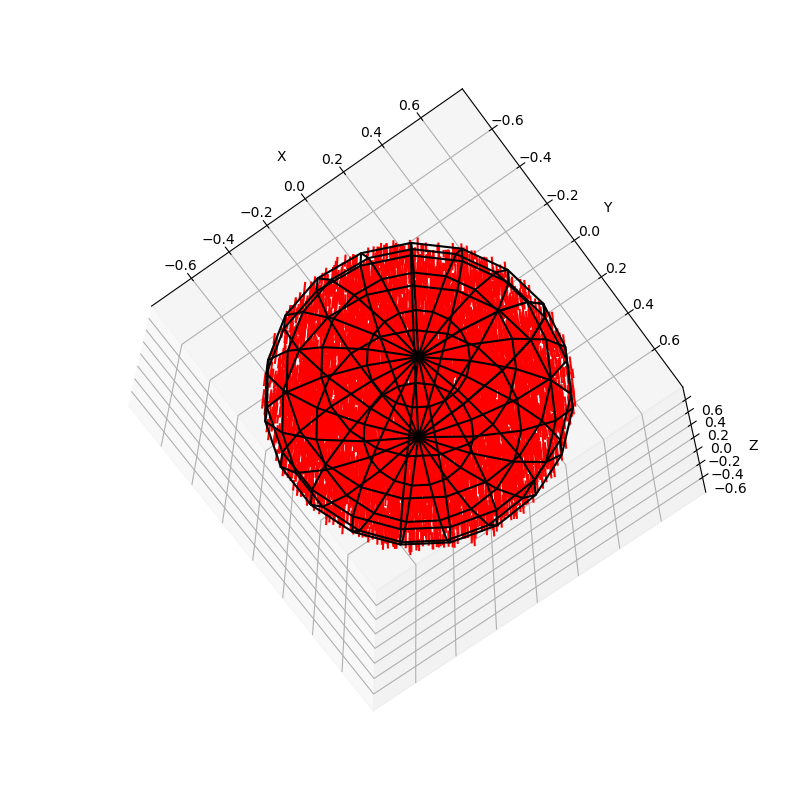

In [32]:
if run_visualization:
    %matplotlib notebook
    fig = plt.subplots(figsize=(8,8))
    ax = plt.axes(projection='3d')

    # Plot filaments
    for fil in f_list:
        fil.Plot3(ax)

    # Plot sphere wireframe
    u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
    x = R*np.cos(u)*np.sin(v)
    y = R*np.sin(u)*np.sin(v)
    z = R*np.cos(v)
    ax.plot_wireframe(x, y, z, color="black")

    ax.set_xlim3d(-R-Lmax/2, R+Lmax/2)
    ax.set_ylim3d(-R-Lmax/2, R+Lmax/2)
    ax.set_zlim3d(-R-Lmax/2, R+Lmax/2)
    ax.set(xlabel='X', ylabel='Y', zlabel='Z')

In [18]:
if write_file:
    
    # first offset system
    for fil in f_list:
        fil.pos_start += np.array(system_offset)
        fil.pos_end += np.array(system_offset)
        fil.center += np.array(system_offset)
    filer = open(fname,"w")
    filer.write('# Initial configuration of rods\n#\n')
    for fil in f_list:
        filer.write( fil.GetStringtoWrite() )
    filer.close()

## Tests:

### Minimum distance function:

In [13]:
if run_tests:
    # parallel lines with separation 1 in X
    gid=0
    f1 = Filament([0,0,0], [0,0,1],2)
    f2 = Filament([1,0,0], [0,0,1],2)
    print('Expected Distance =   1.0\nCalculated Distance = {}\n'.format(minDistBetweenTwoFil(f1,f2)))

    # parallel lines with separation 1 in X and Y
    gid=0
    f1 = Filament([0,0,0], [0,0,1],2)
    f2 = Filament([1,0,1], [0,0,1],2)
    print('Expected Distance =   1.0\nCalculated Distance = {}\n'.format(minDistBetweenTwoFil(f1,f2)))

    # parallel overlapping lines with only endpoints touching
    gid=0
    f1 = Filament([0,0,0], [0,0,1],2)
    f2 = Filament([0,0,2], [0,0,1],2)
    print('Expected Distance =   0.0\nCalculated Distance = {}\n'.format(minDistBetweenTwoFil(f1,f2)))

    # parallel overlapping lines with one line inside another
    gid=0
    f1 = Filament([0,0,0], [0,0,1],1)
    f2 = Filament([0,0,0], [0,0,1],2)
    print('Expected Distance =   0.0\nCalculated Distance = {}\n'.format(minDistBetweenTwoFil(f1,f2)))

    # parallel lines with same XY and separated in Z by 1
    gid=0
    f1 = Filament([0,0,0], [0,0,1],2)
    f2 = Filament([0,0,3], [0,0,1],2)
    print('Expected Distance =   1.0\nCalculated Distance = {}\n'.format(minDistBetweenTwoFil(f1,f2)))


### Uniform Centers Distribution:

In [22]:
if run_tests:
    xs = []
    ys = []
    zs = []
    rs = []
    thetas = []
    phis=[]
    for k in range(5000):
        center = getRand3PointInSphere(R)
        xs.append( center[0])
        ys.append( center[1])
        zs.append( center[2])
        rpt = cart2sph( center[0], center[1], center[2])
        rs.append( rpt[0])
        thetas.append(rpt[2])
        phis.append(rpt[1])

    %matplotlib inline
    fig,axs = plt.subplots(2,3, figsize=(15, 10), sharey=True,tight_layout=True)
    axs[0,0].hist( xs, bins=10)
    axs[0,0].set(xlabel='X',ylabel='Counts')
    axs[0,1].hist( ys, bins=10)
    axs[0,1].set(xlabel='Y')
    axs[0,2].hist( zs, bins=10)
    axs[0,2].set(xlabel='Z')
    axs[1,0].hist( rs, bins=10)
    axs[1,0].set(xlabel='r',ylabel='Counts')
    axs[1,1].hist( phis, bins=10)
    axs[1,1].set(xlabel='phi')
    axs[1,2].hist( thetas, bins=10)
    axs[1,2].set(xlabel='theta')

    plt.suptitle('test')
    plt.show()
    %matplotlib notebook

    fig = plt.figure(figsize=(8,8))
    ax = plt.axes(projection='3d')
    ax.scatter(xs,ys,zs, marker='.',s=4)

### Length Exponential Distribution:

In [31]:
if run_tests:
    nFil = 100000
    lens = []
    for i in range(nFil):
        lens.append( getLengthRandomExp(rng, Lmean, Lmin, Lmax))

    fig = plt.subplots(figsize=(8,6))
    ax = plt.axes()
    ax.hist( lens, bins=15)

    ax.set(xlabel='Length (micron)', ylabel='Count', title='Exponential distribution (mean = {} micron)'.format(Lmean))